In [1]:
from scipy.io import loadmat
import numpy as np
from scipy.optimize import minimize
from datetime import datetime
now = datetime.now

import matplotlib.pyplot as plt


In [2]:
from scripts_magnetic_field_calculation import chi2_one_exp_one_freq
# from scripts_magnetic_field_calculation import chi2_one_exp_multi_freq

In [3]:
rtr_dims  = {'height':10,'outer_radius':18.9,'inner_radius':15,'hole_radius':2.5,'bar_width':7} # mm

In [4]:

sampling_factor = 100
f_sample = 500
SaveDir = 'PythonFigs/FitFigs/Exp2_new_dir/Single_freqs/'
# SaveDir = 'PythonFigs/FitFigs/Change_YCh_dir/Single_freqs/'



In [1]:
%%javascript
// a slightly better version would unbind only the handlers defined above 
$([Jupyter.events]).unbind('execute.CodeCell')
$([Jupyter.events]).unbind('finished_iopub.Kernel')

<IPython.core.display.Javascript object>

%%javascript
(function(){
    var startTime;
    $([Jupyter.events]).on('execute.CodeCell', function(event, target)
    {
        startTime = performance.now();
    });
    $([Jupyter.events]).on('finished_iopub.Kernel', function(event, target)
    {
        var endTime = performance.now();

        if(endTime - startTime > 5 * 1000)
        {
            var audio = new Audio('http://www.soundjay.com/button/beep-07.wav');
            audio.play();    
        }
    });
})()

# Load data

## Experiment 1

In [7]:
dat = loadmat('data_2019-03-05.mat')
Time1 = np.array(dat['Time1'])
Time0 = np.array(dat['Time0'])
XCh0  = np.array(dat['ZCh0'])
XCh1  = np.array(dat['ZCh1'])
YCh0  = np.array(dat['YCh0'])
YCh1  = np.array(dat['YCh1'])



In [8]:

D_wheel_sensor = 10
Exp1_sensor_loc = {'coordinate':'cartesian','location':-np.array([rtr_dims['outer_radius']+D_wheel_sensor,0,0])}


In [9]:
Exp1_Freq       = [0.1,5  ,  3]
Exp1_Start_Time = [300,220,189]
Exp1_Stop_Time  = [330,220.5,190]

# Exp1_Freq       = [0.1,3,5]
# Exp1_Start_Time = [300,189,220]
# Exp1_Stop_Time  = [330,190,220.5]

Exp1A_Freq       = [0.5,  1,0.1]
Exp1A_Start_Time = [ 40, 97,  1]
Exp1A_Stop_Time  = [ 50,100, 28]

In [10]:
Exp1_Time_cut = {}
Exp1_X_cut    = {}
Exp1_Y_cut    = {}
Exp1A_Time_cut = {}
Exp1A_X_cut    = {}
Exp1A_Y_cut    = {}
# f_new_sample = {0.1:10,3:300,5:500,0.5:50}
# f_old_sample = 500
arraybool = {}
loop_theta = 0
loop_time =0
for  ii in range(len(Exp1_Freq)):
#    loop_nu            = Freq[ii]
    key           = Exp1_Freq[ii]
    f_new_sample = sampling_factor*key
    n_skips = int(np.ceil(f_sample/f_new_sample))
    arraybool = (Time1>Exp1_Start_Time[ii] )& (Time1<Exp1_Stop_Time[ii])
    Time_Full_Sample = Time1[arraybool]-Exp1_Start_Time[ii] + loop_time
    if ii < len(Exp1_Freq)-1:
        loop_theta += (Exp1_Stop_Time[ii]- Exp1_Start_Time[ii])*Exp1_Freq[ii]
        loop_time = loop_theta/Exp1_Freq[ii+1]
    new_indices = (np.arange(0,len(Time_Full_Sample),n_skips))
    Exp1_Time_cut[key] = Time_Full_Sample[new_indices]
    X_Full_Sample = 1e-12*XCh1[arraybool]
    Y_Full_Sample = 1e-12*YCh1[arraybool]
    Exp1_X_cut[key]         = X_Full_Sample[new_indices]
    Exp1_Y_cut[key]         = Y_Full_Sample[new_indices]

loop_theta = 0
loop_time =0
for  ii in range(len(Exp1A_Freq)):
#    loop_nu            = Freq[ii]
    key           = Exp1A_Freq[ii]
    f_new_sample = sampling_factor*key
    n_skips = int(np.ceil(f_sample/f_new_sample))
    arraybool = ((Time1>Exp1A_Start_Time[ii] )& (Time1<Exp1A_Stop_Time[ii]))
    Time_Full_Sample = Time1[arraybool] - Exp1A_Start_Time[ii] + loop_time
    if ii < len(Exp1A_Freq)-1:
        loop_theta += (Exp1A_Stop_Time[ii]- Exp1A_Start_Time[ii])*Exp1A_Freq[ii]
        loop_time = loop_theta/Exp1A_Freq[ii+1]
    new_indices = (np.arange(0,len(Time_Full_Sample),n_skips))
    X_Full_Sample = 1e-12*XCh1[arraybool]
    Y_Full_Sample = 1e-12*YCh1[arraybool]
    Exp1A_Time_cut[key] = Time_Full_Sample[new_indices]
    Exp1A_X_cut[key]         = X_Full_Sample[new_indices]
    Exp1A_Y_cut[key]         = Y_Full_Sample[new_indices]


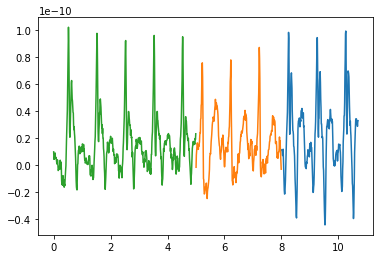

In [11]:
plt.plot(0.1*Exp1A_Time_cut[0.1],Exp1A_X_cut[0.1])
plt.plot(1*Exp1A_Time_cut[1],Exp1A_X_cut[1])
plt.plot(.5*Exp1A_Time_cut[.5],Exp1A_X_cut[.5])



## Experiment 2

In [12]:
Exp2_data_file = 'OptMagData/Exp2/20190406/20190406/AxionWeel000.0500.flt.csv'
Exp2_data = np.loadtxt(Exp2_data_file,delimiter= '\t')
Exp2_time = Exp2_data[:,0]
Exp2_AW_Z = -Exp2_data[:,1] #(AW-Z)
Exp2_AW_X = -Exp2_data[:,2] #(AW-Y) 
Exp2_AV_X =  Exp2_data[:,3] #(AV-Z)
Exp2_AV_Z = -Exp2_data[:,4] #(AV-Y)


In [13]:
D_wheel_sensor = 8
Exp2_AW_sensor_loc = {'coordinate':'cartesian',
              'location':np.array([0.5*(rtr_dims['outer_radius']+rtr_dims['inner_radius']),0,
                              rtr_dims['height']/2+D_wheel_sensor])}
Exp2_AV_sensor_loc = {'coordinate':'cartesian','location':np.array([-rtr_dims['outer_radius']-D_wheel_sensor,0,0])}




In [14]:
Exp2_Freq       = [0.1,0.5,  1,  3,  5]
Exp2_Start_Time = [ 30,200,290,400,480]
Exp2_Stop_Time  = [ 50,210,295,401,480.5]

Exp2_Time_cut = {}
Exp2_AW_X_cut    = {}
Exp2_AV_Z_cut    = {}
Exp2_AV_X_cut    = {}
Exp2_AW_Z_cut    = {}

loop_theta = 0
loop_time =0

for  ii in range(len(Exp2_Freq)):
#    loop_nu            = Freq[ii]
    key           = Exp2_Freq[ii]
    f_new_sample = sampling_factor*key
    n_skips = int(np.ceil(f_sample/f_new_sample))
#     print(key)
#     print(n_skips)
    arraybool = (Exp2_time>Exp2_Start_Time[ii] )& (Exp2_time<Exp2_Stop_Time[ii])
    Time_Full_Sample = Exp2_time[arraybool]- Exp2_Start_Time[ii] + loop_time
    if ii < len(Exp2_Freq)-1:
        loop_theta += (Exp2_Stop_Time[ii]- Exp2_Start_Time[ii])*Exp2_Freq[ii]
        loop_time = loop_theta/Exp2_Freq[ii+1]
    new_indices = (np.arange(0,len(Time_Full_Sample),n_skips))
    Exp2_Time_cut[key] = Time_Full_Sample[new_indices]
    Exp2_AW_X_cut[key]         = 1e-12*Exp2_AW_X[arraybool][new_indices]
    Exp2_AW_Z_cut[key]         = 1e-12*Exp2_AW_Z[arraybool][new_indices]
    Exp2_AV_X_cut[key]         = 1e-12*Exp2_AV_X[arraybool][new_indices]
    Exp2_AV_Z_cut[key]         = 1e-12*Exp2_AV_Z[arraybool][new_indices]
    

In [15]:
import sys, importlib
importlib.reload(sys.modules['scripts_magnetic_field_calculation'])
from scripts_magnetic_field_calculation import chi2_one_exp_one_freq
from scripts_magnetic_field_calculation import chi2_one_exp_multi_freq



# 5 Hz

## Experiment 1

[18, 0, 2, -18, 18, 0, 18, 280, 4.5, 10, 0, 0, -5.26983047, 37.6604069]
0.01864656629395843


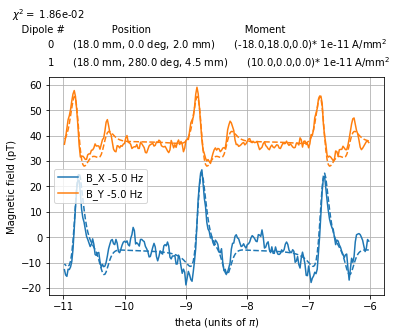

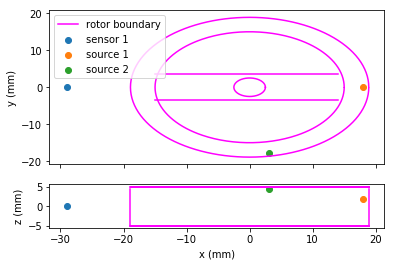

In [17]:
nu = 5
nowtext = now().strftime("%Y%m%d%H%M")
Opt_Settings_Exp1_5Hz = {'number of sources': 2,
                'location coordinate system': 'polar',
                'moment coordinate system':'polar',
                'location dimensions': 3,
                'moment dimensions': 3,
                'rotation sign':-1, # 1 for positive, -1 for negative, 0 for unknown and making it a free parameter
                'rotation frequency':nu,
                'rotor dimensions':rtr_dims,
                'time':Exp1_Time_cut[nu],
                'number of sensors':1,
                'sensor locations':[Exp1_sensor_loc],
                'sensor field order':[[0,1]],# list which order of B component of each sensor (0 for x, 1 for y, 2 for z) 
                'B data':[Exp1_X_cut[nu],Exp1_Y_cut[nu]],
                'bar location':320,
                'plot':1,
                'saveplot':0,
                'plotlabels':['B_X','B_Y'],
                'figname':SaveDir+'Exp1_5Hz_2src_'+nowtext+'_0'
                         
}
# Opt_Param = [Src1_loc_r,Src1_loc_theta,Src1_loc_z,Src1_m_r,Src1_m_theta,Src1_m_z,
#             Src2_loc_r,Src2_loc_theta,Src2_loc_z,Src2_m_r,Src2_m_theta,Src2_m_z,
#             DC_AW_X,DC_AW_Y,DC_AV_Y,DC_AV_X,sign]


# Opt_Params_Exp1_5Hz = [ 1.83010485e+01, -40,  2.08577737e+00, -1.62957197e+01,
#         1.86127668e+01,  3.07601035e-02,  4.476,  1.42372167e+00,
#        -2.11555140e+00, -8.14863499e+00, -3.58696981e+01,  2.77610237e-01,
#        -5.26983047e+00,  3.76604069e+01]
Opt_Params_Exp1_5Hz = [   18, 0,  2, -18,18, 0,

                        18, 280, 4.5, 10, 0 ,0,
       -5.26983047e+00,  3.76604069e+01]

chi_Exp1_5Hz = chi2_one_exp_one_freq(Opt_Params_Exp1_5Hz,Opt_Settings_Exp1_5Hz)

In [16]:
Opt_Settings_Exp1_5Hz['plot'] = 0
opt_res_Exp1_5Hz = minimize(chi2_one_exp_one_freq,Opt_Params_Exp1_5Hz,Opt_Settings_Exp1_5Hz,method = 'Nelder-Mead',options = {'maxfev': 7000,'maxiter': 7000,'adaptive':True,'xatol':0.1})

[ 18.           0.           2.         -18.          18.
   0.          18.         280.           4.5         10.
   0.           0.          -5.26983047  37.6604069 ]
0.018646566293958434
[ 18.9          0.           2.         -18.          18.
   0.          18.         280.           4.5         10.
   0.           0.          -5.26983047  37.6604069 ]
Source 1 not in rotor
[ 1.80000000e+01  2.50000000e-04  2.00000000e+00 -1.80000000e+01
  1.80000000e+01  0.00000000e+00  1.80000000e+01  2.80000000e+02
  4.50000000e+00  1.00000000e+01  0.00000000e+00  0.00000000e+00
 -5.26983047e+00  3.76604069e+01]
0.018646412908901528
[ 18.           0.           2.1        -18.          18.
   0.          18.         280.           4.5         10.
   0.           0.          -5.26983047  37.6604069 ]
0.018543996760978145
[ 18.           0.           2.         -18.9         18.
   0.          18.         280.           4.5         10.
   0.           0.          -5.26983047  37.6604069 ]
0.0194

0.01722784118168404
[ 1.77652526e+01  1.73096355e-04  2.04438920e+00 -1.76166411e+01
  1.81170670e+01  5.18917356e-05  1.74093636e+01  2.86915561e+02
  4.41161040e+00  9.89481996e+00  9.37926633e-05  7.72439568e-05
 -5.25493612e+00  3.78023305e+01]
0.01741427229973403
[ 1.78091371e+01  1.44329825e-04  2.02933268e+00 -1.77108857e+01
  1.79412104e+01  5.81026046e-06  1.74934949e+01  2.85743360e+02
  4.57583819e+00  9.92778603e+00  5.36970350e-05  3.47842276e-05
 -5.21082458e+00  3.84775159e+01]
0.01762768812803354
[ 1.75671898e+01  1.70939803e-04  2.03591964e+00 -1.73922610e+01
  1.79543810e+01  1.26317288e-05  1.83022640e+01  2.86168247e+02
  4.59206451e+00  9.79384428e+00  6.73594712e-05  4.57448341e-05
 -5.19611195e+00  3.77137671e+01]
0.01770351517918232
[ 1.76624333e+01  1.00574057e-05  2.04623036e+00 -1.74805584e+01
  1.80622216e+01  4.38500639e-05  1.75171573e+01  2.88209766e+02
  4.61687010e+00  9.84859257e+00  8.99306126e-05  7.86154493e-05
 -5.22503079e+00  3.79731611e+01]
0.01

0.01675258802243012
[ 1.80637133e+01  1.62073508e-04  2.03908686e+00 -1.71273932e+01
  1.87767222e+01  6.05766426e-05  1.73886331e+01  2.88092354e+02
  4.73947381e+00  9.93229405e+00 -6.82988043e-05 -7.57990347e-05
 -5.07781335e+00  3.79029051e+01]
0.017055392458228947
[ 1.77795232e+01  1.88697803e-04  2.04861832e+00 -1.70748304e+01
  1.89155308e+01  7.98294296e-05  1.72825162e+01  2.84368136e+02
  4.77851611e+00  9.94925644e+00 -6.67716136e-05 -7.38937200e-05
 -5.06795239e+00  3.80400745e+01]
0.01673750109355011
[ 1.78979909e+01  1.71749661e-04  2.06926905e+00 -1.69408253e+01
  1.88239387e+01  5.33434349e-05  1.75135901e+01  2.85721322e+02
  4.73864065e+00  9.72197920e+00 -1.81106076e-05 -3.75977896e-06
 -5.10947192e+00  3.76001627e+01]
0.01659900421978585
[ 1.77099424e+01  1.84436699e-04  2.05827962e+00 -1.72186485e+01
  1.82690186e+01  4.34427688e-05  1.74335874e+01  2.82914583e+02
  4.67229134e+00  9.79080016e+00  7.03504252e-05  5.42147983e-05
 -5.17694784e+00  3.78748974e+01]
0.0

0.016281459405930468
[ 1.79300423e+01  2.86081849e-04  2.08776708e+00 -1.57694819e+01
  1.91615931e+01  1.49664112e-04  1.72731365e+01  2.85058796e+02
  5.07128895e+00  9.66371921e+00 -6.26217997e-06 -1.03810566e-04
 -4.75740908e+00  3.79829709e+01]
Source 2 not in rotor
[ 1.80824267e+01  1.95186860e-04  2.10151070e+00 -1.61844309e+01
  1.85550967e+01  7.56571093e-05  1.73536789e+01  2.86517749e+02
  4.76402352e+00  9.75399334e+00  2.00184137e-05  6.16410708e-05
 -4.98847993e+00  3.78741463e+01]
0.016303481092905726
[ 1.79928984e+01  1.88321233e-04  2.09012833e+00 -1.55838262e+01
  1.87318816e+01  2.07624559e-04  1.77196958e+01  2.84778429e+02
  4.89004619e+00  9.62757584e+00 -4.89551425e-05  6.23233339e-05
 -4.89172531e+00  3.80440008e+01]
0.01612108295887956
[ 1.79888447e+01  1.82667616e-04  2.08931972e+00 -1.55250000e+01
  1.87239697e+01  2.21444240e-04  1.77729108e+01  2.84621471e+02
  4.89092082e+00  9.61534670e+00 -5.68238914e-05  7.10319812e-05
 -4.89080204e+00  3.80610813e+01]


[ 1.81151382e+01  2.50668028e-04  2.19759392e+00 -1.54417164e+01
  1.87272039e+01  1.23932996e-04  1.76379543e+01  2.86360562e+02
  4.88585871e+00  9.55044214e+00  6.37825111e-06  6.71108900e-05
 -4.73115239e+00  3.77857003e+01]
0.01597476766693357
[ 1.82392700e+01  2.02264558e-04  2.18805842e+00 -1.57360244e+01
  1.80464237e+01  1.85844142e-04  1.78134773e+01  2.84497841e+02
  4.93492452e+00  9.66803189e+00 -1.44579413e-05 -4.21091655e-05
 -4.75905215e+00  3.76216531e+01]
0.015914152233360665
[ 1.82424936e+01  2.05741406e-04  2.23446264e+00 -1.50656213e+01
  1.82651055e+01  1.79767688e-04  1.77560757e+01  2.85877426e+02
  4.93044364e+00  9.68746142e+00 -5.15871919e-05 -9.91374769e-06
 -4.75500926e+00  3.76895410e+01]
0.015888302833082003
[ 1.83948793e+01  2.21608053e-04  2.21130910e+00 -1.53483412e+01
  1.84193060e+01  9.72116300e-05  1.74993339e+01  2.84501042e+02
  4.96029747e+00  9.57250367e+00 -5.62974045e-06  1.22079810e-05
 -4.77674080e+00  3.78636737e+01]
0.016026970680626543
[

0.015671932113334536
[ 1.83153124e+01  1.94434582e-04  2.25587065e+00 -1.49837791e+01
  1.79394599e+01  1.34278908e-04  1.82032414e+01  2.83748989e+02
  4.91384145e+00  9.45180542e+00 -1.12303962e-04  1.06820773e-04
 -4.67692216e+00  3.78469562e+01]
0.01566067313588419
[ 1.82928588e+01  1.97428554e-04  2.19643311e+00 -1.56748784e+01
  1.79787861e+01  1.73091298e-04  1.79039405e+01  2.83697909e+02
  4.93432831e+00  9.59059110e+00 -1.68934751e-05 -1.00855701e-05
 -4.73719511e+00  3.76642150e+01]
0.015893694272687744
[ 1.82193179e+01  1.95771925e-04  2.21904353e+00 -1.48158473e+01
  1.84031364e+01  1.29142394e-04  1.80294716e+01  2.84716855e+02
  4.96507127e+00  9.56131060e+00 -8.47276234e-05  9.39906152e-05
 -4.68695133e+00  3.79939147e+01]
0.01581528279642493
[ 1.83626026e+01  1.78038516e-04  2.25023991e+00 -1.50159276e+01
  1.80709045e+01  8.23853405e-05  1.81436524e+01  2.84065183e+02
  5.00369583e+00  9.57956748e+00 -3.62345417e-05  2.78848040e-05
 -4.61566668e+00  3.77956005e+01]
So

0.015667208909730914
[ 1.84044749e+01  2.38158808e-04  2.29356599e+00 -1.47857264e+01
  1.80635905e+01  1.46491628e-04  1.85064540e+01  2.83836654e+02
  4.90932387e+00  9.34640377e+00 -1.94349894e-04 -2.17647094e-05
 -4.67010957e+00  3.77544076e+01]
0.01562946456740665
[ 1.83615671e+01  2.71542417e-04  2.32852257e+00 -1.49203261e+01
  1.76401359e+01  2.31089272e-04  1.80824774e+01  2.83880840e+02
  4.93896231e+00  9.44679446e+00 -1.46699172e-04  3.17791067e-05
 -4.62364355e+00  3.79218560e+01]
0.015595186352631272
[ 1.84492901e+01  2.03963164e-04  2.25827788e+00 -1.49044639e+01
  1.74977953e+01  2.09816623e-04  1.82817616e+01  2.82751551e+02
  4.97486309e+00  9.57789485e+00 -6.34082339e-05 -2.20830999e-05
 -4.71594934e+00  3.77842458e+01]
0.01572568058567002
[ 1.83614477e+01  2.32229013e-04  2.26530877e+00 -1.49836170e+01
  1.77364298e+01  1.53437442e-04  1.84302238e+01  2.84279416e+02
  4.97282403e+00  9.31249085e+00 -9.01606999e-05  5.34491246e-05
 -4.74130391e+00  3.78767106e+01]
0.

0.015568719038952563
[ 1.83789230e+01  2.78607600e-04  2.30373782e+00 -1.44961441e+01
  1.74749033e+01  2.23058656e-04  1.87328604e+01  2.84804805e+02
  4.92612172e+00  9.18860206e+00 -7.44418547e-05 -2.50340713e-06
 -4.67301989e+00  3.79133603e+01]
0.015505132795579314
[ 1.84920560e+01  2.69686852e-04  2.35470527e+00 -1.46301438e+01
  1.71654897e+01  1.37322380e-04  1.87338352e+01  2.83638637e+02
  4.95740968e+00  9.33446102e+00 -1.32738631e-04  2.45135621e-05
 -4.72314867e+00  3.76363289e+01]
0.015485333056022847
[ 1.85109375e+01  2.73767419e-04  2.31746617e+00 -1.45787073e+01
  1.73775792e+01  1.69720913e-04  1.86647101e+01  2.84260862e+02
  4.99113714e+00  9.17716680e+00 -2.11547166e-04  9.01677007e-05
 -4.66668515e+00  3.78153657e+01]
0.015389626792418332
[ 1.85227147e+01  2.76318901e-04  2.31756348e+00 -1.45645838e+01
  1.73649568e+01  1.64481507e-04  1.86719550e+01  2.84251899e+02
  4.99688897e+00  9.16408545e+00 -2.16068073e-04  9.61302145e-05
 -4.66892411e+00  3.78191053e+01]


 -4.55089937e+00  3.78112212e+01]
0.015346469901277287
[ 1.86123899e+01  2.84808031e-04  2.39315254e+00 -1.41982757e+01
  1.66790301e+01  3.11277816e-04  1.89316553e+01  2.83757629e+02
  4.96034332e+00  9.06210286e+00 -2.69243616e-04  1.36424734e-04
 -4.55861949e+00  3.78037940e+01]
Source 2 not in rotor
[ 1.84943624e+01  2.79974731e-04  2.35269505e+00 -1.46091599e+01
  1.71204273e+01  2.64435841e-04  1.86019069e+01  2.84007768e+02
  4.94942104e+00  9.17807312e+00 -1.73836856e-04  6.33168044e-05
 -4.61179663e+00  3.78746476e+01]
0.015356145904245888
[ 1.86043354e+01  2.61458577e-04  2.40744797e+00 -1.46598861e+01
  1.68875556e+01  2.66660542e-04  1.86639899e+01  2.82945039e+02
  4.96782869e+00  9.21943370e+00 -3.46803518e-04  1.10504607e-04
 -4.56482684e+00  3.77051027e+01]
0.015402151663214245
[ 1.85013603e+01  2.94237495e-04  2.34473814e+00 -1.43215593e+01
  1.69859404e+01  2.92361365e-04  1.87703063e+01  2.84496660e+02
  4.94507139e+00  9.08047992e+00 -1.28450607e-04  8.03595235e-05

0.01528016409471473
[ 1.86301131e+01  3.23846355e-04  2.45093074e+00 -1.42912109e+01
  1.65724806e+01  3.27372340e-04  1.88359274e+01  2.84022798e+02
  4.92812264e+00  8.98555722e+00 -3.10429211e-04  6.55966252e-05
 -4.49284254e+00  3.78026379e+01]
0.015205254164865867
[ 1.86384460e+01  2.96625178e-04  2.43816012e+00 -1.44098196e+01
  1.65893809e+01  2.01644454e-04  1.88807885e+01  2.83308835e+02
  4.95716955e+00  9.10212454e+00 -1.92143775e-04  6.15407784e-05
 -4.63790022e+00  3.76989048e+01]
0.015277038627519696
[ 1.86631987e+01  2.90046905e-04  2.40993192e+00 -1.44079511e+01
  1.63515495e+01  3.01094271e-04  1.88487999e+01  2.83196740e+02
  4.94382692e+00  8.98968564e+00 -1.69064911e-04  5.71389242e-05
 -4.57164864e+00  3.78513860e+01]
0.015217528148020463
[ 1.85747010e+01  3.00217163e-04  2.37130782e+00 -1.44407999e+01
  1.66946860e+01  3.94883555e-04  1.86571492e+01  2.84335889e+02
  4.94407494e+00  8.93302877e+00 -2.51479572e-04  1.30588132e-04
 -4.49249079e+00  3.80184742e+01]
0

0.015182931596888629
[ 1.87191081e+01  3.55510243e-04  2.45748099e+00 -1.42349752e+01
  1.61754528e+01  4.00569122e-04  1.87132759e+01  2.84156192e+02
  4.99186558e+00  8.88158572e+00 -2.76032392e-04  1.11218030e-04
 -4.48406423e+00  3.78909994e+01]
0.015133100435569601
[ 1.87082569e+01  3.39789540e-04  2.48507055e+00 -1.42331041e+01
  1.62591124e+01  2.71383851e-04  1.87721458e+01  2.83131453e+02
  4.95198625e+00  8.93714297e+00 -2.80219380e-04  1.86635916e-04
 -4.53106588e+00  3.78117506e+01]
0.015177441915721065
[ 1.87396405e+01  3.44962782e-04  2.46631587e+00 -1.42350649e+01
  1.62594979e+01  2.97340630e-04  1.87980034e+01  2.84149287e+02
  4.99255459e+00  8.90225453e+00 -2.72418303e-04  1.13233455e-04
 -4.50175286e+00  3.79337126e+01]
0.015138291972801402
[ 1.87584012e+01  3.50978458e-04  2.48444887e+00 -1.41529807e+01
  1.61067710e+01  3.34757334e-04  1.88469357e+01  2.83936823e+02
  4.96594399e+00  8.84327885e+00 -2.56606712e-04  1.19177842e-04
 -4.50932129e+00  3.77954119e+01]


0.01508645770834637
[ 1.88082557e+01  3.30054357e-04  2.51291441e+00 -1.42261287e+01
  1.59784011e+01  4.17355303e-04  1.88541495e+01  2.83746360e+02
  4.99052557e+00  8.75111086e+00 -2.56310728e-04  9.09995953e-06
 -4.46117180e+00  3.78556840e+01]
0.0150657496164088
[ 1.88253337e+01  3.60156141e-04  2.54712862e+00 -1.41058261e+01
  1.58363247e+01  4.01922421e-04  1.88133096e+01  2.83367030e+02
  4.95673461e+00  8.75058300e+00 -2.82464819e-04  6.90191109e-05
 -4.45211742e+00  3.78723910e+01]
0.015072274453536481
[ 1.88483999e+01  3.69768665e-04  2.53815713e+00 -1.41088053e+01
  1.56463182e+01  4.30780057e-04  1.87710032e+01  2.83829056e+02
  4.97897280e+00  8.77222066e+00 -1.86586051e-04  4.09918743e-05
 -4.52353467e+00  3.77798589e+01]
0.015063231215269826
[ 1.88559920e+01  3.70122851e-04  2.55675085e+00 -1.40220329e+01
  1.56789929e+01  5.08566489e-04  1.87856974e+01  2.83883737e+02
  4.97362321e+00  8.71966574e+00 -1.74078434e-04 -9.58786872e-05
 -4.45106113e+00  3.78910794e+01]
0.0

0.015001439791684536
[ 1.88556600e+01  3.76454324e-04  2.56905451e+00 -1.39894257e+01
  1.57642188e+01  4.30320252e-04  1.88694141e+01  2.83521637e+02
  4.95934208e+00  8.60920479e+00 -1.31183026e-04 -4.85623046e-05
 -4.45959504e+00  3.77903245e+01]
0.015008565238701215
[ 1.89183517e+01  3.96607505e-04  2.58541114e+00 -1.38669581e+01
  1.55780746e+01  4.43500230e-04  1.88426001e+01  2.83780985e+02
  4.96074591e+00  8.55733929e+00 -9.37500214e-05 -7.87843595e-05
 -4.48747566e+00  3.78085061e+01]
Source 1 not in rotor
[ 1.88283129e+01  3.72797595e-04  2.53545544e+00 -1.40311572e+01
  1.58441510e+01  4.39020485e-04  1.88420824e+01  2.84054585e+02
  4.95843916e+00  8.65639906e+00 -1.43332147e-04 -3.51458765e-05
 -4.47815402e+00  3.78510077e+01]
0.015027906686148472
[ 1.88462371e+01  3.53119913e-04  2.53899208e+00 -1.41437242e+01
  1.58522485e+01  4.32490500e-04  1.88623445e+01  2.83980906e+02
  4.98271479e+00  8.55146528e+00 -1.39866867e-04 -4.17971645e-05
 -4.46667735e+00  3.78962788e+01]

0.014971228027764022
[ 1.88491694e+01  3.58004632e-04  2.54765715e+00 -1.39413285e+01
  1.58189777e+01  4.85350336e-04  1.88940464e+01  2.84002746e+02
  4.94817555e+00  8.44159270e+00  7.05938094e-05 -1.17263521e-04
 -4.50837102e+00  3.78448203e+01]
0.01496032384578085
[ 1.88477881e+01  3.55880773e-04  2.54626744e+00 -1.39404060e+01
  1.58273451e+01  4.88659246e-04  1.88986224e+01  2.84011709e+02
  4.94821353e+00  8.43389258e+00  8.33240530e-05 -1.23789486e-04
 -4.51052309e+00  3.78415509e+01]
0.014958267629889142
[ 1.88464907e+01  3.65535544e-04  2.56162100e+00 -1.39825685e+01
  1.58149718e+01  4.30269661e-04  1.88930640e+01  2.83389348e+02
  4.94139576e+00  8.52470519e+00 -2.51511782e-05 -7.20309938e-05
 -4.50456954e+00  3.77865309e+01]
0.014990186405542609
[ 1.88508160e+01  3.87061774e-04  2.54717325e+00 -1.40304334e+01
  1.58197901e+01  4.10121839e-04  1.88415918e+01  2.84239255e+02
  4.94356441e+00  8.44209844e+00  3.89687969e-05 -9.91507096e-05
 -4.56460944e+00  3.78488861e+01]
0

0.01493335961844187
[ 1.88206227e+01  3.48064754e-04  2.52451298e+00 -1.40301365e+01
  1.58042487e+01  5.56210272e-04  1.88628704e+01  2.84147544e+02
  4.92902996e+00  8.23535839e+00  1.66531850e-04 -1.60484221e-04
 -4.51782518e+00  3.79069977e+01]
0.014932198454553246
[ 1.88355480e+01  3.74950247e-04  2.54652786e+00 -1.40501630e+01
  1.59048861e+01  4.42063819e-04  1.88235505e+01  2.84373914e+02
  4.92375944e+00  8.27410201e+00  1.15230392e-04 -1.12255753e-04
 -4.56192170e+00  3.78615980e+01]
0.014949610005057859
[ 1.88787594e+01  3.70006858e-04  2.57406787e+00 -1.39447105e+01
  1.57270907e+01  4.89449502e-04  1.88912341e+01  2.83840018e+02
  4.94908203e+00  8.31933322e+00  1.17993705e-04 -1.25456523e-04
 -4.49309811e+00  3.78920787e+01]
0.014925673085498156
[ 1.88817773e+01  3.70116043e-04  2.57532253e+00 -1.39394590e+01
  1.57218666e+01  4.90852096e-04  1.88959196e+01  2.83819137e+02
  4.95076120e+00  8.31598432e+00  1.26065378e-04 -1.29233920e-04
 -4.49295600e+00  3.78924228e+01]
0

0.014903014093055283
[ 1.88828901e+01  3.67620026e-04  2.56438153e+00 -1.39622305e+01
  1.57665522e+01  5.20471739e-04  1.88966775e+01  2.83887691e+02
  4.91613431e+00  8.12097154e+00  1.73890480e-04 -1.76553069e-04
 -4.48532631e+00  3.78804066e+01]
0.014897524038556459
[ 1.88384382e+01  3.60080245e-04  2.57904440e+00 -1.39307304e+01
  1.58623568e+01  5.20526466e-04  1.89060586e+01  2.84120029e+02
  4.90127268e+00  8.13007511e+00  2.30232359e-04 -2.05338737e-04
 -4.49425580e+00  3.79015251e+01]
Source 2 not in rotor
[ 1.88733543e+01  3.68105527e-04  2.55679051e+00 -1.40454069e+01
  1.56855864e+01  4.97362193e-04  1.88468230e+01  2.83921666e+02
  4.92762427e+00  8.19740661e+00  1.26360994e-04 -9.80172291e-05
 -4.50490699e+00  3.78798976e+01]
0.01491738726504824
[ 1.88346313e+01  3.59120059e-04  2.55415596e+00 -1.40709264e+01
  1.57914319e+01  5.24105865e-04  1.88400756e+01  2.84204144e+02
  4.87922240e+00  8.00577966e+00  2.13258312e-04 -1.51775600e-04
 -4.50968928e+00  3.78836060e+01]


[ 1.88423703e+01  3.59170220e-04  2.57010902e+00 -1.40514547e+01
  1.58476087e+01  4.97099819e-04  1.88594218e+01  2.84205109e+02
  4.86893290e+00  7.89826553e+00  2.72505051e-04 -1.67611084e-04
 -4.52956767e+00  3.78702450e+01]
0.014867119387223928
[ 1.88399461e+01  3.58292992e-04  2.56982795e+00 -1.40509734e+01
  1.58594170e+01  4.94299712e-04  1.88590718e+01  2.84226549e+02
  4.86624799e+00  7.88608106e+00  2.75099670e-04 -1.66872841e-04
 -4.53148907e+00  3.78654123e+01]
0.014866203415993757
[ 1.88886563e+01  3.72281063e-04  2.59396374e+00 -1.40251392e+01
  1.57425021e+01  5.02322657e-04  1.88909395e+01  2.83877684e+02
  4.90021854e+00  7.96955696e+00  2.97143818e-04 -1.94098580e-04
 -4.52429475e+00  3.79226633e+01]
0.014861963452795885
[ 1.88927558e+01  3.73277236e-04  2.59691515e+00 -1.40211979e+01
  1.57386522e+01  5.00597051e-04  1.88948576e+01  2.83852401e+02
  4.90208325e+00  7.96855230e+00  3.02690778e-04 -1.97006641e-04
 -4.52525262e+00  3.79254980e+01]
0.014860437858512788


0.014835455106134212
[ 1.88603184e+01  3.67561481e-04  2.60336345e+00 -1.40370232e+01
  1.57812175e+01  4.95442636e-04  1.88891836e+01  2.83713279e+02
  4.84943846e+00  7.83588459e+00  3.49987292e-04 -1.82358028e-04
 -4.53259400e+00  3.78647955e+01]
0.014835388929984511
[ 1.89023954e+01  3.82702542e-04  2.62130748e+00 -1.39483079e+01
  1.56914563e+01  5.20891919e-04  1.88823348e+01  2.84005758e+02
  4.84572911e+00  7.76884652e+00  3.46275198e-04 -1.74825589e-04
 -4.50347171e+00  3.78646762e+01]
Source 1 not in rotor
[ 1.88389848e+01  3.57956955e-04  2.57766493e+00 -1.41608752e+01
  1.58190253e+01  4.98707577e-04  1.88669217e+01  2.83914842e+02
  4.85913934e+00  7.84730083e+00  3.41295473e-04 -2.10669926e-04
 -4.55564929e+00  3.79123946e+01]
0.01485028763913052
[ 1.88496580e+01  3.82790891e-04  2.58782030e+00 -1.40418930e+01
  1.57172762e+01  5.08812253e-04  1.88520524e+01  2.84288264e+02
  4.83575550e+00  7.69843744e+00  4.44074827e-04 -2.07883373e-04
 -4.54867576e+00  3.78999759e+01]


0.014802500955531412
[ 1.88334838e+01  3.78397451e-04  2.62920405e+00 -1.41577849e+01
  1.58409613e+01  4.28988098e-04  1.88483764e+01  2.84219628e+02
  4.78183579e+00  7.50061631e+00  4.69393534e-04 -1.87320716e-04
 -4.58253595e+00  3.78339016e+01]
0.014802529472273767
[ 1.88747464e+01  3.80922356e-04  2.64000413e+00 -1.41740086e+01
  1.57725208e+01  4.92392795e-04  1.88663791e+01  2.83954780e+02
  4.78802252e+00  7.47338318e+00  4.17654108e-04 -2.43093745e-04
 -4.52499402e+00  3.78605813e+01]
0.014789032709406543
[ 1.88763786e+01  3.80918536e-04  2.64114923e+00 -1.41759760e+01
  1.57732478e+01  4.96501383e-04  1.88664931e+01  2.83951621e+02
  4.78551269e+00  7.45659794e+00  4.17878636e-04 -2.48556346e-04
 -4.52110243e+00  3.78587633e+01]
0.01478781919374784
[ 1.88427605e+01  3.70846812e-04  2.62244260e+00 -1.42431357e+01
  1.58460938e+01  4.76343167e-04  1.88785080e+01  2.84080626e+02
  4.78733719e+00  7.45941602e+00  4.47365751e-04 -2.18960406e-04
 -4.56904733e+00  3.78872422e+01]
0

 -4.53938477e+00  3.78870161e+01]
0.014755897953431506
[ 1.88940481e+01  4.08858456e-04  2.71432260e+00 -1.41885271e+01
  1.57155191e+01  4.00145601e-04  1.88616263e+01  2.83855789e+02
  4.73848549e+00  7.32090873e+00  4.90122491e-04 -2.20377743e-04
 -4.53736892e+00  3.78870412e+01]
0.01475444731935937
[ 1.88870512e+01  4.04376922e-04  2.69241201e+00 -1.42822616e+01
  1.57660109e+01  4.00668864e-04  1.88563284e+01  2.84131902e+02
  4.73423654e+00  7.23557066e+00  4.84197552e-04 -2.34128622e-04
 -4.57093421e+00  3.78944296e+01]
0.014758143770401482
[ 1.88616497e+01  3.92833648e-04  2.69144565e+00 -1.42309012e+01
  1.58038783e+01  4.10086568e-04  1.88995383e+01  2.84049252e+02
  4.73330720e+00  7.30377850e+00  4.37253235e-04 -2.36806031e-04
 -4.52459922e+00  3.79160612e+01]
0.014753809286907981
[ 1.88600826e+01  3.92772408e-04  2.69340326e+00 -1.42317363e+01
  1.58080213e+01  4.07579385e-04  1.89037431e+01  2.84059858e+02
  4.73025925e+00  7.29624698e+00  4.32343975e-04 -2.38796205e-04
 

0.014734278384321597
[ 1.88615376e+01  4.04969886e-04  2.74581153e+00 -1.44028663e+01
  1.57705655e+01  3.83245593e-04  1.88655300e+01  2.83885915e+02
  4.67688928e+00  6.99034763e+00  5.66373119e-04 -2.52578722e-04
 -4.56523271e+00  3.79249556e+01]
0.014724167422679634
[ 1.88643418e+01  3.93242215e-04  2.71943957e+00 -1.43464385e+01
  1.58469358e+01  3.66003341e-04  1.89052426e+01  2.83829813e+02
  4.68332573e+00  7.06083979e+00  5.80791498e-04 -2.45791954e-04
 -4.58248911e+00  3.79061143e+01]
Source 2 not in rotor
[ 1.88713504e+01  3.99847231e-04  2.71311329e+00 -1.43007944e+01
  1.57682737e+01  4.14318296e-04  1.88671934e+01  2.83936446e+02
  4.71185206e+00  7.17022437e+00  4.96743235e-04 -2.22556545e-04
 -4.54331384e+00  3.78886898e+01]
0.014740467899621999
[ 1.88806357e+01  4.16491903e-04  2.75062918e+00 -1.42553339e+01
  1.58808199e+01  3.69944261e-04  1.88973338e+01  2.83938442e+02
  4.67923389e+00  7.12273357e+00  4.60346629e-04 -2.21320774e-04
 -4.51889920e+00  3.78818203e+01]

0.014720974865448681
[ 1.88654583e+01  3.90515954e-04  2.72493487e+00 -1.43596067e+01
  1.59249161e+01  4.59088182e-04  1.88867227e+01  2.83952675e+02
  4.65836912e+00  6.88369413e+00  6.29581601e-04 -3.11678270e-04
 -4.58479939e+00  3.79105125e+01]
0.014715658433089246
[ 1.88782759e+01  4.12545469e-04  2.75498305e+00 -1.43255520e+01
  1.58351336e+01  3.60485707e-04  1.89032602e+01  2.84044757e+02
  4.66564185e+00  7.00067989e+00  4.97555005e-04 -2.27731699e-04
 -4.53654665e+00  3.79042090e+01]
Source 2 not in rotor
[ 1.88733418e+01  4.01785241e-04  2.72818958e+00 -1.43514502e+01
  1.58186521e+01  3.79238736e-04  1.88754174e+01  2.83841867e+02
  4.68241124e+00  7.04556265e+00  5.45695403e-04 -2.18035899e-04
 -4.57092917e+00  3.78751966e+01]
0.014721040139841794
[ 1.88546978e+01  4.12787084e-04  2.75190556e+00 -1.44882563e+01
  1.58771581e+01  3.28486670e-04  1.88709652e+01  2.83943915e+02
  4.64542740e+00  6.92345479e+00  5.39019909e-04 -2.20430600e-04
 -4.58794086e+00  3.79005645e+01]

0.014690349952066648
[ 1.88571627e+01  4.29935808e-04  2.81431501e+00 -1.45357041e+01
  1.59083894e+01  2.95954126e-04  1.88699288e+01  2.83856504e+02
  4.58854776e+00  6.70726674e+00  5.46794808e-04 -2.09071260e-04
 -4.56683673e+00  3.78744768e+01]
0.01468527012599906
[ 1.88795760e+01  4.31583393e-04  2.80579505e+00 -1.44743995e+01
  1.59323293e+01  2.62793884e-04  1.88925109e+01  2.83806200e+02
  4.61473290e+00  6.83131100e+00  4.97992282e-04 -1.86666308e-04
 -4.55484892e+00  3.78812063e+01]
0.01468238252890348
[ 1.88816475e+01  4.33307713e-04  2.80836477e+00 -1.44737567e+01
  1.59359367e+01  2.56158963e-04  1.88942256e+01  2.83800520e+02
  4.61473758e+00  6.83452751e+00  4.92158819e-04 -1.84761578e-04
 -4.55244619e+00  3.78822956e+01]
0.014681408890541857
[ 1.88782730e+01  4.41904767e-04  2.81641089e+00 -1.44513511e+01
  1.59111560e+01  2.47331435e-04  1.88703627e+01  2.84027564e+02
  4.59248560e+00  6.72224231e+00  5.11008745e-04 -1.49952488e-04
 -4.56398573e+00  3.78415814e+01]
0.

0.014672797177670465
[ 1.88603488e+01  4.39850562e-04  2.85259047e+00 -1.46733531e+01
  1.60320906e+01  1.78359141e-04  1.88723300e+01  2.83747796e+02
  4.55579415e+00  6.61222389e+00  4.70866915e-04 -1.43008426e-04
 -4.58091781e+00  3.78264934e+01]
0.014667155486073334
[ 1.88712675e+01  4.60580307e-04  2.87692522e+00 -1.45955114e+01
  1.59431197e+01  1.67478848e-04  1.88674335e+01  2.83795273e+02
  4.54117642e+00  6.58968755e+00  4.56379776e-04 -9.55521162e-05
 -4.52790658e+00  3.78507357e+01]
0.01466776927946873
[ 1.88589338e+01  4.45550264e-04  2.85540788e+00 -1.46235693e+01
  1.60101544e+01  1.71110652e-04  1.88830661e+01  2.83771818e+02
  4.54720708e+00  6.59649754e+00  4.95748550e-04 -1.14007008e-04
 -4.57677722e+00  3.78229252e+01]
0.014662098999615633
[ 1.88587594e+01  4.46567572e-04  2.85816580e+00 -1.46302825e+01
  1.60155867e+01  1.63872175e-04  1.88834122e+01  2.83768107e+02
  4.54419476e+00  6.58753167e+00  4.93465078e-04 -1.08887414e-04
 -4.57743898e+00  3.78201844e+01]
0

0.014646436019164629
[ 1.88446637e+01  4.57970279e-04  2.90606519e+00 -1.47329191e+01
  1.60945488e+01  7.75675766e-05  1.88904303e+01  2.83842589e+02
  4.51464711e+00  6.51674715e+00  4.49611473e-04 -8.02854866e-05
 -4.55710623e+00  3.78273764e+01]
0.014645679621501442
[ 1.88653072e+01  4.73431224e-04  2.91461028e+00 -1.46722487e+01
  1.60300366e+01  1.00728663e-04  1.88896402e+01  2.83690520e+02
  4.53068753e+00  6.59553460e+00  4.26525321e-04 -1.00204972e-04
 -4.55375470e+00  3.78347790e+01]
0.014643276688527848
[ 1.88657749e+01  4.75350057e-04  2.91864202e+00 -1.46752462e+01
  1.60310687e+01  9.62184119e-05  1.88900850e+01  2.83684978e+02
  4.52972273e+00  6.59610624e+00  4.21743910e-04 -9.95847975e-05
 -4.55206297e+00  3.78358215e+01]
0.014642110257541446
[ 1.88583443e+01  4.69892006e-04  2.90981239e+00 -1.48339253e+01
  1.60573851e+01  5.26099696e-05  1.88765891e+01  2.83590769e+02
  4.51678363e+00  6.49649699e+00  4.13471438e-04 -5.14795023e-05
 -4.57859118e+00  3.78235178e+01]


0.014630138462762987
[ 1.88844867e+01  5.05131055e-04  2.97997352e+00 -1.48142616e+01
  1.60444411e+01 -4.67961200e-05  1.88809817e+01  2.83625038e+02
  4.48899685e+00  6.40345046e+00  3.64628757e-04 -3.70457920e-06
 -4.54713271e+00  3.78107262e+01]
0.014627807833115786
[ 1.88564566e+01  5.01268987e-04  2.97839591e+00 -1.48523820e+01
  1.61498805e+01 -6.06863113e-05  1.88893347e+01  2.83851752e+02
  4.47666216e+00  6.41589903e+00  3.31352448e-04 -8.11176764e-06
 -4.53869668e+00  3.78319179e+01]
0.014624651807284526
[ 1.88540913e+01  5.02248428e-04  2.98150215e+00 -1.48662817e+01
  1.61605627e+01 -6.87097551e-05  1.88897768e+01  2.83866765e+02
  4.47298255e+00  6.40353924e+00  3.25702678e-04 -4.67170473e-06
 -4.53758198e+00  3.78330041e+01]
0.014624019486889165
[ 1.88649065e+01  5.15283849e-04  3.00822073e+00 -1.48683636e+01
  1.61697276e+01 -7.45328840e-05  1.88727819e+01  2.83826689e+02
  4.45559682e+00  6.34104227e+00  3.63884925e-04 -1.77078712e-05
 -4.54022223e+00  3.78292848e+01]


0.014606223291344525
[ 1.88810053e+01  5.36685907e-04  3.06092703e+00 -1.49511982e+01
  1.61438103e+01 -2.10504435e-04  1.88909393e+01  2.83795535e+02
  4.46745238e+00  6.42225351e+00  2.43342088e-04  7.38613478e-05
 -4.52145100e+00  3.78388228e+01]
0.014599223297541002
[ 1.88825745e+01  5.38113968e-04  3.06486266e+00 -1.49584353e+01
  1.61392221e+01 -2.18934107e-04  1.88914955e+01  2.83794085e+02
  4.46904128e+00  6.42810576e+00  2.34354584e-04  8.04089014e-05
 -4.51845584e+00  3.78403020e+01]
0.014598148781424417
[ 1.88656061e+01  5.46217865e-04  3.05873248e+00 -1.49862321e+01
  1.62576796e+01 -2.24280427e-04  1.88964074e+01  2.83965788e+02
  4.44979962e+00  6.31870624e+00  2.86032573e-04  3.33511325e-05
 -4.53932590e+00  3.78507768e+01]
0.014599348663798264
[ 1.88764794e+01  5.50572450e-04  3.07234009e+00 -1.48168374e+01
  1.61934254e+01 -1.98736484e-04  1.88979969e+01  2.84039664e+02
  4.44321344e+00  6.38385902e+00  2.87376495e-04  2.85709949e-05
 -4.51411815e+00  3.78251778e+01]


Source 2 not in rotor
[ 1.89051830e+01  5.92057223e-04  3.15253438e+00 -1.50891433e+01
  1.61734226e+01 -4.36957498e-04  1.88795710e+01  2.83865132e+02
  4.44704633e+00  6.37923473e+00  1.52660291e-04  1.80064472e-04
 -4.54383760e+00  3.78624195e+01]
Source 1 not in rotor
[ 1.88644556e+01  5.51356672e-04  3.10157759e+00 -1.50143396e+01
  1.62605472e+01 -2.56948343e-04  1.88922684e+01  2.83752957e+02
  4.41774517e+00  6.30506269e+00  2.53885440e-04  5.49390709e-05
 -4.52789423e+00  3.78280397e+01]
0.014588793515077051
[ 1.88887099e+01  5.95376868e-04  3.17478194e+00 -1.50945952e+01
  1.62319906e+01 -4.01656246e-04  1.88849589e+01  2.83828940e+02
  4.38778553e+00  6.22439200e+00  1.53913266e-04  1.51866323e-04
 -4.49028879e+00  3.78500483e+01]
0.01457698224754498
[ 1.88753986e+01  5.78013839e-04  3.16498183e+00 -1.51723108e+01
  1.63560223e+01 -3.82860704e-04  1.88819986e+01  2.83838723e+02
  4.38274058e+00  6.19211319e+00  1.58519909e-04  1.07591789e-04
 -4.52036833e+00  3.78281891e+01]

0.014550965900305498
[ 1.88862213e+01  6.22536164e-04  3.26426926e+00 -1.52927724e+01
  1.64276692e+01 -6.23470760e-04  1.88759809e+01  2.83792464e+02
  4.34360822e+00  6.15533187e+00  3.23851522e-05  2.60715746e-04
 -4.50452302e+00  3.78251696e+01]
0.014550043934298856
[ 1.88706726e+01  6.09596431e-04  3.24389350e+00 -1.52786521e+01
  1.64437877e+01 -5.54241030e-04  1.88931036e+01  2.83711539e+02
  4.35635241e+00  6.20194851e+00  6.95371697e-05  1.87219968e-04
 -4.51030607e+00  3.78366781e+01]
0.014548298821685948
[ 1.88689627e+01  6.10126364e-04  3.24766108e+00 -1.52843212e+01
  1.64589650e+01 -5.58270913e-04  1.88945565e+01  2.83709131e+02
  4.35307572e+00  6.19714612e+00  6.69103507e-05  1.85195157e-04
 -4.50912983e+00  3.78367704e+01]
0.014547135716921572
[ 1.88786573e+01  6.15842895e-04  3.21915777e+00 -1.52694229e+01
  1.63297885e+01 -5.73120743e-04  1.88986566e+01  2.83835232e+02
  4.39391786e+00  6.32971952e+00  6.40136721e-05  1.96766140e-04
 -4.53200206e+00  3.78386497e+01]


 -4.51604354e+00  3.78248354e+01]
0.014529092413341955
[ 1.88960941e+01  6.60401889e-04  3.33952138e+00 -1.54156329e+01
  1.64778917e+01 -7.32802628e-04  1.88884259e+01  2.83680618e+02
  4.32499365e+00  6.14000283e+00 -4.04080850e-05  2.74369813e-04
 -4.51056829e+00  3.78206417e+01]
0.014522582896035228
[ 1.88981780e+01  6.62809189e-04  3.34380040e+00 -1.54140991e+01
  1.64787407e+01 -7.35955851e-04  1.88887345e+01  2.83671926e+02
  4.32398437e+00  6.14117166e+00 -4.32914716e-05  2.74797531e-04
 -4.51023699e+00  3.78193338e+01]
0.014521245895650863
[ 1.88906696e+01  6.71943201e-04  3.36680741e+00 -1.55268404e+01
  1.65198250e+01 -8.37058987e-04  1.88798472e+01  2.83699516e+02
  4.29421402e+00  6.07770772e+00 -1.41424526e-04  3.32811326e-04
 -4.47231280e+00  3.78236277e+01]
0.014523072135677977
[ 1.88814240e+01  6.67187578e-04  3.35312853e+00 -1.54916488e+01
  1.64578261e+01 -8.31425565e-04  1.88902832e+01  2.83649633e+02
  4.32000953e+00  6.14876123e+00 -6.22994316e-05  3.40722063e-04


0.01449978642793107
[ 1.88920593e+01  7.28858737e-04  3.47236711e+00 -1.56842515e+01
  1.66402189e+01 -1.03900975e-03  1.88795367e+01  2.83667800e+02
  4.25931690e+00  6.01212363e+00 -1.97868550e-04  3.90300609e-04
 -4.51601403e+00  3.78156164e+01]
0.014500834255399086
[ 1.88796979e+01  7.03824062e-04  3.45474314e+00 -1.57652082e+01
  1.66949935e+01 -9.66774053e-04  1.88924581e+01  2.83727577e+02
  4.24678839e+00  5.88622593e+00 -1.37439897e-04  3.31533951e-04
 -4.53554176e+00  3.78272283e+01]
0.01449969923354777
[ 1.88797575e+01  7.06086327e-04  3.46039976e+00 -1.57789964e+01
  1.67069213e+01 -9.71124814e-04  1.88930976e+01  2.83736489e+02
  4.24117206e+00  5.86314054e+00 -1.34301151e-04  3.26604064e-04
 -4.53872032e+00  3.78281045e+01]
0.014499196977655492
[ 1.88906389e+01  6.81493454e-04  3.39218094e+00 -1.56023228e+01
  1.66535509e+01 -8.87857096e-04  1.88998419e+01  2.83640895e+02
  4.32109332e+00  6.13407406e+00 -1.76347292e-04  3.30826765e-04
 -4.50894008e+00  3.78403764e+01]
0.

0.01448816484541205
[ 1.88685947e+01  7.35175481e-04  3.54742786e+00 -1.59592155e+01
  1.69257145e+01 -1.20615772e-03  1.88951632e+01  2.83834365e+02
  4.21430232e+00  5.86815947e+00 -3.55016701e-04  4.66432697e-04
 -4.47757882e+00  3.78391112e+01]
0.014481815779624485
[ 1.88893460e+01  7.38827879e-04  3.54115545e+00 -1.59887506e+01
  1.67792424e+01 -1.22654418e-03  1.88816706e+01  2.83532585e+02
  4.23443256e+00  5.93803407e+00 -3.72152149e-04  5.11311111e-04
 -4.49745286e+00  3.78280331e+01]
0.014476418187375278
[ 1.88911658e+01  7.40413229e-04  3.54460346e+00 -1.59975953e+01
  1.67747119e+01 -1.23705485e-03  1.88809613e+01  2.83517730e+02
  4.23480757e+00  5.94203309e+00 -3.80891282e-04  5.18557136e-04
 -4.49653601e+00  3.78290542e+01]
0.014475434299648296
[ 1.88688092e+01  7.42218973e-04  3.55980952e+00 -1.60870086e+01
  1.68798589e+01 -1.26185833e-03  1.88900453e+01  2.83606125e+02
  4.22614399e+00  5.86084964e+00 -3.29458678e-04  5.11864341e-04
 -4.54384037e+00  3.78297615e+01]
0

 -4.49926842e+00  3.78130389e+01]
0.014469900866304225
[ 1.88765595e+01  7.96910001e-04  3.65678879e+00 -1.63029848e+01
  1.70006123e+01 -1.51115100e-03  1.88755465e+01  2.83564540e+02
  4.18818848e+00  5.88166031e+00 -5.81269569e-04  6.39673344e-04
 -4.49988969e+00  3.78340631e+01]
0.014454555957078199
[ 1.88762328e+01  8.01276164e-04  3.66566935e+00 -1.63279743e+01
  1.70164638e+01 -1.53194218e-03  1.88738080e+01  2.83561293e+02
  4.18434367e+00  5.87442714e+00 -5.96055823e-04  6.48766069e-04
 -4.49957394e+00  3.78371025e+01]
0.014453587605489914
[ 1.89057159e+01  8.12048064e-04  3.66327095e+00 -1.62501656e+01
  1.68672915e+01 -1.51831808e-03  1.88818474e+01  2.83504403e+02
  4.19450503e+00  5.83595232e+00 -5.62168201e-04  6.46081163e-04
 -4.48934036e+00  3.78103912e+01]
Source 1 not in rotor
[ 1.88622530e+01  7.42342121e-04  3.56055879e+00 -1.60753407e+01
  1.69168142e+01 -1.29071971e-03  1.88897886e+01  2.83634797e+02
  4.22431197e+00  5.98458490e+00 -4.39195405e-04  5.41283488e-04

0.014423266702885547
[ 1.88639649e+01  8.39718493e-04  3.75940419e+00 -1.65998497e+01
  1.72400749e+01 -1.79120149e-03  1.88866940e+01  2.83623027e+02
  4.15780246e+00  5.93607758e+00 -8.51197685e-04  7.79174441e-04
 -4.48723510e+00  3.78242597e+01]
0.014421975176777178
[ 1.88839798e+01  8.52540378e-04  3.76967284e+00 -1.65910428e+01
  1.71164276e+01 -1.75457619e-03  1.88893694e+01  2.83625292e+02
  4.14592445e+00  5.77182096e+00 -7.05435059e-04  7.09877360e-04
 -4.53445422e+00  3.78297286e+01]
0.014430120298111264
[ 1.89032858e+01  8.52711647e-04  3.74578886e+00 -1.64612825e+01
  1.70416558e+01 -1.73547299e-03  1.88796419e+01  2.83514300e+02
  4.16549469e+00  5.93567711e+00 -8.20500133e-04  7.41259385e-04
 -4.46191037e+00  3.78059766e+01]
Source 1 not in rotor
[ 1.88611880e+01  8.10289663e-04  3.71119261e+00 -1.65003946e+01
  1.71571862e+01 -1.66216574e-03  1.88927767e+01  2.83633745e+02
  4.17020130e+00  5.83662766e+00 -6.76299041e-04  7.11931104e-04
 -4.51210279e+00  3.78309418e+01]

0.014398063492113953
[ 1.88871454e+01  9.03357202e-04  3.86184170e+00 -1.68194595e+01
  1.72874054e+01 -2.01905387e-03  1.88923422e+01  2.83666573e+02
  4.12761913e+00  5.82622543e+00 -9.36318567e-04  8.36621801e-04
 -4.52558201e+00  3.78308343e+01]
0.014402344373511816
[ 1.88733778e+01  8.85053939e-04  3.83769921e+00 -1.68153005e+01
  1.74299246e+01 -1.97214274e-03  1.89010519e+01  2.83682654e+02
  4.11985103e+00  5.80839728e+00 -9.71012425e-04  8.03426665e-04
 -4.48496775e+00  3.78393069e+01]
Source 2 not in rotor
[ 1.88851135e+01  8.66033004e-04  3.80617459e+00 -1.67369047e+01
  1.71860651e+01 -1.94411441e-03  1.88839883e+01  2.83539856e+02
  4.16188031e+00  5.92002544e+00 -9.49123294e-04  8.80607388e-04
 -4.48377601e+00  3.78190798e+01]
0.014412099796174959
[ 1.88783579e+01  9.13293163e-04  3.90797500e+00 -1.69029467e+01
  1.74120696e+01 -2.16754260e-03  1.88815517e+01  2.83474620e+02
  4.11655668e+00  5.90660382e+00 -1.12864951e-03  9.79005399e-04
 -4.46603421e+00  3.78105625e+01]

0.01437192108103188
[ 1.88866885e+01  9.27298450e-04  3.97601459e+00 -1.71814689e+01
  1.76670551e+01 -2.33916906e-03  1.88855183e+01  2.83631412e+02
  4.08891765e+00  5.78521501e+00 -1.30761719e-03  1.07187527e-03
 -4.44101873e+00  3.78493973e+01]
0.014371163911108186
[ 1.88728285e+01  9.73165755e-04  4.07099472e+00 -1.75054383e+01
  1.77488112e+01 -2.59728714e-03  1.88774150e+01  2.83601156e+02
  4.04289425e+00  5.66970491e+00 -1.41967209e-03  1.17326992e-03
 -4.47454590e+00  3.78350066e+01]
0.014379218954470202
[ 1.88841740e+01  9.52965862e-04  3.98256013e+00 -1.72140828e+01
  1.75998315e+01 -2.37646767e-03  1.88909643e+01  2.83742211e+02
  4.09311088e+00  5.78169345e+00 -1.21811328e-03  1.01137038e-03
 -4.52150049e+00  3.78535369e+01]
0.014374667547838752
[ 1.88804289e+01  9.17882657e-04  3.92178957e+00 -1.71411828e+01
  1.74867996e+01 -2.31274806e-03  1.89003124e+01  2.83753967e+02
  4.15088647e+00  5.96912231e+00 -1.27217883e-03  1.05864512e-03
 -4.45322088e+00  3.78551262e+01]
S

0.014354002547598797
[ 1.88644473e+01  9.78992655e-04  4.08168210e+00 -1.75913220e+01
  1.79390552e+01 -2.67260994e-03  1.88914475e+01  2.83642394e+02
  4.07762122e+00  5.86030946e+00 -1.58711182e-03  1.20949955e-03
 -4.46050626e+00  3.78581637e+01]
0.014351049421583007
[ 1.88623133e+01  9.81233438e-04  4.08804262e+00 -1.76122258e+01
  1.79608156e+01 -2.68778870e-03  1.88917296e+01  2.83647570e+02
  4.07635427e+00  5.86764159e+00 -1.60522316e-03  1.21731509e-03
 -4.46038448e+00  3.78583618e+01]
0.014350394032234221
[ 1.88805625e+01  9.76959201e-04  4.07046608e+00 -1.75290736e+01
  1.78252094e+01 -2.64617554e-03  1.88989057e+01  2.83614884e+02
  4.08054747e+00  5.81608417e+00 -1.54525697e-03  1.19936941e-03
 -4.44980375e+00  3.78457616e+01]
0.014348159765945206
[ 1.88808726e+01  9.78627542e-04  4.07447259e+00 -1.75388410e+01
  1.78288082e+01 -2.65578110e-03  1.89001488e+01  2.83615683e+02
  4.07984210e+00  5.81651129e+00 -1.55533713e-03  1.20478151e-03
 -4.44826492e+00  3.78442721e+01]


0.014340993924166864
[ 1.88991069e+01  1.03474273e-03  4.17999134e+00 -1.78240976e+01
  1.80358034e+01 -2.96941845e-03  1.88748549e+01  2.83638421e+02
  4.04886564e+00  5.81882323e+00 -1.85537097e-03  1.39598120e-03
 -4.43393867e+00  3.78369926e+01]
0.014329810756231728
[ 1.88906115e+01  1.05169372e-03  4.21017275e+00 -1.77991830e+01
  1.81283901e+01 -3.03459445e-03  1.88759937e+01  2.83781265e+02
  4.01865962e+00  5.78661124e+00 -1.86798940e-03  1.39186299e-03
 -4.41337169e+00  3.78593270e+01]
0.014336370101539842
[ 1.88760148e+01  1.02958901e-03  4.19609652e+00 -1.79072670e+01
  1.81956765e+01 -3.03036625e-03  1.88897428e+01  2.83695427e+02
  4.04949510e+00  5.83885853e+00 -1.86878676e-03  1.40138142e-03
 -4.45142532e+00  3.78646200e+01]
0.014328092300804651
[ 1.88892571e+01  1.05560054e-03  4.24637284e+00 -1.80100010e+01
  1.82561861e+01 -3.07427342e-03  1.88783681e+01  2.83608671e+02
  3.99715655e+00  5.62705701e+00 -1.88224959e-03  1.37728871e-03
 -4.45534731e+00  3.78459755e+01]


Source 2 not in rotor
[ 1.88890780e+01  1.08266179e-03  4.27333993e+00 -1.80627309e+01
  1.83301159e+01 -3.25432790e-03  1.88799733e+01  2.83853170e+02
  4.01701598e+00  5.84291645e+00 -2.07755733e-03  1.47739473e-03
 -4.42388479e+00  3.78652643e+01]
0.014318284230868015
[ 1.88955781e+01  1.04574162e-03  4.21677855e+00 -1.79441415e+01
  1.83094145e+01 -3.06944073e-03  1.88842201e+01  2.83713237e+02
  4.03781503e+00  5.85444308e+00 -1.99097309e-03  1.40422858e-03
 -4.43306003e+00  3.78686469e+01]
0.014312142121479235
[ 1.88965878e+01  1.04547621e-03  4.21824272e+00 -1.79422860e+01
  1.83238131e+01 -3.06763952e-03  1.88838902e+01  2.83719706e+02
  4.03562179e+00  5.85132182e+00 -1.99652613e-03  1.40385535e-03
 -4.43125891e+00  3.78699296e+01]
0.014311582726516805
[ 1.88996937e+01  1.06525668e-03  4.22462550e+00 -1.80144975e+01
  1.82537277e+01 -3.13947494e-03  1.88836690e+01  2.83668102e+02
  4.04931494e+00  5.89282128e+00 -2.03970063e-03  1.41717631e-03
 -4.43788168e+00  3.78573429e+01]

0.014298317336983179
[ 1.89055180e+01  1.08446372e-03  4.24919755e+00 -1.80012035e+01
  1.83486677e+01 -3.22514006e-03  1.88909745e+01  2.83718684e+02
  4.04845138e+00  5.95975422e+00 -2.11285541e-03  1.44557080e-03
 -4.44616794e+00  3.78612131e+01]
Source 1 not in rotor
[ 1.88821202e+01  1.07130613e-03  4.28390267e+00 -1.82632441e+01
  1.84407247e+01 -3.31073989e-03  1.88843697e+01  2.83573769e+02
  4.02971376e+00  5.88861431e+00 -2.18358552e-03  1.52293248e-03
 -4.44115167e+00  3.78564327e+01]
0.014307411908566154
[ 1.88932620e+01  1.11057910e-03  4.33198605e+00 -1.82857640e+01
  1.85290094e+01 -3.41788809e-03  1.88835822e+01  2.83866777e+02
  3.99659311e+00  5.80910772e+00 -2.22812697e-03  1.51663045e-03
 -4.44107278e+00  3.78666481e+01]
0.014304185049362374
[ 1.88820815e+01  1.09833341e-03  4.33922167e+00 -1.83624867e+01
  1.86109583e+01 -3.47275513e-03  1.88897756e+01  2.83650111e+02
  4.01210365e+00  5.91438278e+00 -2.30838210e-03  1.58569907e-03
 -4.44852536e+00  3.78616144e+01]

0.014288057850718962
[ 1.88961883e+01  1.09644778e-03  4.32193285e+00 -1.83585932e+01
  1.85835962e+01 -3.38800987e-03  1.88984413e+01  2.83652488e+02
  4.03059745e+00  5.93583821e+00 -2.27102776e-03  1.50030059e-03
 -4.47753875e+00  3.78703206e+01]
0.014290268204295919
[ 1.88983035e+01  1.11227700e-03  4.36527453e+00 -1.83493276e+01
  1.86742529e+01 -3.46576974e-03  1.88909137e+01  2.83649813e+02
  4.00959879e+00  5.95994570e+00 -2.38942778e-03  1.56325111e-03
 -4.41390834e+00  3.78739663e+01]
0.014288483927550916
[ 1.89005059e+01  1.10363773e-03  4.33310493e+00 -1.83301045e+01
  1.86849604e+01 -3.46046240e-03  1.88883630e+01  2.83635785e+02
  4.00225182e+00  5.89571563e+00 -2.34519367e-03  1.55245799e-03
 -4.44252995e+00  3.78529000e+01]
Source 1 not in rotor
[ 1.88878887e+01  1.10115112e-03  4.33733819e+00 -1.83676555e+01
  1.86052721e+01 -3.42227617e-03  1.88932300e+01  2.83694180e+02
  4.02787669e+00  5.95745391e+00 -2.33812058e-03  1.54706568e-03
 -4.42942042e+00  3.78721715e+01]

0.014289392467527582
[ 1.88897082e+01  1.11928181e-03  4.37683116e+00 -1.84571710e+01
  1.87293319e+01 -3.56298510e-03  1.88944266e+01  2.83648084e+02
  4.01699102e+00  6.05286859e+00 -2.50073164e-03  1.61931831e-03
 -4.41785326e+00  3.78626949e+01]
0.014287500127694685
[ 1.88945780e+01  1.09417025e-03  4.34272088e+00 -1.83992027e+01
  1.87179439e+01 -3.43986774e-03  1.88963675e+01  2.83558488e+02
  4.03171438e+00  6.02442162e+00 -2.45953076e-03  1.58172736e-03
 -4.40252722e+00  3.78594722e+01]
0.014285627405494446
[ 1.88866804e+01  1.11483529e-03  4.38700473e+00 -1.86229952e+01
  1.88503814e+01 -3.59245592e-03  1.88947470e+01  2.83645890e+02
  4.00361885e+00  5.93179253e+00 -2.55280444e-03  1.62846480e-03
 -4.42553737e+00  3.78490997e+01]
0.014284312735324019
[ 1.88861075e+01  1.13249985e-03  4.40297849e+00 -1.86368873e+01
  1.87803171e+01 -3.64365477e-03  1.88982051e+01  2.83542340e+02
  4.01990597e+00  6.00265871e+00 -2.55047691e-03  1.63766715e-03
 -4.43955533e+00  3.78569388e+01]


 -4.42098679e+00  3.78685559e+01]
0.014279542445291683
[ 1.88990993e+01  1.13716906e-03  4.42953630e+00 -1.86175302e+01
  1.88088095e+01 -3.64429998e-03  1.88950740e+01  2.83582412e+02
  4.00236031e+00  5.97391291e+00 -2.57260925e-03  1.64162701e-03
 -4.42071661e+00  3.78697169e+01]
0.014279452888095357
[ 1.88985505e+01  1.12591064e-03  4.41815942e+00 -1.86143792e+01
  1.88523234e+01 -3.61338341e-03  1.88935849e+01  2.83640691e+02
  3.99375509e+00  5.93273668e+00 -2.57369073e-03  1.63505923e-03
 -4.41436776e+00  3.78643590e+01]
0.014278376589793314
[ 1.88991657e+01  1.12565403e-03  4.41905090e+00 -1.86138801e+01
  1.88560278e+01 -3.61225415e-03  1.88934184e+01  2.83644693e+02
  3.99252754e+00  5.92963676e+00 -2.57511590e-03  1.63494503e-03
 -4.41324728e+00  3.78648025e+01]
0.014278107387300152
[ 1.89052126e+01  1.12517558e-03  4.38148221e+00 -1.85166730e+01
  1.87315037e+01 -3.53313922e-03  1.88933628e+01  2.83688045e+02
  4.01093960e+00  5.92745900e+00 -2.48970307e-03  1.58190928e-03


0.01427892890943408
[ 1.88973944e+01  1.12507681e-03  4.42434744e+00 -1.86671111e+01
  1.88979718e+01 -3.65247225e-03  1.88971259e+01  2.83523571e+02
  4.00977805e+00  6.00527746e+00 -2.64934554e-03  1.67035448e-03
 -4.40222951e+00  3.78653117e+01]
0.014276976102565044
[ 1.88919341e+01  1.14350951e-03  4.46993624e+00 -1.88689001e+01
  1.90070865e+01 -3.80509013e-03  1.88944433e+01  2.83549186e+02
  3.98962599e+00  5.96983007e+00 -2.78262504e-03  1.75191879e-03
 -4.40267329e+00  3.78544315e+01]
0.014276018619547718
[ 1.88976682e+01  1.12654901e-03  4.41747132e+00 -1.87249572e+01
  1.88527880e+01 -3.64909794e-03  1.88991655e+01  2.83565365e+02
  4.01220379e+00  5.94114400e+00 -2.57998824e-03  1.63656383e-03
 -4.45075367e+00  3.78629183e+01]
0.01427789861339046
[ 1.89000623e+01  1.11801936e-03  4.40339875e+00 -1.86027381e+01
  1.88047630e+01 -3.56280704e-03  1.89013164e+01  2.83505301e+02
  4.00172500e+00  5.92838793e+00 -2.52794807e-03  1.60151908e-03
 -4.42572701e+00  3.78577256e+01]
So

0.014273546778561524
[ 1.88947917e+01  1.15509526e-03  4.49465005e+00 -1.89263433e+01
  1.90101192e+01 -3.85162554e-03  1.88980781e+01  2.83578090e+02
  3.99393238e+00  5.98730908e+00 -2.83196093e-03  1.76946256e-03
 -4.39308153e+00  3.78654190e+01]
0.014273400227052528
[ 1.88951680e+01  1.16856857e-03  4.51309753e+00 -1.89377101e+01
  1.90392940e+01 -3.90988579e-03  1.88920654e+01  2.83503665e+02
  3.97109465e+00  5.96343840e+00 -2.83798455e-03  1.79285366e-03
 -4.41223717e+00  3.78579531e+01]
0.014275489835898061
[ 1.88992394e+01  1.15904085e-03  4.49047000e+00 -1.88627277e+01
  1.89492349e+01 -3.81976305e-03  1.88968795e+01  2.83577200e+02
  3.99165717e+00  5.95396647e+00 -2.75549073e-03  1.73290949e-03
 -4.40648373e+00  3.78704175e+01]
0.014273877831200587
[ 1.88980871e+01  1.13300544e-03  4.42589339e+00 -1.86589920e+01
  1.89041113e+01 -3.67614137e-03  1.88992443e+01  2.83641052e+02
  4.00237123e+00  5.97318830e+00 -2.63655109e-03  1.64851601e-03
 -4.40943963e+00  3.78603857e+01]


0.01427200617022223
[ 1.88996639e+01  1.17009502e-03  4.52094990e+00 -1.89924922e+01
  1.90518264e+01 -3.91749859e-03  1.88968262e+01  2.83576682e+02
  3.98203541e+00  5.93992405e+00 -2.85967144e-03  1.78133084e-03
 -4.40242620e+00  3.78675143e+01]
0.014270789804410091
[ 1.88995881e+01  1.16687649e-03  4.52282565e+00 -1.89839580e+01
  1.90957206e+01 -3.91088116e-03  1.88941943e+01  2.83627349e+02
  3.96832870e+00  5.90950529e+00 -2.87818556e-03  1.78772302e-03
 -4.38738951e+00  3.78664398e+01]
0.014270800620571431
[ 1.88994990e+01  1.16170022e-03  4.52494588e+00 -1.90546225e+01
  1.90796580e+01 -3.95036298e-03  1.88936456e+01  2.83474342e+02
  3.98572242e+00  5.96678373e+00 -2.92242511e-03  1.82913208e-03
 -4.39067744e+00  3.78654308e+01]
0.014271579114199594
[ 1.89010207e+01  1.16071383e-03  4.51051690e+00 -1.89786047e+01
  1.90594776e+01 -3.90292488e-03  1.88954228e+01  2.83576362e+02
  3.98827231e+00  5.96058539e+00 -2.87347484e-03  1.79046312e-03
 -4.39224945e+00  3.78626461e+01]
S

 -4.38475871e+00  3.78625118e+01]
Source 1 not in rotor
[ 1.88958638e+01  1.16769072e-03  4.53219051e+00 -1.90505463e+01
  1.91520068e+01 -3.93118854e-03  1.88982928e+01  2.83589758e+02
  3.97284699e+00  5.92130074e+00 -2.91163582e-03  1.78790943e-03
 -4.39364111e+00  3.78661342e+01]
0.014270291016333916
[ 1.88988424e+01  1.17103127e-03  4.54118076e+00 -1.91042205e+01
  1.91400984e+01 -3.98704798e-03  1.88968522e+01  2.83564891e+02
  3.97752227e+00  5.93904708e+00 -2.95828493e-03  1.82628473e-03
 -4.38622395e+00  3.78674879e+01]
0.014269183446757969
[ 1.88989911e+01  1.17122045e-03  4.54288683e+00 -1.91129839e+01
  1.91420764e+01 -3.99300483e-03  1.88967490e+01  2.83559724e+02
  3.97780843e+00  5.94081408e+00 -2.96446686e-03  1.83002736e-03
 -4.38569321e+00  3.78678578e+01]
0.01426914122661544
[ 1.88964135e+01  1.17286482e-03  4.53824607e+00 -1.91072861e+01
  1.91593451e+01 -3.98675930e-03  1.89001966e+01  2.83576838e+02
  3.98123858e+00  5.94394821e+00 -2.95862407e-03  1.81736795e-03


0.01426808179755327
[ 1.88980100e+01  1.17450285e-03  4.54072378e+00 -1.90823273e+01
  1.91575036e+01 -3.97971130e-03  1.88987032e+01  2.83577018e+02
  3.96755121e+00  5.91834143e+00 -2.95971067e-03  1.82503335e-03
 -4.38546222e+00  3.78598683e+01]
0.014267982177364299
[ 1.88969244e+01  1.18121590e-03  4.55451746e+00 -1.91148121e+01
  1.91794787e+01 -4.00609621e-03  1.88999901e+01  2.83692847e+02
  3.96784679e+00  5.91366601e+00 -2.95515448e-03  1.80623706e-03
 -4.38972050e+00  3.78726333e+01]
0.014269331180580661
[ 1.88998371e+01  1.18476001e-03  4.55675889e+00 -1.91279638e+01
  1.91568345e+01 -4.03238510e-03  1.88963724e+01  2.83586850e+02
  3.96925155e+00  5.93482757e+00 -2.97816121e-03  1.83628880e-03
 -4.39396417e+00  3.78654512e+01]
0.014268398452596713
[ 1.88999273e+01  1.17745238e-03  4.54605069e+00 -1.90994877e+01
  1.91508586e+01 -3.98051994e-03  1.88979768e+01  2.83623587e+02
  3.96851409e+00  5.90167495e+00 -2.94754085e-03  1.81169297e-03
 -4.38885253e+00  3.78672096e+01]
0

[ 1.88987595e+01  1.18196416e-03  4.55453979e+00 -1.91352244e+01
  1.91951633e+01 -4.03229431e-03  1.88980805e+01  2.83634078e+02
  3.97019902e+00  5.93145638e+00 -3.00167999e-03  1.83536926e-03
 -4.38073897e+00  3.78657095e+01]
[ 1.88987595e+01  1.18196416e-03  4.55453979e+00 -1.91352244e+01
  1.91951633e+01 -4.03229431e-03  1.88980805e+01  2.83634078e+02
  3.97019902e+00  5.93145638e+00 -3.00167999e-03  1.83536926e-03
 -4.38073897e+00  3.78657095e+01]
0.014267842719724623


0.014267842719724623

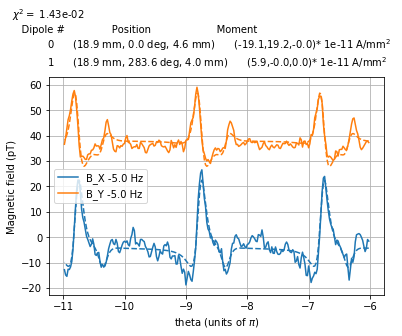

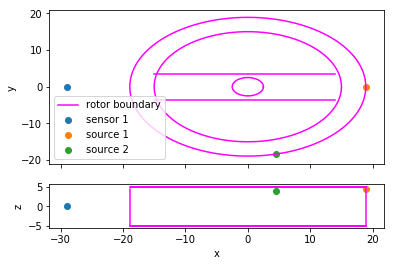

In [17]:
Opt_Settings_Exp1_5Hz['plot'] = 1
Opt_Settings_Exp1_5Hz['figname'] = SaveDir+ 'Exp1_5Hz_2src_'+nowtext+'_1'
print(opt_res_Exp1_5Hz.x)
Opt_Params_Exp1_5Hz = opt_res_Exp1_5Hz.x
chi2_one_exp_one_freq(Opt_Params_Exp1_5Hz,Opt_Settings_Exp1_5Hz)

In [18]:
Opt_Params_Exp1_low_chi_5Hz = opt_res_Exp1_5Hz.x
Opt_Params_Exp1_low_chi_5Hz

array([ 1.88987595e+01,  1.18196416e-03,  4.55453979e+00, -1.91352244e+01,
        1.91951633e+01, -4.03229431e-03,  1.88980805e+01,  2.83634078e+02,
        3.97019902e+00,  5.93145638e+00, -3.00167999e-03,  1.83536926e-03,
       -4.38073897e+00,  3.78657095e+01])

## Experiment 2

[11.4152125, 0.00154075792, 4.04299745, 12.8445845, -15.8213604, -95.8267331, 9.13345797, 0.000938456681, 4.89885946, -0.586118057, -3.79051778, 113.178568, 3.41127024, -31.1538462, -38.9855878, 24.156193]
0.0751336484710226


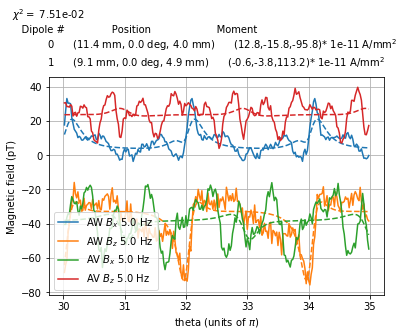

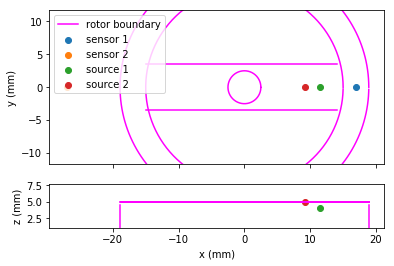

In [19]:
nu = 5
nowtext = now().strftime("%Y%m%d%H%M")
Opt_Settings_Exp2_5Hz = {'number of sources': 2,
                'location coordinate system': 'polar',
                'moment coordinate system':'polar',
                'location dimensions': 3,
                'moment dimensions': 3,
                'rotation sign':1, # 1 for positive, -1 for negative, 0 for unknown and making it a free parameter
                'rotation frequency':nu,
                'rotor dimensions':rtr_dims,
                'time':Exp2_Time_cut[nu],
                'number of sensors':2,
                'sensor locations':[Exp2_AW_sensor_loc,Exp2_AV_sensor_loc],
                'sensor field order':[[0,2],
                                     [0,2]],# list which order of B component of each sensor (0 for x, 1 for y, 2 for z) 
                'B data':[Exp2_AW_X_cut[nu],Exp2_AW_Z_cut[nu],
                         Exp2_AV_X_cut[nu],Exp2_AV_Z_cut[nu]],
                'plot':1,
                'bar location':0,
                'saveplot':1,
                'plotlabels':['AW $B_x$','AW $B_z$','AV $B_x$', 'AV $B_z$'],
                'figname':SaveDir+'Exp2_5Hz_'+nowtext+'_0'
}
# Opt_Params_Exp2_5Hz =[   7.95825475,    40,    4.99597432,  189.10747075,
#         -58.32594041,   15.10548281,    6.80567371,    0.63247041,
#           1.75174325, -178.62354081,    3.90215557, -152.24476817,
#          -7.19618541,   15.07247243,  -37.54240099,  -30.82105149]

Opt_Params_Exp2_5Hz =[ 1.14152125e+01,  1.54075792e-03,  4.04299745e+00,  1.28445845e+01,
       -1.58213604e+01, -9.58267331e+01,  9.13345797e+00,  9.38456681e-04,
        4.89885946e+00, -5.86118057e-01, -3.79051778e+00,  1.13178568e+02,
        3.41127024e+00, -3.11538462e+01, -3.89855878e+01,  2.41561930e+01]

chi_Exp2_5Hz = chi2_one_exp_one_freq(Opt_Params_Exp2_5Hz,Opt_Settings_Exp2_5Hz)

In [20]:
Opt_Settings_Exp2_5Hz['plot'] = 0
opt_res_Exp2_5Hz = minimize(chi2_one_exp_one_freq,Opt_Params_Exp2_5Hz,Opt_Settings_Exp2_5Hz,method = 'Nelder-Mead',options = {'maxfev': 3000,'maxiter': 3000,'adaptive':True})

[ 1.14152125e+01  1.54075792e-03  4.04299745e+00  1.28445845e+01
 -1.58213604e+01 -9.58267331e+01  9.13345797e+00  9.38456681e-04
  4.89885946e+00 -5.86118057e-01 -3.79051778e+00  1.13178568e+02
  3.41127024e+00 -3.11538462e+01 -3.89855878e+01  2.41561930e+01]
0.0751336484710226
[ 1.19859731e+01  1.54075792e-03  4.04299745e+00  1.28445845e+01
 -1.58213604e+01 -9.58267331e+01  9.13345797e+00  9.38456681e-04
  4.89885946e+00 -5.86118057e-01 -3.79051778e+00  1.13178568e+02
  3.41127024e+00 -3.11538462e+01 -3.89855878e+01  2.41561930e+01]
0.08164380690337333
[ 1.14152125e+01  1.61779582e-03  4.04299745e+00  1.28445845e+01
 -1.58213604e+01 -9.58267331e+01  9.13345797e+00  9.38456681e-04
  4.89885946e+00 -5.86118057e-01 -3.79051778e+00  1.13178568e+02
  3.41127024e+00 -3.11538462e+01 -3.89855878e+01  2.41561930e+01]
0.07513358364454126
[ 1.14152125e+01  1.54075792e-03  4.24514732e+00  1.28445845e+01
 -1.58213604e+01 -9.58267331e+01  9.13345797e+00  9.38456681e-04
  4.89885946e+00 -5.86118057

0.07584424346755753
[ 1.13736475e+01  1.54193898e-03  4.04609658e+00  1.28544304e+01
 -1.58334881e+01 -9.57212150e+01  9.10933796e+00  9.39176047e-04
  5.14046449e+00 -5.86567341e-01 -3.79342337e+00  1.13050228e+02
  3.41388512e+00 -3.11777269e+01 -3.90154719e+01  2.41747097e+01]
Source 2 not in rotor
[ 1.14706796e+01  1.54919956e-03  4.06514858e+00  1.29149585e+01
 -1.59080439e+01 -9.63265890e+01  9.17912275e+00  9.43598381e-04
  4.72233730e+00 -5.89329333e-01 -3.81128561e+00  1.13768413e+02
  3.42996021e+00 -3.13245347e+01 -3.91991855e+01  2.42885421e+01]
0.07575270759792764
[ 1.14377759e+01  1.54960420e-03  4.06621037e+00  1.29183319e+01
 -1.59121990e+01 -9.61948043e+01  8.90439119e+00  9.43844843e-04
  4.88199067e+00 -5.89483262e-01 -3.81228109e+00  1.13609507e+02
  3.43085609e+00 -3.13327164e+01 -3.92094241e+01  2.42948861e+01]
0.07670470959676426
[ 1.14291946e+01  1.54430866e-03  4.05231469e+00  1.28741853e+01
 -1.58578213e+01 -9.60219589e+01  9.30576828e+00  9.40619390e-04
  4.8

0.0755770043097005
[ 1.14251068e+01  1.54495912e-03  4.05113949e+00  1.28796080e+01
 -1.58645007e+01 -9.59874698e+01  9.14348939e+00  9.41015581e-04
  4.89092288e+00 -5.87716231e-01 -3.80085343e+00  1.15348352e+02
  3.42057179e+00 -3.12300208e+01 -3.89780611e+01  2.42220600e+01]
0.07526332994310346
[ 1.14267887e+01  1.55039715e-03  4.05445822e+00  1.29249423e+01
 -1.59203414e+01 -9.60204877e+01  9.02018956e+00  9.44327817e-04
  4.88976851e+00 -5.89784906e-01 -3.81423187e+00  1.13410977e+02
  3.43261170e+00 -3.12852675e+01 -3.88222023e+01  2.43073180e+01]
0.07548390998903405
[ 1.14293177e+01  1.54593328e-03  4.05363690e+00  1.28877291e+01
 -1.58745039e+01 -9.60334406e+01  9.22548325e+00  9.41608930e-04
  4.88937336e+00 -5.88086811e-01 -3.80325002e+00  1.13422786e+02
  3.42272860e+00 -3.12495639e+01 -3.90002257e+01  2.42373330e+01]
0.07519363522572285
[ 1.14331522e+01  1.55177734e-03  3.94607147e+00  1.29364483e+01
 -1.59345140e+01 -9.61041399e+01  9.14903377e+00  9.45168475e-04
  4.8859

0.07504883214901058
[ 1.14059193e+01  1.55564564e-03  4.05337449e+00  1.27874424e+01
 -1.59742358e+01 -9.59910205e+01  9.14280809e+00  9.47524607e-04
  4.91337868e+00 -5.91781478e-01 -3.82714402e+00  1.12995733e+02
  3.44423196e+00 -3.04363775e+01 -3.88725986e+01  2.43228613e+01]
0.0753047815659071
[ 1.14189612e+01  1.54584184e-03  4.04856807e+00  1.28614779e+01
 -1.58735649e+01 -9.59406941e+01  9.13948026e+00  9.41553235e-04
  4.89915926e+00 -5.88052026e-01 -3.80302506e+00  1.13260080e+02
  3.42252615e+00 -3.17627731e+01 -3.89385823e+01  2.42265136e+01]
0.075121925983646
[ 1.14290360e+01  1.55253968e-03  4.05825659e+00  1.27583633e+01
 -1.59423420e+01 -9.60813319e+01  9.16011566e+00  9.45632803e-04
  4.81592326e+00 -5.90599942e-01 -3.81950284e+00  1.13110094e+02
  3.43735529e+00 -3.12564521e+01 -3.90647608e+01  2.42729924e+01]
0.07530223287940195
[ 1.14043496e+01  1.54793086e-03  4.04560034e+00  1.28784451e+01
 -1.58950161e+01 -9.58851926e+01  9.12874508e+00  9.42825631e-04
  4.960121

0.07509437718133934
[ 1.14239533e+01  1.54667098e-03  4.04992617e+00  1.23959087e+01
 -1.61861234e+01 -9.60047933e+01  9.16654745e+00  9.29792210e-04
  4.92551331e+00 -5.91538207e-01 -3.91625272e+00  1.13040792e+02
  3.34275380e+00 -3.15311416e+01 -3.87171458e+01  2.48765131e+01]
0.0750827645224893
[ 1.14300280e+01  1.54942146e-03  4.08884124e+00  1.23510838e+01
 -1.62523724e+01 -9.60635869e+01  9.17410626e+00  9.29934241e-04
  4.92564024e+00 -5.92980862e-01 -3.93691784e+00  1.13059605e+02
  3.33746051e+00 -3.16136412e+01 -3.86635461e+01  2.43190219e+01]
0.07501835127780482
[ 1.14210652e+01  1.55663979e-03  4.05380170e+00  1.26108869e+01
 -1.60652061e+01 -9.50913576e+01  9.15065023e+00  9.44871964e-04
  4.91694495e+00 -5.93001897e-01 -3.85912406e+00  1.12967531e+02
  3.37458310e+00 -3.13639813e+01 -3.88067821e+01  2.43129497e+01]
0.07508894821911458
[ 1.14217609e+01  1.55420206e-03  4.05791057e+00  1.26045428e+01
 -1.60668226e+01 -9.53296519e+01  9.15234881e+00  9.42312101e-04
  4.9161

0.07496503730258601
[ 1.14180373e+01  1.52541784e-03  4.09498159e+00  1.23493749e+01
 -1.63233023e+01 -9.58146163e+01  9.14729947e+00  9.33370612e-04
  4.93230273e+00 -5.86205768e-01 -3.93000462e+00  1.13324339e+02
  3.35059412e+00 -3.15809838e+01 -3.89122229e+01  2.47191219e+01]
0.07499411804708193
[ 1.14076011e+01  1.52936083e-03  4.07049667e+00  1.24778024e+01
 -1.59706735e+01 -9.58021717e+01  9.15991417e+00  9.24758490e-04
  4.91771235e+00 -5.85981151e-01 -4.04773264e+00  1.13380996e+02
  3.36657302e+00 -3.13707215e+01 -3.90567136e+01  2.44004330e+01]
0.07499859080332484
[ 1.14234014e+01  1.53131767e-03  4.08328850e+00  1.24365945e+01
 -1.61363111e+01 -9.58463826e+01  9.16400910e+00  9.46152732e-04
  4.92557528e+00 -5.86653835e-01 -3.91856084e+00  1.13135195e+02
  3.35197674e+00 -3.11336828e+01 -3.88064112e+01  2.46724448e+01]
0.0750088881371381
[ 1.14272896e+01  1.53270891e-03  4.08812987e+00  1.24831085e+01
 -1.54681627e+01 -9.59513062e+01  9.16737839e+00  9.50576661e-04
  4.9259

0.07495827967437456
[ 1.13886955e+01  1.52169929e-03  4.12094518e+00  1.23398604e+01
 -1.63535638e+01 -9.57644226e+01  9.19091534e+00  9.42191656e-04
  4.93550669e+00 -5.82265157e-01 -4.00549075e+00  1.13010444e+02
  3.25237599e+00 -3.16471671e+01 -3.87596818e+01  2.48060475e+01]
0.07495696924912619
[ 1.14229862e+01  1.51687291e-03  4.12460746e+00  1.19007533e+01
 -1.63470980e+01 -9.56502384e+01  9.21024923e+00  9.29501669e-04
  4.93799174e+00 -5.84158714e-01 -4.02800249e+00  1.13221636e+02
  3.36849270e+00 -3.17500736e+01 -3.88644374e+01  2.48963474e+01]
0.07494848065862442
[ 1.14168469e+01  1.54067114e-03  4.12694136e+00  1.22025561e+01
 -1.61134538e+01 -9.58141233e+01  9.19594825e+00  9.46065669e-04
  4.91746756e+00 -5.84102283e-01 -3.92812469e+00  1.13339659e+02
  3.33214371e+00 -3.16264733e+01 -3.89900544e+01  2.45307070e+01]
0.07493168046035671
[ 1.14228592e+01  1.52002240e-03  4.12501551e+00  1.21251737e+01
 -1.62051314e+01 -9.58373979e+01  9.19931557e+00  9.57933854e-04
  4.924

0.07490587055714013
[ 1.13903711e+01  1.52186041e-03  4.15102087e+00  1.17444766e+01
 -1.64451287e+01 -9.58731065e+01  9.21652292e+00  9.57938942e-04
  4.94283581e+00 -5.83937024e-01 -4.07803822e+00  1.13270579e+02
  3.21597431e+00 -3.16364428e+01 -3.87256870e+01  2.48111306e+01]
0.07489975084521819
[ 1.14009820e+01  1.53472684e-03  4.13510142e+00  1.18260042e+01
 -1.63857975e+01 -9.57751148e+01  9.20586744e+00  9.36229860e-04
  4.96172839e+00 -5.81307456e-01 -4.07986933e+00  1.13468440e+02
  3.29375926e+00 -3.19209992e+01 -3.89193014e+01  2.46791016e+01]
0.07493498026096418
[ 1.14195961e+01  1.53724984e-03  4.13294043e+00  1.18865814e+01
 -1.61769551e+01 -9.59596314e+01  9.20919218e+00  9.54048827e-04
  4.92691114e+00 -5.85517165e-01 -4.02862119e+00  1.13349272e+02
  3.28652255e+00 -3.13473666e+01 -3.88435002e+01  2.46199987e+01]
0.07490759267176107
[ 1.14202217e+01  1.56359285e-03  4.15601723e+00  1.18198141e+01
 -1.59990633e+01 -9.56159742e+01  9.23324265e+00  9.35507001e-04
  4.939

0.07480095792711344
[ 1.14010443e+01  1.55798802e-03  4.18823914e+00  1.14765779e+01
 -1.59647117e+01 -9.56789783e+01  9.23847761e+00  9.56340608e-04
  4.97282814e+00 -5.66355045e-01 -4.18783974e+00  1.13564116e+02
  3.25249549e+00 -3.16464167e+01 -3.88849982e+01  2.46598098e+01]
0.07479860816085276
[ 1.14080289e+01  1.55616064e-03  4.20002570e+00  1.14914272e+01
 -1.62065314e+01 -9.58899975e+01  9.23727870e+00  9.15027688e-04
  4.95906113e+00 -5.91926012e-01 -4.26231379e+00  1.13640345e+02
  3.20738639e+00 -3.15988325e+01 -3.88306624e+01  2.46173612e+01]
0.07480108841150132
[ 1.14089034e+01  1.55023559e-03  4.16838209e+00  1.12856315e+01
 -1.63546607e+01 -9.57785993e+01  9.24582584e+00  9.42873277e-04
  4.97047890e+00 -5.79000800e-01 -4.24370604e+00  1.13545043e+02
  3.24220160e+00 -3.15379661e+01 -3.88329125e+01  2.47379738e+01]
0.07484767858219779
[ 1.13928877e+01  1.55855273e-03  4.17044731e+00  1.16654464e+01
 -1.60703630e+01 -9.54462536e+01  9.22641418e+00  9.37730463e-04
  4.964

0.07480850395939562
[ 1.14103687e+01  1.56516124e-03  4.19992454e+00  1.12121356e+01
 -1.60933238e+01 -9.54373331e+01  9.25069269e+00  9.38145864e-04
  4.97452644e+00 -5.77547518e-01 -4.31515755e+00  1.13632616e+02
  3.12544817e+00 -3.16460878e+01 -3.89829982e+01  2.48330593e+01]
0.07478720987337557
[ 1.13942538e+01  1.60760236e-03  4.21745805e+00  1.09098628e+01
 -1.60227128e+01 -9.56865606e+01  9.25271751e+00  9.22164859e-04
  4.98827728e+00 -5.67276267e-01 -4.34492880e+00  1.13291429e+02
  3.21969737e+00 -3.16471497e+01 -3.91251344e+01  2.46257315e+01]
0.07474154542726205
[ 1.13927259e+01  1.61285528e-03  4.21916403e+00  1.08783578e+01
 -1.60255353e+01 -9.56838752e+01  9.25282644e+00  9.19854709e-04
  4.99033822e+00 -5.66148142e-01 -4.34964173e+00  1.13278974e+02
  3.22200668e+00 -3.16434367e+01 -3.91507739e+01  2.46209915e+01]
0.0747404567936258
[ 1.14030122e+01  1.58208422e-03  4.20998705e+00  1.07557456e+01
 -1.57711113e+01 -9.55003249e+01  9.26835688e+00  9.66867807e-04
  4.9884

[ 1.14081711e+01  1.55172892e-03  4.26251067e+00  1.05824763e+01
 -1.56704915e+01 -9.55497775e+01  9.30978828e+00  9.69252618e-04
  4.97765836e+00 -5.80703271e-01 -4.53690830e+00  1.13323458e+02
  3.12757851e+00 -3.17717042e+01 -3.88858600e+01  2.46143493e+01]
0.0746867891031604
[ 1.14091364e+01  1.54790853e-03  4.26521983e+00  1.05639837e+01
 -1.56483013e+01 -9.55413964e+01  9.31334839e+00  9.72339987e-04
  4.97686587e+00 -5.81612966e-01 -4.54861246e+00  1.13326238e+02
  3.12167675e+00 -3.17797209e+01 -3.88693028e+01  2.46139342e+01]
0.07468584932226875
[ 1.13956283e+01  1.58591754e-03  4.26196293e+00  1.03106730e+01
 -1.57040133e+01 -9.56884241e+01  9.29815961e+00  9.37692270e-04
  5.00027350e+00 -5.83722158e-01 -4.48243202e+00  1.13195108e+02
  3.13490199e+00 -3.17457027e+01 -3.90970964e+01  2.46032861e+01]
Source 2 not in rotor
[ 1.14042823e+01  1.57674935e-03  4.22999873e+00  1.09761363e+01
 -1.59186937e+01 -9.55649996e+01  9.27386343e+00  9.51483330e-04
  4.97317349e+00 -5.677900

[ 1.14073654e+01  1.57807098e-03  4.28681488e+00  1.07461210e+01
 -1.55768934e+01 -9.54643457e+01  9.31571535e+00  9.31925462e-04
  4.99548663e+00 -5.66802903e-01 -4.60643364e+00  1.13425889e+02
  3.18364376e+00 -3.17662848e+01 -3.87838960e+01  2.46355562e+01]
0.0746687415392474
[ 1.14063585e+01  1.60038428e-03  4.27554897e+00  1.04678172e+01
 -1.54623264e+01 -9.53045051e+01  9.31513230e+00  9.69996590e-04
  4.99830196e+00 -5.50492030e-01 -4.61910133e+00  1.13235685e+02
  3.17586527e+00 -3.18018321e+01 -3.89765433e+01  2.46486920e+01]
0.07464834955448287
[ 1.14068371e+01  1.60127079e-03  4.27624446e+00  1.04538344e+01
 -1.54359300e+01 -9.52807124e+01  9.31667483e+00  9.72396025e-04
  4.99922800e+00 -5.48566393e-01 -4.62608455e+00  1.13222632e+02
  3.17674348e+00 -3.18102005e+01 -3.89751961e+01  2.46535272e+01]
0.07464668117661859
[ 1.13959197e+01  1.61907554e-03  4.28404336e+00  1.06017913e+01
 -1.54667767e+01 -9.55644074e+01  9.30654619e+00  9.75788607e-04
  4.98764004e+00 -5.63743730

0.0746184844832394
[ 1.13955540e+01  1.58779572e-03  4.31459798e+00  1.00780093e+01
 -1.54326847e+01 -9.51676379e+01  9.34199772e+00  9.75000200e-04
  4.99623219e+00 -5.62041971e-01 -4.74773839e+00  1.13326241e+02
  3.14371199e+00 -3.20141004e+01 -3.88950957e+01  2.47087077e+01]
0.07464196847029773
[ 1.14101497e+01  1.60215412e-03  4.31346973e+00  9.89763574e+00
 -1.55916205e+01 -9.53571959e+01  9.34080298e+00  9.81826913e-04
  4.99014913e+00 -5.59379002e-01 -4.71941863e+00  1.13678316e+02
  3.13639068e+00 -3.17132111e+01 -3.88269051e+01  2.48271801e+01]
0.07465389911248442
[ 1.14080679e+01  1.55001708e-03  4.29734810e+00  1.01792862e+01
 -1.55215961e+01 -9.53615041e+01  9.31745166e+00  9.76489880e-04
  4.99715219e+00 -5.61365931e-01 -4.75482701e+00  1.13160309e+02
  3.17045534e+00 -3.17892819e+01 -3.90588417e+01  2.45940473e+01]
0.0746376468836936
[ 1.14222640e+01  1.60810170e-03  4.31154209e+00  1.03306754e+01
 -1.56529589e+01 -9.52756893e+01  9.34581595e+00  9.73023201e-04
  4.99293

0.07462762968515332
[ 1.14260761e+01  1.56546697e-03  4.30561418e+00  1.00847928e+01
 -1.52521098e+01 -9.51241328e+01  9.34614887e+00  9.65995914e-04
  4.99288799e+00 -5.70404173e-01 -4.74712091e+00  1.13277274e+02
  3.18964784e+00 -3.19161657e+01 -3.90714750e+01  2.48726180e+01]
0.07462811245356221
[ 1.14048633e+01  1.54366939e-03  4.29634708e+00  1.02540875e+01
 -1.52049832e+01 -9.52687540e+01  9.34442778e+00  9.93768033e-04
  4.99726848e+00 -5.72032446e-01 -4.79105765e+00  1.13543338e+02
  3.15316952e+00 -3.18197716e+01 -3.90158458e+01  2.46739769e+01]
0.07463555427798087
[ 1.14346870e+01  1.57215472e-03  4.28898525e+00  1.02068484e+01
 -1.50995142e+01 -9.52608783e+01  9.32979656e+00  9.80363434e-04
  4.98948727e+00 -5.69245667e-01 -4.74538398e+00  1.13507685e+02
  3.16616038e+00 -3.16191821e+01 -3.91867513e+01  2.46270317e+01]
0.07463081083712347
[ 1.14043930e+01  1.58076110e-03  4.30581468e+00  9.98865107e+00
 -1.51039686e+01 -9.50536430e+01  9.33187486e+00  9.98052382e-04
  5.000

0.07459948057097403
[ 1.14134452e+01  1.59709440e-03  4.32952706e+00  9.93913615e+00
 -1.51376272e+01 -9.49724447e+01  9.36080301e+00  9.78581008e-04
  4.99625009e+00 -5.68761083e-01 -4.88746856e+00  1.13139902e+02
  3.11581495e+00 -3.20651135e+01 -3.88644732e+01  2.47226819e+01]
0.07461253210356207
[ 1.14136647e+01  1.62208685e-03  4.32113111e+00  9.92916990e+00
 -1.49655618e+01 -9.52765546e+01  9.36754648e+00  9.76653394e-04
  4.98751480e+00 -5.52084882e-01 -4.90210120e+00  1.13205736e+02
  3.14809812e+00 -3.18932693e+01 -3.89938668e+01  2.46929287e+01]
0.07459761501833236
[ 1.14330422e+01  1.59606541e-03  4.32734689e+00  9.71386261e+00
 -1.48092051e+01 -9.49922093e+01  9.36495706e+00  9.81937399e-04
  4.98258926e+00 -5.74252058e-01 -4.97898254e+00  1.13556899e+02
  3.15515212e+00 -3.19622295e+01 -3.89947635e+01  2.46439118e+01]
0.0745909058813934
[ 1.14341662e+01  1.59621810e-03  4.32862985e+00  9.68093202e+00
 -1.47780475e+01 -9.49743842e+01  9.36663469e+00  9.81978840e-04
  4.9815

0.07456374544771215
[ 1.14430121e+01  1.60408203e-03  4.34840061e+00  9.55767027e+00
 -1.44411457e+01 -9.48744770e+01  9.39423403e+00  1.01023255e-03
  4.98468766e+00 -5.75119458e-01 -5.08870177e+00  1.13142781e+02
  3.14324059e+00 -3.20267310e+01 -3.90077749e+01  2.46894756e+01]
0.07456315224647271
[ 1.14330133e+01  1.57506625e-03  4.33441651e+00  9.56831759e+00
 -1.48085671e+01 -9.49533462e+01  9.37942393e+00  9.81620921e-04
  4.99228437e+00 -5.69654055e-01 -5.14664862e+00  1.13082793e+02
  3.12653207e+00 -3.19303268e+01 -3.90874949e+01  2.46442184e+01]
0.07456079779456275
[ 1.14329596e+01  1.57351428e-03  4.33432835e+00  9.54183786e+00
 -1.48157442e+01 -9.49559193e+01  9.38000045e+00  9.80668372e-04
  4.99235282e+00 -5.69535662e-01 -5.16636305e+00  1.13066254e+02
  3.12297072e+00 -3.19312443e+01 -3.90976526e+01  2.46396794e+01]
0.07456002642648693
[ 1.14325680e+01  1.57590786e-03  4.34232601e+00  9.86199212e+00
 -1.47289654e+01 -9.48888301e+01  9.38465958e+00  9.96339985e-04
  5.003

[ 1.14454264e+01  1.59983633e-03  4.34369793e+00  9.65064424e+00
 -1.43459067e+01 -9.47032465e+01  9.38478637e+00  9.94748810e-04
  4.99639878e+00 -5.64921599e-01 -5.15187769e+00  1.13128304e+02
  3.13418815e+00 -3.20435758e+01 -3.91846449e+01  2.45835678e+01]
0.0745597730001614
[ 1.14480988e+01  1.57327366e-03  4.36573511e+00  9.21294865e+00
 -1.43370796e+01 -9.47379302e+01  9.40593622e+00  1.01669245e-03
  4.98799820e+00 -5.83662087e-01 -5.29010399e+00  1.13421231e+02
  3.06497137e+00 -3.19865444e+01 -3.90673732e+01  2.46942195e+01]
0.07453450537981679
[ 1.14490792e+01  1.57158480e-03  4.36757612e+00  9.17025075e+00
 -1.43204948e+01 -9.47299225e+01  9.40787529e+00  1.01953225e-03
  4.98728777e+00 -5.84621805e-01 -5.30845629e+00  1.13439356e+02
  3.05576996e+00 -3.19883026e+01 -3.90707138e+01  2.46923520e+01]
0.07453344817897932
[ 1.14462294e+01  1.60390124e-03  4.33795118e+00  9.47044860e+00
 -1.43741056e+01 -9.47940293e+01  9.38727740e+00  9.89040736e-04
  4.99792174e+00 -5.71323784

0.07453016522863937
[ 1.14407684e+01  1.56145603e-03  4.36213722e+00  9.11593068e+00
 -1.43796135e+01 -9.46937841e+01  9.41808082e+00  9.88980359e-04
  4.99284648e+00 -5.88153417e-01 -5.41340185e+00  1.12751008e+02
  3.11723022e+00 -3.19429031e+01 -3.91191300e+01  2.47349149e+01]
0.07452112567006315
[ 1.14545408e+01  1.57028642e-03  4.37547783e+00  8.97474442e+00
 -1.38664291e+01 -9.46853706e+01  9.43836142e+00  1.00817865e-03
  4.98682891e+00 -5.86071825e-01 -5.42840527e+00  1.13197126e+02
  3.15161032e+00 -3.20765643e+01 -3.90692085e+01  2.47632612e+01]
0.07451297240759285
[ 1.14554438e+01  1.56870761e-03  4.37681731e+00  8.93734391e+00
 -1.38295635e+01 -9.46843555e+01  9.44147077e+00  1.00930939e-03
  4.98615366e+00 -5.86289027e-01 -5.44385961e+00  1.13209392e+02
  3.15334431e+00 -3.20899225e+01 -3.90712483e+01  2.47656844e+01]
0.07451237966295493
[ 1.14458686e+01  1.59358866e-03  4.38347912e+00  9.01340015e+00
 -1.40006543e+01 -9.46250761e+01  9.42902757e+00  1.01735157e-03
  4.990

0.0744995576602975
[ 1.14573593e+01  1.58751246e-03  4.38170534e+00  9.01354923e+00
 -1.38370229e+01 -9.45639213e+01  9.43631470e+00  1.00853589e-03
  4.99890942e+00 -5.89639555e-01 -5.58214302e+00  1.12722705e+02
  3.09379251e+00 -3.19537434e+01 -3.90334492e+01  2.47540082e+01]
0.07448238651342001
[ 1.14574791e+01  1.58868777e-03  4.38201084e+00  9.01831206e+00
 -1.38374891e+01 -9.45563942e+01  9.43599244e+00  1.00848755e-03
  4.99970666e+00 -5.89848963e-01 -5.59078574e+00  1.12692287e+02
  3.09007052e+00 -3.19452322e+01 -3.90310868e+01  2.47532784e+01]
0.07448143047597883
[ 1.14475834e+01  1.59059149e-03  4.39430250e+00  8.97162557e+00
 -1.38486062e+01 -9.45229739e+01  9.45049216e+00  1.00809105e-03
  4.99882552e+00 -5.83165310e-01 -5.53833622e+00  1.12849561e+02
  3.09632788e+00 -3.21535697e+01 -3.88983020e+01  2.48004558e+01]
0.07449777129013835
[ 1.14665446e+01  1.56329054e-03  4.37598152e+00  8.96858381e+00
 -1.36678446e+01 -9.46006853e+01  9.45056213e+00  9.96855219e-04
  4.9966

[ 1.14743566e+01  1.55178121e-03  4.41665275e+00  8.33100000e+00
 -1.32282708e+01 -9.44406269e+01  9.50831055e+00  1.03022104e-03
  4.98688896e+00 -6.05371871e-01 -5.91840233e+00  1.12851014e+02
  3.09499721e+00 -3.22615980e+01 -3.91157979e+01  2.47159174e+01]
0.07446154114128431
[ 1.14625633e+01  1.57871668e-03  4.40484002e+00  8.64713959e+00
 -1.32930134e+01 -9.44438482e+01  9.49016169e+00  1.00650181e-03
  4.99651660e+00 -5.98698826e-01 -5.82593985e+00  1.12391629e+02
  3.16890129e+00 -3.20966507e+01 -3.90737335e+01  2.47247962e+01]
0.074453571502893
[ 1.14621087e+01  1.57984620e-03  4.40537001e+00  8.64627762e+00
 -1.32668112e+01 -9.44377970e+01  9.49203679e+00  1.00490904e-03
  4.99694110e+00 -5.98773420e-01 -5.83322507e+00  1.12346214e+02
  3.17789979e+00 -3.20947536e+01 -3.90734737e+01  2.47237688e+01]
0.07445287486718706
[ 1.14793861e+01  1.56460499e-03  4.39928127e+00  8.49542913e+00
 -1.33339306e+01 -9.43214328e+01  9.49170401e+00  1.01976311e-03
  4.99287200e+00 -5.99890270e

0.07442398339265968
[ 1.14861568e+01  1.55476485e-03  4.40852852e+00  8.15626526e+00
 -1.29995261e+01 -9.43768565e+01  9.50961795e+00  1.03157653e-03
  4.99063431e+00 -6.15789735e-01 -6.18751005e+00  1.12670234e+02
  3.00431494e+00 -3.21431576e+01 -3.91447648e+01  2.46961967e+01]
0.07442321898144139
[ 1.14891712e+01  1.56953816e-03  4.41340113e+00  8.33651011e+00
 -1.28083461e+01 -9.43421483e+01  9.52549184e+00  9.99488006e-04
  4.98848621e+00 -6.12016494e-01 -6.14536882e+00  1.12241674e+02
  3.11181170e+00 -3.21695068e+01 -3.91506720e+01  2.48372699e+01]
0.0744282144423975
[ 1.14919765e+01  1.53600498e-03  4.42614485e+00  8.04556489e+00
 -1.29967266e+01 -9.41270069e+01  9.52835393e+00  1.02257636e-03
  4.98986847e+00 -6.15635923e-01 -6.22520154e+00  1.12476349e+02
  3.10842064e+00 -3.21572508e+01 -3.91535530e+01  2.46532155e+01]
0.07442657674165593
[ 1.14731018e+01  1.56132144e-03  4.41874413e+00  8.32636537e+00
 -1.30370369e+01 -9.41539737e+01  9.51103139e+00  1.00908573e-03
  5.0018

0.07440003671557682
[ 1.14896402e+01  1.56427650e-03  4.43611422e+00  8.03873647e+00
 -1.26079345e+01 -9.42546724e+01  9.55870666e+00  1.00535958e-03
  4.99690938e+00 -6.30051759e-01 -6.31857651e+00  1.11966497e+02
  3.14677127e+00 -3.20282775e+01 -3.90792933e+01  2.47687701e+01]
0.07440135597967687
[ 1.15045670e+01  1.55505575e-03  4.42281636e+00  7.97469245e+00
 -1.27897081e+01 -9.41598120e+01  9.55021673e+00  1.02316164e-03
  4.99487028e+00 -6.27804815e-01 -6.30683806e+00  1.12120239e+02
  3.09596768e+00 -3.21112426e+01 -3.90401530e+01  2.48030840e+01]
0.07439490029872803
[ 1.14871030e+01  1.52687136e-03  4.42112430e+00  7.84150144e+00
 -1.26543813e+01 -9.42458720e+01  9.55228380e+00  1.02914571e-03
  4.99609501e+00 -6.22603862e-01 -6.43950057e+00  1.11850606e+02
  3.07849750e+00 -3.20881489e+01 -3.92318568e+01  2.46864756e+01]
0.07439379783078445
[ 1.14867797e+01  1.52304614e-03  4.42089135e+00  7.81325294e+00
 -1.26381423e+01 -9.42400436e+01  9.55406104e+00  1.03042562e-03
  4.996

0.07436208730745768
[ 1.15077763e+01  1.51210607e-03  4.43804237e+00  7.87339525e+00
 -1.22935127e+01 -9.43545604e+01  9.58974858e+00  1.04109943e-03
  4.99780552e+00 -6.34760290e-01 -6.56403068e+00  1.11969598e+02
  3.08732954e+00 -3.21368732e+01 -3.90984886e+01  2.47312700e+01]
0.07436054639276508
[ 1.15195255e+01  1.53450461e-03  4.43540124e+00  7.75508258e+00
 -1.22106257e+01 -9.42458117e+01  9.57999893e+00  1.02791383e-03
  4.99151751e+00 -6.40945563e-01 -6.65397615e+00  1.11854427e+02
  3.05477315e+00 -3.21654486e+01 -3.92579691e+01  2.46506638e+01]
0.07438326680769465
[ 1.15243870e+01  1.56084312e-03  4.44902862e+00  7.78976729e+00
 -1.20351905e+01 -9.43096112e+01  9.58993791e+00  1.02218799e-03
  4.98971140e+00 -6.46967273e-01 -6.64290970e+00  1.12436130e+02
  3.06534677e+00 -3.21880184e+01 -3.89977433e+01  2.47168839e+01]
0.07436697234960236
[ 1.14976347e+01  1.56010706e-03  4.45409473e+00  7.52392705e+00
 -1.24856307e+01 -9.44382299e+01  9.59926993e+00  1.03033791e-03
  4.989

Source 2 not in rotor
[ 1.15187976e+01  1.53691485e-03  4.44558767e+00  7.55939078e+00
 -1.19781609e+01 -9.42133904e+01  9.61461992e+00  1.02860147e-03
  4.98837701e+00 -6.43069330e-01 -6.84615918e+00  1.11883300e+02
  3.02675942e+00 -3.21605739e+01 -3.91555789e+01  2.46780752e+01]
0.0743528137861213
[ 1.15301624e+01  1.53586550e-03  4.44597830e+00  7.73082198e+00
 -1.15863721e+01 -9.43041092e+01  9.63035762e+00  1.04524008e-03
  4.99395092e+00 -6.33343446e-01 -6.94573606e+00  1.11859793e+02
  3.06881412e+00 -3.21862290e+01 -3.91173151e+01  2.45737755e+01]
0.0743354781953006
[ 1.15303064e+01  1.50697678e-03  4.46331720e+00  7.36553870e+00
 -1.15505908e+01 -9.41284274e+01  9.63580919e+00  1.05121826e-03
  4.98883120e+00 -6.63230308e-01 -7.09133468e+00  1.11582711e+02
  3.01500067e+00 -3.21401248e+01 -3.91041144e+01  2.47130459e+01]
0.07433952939656774
[ 1.15317874e+01  1.51927564e-03  4.46961462e+00  7.19115408e+00
 -1.18083570e+01 -9.39966312e+01  9.63959587e+00  1.03027464e-03
  4.998

0.07428579004056367
[ 1.15527550e+01  1.51039684e-03  4.47546510e+00  6.93563888e+00
 -1.11592543e+01 -9.40050946e+01  9.69767039e+00  1.02350309e-03
  4.99290898e+00 -6.71789126e-01 -7.49188944e+00  1.11191137e+02
  3.07048165e+00 -3.22532603e+01 -3.91252170e+01  2.47108951e+01]
0.07428700445679655
[ 1.15458186e+01  1.50735365e-03  4.44284151e+00  7.25367371e+00
 -1.14613896e+01 -9.43351004e+01  9.65872833e+00  1.01954067e-03
  4.99449373e+00 -6.71692722e-01 -7.31048675e+00  1.11279470e+02
  3.04648397e+00 -3.21340609e+01 -3.90426682e+01  2.45343818e+01]
0.07429411420511699
[ 1.15378594e+01  1.50493380e-03  4.44477314e+00  7.54987167e+00
 -1.15363412e+01 -9.44983258e+01  9.67023382e+00  1.00595065e-03
  4.99062625e+00 -6.66252016e-01 -7.19675534e+00  1.11264194e+02
  3.05671056e+00 -3.21114747e+01 -3.91069039e+01  2.47875509e+01]
0.07431294575948871
[ 1.15461594e+01  1.53525031e-03  4.45523023e+00  7.14145782e+00
 -1.10959582e+01 -9.42868877e+01  9.67569903e+00  1.02319660e-03
  4.994

0.07425635863726024
[ 1.15756180e+01  1.43155234e-03  4.46650417e+00  7.03961476e+00
 -1.11438892e+01 -9.42117555e+01  9.72194752e+00  1.04754324e-03
  4.98940420e+00 -6.80851789e-01 -7.70671412e+00  1.11220273e+02
  3.02494242e+00 -3.23457428e+01 -3.90836585e+01  2.46158582e+01]
0.07425544411642529
[ 1.15701473e+01  1.45265012e-03  4.44448600e+00  7.26442146e+00
 -1.10758530e+01 -9.45238007e+01  9.70029030e+00  1.04880962e-03
  4.99132608e+00 -6.86727913e-01 -7.66361262e+00  1.11360413e+02
  2.91912988e+00 -3.22573907e+01 -3.90559354e+01  2.46532375e+01]
0.07425342709580458
[ 1.15712343e+01  1.44904095e-03  4.44254981e+00  7.28497037e+00
 -1.10706404e+01 -9.45562199e+01  9.70045404e+00  1.05039128e-03
  4.99122715e+00 -6.87661587e-01 -7.67434532e+00  1.11370993e+02
  2.90967039e+00 -3.22576489e+01 -3.90516053e+01  2.46496339e+01]
0.07425241882289635
[ 1.15650947e+01  1.46004328e-03  4.45339613e+00  7.01501303e+00
 -1.11964016e+01 -9.41690154e+01  9.70100812e+00  1.03981785e-03
  4.996

0.07420880608969137
[ 1.15957177e+01  1.44690829e-03  4.44087294e+00  7.59168678e+00
 -1.06292146e+01 -9.43638950e+01  9.72866462e+00  1.02007553e-03
  4.99241886e+00 -6.97026696e-01 -7.85687140e+00  1.10660414e+02
  3.00137424e+00 -3.22956302e+01 -3.90486645e+01  2.46584146e+01]
0.07422248631245539
[ 1.16019479e+01  1.42050343e-03  4.43809261e+00  7.04097398e+00
 -1.04968424e+01 -9.44230100e+01  9.75674112e+00  1.03536346e-03
  4.98670728e+00 -7.18699184e-01 -8.12259974e+00  1.10624234e+02
  2.97175587e+00 -3.22228068e+01 -3.91092574e+01  2.46508780e+01]
0.07421535961569824
[ 1.15816142e+01  1.46536631e-03  4.44554033e+00  7.35274305e+00
 -1.04493436e+01 -9.45414899e+01  9.74982051e+00  1.04648205e-03
  4.99212392e+00 -6.85473738e-01 -7.94271862e+00  1.10938587e+02
  3.00168700e+00 -3.22511163e+01 -3.90583955e+01  2.45987457e+01]
0.07424059201248162
[ 1.15941277e+01  1.45338210e-03  4.44639613e+00  7.10580651e+00
 -1.07126254e+01 -9.43482772e+01  9.75283008e+00  1.01021091e-03
  4.993

0.07416942338664304
[ 1.16453051e+01  1.41789115e-03  4.46428965e+00  6.99055901e+00
 -1.01553195e+01 -9.43053039e+01  9.80209007e+00  1.04086790e-03
  4.99213132e+00 -7.17679220e-01 -8.37577909e+00  1.10681287e+02
  2.99041539e+00 -3.23553757e+01 -3.89116138e+01  2.46807348e+01]
0.07417218298413955
[ 1.16247233e+01  1.37634641e-03  4.46269425e+00  6.87840339e+00
 -1.01255547e+01 -9.45347389e+01  9.82076214e+00  1.04420588e-03
  4.99179248e+00 -7.20596989e-01 -8.64471136e+00  1.10111120e+02
  2.91624912e+00 -3.24027764e+01 -3.90833389e+01  2.45702748e+01]
0.07417289860717678
[ 1.16325121e+01  1.37597548e-03  4.48175705e+00  6.78198872e+00
 -1.00275106e+01 -9.43184543e+01  9.83072736e+00  1.04302570e-03
  4.98751131e+00 -7.33673383e-01 -8.64487190e+00  1.10524254e+02
  2.92747974e+00 -3.23614015e+01 -3.88667284e+01  2.46533978e+01]
0.07417302869202608
[ 1.16477392e+01  1.34446137e-03  4.46395543e+00  7.06983948e+00
 -1.00014909e+01 -9.42573298e+01  9.81164812e+00  1.04241171e-03
  4.989

0.07412698464339969
[ 1.16906889e+01  1.29672242e-03  4.48608936e+00  6.73813741e+00
 -9.26943520e+00 -9.42519795e+01  9.88363118e+00  1.04868159e-03
  4.98313367e+00 -7.54082992e-01 -9.14392880e+00  1.10253589e+02
  2.90146740e+00 -3.23291479e+01 -3.90748777e+01  2.47411039e+01]
0.07411601846463635
[ 1.16891587e+01  1.33919130e-03  4.47296425e+00  6.69541101e+00
 -9.14958050e+00 -9.44487118e+01  9.89822013e+00  1.02071734e-03
  4.98646458e+00 -7.35888448e-01 -9.15873948e+00  1.09857968e+02
  2.99084403e+00 -3.24055712e+01 -3.89489117e+01  2.46772704e+01]
0.07410684983062568
[ 1.16915987e+01  1.33927520e-03  4.47352964e+00  6.67103183e+00
 -9.09758768e+00 -9.44616104e+01  9.90354236e+00  1.01930755e-03
  4.98627126e+00 -7.35221579e-01 -9.19014619e+00  1.09813072e+02
  2.99658587e+00 -3.24175502e+01 -3.89386535e+01  2.46866291e+01]
0.0741052938499159
[ 1.16989907e+01  1.30715709e-03  4.47373398e+00  6.68538709e+00
 -8.94368411e+00 -9.41210555e+01  9.88667140e+00  1.04501733e-03
  4.9877

0.07404763607632762
[ 1.17439526e+01  1.16644139e-03  4.47978616e+00  7.08924758e+00
 -8.79769543e+00 -9.40756965e+01  9.94645569e+00  1.02788169e-03
  4.99323912e+00 -8.03981076e-01 -9.66243590e+00  1.09475390e+02
  2.97143250e+00 -3.22388396e+01 -3.90714202e+01  2.44700727e+01]
0.07404613322106728
[ 1.17371222e+01  1.24208771e-03  4.48325853e+00  6.68089619e+00
 -8.63908977e+00 -9.42535520e+01  9.96145594e+00  1.01756217e-03
  4.99630183e+00 -7.93929552e-01 -9.78581964e+00  1.09165999e+02
  2.91660512e+00 -3.21684646e+01 -3.89495293e+01  2.46696251e+01]
0.07405545055332907
[ 1.17282719e+01  1.26431469e-03  4.46123677e+00  7.44967097e+00
 -8.74728947e+00 -9.42693198e+01  9.93062931e+00  9.96866283e-04
  4.99351307e+00 -7.72536793e-01 -9.43538834e+00  1.09078961e+02
  3.04433904e+00 -3.23623469e+01 -3.89476788e+01  2.46636137e+01]
0.07405085083025774
[ 1.17480417e+01  1.19931442e-03  4.47572844e+00  6.68007793e+00
 -8.55241220e+00 -9.42560789e+01  9.97683766e+00  1.03366722e-03
  4.984

0.07398101629546415
[ 1.18077683e+01  1.12651453e-03  4.49407154e+00  6.57428568e+00
 -7.94734470e+00 -9.39254952e+01  1.00606286e+01  1.01353771e-03
  4.98667724e+00 -8.04043815e-01 -1.04617658e+01  1.08559321e+02
  2.98674673e+00 -3.25784076e+01 -3.90560604e+01  2.46214595e+01]
0.07399054255566724
[ 1.18046822e+01  1.15378095e-03  4.49982796e+00  6.48021232e+00
 -7.37736813e+00 -9.40257772e+01  1.00529161e+01  9.96588221e-04
  4.97803442e+00 -8.18058437e-01 -1.06393226e+01  1.08510761e+02
  3.01317704e+00 -3.25649126e+01 -3.90799897e+01  2.44809889e+01]
0.07399350518730406
[ 1.18019354e+01  1.11350379e-03  4.48966809e+00  6.81415734e+00
 -7.92877616e+00 -9.42967145e+01  1.00673204e+01  9.95464473e-04
  4.98240272e+00 -8.11252772e-01 -1.04265665e+01  1.08389629e+02
  3.08424435e+00 -3.24026859e+01 -3.90020622e+01  2.45928694e+01]
0.07397950595482597
[ 1.18037789e+01  1.10741722e-03  4.49036342e+00  6.81196831e+00
 -7.91577091e+00 -9.43148805e+01  1.00730348e+01  9.93277694e-04
  4.981

[ 1.19124817e+01  1.00279775e-03  4.49610358e+00  7.05571936e+00
 -6.80255681e+00 -9.41533272e+01  1.01627873e+01  1.00152376e-03
  4.98272442e+00 -8.62468499e-01 -1.12191272e+01  1.07922576e+02
  2.99999787e+00 -3.23885056e+01 -3.89392030e+01  2.47260713e+01]
0.07390701906634307
[ 1.19179642e+01  9.84766107e-04  4.48945134e+00  7.33678657e+00
 -6.73713119e+00 -9.40417667e+01  1.01719827e+01  9.91441019e-04
  4.98086294e+00 -8.48122112e-01 -1.11671130e+01  1.07661848e+02
  3.13845696e+00 -3.26504502e+01 -3.89403715e+01  2.44635760e+01]
0.07388811556818461
[ 1.19230903e+01  9.76314030e-04  4.48838113e+00  7.39695097e+00
 -6.69389537e+00 -9.40466070e+01  1.01764093e+01  9.90811431e-04
  4.98030948e+00 -8.49147091e-01 -1.11871874e+01  1.07627856e+02
  3.14821237e+00 -3.26720041e+01 -3.89380316e+01  2.44553030e+01]
0.07388662471974462
[ 1.19155256e+01  9.86941768e-04  4.49832478e+00  6.72954951e+00
 -6.78793678e+00 -9.40303905e+01  1.01935832e+01  1.00321928e-03
  4.98105944e+00 -8.2645478

0.07379728702018072
[ 1.20198719e+01  8.62772638e-04  4.50906112e+00  7.26673691e+00
 -5.54921570e+00 -9.38515135e+01  1.03076989e+01  9.55714945e-04
  4.97864028e+00 -9.00976780e-01 -1.22944578e+01  1.06476498e+02
  3.20480968e+00 -3.24608532e+01 -3.88526905e+01  2.43725237e+01]
0.07378901669107961
[ 1.20238947e+01  8.57693079e-04  4.50809168e+00  7.31928197e+00
 -5.51301211e+00 -9.38632269e+01  1.03103320e+01  9.53562308e-04
  4.97858531e+00 -9.01836981e-01 -1.23181099e+01  1.06438147e+02
  3.21316337e+00 -3.24451759e+01 -3.88444054e+01  2.43569858e+01]
0.07378652218995385
[ 1.20314029e+01  8.70928432e-04  4.55138619e+00  6.39997731e+00
 -4.95075661e+00 -9.33332044e+01  1.03722157e+01  9.81771378e-04
  4.98066270e+00 -8.96219629e-01 -1.24983628e+01  1.05969417e+02
  3.29053818e+00 -3.26823977e+01 -3.89267582e+01  2.45522453e+01]
0.07379178612732207
[ 1.20228172e+01  8.81445839e-04  4.54943853e+00  6.43610814e+00
 -5.67004143e+00 -9.34834327e+01  1.03312544e+01  9.71121364e-04
  4.980

0.07370083303899645
[ 1.21722649e+01  6.24067273e-04  4.54523321e+00  6.69574560e+00
 -3.54136613e+00 -9.35570326e+01  1.05604809e+01  9.44072415e-04
  4.96678003e+00 -9.84685874e-01 -1.42077721e+01  1.04739182e+02
  3.26855404e+00 -3.26869794e+01 -3.88394790e+01  2.44489655e+01]
0.07370112830624882
[ 1.21830778e+01  7.06226559e-04  4.54542671e+00  7.12553657e+00
 -3.80930189e+00 -9.30278303e+01  1.05142104e+01  9.11304041e-04
  4.97628895e+00 -9.76123062e-01 -1.36021503e+01  1.04623872e+02
  3.43558263e+00 -3.27212574e+01 -3.89199473e+01  2.44578637e+01]
0.07367497697435091
[ 1.21916680e+01  7.03878154e-04  4.54706431e+00  7.13539471e+00
 -3.73496108e+00 -9.29623756e+01  1.05226555e+01  9.06537108e-04
  4.97665275e+00 -9.79560616e-01 -1.36459518e+01  1.04508028e+02
  3.45440560e+00 -3.27197212e+01 -3.89297667e+01  2.44567730e+01]
0.07367145363981928
[ 1.21788840e+01  6.59869239e-04  4.56670268e+00  6.75320247e+00
 -3.92617711e+00 -9.32664754e+01  1.05286942e+01  9.36294368e-04
  4.973

0.07359686720285374
[ 1.22810783e+01  4.79198024e-04  4.53903367e+00  7.32961865e+00
 -2.81379978e+00 -9.32759579e+01  1.06342648e+01  9.15810720e-04
  4.97035197e+00 -9.95696702e-01 -1.45776038e+01  1.04015910e+02
  3.59718686e+00 -3.27991779e+01 -3.86793700e+01  2.45018931e+01]
0.07359803220547305
[ 1.23259108e+01  4.51613924e-04  4.56507790e+00  7.50876328e+00
 -1.92052786e+00 -9.29281971e+01  1.06953138e+01  9.08605916e-04
  4.96910032e+00 -1.07005765e+00 -1.49375406e+01  1.03614844e+02
  3.51839011e+00 -3.27726028e+01 -3.86661254e+01  2.44792158e+01]
0.07358059459972
[ 1.23349387e+01  4.42707992e-04  4.56712832e+00  7.52264298e+00
 -1.77915643e+00 -9.28876265e+01  1.07059117e+01  9.09070679e-04
  4.96878165e+00 -1.07669628e+00 -1.50014843e+01  1.03537975e+02
  3.52737150e+00 -3.27697698e+01 -3.86537421e+01  2.44791879e+01]
0.0735787252358456
[ 1.22905834e+01  4.74926082e-04  4.54304162e+00  7.57581306e+00
 -2.24949518e+00 -9.32871455e+01  1.06669436e+01  8.77744365e-04
  4.9623354

0.07350526847135122
[ 1.24227587e+01  3.45132428e-04  4.60115612e+00  7.74439571e+00
 -1.12641095e+00 -9.27217007e+01  1.08388995e+01  8.74626087e-04
  4.96483562e+00 -1.08112691e+00 -1.59448830e+01  1.02968948e+02
  3.65868708e+00 -3.30631778e+01 -3.85101825e+01  2.44062052e+01]
0.07351113671741132
[ 1.24825461e+01  2.73214673e-04  4.61567819e+00  7.21703368e+00
 -6.15048618e-01 -9.25500234e+01  1.09039110e+01  8.48228694e-04
  4.95787085e+00 -1.10702796e+00 -1.65069124e+01  1.02221341e+02
  3.67979482e+00 -3.31419233e+01 -3.85293974e+01  2.44306309e+01]
0.07353703253850885
[ 1.24641190e+01  2.65431824e-04  4.57390030e+00  7.86766023e+00
 -2.79205065e-01 -9.26943021e+01  1.08822084e+01  8.18164149e-04
  4.95943388e+00 -1.12158434e+00 -1.64423574e+01  1.01757547e+02
  3.76877426e+00 -3.30936296e+01 -3.87383016e+01  2.41894183e+01]
0.07351864924559422
[ 1.24698639e+01  2.65948715e-04  4.58585600e+00  8.27995473e+00
 -9.66379027e-01 -9.22741046e+01  1.08382062e+01  8.30905544e-04
  4.976

0.07345760641634429
[ 1.26184408e+01 -1.98008291e-05  4.59759408e+00  8.85373276e+00
  5.55087590e-01 -9.22298736e+01  1.10095374e+01  8.14331316e-04
  4.96614410e+00 -1.18844853e+00 -1.70947685e+01  1.01335489e+02
  4.03141153e+00 -3.30715185e+01 -3.84677075e+01  2.43525906e+01]
Source 1 has theta negative
[ 1.25244405e+01  2.29246297e-04  4.61629183e+00  7.64917985e+00
  1.77298208e-01 -9.20610152e+01  1.09376615e+01  7.92226583e-04
  4.97348446e+00 -1.17088701e+00 -1.68549500e+01  1.01334610e+02
  3.80738286e+00 -3.28780734e+01 -3.86270499e+01  2.44116077e+01]
0.0734549472914606
[ 1.24694197e+01  2.27067407e-04  4.60753409e+00  7.94027468e+00
 -9.45734886e-01 -9.22155873e+01  1.08769528e+01  8.01336367e-04
  4.97621636e+00 -1.12743523e+00 -1.62673572e+01  1.01963918e+02
  3.87179163e+00 -3.28288189e+01 -3.85572533e+01  2.42821499e+01]
0.07345611413307539
[ 1.25139318e+01  1.75836195e-04  4.58028496e+00  8.64711224e+00
 -3.91484488e-02 -9.21687847e+01  1.09031924e+01  7.91833790e-04


0.07341199948108428
[ 1.25977133e+01  8.31027675e-05  4.63051063e+00  8.79541904e+00
  4.11261447e-01 -9.18408136e+01  1.10121948e+01  7.23531322e-04
  4.98533510e+00 -1.20213268e+00 -1.70976008e+01  1.00557940e+02
  4.07745971e+00 -3.27546383e+01 -3.85312095e+01  2.45626185e+01]
0.07340339329826648
[ 1.25847403e+01  7.06389888e-05  4.61096997e+00  8.50469913e+00
  4.23616822e-01 -9.17894976e+01  1.09708736e+01  7.78036291e-04
  4.98905343e+00 -1.18962095e+00 -1.69820487e+01  1.01147398e+02
  4.01945230e+00 -3.26468900e+01 -3.84265446e+01  2.44024453e+01]
0.0734009054168493
[ 1.26704925e+01 -8.90635014e-06  4.61435563e+00  8.58891559e+00
  1.64453640e+00 -9.18735476e+01  1.10853829e+01  7.68168678e-04
  4.97832063e+00 -1.23813991e+00 -1.78345264e+01  1.00175471e+02
  4.01847507e+00 -3.29287055e+01 -3.85074527e+01  2.45716833e+01]
Source 1 has theta negative
[ 1.25631759e+01  1.24427451e-04  4.61320470e+00  8.51943064e+00
 -2.94069642e-02 -9.19151771e+01  1.09664756e+01  7.54659925e-04


0.07334228991881026
[ 1.25914653e+01  1.28496213e-04  4.63612531e+00  8.61987505e+00
  6.06545865e-01 -9.13232504e+01  1.10010299e+01  7.00392580e-04
  4.98850476e+00 -1.20697306e+00 -1.72191268e+01  1.00591014e+02
  4.12425818e+00 -3.29188448e+01 -3.85715390e+01  2.44638705e+01]
0.0733416623476306
[ 1.26466110e+01 -6.51253348e-06  4.61946027e+00  8.94942960e+00
  8.99826847e-01 -9.18455030e+01  1.10615500e+01  7.47930440e-04
  4.97522289e+00 -1.21997617e+00 -1.75777067e+01  1.00864006e+02
  4.07389138e+00 -3.31249705e+01 -3.84045038e+01  2.44393900e+01]
Source 1 has theta negative
[ 1.26178496e+01  1.09766368e-04  4.64843558e+00  8.21823254e+00
  8.15914824e-01 -9.13082270e+01  1.10355279e+01  7.05765366e-04
  4.98692504e+00 -1.22762836e+00 -1.74657345e+01  1.00331386e+02
  4.06701588e+00 -3.27821998e+01 -3.84756834e+01  2.45291333e+01]
0.07337191443586044
[ 1.26385810e+01  6.66382967e-05  4.63959386e+00  8.29915150e+00
  9.70567271e-01 -9.12956503e+01  1.10498992e+01  7.31828546e-04


0.07333352529868245
[ 1.26414419e+01  6.92128031e-05  4.64250773e+00  8.84293560e+00
  1.00029949e+00 -9.12299259e+01  1.10411114e+01  6.56815538e-04
  4.99499371e+00 -1.25422684e+00 -1.75799501e+01  1.00030089e+02
  4.15916776e+00 -3.29313511e+01 -3.84220404e+01  2.45161233e+01]
0.07332500454193033
[ 1.26419372e+01  7.13228650e-05  4.64331958e+00  8.84914071e+00
  1.01011877e+00 -9.12118503e+01  1.10420648e+01  6.52301783e-04
  4.99615205e+00 -1.25547562e+00 -1.75851080e+01  9.99703517e+01
  4.16752513e+00 -3.29376718e+01 -3.84222646e+01  2.45155328e+01]
0.07332413976294347
[ 1.26662081e+01  1.37033179e-05  4.62725584e+00  8.92074801e+00
  8.59656723e-01 -9.14891608e+01  1.10786411e+01  6.55812585e-04
  4.98947300e+00 -1.26481759e+00 -1.77564152e+01  1.00094125e+02
  4.13424425e+00 -3.28220344e+01 -3.85071748e+01  2.45118920e+01]
0.07335013933847237
[ 1.26530366e+01  5.93864732e-05  4.63629325e+00  8.34535430e+00
  9.50209073e-01 -9.12062616e+01  1.10603229e+01  6.99778382e-04
  4.982

0.07332662439998053
[ 1.26413850e+01  1.01114634e-04  4.66110231e+00  8.66863530e+00
  1.12937951e+00 -9.12616873e+01  1.10621687e+01  6.43046199e-04
  4.97896388e+00 -1.21242820e+00 -1.77882465e+01  1.00589963e+02
  4.15313449e+00 -3.31242707e+01 -3.84288595e+01  2.44988017e+01]
0.07332599591077316
[ 1.26945641e+01  1.43287079e-05  4.65087541e+00  9.03577557e+00
  1.58190606e+00 -9.11288521e+01  1.10887196e+01  6.27359581e-04
  4.98480363e+00 -1.26888011e+00 -1.81180672e+01  1.00305481e+02
  4.12731394e+00 -3.29506106e+01 -3.83715513e+01  2.45324747e+01]
0.0733012850408701
[ 1.26999670e+01  8.45985144e-06  4.65173403e+00  9.05670110e+00
  1.63358741e+00 -9.11179305e+01  1.10934167e+01  6.23281501e-04
  4.98458701e+00 -1.27212209e+00 -1.81660388e+01  1.00290543e+02
  4.12774273e+00 -3.29531284e+01 -3.83616111e+01  2.45362563e+01]
0.07330033276374927
[ 1.26481786e+01  7.94825744e-05  4.61778032e+00  9.09030475e+00
  1.15065757e+00 -9.14302213e+01  1.10418820e+01  6.55468912e-04
  4.9832

0.07327734702851757
[ 1.26914786e+01  7.79225590e-05  4.64679199e+00  9.28019353e+00
  1.57164182e+00 -9.08632444e+01  1.10787078e+01  5.43089010e-04
  4.98559385e+00 -1.26035476e+00 -1.82095446e+01  9.99012473e+01
  4.19164636e+00 -3.29340096e+01 -3.84925554e+01  2.46297016e+01]
0.07327653047042765
[ 1.26781078e+01  6.64206227e-05  4.66388601e+00  9.02682725e+00
  1.45328861e+00 -9.08723538e+01  1.10794957e+01  5.75066883e-04
  4.99762082e+00 -1.26993138e+00 -1.80475632e+01  9.96003909e+01
  4.24298952e+00 -3.30213192e+01 -3.84006847e+01  2.45720395e+01]
0.07329634887437632
[ 1.26362225e+01  1.22145168e-04  4.64794584e+00  9.14545531e+00
  1.21381871e+00 -9.10039048e+01  1.10428726e+01  5.81144562e-04
  4.99748539e+00 -1.23837875e+00 -1.78411214e+01  9.98352242e+01
  4.23454423e+00 -3.29595554e+01 -3.85416247e+01  2.45289968e+01]
0.07327734172979662
[ 1.26394425e+01  9.74919440e-05  4.63971239e+00  9.35574825e+00
  1.01638459e+00 -9.10238149e+01  1.10137607e+01  5.85352740e-04
  4.995

0.07325018451131868
[ 1.26304148e+01  1.27883803e-04  4.64443680e+00  9.57841726e+00
  1.17826594e+00 -9.09846221e+01  1.09891866e+01  5.19851484e-04
  4.99966125e+00 -1.26333174e+00 -1.77346099e+01  1.00643628e+02
  4.22587241e+00 -3.28681737e+01 -3.84397555e+01  2.46044848e+01]
0.07324640786154787
[ 1.26930665e+01  6.35484111e-05  4.65578716e+00  9.51828884e+00
  1.76993153e+00 -9.06253994e+01  1.10791525e+01  5.00629575e-04
  4.99471043e+00 -1.26764170e+00 -1.83359927e+01  9.97165334e+01
  4.29778964e+00 -3.29589578e+01 -3.84310978e+01  2.45666438e+01]
0.07323250807311146
[ 1.26956538e+01  6.15840585e-05  4.65639266e+00  9.53590514e+00
  1.79029145e+00 -9.05939762e+01  1.10814739e+01  4.95023578e-04
  4.99485249e+00 -1.26861948e+00 -1.83592950e+01  9.96794381e+01
  4.30733732e+00 -3.29558936e+01 -3.84263892e+01  2.45708476e+01]
0.073230618447748
[ 1.26642378e+01  6.35539377e-05  4.63809365e+00  9.64586089e+00
  1.57191377e+00 -9.09781883e+01  1.10405366e+01  5.47790460e-04
  4.98966

[ 1.27204546e+01  5.87025193e-05  4.65468829e+00  9.68957894e+00
  2.01261048e+00 -9.06574753e+01  1.10857318e+01  4.45811653e-04
  4.98596344e+00 -1.27967761e+00 -1.87417557e+01  1.00009662e+02
  4.23527573e+00 -3.29943569e+01 -3.84504808e+01  2.45961220e+01]
0.07321700871965234
[ 1.27247632e+01  5.72201740e-05  4.65477291e+00  9.70873026e+00
  2.03232993e+00 -9.06406103e+01  1.10882138e+01  4.37986332e-04
  4.98515410e+00 -1.28154242e+00 -1.87827327e+01  1.00004932e+02
  4.23538390e+00 -3.29897820e+01 -3.84513607e+01  2.46075645e+01]
0.07321694508898746
[ 1.27041772e+01  4.85002395e-05  4.65285822e+00  9.81638922e+00
  2.21583074e+00 -9.06813683e+01  1.10728365e+01  4.88492546e-04
  4.98719638e+00 -1.27625772e+00 -1.85485171e+01  1.00323496e+02
  4.24086271e+00 -3.29718330e+01 -3.84813256e+01  2.45316290e+01]
0.07322059771592987
[ 1.26619713e+01  5.87797588e-05  4.63146570e+00  9.85992838e+00
  1.30202591e+00 -9.09215986e+01  1.10126700e+01  5.10330448e-04
  4.99336038e+00 -1.2549134

0.07318283125480986
[ 1.27415426e+01  3.51805533e-05  4.64943801e+00  1.00359123e+01
  2.68071253e+00 -9.06427059e+01  1.11081357e+01  3.73921254e-04
  4.98740157e+00 -1.30796033e+00 -1.91609141e+01  9.99432502e+01
  4.27512315e+00 -3.30091125e+01 -3.83695413e+01  2.45259933e+01]
0.07317292798050867
[ 1.27460308e+01  3.18818507e-05  4.64929805e+00  1.00558277e+01
  2.74170327e+00 -9.06341709e+01  1.11121117e+01  3.67542881e-04
  4.98684072e+00 -1.31094823e+00 -1.92072756e+01  9.99331990e+01
  4.27572713e+00 -3.30106208e+01 -3.83606393e+01  2.45303635e+01]
0.07317158127607355
[ 1.27596780e+01  8.75813481e-06  4.66608938e+00  9.79383391e+00
  2.57924557e+00 -9.05355902e+01  1.11603985e+01  3.76842483e-04
  4.99190950e+00 -1.31903421e+00 -1.93602816e+01  9.95108304e+01
  4.27254704e+00 -3.29741523e+01 -3.85284580e+01  2.44836690e+01]
0.07319450132428659
[ 1.27188518e+01 -7.15232850e-06  4.66007282e+00  9.92906604e+00
  2.33141180e+00 -9.06613873e+01  1.10830661e+01  4.06038395e-04
  4.990

0.07313855710752697
[ 1.27385160e+01  9.56728789e-05  4.67070767e+00  9.93749935e+00
  2.83363316e+00 -9.03183643e+01  1.11203835e+01  2.95601141e-04
  4.99180406e+00 -1.29800193e+00 -1.95822896e+01  9.95122276e+01
  4.32569033e+00 -3.31065741e+01 -3.84844023e+01  2.44400479e+01]
0.07313774470952426
[ 1.27686583e+01  3.89231662e-05  4.67028457e+00  1.02416069e+01
  3.01067009e+00 -9.02992701e+01  1.11398039e+01  2.72895043e-04
  4.99374436e+00 -1.33953796e+00 -1.96607682e+01  9.92391057e+01
  4.31234564e+00 -3.30736446e+01 -3.84996744e+01  2.44827827e+01]
0.07315185071770997
[ 1.27656356e+01  1.05534911e-04  4.68047791e+00  1.02310960e+01
  2.83129463e+00 -9.00046261e+01  1.11276447e+01  2.59241602e-04
  4.99160829e+00 -1.30269050e+00 -1.94412319e+01  9.96436794e+01
  4.35332247e+00 -3.30789170e+01 -3.83928140e+01  2.47210453e+01]
0.07315211415842246
[ 1.27472798e+01  5.38438330e-05  4.64380335e+00  1.05621332e+01
  2.61749948e+00 -9.04705231e+01  1.10856262e+01  2.85040653e-04
  4.989

0.07310186767283072
[ 1.27832136e+01  1.34253851e-04  4.67813402e+00  1.03314418e+01
  3.26505292e+00 -8.98511139e+01  1.11512166e+01  1.44164290e-04
  4.99071235e+00 -1.31374957e+00 -1.99391660e+01  9.92971550e+01
  4.41458963e+00 -3.30715640e+01 -3.83777534e+01  2.47278726e+01]
0.07311304583370833
[ 1.27754419e+01  1.02658156e-04  4.64771577e+00  1.06017443e+01
  3.74956364e+00 -9.03389013e+01  1.11504610e+01  1.81017109e-04
  4.98845060e+00 -1.33711483e+00 -2.01685556e+01  9.90693451e+01
  4.34683547e+00 -3.30694241e+01 -3.83749621e+01  2.45163491e+01]
0.07309811402632667
[ 1.28065452e+01  1.16712396e-04  4.65541724e+00  1.02524884e+01
  3.89101309e+00 -9.01429973e+01  1.11744719e+01  1.37731529e-04
  4.97777937e+00 -1.30851336e+00 -2.04964339e+01  9.90638881e+01
  4.38453982e+00 -3.31090489e+01 -3.84490267e+01  2.44470246e+01]
0.07308749023009235
[ 1.28113969e+01  1.19805521e-04  4.65523731e+00  1.02487691e+01
  3.96101141e+00 -9.01310645e+01  1.11790435e+01  1.29612005e-04
  4.976

0.07305415489298353
[ 1.27987754e+01  1.37104401e-04  4.64130541e+00  1.05781747e+01
  4.09568686e+00 -9.00162395e+01  1.11524785e+01  1.22509539e-05
  4.98389022e+00 -1.33059182e+00 -2.06927896e+01  9.87033628e+01
  4.47953855e+00 -3.30211811e+01 -3.85013392e+01  2.45023869e+01]
0.0730432426338581
[ 1.27819065e+01  8.16580693e-05  4.65751255e+00  1.06768485e+01
  3.98858077e+00 -8.99968384e+01  1.11419927e+01  3.55061437e-05
  4.99092695e+00 -1.36919276e+00 -2.05768693e+01  9.90218975e+01
  4.43141053e+00 -3.30205861e+01 -3.83346662e+01  2.45310321e+01]
0.07303466373564929
[ 1.27800634e+01  7.92738536e-05  4.65765475e+00  1.07036034e+01
  3.99030386e+00 -8.99884492e+01  1.11396770e+01  2.96245274e-05
  4.99182860e+00 -1.37306309e+00 -2.05775598e+01  9.90210348e+01
  4.43418698e+00 -3.30147051e+01 -3.83273108e+01  2.45367355e+01]
0.07303243620307517
[ 1.27979611e+01  8.46278120e-05  4.65582229e+00  1.04392832e+01
  4.29009199e+00 -9.01075956e+01  1.11447999e+01  6.53558579e-05
  4.9733

0.07303881840291393
[ 1.27878576e+01  7.37012443e-05  4.67397571e+00  1.03603397e+01
  4.33296926e+00 -9.00021109e+01  1.11559810e+01  6.11100901e-05
  4.98215478e+00 -1.34179325e+00 -2.09878335e+01  9.95410502e+01
  4.33137032e+00 -3.31066224e+01 -3.82475563e+01  2.44289233e+01]
0.07302940205580849
[ 1.27926400e+01  4.78659129e-05  4.64402204e+00  1.05033819e+01
  4.43141670e+00 -9.01396553e+01  1.11521416e+01  3.68433561e-05
  4.97986248e+00 -1.34206835e+00 -2.09270446e+01  9.93042905e+01
  4.39204406e+00 -3.29606591e+01 -3.83717140e+01  2.44707845e+01]
0.07302505954598286
[ 1.27739618e+01  5.84759387e-05  4.64327401e+00  1.03735879e+01
  4.42497686e+00 -9.04121945e+01  1.11512730e+01  7.67908452e-05
  4.98312833e+00 -1.34473562e+00 -2.09919185e+01  9.90182567e+01
  4.34730453e+00 -3.30161968e+01 -3.84223326e+01  2.42024924e+01]
0.07304278881269856
[ 1.27790071e+01  6.88024546e-05  4.64691506e+00  1.03984945e+01
  4.37707820e+00 -9.03088953e+01  1.11520211e+01  6.64806461e-05
  4.982

Source 2 has theta negative
[ 1.27815871e+01  8.18316885e-05  4.66275562e+00  1.04142924e+01
  4.28483138e+00 -9.00436466e+01  1.11467471e+01  4.25410961e-05
  4.98284351e+00 -1.33960408e+00 -2.09623045e+01  9.93745182e+01
  4.36334162e+00 -3.30753931e+01 -3.83016178e+01  2.44413960e+01]
0.07301574650898883
[ 1.27480895e+01  7.45520379e-05  4.65250677e+00  1.04011850e+01
  3.84680248e+00 -8.99809748e+01  1.10930848e+01  4.48699285e-06
  4.98675938e+00 -1.32720183e+00 -2.07649606e+01  9.94491052e+01
  4.43727262e+00 -3.30068892e+01 -3.82918350e+01  2.44321816e+01]
0.07299998052766199
[ 1.27560153e+01  5.91201467e-05  4.65397636e+00  1.04297654e+01
  4.19583541e+00 -9.02477384e+01  1.11231524e+01  3.92006865e-05
  4.98182110e+00 -1.35294168e+00 -2.09128862e+01  9.92036186e+01
  4.36206544e+00 -3.30010078e+01 -3.82913198e+01  2.45253973e+01]
0.07301359539308064
[ 1.27275502e+01  1.41696386e-04  4.65130406e+00  1.05777831e+01
  3.75006078e+00 -9.00511466e+01  1.10510708e+01  3.80713183e-05

0.07299091305192187
[ 1.27715812e+01  9.61567861e-05  4.65812136e+00  1.02276901e+01
  4.43986553e+00 -8.96612134e+01  1.11269311e+01  2.39093555e-06
  4.98250083e+00 -1.33203757e+00 -2.11044705e+01  9.89118208e+01
  4.38638524e+00 -3.30590671e+01 -3.83915508e+01  2.45202255e+01]
0.07297865897791972
[ 1.27711464e+01  7.14270120e-05  4.64662022e+00  1.01703424e+01
  4.62511979e+00 -8.99425782e+01  1.11419745e+01  8.35154098e-06
  4.97511233e+00 -1.31526808e+00 -2.13397953e+01  9.87091607e+01
  4.42570538e+00 -3.32330418e+01 -3.84559691e+01  2.43506111e+01]
0.07299326643221005
[ 1.27807768e+01  5.89852320e-05  4.65528219e+00  1.01043367e+01
  4.86383389e+00 -8.98277714e+01  1.11442462e+01  3.33390548e-05
  4.97757504e+00 -1.32603397e+00 -2.14150003e+01  9.88867187e+01
  4.38627526e+00 -3.31390063e+01 -3.83567769e+01  2.43331587e+01]
0.07298098718161147
[ 1.28059041e+01  2.22815914e-05  4.65017882e+00  1.01677347e+01
  4.84352963e+00 -8.99292764e+01  1.11911533e+01  1.30227646e-05
  4.976

0.07297377680529592
[ 1.27667497e+01  1.85165784e-05  4.65851610e+00  1.01095409e+01
  4.65458865e+00 -8.98829925e+01  1.11483222e+01  2.07210086e-05
  4.98853303e+00 -1.35439296e+00 -2.13595174e+01  9.86612524e+01
  4.41774888e+00 -3.31387358e+01 -3.81988746e+01  2.44838395e+01]
0.07296478889273729
[ 1.27334979e+01  3.69454400e-05  4.64373905e+00  1.02864663e+01
  3.95154875e+00 -8.98937237e+01  1.10849006e+01  1.76573865e-05
  4.99250853e+00 -1.35285307e+00 -2.10152279e+01  9.87746784e+01
  4.36749716e+00 -3.30002508e+01 -3.83156543e+01  2.44045692e+01]
0.07296692075955331
[ 1.27324159e+01  2.95594595e-05  4.64929625e+00  1.03520164e+01
  4.29495719e+00 -8.98667272e+01  1.10866266e+01  2.74280548e-05
  4.98845955e+00 -1.37534729e+00 -2.10437222e+01  9.93234761e+01
  4.31401204e+00 -3.30820416e+01 -3.83188045e+01  2.45110178e+01]
0.072961303760679
[ 1.27257125e+01  7.04736876e-05  4.65824529e+00  1.04499118e+01
  4.32178439e+00 -8.95641815e+01  1.10797574e+01  7.43471701e-06
  4.99793

0.07294628485593148
[ 1.26818742e+01  8.15794959e-05  4.65114316e+00  9.82211980e+00
  4.30129871e+00 -8.98966717e+01  1.10607336e+01  3.92159026e-05
  4.99060769e+00 -1.32850904e+00 -2.11653647e+01  9.91539768e+01
  4.26870802e+00 -3.30840024e+01 -3.83879799e+01  2.43920673e+01]
0.0729464888822085
[ 1.26917844e+01  4.53638787e-05  4.65492908e+00  9.54182643e+00
  4.28007573e+00 -8.98728487e+01  1.10797403e+01  5.34856393e-05
  4.99245720e+00 -1.32921287e+00 -2.11924167e+01  9.87948052e+01
  4.35733896e+00 -3.31243334e+01 -3.83526468e+01  2.43974770e+01]
0.07294391798471105
[ 1.26877388e+01  4.45557409e-05  4.65523870e+00  9.49500287e+00
  4.25646522e+00 -8.98716634e+01  1.10773821e+01  5.62856545e-05
  4.99312038e+00 -1.32831462e+00 -2.11844012e+01  9.87734781e+01
  4.35886458e+00 -3.31300585e+01 -3.83512264e+01  2.43964282e+01]
0.07294390271952926
[ 1.27076682e+01  4.59439778e-05  4.64233303e+00  1.01682749e+01
  4.32082878e+00 -9.01649971e+01  1.10789860e+01  2.84468202e-05
  4.9931

0.07292919636694915
[ 1.27275267e+01  3.67807909e-05  4.64493019e+00  1.03137818e+01
  4.62787239e+00 -8.97366484e+01  1.10818283e+01  9.88862304e-06
  4.98838741e+00 -1.34909092e+00 -2.14168007e+01  9.90963772e+01
  4.30072873e+00 -3.30092686e+01 -3.83340841e+01  2.44296115e+01]
0.07292624766826654
[ 1.27100795e+01  3.42471555e-05  4.65816051e+00  9.65869817e+00
  4.60188928e+00 -8.93897711e+01  1.10805798e+01  3.54076827e-05
  4.98779029e+00 -1.33057398e+00 -2.14309224e+01  9.87140178e+01
  4.30852800e+00 -3.31450484e+01 -3.83825041e+01  2.44507472e+01]
0.07292062527375893
[ 1.27102302e+01  3.35161041e-05  4.65914973e+00  9.62684962e+00
  4.61945556e+00 -8.93413194e+01  1.10806794e+01  3.58427366e-05
  4.98745686e+00 -1.32954219e+00 -2.14455006e+01  9.86868170e+01
  4.30621897e+00 -3.31543675e+01 -3.83872680e+01  2.44550859e+01]
0.0729199282683938
[ 1.26927905e+01  4.27928154e-05  4.63872134e+00  9.79287044e+00
  4.49270690e+00 -8.98930779e+01  1.10677397e+01  2.72061946e-05
  4.9826

Source 1 has theta negative
[ 1.27109461e+01  5.69437516e-05  4.65401958e+00  9.63216187e+00
  4.74677895e+00 -8.96340237e+01  1.10906937e+01  3.54020390e-05
  4.98762959e+00 -1.31409322e+00 -2.15569800e+01  9.86133338e+01
  4.32418223e+00 -3.30715850e+01 -3.84212742e+01  2.43567773e+01]
0.07292049301656621
[ 1.27355644e+01 -1.42659562e-05  4.65526118e+00  9.89837749e+00
  5.03820631e+00 -8.94488138e+01  1.11128140e+01  3.99091376e-05
  4.98942896e+00 -1.37212040e+00 -2.16881210e+01  9.82940359e+01
  4.27507958e+00 -3.30555626e+01 -3.83754253e+01  2.44660676e+01]
Source 1 has theta negative
[ 1.26873240e+01  5.95971583e-05  4.65186319e+00  9.70341148e+00
  4.28711589e+00 -8.96381686e+01  1.10430700e+01  3.34785948e-05
  4.98914951e+00 -1.31243151e+00 -2.12883083e+01  9.92086835e+01
  4.31563897e+00 -3.30684636e+01 -3.83838341e+01  2.43840299e+01]
0.07292001353488288
[ 1.26975602e+01  3.47335305e-05  4.64362435e+00  9.64726808e+00
  4.68509756e+00 -8.96830762e+01  1.10697253e+01  2.9517

0.07290159058908031
[ 1.26847513e+01  2.78759466e-05  4.64545693e+00  9.65665701e+00
  4.77177862e+00 -8.94709223e+01  1.10511053e+01  3.13045445e-05
  4.98384807e+00 -1.31625646e+00 -2.16875213e+01  9.91264322e+01
  4.24645894e+00 -3.32175459e+01 -3.84512848e+01  2.44278781e+01]
0.0729003808385207
[ 1.27024258e+01  4.71621851e-05  4.66091705e+00  9.66325454e+00
  5.06801700e+00 -8.92121991e+01  1.10785078e+01  2.91519661e-05
  4.99193525e+00 -1.32000643e+00 -2.18024180e+01  9.84266874e+01
  4.29155349e+00 -3.30962058e+01 -3.84275359e+01  2.43741600e+01]
0.07288774981555902
[ 1.27032796e+01  4.92326449e-05  4.66162302e+00  9.65347716e+00
  5.11241745e+00 -8.91967129e+01  1.10810875e+01  2.87589173e-05
  4.99210217e+00 -1.31827360e+00 -2.18293180e+01  9.83797230e+01
  4.29435080e+00 -3.30956487e+01 -3.84311027e+01  2.43673261e+01]
0.07288764736226241
[ 1.26741281e+01  6.17277827e-05  4.66002299e+00  9.71527885e+00
  4.57007413e+00 -8.92111609e+01  1.10245882e+01  2.55892051e-05
  4.9941

0.0728570915381767
[ 1.26730492e+01  6.35069982e-05  4.66022453e+00  9.60903961e+00
  4.77478152e+00 -8.88330285e+01  1.10240032e+01  2.25158406e-05
  4.99677425e+00 -1.29077559e+00 -2.16558011e+01  9.84295052e+01
  4.31676816e+00 -3.31034645e+01 -3.84169062e+01  2.44508843e+01]
0.07286031302957693
[ 1.26935657e+01  2.65730777e-05  4.66790531e+00  9.50320199e+00
  4.95975431e+00 -8.89957764e+01  1.10540252e+01  5.17158788e-05
  4.99622242e+00 -1.33042898e+00 -2.18946198e+01  9.84308777e+01
  4.23075612e+00 -3.29823754e+01 -3.83812441e+01  2.43899586e+01]
0.0728666128495529
[ 1.27091976e+01 -4.43537028e-07  4.66409128e+00  9.77973876e+00
  5.35438119e+00 -8.88634511e+01  1.10542688e+01  4.22961561e-05
  4.98681888e+00 -1.33666479e+00 -2.20361025e+01  9.87688740e+01
  4.20937425e+00 -3.31596931e+01 -3.84374666e+01  2.43907053e+01]
Source 1 has theta negative
[ 1.26686103e+01  6.03064205e-05  4.65489884e+00  9.36183476e+00
  4.57720303e+00 -8.92809625e+01  1.10402227e+01  3.63984072e-05
 

0.0728398053790807
[ 1.26620223e+01  6.96221041e-05  4.66315006e+00  9.56659023e+00
  4.99839537e+00 -8.87236137e+01  1.10180063e+01  3.12521034e-05
  4.99904966e+00 -1.29917706e+00 -2.19709230e+01  9.84398296e+01
  4.20468744e+00 -3.30614082e+01 -3.84562518e+01  2.43921185e+01]
0.0728388834648416
[ 1.26754804e+01  3.93662621e-05  4.65932011e+00  9.31245559e+00
  5.21570659e+00 -8.90632308e+01  1.10505546e+01  5.35735285e-05
  4.98901234e+00 -1.30187717e+00 -2.22373907e+01  9.84467354e+01
  4.20301046e+00 -3.33145509e+01 -3.84397454e+01  2.43515467e+01]
0.07285996383411973
[ 1.26668312e+01  2.08512056e-05  4.65732045e+00  9.82144314e+00
  4.76567583e+00 -8.89412328e+01  1.10153100e+01  2.68056698e-05
  5.00068601e+00 -1.33442942e+00 -2.17819407e+01  9.86968459e+01
  4.24710665e+00 -3.30746734e+01 -3.83815972e+01  2.44621437e+01]
Source 2 not in rotor
[ 1.26614540e+01  6.69066219e-05  4.66017709e+00  9.26223413e+00
  4.87487634e+00 -8.89232521e+01  1.10199635e+01  4.67371271e-05
  4.989

0.07283737791342228
[ 1.26749498e+01  5.93819585e-05  4.66388654e+00  9.35619386e+00
  5.31976943e+00 -8.87066905e+01  1.10326981e+01  4.53532799e-05
  4.99089006e+00 -1.29417634e+00 -2.23828957e+01  9.83908183e+01
  4.15366576e+00 -3.32244963e+01 -3.84690993e+01  2.43883214e+01]
0.07282788632349783
[ 1.26740255e+01  6.69030671e-05  4.66140761e+00  9.57728539e+00
  5.04180207e+00 -8.84257558e+01  1.10153746e+01  3.27725476e-05
  4.99486780e+00 -1.30074399e+00 -2.21905660e+01  9.83472779e+01
  4.14501971e+00 -3.30641309e+01 -3.85568509e+01  2.44456639e+01]
0.07282067345807904
[ 1.26748343e+01  6.84964897e-05  4.66145412e+00  9.58952884e+00
  5.04651590e+00 -8.83893879e+01  1.10157133e+01  3.20377439e-05
  4.99511728e+00 -1.30058879e+00 -2.21984024e+01  9.83101954e+01
  4.14492113e+00 -3.30623439e+01 -3.85662981e+01  2.44472914e+01]
0.07282014636615573
[ 1.26746894e+01  3.85485669e-05  4.65870912e+00  9.39495260e+00
  5.01580258e+00 -8.86680062e+01  1.10070378e+01  4.61480568e-05
  4.986

0.07279998470903758
[ 1.26601375e+01  7.41181011e-05  4.66795291e+00  9.47659023e+00
  5.30625781e+00 -8.83671724e+01  1.09897823e+01  3.40386659e-05
  4.99145931e+00 -1.29040053e+00 -2.24224512e+01  9.87631367e+01
  4.08423518e+00 -3.29972096e+01 -3.85735269e+01  2.44938610e+01]
0.0727990422045994
[ 1.26643102e+01  5.63236537e-05  4.66136744e+00  9.61095593e+00
  5.25073763e+00 -8.83871406e+01  1.09989203e+01  2.84195266e-05
  4.99601574e+00 -1.29242457e+00 -2.24402412e+01  9.84695043e+01
  4.11666823e+00 -3.30424438e+01 -3.85094764e+01  2.44452043e+01]
0.07278964915821118
[ 1.26637917e+01  5.72358016e-05  4.66150609e+00  9.62249120e+00
  5.26395932e+00 -8.83725254e+01  1.09984659e+01  2.74766102e-05
  4.99650772e+00 -1.29172484e+00 -2.24479057e+01  9.84521300e+01
  4.11847019e+00 -3.30395069e+01 -3.85089326e+01  2.44434485e+01]
0.07278830997178302
[ 1.26438294e+01  6.92006115e-05  4.65085352e+00  9.35162348e+00
  4.84841565e+00 -8.87626875e+01  1.09837993e+01  3.65905238e-05
  4.9947

0.07276133228839199
[ 1.26866863e+01  6.06388266e-05  4.66246961e+00  9.58699723e+00
  5.72071198e+00 -8.81036279e+01  1.10102459e+01  1.44599489e-05
  4.98644437e+00 -1.28937522e+00 -2.30179536e+01  9.84524332e+01
  4.02254623e+00 -3.31170065e+01 -3.85646943e+01  2.45059771e+01]
0.07275993952660752
[ 1.26875155e+01  2.86287901e-05  4.66642611e+00  9.55564926e+00
  5.54686283e+00 -8.82069389e+01  1.10097882e+01  4.76101216e-05
  4.99386601e+00 -1.29839865e+00 -2.28297254e+01  9.82888819e+01
  4.06093363e+00 -3.29614302e+01 -3.84697087e+01  2.44559771e+01]
0.07276765034324001
[ 1.26621454e+01  4.74368133e-05  4.66023710e+00  9.24909935e+00
  5.43440428e+00 -8.81458298e+01  1.09769954e+01  5.25458822e-05
  4.98604179e+00 -1.27346020e+00 -2.30010586e+01  9.85960352e+01
  3.96910867e+00 -3.30774964e+01 -3.85763523e+01  2.45049191e+01]
0.07276321429487083
[ 1.26700767e+01  6.93822842e-05  4.66264704e+00  9.68003611e+00
  5.27520651e+00 -8.81336907e+01  1.09807272e+01  4.38069968e-05
  4.995

[ 1.27043456e+01  6.65236995e-05  4.68046618e+00  9.76523741e+00
  5.82945358e+00 -8.71996539e+01  1.09993922e+01  7.47356924e-06
  4.99762329e+00 -1.29168730e+00 -2.32567720e+01  9.77477946e+01
  4.03380942e+00 -3.30813686e+01 -3.85947296e+01  2.45441135e+01]
0.0727242405602971
[ 1.26575302e+01  6.73068491e-05  4.64846212e+00  9.78108092e+00
  5.84064316e+00 -8.79625092e+01  1.09503973e+01  5.11852770e-05
  4.98662089e+00 -1.26648069e+00 -2.33696279e+01  9.87020715e+01
  3.85253907e+00 -3.30545547e+01 -3.86041376e+01  2.45075778e+01]
0.07272248112376678
[ 1.26556886e+01  6.98426507e-05  4.64645088e+00  9.81919246e+00
  5.85165152e+00 -8.79761723e+01  1.09461015e+01  5.27612787e-05
  4.98612168e+00 -1.26555494e+00 -2.33945065e+01  9.87455964e+01
  3.83491266e+00 -3.30529202e+01 -3.86087620e+01  2.45074118e+01]
0.07272203347909485
[ 1.26834863e+01  7.94797113e-05  4.66028849e+00  9.59253185e+00
  5.98674197e+00 -8.77271235e+01  1.09834768e+01  2.13479006e-05
  4.98836943e+00 -1.23980261

0.07268255910439371
[ 1.26662841e+01  6.76075971e-06  4.67524148e+00  9.39730928e+00
  6.24897801e+00 -8.72191913e+01  1.09623770e+01  5.94072234e-05
  4.99179034e+00 -1.26454491e+00 -2.38563509e+01  9.81821826e+01
  3.86816177e+00 -3.30656037e+01 -3.85444435e+01  2.45412751e+01]
0.07267861318953764
[ 1.26651190e+01  1.98623086e-06  4.67619964e+00  9.38439831e+00
  6.26368298e+00 -8.71884292e+01  1.09610510e+01  6.19192138e-05
  4.99201876e+00 -1.26633918e+00 -2.38948742e+01  9.81828012e+01
  3.85620550e+00 -3.30659290e+01 -3.85429431e+01  2.45413059e+01]
0.07267695886681384
[ 1.27116646e+01  3.41578813e-05  4.66813703e+00  9.62750138e+00
  6.62436688e+00 -8.73158945e+01  1.09986045e+01  5.53583910e-05
  4.98916264e+00 -1.26250699e+00 -2.38865843e+01  9.81199130e+01
  3.88371544e+00 -3.29596934e+01 -3.85354316e+01  2.45261756e+01]
0.07268209207432441
[ 1.26576447e+01  7.56299533e-05  4.65989343e+00  9.65949590e+00
  6.10795646e+00 -8.72971393e+01  1.09342696e+01  3.78886061e-05
  4.990

0.07264349385782802
[ 1.27026957e+01  1.67667277e-05  4.66397650e+00  9.74464375e+00
  6.92630829e+00 -8.69270764e+01  1.09726805e+01  3.58504851e-05
  4.98478015e+00 -1.23015123e+00 -2.44271616e+01  9.79925459e+01
  3.85309611e+00 -3.31108230e+01 -3.85494953e+01  2.45764075e+01]
0.07263209671832419
[ 1.27055425e+01  1.33649438e-05  4.66386632e+00  9.75615061e+00
  6.98673446e+00 -8.68986626e+01  1.09744273e+01  3.58184253e-05
  4.98407918e+00 -1.23036061e+00 -2.44831726e+01  9.79833625e+01
  3.84527202e+00 -3.31181660e+01 -3.85514737e+01  2.45763266e+01]
0.07263003664407136
[ 1.26762912e+01  7.22390127e-05  4.66525469e+00  9.47301199e+00
  6.58532425e+00 -8.68477736e+01  1.09653711e+01  3.42284488e-05
  4.99224285e+00 -1.20269046e+00 -2.42805726e+01  9.75845755e+01
  3.89946188e+00 -3.30663252e+01 -3.86488091e+01  2.45472851e+01]
0.07263678032538257
[ 1.27000118e+01  2.47423300e-05  4.66833963e+00  9.63913115e+00
  6.80814046e+00 -8.69179891e+01  1.09799586e+01  3.30032199e-05
  4.990

  3.85841290e+00 -3.29478432e+01 -3.85040406e+01  2.45390239e+01]
0.07258914042180013
[ 1.26747252e+01  5.57953610e-05  4.66009981e+00  9.73799723e+00
  7.07466417e+00 -8.65334260e+01  1.09229372e+01  3.47609311e-05
  4.99049615e+00 -1.18229232e+00 -2.47766906e+01  9.79536288e+01
  3.82478769e+00 -3.30370574e+01 -3.85728159e+01  2.45297588e+01]
0.07258227087183235
[ 1.26739418e+01  5.72471847e-05  4.65959857e+00  9.75128124e+00
  7.09807353e+00 -8.65101149e+01  1.09200005e+01  3.43162847e-05
  4.99045127e+00 -1.18137195e+00 -2.48023211e+01  9.79850099e+01
  3.81699131e+00 -3.30367030e+01 -3.85775569e+01  2.45211977e+01]
0.07258137763806238
[ 1.26933266e+01  7.12401060e-05  4.66082201e+00  9.80599305e+00
  7.33278116e+00 -8.62527314e+01  1.09343609e+01  3.47410782e-05
  4.98660437e+00 -1.14533203e+00 -2.48955484e+01  9.73739585e+01
  3.87242977e+00 -3.30342398e+01 -3.86068645e+01  2.45620907e+01]
0.07257638899677255
[ 1.26948317e+01  7.43438718e-05  4.66046520e+00  9.82573610e+00
  7.38

0.07251863189208874
[ 1.26445969e+01  6.63341649e-05  4.67017568e+00  9.37369308e+00
  7.46071573e+00 -8.56985277e+01  1.08866401e+01  5.94359551e-05
  4.99455603e+00 -1.12533721e+00 -2.55145174e+01  9.71256638e+01
  3.73748121e+00 -3.30922286e+01 -3.86086288e+01  2.46298188e+01]
0.0725259122985807
[ 1.26793261e+01  1.12195894e-04  4.65268018e+00  9.83742915e+00
  7.59454584e+00 -8.59320508e+01  1.08992880e+01  4.53300863e-05
  4.99546773e+00 -1.11387034e+00 -2.53480982e+01  9.71044853e+01
  3.78914301e+00 -3.29468614e+01 -3.85864785e+01  2.46103016e+01]
0.07251671907606674
[ 1.26792788e+01  1.18040606e-04  4.65173808e+00  9.86861021e+00
  7.61167716e+00 -8.59043073e+01  1.08958705e+01  4.64278090e-05
  4.99620624e+00 -1.11159512e+00 -2.53555944e+01  9.70833075e+01
  3.78286032e+00 -3.29343557e+01 -3.85879424e+01  2.46097776e+01]
0.07251492668060296
[ 1.27055471e+01  5.51149929e-05  4.66292652e+00  9.51649551e+00
  7.89829734e+00 -8.59025881e+01  1.09583395e+01  2.93903180e-05
  4.9894

0.07249511166588919
[ 1.26841801e+01  8.77446038e-05  4.65419589e+00  9.75550693e+00
  8.33905298e+00 -8.52838442e+01  1.08914375e+01  3.45827205e-05
  4.98908507e+00 -1.04984371e+00 -2.62417856e+01  9.68702590e+01
  3.79099509e+00 -3.30743578e+01 -3.86243222e+01  2.46800923e+01]
0.07245022463175237
[ 1.26999097e+01  1.04642289e-04  4.67565015e+00  9.17186473e+00
  8.79534579e+00 -8.48319975e+01  1.09309806e+01  3.07808485e-05
  4.98517588e+00 -1.02951848e+00 -2.63995069e+01  9.64028795e+01
  3.86105770e+00 -3.31359078e+01 -3.86437230e+01  2.46407646e+01]
0.072462532206367
[ 1.26910859e+01  8.37698171e-05  4.65110417e+00  9.97502590e+00
  8.13630000e+00 -8.49410542e+01  1.08831909e+01  1.41836814e-05
  4.99535921e+00 -1.06606839e+00 -2.60984793e+01  9.62404756e+01
  3.82504919e+00 -3.30972789e+01 -3.85522774e+01  2.47129084e+01]
0.0724461638945743
[ 1.26904889e+01  8.47684811e-05  4.65000790e+00  1.00209132e+01
  8.12562732e+00 -8.48773378e+01  1.08781994e+01  1.21268651e-05
  4.996135

0.07237884174417945
[ 1.27668551e+01  6.18704475e-05  4.67603373e+00  9.64948579e+00
  9.69828637e+00 -8.40564686e+01  1.09736434e+01  1.47048874e-05
  4.98625166e+00 -1.01868517e+00 -2.75298894e+01  9.52385049e+01
  3.83935532e+00 -3.31220414e+01 -3.85876816e+01  2.47440855e+01]
0.07237433048881863
[ 1.27747761e+01  6.00847894e-05  4.67842133e+00  9.66850214e+00
  9.78584287e+00 -8.39536204e+01  1.09810311e+01  1.17612471e-05
  4.98617708e+00 -1.01919240e+00 -2.75981501e+01  9.51192112e+01
  3.84771191e+00 -3.31313442e+01 -3.85882513e+01  2.47554781e+01]
0.0723718895834336
[ 1.27039488e+01  5.75431036e-05  4.65309471e+00  9.67488219e+00
  9.20368843e+00 -8.46228663e+01  1.08947505e+01  3.62131441e-05
  4.98824519e+00 -1.01988910e+00 -2.73714240e+01  9.64317051e+01
  3.68689552e+00 -3.30589715e+01 -3.85708788e+01  2.46313934e+01]
0.07237684279309069
[ 1.27202218e+01  7.92834616e-05  4.65330842e+00  9.95435201e+00
  9.36416625e+00 -8.41572533e+01  1.08833830e+01  3.08598141e-05
  4.9860

0.07228981122103374
[ 1.26711911e+01  6.27906225e-05  4.62359193e+00  9.56676901e+00
  9.94364503e+00 -8.44297786e+01  1.08385923e+01  7.10259278e-05
  4.98740417e+00 -8.87665719e-01 -2.83566973e+01  9.59451736e+01
  3.64501864e+00 -3.28815242e+01 -3.85173864e+01  2.46094739e+01]
0.07228715697825622
[ 1.27181387e+01  5.03799722e-05  4.65300229e+00  9.49991244e+00
  1.04800249e+01 -8.39024623e+01  1.08934590e+01  3.95548665e-05
  4.98051979e+00 -9.09045956e-01 -2.85600729e+01  9.53783080e+01
  3.76638935e+00 -3.31540095e+01 -3.85043072e+01  2.46772129e+01]
0.07229605506229424
[ 1.27637368e+01  6.78411067e-05  4.64068298e+00  9.74466495e+00
  1.03943227e+01 -8.37659089e+01  1.09343243e+01  2.94030423e-05
  4.98218681e+00 -8.97495423e-01 -2.86979748e+01  9.49161011e+01
  3.78361438e+00 -3.30939112e+01 -3.85750897e+01  2.46251500e+01]
0.07228090001637373
[ 1.27686303e+01  6.87416200e-05  4.63944799e+00  9.76122415e+00
  1.04487430e+01 -8.37193495e+01  1.09374585e+01  2.80008511e-05
  4.981

0.07219676353305995
[ 1.27659316e+01  1.13184749e-04  4.66199389e+00  9.26920573e+00
  1.20459841e+01 -8.24752313e+01  1.09257491e+01  4.46976805e-05
  4.98731565e+00 -7.92072550e-01 -3.00430219e+01  9.38014920e+01
  3.76511941e+00 -3.29785220e+01 -3.85937130e+01  2.46561201e+01]
0.0721813445633361
[ 1.27665260e+01  1.19479502e-04  4.66364931e+00  9.21769603e+00
  1.21454954e+01 -8.23849729e+01  1.09263792e+01  4.53479099e-05
  4.98758634e+00 -7.83419635e-01 -3.01120090e+01  9.37193956e+01
  3.77080915e+00 -3.29777473e+01 -3.85996449e+01  2.46505396e+01]
0.07217853466783641
[ 1.27705734e+01  1.32263546e-05  4.63450872e+00  9.18666197e+00
  1.22559943e+01 -8.29191038e+01  1.09338780e+01  7.77361396e-05
  4.97404945e+00 -7.82719116e-01 -3.06726565e+01  9.40171971e+01
  3.65066792e+00 -3.30347781e+01 -3.85365080e+01  2.47001280e+01]
0.07216697600986349
[ 1.27716455e+01  6.97733384e-06  4.63272393e+00  9.13148852e+00
  1.23685505e+01 -8.28919026e+01  1.09353933e+01  8.22099795e-05
  4.9727

0.07214720954715761
[ 1.28222613e+01  2.61920490e-05  4.65240302e+00  9.57065788e+00
  1.32305554e+01 -8.19564388e+01  1.09663646e+01  6.82494486e-05
  4.98740151e+00 -7.22744177e-01 -3.14255370e+01  9.28354708e+01
  3.82624734e+00 -3.28901781e+01 -3.84614776e+01  2.47151708e+01]
0.07207646697447866
[ 1.28264267e+01  2.17400760e-05  4.65337204e+00  9.56557661e+00
  1.33130422e+01 -8.19253079e+01  1.09712140e+01  7.14691658e-05
  4.98769522e+00 -7.18957886e-01 -3.14780637e+01  9.27770816e+01
  3.83935660e+00 -3.28803642e+01 -3.84521965e+01  2.47141505e+01]
0.07207293063067828
[ 1.28253980e+01 -1.74321408e-06  4.64976221e+00  9.30842107e+00
  1.36199278e+01 -8.20431757e+01  1.09805382e+01  6.05107910e-05
  4.97882565e+00 -7.51212690e-01 -3.20705330e+01  9.32242297e+01
  3.64116388e+00 -3.30268652e+01 -3.84669838e+01  2.46742337e+01]
Source 1 has theta negative
[ 1.27697937e+01  9.75909924e-05  4.64229796e+00  9.79571985e+00
  1.19875778e+01 -8.22798952e+01  1.08987239e+01  3.40280139e-05

0.07195025762395554
[ 1.28076186e+01  2.50789746e-05  4.63246639e+00  8.85723751e+00
  1.51048983e+01 -8.07301755e+01  1.09412838e+01  9.11351623e-05
  4.97733105e+00 -5.24331474e-01 -3.37563722e+01  9.13084090e+01
  3.75210165e+00 -3.30893356e+01 -3.84764780e+01  2.47336818e+01]
0.07195399503615102
[ 1.28380366e+01  6.80241837e-05  4.63675109e+00  9.27834168e+00
  1.47248966e+01 -8.09114158e+01  1.09739165e+01  5.44373964e-05
  4.99067318e+00 -5.66055010e-01 -3.33324440e+01  9.10273741e+01
  3.85042761e+00 -3.28580220e+01 -3.84301601e+01  2.48095360e+01]
0.07195971052523287
[ 1.28552971e+01 -1.33181201e-05  4.65236003e+00  8.95343280e+00
  1.48148392e+01 -8.11455961e+01  1.10335139e+01  4.89673451e-05
  4.98015544e+00 -5.89812082e-01 -3.33435936e+01  9.13299246e+01
  3.93875808e+00 -3.30452451e+01 -3.84278375e+01  2.46610884e+01]
Source 1 has theta negative
[ 1.27941348e+01  1.02271588e-04  4.63810860e+00  9.60636603e+00
  1.39023539e+01 -8.09936660e+01  1.08929288e+01  5.88741260e-05

0.07182651654683354
[ 1.28652479e+01  6.78826989e-05  4.63873204e+00  9.38514587e+00
  1.70321582e+01 -7.91537020e+01  1.09795898e+01  4.29913475e-05
  4.98652442e+00 -4.09985188e-01 -3.55121932e+01  8.91097574e+01
  3.91228782e+00 -3.31831220e+01 -3.84461221e+01  2.48136812e+01]
0.07182215807259072
[ 1.28244551e+01  7.02346032e-05  4.62662174e+00  9.30612534e+00
  1.62976269e+01 -7.90907536e+01  1.09126829e+01  9.16201260e-05
  4.99330370e+00 -4.09709701e-01 -3.54525370e+01  8.97064311e+01
  3.65333527e+00 -3.29385099e+01 -3.84985418e+01  2.48137050e+01]
0.07184221136348969
[ 1.28201136e+01  1.20146995e-04  4.64915226e+00  8.58191005e+00
  1.69357727e+01 -7.88523208e+01  1.09271969e+01  9.49608144e-05
  4.99155908e+00 -3.34194720e-01 -3.56128823e+01  8.94195016e+01
  3.83911918e+00 -3.29971980e+01 -3.84623406e+01  2.47192060e+01]
0.07182595474835902
[ 1.29455681e+01  4.81842336e-05  4.63420474e+00  9.59021274e+00
  1.74219045e+01 -7.89703216e+01  1.10293265e+01  5.00688453e-05
  4.980

0.07171545326667784
[ 1.29002234e+01  1.04349979e-04  4.61859870e+00  9.35217584e+00
  1.99835811e+01 -7.72915606e+01  1.09512076e+01  1.27706119e-04
  4.99517081e+00 -1.73885849e-01 -3.87887864e+01  8.69022778e+01
  3.72196870e+00 -3.29534115e+01 -3.83742351e+01  2.46617581e+01]
0.07171490675889866
[ 1.29256088e+01  1.13878248e-04  4.61516679e+00  9.37280580e+00
  2.01312821e+01 -7.68826054e+01  1.09512754e+01  6.65260596e-05
  4.97842746e+00 -1.08394022e-01 -3.90325951e+01  8.72424375e+01
  3.81975853e+00 -3.29420487e+01 -3.84684887e+01  2.48456500e+01]
0.07170865111983217
[ 1.29272493e+01  1.18116911e-04  4.61229581e+00  9.39818278e+00
  2.03021595e+01 -7.67904457e+01  1.09473330e+01  6.47408451e-05
  4.97729248e+00 -9.01258858e-02 -3.92111444e+01  8.71892609e+01
  3.81846488e+00 -3.29272225e+01 -3.84725007e+01  2.48541439e+01]
0.0717082033052185
[ 1.29842989e+01  2.33633551e-05  4.66000299e+00  8.68332868e+00
  2.03047867e+01 -7.70548914e+01  1.11041918e+01  8.78466989e-05
  4.9811

0.07157926803148204
[ 1.30408200e+01  5.03827912e-05  4.63620940e+00  8.88973241e+00
  2.37412224e+01 -7.46169385e+01  1.10902548e+01  9.16745192e-05
  4.98235245e+00  9.74758280e-02 -4.27293654e+01  8.35129216e+01
  3.94551652e+00 -3.29797142e+01 -3.83526167e+01  2.47630392e+01]
0.07156948255280196
[ 1.30474774e+01  4.60910475e-05  4.63676314e+00  8.87138265e+00
  2.39874655e+01 -7.45086035e+01  1.10971419e+01  9.28807905e-05
  4.98166454e+00  1.12074356e-01 -4.29682821e+01  8.33485406e+01
  3.94834417e+00 -3.29665144e+01 -3.83443674e+01  2.47622821e+01]
0.07156769980821825
[ 1.29892985e+01  1.56727050e-04  4.59754475e+00  9.47963154e+00
  2.35055160e+01 -7.36626179e+01  1.09488448e+01  7.57708811e-05
  4.99544579e+00  2.06299775e-01 -4.29967282e+01  8.30016683e+01
  3.88329091e+00 -3.30330644e+01 -3.83871067e+01  2.48738272e+01]
0.07159816778616714
[ 1.29598099e+01  1.41475524e-04  4.64324617e+00  8.55067130e+00
  2.32335608e+01 -7.41172089e+01  1.10059792e+01  9.84841694e-05
  4.994

0.0714972595717536
[ 1.31273752e+01  1.02882390e-04  4.65395960e+00  9.24751963e+00
  2.54418157e+01 -7.24725029e+01  1.11594344e+01  3.51261412e-05
  4.99465348e+00  2.28165085e-01 -4.47606453e+01  8.07886057e+01
  4.15234036e+00 -3.32382437e+01 -3.83022576e+01  2.49104165e+01]
0.07148815772640223
[ 1.30311299e+01  1.16656074e-04  4.65324168e+00  7.95146529e+00
  2.51221999e+01 -7.30494188e+01  1.11010751e+01  1.04981567e-04
  4.99390652e+00  3.01227450e-01 -4.44137782e+01  8.16324353e+01
  4.15232658e+00 -3.31561405e+01 -3.83194971e+01  2.47640713e+01]
0.07147268176774192
[ 1.30272148e+01  1.20910999e-04  4.65506881e+00  7.86313201e+00
  2.51812255e+01 -7.29829473e+01  1.10991377e+01  1.08238919e-04
  4.99486212e+00  3.13827892e-01 -4.44866573e+01  8.15706289e+01
  4.16075581e+00 -3.31533334e+01 -3.83102918e+01  2.47610653e+01]
0.07147152612501258
[ 1.30855542e+01  9.09414709e-05  4.65913607e+00  8.31010506e+00
  2.60705864e+01 -7.19503342e+01  1.11396021e+01  6.48654622e-05
  4.9904

0.07138622041786329
[ 1.31367686e+01  2.18909128e-05  4.66258875e+00  7.71519220e+00
  2.75947472e+01 -7.20911600e+01  1.12614180e+01  8.39444811e-05
  4.98338885e+00  4.27301657e-01 -4.67943292e+01  7.92195458e+01
  4.42236890e+00 -3.32199412e+01 -3.82929115e+01  2.46888469e+01]
0.0713832853287082
[ 1.31236510e+01  9.34421600e-05  4.64394283e+00  7.90782207e+00
  2.82472249e+01 -7.19677577e+01  1.12209893e+01  1.28769818e-04
  4.98917576e+00  4.60007399e-01 -4.73108845e+01  7.90893903e+01
  4.26572692e+00 -3.33193723e+01 -3.83041806e+01  2.45677764e+01]
0.07140002076400716
[ 1.31868905e+01  4.45548418e-06  4.64647061e+00  8.20254980e+00
  2.79154129e+01 -7.19601906e+01  1.13061712e+01  5.49680143e-05
  4.97789285e+00  3.91254469e-01 -4.70121197e+01  7.86314322e+01
  4.47225181e+00 -3.34578369e+01 -3.84205596e+01  2.46995384e+01]
0.07137892588109415
[ 1.31968703e+01 -2.82298548e-06  4.64593323e+00  8.22376341e+00
  2.80862996e+01 -7.18962683e+01  1.13191108e+01  5.16385827e-05
  4.9768

0.07135297253724343
[ 1.31195773e+01  7.39567869e-05  4.65849908e+00  7.61950964e+00
  2.83626728e+01 -7.14920191e+01  1.12744779e+01  7.18704289e-05
  4.99255860e+00  4.78039338e-01 -4.75629798e+01  7.79801724e+01
  4.47114894e+00 -3.33870722e+01 -3.84061405e+01  2.47110474e+01]
0.07135217542159933
[ 1.31466579e+01  5.96103155e-05  4.63615570e+00  8.07834017e+00
  2.74205180e+01 -7.21082281e+01  1.12703394e+01  7.24479457e-05
  4.99163287e+00  4.92644937e-01 -4.69906494e+01  7.85677674e+01
  4.58802715e+00 -3.34069447e+01 -3.82197242e+01  2.47164031e+01]
0.07136597149508798
[ 1.32152923e+01  9.86247527e-06  4.67415244e+00  7.05163789e+00
  3.01478939e+01 -7.04558538e+01  1.13821064e+01  9.62558271e-05
  4.98024446e+00  5.97871091e-01 -4.94488938e+01  7.64579873e+01
  4.59209465e+00 -3.35306093e+01 -3.82862172e+01  2.47128590e+01]
0.0713258443965841
[ 1.32221030e+01  4.30798108e-06  4.67571910e+00  6.98464597e+00
  3.03781657e+01 -7.03462315e+01  1.13935369e+01  9.82382082e-05
  4.9794

0.07129826759298175
[ 1.33116667e+01  2.03269634e-05  4.69144451e+00  7.17383424e+00
  3.15386028e+01 -6.94308246e+01  1.14881793e+01  7.44086989e-05
  4.98228464e+00  6.70161726e-01 -5.05291628e+01  7.50430883e+01
  4.84170701e+00 -3.35988364e+01 -3.83207354e+01  2.45566695e+01]
0.07127500565160697
[ 1.33218830e+01  1.76274064e-05  4.69324950e+00  7.14720349e+00
  3.17149598e+01 -6.93162274e+01  1.14997812e+01  7.44394532e-05
  4.98172658e+00  6.81020818e-01 -5.06932001e+01  7.48788936e+01
  4.86235715e+00 -3.36115369e+01 -3.83167074e+01  2.45483032e+01]
0.07127363434150649
[ 1.32762418e+01  1.89445669e-05  4.67566306e+00  7.34785473e+00
  2.99156269e+01 -7.08990763e+01  1.14780390e+01  6.52514098e-05
  4.99063819e+00  5.39093149e-01 -4.90146099e+01  7.58335660e+01
  4.78783368e+00 -3.33523662e+01 -3.82700913e+01  2.46057426e+01]
0.07131197320038148
[ 1.32814026e+01  6.79956610e-06  4.68972667e+00  7.01121806e+00
  3.11103491e+01 -6.99198495e+01  1.14833423e+01  1.00580651e-04
  4.986

0.07127321030561626
[ 1.32512715e+01  6.83036264e-05  4.69899882e+00  6.99010337e+00
  3.15188540e+01 -6.98042401e+01  1.14543559e+01  1.25054369e-04
  5.00078280e+00  6.69120034e-01 -5.01939897e+01  7.51986397e+01
  4.80813764e+00 -3.35110843e+01 -3.82160426e+01  2.44345224e+01]
Source 2 not in rotor
[ 1.32912239e+01  2.50315574e-05  4.69161550e+00  6.89488202e+00
  3.11110233e+01 -6.93335557e+01  1.14886290e+01  3.67289298e-05
  4.98274883e+00  6.80175664e-01 -5.04248029e+01  7.48780988e+01
  4.87923696e+00 -3.35910569e+01 -3.83982144e+01  2.46575471e+01]
0.07127456211586852
[ 1.33198606e+01  6.00056115e-05  4.69763455e+00  6.59080886e+00
  3.19658044e+01 -6.93097124e+01  1.15421307e+01  9.07816481e-05
  4.98371919e+00  7.29169287e-01 -5.10667069e+01  7.45547490e+01
  4.83653103e+00 -3.34947082e+01 -3.84003207e+01  2.44551641e+01]
0.0712540956390358
[ 1.33092955e+01  1.15849089e-05  4.69806704e+00  6.88147570e+00
  3.04530955e+01 -7.03131246e+01  1.15388753e+01  7.05243032e-05
  4.99

0.07124435130411787
[ 1.33377518e+01  7.72971289e-05  4.70967310e+00  6.78813186e+00
  3.33070276e+01 -6.84430802e+01  1.15642735e+01  8.52393107e-05
  4.98615412e+00  8.07118025e-01 -5.20713989e+01  7.36415906e+01
  4.92881338e+00 -3.37283808e+01 -3.83386509e+01  2.45193080e+01]
0.07124121331820203
[ 1.33467148e+01  8.91866079e-05  4.69471466e+00  7.24743785e+00
  3.22174661e+01 -6.90824680e+01  1.15624823e+01  7.37731176e-05
  4.99809122e+00  7.05929584e-01 -5.10659096e+01  7.41008048e+01
  4.91690666e+00 -3.35540784e+01 -3.83216933e+01  2.44335362e+01]
0.07123357993020929
[ 1.34111166e+01  3.74341595e-05  4.71348343e+00  6.54522213e+00
  3.40614360e+01 -6.78639682e+01  1.16325688e+01  1.00351985e-04
  4.98422562e+00  8.32182911e-01 -5.29409200e+01  7.27159169e+01
  4.97474063e+00 -3.37214840e+01 -3.82601698e+01  2.44597284e+01]
0.07122908700850931
[ 1.33895987e+01  5.41646357e-05  4.71405474e+00  6.25172852e+00
  3.39621420e+01 -6.75432992e+01  1.16315126e+01  6.61217466e-05
  4.984

0.07121118281328931
[ 1.34300323e+01  1.13603387e-04  4.71560688e+00  7.01538204e+00
  3.31476302e+01 -6.84804728e+01  1.16777482e+01  5.47823538e-05
  4.99527942e+00  7.28326259e-01 -5.15793678e+01  7.31586800e+01
  5.02015912e+00 -3.36891849e+01 -3.82708977e+01  2.44219041e+01]
0.07121003948750859
[ 1.34245407e+01  1.31427327e-04  4.73975997e+00  5.85945964e+00
  3.50496057e+01 -6.70442263e+01  1.17154761e+01  7.57021582e-05
  4.99297429e+00  8.94467242e-01 -5.37343126e+01  7.09941688e+01
  5.09567183e+00 -3.38347225e+01 -3.83767658e+01  2.44385136e+01]
0.07120565003000838
[ 1.34582488e+01  1.02633168e-04  4.73687890e+00  6.54359692e+00
  3.45041786e+01 -6.72742508e+01  1.17204312e+01  5.55370104e-05
  4.98769066e+00  8.21860093e-01 -5.31084481e+01  7.19333956e+01
  5.02206503e+00 -3.38879314e+01 -3.81681031e+01  2.45580414e+01]
0.07120328660601226
[ 1.34911197e+01  8.14578686e-05  4.75098632e+00  6.42352558e+00
  3.49840507e+01 -6.64314476e+01  1.17574938e+01  5.45903317e-05
  4.999

0.07120290296787386
[ 1.34743683e+01  9.27200658e-05  4.75391166e+00  5.81991061e+00
  3.52972997e+01 -6.66803155e+01  1.17779289e+01  9.03064164e-05
  4.99010962e+00  8.91107966e-01 -5.40722091e+01  7.09791272e+01
  5.06540403e+00 -3.39419830e+01 -3.82724850e+01  2.44579509e+01]
0.07118761589039273
[ 1.35129203e+01  1.58363915e-04  4.76577655e+00  5.44938487e+00
  3.66380642e+01 -6.56467389e+01  1.18376897e+01  6.82847755e-05
  4.99770818e+00  1.05465218e+00 -5.52526461e+01  6.91571837e+01
  5.35730433e+00 -3.39542332e+01 -3.82026697e+01  2.44318465e+01]
0.07118581083506004
[ 1.35121348e+01  1.30526119e-04  4.74826119e+00  6.00350175e+00
  3.54235749e+01 -6.67778667e+01  1.18205595e+01  8.20679421e-05
  4.99757648e+00  8.91153372e-01 -5.37969020e+01  7.05171241e+01
  5.18436695e+00 -3.38494009e+01 -3.82457587e+01  2.43837565e+01]
0.07117263324623224
[ 1.35142172e+01  1.34872514e-04  4.74785643e+00  6.02094569e+00
  3.54259454e+01 -6.67729542e+01  1.18225035e+01  8.22260554e-05
  4.998

0.07117629970486092
[ 1.36105644e+01  1.07982709e-04  4.76435897e+00  5.99654286e+00
  3.73283146e+01 -6.61480286e+01  1.19356874e+01  9.48349823e-05
  4.98545544e+00  9.43629125e-01 -5.55286963e+01  6.95105063e+01
  5.15513203e+00 -3.38996362e+01 -3.81849683e+01  2.44383917e+01]
0.07117740495245059
[ 1.35649300e+01  6.46422191e-05  4.76562926e+00  5.75089073e+00
  3.57238039e+01 -6.71236513e+01  1.19299038e+01  1.03504079e-04
  4.99586777e+00  8.60629246e-01 -5.40436335e+01  7.00842037e+01
  5.24289989e+00 -3.37766382e+01 -3.81780977e+01  2.43816193e+01]
0.0711792172133233
[ 1.35911463e+01  8.32904319e-05  4.77066761e+00  6.20795282e+00
  3.61154479e+01 -6.62305902e+01  1.19157079e+01  7.34444760e-05
  4.99736832e+00  8.73359042e-01 -5.42372670e+01  6.96593341e+01
  5.29051813e+00 -3.38957734e+01 -3.81237543e+01  2.44378051e+01]
0.07116806643450066
[ 1.35382064e+01  1.33700270e-04  4.75848805e+00  5.93583910e+00
  3.62945301e+01 -6.60954785e+01  1.18424459e+01  6.91452728e-05
  4.9896

0.0711695661506118
[ 1.35807732e+01  9.76619022e-05  4.76403745e+00  5.56467931e+00
  3.68590380e+01 -6.55929087e+01  1.19110151e+01  8.39644724e-05
  4.99817108e+00  9.71677556e-01 -5.53900182e+01  6.86887833e+01
  5.30809696e+00 -3.39450572e+01 -3.82224781e+01  2.44028941e+01]
0.07116923591045393
[ 1.35526528e+01  7.28765451e-05  4.74645130e+00  6.04590871e+00
  3.57152792e+01 -6.71118455e+01  1.18822016e+01  9.00421983e-05
  4.99197306e+00  8.38441589e-01 -5.41570697e+01  7.05134990e+01
  5.09618237e+00 -3.38576539e+01 -3.81283879e+01  2.44086231e+01]
0.0711721471773573
[ 1.35715062e+01  1.32206539e-04  4.75680309e+00  5.75796292e+00
  3.71118299e+01 -6.56963061e+01  1.18900386e+01  7.40499634e-05
  4.99206040e+00  9.81701149e-01 -5.53980957e+01  6.91429457e+01
  5.23652146e+00 -3.40459874e+01 -3.81454968e+01  2.43961869e+01]
0.07117451558830956
[ 1.35626252e+01  8.24890901e-05  4.76352507e+00  5.77423620e+00
  3.59879671e+01 -6.67986766e+01  1.19137285e+01  9.52098458e-05
  4.99458

0.0711648421092825
[ 1.36127899e+01  1.34466783e-04  4.77920094e+00  5.63492215e+00
  3.70039251e+01 -6.55750752e+01  1.19620685e+01  7.80985160e-05
  5.00040106e+00  9.36199359e-01 -5.51487873e+01  6.87568171e+01
  5.28962610e+00 -3.39342527e+01 -3.82229869e+01  2.43999085e+01]
Source 2 not in rotor
[ 1.36140263e+01  8.31773843e-05  4.77461047e+00  5.55805844e+00
  3.72447191e+01 -6.59126264e+01  1.19771319e+01  8.79696515e-05
  4.99184008e+00  9.46865763e-01 -5.55018447e+01  6.88116763e+01
  5.27857489e+00 -3.39788983e+01 -3.81059431e+01  2.44144564e+01]
0.07116315955838076
[ 1.36475203e+01  1.09027326e-04  4.78843109e+00  5.57179071e+00
  3.75585875e+01 -6.58063294e+01  1.20291562e+01  8.47049668e-05
  4.99272608e+00  9.27461316e-01 -5.54932013e+01  6.87195108e+01
  5.27044118e+00 -3.39828445e+01 -3.80995913e+01  2.44111630e+01]
0.07116076870820146
[ 1.36248440e+01  1.10186910e-04  4.77758532e+00  5.70054411e+00
  3.72788075e+01 -6.54751749e+01  1.19813639e+01  7.70889574e-05
  4.99

0.07115887895794289
[ 1.36211476e+01  9.10419245e-05  4.76521492e+00  5.63523619e+00
  3.74155864e+01 -6.58940676e+01  1.19789043e+01  9.27053320e-05
  4.99182438e+00  9.30755909e-01 -5.55310540e+01  6.89046102e+01
  5.20275765e+00 -3.39479108e+01 -3.81504295e+01  2.43585944e+01]
0.07115936593845537
[ 1.36212620e+01  9.12496102e-05  4.78992243e+00  5.19982298e+00
  3.80541303e+01 -6.49400744e+01  1.19892553e+01  1.00740674e-04
  4.99442875e+00  9.82878166e-01 -5.62863388e+01  6.80267085e+01
  5.23091046e+00 -3.40618584e+01 -3.81633307e+01  2.44658333e+01]
0.07115937099899014
[ 1.36083985e+01  1.03068051e-04  4.77189786e+00  5.24021730e+00
  3.76969095e+01 -6.49550576e+01  1.19604460e+01  8.68677707e-05
  4.99789841e+00  1.00803846e+00 -5.61180195e+01  6.78684776e+01
  5.30613635e+00 -3.40417396e+01 -3.82103592e+01  2.43886459e+01]
0.07116221495422835
[ 1.36420188e+01  1.08189303e-04  4.78610610e+00  5.52516320e+00
  3.75780390e+01 -6.56866193e+01  1.20194938e+01  8.50091111e-05
  4.993

0.07115596590900267
[ 1.36310615e+01  1.13619591e-04  4.78105364e+00  5.15246130e+00
  3.78608805e+01 -6.53159153e+01  1.20089240e+01  9.94028647e-05
  4.99591196e+00  9.93098602e-01 -5.59149109e+01  6.81713862e+01
  5.33446672e+00 -3.39990658e+01 -3.81746550e+01  2.43642419e+01]
0.07115745548818084
[ 1.36687901e+01  1.07008386e-04  4.78998457e+00  5.40163347e+00
  3.78855704e+01 -6.50234746e+01  1.20399581e+01  8.67513499e-05
  4.99584951e+00  9.49800846e-01 -5.58084378e+01  6.78846045e+01
  5.31450770e+00 -3.39965503e+01 -3.81742335e+01  2.43960457e+01]
0.07115501786019993
[ 1.36628984e+01  1.11931531e-04  4.78965311e+00  5.47465380e+00
  3.78460963e+01 -6.51082077e+01  1.20347079e+01  7.91769594e-05
  4.99541269e+00  9.39277155e-01 -5.59879204e+01  6.78895162e+01
  5.23152657e+00 -3.40216852e+01 -3.81479010e+01  2.44523798e+01]
0.07115682565612295
[ 1.36707386e+01  1.30993607e-04  4.80271241e+00  5.03811623e+00
  3.82483134e+01 -6.46253337e+01  1.20607465e+01  8.77723842e-05
  4.998

0.07115523519570101
[ 1.36657521e+01  1.22364301e-04  4.79229834e+00  5.21972110e+00
  3.83235272e+01 -6.47432692e+01  1.20370315e+01  9.68499674e-05
  4.99748469e+00  9.97899151e-01 -5.64902046e+01  6.76138503e+01
  5.26652272e+00 -3.39927181e+01 -3.81758605e+01  2.44026287e+01]
0.07115373437749711
[ 1.36540999e+01  1.27162663e-04  4.79067510e+00  5.11815518e+00
  3.82583497e+01 -6.49879942e+01  1.20383273e+01  9.66753449e-05
  4.99801236e+00  9.93576260e-01 -5.65019882e+01  6.76735973e+01
  5.25213246e+00 -3.40297928e+01 -3.81694793e+01  2.44229068e+01]
0.07115415626658984
[ 1.36664771e+01  1.17707553e-04  4.79474532e+00  5.35697894e+00
  3.79634958e+01 -6.53624427e+01  1.20500680e+01  1.02650128e-04
  4.99682416e+00  9.47235001e-01 -5.59141326e+01  6.81902503e+01
  5.26027510e+00 -3.39549275e+01 -3.81417603e+01  2.43898411e+01]
0.0711543049804895
[ 1.36566446e+01  1.18676564e-04  4.78196705e+00  5.18080621e+00
  3.80131610e+01 -6.50216554e+01  1.20358604e+01  1.09733681e-04
  4.9973

0.07115386282655892
[ 1.36701953e+01  1.10971917e-04  4.79580809e+00  5.22157045e+00
  3.85026828e+01 -6.46168412e+01  1.20442154e+01  1.03263518e-04
  4.99785450e+00  9.93062867e-01 -5.66418596e+01  6.74611518e+01
  5.26337534e+00 -3.40619276e+01 -3.81613387e+01  2.44331965e+01]
0.07115255611484085
[ 1.36859183e+01  1.17360972e-04  4.80051838e+00  5.39425671e+00
  3.82838942e+01 -6.47863010e+01  1.20611588e+01  8.20549680e-05
  4.99833961e+00  9.47818617e-01 -5.63777996e+01  6.76441262e+01
  5.23794161e+00 -3.40338784e+01 -3.81507051e+01  2.44520464e+01]
0.0711520708720256
[ 1.36877826e+01  1.25714387e-04  4.80232769e+00  5.19615151e+00
  3.83136911e+01 -6.46842306e+01  1.20731840e+01  8.68134815e-05
  4.99662942e+00  9.60430642e-01 -5.64371722e+01  6.75303301e+01
  5.24753118e+00 -3.41307018e+01 -3.81485138e+01  2.44415009e+01]
0.07115330872510235
[ 1.36837950e+01  1.23633361e-04  4.79982770e+00  5.22469416e+00
  3.82738414e+01 -6.47414727e+01  1.20669854e+01  8.84567204e-05
  4.9969

0.07115111995857012
[ 1.36971451e+01  1.26632259e-04  4.79853105e+00  5.26053221e+00
  3.84655439e+01 -6.45292930e+01  1.20786924e+01  7.92129385e-05
  4.99943667e+00  9.71870476e-01 -5.65339535e+01  6.71787896e+01
  5.30741071e+00 -3.40804462e+01 -3.81589530e+01  2.44307888e+01]
0.07115035974566332
[ 1.36891261e+01  1.06019111e-04  4.79935337e+00  5.30776373e+00
  3.79852891e+01 -6.49529224e+01  1.20709825e+01  8.47255476e-05
  4.99928916e+00  9.35351043e-01 -5.60773918e+01  6.76963277e+01
  5.29453785e+00 -3.40229526e+01 -3.81249807e+01  2.44254171e+01]
0.07115126851634572
[ 1.37059896e+01  1.40877745e-04  4.80211946e+00  5.16304061e+00
  3.85540674e+01 -6.46406149e+01  1.20951964e+01  9.16878412e-05
  4.99795918e+00  9.65693003e-01 -5.65419234e+01  6.72433588e+01
  5.26178671e+00 -3.40483823e+01 -3.81920810e+01  2.44150956e+01]
0.07115162837836586
[ 1.36871521e+01  1.29578297e-04  4.79345089e+00  5.14221465e+00
  3.82578221e+01 -6.48406799e+01  1.20769506e+01  9.47859257e-05
  4.998

0.07115079530112592
[ 1.36917963e+01  1.15078680e-04  4.79501781e+00  5.24907033e+00
  3.82617746e+01 -6.47521946e+01  1.20699692e+01  9.41509808e-05
  4.99846568e+00  9.54708940e-01 -5.63378773e+01  6.74802547e+01
  5.26818998e+00 -3.40703025e+01 -3.81606349e+01  2.43896785e+01]
0.07115075414993446
[ 1.36859852e+01  1.17137829e-04  4.79212472e+00  5.31588465e+00
  3.82528264e+01 -6.48728863e+01  1.20647663e+01  9.76613879e-05
  4.99902465e+00  9.63359629e-01 -5.62034314e+01  6.74970605e+01
  5.31291358e+00 -3.40109636e+01 -3.81718678e+01  2.43936061e+01]
0.07115075035518623
[ 1.36798342e+01  1.16400002e-04  4.79659392e+00  5.41275711e+00
  3.81630638e+01 -6.48814037e+01  1.20513875e+01  8.53008923e-05
  4.99896692e+00  9.42799041e-01 -5.62563336e+01  6.77282416e+01
  5.23520612e+00 -3.40245598e+01 -3.81526072e+01  2.44301898e+01]
0.07115096969364887
[ 1.37152856e+01  1.20683695e-04  4.79923353e+00  5.27135231e+00
  3.89710551e+01 -6.43799822e+01  1.20983275e+01  8.95993007e-05
  4.998

0.07114996565576008
[ 1.36789096e+01  1.16105401e-04  4.79556399e+00  5.13232655e+00
  3.84395795e+01 -6.47956302e+01  1.20679866e+01  9.53059668e-05
  4.99914402e+00  9.79217913e-01 -5.65495284e+01  6.73974740e+01
  5.28969347e+00 -3.40476462e+01 -3.81623674e+01  2.44088819e+01]
0.07115048524435862
[ 1.36996904e+01  1.18584180e-04  4.79992903e+00  5.33608493e+00
  3.83664080e+01 -6.45649381e+01  1.20755464e+01  8.68662010e-05
  4.99933583e+00  9.53360881e-01 -5.63667666e+01  6.73108242e+01
  5.28600316e+00 -3.40757547e+01 -3.81482925e+01  2.44182137e+01]
0.07115002676041272


[ 1.36849591e+01  1.19565101e-04  4.79709018e+00  5.28759325e+00
  3.83041128e+01 -6.47386484e+01  1.20637048e+01  9.00159424e-05
  4.99998834e+00  9.57105232e-01 -5.63597833e+01  6.74714768e+01
  5.27479992e+00 -3.40578195e+01 -3.81544535e+01  2.44161761e+01]
0.07114909741328265


0.07114909741328265

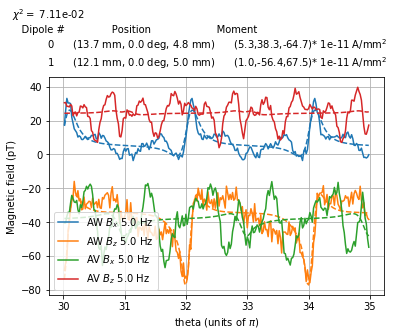

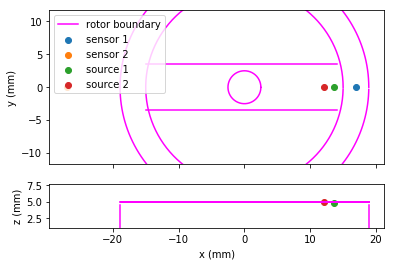

In [21]:
Opt_Settings_Exp2_5Hz['plot']=1
Opt_Settings_Exp2_5Hz['figname']=SaveDir+'Exp2_5Hz_'+nowtext+'_1'
chi2_one_exp_one_freq(opt_res_Exp2_5Hz.x,Opt_Settings_Exp2_5Hz)
# Opt_Params_Exp2 = opt_res_Exp2.x

In [22]:
Opt_Params_Exp2_low_chi_5Hz = opt_res_Exp2_5Hz.x
Opt_Params_Exp2_low_chi_5Hz

array([ 1.36849591e+01,  1.19565101e-04,  4.79709018e+00,  5.28759325e+00,
        3.83041128e+01, -6.47386484e+01,  1.20637048e+01,  9.00159424e-05,
        4.99998834e+00,  9.57105232e-01, -5.63597833e+01,  6.74714768e+01,
        5.27479992e+00, -3.40578195e+01, -3.81544535e+01,  2.44161761e+01])

### AV only

[18, 70, 0, 0, -10, 0, 18, 250, 0, 0, 0, 0, -35, 21]
0.21630838855760662


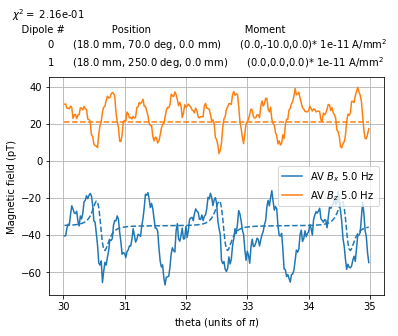

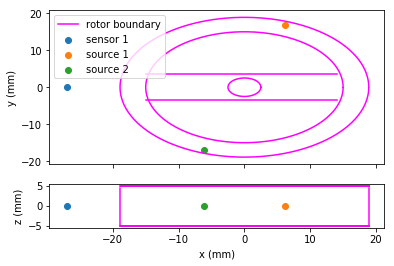

In [194]:
nu = 5
nowtext = now().strftime("%Y%m%d%H%M")
Opt_Settings_Exp2_5Hz_AV = {'number of sources': 2,
                'location coordinate system': 'polar',
                'moment coordinate system':'polar',
                'location dimensions': 3,
                'moment dimensions': 3,
                'rotation sign':1, # 1 for positive, -1 for negative, 0 for unknown and making it a free parameter
                'rotation frequency':nu,
                'rotor dimensions':rtr_dims,
                'time':Exp2_Time_cut[nu],
                'number of sensors':1,
                'sensor locations':[Exp2_AV_sensor_loc],
                'sensor field order':[[0,2]] ,  # list which order of B component of each sensor (0 for x, 1 for y, 2 for z) 
                'B data':[ Exp2_AV_X_cut[nu],Exp2_AV_Z_cut[nu]],
                'plot':1,
                'saveplot':0,
                'bar location':0,
                'plotlabels':['AV $B_x$', 'AV $B_z$'],
                'figname':SaveDir+'Exp2_5Hz_AVonly_'+nowtext+'_0'
}
# Opt_Params_Exp2_5Hz =[   7.95825475,    40,    4.99597432,  189.10747075,
#         -58.32594041,   15.10548281,    6.80567371,    0.63247041,
#           1.75174325, -178.62354081,    3.90215557, -152.24476817,
#          -7.19618541,   15.07247243,  -37.54240099,  -30.82105149]

# Opt_Params_Exp2_5Hz_AV =[   2.62413192,   60.92049873,    1.58388672,  563.74575374,
#         305.91789706,  125.48983254,    2.64563731,   44.20279413,
#           4.96478201, -620.17314751,  191.84409201,  860.73985184,
#         -63.42837822,   19.10413722]

Opt_Params_Exp2_5Hz_AV  = [ 18, 70 , 0, 0, 10, 0,
                            18, 250, 0, 0,  0, 0,
                           -35  ,  21]

chi_Exp2_5Hz_AV = chi2_one_exp_one_freq(Opt_Params_Exp2_5Hz_AV,Opt_Settings_Exp2_5Hz_AV)

In [47]:
Opt_Settings_Exp2_5Hz_AV['plot'] = 0
opt_res_Exp2_5Hz_AV = minimize(chi2_one_exp_one_freq,Opt_Params_Exp2_5Hz_AV,Opt_Settings_Exp2_5Hz_AV,method = 'Nelder-Mead',options = {'maxfev': 3000,'maxiter': 3000,'adaptive':True
                                                                                                                                   })

[ 15.075578     0.           0.2412316   20.57472518 -14.514487
 -10.58936787  15.02245324 180.           1.80776487  15.73463658
 -30.77064601 -18.67535741 -35.00163818  21.69330488  45.        ]
0.26227236837690254
[ 15.8293569    0.           0.2412316   20.57472518 -14.514487
 -10.58936787  15.02245324 180.           1.80776487  15.73463658
 -30.77064601 -18.67535741 -35.00163818  21.69330488  45.        ]
0.28025467225768264
[ 1.50755780e+01  2.50000000e-04  2.41231600e-01  2.05747252e+01
 -1.45144870e+01 -1.05893679e+01  1.50224532e+01  1.80000000e+02
  1.80776487e+00  1.57346366e+01 -3.07706460e+01 -1.86753574e+01
 -3.50016382e+01  2.16933049e+01  4.50000000e+01]
0.26227139126460014
[ 15.075578     0.           0.25329318  20.57472518 -14.514487
 -10.58936787  15.02245324 180.           1.80776487  15.73463658
 -30.77064601 -18.67535741 -35.00163818  21.69330488  45.        ]
0.26232874351405083
[ 15.075578     0.           0.2412316   21.60346144 -14.514487
 -10.58936787  15.02

0.20013527739680056
[ 1.47700798e+01  1.32611418e-04  2.40070659e-01  2.03146392e+01
 -1.43400309e+01 -1.04138135e+01  1.46005001e+01  1.91379407e+02
  1.88367572e+00  1.57669899e+01 -3.04128073e+01 -1.85513061e+01
 -3.52564166e+01  2.15019756e+01  4.64346195e+01]
0.19976306794227347
[ 1.47682947e+01  1.35139317e-04  2.39920405e-01  2.02974935e+01
 -1.43312585e+01 -1.03873176e+01  1.45862387e+01  1.91886594e+02
  1.89304052e+00  1.57471672e+01 -3.04089601e+01 -1.85169485e+01
 -3.52877320e+01  2.14858352e+01  4.64674006e+01]
0.1979607153326462
[ 1.44503869e+01  2.45322926e-04  2.40988714e-01  2.02747738e+01
 -1.42727306e+01 -1.06087567e+01  1.43343058e+01  1.86535899e+02
  1.83048462e+00  1.60983548e+01 -3.00644517e+01 -1.89214971e+01
 -3.50796108e+01  2.15250903e+01  4.75731759e+01]
0.20035692062359337
[ 1.47489826e+01  1.68046489e-04  2.41815500e-01  2.04969486e+01
 -1.45056726e+01 -1.05525135e+01  1.45276360e+01  1.91238812e+02
  1.82643649e+00  1.59743436e+01 -3.03815855e+01 -1.8796

Source 2 not in rotor
[ 1.44490074e+01  2.25974769e-04  2.42125009e-01  2.03716123e+01
 -1.43446150e+01 -1.06303083e+01  1.44559683e+01  1.90507300e+02
  1.82330740e+00  1.58457370e+01 -3.01615995e+01 -1.86400872e+01
 -3.49823709e+01  2.15785804e+01  4.72764892e+01]
0.1916243304112631
[ 1.43183367e+01  2.51435598e-04  2.43487927e-01  2.04090891e+01
 -1.43768500e+01 -1.06725927e+01  1.44619434e+01  1.94489029e+02
  1.81566088e+00  1.57073152e+01 -3.01508397e+01 -1.83404222e+01
 -3.49639160e+01  2.15788501e+01  4.74194009e+01]
Source 2 not in rotor
[ 1.44933394e+01  2.02807292e-04  2.42384255e-01  2.04429723e+01
 -1.43918276e+01 -1.06433516e+01  1.45498227e+01  1.91745389e+02
  1.82109667e+00  1.56981458e+01 -3.02334741e+01 -1.85595711e+01
 -3.48803058e+01  2.16335443e+01  4.70019846e+01]
0.19120576502361683
[ 1.40551325e+01  2.91189020e-04  2.46638497e-01  2.06464973e+01
 -1.44603195e+01 -1.01281259e+01  1.45592663e+01  1.93027813e+02
  1.82508829e+00  1.57281972e+01 -3.00029277e+01 -1.

Source 2 not in rotor
[ 1.42001066e+01  3.00143590e-04  2.46846168e-01  2.11318682e+01
 -1.43538171e+01 -1.05239289e+01  1.45236832e+01  1.92698444e+02
  1.80605494e+00  1.54624635e+01 -2.97300649e+01 -1.83458688e+01
 -3.47585349e+01  2.12482991e+01  4.97333668e+01]
0.17074057970535508
[ 1.41849398e+01  3.04741670e-04  2.46947291e-01  2.12328262e+01
 -1.43512109e+01 -1.05203134e+01  1.45274725e+01  1.92628505e+02
  1.80437094e+00  1.54511744e+01 -2.96989357e+01 -1.83440156e+01
 -3.47650629e+01  2.11836388e+01  4.98980346e+01]
0.17001883888387917
[ 1.39944014e+01  3.70903403e-04  2.53804373e-01  2.04103613e+01
 -1.40671972e+01 -1.06120736e+01  1.41738619e+01  1.94556254e+02
  1.83316728e+00  1.54786406e+01 -2.96658519e+01 -1.84354806e+01
 -3.46798895e+01  2.19008004e+01  4.83434687e+01]
Source 2 not in rotor
[ 1.44975236e+01  2.04806518e-04  2.41423529e-01  2.04393722e+01
 -1.45596283e+01 -1.05103674e+01  1.46963987e+01  1.92342083e+02
  1.80832292e+00  1.55796117e+01 -3.01200924e+01 -1

0.15466980772817732
[ 1.38012017e+01  4.01459938e-04  2.55406492e-01  2.03326815e+01
 -1.44029402e+01 -1.06871284e+01  1.44001661e+01  1.92794838e+02
  1.84954920e+00  1.49810411e+01 -2.98743568e+01 -1.76871114e+01
 -3.48436691e+01  2.16569411e+01  5.28542489e+01]
0.15448892298027106
[ 1.37811202e+01  4.11130129e-04  2.55736101e-01  2.03416471e+01
 -1.44122252e+01 -1.07076240e+01  1.43891960e+01  1.92833978e+02
  1.85501301e+00  1.49610098e+01 -2.98688149e+01 -1.76530448e+01
 -3.48229728e+01  2.16502523e+01  5.30077388e+01]
0.15382448842811203
[ 1.40084501e+01  3.59931206e-04  2.52426000e-01  2.05036412e+01
 -1.41280212e+01 -1.05360336e+01  1.44200486e+01  1.93167707e+02
  1.81852063e+00  1.49297606e+01 -2.95037785e+01 -1.77019730e+01
 -3.50512589e+01  2.16685604e+01  5.28566433e+01]
0.15376861335310965
[ 1.40168963e+01  3.63176433e-04  2.52340223e-01  2.05329355e+01
 -1.41016413e+01 -1.05349963e+01  1.44129502e+01  1.93248727e+02
  1.81940501e+00  1.49058079e+01 -2.94524282e+01 -1.767

0.14028309218629983
[ 1.37633386e+01  4.26183154e-04  2.65780609e-01  1.96185624e+01
 -1.41314978e+01 -1.07003534e+01  1.40804549e+01  1.91530690e+02
  1.80939776e+00  1.41862569e+01 -2.97940964e+01 -1.67663646e+01
 -3.55991456e+01  2.19330034e+01  5.78884385e+01]
0.13984329433644027
[ 1.39175113e+01  4.34444093e-04  2.62978389e-01  2.05232664e+01
 -1.40607608e+01 -1.04875613e+01  1.42573719e+01  1.91802061e+02
  1.80000481e+00  1.44937218e+01 -2.96176369e+01 -1.73276981e+01
 -3.37333882e+01  2.18352105e+01  5.76399720e+01]
0.1427401579324792
[ 1.39461377e+01  4.53389351e-04  2.63997200e-01  2.00334083e+01
 -1.37913863e+01 -1.05990501e+01  1.47728933e+01  1.92020805e+02
  1.81096361e+00  1.43539757e+01 -2.89304414e+01 -1.72244326e+01
 -3.49949577e+01  2.12429494e+01  5.81951790e+01]
0.13903003495727925
[ 1.39638079e+01  4.58189656e-04  2.64368805e-01  1.99797989e+01
 -1.37432926e+01 -1.06091273e+01  1.48294322e+01  1.92061104e+02
  1.81305388e+00  1.43283763e+01 -2.88496329e+01 -1.7204

0.13216421312354598
[ 1.41939794e+01  3.76643154e-04  2.68796989e-01  2.04412387e+01
 -1.34574564e+01 -1.01447939e+01  1.43391653e+01  1.91193392e+02
  1.86789411e+00  1.34647847e+01 -2.85248194e+01 -1.64760840e+01
 -3.60906939e+01  2.18775165e+01  6.34117958e+01]
0.1318306171812569
[ 1.40464023e+01  5.03866886e-04  2.75883408e-01  2.11139896e+01
 -1.31668407e+01 -1.04771503e+01  1.41352270e+01  1.91364658e+02
  1.81996558e+00  1.34015179e+01 -2.86080640e+01 -1.61498509e+01
 -3.54889861e+01  2.09128143e+01  6.43644170e+01]
0.13389955143903118
[ 1.39799080e+01  4.99256941e-04  2.70382187e-01  2.05712705e+01
 -1.36111302e+01 -1.04654492e+01  1.40587589e+01  1.90696159e+02
  1.79753144e+00  1.33171967e+01 -2.89666409e+01 -1.62637920e+01
 -3.56395380e+01  2.17090959e+01  6.50784536e+01]
0.13231437402505045
[ 1.38257037e+01  4.50471573e-04  2.70956679e-01  2.04767110e+01
 -1.34749620e+01 -1.04319742e+01  1.44954411e+01  1.90129605e+02
  1.76918009e+00  1.33913844e+01 -2.85822650e+01 -1.6279

0.13056463105665206
[ 1.42754946e+01  3.44876992e-04  2.65444113e-01  2.13111027e+01
 -1.37038878e+01 -9.73327347e+00  1.46682911e+01  1.88170162e+02
  1.78049863e+00  1.38934506e+01 -2.83871170e+01 -1.68639325e+01
 -3.54437378e+01  2.18342403e+01  6.30733194e+01]
0.1311343741378002
[ 1.47150730e+01  3.75242843e-04  2.74763756e-01  2.07931063e+01
 -1.32021169e+01 -1.00167862e+01  1.42660916e+01  1.88806711e+02
  1.82046650e+00  1.34225948e+01 -2.80551734e+01 -1.59322896e+01
 -3.50978729e+01  2.19294399e+01  6.54094884e+01]
0.1307371173532708
[ 1.49640685e+01  2.85629857e-04  2.61682374e-01  2.08090867e+01
 -1.32742947e+01 -1.00853701e+01  1.42024354e+01  1.89848287e+02
  1.78517586e+00  1.35079578e+01 -2.87683479e+01 -1.65219150e+01
 -3.56017848e+01  2.27044783e+01  6.40472193e+01]
0.13171051422235164
[ 1.39823640e+01  4.38495218e-04  2.73816470e-01  2.04615848e+01
 -1.35856485e+01 -1.01435594e+01  1.45003845e+01  1.88678701e+02
  1.77572858e+00  1.35922074e+01 -2.85600652e+01 -1.62396

0.13015604846189807
[ 1.45765212e+01  3.62230368e-04  2.70498366e-01  2.03629418e+01
 -1.39931931e+01 -9.69416170e+00  1.44624213e+01  1.88426186e+02
  1.79723233e+00  1.38221638e+01 -2.78991669e+01 -1.63721325e+01
 -3.50659382e+01  2.24267249e+01  6.34555214e+01]
0.1303411949718361
[ 1.48587078e+01  3.52396144e-04  2.71388198e-01  2.03192853e+01
 -1.39381798e+01 -9.89372491e+00  1.42149742e+01  1.88414130e+02
  1.78765978e+00  1.34318879e+01 -2.80797747e+01 -1.62074706e+01
 -3.53900394e+01  2.16854291e+01  6.55784164e+01]
0.13039469061024767
[ 1.47766108e+01  3.55496413e-04  2.71029779e-01  2.03547497e+01
 -1.38649331e+01 -9.86617891e+00  1.42939978e+01  1.88279521e+02
  1.79195829e+00  1.34771873e+01 -2.81886825e+01 -1.62000246e+01
 -3.53408821e+01  2.18251555e+01  6.54234719e+01]
0.13005154157423487
[ 1.46860585e+01  3.95549244e-04  2.70573111e-01  2.03747185e+01
 -1.39186259e+01 -9.62661857e+00  1.45119445e+01  1.88210367e+02
  1.81379814e+00  1.36920050e+01 -2.84751339e+01 -1.6278

0.12906607633365544
[ 1.45939028e+01  3.58924191e-04  2.69831982e-01  1.93796248e+01
 -1.42387895e+01 -9.31990065e+00  1.46328125e+01  1.87243608e+02
  1.90513383e+00  1.35920922e+01 -2.83831378e+01 -1.60719358e+01
 -3.54667428e+01  2.26665930e+01  6.52929479e+01]
0.1290088587331083
[ 1.48929384e+01  4.22860725e-04  2.68886319e-01  2.03029595e+01
 -1.36744129e+01 -9.01395605e+00  1.43702671e+01  1.88012756e+02
  1.86500984e+00  1.34908295e+01 -2.84081169e+01 -1.61127780e+01
 -3.56130201e+01  2.25980150e+01  6.62011092e+01]
0.1296405788726458
[ 1.48335422e+01  4.02714425e-04  2.69330871e-01  2.02279628e+01
 -1.37377412e+01 -9.09239269e+00  1.44377328e+01  1.87754126e+02
  1.86133378e+00  1.35110011e+01 -2.84062536e+01 -1.60970613e+01
 -3.55195169e+01  2.25318237e+01  6.60786253e+01]
0.12933244389225065
[ 1.44370163e+01  3.54145331e-04  2.75349232e-01  1.99848109e+01
 -1.38794919e+01 -8.97249853e+00  1.47985255e+01  1.86521498e+02
  1.87815549e+00  1.34836412e+01 -2.85160239e+01 -1.59427

0.1274488350636805
[ 1.48270400e+01  3.43766073e-04  2.73144227e-01  1.96191784e+01
 -1.47692220e+01 -8.58474223e+00  1.44949427e+01  1.87318861e+02
  2.01807479e+00  1.35018609e+01 -2.78350974e+01 -1.58523569e+01
 -3.56069109e+01  2.18240537e+01  6.56785093e+01]
0.12841576794970566
[ 1.49067013e+01  3.59089806e-04  2.71431783e-01  1.94312404e+01
 -1.45595054e+01 -8.55173386e+00  1.46134971e+01  1.85902297e+02
  1.92196016e+00  1.36864543e+01 -2.78542931e+01 -1.59378738e+01
 -3.55978868e+01  2.25580950e+01  6.54979660e+01]
0.12831951069476918
[ 1.48065892e+01  3.58546418e-04  2.72412587e-01  1.92841496e+01
 -1.48025344e+01 -8.61377755e+00  1.48742507e+01  1.86067642e+02
  1.94181231e+00  1.37731198e+01 -2.78528875e+01 -1.59445880e+01
 -3.47967903e+01  2.20689501e+01  6.54666099e+01]
0.1283890464632137
[ 1.48532377e+01  3.90385145e-04  2.73130281e-01  1.92666615e+01
 -1.44628458e+01 -8.30162049e+00  1.47808387e+01  1.85207417e+02
  1.85973946e+00  1.36560012e+01 -2.81003290e+01 -1.58824

0.12707255751113272
[ 1.51070405e+01  3.69397375e-04  2.77652970e-01  1.90324472e+01
 -1.51763291e+01 -7.18498057e+00  1.46599735e+01  1.85308247e+02
  2.01988259e+00  1.35312350e+01 -2.76743700e+01 -1.57164224e+01
 -3.51174870e+01  2.21710824e+01  6.76564071e+01]
0.12662021383924946
[ 1.48613508e+01  3.39708132e-04  2.72447717e-01  1.84952063e+01
 -1.54796078e+01 -7.20641065e+00  1.48494364e+01  1.85291271e+02
  2.00406283e+00  1.36206338e+01 -2.82122463e+01 -1.58253069e+01
 -3.53112325e+01  2.23642933e+01  6.70861726e+01]
0.1262117804761216
[ 1.47556768e+01  4.35977202e-04  2.76058488e-01  1.83553387e+01
 -1.57442226e+01 -7.35696203e+00  1.45448227e+01  1.85905135e+02
  2.05135210e+00  1.35674530e+01 -2.76839429e+01 -1.57923571e+01
 -3.53040267e+01  2.25225154e+01  6.70303421e+01]
0.12615721621574835
[ 1.49311253e+01  3.79309004e-04  2.76879366e-01  1.83901908e+01
 -1.54261561e+01 -7.26210582e+00  1.46752112e+01  1.84320034e+02
  1.98057852e+00  1.35426772e+01 -2.80383911e+01 -1.5648

0.12423055625450516
[ 1.51263828e+01  4.10788383e-04  2.75071890e-01  1.79894648e+01
 -1.59770337e+01 -6.07923350e+00  1.47559549e+01  1.83652125e+02
  2.13265019e+00  1.35642990e+01 -2.79045111e+01 -1.55268268e+01
 -3.54694795e+01  2.29130810e+01  6.87161131e+01]
0.12469268010884221
[ 1.51130371e+01  3.47890399e-04  2.80749890e-01  1.72669415e+01
 -1.61271523e+01 -5.99906892e+00  1.48211992e+01  1.83142330e+02
  2.17291242e+00  1.35234075e+01 -2.75701192e+01 -1.54947266e+01
 -3.54705649e+01  2.28146871e+01  6.83496668e+01]
0.12445815247151042
[ 1.49403899e+01  4.09357503e-04  2.76565453e-01  1.77094072e+01
 -1.62970198e+01 -5.82518047e+00  1.49702203e+01  1.83996431e+02
  2.18282746e+00  1.36731143e+01 -2.78424933e+01 -1.56169306e+01
 -3.49714561e+01  2.26987695e+01  6.83178271e+01]
0.12452367875100298
[ 1.52071707e+01  4.02390413e-04  2.78410880e-01  1.77178479e+01
 -1.64133604e+01 -6.19822519e+00  1.43993200e+01  1.83573123e+02
  2.13455030e+00  1.34484344e+01 -2.76402002e+01 -1.525

0.1217607312867602
[ 1.53284107e+01  4.39680539e-04  2.78925088e-01  1.63358911e+01
 -1.76210579e+01 -4.43555153e+00  1.47218731e+01  1.83433445e+02
  2.31576133e+00  1.34954217e+01 -2.73525532e+01 -1.51847558e+01
 -3.51380072e+01  2.29862752e+01  6.98870936e+01]
0.12166201006411256
[ 1.51432722e+01  3.96543892e-04  2.79981533e-01  1.69402812e+01
 -1.78296921e+01 -4.04797819e+00  1.47861340e+01  1.81193175e+02
  2.28921746e+00  1.36457499e+01 -2.71062732e+01 -1.53768660e+01
 -3.52400691e+01  2.30315952e+01  6.98105065e+01]
0.12177867113076146
[ 1.54229972e+01  3.62466000e-04  2.79826760e-01  1.65344923e+01
 -1.77609062e+01 -4.04436200e+00  1.50077048e+01  1.80953541e+02
  2.32448602e+00  1.36251398e+01 -2.73748706e+01 -1.50504343e+01
 -3.49982533e+01  2.29204154e+01  7.03470470e+01]
0.12169657888635797
[ 1.53250465e+01  3.96753032e-04  2.81973650e-01  1.65787198e+01
 -1.77931130e+01 -4.47547054e+00  1.44365815e+01  1.81368252e+02
  2.29583862e+00  1.33416162e+01 -2.74072172e+01 -1.4827

0.11892286900441876
[ 1.53653543e+01  4.53833654e-04  2.80615653e-01  1.52600442e+01
 -1.85843231e+01 -2.36670605e+00  1.51049470e+01  1.81220868e+02
  2.43220600e+00  1.37158300e+01 -2.70488236e+01 -1.51193445e+01
 -3.52860721e+01  2.34840465e+01  7.08380503e+01]
0.11905444186699367
[ 1.54605364e+01  4.96586868e-04  2.85207617e-01  1.50025503e+01
 -1.90982496e+01 -2.51024321e+00  1.49534037e+01  1.81763578e+02
  2.49380912e+00  1.37992204e+01 -2.61286524e+01 -1.49819122e+01
 -3.46721672e+01  2.32644502e+01  7.01257534e+01]
0.11943587801672478
[ 1.55377116e+01  4.65040968e-04  2.85421968e-01  1.51606472e+01
 -1.88246141e+01 -2.17690809e+00  1.51902932e+01  1.80754964e+02
  2.52887896e+00  1.35298059e+01 -2.60866338e+01 -1.46697779e+01
 -3.50377578e+01  2.33362435e+01  7.22776185e+01]
0.11869677587779812
[ 1.57321143e+01  4.55082884e-04  2.85578101e-01  1.47458913e+01
 -1.91948498e+01 -2.01314364e+00  1.49628044e+01  1.80753714e+02
  2.54569463e+00  1.35124917e+01 -2.65963325e+01 -1.485

 -3.49054644e+01  2.35900700e+01  7.40076989e+01]
0.1146879910551731
[ 1.55159499e+01  5.19490068e-04  2.85073763e-01  1.36399781e+01
 -2.14703937e+01  4.32079801e-01  1.52347994e+01  1.77874576e+02
  2.77671499e+00  1.36790343e+01 -2.61586079e+01 -1.43517380e+01
 -3.48794573e+01  2.35904144e+01  7.41675222e+01]
0.11457636563888601
[ 1.58929247e+01  4.13308574e-04  2.90555515e-01  1.29745274e+01
 -2.07156904e+01  2.88098502e-02  1.51340238e+01  1.77056879e+02
  2.75472135e+00  1.35194671e+01 -2.59921049e+01 -1.43249781e+01
 -3.55454201e+01  2.36871206e+01  7.36241298e+01]
0.11461932458494292
[ 1.57125762e+01  5.11373718e-04  2.95189430e-01  1.28381971e+01
 -2.11509721e+01  5.42323417e-01  1.50976815e+01  1.76521392e+02
  2.74544171e+00  1.35778033e+01 -2.58518623e+01 -1.41921539e+01
 -3.48578289e+01  2.41205548e+01  7.48430309e+01]
0.11439146835702128
[ 1.57184349e+01  5.14788183e-04  2.96146034e-01  1.26983511e+01
 -2.12421981e+01  6.95201365e-01  1.51071944e+01  1.76231356e+02
  2.75

0.10967823778747877
[ 1.56988409e+01  5.69227530e-04  2.99030319e-01  1.06236473e+01
 -2.36622885e+01  3.28052009e+00  1.50738366e+01  1.74988409e+02
  3.06071769e+00  1.35329128e+01 -2.47840536e+01 -1.35908465e+01
 -3.53721501e+01  2.48333452e+01  7.64180453e+01]
0.10918992324295551
[ 1.56683243e+01  5.72417468e-04  2.99442610e-01  1.05165149e+01
 -2.37944926e+01  3.38381736e+00  1.50590802e+01  1.74814635e+02
  3.07124397e+00  1.35289231e+01 -2.47331370e+01 -1.35459565e+01
 -3.53996695e+01  2.49135636e+01  7.65113549e+01]
0.10909332436680162
[ 1.58534130e+01  5.77217531e-04  2.96967445e-01  1.05529487e+01
 -2.35742428e+01  3.66826277e+00  1.55586156e+01  1.75507155e+02
  3.09579555e+00  1.37943882e+01 -2.44433082e+01 -1.40837097e+01
 -3.52253534e+01  2.46405472e+01  7.54869827e+01]
0.10932240656923581
[ 1.60610889e+01  6.22196600e-04  3.04413692e-01  9.85753773e+00
 -2.28422186e+01  4.12150362e+00  1.54269960e+01  1.75819806e+02
  3.20185478e+00  1.35696081e+01 -2.45507039e+01 -1.369

0.1027539177052258
[ 1.62540707e+01  5.88241047e-04  3.20751874e-01  5.23890015e+00
 -2.73818293e+01  9.13038337e+00  1.54816647e+01  1.71294155e+02
  3.71034551e+00  1.34506222e+01 -2.26776769e+01 -1.28156879e+01
 -3.59289703e+01  2.57363809e+01  7.96859578e+01]
0.10274765736554799
[ 1.60481005e+01  6.29661553e-04  3.20559888e-01  5.16201447e+00
 -2.76413287e+01  9.31454564e+00  1.51787831e+01  1.70988860e+02
  3.73550798e+00  1.32745762e+01 -2.39176453e+01 -1.28076159e+01
 -3.62520010e+01  2.57056261e+01  8.07627119e+01]
0.10183805899964095
[ 1.60295816e+01  6.33058427e-04  3.21330670e-01  4.97278366e+00
 -2.78233692e+01  9.50123871e+00  1.51474353e+01  1.70834034e+02
  3.75652069e+00  1.32611044e+01 -2.39629240e+01 -1.27873390e+01
 -3.62911005e+01  2.57305312e+01  8.09007042e+01]
0.1017311875576392
[ 1.57272688e+01  6.60932512e-04  3.15237756e-01  6.57624724e+00
 -2.62103072e+01  7.67271943e+00  1.56329862e+01  1.72139070e+02
  3.56397616e+00  1.36096243e+01 -2.38756423e+01 -1.31292

0.1004259167419364
[ 1.63571507e+01  7.12512229e-04  3.28703835e-01  2.63494814e+00
 -2.87225933e+01  1.19496730e+01  1.56869901e+01  1.70064804e+02
  3.98386678e+00  1.32384915e+01 -2.29727885e+01 -1.23531262e+01
 -3.62996550e+01  2.58704144e+01  8.28618721e+01]
0.10211936916725232
[ 1.62559913e+01  6.95219306e-04  3.28697860e-01  2.96953453e+00
 -2.85673318e+01  1.16789704e+01  1.56619449e+01  1.70106678e+02
  3.96450193e+00  1.32482555e+01 -2.29131810e+01 -1.24160846e+01
 -3.63856161e+01  2.59355708e+01  8.25181113e+01]
0.10136501832094089
[ 1.60972335e+01  6.96697166e-04  3.22913964e-01  4.47157328e+00
 -2.75241292e+01  1.03371884e+01  1.55775496e+01  1.73219161e+02
  3.87736511e+00  1.33548781e+01 -2.29542624e+01 -1.29171119e+01
 -3.67932010e+01  2.53493263e+01  7.99405859e+01]
0.10152496688116734
[ 1.62342337e+01  6.63266828e-04  3.32853254e-01  3.41702969e+00
 -2.85065105e+01  1.16919853e+01  1.54530044e+01  1.70665721e+02
  3.99918543e+00  1.30649414e+01 -2.23553288e+01 -1.2360

0.10027110183799712
[ 1.57306417e+01  6.50485794e-04  3.26349317e-01  3.49282924e+00
 -2.83526159e+01  1.12649767e+01  1.57399032e+01  1.70898423e+02
  3.92143717e+00  1.33830322e+01 -2.29165968e+01 -1.27818963e+01
 -3.68318247e+01  2.61956285e+01  8.06447977e+01]
0.1011190593835194
[ 1.57794581e+01  6.97088927e-04  3.40393752e-01  1.66679961e+00
 -2.99506262e+01  1.34918969e+01  1.56077337e+01  1.69478332e+02
  4.20433202e+00  1.30208134e+01 -2.21298526e+01 -1.21007175e+01
 -3.72304728e+01  2.62341590e+01  8.38816281e+01]
0.10021618260256264
[ 1.53936024e+01  6.64565539e-04  3.32893469e-01  2.31421389e+00
 -3.01521319e+01  1.23911029e+01  1.52028252e+01  1.69789789e+02
  4.06469593e+00  1.30655419e+01 -2.36770124e+01 -1.24132171e+01
 -3.71199119e+01  2.61235747e+01  8.26767233e+01]
0.10036506549108667
[ 1.58126986e+01  7.16586513e-04  3.33590241e-01  2.61783793e+00
 -3.01546416e+01  1.29830634e+01  1.55449244e+01  1.69621171e+02
  4.09404540e+00  1.34033645e+01 -2.20058231e+01 -1.2386

[ 1.56804040e+01  6.91583008e-04  3.40986100e-01  1.39880086e+00
 -3.00021533e+01  1.31183810e+01  1.55323425e+01  1.70268432e+02
  4.15117209e+00  1.31081979e+01 -2.19647253e+01 -1.22798974e+01
 -3.71669269e+01  2.62119523e+01  8.25890137e+01]
0.09999954540151604
[ 1.56978512e+01  7.83456907e-04  3.39979772e-01  1.53521974e+00
 -3.00972502e+01  1.34873389e+01  1.54021402e+01  1.70509209e+02
  4.19012332e+00  1.30327804e+01 -2.24980032e+01 -1.21910828e+01
 -3.70508924e+01  2.61140851e+01  8.35813931e+01]
0.10017356034990663
[ 1.56398927e+01  6.72715424e-04  3.34918838e-01  2.11274656e+00
 -2.97612388e+01  1.30610007e+01  1.56256755e+01  1.69719826e+02
  4.09767092e+00  1.32215140e+01 -2.23030813e+01 -1.24383341e+01
 -3.72224719e+01  2.64472657e+01  8.24953344e+01]
0.10000012019904027
[ 1.58569637e+01  6.96415131e-04  3.35446737e-01  2.22294675e+00
 -2.99653832e+01  1.25982360e+01  1.52294447e+01  1.70003464e+02
  4.05433549e+00  1.31246740e+01 -2.21087884e+01 -1.24650939e+01
 -3.728859

0.0997290962227749
[ 1.56192900e+01  7.32835792e-04  3.41930684e-01  1.78221613e+00
 -3.02343365e+01  1.41450353e+01  1.55622127e+01  1.68677660e+02
  4.18188708e+00  1.31424721e+01 -2.20189347e+01 -1.19429850e+01
 -3.72867699e+01  2.61714039e+01  8.38372170e+01]
0.09994469946219967
[ 1.56539720e+01  6.92623112e-04  3.37076881e-01  2.26452779e+00
 -2.95175113e+01  1.34600520e+01  1.56968558e+01  1.69185156e+02
  4.09555175e+00  1.32527200e+01 -2.21657976e+01 -1.23173438e+01
 -3.72867422e+01  2.65034756e+01  8.28678834e+01]
0.09993537667338509
[ 1.56962933e+01  7.89094858e-04  3.41102661e-01  1.69662764e+00
 -3.03026590e+01  1.43582317e+01  1.55297171e+01  1.69316113e+02
  4.17974526e+00  1.32621896e+01 -2.18444222e+01 -1.21546912e+01
 -3.69989026e+01  2.64821900e+01  8.35051595e+01]
0.0998730964990728
[ 1.55789287e+01  7.15589624e-04  3.40420057e-01  1.75827760e+00
 -3.00605290e+01  1.37077221e+01  1.53194441e+01  1.70067040e+02
  4.16613419e+00  1.30503020e+01 -2.21486062e+01 -1.20502

0.09970003898195608
[ 1.57095111e+01  7.08813884e-04  3.40510031e-01  2.22123090e+00
 -2.96420736e+01  1.42094008e+01  1.55370486e+01  1.69664804e+02
  4.16536752e+00  1.32130500e+01 -2.18057033e+01 -1.21835237e+01
 -3.75725326e+01  2.65203792e+01  8.26748490e+01]
0.0998286598491803
[ 1.56698895e+01  7.78403587e-04  3.40410716e-01  1.44429126e+00
 -3.00735043e+01  1.37901521e+01  1.56741665e+01  1.69714058e+02
  4.19078627e+00  1.32630172e+01 -2.18326314e+01 -1.20654476e+01
 -3.70649176e+01  2.63266731e+01  8.30811728e+01]
0.09975209021363221
[ 1.55694823e+01  7.32260747e-04  3.41531733e-01  1.81647440e+00
 -2.99831672e+01  1.37198645e+01  1.53670444e+01  1.69975847e+02
  4.17370291e+00  1.31047754e+01 -2.20464163e+01 -1.20362369e+01
 -3.73556514e+01  2.64638051e+01  8.30087083e+01]
0.0998387827845948
[ 1.57567637e+01  7.62807847e-04  3.39783324e-01  1.70644327e+00
 -2.98563071e+01  1.40985403e+01  1.57765504e+01  1.69521732e+02
  4.18523064e+00  1.33288476e+01 -2.16839789e+01 -1.21580

0.09970466455214982
[ 1.57161573e+01  7.85344043e-04  3.42431225e-01  1.83655236e+00
 -2.96679075e+01  1.41431891e+01  1.56024823e+01  1.70155408e+02
  4.16759035e+00  1.32382373e+01 -2.16365276e+01 -1.20700356e+01
 -3.72607749e+01  2.63784007e+01  8.30456229e+01]
0.09964540434231133
[ 1.57082788e+01  7.69427353e-04  3.42622276e-01  1.88961548e+00
 -2.97423305e+01  1.44159760e+01  1.57503975e+01  1.69322849e+02
  4.20834481e+00  1.32768201e+01 -2.16074364e+01 -1.19740205e+01
 -3.72673616e+01  2.63951913e+01  8.33635682e+01]
0.09969641800071026
[ 1.56955710e+01  7.69993270e-04  3.42205412e-01  1.90247566e+00
 -2.97407317e+01  1.43082576e+01  1.57084290e+01  1.69475037e+02
  4.19600797e+00  1.32757806e+01 -2.16611124e+01 -1.19970993e+01
 -3.72660382e+01  2.63962327e+01  8.32228329e+01]
0.09964332639064143
[ 1.56758898e+01  8.03110439e-04  3.44009725e-01  1.44174285e+00
 -3.00994950e+01  1.45189831e+01  1.56597130e+01  1.69648832e+02
  4.21395333e+00  1.33099955e+01 -2.14645345e+01 -1.188

0.09953856162857014
[ 1.57137599e+01  8.16416693e-04  3.42952416e-01  1.69022243e+00
 -2.97201233e+01  1.44403222e+01  1.57139494e+01  1.69877298e+02
  4.18641404e+00  1.34342732e+01 -2.14783304e+01 -1.19911710e+01
 -3.71188003e+01  2.65587502e+01  8.25305024e+01]
0.09958399116395615
[ 1.57942838e+01  8.32741608e-04  3.45007841e-01  1.63965992e+00
 -2.99449044e+01  1.47514731e+01  1.56282680e+01  1.69165236e+02
  4.20958489e+00  1.34139651e+01 -2.11950666e+01 -1.17881356e+01
 -3.71911510e+01  2.65495341e+01  8.29915214e+01]
0.09954504225604369
[ 1.56718419e+01  8.19747725e-04  3.43940915e-01  1.92760659e+00
 -2.98469864e+01  1.44819434e+01  1.55405115e+01  1.69450543e+02
  4.17815688e+00  1.33696072e+01 -2.16224622e+01 -1.18082138e+01
 -3.71468641e+01  2.65009215e+01  8.29543314e+01]
0.09945588025498964
[ 1.56660764e+01  8.21118706e-04  3.44034969e-01  1.93955398e+00
 -2.98592805e+01  1.44903043e+01  1.55270321e+01  1.69429243e+02
  4.17693354e+00  1.33708967e+01 -2.16373783e+01 -1.179

0.09940634232411158
[ 1.57311685e+01  8.72601277e-04  3.41504562e-01  2.05927591e+00
 -2.97359320e+01  1.47121646e+01  1.57010055e+01  1.69605002e+02
  4.21703914e+00  1.34597549e+01 -2.15980119e+01 -1.16972920e+01
 -3.72243134e+01  2.64824705e+01  8.29990968e+01]
0.0993758665662109
[ 1.57239847e+01  8.82255040e-04  3.46861563e-01  2.27136893e+00
 -2.92265409e+01  1.46555602e+01  1.55909607e+01  1.69653259e+02
  4.18671268e+00  1.34763415e+01 -2.12360541e+01 -1.16709994e+01
 -3.71791492e+01  2.64929749e+01  8.25815899e+01]
0.09933746796210535
[ 1.56572816e+01  8.91906001e-04  3.45464191e-01  1.71820742e+00
 -2.98115935e+01  1.50933802e+01  1.56027026e+01  1.69161822e+02
  4.23633264e+00  1.34383929e+01 -2.14039599e+01 -1.16279552e+01
 -3.73331185e+01  2.67893334e+01  8.31531566e+01]
0.09939750224331872
[ 1.55743101e+01  9.35218844e-04  3.43554798e-01  2.23015052e+00
 -2.98358670e+01  1.48417471e+01  1.56462478e+01  1.69818734e+02
  4.22601261e+00  1.35120963e+01 -2.09643637e+01 -1.1692

0.09923911248258746
[ 1.57278077e+01  9.29852377e-04  3.42655808e-01  2.39261082e+00
 -2.96189567e+01  1.49438468e+01  1.57433612e+01  1.70293695e+02
  4.19175721e+00  1.35979721e+01 -2.08736485e+01 -1.15678988e+01
 -3.70743372e+01  2.64709980e+01  8.25754208e+01]
0.09926500423019596
[ 1.57275272e+01  9.53027935e-04  3.47316469e-01  1.99579772e+00
 -2.96193180e+01  1.51181826e+01  1.57975486e+01  1.69488625e+02
  4.21733148e+00  1.36418808e+01 -2.06370723e+01 -1.13438744e+01
 -3.70646034e+01  2.66340800e+01  8.27483182e+01]
0.09916058639788557
[ 1.57295976e+01  9.56953989e-04  3.47775455e-01  1.96829843e+00
 -2.96165896e+01  1.51295777e+01  1.58103027e+01  1.69463857e+02
  4.21972711e+00  1.36502732e+01 -2.05799173e+01 -1.13182649e+01
 -3.70541986e+01  2.66334879e+01  8.27460451e+01]
0.09915900320557855
[ 1.57103447e+01  9.45183247e-04  3.45032966e-01  2.10204213e+00
 -2.96548467e+01  1.50684783e+01  1.56579612e+01  1.69560324e+02
  4.19827190e+00  1.35899468e+01 -2.10350101e+01 -1.136

0.0989696590732019
[ 1.55802334e+01  1.01225632e-03  3.46333579e-01  1.88302093e+00
 -2.99143291e+01  1.53286860e+01  1.57718382e+01  1.69627727e+02
  4.21130109e+00  1.36895014e+01 -2.08274103e+01 -1.12483014e+01
 -3.71086251e+01  2.64829725e+01  8.29652363e+01]
0.0990714957700262
[ 1.57600704e+01  9.42697671e-04  3.46118991e-01  1.88035194e+00
 -2.96207753e+01  1.53322469e+01  1.57952856e+01  1.69434789e+02
  4.19799642e+00  1.36462126e+01 -2.09765559e+01 -1.11412863e+01
 -3.72699964e+01  2.67408611e+01  8.28716443e+01]
0.09899698035844066
[ 1.57044984e+01  1.00104314e-03  3.45055145e-01  2.19781498e+00
 -2.97584597e+01  1.55363007e+01  1.57025012e+01  1.69265279e+02
  4.20218902e+00  1.37074662e+01 -2.09559571e+01 -1.11359648e+01
 -3.70589425e+01  2.66847687e+01  8.30353851e+01]
0.09901424808971614
[ 1.57683595e+01  9.79097545e-04  3.43734282e-01  2.70790469e+00
 -2.90299618e+01  1.47425541e+01  1.58337753e+01  1.69831688e+02
  4.14817648e+00  1.37322370e+01 -2.09014186e+01 -1.11846

0.09882066987616961
[ 1.56824679e+01  1.06124406e-03  3.45618115e-01  2.65398829e+00
 -2.94939630e+01  1.55844535e+01  1.57933187e+01  1.69187341e+02
  4.15070758e+00  1.38755149e+01 -2.05463862e+01 -1.08606035e+01
 -3.71655442e+01  2.67572415e+01  8.28202539e+01]
0.09875209310072587
[ 1.56522045e+01  1.09031227e-03  3.45779295e-01  2.29185921e+00
 -2.97228171e+01  1.55393667e+01  1.59029916e+01  1.69954550e+02
  4.20617736e+00  1.38708969e+01 -2.00388668e+01 -1.07467208e+01
 -3.72150877e+01  2.66830818e+01  8.26766831e+01]
0.0987467675051737
[ 1.56488924e+01  1.09536733e-03  3.45698516e-01  2.29909505e+00
 -2.97438461e+01  1.55577976e+01  1.59178753e+01  1.70011188e+02
  4.20808276e+00  1.38808160e+01 -1.99733672e+01 -1.07277860e+01
 -3.72214528e+01  2.66751521e+01  8.26612670e+01]
0.09874945757829569
[ 1.57865732e+01  1.03249935e-03  3.44037899e-01  2.70896056e+00
 -2.91322323e+01  1.52177721e+01  1.57880378e+01  1.69691842e+02
  4.16023268e+00  1.38375541e+01 -2.05734258e+01 -1.0837

0.0985079931841332
[ 1.57111376e+01  1.19141998e-03  3.50012791e-01  1.84848045e+00
 -2.96930236e+01  1.59856531e+01  1.59411086e+01  1.69580413e+02
  4.20428763e+00  1.40524373e+01 -1.96666393e+01 -1.03173108e+01
 -3.70697607e+01  2.69034503e+01  8.27033160e+01]
0.09853337289182922
[ 1.58407223e+01  1.14220679e-03  3.45780427e-01  2.65378709e+00
 -2.90609566e+01  1.54837124e+01  1.58734969e+01  1.69634227e+02
  4.14849733e+00  1.40244930e+01 -2.00859177e+01 -1.02883743e+01
 -3.71178671e+01  2.70566078e+01  8.24178784e+01]
0.098502672378893
[ 1.58558293e+01  1.14440588e-03  3.45555745e-01  2.69978165e+00
 -2.90232367e+01  1.54895082e+01  1.58745563e+01  1.69649922e+02
  4.14547524e+00  1.40354273e+01 -2.00754858e+01 -1.02646723e+01
 -3.71140121e+01  2.70900659e+01  8.23865005e+01]
0.09851090011151337
[ 1.57211753e+01  1.22094851e-03  3.47909714e-01  2.63316632e+00
 -2.92432074e+01  1.54570389e+01  1.57822887e+01  1.69650400e+02
  4.16477763e+00  1.40303361e+01 -1.98731754e+01 -1.025814

0.09814102790317034
[ 1.56564969e+01  1.30772425e-03  3.49725831e-01  2.24765784e+00
 -2.96892303e+01  1.64140362e+01  1.58360677e+01  1.69139477e+02
  4.17125435e+00  1.42150039e+01 -1.96546781e+01 -9.74026856e+00
 -3.70889551e+01  2.70934880e+01  8.29792536e+01]
0.09815538748613123
[ 1.57346325e+01  1.25951987e-03  3.43318920e-01  2.71632945e+00
 -2.93121004e+01  1.50807110e+01  1.58720131e+01  1.70022682e+02
  4.07035075e+00  1.41956613e+01 -1.99417851e+01 -9.90472389e+00
 -3.70036448e+01  2.68729378e+01  8.23384550e+01]
0.09811402755427667
[ 1.57374410e+01  1.26217808e-03  3.42673527e-01  2.75612731e+00
 -2.93099616e+01  1.50003792e+01  1.58741105e+01  1.70085723e+02
  4.06000738e+00  1.42068612e+01 -1.99514773e+01 -9.89690754e+00
 -3.69845700e+01  2.68659641e+01  8.22927600e+01]
0.09810814647622358
[ 1.56765536e+01  1.23597793e-03  3.49277470e-01  2.59199323e+00
 -2.89078083e+01  1.52317653e+01  1.59860147e+01  1.69759444e+02
  4.10449577e+00  1.41598369e+01 -1.97109807e+01 -9.903

0.09766768404754361
[ 1.56877681e+01  1.39712117e-03  3.49791017e-01  2.62001938e+00
 -2.92917080e+01  1.57808605e+01  1.59371173e+01  1.69557882e+02
  4.09323231e+00  1.43842187e+01 -1.90003009e+01 -9.04026901e+00
 -3.72602162e+01  2.69327465e+01  8.25930291e+01]
0.09765459562095599
[ 1.57215164e+01  1.36274804e-03  3.49555344e-01  2.61100582e+00
 -2.87688244e+01  1.52170505e+01  1.60672699e+01  1.69746945e+02
  4.06118992e+00  1.43716300e+01 -1.94122408e+01 -9.17400114e+00
 -3.71268860e+01  2.68244462e+01  8.22875192e+01]
0.09775118043127279
[ 1.58143129e+01  1.40056568e-03  3.47802877e-01  2.88727576e+00
 -2.86375620e+01  1.52878134e+01  1.58599802e+01  1.70259592e+02
  4.05227857e+00  1.43216990e+01 -1.96440578e+01 -9.08828188e+00
 -3.71833426e+01  2.69332788e+01  8.24845216e+01]
0.09767083533555072
[ 1.57458526e+01  1.33731973e-03  3.46467446e-01  2.34382609e+00
 -2.92950622e+01  1.57528659e+01  1.59953929e+01  1.69442942e+02
  4.08304268e+00  1.43251931e+01 -1.98903560e+01 -9.127

0.09719705720801759
[ 1.58675308e+01  1.52608677e-03  3.44954888e-01  2.92913644e+00
 -2.88192999e+01  1.54153372e+01  1.61470678e+01  1.69848203e+02
  3.99652573e+00  1.46760499e+01 -1.92690125e+01 -8.16856743e+00
 -3.70356101e+01  2.70653145e+01  8.25447817e+01]
0.09719380330914822
[ 1.56430918e+01  1.48210883e-03  3.50027185e-01  2.55517762e+00
 -2.92343306e+01  1.54702721e+01  1.59483194e+01  1.69737483e+02
  4.00731494e+00  1.45541663e+01 -1.91995408e+01 -8.33715049e+00
 -3.72300902e+01  2.70448885e+01  8.24582170e+01]
0.0971772118356642
[ 1.56222112e+01  1.48583278e-03  3.50146979e-01  2.55123695e+00
 -2.92677621e+01  1.54547928e+01  1.59449759e+01  1.69758930e+02
  4.00441366e+00  1.45596522e+01 -1.91805129e+01 -8.30746605e+00
 -3.72374691e+01  2.70458202e+01  8.24481339e+01]
0.09717408864121457
[ 1.57726165e+01  1.52030808e-03  3.53787947e-01  2.17083858e+00
 -2.91685177e+01  1.63790522e+01  1.60183743e+01  1.69200350e+02
  4.09091512e+00  1.45530520e+01 -1.89866079e+01 -8.0800

0.09662883659094217
[ 1.58029888e+01  1.63350724e-03  3.49551801e-01  2.55299635e+00
 -2.89863762e+01  1.56421476e+01  1.60531025e+01  1.68910007e+02
  3.93973020e+00  1.48087744e+01 -1.92160922e+01 -7.23796872e+00
 -3.73462527e+01  2.72667395e+01  8.29620973e+01]
0.09658328456910222
[ 1.58085676e+01  1.63645402e-03  3.49295902e-01  2.59609723e+00
 -2.89496310e+01  1.55880145e+01  1.60485889e+01  1.68861618e+02
  3.93097720e+00  1.48153562e+01 -1.92637601e+01 -7.18574579e+00
 -3.73555291e+01  2.72770658e+01  8.29708350e+01]
0.09657271319683258
[ 1.57780795e+01  1.63129440e-03  3.52140698e-01  2.92488281e+00
 -2.87172303e+01  1.59286494e+01  1.60636096e+01  1.69141604e+02
  3.90672189e+00  1.48786747e+01 -1.89870142e+01 -7.29700374e+00
 -3.72769496e+01  2.70229393e+01  8.27023547e+01]
0.0965310835404323
[ 1.57798323e+01  1.63359370e-03  3.52241793e-01  3.00924307e+00
 -2.86513211e+01  1.59172626e+01  1.60609809e+01  1.69128350e+02
  3.89492510e+00  1.48932023e+01 -1.89999532e+01 -7.2587

0.09586642974035334
[ 1.58091759e+01  1.85878524e-03  3.52694423e-01  2.65861491e+00
 -2.85860355e+01  1.54686840e+01  1.61026672e+01  1.70032970e+02
  3.80203699e+00  1.51447860e+01 -1.83235222e+01 -5.99755418e+00
 -3.73745186e+01  2.71887887e+01  8.26219796e+01]
0.09570472855944681
[ 1.58184024e+01  1.86890609e-03  3.52650120e-01  2.71362574e+00
 -2.84940851e+01  1.53864963e+01  1.61007616e+01  1.70147062e+02
  3.79133334e+00  1.51541712e+01 -1.83122804e+01 -5.94094971e+00
 -3.73770329e+01  2.71838735e+01  8.25817235e+01]
0.09568173202140011
[ 1.56144898e+01  1.90420727e-03  3.55683171e-01  2.15267766e+00
 -2.95096954e+01  1.67992711e+01  1.62212362e+01  1.68662782e+02
  3.84941178e+00  1.53046228e+01 -1.81092538e+01 -5.67892442e+00
 -3.73577556e+01  2.74325294e+01  8.33601967e+01]
0.09566458078566026
[ 1.55981274e+01  1.91875807e-03  3.56019486e-01  2.13729500e+00
 -2.95451943e+01  1.68943727e+01  1.62344489e+01  1.68590611e+02
  3.84599640e+00  1.53328882e+01 -1.80725341e+01 -5.589

0.09417066123210789
[ 1.57361486e+01  2.35023334e-03  3.55101107e-01  2.47927381e+00
 -2.92714127e+01  1.61883932e+01  1.63838121e+01  1.69163601e+02
  3.58465129e+00  1.61601811e+01 -1.71626744e+01 -2.98383931e+00
 -3.73807430e+01  2.75478543e+01  8.27286606e+01]
0.09412808565211968
[ 1.58464690e+01  2.12447935e-03  3.52400053e-01  2.22645970e+00
 -2.89993580e+01  1.53987744e+01  1.61734716e+01  1.68450302e+02
  3.54148183e+00  1.57739090e+01 -1.85010250e+01 -3.50436064e+00
 -3.75947720e+01  2.76279310e+01  8.29668956e+01]
0.09428385663464404
[ 1.56705275e+01  2.25119191e-03  3.54085001e-01  2.33461278e+00
 -2.95634723e+01  1.61448075e+01  1.62964245e+01  1.68981032e+02
  3.57204604e+00  1.59686126e+01 -1.70219057e+01 -3.09150262e+00
 -3.77540949e+01  2.75354307e+01  8.29594197e+01]
0.09418960926969853
[ 1.58974657e+01  2.17100090e-03  3.53142332e-01  2.59104230e+00
 -2.83410175e+01  1.47330545e+01  1.62029899e+01  1.70326590e+02
  3.49845782e+00  1.57543135e+01 -1.77345985e+01 -3.509

0.09230650791074023
[ 1.58002744e+01  2.56232991e-03  3.58623383e-01  1.87023958e+00
 -2.92349569e+01  1.53187151e+01  1.63873417e+01  1.68859452e+02
  3.17433973e+00  1.66937083e+01 -1.72111565e+01 -3.64383523e-01
 -3.73572422e+01  2.74212395e+01  8.27056373e+01]
0.09259923171931674
[ 1.57664323e+01  2.65497362e-03  3.55772687e-01  1.89345371e+00
 -2.94942262e+01  1.60362625e+01  1.62459438e+01  1.68588782e+02
  3.24493633e+00  1.66560771e+01 -1.77730024e+01 -1.74402425e-01
 -3.77305011e+01  2.75721435e+01  8.36051591e+01]
0.09230624964437585
[ 1.57628074e+01  2.67406989e-03  3.55831151e-01  1.85503114e+00
 -2.95421460e+01  1.60848694e+01  1.62376389e+01  1.68526565e+02
  3.23665256e+00  1.66790730e+01 -1.78120281e+01 -5.64970557e-02
 -3.77527957e+01  2.75633046e+01  8.36960090e+01]
0.0922652758169709
[ 1.58128358e+01  2.59033554e-03  3.51931850e-01  1.90956245e+00
 -2.95838365e+01  1.56881643e+01  1.62352216e+01  1.69259807e+02
  3.21550888e+00  1.66329038e+01 -1.80550954e+01 -2.9229

0.09046863699169219
[ 1.57641294e+01  2.99992416e-03  3.58509100e-01  2.21213762e+00
 -2.91823446e+01  1.58066965e+01  1.60017612e+01  1.69368575e+02
  2.86405114e+00  1.73631349e+01 -1.76992658e+01  2.62757722e+00
 -3.77991631e+01  2.78264941e+01  8.28876305e+01]
0.09041641042422482
[ 1.59524268e+01  2.74625436e-03  3.50702479e-01  2.74944324e+00
 -2.85326359e+01  1.44914042e+01  1.58740990e+01  1.68987332e+02
  2.76324189e+00  1.69857261e+01 -1.92434633e+01  1.88492593e+00
 -3.75684867e+01  2.75190348e+01  8.31257138e+01]
0.09056927473800766
[ 1.57273743e+01  3.00618144e-03  3.58966633e-01  1.72178651e+00
 -2.93059777e+01  1.58557285e+01  1.62706711e+01  1.68558231e+02
  2.80482749e+00  1.73987644e+01 -1.76546037e+01  3.04144183e+00
 -3.76370473e+01  2.80838900e+01  8.38088841e+01]
0.09051833547746836
[ 1.60515629e+01  3.06080650e-03  3.52335215e-01  2.19760659e+00
 -2.87484743e+01  1.58090660e+01  1.62562251e+01  1.69241634e+02
  2.78403092e+00  1.75662451e+01 -1.81147664e+01  3.270

0.08884035680911721
[ 1.59392054e+01  3.23644446e-03  3.46753117e-01  1.91227830e+00
 -2.97279126e+01  1.51167665e+01  1.60905198e+01  1.69426606e+02
  2.34517740e+00  1.80430881e+01 -1.86143652e+01  5.38993835e+00
 -3.79391389e+01  2.81509684e+01  8.31668445e+01]
0.08881058962015541
[ 1.60399740e+01  3.21115051e-03  3.49768413e-01  2.74769751e+00
 -2.81548725e+01  1.42473268e+01  1.58168680e+01  1.69849588e+02
  2.36815117e+00  1.78640307e+01 -1.94960635e+01  4.66631167e+00
 -3.74308006e+01  2.79445906e+01  8.26717462e+01]
0.08866946171097395
[ 1.60563863e+01  3.21269567e-03  3.49292940e-01  2.80866085e+00
 -2.80605199e+01  1.41492798e+01  1.57905736e+01  1.69952631e+02
  2.34778939e+00  1.78680046e+01 -1.96448256e+01  4.67784491e+00
 -3.73951972e+01  2.79362176e+01  8.26203429e+01]
0.08861820843388206
[ 1.59706983e+01  3.47853146e-03  3.52442621e-01  1.65091356e+00
 -2.95757169e+01  1.51326840e+01  1.59330992e+01  1.69321404e+02
  2.41563452e+00  1.81859933e+01 -1.82216777e+01  6.119

0.08718423317882402
[ 1.60601444e+01  3.84126108e-03  3.49769292e-01  2.19675694e+00
 -2.85669650e+01  1.49360800e+01  1.57193970e+01  1.69253987e+02
  1.82581925e+00  1.90398047e+01 -1.96759602e+01  9.95576802e+00
 -3.80549239e+01  2.88667905e+01  8.35174840e+01]
0.08698889622418321
[ 1.60592010e+01  3.87183527e-03  3.49659175e-01  2.19479274e+00
 -2.85472685e+01  1.49877437e+01  1.57064050e+01  1.69270150e+02
  1.80486448e+00  1.90866725e+01 -1.97002489e+01  1.01765948e+01
 -3.81044024e+01  2.89446492e+01  8.35501206e+01]
0.08700619678377286
[ 1.58851527e+01  3.70448228e-03  3.52420666e-01  2.57359563e+00
 -2.85983360e+01  1.37529560e+01  1.55418226e+01  1.68884226e+02
  1.77034383e+00  1.88900984e+01 -1.96792361e+01  9.18703653e+00
 -3.77417280e+01  2.82753571e+01  8.29065222e+01]
0.08692875076570311
[ 1.58623605e+01  3.71429511e-03  3.52656225e-01  2.61915207e+00
 -2.85848934e+01  1.36500712e+01  1.55080752e+01  1.68852086e+02
  1.74489270e+00  1.89126656e+01 -1.97010785e+01  9.285

0.08465044427835151
[ 1.59795634e+01  4.28134168e-03  3.51235700e-01  3.00370668e+00
 -2.80707214e+01  1.40373300e+01  1.51211106e+01  1.69195238e+02
  1.09587236e+00  2.01003246e+01 -2.09942700e+01  1.38978425e+01
 -3.79338411e+01  2.84815480e+01  8.23180885e+01]
0.08494735499985696
[ 1.59432074e+01  4.21809155e-03  3.37619890e-01  2.00954334e+00
 -2.98312507e+01  1.43842167e+01  1.51252857e+01  1.69324014e+02
  1.06843067e+00  2.00283554e+01 -2.23682152e+01  1.34069272e+01
 -3.79304144e+01  2.86576241e+01  8.33558702e+01]
0.08447844886613132
[ 1.59340547e+01  4.23945637e-03  3.36347660e-01  1.96625915e+00
 -2.99626179e+01  1.44005341e+01  1.50986340e+01  1.69349135e+02
  1.03162307e+00  2.00785088e+01 -2.25177563e+01  1.35584764e+01
 -3.79512672e+01  2.86789711e+01  8.33889749e+01]
0.08443026940840458
[ 1.59697616e+01  4.36618462e-03  3.50147111e-01  2.84036469e+00
 -2.82658911e+01  1.43554946e+01  1.50200439e+01  1.68499399e+02
  1.11335187e+00  2.01581796e+01 -2.21690914e+01  1.426

0.08216086876742808
[ 1.58338008e+01  4.68862180e-03  3.34364403e-01  1.81113709e+00
 -3.04378975e+01  1.49749630e+01  1.43924037e+01  1.68618039e+02
  3.12188471e-01  2.13126062e+01 -2.63047799e+01  1.84137785e+01
 -3.76829869e+01  2.87083756e+01  8.27825716e+01]
0.08214791991384236
[ 1.57294641e+01  4.77988250e-03  3.46925637e-01  2.52206273e+00
 -2.93338102e+01  1.56075550e+01  1.44348596e+01  1.67963078e+02
  3.54838722e-01  2.13237017e+01 -2.51218258e+01  1.85855445e+01
 -3.74743964e+01  2.84111768e+01  8.33784262e+01]
0.08237858841181397
[ 1.58760563e+01  4.93142458e-03  3.37197656e-01  2.71594090e+00
 -2.90630749e+01  1.38492361e+01  1.47036925e+01  1.69341662e+02
  6.31161619e-02  2.17299925e+01 -2.52842474e+01  1.98568631e+01
 -3.74386163e+01  2.82904322e+01  8.25199492e+01]
0.08254418640028503
[ 1.60102413e+01  4.78870370e-03  3.35460003e-01  3.12573419e+00
 -2.87418884e+01  1.49982107e+01  1.47473721e+01  1.68668763e+02
  1.98931569e-01  2.15606845e+01 -2.52562563e+01  1.918

0.08134824718355833
[ 1.58588862e+01  4.94082377e-03  3.19178395e-01  1.82017012e+00
 -3.09705694e+01  1.48498018e+01  1.43477210e+01  1.69206623e+02
 -3.80090637e-01  2.21770230e+01 -2.85629597e+01  2.14055400e+01
 -3.72463379e+01  2.91453344e+01  8.28536938e+01]
0.08159308493598334
[ 1.58485464e+01  4.87878726e-03  3.29408796e-01  2.99570031e+00
 -2.94073741e+01  1.58978035e+01  1.44043988e+01  1.68347479e+02
 -1.78251584e-01  2.20654263e+01 -2.75848865e+01  2.05980274e+01
 -3.75033509e+01  2.90228715e+01  8.23504940e+01]
0.08097969790271198
[ 1.58701254e+01  4.87531633e-03  3.29414787e-01  3.11563726e+00
 -2.92361379e+01  1.59145342e+01  1.44210872e+01  1.68350005e+02
 -1.80289145e-01  2.20765611e+01 -2.75669787e+01  2.06123329e+01
 -3.75274164e+01  2.90498754e+01  8.22510767e+01]
0.08102452541915982
[ 1.58801075e+01  4.76977598e-03  3.27143321e-01  1.75409545e+00
 -3.03002570e+01  1.53903054e+01  1.44170794e+01  1.68492545e+02
 -2.11835552e-01  2.19059515e+01 -2.88813606e+01  2.036

0.08095822980916925
[ 1.57109461e+01  4.79711959e-03  3.28508244e-01  2.62233611e+00
 -3.04508245e+01  1.64533530e+01  1.41682270e+01  1.67517698e+02
 -3.21373820e-01  2.20774456e+01 -2.91442668e+01  2.03740430e+01
 -3.72414441e+01  2.86882720e+01  8.29109171e+01]
0.08060225144793047
[ 1.55534653e+01  4.97902628e-03  3.23924318e-01  2.29295996e+00
 -3.11223703e+01  1.75260767e+01  1.41119058e+01  1.68489744e+02
 -5.30778807e-01  2.25279945e+01 -2.98468258e+01  2.16242145e+01
 -3.71369252e+01  2.89285730e+01  8.27790534e+01]
0.08002931433501499
[ 1.55447037e+01  4.97191200e-03  3.23470437e-01  2.32115843e+00
 -3.11441528e+01  1.75931666e+01  1.40974717e+01  1.68588551e+02
 -5.40333139e-01  2.25322670e+01 -2.99163976e+01  2.15607886e+01
 -3.71074073e+01  2.89339215e+01  8.27122487e+01]
0.08002213905718324
[ 1.54497211e+01  4.79305995e-03  3.15554369e-01  2.37345204e+00
 -3.19026237e+01  1.74266899e+01  1.42633449e+01  1.67284800e+02
 -4.05841787e-01  2.23521651e+01 -3.05389898e+01  2.059

0.07992278469797687
[ 1.55371396e+01  4.77543354e-03  3.18802742e-01  1.40410159e+00
 -3.23176858e+01  1.87442969e+01  1.41818918e+01  1.68304946e+02
 -5.62857307e-01  2.23933774e+01 -3.11013775e+01  2.11556853e+01
 -3.69996136e+01  2.89820775e+01  8.34829843e+01]
0.07988509955759573
[ 1.53588852e+01  4.81986438e-03  3.17329421e-01  1.45791030e+00
 -3.28205784e+01  1.95004206e+01  1.41310296e+01  1.67540181e+02
 -7.40626759e-01  2.27046639e+01 -3.23301580e+01  2.23277064e+01
 -3.74086913e+01  2.89382169e+01  8.36212019e+01]
0.07958714643909014
[ 1.53464973e+01  4.80972787e-03  3.16920020e-01  1.40036042e+00
 -3.29323401e+01  1.96275709e+01  1.41332668e+01  1.67470289e+02
 -7.53979667e-01  2.27161571e+01 -3.24910753e+01  2.23788343e+01
 -3.74287769e+01  2.89385033e+01  8.36817988e+01]
0.07959519854076198
[ 1.56044944e+01  5.12371706e-03  3.07455875e-01  2.78716391e+00
 -3.19724433e+01  1.83489337e+01  1.39820915e+01  1.68603238e+02
 -1.05077994e+00  2.33070823e+01 -3.24507063e+01  2.359

0.0795141325386174
[ 1.53465716e+01  4.72957168e-03  3.21759950e-01  1.82235852e+00
 -3.21974012e+01  1.99588737e+01  1.42028071e+01  1.68027729e+02
 -6.61173981e-01  2.25775398e+01 -3.16968970e+01  2.16512756e+01
 -3.74266459e+01  2.91588883e+01  8.29370239e+01]
0.07946151551131433
[ 1.55244331e+01  4.95123937e-03  3.12390400e-01  3.11385515e+00
 -3.17038277e+01  1.91338551e+01  1.39617164e+01  1.69049989e+02
 -1.02586173e+00  2.31431577e+01 -3.26685508e+01  2.29593712e+01
 -3.71021810e+01  2.89462253e+01  8.21361131e+01]
0.07959929604143777
[ 1.55054193e+01  4.81850362e-03  3.15892832e-01  2.40106779e+00
 -3.14360743e+01  1.95436970e+01  1.40860886e+01  1.68702242e+02
 -8.57125723e-01  2.28346677e+01 -3.29872246e+01  2.26636163e+01
 -3.71631034e+01  2.91025386e+01  8.26444901e+01]
0.07930582078560545
[ 1.55093879e+01  4.82074815e-03  3.15578270e-01  2.40015132e+00
 -3.14109965e+01  1.95685240e+01  1.40876507e+01  1.68769550e+02
 -8.71291394e-01  2.28549938e+01 -3.30985403e+01  2.2770

0.07926505731088082
[ 1.53982111e+01  4.78917752e-03  3.15924959e-01  2.61736261e+00
 -3.14002946e+01  2.03781083e+01  1.40213795e+01  1.68890703e+02
 -1.01110191e+00  2.29125071e+01 -3.36948009e+01  2.26545686e+01
 -3.71299608e+01  2.92823922e+01  8.27338566e+01]
0.07928294260289054
[ 1.55742832e+01  4.59193528e-03  3.17969262e-01  2.68566188e+00
 -3.09213635e+01  1.96781495e+01  1.41537904e+01  1.68609217e+02
 -7.08926274e-01  2.24138908e+01 -3.29618776e+01  2.09120627e+01
 -3.72034936e+01  2.88787001e+01  8.26227722e+01]
0.07936123620052339
[ 1.55938853e+01  4.78949563e-03  3.15953308e-01  2.66865952e+00
 -3.09557542e+01  1.93761390e+01  1.39207901e+01  1.68231637e+02
 -1.11479108e+00  2.28757243e+01 -3.37804589e+01  2.30522441e+01
 -3.70777399e+01  2.90391690e+01  8.29556811e+01]
0.07932633873697051
[ 1.55459134e+01  4.71846531e-03  3.15489279e-01  2.47640860e+00
 -3.12218251e+01  2.02821130e+01  1.39700637e+01  1.68032814e+02
 -8.70802585e-01  2.27309057e+01 -3.37936896e+01  2.197

0.0792170682460877
[ 1.56039479e+01  4.46670442e-03  3.21566491e-01  1.43434310e+00
 -3.12809828e+01  1.97354716e+01  1.41744355e+01  1.68692146e+02
 -7.52437328e-01  2.22023247e+01 -3.35658869e+01  2.15584827e+01
 -3.72911822e+01  2.91102909e+01  8.32339312e+01]
0.07921515119153712
[ 1.55900647e+01  4.57071354e-03  3.31920325e-01  1.85842505e+00
 -3.01358222e+01  1.99235411e+01  1.41642134e+01  1.68087968e+02
 -7.47711059e-01  2.23164357e+01 -3.28616255e+01  2.23035351e+01
 -3.74160091e+01  2.90937282e+01  8.31359418e+01]
0.07919836281773514
[ 1.56292703e+01  4.35875857e-03  3.29599257e-01  2.09240565e+00
 -3.00368980e+01  1.96935626e+01  1.40542120e+01  1.69314942e+02
 -6.31145170e-01  2.18886928e+01 -3.30278984e+01  2.07180203e+01
 -3.72642974e+01  2.89763925e+01  8.27525842e+01]
0.07919631373178267
[ 1.54484240e+01  4.44030976e-03  3.28202059e-01  1.41264405e+00
 -3.08637255e+01  2.02487766e+01  1.40781949e+01  1.68081545e+02
 -7.29787347e-01  2.20689464e+01 -3.33438661e+01  2.1107

[ 1.54401699e+01  4.39796645e-03  3.30969525e-01  1.20160238e+00
 -3.08700177e+01  2.02493459e+01  1.40833733e+01  1.68342232e+02
 -7.59975633e-01  2.20652245e+01 -3.37919482e+01  2.16544252e+01
 -3.73361813e+01  2.91553341e+01  8.34854617e+01]
0.07908893642807073
[ 1.55015179e+01  4.43470914e-03  3.27537719e-01  1.33707854e+00
 -3.10595719e+01  2.10651555e+01  1.40664152e+01  1.68785177e+02
 -8.71657777e-01  2.22950578e+01 -3.41821194e+01  2.22442465e+01
 -3.73326625e+01  2.93581269e+01  8.32719671e+01]
0.07909061468960714
[ 1.54812599e+01  4.25811991e-03  3.31295651e-01  1.38515725e+00
 -3.04069168e+01  2.05550760e+01  1.41631917e+01  1.68440860e+02
 -7.12439725e-01  2.18331173e+01 -3.36747257e+01  2.08140658e+01
 -3.75016924e+01  2.93459206e+01  8.34733035e+01]
0.07910740743259748
[ 1.55842888e+01  4.43437381e-03  3.25960018e-01  1.68249157e+00
 -3.02930736e+01  2.03287858e+01  1.39897683e+01  1.68312360e+02
 -9.47788737e-01  2.23025577e+01 -3.46543616e+01  2.22279851e+01
 -3.725501

0.07902646288379966
[ 1.55458961e+01  4.15419441e-03  3.35152391e-01  1.20521038e+00
 -3.00678579e+01  2.02982491e+01  1.41593486e+01  1.68892939e+02
 -7.11534685e-01  2.16470506e+01 -3.37561624e+01  2.10185688e+01
 -3.75487137e+01  2.92670820e+01  8.34788580e+01]
0.07903680456794226
[ 1.55853974e+01  4.13184658e-03  3.30222326e-01  1.66927964e+00
 -2.99946807e+01  1.97232246e+01  1.40921114e+01  1.68854390e+02
 -7.49940685e-01  2.16548247e+01 -3.42387393e+01  2.09868220e+01
 -3.73971317e+01  2.90688675e+01  8.33633366e+01]
0.07898243132660289
[ 1.55909188e+01  4.11451599e-03  3.30411782e-01  1.68640649e+00
 -2.99311552e+01  1.96479925e+01  1.40931613e+01  1.68860152e+02
 -7.43831703e-01  2.16184399e+01 -3.42427657e+01  2.09220960e+01
 -3.74012230e+01  2.90535257e+01  8.33696818e+01]
0.07898499511152714
[ 1.55228137e+01  4.23113220e-03  3.33647972e-01  1.37854555e+00
 -3.00212291e+01  2.05035851e+01  1.41225080e+01  1.68891127e+02
 -7.47287769e-01  2.18537466e+01 -3.45129491e+01  2.173

0.07903190708858188
[ 1.56179600e+01  4.13132661e-03  3.28457784e-01  1.71841971e+00
 -3.00644650e+01  2.02184428e+01  1.40489361e+01  1.69011398e+02
 -8.12470024e-01  2.17777146e+01 -3.48009511e+01  2.13194487e+01
 -3.73594416e+01  2.91005089e+01  8.30884765e+01]
0.07896980802260482
[ 1.56027311e+01  4.12527118e-03  3.30522169e-01  1.56589303e+00
 -3.01765770e+01  2.00963884e+01  1.40849014e+01  1.69128758e+02
 -7.72073876e-01  2.16888861e+01 -3.43351935e+01  2.14768011e+01
 -3.74167044e+01  2.91150540e+01  8.33641213e+01]
0.07893973632885161
[ 1.56058297e+01  4.11559191e-03  3.30617839e-01  1.56817172e+00
 -3.01678349e+01  2.00728638e+01  1.40876568e+01  1.69169735e+02
 -7.64150664e-01  2.16658021e+01 -3.43157451e+01  2.14486066e+01
 -3.74212830e+01  2.91002224e+01  8.33712194e+01]
0.0789428148119422
[ 1.55691873e+01  4.12946208e-03  3.30204068e-01  1.80045551e+00
 -2.98841256e+01  2.02214703e+01  1.40358708e+01  1.68942411e+02
 -8.43410572e-01  2.17610910e+01 -3.46640351e+01  2.1539

0.07892619498942298
[ 1.56454130e+01  4.17764583e-03  3.32871990e-01  1.79120555e+00
 -2.98442297e+01  2.00852012e+01  1.40707718e+01  1.69105374e+02
 -8.12636494e-01  2.18200206e+01 -3.40606466e+01  2.19493417e+01
 -3.72539143e+01  2.92212606e+01  8.31218015e+01]
0.07890214066470011
[ 1.55380855e+01  4.12538846e-03  3.28929361e-01  1.65033439e+00
 -3.03541854e+01  2.03869430e+01  1.40486255e+01  1.68733411e+02
 -8.13971755e-01  2.17715497e+01 -3.47594591e+01  2.16952981e+01
 -3.73279465e+01  2.92724523e+01  8.33674681e+01]
0.07887780082566606
[ 1.55293617e+01  4.12042606e-03  3.28623342e-01  1.65063945e+00
 -3.03992459e+01  2.04057283e+01  1.40423628e+01  1.68717250e+02
 -8.12946155e-01  2.17644957e+01 -3.48053063e+01  2.16780921e+01
 -3.73276163e+01  2.92735531e+01  8.33843289e+01]
0.07887767466964156
[ 1.56148609e+01  4.05969035e-03  3.23548675e-01  2.02157474e+00
 -3.02439652e+01  2.02311672e+01  1.41415822e+01  1.69416481e+02
 -8.10495469e-01  2.17551775e+01 -3.47206380e+01  2.120

0.07881721110308257
[ 1.56109560e+01  4.08303768e-03  3.38106275e-01  1.26454903e+00
 -2.98729437e+01  2.02693198e+01  1.40479935e+01  1.68341631e+02
 -8.08977686e-01  2.16499773e+01 -3.45371697e+01  2.21484829e+01
 -3.74384143e+01  2.91823431e+01  8.36734041e+01]
0.07888061039926977
[ 1.55571114e+01  4.01134543e-03  3.25537152e-01  1.82267613e+00
 -3.06903834e+01  2.07646599e+01  1.40292706e+01  1.68863968e+02
 -8.85618487e-01  2.17499166e+01 -3.52554959e+01  2.16480668e+01
 -3.72963177e+01  2.92376548e+01  8.33753513e+01]
0.07886734049141553
[ 1.55941120e+01  3.97861160e-03  3.32906438e-01  1.61819370e+00
 -2.98397126e+01  2.03126922e+01  1.40280959e+01  1.68763605e+02
 -8.21300496e-01  2.15373857e+01 -3.50295709e+01  2.16806824e+01
 -3.73850736e+01  2.92754387e+01  8.35220274e+01]
0.07884660600073604
[ 1.55089009e+01  3.99489296e-03  3.30948552e-01  1.26795870e+00
 -3.04185954e+01  2.04710416e+01  1.40744164e+01  1.68826824e+02
 -7.86821446e-01  2.15952704e+01 -3.50325704e+01  2.160

0.07878667395351296
[ 1.56369328e+01  4.05688738e-03  3.40378624e-01  1.15701031e+00
 -2.98053673e+01  2.04340277e+01  1.40766878e+01  1.68593648e+02
 -8.17545108e-01  2.16605277e+01 -3.44252763e+01  2.27626866e+01
 -3.74876052e+01  2.92950706e+01  8.35088103e+01]
0.07880850196737886
[ 1.55892054e+01  3.86124588e-03  3.35109508e-01  1.46735061e+00
 -2.99898875e+01  2.06850899e+01  1.41444188e+01  1.68958197e+02
 -8.22532481e-01  2.14782575e+01 -3.47940188e+01  2.18834801e+01
 -3.74150625e+01  2.93208020e+01  8.33118814e+01]
0.07874524519308507
[ 1.55846549e+01  3.84675031e-03  3.35337485e-01  1.44967160e+00
 -2.99950766e+01  2.07305706e+01  1.41494768e+01  1.68952583e+02
 -8.25675224e-01  2.14649660e+01 -3.48119410e+01  2.18742091e+01
 -3.74179358e+01  2.93237385e+01  8.33197486e+01]
0.07874348701907787
[ 1.56714622e+01  3.94178504e-03  3.32695623e-01  1.57980342e+00
 -2.99593241e+01  2.01921960e+01  1.41093378e+01  1.69141844e+02
 -8.07701774e-01  2.15230629e+01 -3.46628534e+01  2.210

0.07867773347765589
[ 1.56263881e+01  3.89972080e-03  3.36396947e-01  1.44069597e+00
 -3.00730300e+01  2.00116988e+01  1.40748237e+01  1.69099045e+02
 -6.86182083e-01  2.13626198e+01 -3.44116772e+01  2.21969780e+01
 -3.74304368e+01  2.93146855e+01  8.34190268e+01]
0.07867852008480157
[ 1.55573520e+01  3.75340682e-03  3.32016227e-01  1.68395569e+00
 -3.02764674e+01  2.03504090e+01  1.41814319e+01  1.69237408e+02
 -6.47962368e-01  2.12068497e+01 -3.43501107e+01  2.09911313e+01
 -3.74102107e+01  2.93260580e+01  8.32293149e+01]
0.07869532648250983
[ 1.56522582e+01  3.88267041e-03  3.38831420e-01  1.62936191e+00
 -2.97463075e+01  2.03438722e+01  1.41451406e+01  1.68948277e+02
 -7.61094323e-01  2.14210615e+01 -3.41607371e+01  2.22352959e+01
 -3.73419709e+01  2.93739488e+01  8.33774246e+01]
0.07866456852676341
[ 1.56588434e+01  3.88563495e-03  3.39260482e-01  1.64894739e+00
 -2.97066362e+01  2.03406015e+01  1.41482416e+01  1.68935455e+02
 -7.63306362e-01  2.14250067e+01 -3.41079090e+01  2.227

0.07857544492921258
[ 1.55579605e+01  3.63728850e-03  3.33028346e-01  1.53547051e+00
 -3.03350264e+01  2.06211060e+01  1.40977175e+01  1.69373512e+02
 -7.49665481e-01  2.11688694e+01 -3.53559923e+01  2.19193327e+01
 -3.74561883e+01  2.93020901e+01  8.32784121e+01]
0.0785727918659658
[ 1.56356600e+01  3.65422637e-03  3.36157080e-01  1.44068293e+00
 -2.99927224e+01  2.02413251e+01  1.41283431e+01  1.69112671e+02
 -7.56797703e-01  2.11241351e+01 -3.48921999e+01  2.18318889e+01
 -3.73227949e+01  2.93934565e+01  8.34878077e+01]
0.07859116073731458
[ 1.56854673e+01  3.73942795e-03  3.34965388e-01  1.69603043e+00
 -2.97445496e+01  2.02945356e+01  1.42001256e+01  1.69160529e+02
 -7.18161468e-01  2.12801282e+01 -3.46312739e+01  2.20433799e+01
 -3.74354198e+01  2.94426313e+01  8.30764003e+01]
0.07864652471275704
[ 1.55123120e+01  3.72096338e-03  3.36292171e-01  1.24172856e+00
 -3.05115583e+01  2.09931950e+01  1.41592008e+01  1.68893689e+02
 -7.63975236e-01  2.12995244e+01 -3.48218181e+01  2.2191

0.07845973731592111
[ 1.56147237e+01  3.49528763e-03  3.37600683e-01  1.72570968e+00
 -3.00564824e+01  2.05873683e+01  1.41026239e+01  1.69600610e+02
 -7.10675511e-01  2.09137156e+01 -3.49824716e+01  2.18932919e+01
 -3.74890450e+01  2.93847293e+01  8.33619340e+01]
0.07848829036412222
[ 1.56948389e+01  3.61740601e-03  3.38152023e-01  1.71991979e+00
 -2.95886130e+01  2.03218056e+01  1.42088933e+01  1.69273699e+02
 -7.19605016e-01  2.11180078e+01 -3.45930808e+01  2.23801588e+01
 -3.74451770e+01  2.94917460e+01  8.31248794e+01]
0.07852715569632342
[ 1.56029478e+01  3.56144507e-03  3.37524485e-01  1.44249506e+00
 -3.01665395e+01  2.03686836e+01  1.40934823e+01  1.69306914e+02
 -8.26653058e-01  2.10960178e+01 -3.50850794e+01  2.26445086e+01
 -3.75085011e+01  2.93141351e+01  8.32294888e+01]
0.07847751789679396
[ 1.55072532e+01  3.58362861e-03  3.38826649e-01  1.22524871e+00
 -3.04332816e+01  2.08656579e+01  1.41488952e+01  1.69198323e+02
 -7.56847704e-01  2.11143448e+01 -3.50095026e+01  2.258

[ 1.55324790e+01  3.33069726e-03  3.38089739e-01  1.52402004e+00
 -3.05780711e+01  2.09120522e+01  1.41586201e+01  1.68947334e+02
 -6.53673224e-01  2.07257455e+01 -3.47755382e+01  2.16621436e+01
 -3.74619468e+01  2.94438182e+01  8.35409578e+01]
0.07837414322711003
[ 1.56052411e+01  3.40836922e-03  3.40471661e-01  1.42398943e+00
 -3.03349564e+01  2.09151258e+01  1.41891345e+01  1.69266859e+02
 -6.97139000e-01  2.08839586e+01 -3.47575195e+01  2.25336172e+01
 -3.73686265e+01  2.94191880e+01  8.34112988e+01]
0.0783399845921382
[ 1.56105483e+01  3.40756833e-03  3.40510103e-01  1.42641092e+00
 -3.03464156e+01  2.09305814e+01  1.41957379e+01  1.69265147e+02
 -6.93478089e-01  2.08873959e+01 -3.47353399e+01  2.25633777e+01
 -3.73596924e+01  2.94178540e+01  8.34093759e+01]
0.07834189880498836
[ 1.55201545e+01  3.43966157e-03  3.38490165e-01  1.57354608e+00
 -3.05771369e+01  2.09359299e+01  1.40636853e+01  1.69270197e+02
 -8.20603329e-01  2.09859982e+01 -3.50953938e+01  2.29252983e+01
 -3.7350423

0.07815428174522313
[ 1.54899467e+01  2.98529837e-03  3.38642975e-01  1.38857489e+00
 -3.07783990e+01  2.10753607e+01  1.41396880e+01  1.69779036e+02
 -6.99293389e-01  2.03673408e+01 -3.55879578e+01  2.20240530e+01
 -3.74689325e+01  2.94864469e+01  8.32581941e+01]
0.07815465216124451
[ 1.55194061e+01  3.15220592e-03  3.43169802e-01  1.42356871e+00
 -3.06560523e+01  2.10130448e+01  1.41637261e+01  1.69476372e+02
 -7.16024568e-01  2.05418561e+01 -3.48159542e+01  2.28669319e+01
 -3.74604052e+01  2.94828280e+01  8.35727590e+01]
0.07812630445540521
[ 1.55136279e+01  3.15050106e-03  3.43028992e-01  1.43320783e+00
 -3.07037258e+01  2.10113130e+01  1.41652611e+01  1.69491403e+02
 -7.14513491e-01  2.05392317e+01 -3.47863700e+01  2.29012470e+01
 -3.74582923e+01  2.94820413e+01  8.35838778e+01]
0.07812224449233322
[ 1.55706570e+01  3.05961402e-03  3.43137366e-01  1.88510403e+00
 -3.00180885e+01  2.10546278e+01  1.42488828e+01  1.69593029e+02
 -7.13303647e-01  2.04889295e+01 -3.49321044e+01  2.235

0.07795355242186901
[ 1.55700799e+01  2.85677820e-03  3.45987021e-01  1.76746451e+00
 -3.06084898e+01  2.14147915e+01  1.41608487e+01  1.69899750e+02
 -7.90373902e-01  2.03370620e+01 -3.51374024e+01  2.33460898e+01
 -3.74808447e+01  2.96141489e+01  8.31515076e+01]
0.07794927784305866
[ 1.55715650e+01  2.85369223e-03  3.45641757e-01  1.81957786e+00
 -3.06562797e+01  2.14464763e+01  1.41589178e+01  1.69941670e+02
 -7.97165694e-01  2.03515863e+01 -3.51309748e+01  2.34063757e+01
 -3.74793679e+01  2.96217071e+01  8.31086995e+01]
0.07795023050244096
[ 1.55808721e+01  2.65288053e-03  3.51245359e-01  1.47088417e+00
 -3.02530708e+01  2.11486374e+01  1.42894805e+01  1.69894141e+02
 -6.51103024e-01  1.98806353e+01 -3.43215339e+01  2.21710919e+01
 -3.74852756e+01  2.95528457e+01  8.34237074e+01]
0.07790074216283396
[ 1.55835368e+01  2.62457047e-03  3.51600584e-01  1.47964862e+00
 -3.02506368e+01  2.11431949e+01  1.43039187e+01  1.69930426e+02
 -6.39618652e-01  1.98361738e+01 -3.42134790e+01  2.207

0.07769885081962916
[ 1.55195197e+01  2.35694547e-03  3.58419269e-01  1.40303426e+00
 -3.05620055e+01  2.18207259e+01  1.42237230e+01  1.69654962e+02
 -8.29385643e-01  1.96926502e+01 -3.50339717e+01  2.36072064e+01
 -3.74557506e+01  2.97374452e+01  8.36747982e+01]
0.07763572401654359
[ 1.55146799e+01  2.33887454e-03  3.58888682e-01  1.40859373e+00
 -3.05974909e+01  2.18653624e+01  1.42248042e+01  1.69634920e+02
 -8.46688274e-01  1.96879334e+01 -3.50221255e+01  2.36825724e+01
 -3.74458171e+01  2.97497470e+01  8.36923660e+01]
0.07762695715719431
[ 1.57055693e+01  2.29336109e-03  3.59625117e-01  1.47614301e+00
 -2.96720350e+01  2.09627439e+01  1.43097890e+01  1.69898569e+02
 -6.46615684e-01  1.94090895e+01 -3.46712376e+01  2.30291522e+01
 -3.76723823e+01  2.95850396e+01  8.34777403e+01]
0.07768139508332775
[ 1.54817871e+01  2.16412426e-03  3.53473922e-01  1.60205422e+00
 -3.07460204e+01  2.18857312e+01  1.42600628e+01  1.69968803e+02
 -6.45903739e-01  1.93308985e+01 -3.53623846e+01  2.216

0.07734460208413788
[ 1.55125217e+01  1.79234768e-03  3.60776440e-01  1.58711430e+00
 -3.05694447e+01  2.14416070e+01  1.42267569e+01  1.70271619e+02
 -7.21858234e-01  1.88334892e+01 -3.55155212e+01  2.32728572e+01
 -3.74797946e+01  2.96588870e+01  8.38567424e+01]
0.07737815955070944
[ 1.54966312e+01  1.74225950e-03  3.68527175e-01  1.32577145e+00
 -3.05359211e+01  2.21752934e+01  1.41920920e+01  1.69960973e+02
 -7.20844114e-01  1.88055496e+01 -3.50495291e+01  2.36676830e+01
 -3.76938964e+01  2.97635422e+01  8.37484378e+01]
0.07728242912296868
[ 1.54909835e+01  1.72232621e-03  3.69206217e-01  1.32456752e+00
 -3.05695734e+01  2.22441575e+01  1.41840260e+01  1.69937897e+02
 -7.28112653e-01  1.87882782e+01 -3.50212132e+01  2.37546660e+01
 -3.77095611e+01  2.97746840e+01  8.37599418e+01]
0.07727422639601789
[ 1.54702845e+01  1.67266695e-03  3.69031010e-01  1.13806220e+00
 -3.03439040e+01  2.20225245e+01  1.43905775e+01  1.70278646e+02
 -5.95906604e-01  1.86651110e+01 -3.49414724e+01  2.321

0.07690028727045194
[ 1.55806449e+01  8.33914978e-04  3.82458377e-01  1.47056479e+00
 -2.97927822e+01  2.16598239e+01  1.45565266e+01  1.70694671e+02
 -4.97548228e-01  1.74648240e+01 -3.37466855e+01  2.20650189e+01
 -3.76245907e+01  2.96367142e+01  8.36706555e+01]
0.07689522100694617
[ 1.55822493e+01  1.20785147e-03  3.83811094e-01  1.26201076e+00
 -2.97466398e+01  2.15331067e+01  1.43599599e+01  1.70457736e+02
 -6.89075021e-01  1.80621034e+01 -3.42853489e+01  2.42590486e+01
 -3.75075085e+01  2.98330019e+01  8.35852376e+01]
0.07688412781717611
[ 1.55895968e+01  1.20265318e-03  3.85045988e-01  1.24978297e+00
 -2.96856577e+01  2.14857348e+01  1.43612238e+01  1.70460693e+02
 -6.92701870e-01  1.80512787e+01 -3.41847532e+01  2.43903403e+01
 -3.74959284e+01  2.98466297e+01  8.35793482e+01]
0.07687952390207713
[ 1.55671810e+01  1.03299261e-03  3.79293494e-01  1.92604649e+00
 -3.01578319e+01  2.20453042e+01  1.44170691e+01  1.70947768e+02
 -6.72396841e-01  1.79730657e+01 -3.44451735e+01  2.379

0.07634309189220845
[ 1.54928893e+01  9.60385861e-05  3.91773705e-01  1.33319330e+00
 -3.04649040e+01  2.26110256e+01  1.45743451e+01  1.70963984e+02
 -6.76817455e-01  1.68355382e+01 -3.47831561e+01  2.39019224e+01
 -3.74645768e+01  2.99176021e+01  8.35873688e+01]
0.07632889326472302
[ 1.54928769e+01  4.58006478e-05  3.92127267e-01  1.32132118e+00
 -3.04801021e+01  2.26193578e+01  1.45924539e+01  1.71003936e+02
 -6.75783622e-01  1.67804704e+01 -3.48050593e+01  2.38972722e+01
 -3.74472276e+01  2.99209316e+01  8.35790823e+01]
0.07631980512579715
[ 1.54847602e+01  2.59920472e-04  3.87989892e-01  2.26806603e+00
 -3.05164736e+01  2.26887469e+01  1.45057004e+01  1.70977464e+02
 -7.63419509e-01  1.71692533e+01 -3.40802530e+01  2.47103505e+01
 -3.73786426e+01  3.00126691e+01  8.30376400e+01]
0.0762979859811862
[ 1.54837292e+01  2.36552472e-04  3.87824254e-01  2.37500111e+00
 -3.05362359e+01  2.27057867e+01  1.45129224e+01  1.71014094e+02
 -7.73383121e-01  1.71629740e+01 -3.40112001e+01  2.4807

0.0763081945750596
[ 1.53902419e+01  2.49411667e-04  3.87675484e-01  1.88495402e+00
 -3.10843681e+01  2.30447757e+01  1.42638974e+01  1.70614475e+02
 -9.93801797e-01  1.73278453e+01 -3.54725645e+01  2.60506004e+01
 -3.75938565e+01  3.00211180e+01  8.31779823e+01]
0.07625865548684393
[ 1.54499608e+01  2.81654318e-04  3.84543449e-01  2.15802703e+00
 -3.09560857e+01  2.23918270e+01  1.43211091e+01  1.70749137e+02
 -9.81755894e-01  1.73057007e+01 -3.53671426e+01  2.57332374e+01
 -3.73814897e+01  2.99896691e+01  8.34189276e+01]
0.07625626571715259
[ 1.54292819e+01  1.09335632e-04  3.87772444e-01  1.39454399e+00
 -3.07024295e+01  2.27449862e+01  1.43656350e+01  1.70418966e+02
 -8.05611559e-01  1.68956838e+01 -3.54916563e+01  2.42721934e+01
 -3.75104209e+01  3.00973291e+01  8.36008231e+01]
0.07629234986098826
[ 1.52945319e+01  1.84396184e-04  3.77964622e-01  2.08582825e+00
 -3.19567353e+01  2.29599151e+01  1.43259755e+01  1.70943349e+02
 -8.82591195e-01  1.72467847e+01 -3.53342772e+01  2.4752

0.07615325841425905
[ 1.53559800e+01  1.25241887e-04  3.92337938e-01  1.71105140e+00
 -3.10489620e+01  2.29242761e+01  1.44111064e+01  1.70391721e+02
 -1.01724594e+00  1.72327985e+01 -3.53417684e+01  2.68902118e+01
 -3.75169276e+01  3.01782350e+01  8.32670928e+01]
0.07618967901856584
[ 1.54436487e+01  6.07753095e-05  3.88327426e-01  1.63342616e+00
 -3.10089233e+01  2.26712172e+01  1.42515471e+01  1.70757381e+02
 -9.39612848e-01  1.69706717e+01 -3.57873466e+01  2.54082677e+01
 -3.75022080e+01  2.99259092e+01  8.34873477e+01]
0.07614920663814559
[ 1.54050237e+01 -1.47423204e-05  3.91295305e-01  1.50604806e+00
 -3.10750228e+01  2.26667840e+01  1.43154882e+01  1.70564750e+02
 -9.83799461e-01  1.69349897e+01 -3.58031843e+01  2.60899564e+01
 -3.74499051e+01  3.00284868e+01  8.35765570e+01]
Source 1 has theta negative
[ 1.54119920e+01  1.48036108e-04  3.89036202e-01  1.76093766e+00
 -3.09935453e+01  2.28339692e+01  1.43130772e+01  1.70644755e+02
 -9.61499270e-01  1.71583973e+01 -3.54958329e+0

 -3.76527516e+01  2.99711145e+01  8.34910745e+01]
Source 1 has theta negative
[ 1.54122457e+01  1.03279660e-04  3.90254404e-01  2.08276798e+00
 -3.09010625e+01  2.27464990e+01  1.43759497e+01  1.70692111e+02
 -9.16216139e-01  1.70758853e+01 -3.48338568e+01  2.59629881e+01
 -3.73510923e+01  3.00676473e+01  8.32072711e+01]
0.07610394337681384
[ 1.54221670e+01 -2.84648086e-05  3.88693537e-01  2.23582251e+00
 -3.07652059e+01  2.28485679e+01  1.44114419e+01  1.70773219e+02
 -9.87073250e-01  1.70275678e+01 -3.55595188e+01  2.55746668e+01
 -3.73165015e+01  2.99961953e+01  8.30462271e+01]
Source 1 has theta negative
[ 1.54094928e+01  1.03907446e-04  3.90177405e-01  1.49444368e+00
 -3.11688613e+01  2.26660380e+01  1.42984067e+01  1.70660603e+02
 -9.11310788e-01  1.70191597e+01 -3.53729564e+01  2.60896892e+01
 -3.75631445e+01  3.00505965e+01  8.34858877e+01]
0.07610417048928642
[ 1.54253389e+01  5.63587867e-05  3.89435269e-01  2.07187155e+00
 -3.11042602e+01  2.27440082e+01  1.43541697e+01  1.71

0.07606228998883453
[ 1.54583711e+01  7.46402676e-05  3.93789749e-01  1.51753981e+00
 -3.08837782e+01  2.25282696e+01  1.42999507e+01  1.70446179e+02
 -9.31265664e-01  1.69660913e+01 -3.52404288e+01  2.65096286e+01
 -3.75274891e+01  3.00268515e+01  8.36418252e+01]
0.0760593308887161
[ 1.54840818e+01  2.73742889e-05  3.91309698e-01  2.10694662e+00
 -3.05926477e+01  2.22711470e+01  1.43371746e+01  1.70981523e+02
 -1.05728312e+00  1.70526536e+01 -3.52585777e+01  2.66426405e+01
 -3.73476637e+01  3.00024848e+01  8.30146460e+01]
0.07606643537132642
[ 1.54670233e+01  3.13810901e-05  3.91202033e-01  2.04431181e+00
 -3.07130377e+01  2.23951206e+01  1.43406040e+01  1.70870751e+02
 -1.03129786e+00  1.70487217e+01 -3.52628258e+01  2.65662874e+01
 -3.73664575e+01  3.00108353e+01  8.31082190e+01]
0.0760527120572578
[ 1.54210843e+01  4.22180154e-05  3.86918517e-01  2.11092788e+00
 -3.12963005e+01  2.24883155e+01  1.42986814e+01  1.70607182e+02
 -1.02267749e+00  1.71381818e+01 -3.55018053e+01  2.66801

0.07601650974133749
[ 1.53486145e+01  1.04659321e-05  3.92082361e-01  1.71646677e+00
 -3.14636475e+01  2.29945921e+01  1.42962025e+01  1.70334762e+02
 -1.03924868e+00  1.70919049e+01 -3.56215345e+01  2.71023036e+01
 -3.73835594e+01  3.00694098e+01  8.35005936e+01]
0.07601282551065698
[ 1.53412942e+01  8.30700321e-06  3.92230449e-01  1.68952810e+00
 -3.14945454e+01  2.30175869e+01  1.42896609e+01  1.70311542e+02
 -1.04514809e+00  1.70937687e+01 -3.56724071e+01  2.71551415e+01
 -3.73843943e+01  3.00700049e+01  8.35222517e+01]
0.07601364415497894
[ 1.54020998e+01 -1.02707201e-05  3.91395377e-01  1.82994012e+00
 -3.12914687e+01  2.28081027e+01  1.43713552e+01  1.70553309e+02
 -9.23557237e-01  1.69928642e+01 -3.51618991e+01  2.65799501e+01
 -3.74117481e+01  3.00663883e+01  8.33186364e+01]
Source 1 has theta negative
[ 1.53988461e+01  4.77592714e-05  3.90823011e-01  1.95263396e+00
 -3.12186456e+01  2.28481835e+01  1.43242464e+01  1.70463992e+02
 -1.04345931e+00  1.71317102e+01 -3.53265973e+0

0.07602058588609346
[ 1.54194610e+01  5.84370420e-06  3.90548921e-01  1.87947256e+00
 -3.10807612e+01  2.26722921e+01  1.43213790e+01  1.70471589e+02
 -9.99525707e-01  1.70199030e+01 -3.55052922e+01  2.66006305e+01
 -3.73494553e+01  3.00404843e+01  8.33805648e+01]
0.07601152434415649
[ 1.54405309e+01  2.66154164e-05  3.93356224e-01  1.76137603e+00
 -3.10098199e+01  2.26255547e+01  1.42987173e+01  1.70495447e+02
 -1.00504976e+00  1.70181877e+01 -3.53637640e+01  2.69000029e+01
 -3.74273465e+01  3.00115832e+01  8.34957612e+01]
0.0760190144542605
[ 1.53975605e+01  4.59812567e-06  3.90710227e-01  1.99625877e+00
 -3.12270450e+01  2.28228476e+01  1.43617037e+01  1.70513053e+02
 -1.00933525e+00  1.70800179e+01 -3.52687826e+01  2.67561749e+01
 -3.73254148e+01  3.00656668e+01  8.32628722e+01]
0.07601145349550496
[ 1.54168277e+01 -9.23702469e-06  3.91971096e-01  1.87471058e+00
 -3.11062532e+01  2.27755113e+01  1.43397807e+01  1.70524060e+02
 -1.01058211e+00  1.70263009e+01 -3.53934829e+01  2.6721

0.07599618924630695
[ 1.53981671e+01  4.33346020e-06  3.90908758e-01  1.81312546e+00
 -3.12922130e+01  2.28010829e+01  1.42912711e+01  1.70356517e+02
 -1.01275743e+00  1.70390474e+01 -3.55975653e+01  2.69603746e+01
 -3.73461957e+01  3.00534697e+01  8.34834201e+01]
0.07599977536722502
[ 1.53739379e+01 -1.88486593e-06  3.90529003e-01  1.92362218e+00
 -3.14506420e+01  2.29790359e+01  1.43353170e+01  1.70378970e+02
 -1.01483063e+00  1.70896031e+01 -3.54101088e+01  2.70006778e+01
 -3.73189488e+01  3.00836816e+01  8.33741434e+01]
Source 1 has theta negative
[ 1.54112664e+01  2.10665762e-05  3.92560568e-01  1.87698304e+00
 -3.11880451e+01  2.26807776e+01  1.42968985e+01  1.70471013e+02
 -1.03418510e+00  1.70711986e+01 -3.53661260e+01  2.72154593e+01
 -3.73546124e+01  3.00353254e+01  8.33977742e+01]
0.07600369933773564
[ 1.53911850e+01 -3.20853690e-06  3.90652791e-01  1.81250743e+00
 -3.13036429e+01  2.27054886e+01  1.42940940e+01  1.70495333e+02
 -9.94834295e-01  1.70064589e+01 -3.55259548e+0

0.07599761373236132
[ 1.54121380e+01  1.22261917e-05  3.93527999e-01  1.81290416e+00
 -3.12472290e+01  2.27056916e+01  1.42990321e+01  1.70397098e+02
 -1.02286825e+00  1.70647967e+01 -3.53381707e+01  2.74077345e+01
 -3.73694998e+01  3.00405994e+01  8.34309055e+01]
0.07599434889578485
[ 1.53763307e+01  1.27257554e-05  3.92927215e-01  1.80551485e+00
 -3.14206643e+01  2.28523459e+01  1.42879567e+01  1.70327590e+02
 -1.04850916e+00  1.70992814e+01 -3.54318462e+01  2.75149679e+01
 -3.73349711e+01  3.00543806e+01  8.34438164e+01]
0.0759951943174739
[ 1.54172038e+01  2.70651773e-06  3.94344664e-01  1.76828739e+00
 -3.10538863e+01  2.27281111e+01  1.43332433e+01  1.70440956e+02
 -1.00233413e+00  1.70129973e+01 -3.52632570e+01  2.70833661e+01
 -3.73876533e+01  3.00381667e+01  8.34385947e+01]
0.07599521083230987
[ 1.53832994e+01  6.33596008e-06  3.93936062e-01  1.78859274e+00
 -3.13240100e+01  2.28543298e+01  1.43015948e+01  1.70386641e+02
 -1.03172519e+00  1.70623343e+01 -3.53117640e+01  2.7391

0.07599074479136354
[ 1.54124707e+01 -2.16903432e-06  3.93400703e-01  1.85594723e+00
 -3.12415542e+01  2.27776704e+01  1.43167280e+01  1.70418577e+02
 -1.03264230e+00  1.70628996e+01 -3.52824396e+01  2.72863609e+01
 -3.73570331e+01  3.00612899e+01  8.34038919e+01]
Source 1 has theta negative
[ 1.54126828e+01  9.19501910e-06  3.92290591e-01  1.90849543e+00
 -3.12578053e+01  2.26884335e+01  1.43049243e+01  1.70454758e+02
 -1.02122841e+00  1.70681511e+01 -3.53124787e+01  2.73192652e+01
 -3.73357447e+01  3.00463991e+01  8.33417303e+01]
0.07599118162485106
[ 1.54087801e+01 -2.89596898e-07  3.92960059e-01  1.85009829e+00
 -3.12779140e+01  2.27291046e+01  1.43037188e+01  1.70423796e+02
 -1.02930307e+00  1.70632756e+01 -3.53433146e+01  2.73546031e+01
 -3.73501238e+01  3.00522006e+01  8.33757363e+01]
Source 1 has theta negative
[ 1.54149516e+01  7.84847439e-06  3.92580391e-01  1.91122074e+00
 -3.12351482e+01  2.27198221e+01  1.43131306e+01  1.70450942e+02
 -1.02347456e+00  1.70678321e+01 -3.527

0.07598782489573216
[ 1.54351435e+01  2.90451077e-08  3.93256284e-01  1.86619550e+00
 -3.11737902e+01  2.26690216e+01  1.43218212e+01  1.70482541e+02
 -1.01313548e+00  1.70435864e+01 -3.52449737e+01  2.72779816e+01
 -3.73661673e+01  3.00249529e+01  8.33712413e+01]
0.07598833979919045
[ 1.54529275e+01  3.12916180e-06  3.93574329e-01  1.92969506e+00
 -3.10511058e+01  2.26438685e+01  1.43409947e+01  1.70495609e+02
 -9.87434914e-01  1.70245760e+01 -3.50461604e+01  2.71435335e+01
 -3.73806049e+01  3.00651770e+01  8.33371163e+01]
0.07598946488246189
[ 1.53921379e+01  4.56493702e-06  3.93190919e-01  1.81521790e+00
 -3.13547458e+01  2.28333219e+01  1.42991022e+01  1.70348290e+02
 -1.02968151e+00  1.70673933e+01 -3.53342057e+01  2.74287088e+01
 -3.73363173e+01  3.00597349e+01  8.34485205e+01]
0.07598742921971408
[ 1.54113492e+01  4.47703315e-06  3.92360242e-01  1.89136699e+00
 -3.13124868e+01  2.27946649e+01  1.43140952e+01  1.70398321e+02
 -1.01875060e+00  1.70627838e+01 -3.52468668e+01  2.732

0.0759807154577592
[ 1.54152654e+01  1.14592472e-07  3.93613356e-01  1.85700273e+00
 -3.12064262e+01  2.27686657e+01  1.43171980e+01  1.70365704e+02
 -1.02076595e+00  1.70465446e+01 -3.52462470e+01  2.74188321e+01
 -3.73574577e+01  3.00771132e+01  8.34243880e+01]
0.07598049351786908
[ 1.54060413e+01  4.43170279e-06  3.94127805e-01  1.76394745e+00
 -3.13018234e+01  2.28983110e+01  1.43158240e+01  1.70312974e+02
 -9.87146559e-01  1.70240228e+01 -3.51604906e+01  2.73327017e+01
 -3.73777287e+01  3.00825419e+01  8.35271755e+01]
0.07598399990787386
[ 1.54083016e+01  3.33168200e-06  3.93419709e-01  1.86548678e+00
 -3.12745050e+01  2.28223128e+01  1.43046473e+01  1.70324135e+02
 -1.01954647e+00  1.70498919e+01 -3.52430513e+01  2.74692948e+01
 -3.73163991e+01  3.00957968e+01  8.34734970e+01]
0.07598446122557632
[ 1.54213672e+01  9.87581980e-07  3.93250321e-01  1.86348901e+00
 -3.12327402e+01  2.28151516e+01  1.43312656e+01  1.70360740e+02
 -9.90254770e-01  1.70300004e+01 -3.50962769e+01  2.7215

0.075979048643977
[ 1.54105441e+01  3.60004638e-06  3.92623189e-01  1.90046765e+00
 -3.12837462e+01  2.28525388e+01  1.43204883e+01  1.70295678e+02
 -1.02004798e+00  1.70629791e+01 -3.52286944e+01  2.74266852e+01
 -3.73377378e+01  3.01087937e+01  8.34260062e+01]
0.07597904470598589
[ 1.54085891e+01  2.81090306e-06  3.93609911e-01  1.87964878e+00
 -3.12437012e+01  2.28418892e+01  1.43190473e+01  1.70350304e+02
 -1.03063354e+00  1.70677111e+01 -3.52726292e+01  2.75889967e+01
 -3.73557479e+01  3.00883500e+01  8.34264561e+01]
0.0759806987693494
[ 1.54154780e+01  5.03457307e-07  3.92716144e-01  1.89661918e+00
 -3.12583762e+01  2.28206138e+01  1.43214847e+01  1.70355762e+02
 -1.01593798e+00  1.70544525e+01 -3.52563013e+01  2.74089163e+01
 -3.73502817e+01  3.00846827e+01  8.34130084e+01]
0.07597819724687944
[ 1.54154128e+01  2.88134976e-07  3.92654995e-01  1.89812303e+00
 -3.12592130e+01  2.28205454e+01  1.43214754e+01  1.70357027e+02
 -1.01583368e+00  1.70543372e+01 -3.52626468e+01  2.740611

0.07597660760949883
[ 1.54274624e+01  1.86003563e-07  3.93471466e-01  1.87629952e+00
 -3.11971779e+01  2.28012262e+01  1.43228508e+01  1.70327050e+02
 -1.03156764e+00  1.70558819e+01 -3.52357644e+01  2.75902605e+01
 -3.73476848e+01  3.00996190e+01  8.34313574e+01]
0.075974486372947
[ 1.54282310e+01 -6.18625487e-08  3.93483024e-01  1.87276620e+00
 -3.11921271e+01  2.27975374e+01  1.43228962e+01  1.70328812e+02
 -1.03257609e+00  1.70557443e+01 -3.52445881e+01  2.75916414e+01
 -3.73494048e+01  3.00987780e+01  8.34316056e+01]
Source 1 has theta negative
[ 1.54144129e+01  3.22107168e-06  3.94213751e-01  1.81336291e+00
 -3.12664696e+01  2.29126065e+01  1.43210081e+01  1.70261417e+02
 -1.01663789e+00  1.70454517e+01 -3.51770962e+01  2.76433876e+01
 -3.73615491e+01  3.01091578e+01  8.35172523e+01]
0.07597553480969284
[ 1.54158483e+01  2.82954871e-07  3.93114212e-01  1.87869696e+00
 -3.12723595e+01  2.28971077e+01  1.43273262e+01  1.70302844e+02
 -1.00820612e+00  1.70412119e+01 -3.51258951e+01 

0.0759726545577717
[ 1.54370684e+01 -3.29336353e-07  3.93057600e-01  1.90452156e+00
 -3.11670789e+01  2.27627662e+01  1.43198784e+01  1.70308116e+02
 -1.03710618e+00  1.70556515e+01 -3.52254906e+01  2.75693290e+01
 -3.73523686e+01  3.01196739e+01  8.34105529e+01]
Source 1 has theta negative
[ 1.54177880e+01  2.82848854e-06  3.93525336e-01  1.90494877e+00
 -3.12609975e+01  2.28798877e+01  1.43296084e+01  1.70295405e+02
 -1.01969078e+00  1.70562026e+01 -3.51019400e+01  2.76504330e+01
 -3.73272256e+01  3.01199407e+01  8.34397755e+01]
0.07597324403772952
[ 1.54136388e+01  1.25588981e-06  3.93337721e-01  1.88973074e+00
 -3.12741299e+01  2.28871203e+01  1.43145092e+01  1.70259695e+02
 -1.03670266e+00  1.70623217e+01 -3.52283254e+01  2.77386882e+01
 -3.73238134e+01  3.01327497e+01  8.34725075e+01]
0.07597202227481938
[ 1.54127395e+01  1.51151432e-06  3.92990419e-01  1.87547497e+00
 -3.13119934e+01  2.29087084e+01  1.43251894e+01  1.70278004e+02
 -1.01683515e+00  1.70515590e+01 -3.51306917e+01

0.07596946038233288
[ 1.54210578e+01  4.24149394e-06  3.93123588e-01  1.92231373e+00
 -3.12764971e+01  2.28882864e+01  1.43258987e+01  1.70267182e+02
 -1.03715413e+00  1.70679890e+01 -3.51353875e+01  2.78380083e+01
 -3.73139116e+01  3.01383769e+01  8.34392665e+01]
0.07596878625170003


[ 1.54250149e+01  3.86906138e-06  3.92446433e-01  1.94554332e+00
 -3.12919871e+01  2.28506912e+01  1.43156590e+01  1.70281074e+02
 -1.04213800e+00  1.70756024e+01 -3.52053888e+01  2.78156441e+01
 -3.73215323e+01  3.01390307e+01  8.34142257e+01]
0.07596852563878462


0.07596852563878462

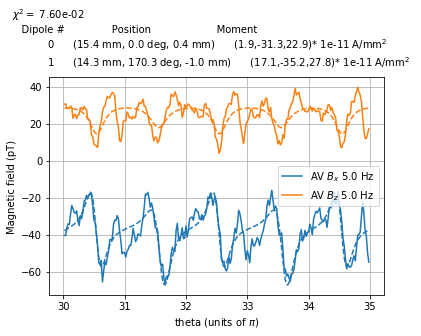

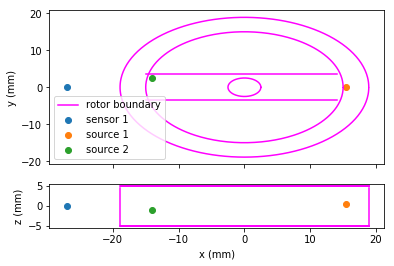

In [48]:
Opt_Settings_Exp2_5Hz_AV['plot']=1
Opt_Settings_Exp2_5Hz_AV['figname']=SaveDir+'Exp2_5Hz_'+nowtext+'_1'
chi2_one_exp_one_freq(opt_res_Exp2_5Hz_AV.x,Opt_Settings_Exp2_5Hz_AV)
# Opt_Params_Exp2 = opt_res_Exp2.x

In [49]:
Opt_Params_Exp2_low_chi_5Hz_AV = opt_res_Exp2_5Hz_AV.x
Opt_Params_Exp2_low_chi_5Hz_AV

array([ 1.54250149e+01,  3.86906138e-06,  3.92446433e-01,  1.94554332e+00,
       -3.12919871e+01,  2.28506912e+01,  1.43156590e+01,  1.70281074e+02,
       -1.04213800e+00,  1.70756024e+01, -3.52053888e+01,  2.78156441e+01,
       -3.73215323e+01,  3.01390307e+01,  8.34142257e+01])

### try 3 sources for AV

[18, 0, 0, 6, -4, 12, 17, 82, 0, 4, -20, 22, 16, 254, 3, 3, -34, 36, -37.2449631, 30, 0]
0.15999143093438864


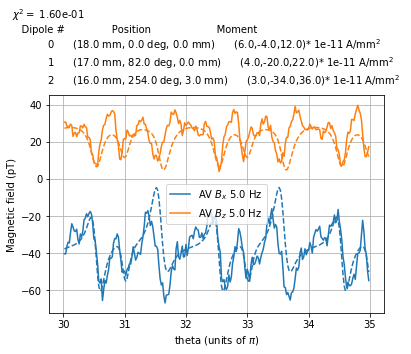

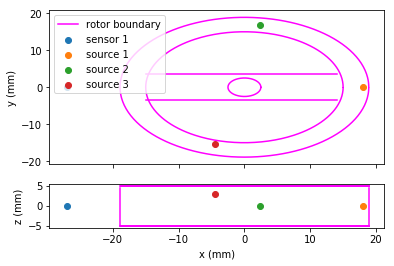

In [70]:
nu = 5
nowtext = now().strftime("%Y%m%d%H%M")
Opt_Settings_Exp2_5Hz_AV_3src = {'number of sources': 3,
                'location coordinate system': 'polar',
                'moment coordinate system':'polar',
                'location dimensions': 3,
                'moment dimensions': 3,
                'rotation sign':1, # 1 for positive, -1 for negative, 0 for unknown and making it a free parameter
                'rotation frequency':nu,
                'rotor dimensions':rtr_dims,
                'time':Exp2_Time_cut[nu],
                'number of sensors':1,
                'sensor locations':[Exp2_AV_sensor_loc],
                'sensor field order':[[0,2]] ,  # list which order of B component of each sensor (0 for x, 1 for y, 2 for z) 
                'B data':[ Exp2_AV_X_cut[nu],Exp2_AV_Z_cut[nu]],
                'plot':1,
                'saveplot':1,
                'optimize bar location':1,
                'plotlabels':['AV $B_x$', 'AV $B_z$'],
                'figname':SaveDir+'Exp2_5Hz_AVonly_3src_'+nowtext+'_0'
}
# Opt_Params_Exp2_5Hz =[   7.95825475,    40,    4.99597432,  189.10747075,
#         -58.32594041,   15.10548281,    6.80567371,    0.63247041,
#           1.75174325, -178.62354081,    3.90215557, -152.24476817,
#          -7.19618541,   15.07247243,  -37.54240099,  -30.82105149]

# Opt_Params_Exp2_5Hz_AV =[   2.62413192,   60.92049873,    1.58388672,  563.74575374,
#         305.91789706,  125.48983254,    2.64563731,   44.20279413,
#           4.96478201, -620.17314751,  191.84409201,  860.73985184,
#         -63.42837822,   19.10413722]

Opt_Params_Exp2_5Hz_AV_3src = [ 18,  0,  0,  6, -4, 12,
                                17, 82,  0,  4, -20, 22,
                                16, 172+82, 3,  3, -34, 36,
         -3.72449631e+01, 30,0]
chi_Exp2_5Hz_AV_3src = chi2_one_exp_one_freq(Opt_Params_Exp2_5Hz_AV_3src,Opt_Settings_Exp2_5Hz_AV_3src)

In [71]:
Opt_Settings_Exp2_5Hz_AV_3src['plot'] = 0
opt_res_Exp2_5Hz_AV_3src = minimize(chi2_one_exp_one_freq,Opt_Params_Exp2_5Hz_AV_3src,Opt_Settings_Exp2_5Hz_AV_3src,method = 'Nelder-Mead',options = {'maxfev': 3000,'maxiter': 3000,'adaptive':True
                                                                                                                                   })

[ 18.          0.          0.          6.         -4.         12.
  17.         82.          0.          4.        -20.         22.
  16.        254.          3.          3.        -34.         36.
 -37.2449631  30.          0.       ]
0.15999143093438864
[ 18.9         0.          0.          6.         -4.         12.
  17.         82.          0.          4.        -20.         22.
  16.        254.          3.          3.        -34.         36.
 -37.2449631  30.          0.       ]
Source 1 not in rotor
[ 1.80000000e+01  2.50000000e-04  0.00000000e+00  6.00000000e+00
 -4.00000000e+00  1.20000000e+01  1.70000000e+01  8.20000000e+01
  0.00000000e+00  4.00000000e+00 -2.00000000e+01  2.20000000e+01
  1.60000000e+01  2.54000000e+02  3.00000000e+00  3.00000000e+00
 -3.40000000e+01  3.60000000e+01 -3.72449631e+01  3.00000000e+01
  0.00000000e+00]
0.1599914060412837
[ 1.80000000e+01  0.00000000e+00  2.50000000e-04  6.00000000e+00
 -4.00000000e+00  1.20000000e+01  1.70000000e+01  8.2000000

0.13692644121597067
[ 1.78379634e+01  4.92968353e-05  4.92968353e-05  6.05915620e+00
 -4.03943747e+00  1.14611695e+01  1.69003051e+01  8.16312360e+01
  4.92968353e-05  4.03943747e+00 -2.01971873e+01  2.19974049e+01
  1.58822095e+01  2.56504279e+02  2.99367331e+00  3.02957810e+00
 -3.39636819e+01  3.58830457e+01 -3.76121749e+01  3.02957810e+01
  4.92968353e-05]
0.13543009629772468
[ 1.78225314e+01  5.39917720e-05  5.39917720e-05  6.06479013e+00
 -4.04319342e+00  1.20098524e+01  1.68908103e+01  8.15961156e+01
  5.39917720e-05  3.82414580e+00 -2.02159671e+01  2.19971578e+01
  1.58709913e+01  2.56742782e+02  2.99307077e+00  3.03239506e+00
 -3.39602231e+01  3.58719071e+01 -3.76471474e+01  3.03239506e+01
  5.39917720e-05]
0.13383120064593246
[ 1.78056296e+01  5.91338455e-05  5.91338455e-05  5.74238919e+00
 -4.04730708e+00  1.20107907e+01  1.68804113e+01  8.15576504e+01
  5.91338455e-05  4.00739778e+00 -2.02365354e+01  2.19968871e+01
  1.58587048e+01  2.57003999e+02  2.99241084e+00  3.0354803

0.09797083499132501
[ 1.77294050e+01  1.17225313e-04 -3.43000387e-05  5.93311262e+00
 -4.02805474e+00  1.25334410e+01  1.68169549e+01  8.14526554e+01
  3.98991670e-06  3.93662338e+00 -2.01944461e+01  2.19284969e+01
  1.54863140e+01  2.63693358e+02  2.98595520e+00  3.03658618e+00
 -3.38466114e+01  3.56824138e+01 -3.77832807e+01  3.05505469e+01
  2.02355007e-05]
0.09677813438908098
[ 1.77409023e+01  1.15464960e-04 -4.36038614e-05  5.92066723e+00
 -4.02337441e+00  1.19858842e+01  1.68232044e+01  8.14822303e+01
 -3.40769606e-06  4.16730056e+00 -2.01737414e+01  2.19253371e+01
  1.54788914e+01  2.63790038e+02  2.98623089e+00  3.03384983e+00
 -3.38445715e+01  3.56846250e+01 -3.77534956e+01  3.05323776e+01
  1.36466508e-05]
0.09628939214864421
[ 1.77370152e+01  1.18392255e-04 -4.82512725e-05  5.91380424e+00
 -4.02243065e+00  1.19847428e+01  1.68199851e+01  8.14768071e+01
 -6.14100406e-06  4.18364127e+00 -2.01717306e+01  2.19219171e+01
  1.54602200e+01  2.64125622e+02  2.98590518e+00  3.0339191

0.09331101866905109
[ 1.77727281e+01  1.60137873e-04  1.78363570e-05  6.04531538e+00
 -4.02340975e+00  1.14200277e+01  1.67622064e+01  8.09231656e+01
  1.65407178e-05  4.06757238e+00 -2.01289326e+01  2.17555256e+01
  1.55236226e+01  2.73433463e+02  2.98611414e+00  3.00245010e+00
 -3.37344037e+01  3.55858758e+01 -3.79541906e+01  3.06481434e+01
  2.16762251e-05]
0.08527961650020582
[ 1.77685190e+01  1.62946704e-04  3.80816507e-05  6.07714863e+00
 -4.02912709e+00  1.19149435e+01  1.67536734e+01  8.08462862e+01
  2.88318025e-05  3.80950031e+00 -2.01475721e+01  2.17462586e+01
  1.55557549e+01  2.73887660e+02  2.98618406e+00  3.00212013e+00
 -3.37319831e+01  3.55840275e+01 -3.79975429e+01  3.06664677e+01
  3.11339637e-05]
0.08602968728782764
[ 1.76553762e+01  1.73476132e-04 -5.95577169e-06  6.00426631e+00
 -4.01994424e+00  1.18943388e+01  1.66024168e+01  8.49697061e+01
  5.31535778e-06  3.97447932e+00 -2.01256239e+01  2.16807330e+01
  1.54927257e+01  2.70580029e+02  2.95339819e+00  3.0263925

0.0890225645824206
[ 1.78193675e+01  1.56775586e-04 -7.11513837e-06  5.98954784e+00
 -4.00019784e+00  1.19500739e+01  1.66942155e+01  8.12781617e+01
 -3.90024863e-05  3.99078415e+00 -2.00011454e+01  2.18128969e+01
  1.54583353e+01  2.69303637e+02  2.97611630e+00  3.02719039e+00
 -3.37462491e+01  3.55090795e+01 -3.77811743e+01  3.07902900e+01
 -1.91982879e-05]
0.08474783555119335
[ 1.77236333e+01  1.41190645e-04 -1.91373884e-05  5.99702940e+00
 -4.01362854e+00  1.19369599e+01  1.66734838e+01  8.15399595e+01
  4.17524869e-06  3.99317220e+00 -2.02391187e+01  2.16411579e+01
  1.53598289e+01  2.74394069e+02  2.92950694e+00  3.01467451e+00
 -3.35783017e+01  3.49375597e+01 -3.82449147e+01  3.13373763e+01
  8.39231446e-06]
0.08029011026641847
[ 1.77804459e+01  1.81564860e-04 -9.41040178e-05  6.26654729e+00
 -3.98280877e+00  1.19541345e+01  1.67158756e+01  8.11520948e+01
 -7.07092916e-05  3.99478635e+00 -2.01349792e+01  2.17538165e+01
  1.53862571e+01  2.71280345e+02  2.95790288e+00  3.02419768

0.07538638611410789
[ 1.78868116e+01  2.04580674e-04 -4.63141256e-05  6.03831755e+00
 -3.91360024e+00  1.19465917e+01  1.66194558e+01  8.07149762e+01
 -1.01891156e-05  4.02359210e+00 -1.98732598e+01  2.15669292e+01
  1.52592013e+01  2.67866858e+02  2.94175723e+00  3.00095658e+00
 -3.42373108e+01  3.49067527e+01 -3.85396311e+01  3.19800302e+01
  1.48407016e-04]
0.0774014087593237
[ 1.75298317e+01  3.08617750e-04 -4.63681373e-05  6.06527029e+00
 -3.95024268e+00  1.19800629e+01  1.62230319e+01  8.03942472e+01
  2.43866787e-05  4.04083188e+00 -2.02397450e+01  2.15028283e+01
  1.51664965e+01  2.74773129e+02  2.92643642e+00  3.03999594e+00
 -3.43268175e+01  3.46710780e+01 -3.89381763e+01  3.11436915e+01
 -4.26090433e-05]
0.08031596302498276
[ 1.78758699e+01  2.02776589e-04 -4.79595616e-05  6.03414296e+00
 -3.94317262e+00  1.19417541e+01  1.66699013e+01  8.07423748e+01
  1.63788874e-05  4.02226539e+00 -2.07605132e+01  2.15283383e+01
  1.52658374e+01  2.67045179e+02  2.93647931e+00  2.98576986

0.0739348328686793
[ 1.77047369e+01  2.62975781e-04 -1.43912190e-05  6.09321859e+00
 -3.95024631e+00  1.19665190e+01  1.64649169e+01  8.06107824e+01
 -3.48693362e-06  3.84291148e+00 -2.02566294e+01  2.13538327e+01
  1.52684498e+01  2.69558789e+02  2.95800735e+00  2.99488771e+00
 -3.46391535e+01  3.45569909e+01 -3.93068067e+01  3.25411189e+01
 -4.87645843e-05]
0.07411011814653738
[ 1.79210644e+01  2.71228933e-04 -8.16736651e-05  5.89805637e+00
 -3.95277340e+00  1.19801009e+01  1.70585926e+01  8.07553177e+01
 -1.81216882e-05  3.97820360e+00 -2.01481805e+01  2.13640677e+01
  1.51847012e+01  2.72034234e+02  2.92257609e+00  3.05837686e+00
 -3.41806297e+01  3.45558943e+01 -3.89432743e+01  3.20436525e+01
 -7.19057445e-05]
0.07547234023905311
[ 1.76428360e+01  2.52212978e-04 -2.87599238e-05  6.01720229e+00
 -3.97184024e+00  1.20463754e+01  1.65679212e+01  8.03429371e+01
  2.80640340e-05  3.99787222e+00 -2.03866982e+01  2.13938322e+01
  1.52476467e+01  2.70321068e+02  2.95498940e+00  3.03644815

0.07485344391135593
[ 1.76973319e+01  2.56634394e-04 -1.39262470e-04  5.92194657e+00
 -3.98337596e+00  1.18534214e+01  1.66638129e+01  7.91284453e+01
 -3.10368381e-05  3.99151880e+00 -2.01253501e+01  2.15814489e+01
  1.51668990e+01  2.71992806e+02  2.97404690e+00  2.98310447e+00
 -3.44017698e+01  3.50244118e+01 -3.92433306e+01  3.30539497e+01
 -8.89065682e-05]
0.07404729939439175
[ 1.76283049e+01  2.20919658e-04 -1.06320094e-04  5.97043931e+00
 -3.95709646e+00  1.18478921e+01  1.65402962e+01  8.11929833e+01
 -7.75102217e-05  4.01867717e+00 -2.02019804e+01  2.14953805e+01
  1.51078755e+01  2.66609283e+02  2.95152473e+00  3.11307624e+00
 -3.48094836e+01  3.49132389e+01 -3.93933747e+01  3.26061475e+01
 -1.24915062e-04]
0.07590445012499233
[ 1.74931234e+01  2.84112853e-04 -9.68574528e-05  5.87363102e+00
 -3.83099477e+00  1.18644530e+01  1.66039397e+01  8.16350681e+01
 -6.93278694e-05  3.94366511e+00 -2.05267732e+01  2.15852448e+01
  1.52022326e+01  2.73684936e+02  2.98112231e+00  3.0399456

0.07392385975969902
[ 1.73010545e+01  3.08926348e-04 -6.73456743e-05  5.98223650e+00
 -3.99284798e+00  1.18640477e+01  1.66490250e+01  8.03595198e+01
 -1.93385674e-04  3.98687347e+00 -2.06795079e+01  2.13935347e+01
  1.51543096e+01  2.73324619e+02  2.96207575e+00  2.98717302e+00
 -3.46115329e+01  3.45104330e+01 -3.88588577e+01  3.24853953e+01
  8.21042702e-06]
0.07363921357521312
[ 1.73803914e+01  3.16206815e-04 -1.67823106e-04  5.80390935e+00
 -3.97478643e+00  1.17143656e+01  1.67264304e+01  8.14463477e+01
 -4.98030024e-05  4.12935101e+00 -2.04684709e+01  2.15574135e+01
  1.49787207e+01  2.72124883e+02  2.95065201e+00  3.01309559e+00
 -3.42324933e+01  3.46058278e+01 -3.84509343e+01  3.31818604e+01
 -7.09990080e-05]
Source 3 not in rotor
[ 1.76603324e+01  2.70263363e-04 -3.53967750e-05  6.05361078e+00
 -3.95360597e+00  1.19319980e+01  1.65007193e+01  8.07251752e+01
 -9.82782399e-06  3.88212642e+00 -2.02856315e+01  2.13817039e+01
  1.52287845e+01  2.69910100e+02  2.95700037e+00  2.99738

Source 3 not in rotor
[ 1.75094772e+01  2.83595863e-04 -7.66642994e-05  5.94709227e+00
 -4.00250341e+00  1.18680318e+01  1.66157586e+01  8.14121760e+01
 -1.87742162e-05  3.97619223e+00 -2.04339851e+01  2.14222022e+01
  1.51822456e+01  2.72417515e+02  2.96407169e+00  3.00840615e+00
 -3.42325697e+01  3.45390631e+01 -3.88705410e+01  3.27777983e+01
 -1.55724597e-04]
0.07289197713088011
[ 1.77059785e+01  3.03115837e-04 -2.91821708e-05  5.90895835e+00
 -3.98541607e+00  1.18337938e+01  1.69746048e+01  8.10212024e+01
 -2.57766181e-06  3.97662257e+00 -2.02653133e+01  2.13266933e+01
  1.51358629e+01  2.71184864e+02  2.91506624e+00  3.03236455e+00
 -3.42957851e+01  3.42444704e+01 -3.91623203e+01  3.23268994e+01
 -6.55043781e-05]
0.07317334290576077
[ 1.76359981e+01  2.69654158e-04  1.45788808e-06  5.95078681e+00
 -3.98504054e+00  1.18979288e+01  1.66931818e+01  8.01664840e+01
  5.74247172e-05  3.98347603e+00 -2.03595590e+01  2.14241165e+01
  1.51559351e+01  2.70197909e+02  2.91528255e+00  3.04724

0.07139950362316709
[ 1.73145645e+01  2.92701484e-04 -4.59636787e-05  5.83477919e+00
 -4.00770922e+00  1.21805150e+01  1.68497687e+01  8.12560542e+01
  5.17471079e-05  3.86524180e+00 -2.04664815e+01  2.14005777e+01
  1.50499517e+01  2.69385910e+02  2.87430872e+00  2.99195780e+00
 -3.49953120e+01  3.40791682e+01 -3.92054257e+01  3.30069079e+01
 -8.63424353e-05]
0.07129856281402497
[ 1.74913965e+01  3.17050639e-04 -4.26603099e-05  5.83856455e+00
 -4.01359804e+00  1.16836938e+01  1.68919475e+01  8.12137671e+01
  2.28814568e-05  4.02100425e+00 -2.04560061e+01  2.13233205e+01
  1.49900331e+01  2.71162958e+02  2.89059070e+00  3.00256654e+00
 -3.46494921e+01  3.39110272e+01 -3.88401593e+01  3.33069136e+01
 -6.53257004e-05]
Source 3 not in rotor
[ 1.76078748e+01  2.82913021e-04 -4.01270409e-05  5.99705015e+00
 -3.96835539e+00  1.18651131e+01  1.65910108e+01  8.08829661e+01
 -2.75035641e-06  3.92456844e+00 -2.03261949e+01  2.13786381e+01
  1.51670154e+01  2.70260254e+02  2.94353376e+00  3.00071

0.07212274461934123
[ 1.76480607e+01  3.08826611e-04 -6.55203621e-05  5.92589809e+00
 -3.96084188e+00  1.18652320e+01  1.65695815e+01  8.19012593e+01
  9.63541057e-05  3.94668752e+00 -2.01356255e+01  2.13664036e+01
  1.50240251e+01  2.68203975e+02  2.89395437e+00  3.03038627e+00
 -3.46124974e+01  3.40085952e+01 -3.91049729e+01  3.35346151e+01
 -9.56787762e-05]
0.07284659270051841
[ 1.74611155e+01  3.23082734e-04 -3.95565476e-05  5.92330436e+00
 -3.98594933e+00  1.18380687e+01  1.68195919e+01  8.03094641e+01
 -7.75482491e-05  3.94192472e+00 -2.05964502e+01  2.12974597e+01
  1.51136387e+01  2.71931194e+02  2.90334580e+00  2.99804171e+00
 -3.49257566e+01  3.40864389e+01 -3.89547010e+01  3.31198103e+01
 -2.67027814e-05]
0.07160454422366867
[ 1.74110425e+01  3.51916136e-04 -6.42966016e-05  5.89124378e+00
 -3.96205165e+00  1.17514920e+01  1.67619463e+01  8.15345146e+01
 -6.44430239e-05  3.90530771e+00 -2.04359893e+01  2.12620025e+01
  1.50232151e+01  2.70649379e+02  2.89355450e+00  2.9843500

0.0712712604664283
[ 1.74459755e+01  3.35905949e-04 -5.31994392e-05  5.98326137e+00
 -4.04529042e+00  1.18092238e+01  1.66581500e+01  8.10228136e+01
 -2.28829066e-05  3.94488850e+00 -2.05141435e+01  2.14950946e+01
  1.50070871e+01  2.69316598e+02  2.84145947e+00  2.99273085e+00
 -3.50776731e+01  3.37614578e+01 -3.89960836e+01  3.31587207e+01
 -3.47266278e-05]
0.07074415371885281
[ 1.76063320e+01  3.09981245e-04 -6.96182124e-05  5.92928863e+00
 -4.02326556e+00  1.17448237e+01  1.67675846e+01  8.00672850e+01
  1.96721211e-05  3.93864176e+00 -2.04854714e+01  2.15626326e+01
  1.50509538e+01  2.71985038e+02  2.84671975e+00  2.99095074e+00
 -3.47920857e+01  3.39809172e+01 -3.92402764e+01  3.34185973e+01
 -5.24800168e-05]
0.07144941960643635
[ 1.75832343e+01  3.16101847e-04 -6.40820157e-05  5.93586197e+00
 -3.99055853e+00  1.17778073e+01  1.66304088e+01  8.16185206e+01
  7.61199411e-05  3.92739989e+00 -2.03947908e+01  2.16165627e+01
  1.50053165e+01  2.69485584e+02  2.83577708e+00  3.01616720

0.07050775037372287
[ 1.77290633e+01  3.64886709e-04 -8.31130279e-05  6.04181760e+00
 -4.00185945e+00  1.14036170e+01  1.66888630e+01  8.08620759e+01
 -1.45123038e-05  3.97866763e+00 -2.05752315e+01  2.15698092e+01
  1.50698632e+01  2.72068517e+02  2.82073199e+00  3.01164740e+00
 -3.47158129e+01  3.37135971e+01 -3.89262790e+01  3.37025264e+01
 -8.16154977e-06]
0.07117368259001734
[ 1.75712800e+01  3.19263560e-04 -6.90141409e-05  5.98419675e+00
 -3.99766081e+00  1.18716368e+01  1.68485267e+01  8.12750416e+01
  3.75556365e-06  3.91482641e+00 -2.05727739e+01  2.16013255e+01
  1.49899741e+01  2.70953669e+02  2.78124090e+00  2.99824584e+00
 -3.54014743e+01  3.38478146e+01 -3.90593861e+01  3.33454056e+01
 -4.69210585e-05]
Source 3 not in rotor
[ 1.75051590e+01  3.37708611e-04 -6.30180567e-05  5.91618150e+00
 -4.00920322e+00  1.17111006e+01  1.67117004e+01  8.09036500e+01
  2.58080778e-05  3.93085264e+00 -2.04911320e+01  2.14159259e+01
  1.51061909e+01  2.70680427e+02  2.88866697e+00  3.00485

0.07111520839490025
[ 1.75571584e+01  3.21657430e-04 -6.08012112e-05  5.92635744e+00
 -4.00270909e+00  1.17709376e+01  1.66768421e+01  8.14942694e+01
  6.75122614e-05  3.91802137e+00 -2.04444522e+01  2.16448830e+01
  1.50294497e+01  2.69672442e+02  2.81824734e+00  3.00904246e+00
 -3.48408165e+01  3.38914978e+01 -3.90829802e+01  3.34711827e+01
 -5.74554892e-05]
0.07071103678803228
[ 1.76433177e+01  3.41463185e-04 -3.89348331e-06  5.92655989e+00
 -4.04897198e+00  1.15797906e+01  1.67177759e+01  8.14114910e+01
  4.43614638e-05  3.89829115e+00 -2.06279984e+01  2.15299814e+01
  1.50528548e+01  2.72047404e+02  2.81726192e+00  2.99960025e+00
 -3.49879440e+01  3.37070854e+01 -3.86402177e+01  3.34511142e+01
 -7.37043167e-05]
0.07079780713965575
[ 1.76355668e+01  3.21525714e-04 -5.41955151e-05  5.91829438e+00
 -4.03643010e+00  1.17737389e+01  1.68323617e+01  8.12647699e+01
  3.40915482e-05  3.92795777e+00 -2.05661814e+01  2.16873611e+01
  1.50617876e+01  2.71463698e+02  2.80156394e+00  3.0099882

0.07020170420483174
[ 1.75090647e+01  3.48076616e-04 -2.73313593e-07  5.90811376e+00
 -3.99847207e+00  1.16309526e+01  1.68637842e+01  8.09369310e+01
  6.04774568e-05  3.85126606e+00 -2.07306151e+01  2.17542910e+01
  1.50543980e+01  2.69497291e+02  2.79500641e+00  3.01037320e+00
 -3.55361031e+01  3.32458188e+01 -3.86565426e+01  3.38324457e+01
 -8.54151313e-05]
0.07023337521140056
[ 1.76090236e+01  3.38361144e-04  2.05080453e-05  5.96186347e+00
 -4.04783669e+00  1.15425347e+01  1.68623036e+01  8.10985661e+01
  1.14427831e-04  3.81036346e+00 -2.07606408e+01  2.19064412e+01
  1.51106875e+01  2.70022406e+02  2.74963849e+00  2.99659108e+00
 -3.53677711e+01  3.34538095e+01 -3.87440079e+01  3.32773330e+01
 -8.03809362e-05]
0.06970949608206459
[ 1.76138027e+01  3.38523598e-04  2.44116060e-05  5.96606600e+00
 -4.05085701e+00  1.15290040e+01  1.68638049e+01  8.11008719e+01
  1.20398533e-04  3.80363088e+00 -2.07703573e+01  2.19238430e+01
  1.51154643e+01  2.69999185e+02  2.74512179e+00  2.9953868

0.06958897993377469
[ 1.73372096e+01  3.18903437e-04 -6.51730657e-05  5.89395169e+00
 -4.06685140e+00  1.20189717e+01  1.68446127e+01  8.14509336e+01
  7.49787580e-05  3.81302919e+00 -2.07425775e+01  2.20038460e+01
  1.50482893e+01  2.69586956e+02  2.70279426e+00  2.98624608e+00
 -3.55888793e+01  3.40770985e+01 -3.87879503e+01  3.32119316e+01
 -6.76856721e-05]
0.06976672268056798
[ 1.73032063e+01  3.60859510e-04  5.27288066e-05  5.95075777e+00
 -4.05220755e+00  1.16046828e+01  1.68769293e+01  8.05774803e+01
  4.85708111e-05  3.87251221e+00 -2.08175250e+01  2.23569948e+01
  1.50420330e+01  2.69606106e+02  2.69550376e+00  2.97461230e+00
 -3.53384645e+01  3.37854401e+01 -3.90251450e+01  3.34942423e+01
 -8.42498743e-05]
0.06989891617946148
[ 1.73993744e+01  3.67858800e-04 -3.30949436e-05  5.86088487e+00
 -4.04724232e+00  1.17159788e+01  1.67805721e+01  8.09433614e+01
  7.52197591e-05  3.81802256e+00 -2.09252658e+01  2.21867486e+01
  1.50856674e+01  2.69774474e+02  2.70398803e+00  3.0015707

0.06947755715553408
[ 1.73293549e+01  3.80932246e-04 -4.60976809e-05  5.86218813e+00
 -4.07133763e+00  1.18342057e+01  1.67991127e+01  8.11698735e+01
  1.26767431e-04  3.79332742e+00 -2.07523793e+01  2.21550511e+01
  1.50543938e+01  2.70894689e+02  2.63452118e+00  2.97979911e+00
 -3.58894163e+01  3.37323613e+01 -3.89393359e+01  3.35355467e+01
 -6.05563464e-05]
0.06937598820183369
[ 1.74577340e+01  3.61584839e-04 -2.96986554e-05  5.91266163e+00
 -4.05184177e+00  1.17890413e+01  1.68372640e+01  8.12804658e+01
  9.97128796e-05  3.78540313e+00 -2.09449362e+01  2.21627967e+01
  1.50144326e+01  2.70253229e+02  2.65971989e+00  2.99052788e+00
 -3.59222499e+01  3.33795010e+01 -3.88039533e+01  3.34663228e+01
 -4.97835509e-05]
0.06894168877926485
[ 1.74576116e+01  3.62402163e-04 -2.86855138e-05  5.91479811e+00
 -4.05218781e+00  1.17900952e+01  1.68387314e+01  8.12867979e+01
  1.01511663e-04  3.78127633e+00 -2.09585119e+01  2.21753337e+01
  1.50103916e+01  2.70275032e+02  2.65648497e+00  2.9909656

0.06886471784675743
[ 1.75779111e+01  3.58319299e-04 -8.16292751e-05  5.91530469e+00
 -4.06296747e+00  1.16028467e+01  1.67663151e+01  8.10338334e+01
  1.20188644e-04  3.80879369e+00 -2.09614331e+01  2.22049713e+01
  1.50815919e+01  2.70252793e+02  2.62822283e+00  2.99531157e+00
 -3.60345529e+01  3.36664750e+01 -3.85444477e+01  3.34015998e+01
 -1.64539791e-05]
0.06889952865335862
[ 1.75109061e+01  3.87523215e-04 -6.83972153e-05  5.92495257e+00
 -4.10181067e+00  1.16954881e+01  1.67406083e+01  8.10807590e+01
  1.56319573e-04  3.80359948e+00 -2.08788160e+01  2.20337759e+01
  1.50362668e+01  2.68744243e+02  2.61028991e+00  2.97908164e+00
 -3.56622624e+01  3.38851308e+01 -3.86056810e+01  3.37176046e+01
 -1.66696691e-05]
0.06894597416281548
[ 1.73838681e+01  3.71830209e-04  1.98074548e-05  5.84317629e+00
 -4.06301300e+00  1.16520588e+01  1.67669600e+01  8.13662923e+01
  9.94486630e-05  3.79746500e+00 -2.09478451e+01  2.25106545e+01
  1.50577012e+01  2.68429731e+02  2.60144772e+00  2.9744857

0.06838987745381751
[ 1.75282762e+01  3.73712768e-04 -1.22420274e-04  5.90721817e+00
 -4.10354886e+00  1.18636846e+01  1.67824567e+01  8.09842220e+01
  1.70803608e-04  3.76452640e+00 -2.10600636e+01  2.21463079e+01
  1.50779481e+01  2.71407244e+02  2.57732094e+00  2.97752269e+00
 -3.63587112e+01  3.34909985e+01 -3.85440616e+01  3.34621452e+01
 -1.39990641e-05]
0.06900532215085207
[ 1.75085060e+01  3.73455037e-04 -1.02948621e-04  5.89845053e+00
 -4.09799930e+00  1.18347120e+01  1.67803352e+01  8.10365292e+01
  1.61034777e-04  3.76903585e+00 -2.10447003e+01  2.21961887e+01
  1.50751762e+01  2.70999609e+02  2.58062401e+00  2.97710692e+00
 -3.63049694e+01  3.34943434e+01 -3.85834413e+01  3.34793402e+01
 -1.58577288e-05]
0.0687925718646332
[ 1.74010096e+01  3.56679936e-04 -3.75062142e-05  5.82291788e+00
 -4.06438820e+00  1.18335147e+01  1.68125919e+01  8.12655429e+01
  1.14381766e-04  3.75510015e+00 -2.11448911e+01  2.26386544e+01
  1.51030882e+01  2.71307529e+02  2.56565343e+00  2.97273875

0.06811348542508068
[ 1.74240872e+01  3.78421101e-04 -1.06576444e-04  5.89505406e+00
 -4.09604678e+00  1.18952873e+01  1.66510163e+01  8.15639777e+01
  2.01533539e-04  3.75495958e+00 -2.12829831e+01  2.25290562e+01
  1.50636569e+01  2.68730683e+02  2.52200134e+00  2.94217095e+00
 -3.62300915e+01  3.38391468e+01 -3.86478186e+01  3.33267649e+01
 -3.23505253e-05]
0.06820544596300045
[ 1.76004662e+01  3.74223951e-04 -1.31872704e-04  5.80386955e+00
 -4.08279136e+00  1.18939981e+01  1.67426496e+01  8.18462009e+01
  1.59330172e-04  3.73223215e+00 -2.10004222e+01  2.22667338e+01
  1.50599713e+01  2.70183386e+02  2.55188610e+00  2.97973033e+00
 -3.64911545e+01  3.32343387e+01 -3.86120743e+01  3.37089354e+01
  9.09841735e-06]
0.06838620955824219
[ 1.74887717e+01  3.80192799e-04 -2.41973396e-05  5.87565849e+00
 -4.11231840e+00  1.16766493e+01  1.67817617e+01  8.11616246e+01
  2.03505554e-04  3.75298462e+00 -2.10374449e+01  2.24395587e+01
  1.50106263e+01  2.69205370e+02  2.49722275e+00  2.9497454

0.0679299290138296
[ 1.74690968e+01  3.99777065e-04 -7.37557303e-06  5.87877779e+00
 -4.10794820e+00  1.17957686e+01  1.68375195e+01  8.11533861e+01
  1.84357297e-04  3.70630046e+00 -2.12276065e+01  2.24876324e+01
  1.49902566e+01  2.69067499e+02  2.48366698e+00  2.96395724e+00
 -3.66084923e+01  3.31022628e+01 -3.88354707e+01  3.36042735e+01
 -1.97177046e-05]
Source 3 not in rotor
[ 1.74697274e+01  3.84215641e-04 -8.39975167e-05  5.83445897e+00
 -4.12102989e+00  1.17512103e+01  1.67156841e+01  8.10621251e+01
  1.93600019e-04  3.76028614e+00 -2.10951440e+01  2.24813287e+01
  1.51106453e+01  2.69341391e+02  2.49815668e+00  2.96147063e+00
 -3.66198058e+01  3.36003447e+01 -3.86345868e+01  3.35563029e+01
  1.18382014e-05]
0.06806975076880613
[ 1.74827590e+01  3.93756419e-04 -3.05350686e-05  5.80167378e+00
 -4.12108322e+00  1.17815327e+01  1.66864571e+01  8.09228400e+01
  2.22449963e-04  3.69983429e+00 -2.11717201e+01  2.29233817e+01
  1.51266236e+01  2.68744069e+02  2.40947224e+00  2.929780

0.06751036511419026
[ 1.73625826e+01  4.11404495e-04  1.07044741e-05  5.91670679e+00
 -4.14791952e+00  1.16062958e+01  1.67364553e+01  8.07964104e+01
  2.56436942e-04  3.71363077e+00 -2.13344583e+01  2.28048036e+01
  1.50706229e+01  2.68347007e+02  2.36793895e+00  2.94165017e+00
 -3.68835041e+01  3.38925863e+01 -3.85139355e+01  3.34631677e+01
  2.23403137e-05]
0.06744286531671198
[ 1.74614014e+01  4.00915527e-04 -8.01260483e-05  5.86778388e+00
 -4.17286918e+00  1.18146734e+01  1.66323651e+01  8.14031620e+01
  2.15799493e-04  3.71490892e+00 -2.11810676e+01  2.25010359e+01
  1.50451416e+01  2.68588285e+02  2.39630926e+00  2.93549078e+00
 -3.72707787e+01  3.34715633e+01 -3.86451667e+01  3.33298285e+01
  8.33274874e-05]
0.0672847227922523
[ 1.74405221e+01  4.15625935e-04 -9.24474411e-05  5.81408886e+00
 -4.16093140e+00  1.18434305e+01  1.66773125e+01  8.13905510e+01
  2.47426207e-04  3.65468143e+00 -2.13719062e+01  2.28030098e+01
  1.51376902e+01  2.68752263e+02  2.35084959e+00  2.95495522

0.06702800980502531
[ 1.76329704e+01  4.14222361e-04 -1.38563179e-04  5.75943025e+00
 -4.17935367e+00  1.18759923e+01  1.67147933e+01  8.16239090e+01
  2.76295448e-04  3.64395277e+00 -2.11710022e+01  2.25466583e+01
  1.50589925e+01  2.69346228e+02  2.34659727e+00  2.93834374e+00
 -3.74178360e+01  3.30623317e+01 -3.86595944e+01  3.37722564e+01
  8.21641514e-05]
0.06683762011711324
[ 1.74368754e+01  4.02135503e-04 -5.43003683e-05  5.82973418e+00
 -4.17071045e+00  1.18443604e+01  1.67280754e+01  8.13644516e+01
  2.66738103e-04  3.67173573e+00 -2.13199712e+01  2.30375500e+01
  1.50475615e+01  2.68953530e+02  2.28614380e+00  2.93760069e+00
 -3.75847761e+01  3.34516807e+01 -3.86313814e+01  3.33826456e+01
  3.80305890e-05]
0.06667142086173593
[ 1.74307677e+01  4.01156938e-04 -5.31141510e-05  5.82930057e+00
 -4.17128978e+00  1.18532047e+01  1.67283435e+01  8.13767939e+01
  2.66730868e-04  3.67123721e+00 -2.13264350e+01  2.30710452e+01
  1.50460145e+01  2.68961201e+02  2.27970875e+00  2.9373892

0.0666252343332461
[ 1.75054285e+01  4.36139019e-04 -7.16099494e-05  5.82848582e+00
 -4.24188027e+00  1.17586398e+01  1.66413390e+01  8.15118011e+01
  3.07843693e-04  3.61055497e+00 -2.13890808e+01  2.30736483e+01
  1.50746740e+01  2.68908104e+02  2.20819340e+00  2.91990514e+00
 -3.75727668e+01  3.35538998e+01 -3.85388156e+01  3.38091160e+01
  4.16999789e-05]
0.06608986613243849
[ 1.75083284e+01  4.36684894e-04 -7.01680771e-05  5.82922394e+00
 -4.24751522e+00  1.17554813e+01  1.66371513e+01  8.15215243e+01
  3.07963077e-04  3.60850791e+00 -2.13933842e+01  2.31002763e+01
  1.50756371e+01  2.68913996e+02  2.20210713e+00  2.91885941e+00
 -3.75775156e+01  3.35520108e+01 -3.85331537e+01  3.38188978e+01
  3.91449571e-05]
0.06605789974396314
[ 1.74073968e+01  4.50218545e-04 -1.67722565e-04  5.77686024e+00
 -4.17820334e+00  1.20195781e+01  1.66325690e+01  8.14755328e+01
  3.02226668e-04  3.64717281e+00 -2.15016648e+01  2.26825049e+01
  1.50186245e+01  2.68620952e+02  2.24168827e+00  2.91939366

0.06569816336249973
[ 1.74218387e+01  4.43484578e-04 -9.47225825e-05  5.83244756e+00
 -4.20172545e+00  1.18067279e+01  1.66298207e+01  8.16851795e+01
  3.59472368e-04  3.60624084e+00 -2.14456440e+01  2.30111940e+01
  1.50742976e+01  2.69586336e+02  2.15632742e+00  2.90565994e+00
 -3.74733987e+01  3.43027803e+01 -3.87180860e+01  3.35721520e+01
  9.17576202e-05]
0.06624340841469038
[ 1.74223188e+01  4.44386179e-04 -1.75794414e-04  5.78481761e+00
 -4.22889864e+00  1.20118070e+01  1.65824793e+01  8.17776645e+01
  3.62289590e-04  3.55978039e+00 -2.14939060e+01  2.29731768e+01
  1.50896509e+01  2.69205904e+02  2.11731783e+00  2.91791921e+00
 -3.82901190e+01  3.39565986e+01 -3.84894098e+01  3.37033087e+01
  1.07755734e-04]
0.06603137319666451
[ 1.74378131e+01  4.69734624e-04 -9.31967823e-05  5.82293656e+00
 -4.20023347e+00  1.18729900e+01  1.66651454e+01  8.17237358e+01
  3.51566935e-04  3.55360570e+00 -2.15500220e+01  2.29615205e+01
  1.50239954e+01  2.68817123e+02  2.14617905e+00  2.9221214

0.06560939144159468
[ 1.74779282e+01  4.62731333e-04 -8.33824406e-05  5.83261330e+00
 -4.22729829e+00  1.17128900e+01  1.66209009e+01  8.15048996e+01
  4.21339238e-04  3.56258274e+00 -2.15967285e+01  2.30758738e+01
  1.50823729e+01  2.69260784e+02  2.07402234e+00  2.89414245e+00
 -3.77610771e+01  3.42193069e+01 -3.87502777e+01  3.36546383e+01
  9.06558765e-05]
0.06557797612342484
[ 1.75113823e+01  4.56486570e-04 -1.20128075e-04  5.87202711e+00
 -4.26665653e+00  1.17868779e+01  1.65439904e+01  8.16143693e+01
  3.66494156e-04  3.58136025e+00 -2.15204307e+01  2.29949500e+01
  1.50563137e+01  2.67519637e+02  2.07906150e+00  2.89860097e+00
 -3.81870317e+01  3.39355255e+01 -3.87075737e+01  3.35098504e+01
  1.20180399e-04]
0.0655195430199773
[ 1.73239649e+01  4.73712249e-04 -5.86105013e-05  5.80885662e+00
 -4.29898958e+00  1.18936312e+01  1.66400188e+01  8.15268953e+01
  4.45078044e-04  3.53472226e+00 -2.15455451e+01  2.33235132e+01
  1.50537735e+01  2.67771761e+02  2.00823652e+00  2.88525440

0.06458067981461087
[ 1.73739391e+01  4.87712600e-04 -9.36513975e-05  5.89378314e+00
 -4.28998485e+00  1.17280615e+01  1.65906060e+01  8.14333701e+01
  4.62273620e-04  3.50788027e+00 -2.18620575e+01  2.35917454e+01
  1.50754793e+01  2.67550576e+02  1.92921770e+00  2.89375525e+00
 -3.83601056e+01  3.43159071e+01 -3.85488445e+01  3.36710091e+01
  6.16965967e-05]
0.06460097107952459
[ 1.75926630e+01  4.74349803e-04 -1.23436711e-04  5.84297684e+00
 -4.29501784e+00  1.17013395e+01  1.66628737e+01  8.15329817e+01
  4.60797214e-04  3.50915380e+00 -2.16106566e+01  2.31987134e+01
  1.50098407e+01  2.68090445e+02  1.96576956e+00  2.88870858e+00
 -3.85376307e+01  3.38687800e+01 -3.84228357e+01  3.37527437e+01
  1.51283752e-04]
0.06443822147827771
[ 1.76024322e+01  4.74078629e-04 -1.24158501e-04  5.84441899e+00
 -4.29693104e+00  1.16943226e+01  1.66663996e+01  8.15363610e+01
  4.64474386e-04  3.50744405e+00 -2.16068508e+01  2.31890000e+01
  1.50038666e+01  2.68090681e+02  1.96117317e+00  2.8871577

0.063933639945205
[ 1.74911857e+01  5.01651895e-04 -1.05048185e-04  5.79700091e+00
 -4.33700213e+00  1.17417071e+01  1.65701032e+01  8.15726011e+01
  5.16350132e-04  3.45869504e+00 -2.19004143e+01  2.37093471e+01
  1.51155327e+01  2.67268253e+02  1.79008996e+00  2.88812499e+00
 -3.87684226e+01  3.41819822e+01 -3.83169135e+01  3.38642517e+01
  1.66416988e-04]
0.0638800720471231
[ 1.74904948e+01  5.01961802e-04 -1.03957627e-04  5.79435935e+00
 -4.33957015e+00  1.17370444e+01  1.65658084e+01  8.15793425e+01
  5.20032305e-04  3.45683038e+00 -2.19173929e+01  2.37359285e+01
  1.51192431e+01  2.67249482e+02  1.77952578e+00  2.88801317e+00
 -3.87965023e+01  3.41926361e+01 -3.82942810e+01  3.38638993e+01
  1.72673304e-04]
0.06384621920801975
[ 1.75760469e+01  4.95174931e-04 -1.27162409e-04  5.92318530e+00
 -4.31749538e+00  1.17236052e+01  1.65556236e+01  8.19135433e+01
  4.65543283e-04  3.46414985e+00 -2.17195541e+01  2.32374830e+01
  1.50783893e+01  2.68444576e+02  1.88871044e+00  2.90985704e+

0.06329420411947052
[ 1.73447490e+01  5.30121678e-04 -7.32522567e-05  5.81447367e+00
 -4.41590977e+00  1.18981637e+01  1.65965965e+01  8.19738176e+01
  5.93001096e-04  3.37589593e+00 -2.18690208e+01  2.37804682e+01
  1.50261369e+01  2.67692007e+02  1.69006971e+00  2.85753154e+00
 -3.91130917e+01  3.41759761e+01 -3.85695094e+01  3.39022560e+01
  1.31654024e-04]
0.06327222977988553
[ 1.74994784e+01  5.49212662e-04 -1.51185018e-04  5.82041113e+00
 -4.34247197e+00  1.17781709e+01  1.66060079e+01  8.15487543e+01
  6.17491067e-04  3.35845037e+00 -2.20269547e+01  2.34885885e+01
  1.50402105e+01  2.67444244e+02  1.69082460e+00  2.87704562e+00
 -3.94318731e+01  3.40626519e+01 -3.86145696e+01  3.39387101e+01
  1.75257910e-04]
0.06307501066191631
[ 1.74979049e+01  5.52170776e-04 -1.54652988e-04  5.81952109e+00
 -4.34134529e+00  1.17794735e+01  1.66055826e+01  8.15417612e+01
  6.26388516e-04  3.35229609e+00 -2.20449701e+01  2.34758835e+01
  1.50382246e+01  2.67434320e+02  1.68167821e+00  2.8764994

0.062419725329741584
[ 1.75875307e+01  5.61020685e-04 -9.77469827e-05  5.78187034e+00
 -4.42813014e+00  1.17545780e+01  1.65818058e+01  8.18955434e+01
  6.72087417e-04  3.30137442e+00 -2.22245554e+01  2.37570402e+01
  1.50746123e+01  2.67178926e+02  1.59383494e+00  2.89102720e+00
 -3.95897181e+01  3.35785933e+01 -3.84739719e+01  3.39582300e+01
  1.12391728e-04]
0.06238310379571664
[ 1.75221082e+01  5.50491473e-04 -8.54512026e-05  5.82184773e+00
 -4.42719586e+00  1.17690441e+01  1.66169912e+01  8.16933621e+01
  6.63089171e-04  3.33065161e+00 -2.19876951e+01  2.40164674e+01
  1.50776898e+01  2.66630546e+02  1.53146055e+00  2.84114080e+00
 -3.89765711e+01  3.48942439e+01 -3.86844618e+01  3.39734042e+01
  1.26481104e-04]
0.062441799127065475
[ 1.76319913e+01  5.31223063e-04 -1.07847361e-04  5.84492801e+00
 -4.43669765e+00  1.17262954e+01  1.66687416e+01  8.17115431e+01
  6.19947835e-04  3.35342676e+00 -2.18487497e+01  2.37116572e+01
  1.49802538e+01  2.66671884e+02  1.59024260e+00  2.85417

0.06169323438842956
[ 1.76406164e+01  5.72200136e-04 -1.64314478e-04  5.83584190e+00
 -4.50168138e+00  1.17936879e+01  1.65236214e+01  8.18002393e+01
  7.67074657e-04  3.21355411e+00 -2.21859587e+01  2.42365893e+01
  1.50965904e+01  2.66090338e+02  1.40139425e+00  2.84336200e+00
 -3.97108700e+01  3.45615186e+01 -3.84306128e+01  3.41898923e+01
  1.32822989e-04]
0.061653061042192744
[ 1.73413051e+01  5.80949690e-04 -1.41514876e-04  5.80599479e+00
 -4.47456111e+00  1.18873160e+01  1.65788048e+01  8.22431617e+01
  6.38851124e-04  3.24453877e+00 -2.22117326e+01  2.45612756e+01
  1.50557842e+01  2.67168454e+02  1.43541816e+00  2.87315384e+00
 -3.94183046e+01  3.43742191e+01 -3.84511333e+01  3.41393977e+01
  1.01042197e-04]
0.062012651543230005
[ 1.75660206e+01  5.81473155e-04 -1.51268006e-04  5.87219911e+00
 -4.47295263e+00  1.18154899e+01  1.65661555e+01  8.16107279e+01
  6.12517554e-04  3.33742832e+00 -2.19818443e+01  2.40972339e+01
  1.50214119e+01  2.67543555e+02  1.45904542e+00  2.87983

0.06116562183511324
[ 1.74098129e+01  6.33648395e-04 -1.46943016e-04  5.85208548e+00
 -4.54067127e+00  1.19267213e+01  1.64285878e+01  8.21497668e+01
  7.16606603e-04  3.22626705e+00 -2.23291394e+01  2.48409752e+01
  1.51013824e+01  2.65509283e+02  1.24372662e+00  2.85484799e+00
 -3.93743661e+01  3.50543515e+01 -3.84039156e+01  3.43412406e+01
  9.79163185e-05]
0.06113643518843553
[ 1.74524302e+01  6.19860904e-04 -1.58192606e-04  5.85721934e+00
 -4.56415620e+00  1.17546963e+01  1.65729207e+01  8.23273217e+01
  7.11660284e-04  3.19323060e+00 -2.22937131e+01  2.47087180e+01
  1.50900054e+01  2.66570120e+02  1.25958029e+00  2.82882886e+00
 -4.00155548e+01  3.47413012e+01 -3.85056301e+01  3.43792149e+01
  1.42388876e-04]
0.06142040261806514
[ 1.74525340e+01  6.26843679e-04 -1.58295931e-04  5.83841442e+00
 -4.48255106e+00  1.18051407e+01  1.65321570e+01  8.17808169e+01
  7.71123186e-04  3.21457877e+00 -2.23561074e+01  2.42890310e+01
  1.50295110e+01  2.66274494e+02  1.28461930e+00  2.8559524

0.06043202394453183
[ 1.76696054e+01  6.28921463e-04 -1.28593131e-04  5.80517887e+00
 -4.60497461e+00  1.16760121e+01  1.64440855e+01  8.21807429e+01
  8.51148598e-04  3.14706082e+00 -2.25771190e+01  2.45815076e+01
  1.51069834e+01  2.65682545e+02  1.16148027e+00  2.85416903e+00
 -4.03319807e+01  3.43502956e+01 -3.81998211e+01  3.41437103e+01
  1.82287965e-04]
0.06040214861289258
[ 1.75957775e+01  6.22133099e-04 -1.80610985e-04  5.87849687e+00
 -4.56765224e+00  1.17747389e+01  1.64787810e+01  8.17251227e+01
  7.09517843e-04  3.25240510e+00 -2.21836299e+01  2.44955560e+01
  1.50457992e+01  2.67176744e+02  1.23472355e+00  2.86142094e+00
 -3.94173593e+01  3.51226689e+01 -3.84520176e+01  3.43373652e+01
  1.70967193e-04]
0.06094621218753874
[ 1.75099991e+01  6.61611915e-04 -1.98837785e-04  5.84663316e+00
 -4.57121938e+00  1.19586527e+01  1.64693704e+01  8.23905994e+01
  7.73194857e-04  3.11333389e+00 -2.23759923e+01  2.45075134e+01
  1.50402112e+01  2.65778656e+02  1.09524149e+00  2.8360320

0.05961120898577154
[ 1.75782631e+01  6.67124119e-04 -1.79310208e-04  5.91062794e+00
 -4.58639458e+00  1.17670029e+01  1.64178086e+01  8.24817239e+01
  8.79765291e-04  3.13428494e+00 -2.26574362e+01  2.44895028e+01
  1.50492969e+01  2.65821808e+02  1.05416712e+00  2.83005037e+00
 -3.96909349e+01  3.57504154e+01 -3.83500550e+01  3.40396258e+01
  1.78465800e-04]
0.059801138230508796
[ 1.76053415e+01  6.57847144e-04 -4.65098935e-05  5.84229909e+00
 -4.57673910e+00  1.16575726e+01  1.64575610e+01  8.17787791e+01
  8.32423975e-04  3.12359003e+00 -2.25393001e+01  2.51536458e+01
  1.51032579e+01  2.65909036e+02  1.00252519e+00  2.82196178e+00
 -4.00097460e+01  3.52693336e+01 -3.81489810e+01  3.43509913e+01
  2.25896280e-04]
0.059731003232963736
[ 1.75107249e+01  7.02532261e-04 -1.88138964e-04  5.88353924e+00
 -4.63025853e+00  1.17922495e+01  1.64066351e+01  8.21411990e+01
  8.24029865e-04  3.10827674e+00 -2.25874794e+01  2.50329440e+01
  1.50352051e+01  2.65429292e+02  9.84946473e-01  2.85070

0.059019688034670066
[ 1.76346679e+01  6.73156435e-04 -1.69961425e-04  5.85903554e+00
 -4.65319847e+00  1.17495502e+01  1.64400900e+01  8.23882654e+01
  9.24381181e-04  3.08869847e+00 -2.26787930e+01  2.54703177e+01
  1.50624496e+01  2.65889951e+02  8.74522225e-01  2.82820504e+00
 -4.01342673e+01  3.57393529e+01 -3.78799033e+01  3.43952558e+01
  1.76853662e-04]
0.059059325672433036
[ 1.75674181e+01  7.09289211e-04 -1.49093272e-04  5.88042901e+00
 -4.70271502e+00  1.17124142e+01  1.64521598e+01  8.18617802e+01
  9.41005818e-04  3.03727908e+00 -2.28098992e+01  2.50975812e+01
  1.51051027e+01  2.64869502e+02  8.34851291e-01  2.79444319e+00
 -3.99664221e+01  3.55597446e+01 -3.82660505e+01  3.45644682e+01
  2.17975730e-04]
0.05876539296589782
[ 1.75666740e+01  7.12201183e-04 -1.48612182e-04  5.87949549e+00
 -4.70709678e+00  1.17115091e+01  1.64551197e+01  8.18337206e+01
  9.47001183e-04  3.03067026e+00 -2.28343257e+01  2.50912134e+01
  1.51091102e+01  2.64832826e+02  8.26535685e-01  2.79219

0.05869871551721181
[ 1.77555824e+01  7.24415905e-04 -1.37956288e-04  5.85390795e+00
 -4.78860556e+00  1.15873571e+01  1.63203707e+01  8.23263217e+01
  1.06781940e-03  2.95976351e+00 -2.29756812e+01  2.54016491e+01
  1.51091563e+01  2.64585415e+02  6.28818608e-01  2.82085127e+00
 -4.07753881e+01  3.58119865e+01 -3.79193805e+01  3.44161374e+01
  2.45323922e-04]
0.05798823743256673
[ 1.75684694e+01  7.65610944e-04 -1.64029031e-04  5.96294553e+00
 -4.71203290e+00  1.15705301e+01  1.63133264e+01  8.17886716e+01
  1.02571280e-03  3.02340573e+00 -2.30132719e+01  2.57073250e+01
  1.50478829e+01  2.64542489e+02  6.91594652e-01  2.79963325e+00
 -4.00783590e+01  3.58086924e+01 -3.81299513e+01  3.47710836e+01
  2.03651778e-04]
0.0580639476397537
[ 1.75165525e+01  7.60351215e-04 -1.53776809e-04  5.94871562e+00
 -4.78134186e+00  1.16750171e+01  1.63002184e+01  8.18555847e+01
  1.00054589e-03  2.98215362e+00 -2.27726167e+01  2.54478104e+01
  1.50604681e+01  2.63584986e+02  5.99666318e-01  2.77950388

0.057212021641636183
[ 1.77367092e+01  7.35434140e-04 -1.71256112e-04  5.96525561e+00
 -4.75639204e+00  1.16903111e+01  1.62618329e+01  8.19868094e+01
  1.04193005e-03  3.03839522e+00 -2.28252101e+01  2.54266919e+01
  1.49995947e+01  2.63709643e+02  6.09063986e-01  2.80357716e+00
 -3.98089452e+01  3.67709031e+01 -3.78354221e+01  3.44367273e+01
  2.47439128e-04]
Source 3 not in rotor
[ 1.74686855e+01  7.56335319e-04 -1.64247896e-04  5.90631675e+00
 -4.81107005e+00  1.17295541e+01  1.64239437e+01  8.23873813e+01
  1.04604179e-03  2.91910596e+00 -2.28976733e+01  2.59915260e+01
  1.50890557e+01  2.64443309e+02  5.17784030e-01  2.77911522e+00
 -4.08452685e+01  3.63345662e+01 -3.82202545e+01  3.46852516e+01
  2.07976334e-04]
0.05788903150891814
[ 1.75335987e+01  8.01080128e-04 -1.16325883e-04  5.92949198e+00
 -4.82340106e+00  1.15398134e+01  1.63668645e+01  8.20622653e+01
  1.13184001e-03  2.91646440e+00 -2.30867817e+01  2.56782796e+01
  1.50424259e+01  2.64136989e+02  4.36211835e-01  2.7799

0.056275377477354525
[ 1.75445618e+01  7.85224565e-04 -1.39544687e-04  5.95981250e+00
 -4.87949203e+00  1.17359675e+01  1.62038396e+01  8.22101482e+01
  1.19756222e-03  2.86109982e+00 -2.32986987e+01  2.63001009e+01
  1.50975620e+01  2.64056740e+02  2.02602755e-01  2.76280304e+00
 -4.11978934e+01  3.75364889e+01 -3.77969148e+01  3.43774489e+01
  2.35272475e-04]
0.05669481055541713
[ 1.76810840e+01  8.12115648e-04 -1.86372960e-04  5.93553830e+00
 -4.88415897e+00  1.17126600e+01  1.63097709e+01  8.25688951e+01
  1.18519384e-03  2.80747726e+00 -2.31712210e+01  2.60116626e+01
  1.50415634e+01  2.63593904e+02  2.26289624e-01  2.77262431e+00
 -4.10926296e+01  3.72447855e+01 -3.79658820e+01  3.48718481e+01
  2.66998701e-04]
0.05625314226354505
[ 1.76871059e+01  8.15390213e-04 -1.88530679e-04  5.93595041e+00
 -4.88723024e+00  1.17172409e+01  1.63086704e+01  8.25970244e+01
  1.18939877e-03  2.79973110e+00 -2.31816841e+01  2.60080224e+01
  1.50395158e+01  2.63570999e+02  2.12699277e-01  2.772380

0.05591499005667242
[ 1.76894086e+01  8.17417599e-04 -2.07785671e-04  5.96610866e+00
 -4.93009590e+00  1.14871246e+01  1.63334272e+01  8.17974599e+01
  1.27409367e-03  2.76395451e+00 -2.32849716e+01  2.61967649e+01
  1.50384506e+01  2.63798226e+02  1.43302245e-01  2.75814025e+00
 -4.12798683e+01  3.71951924e+01 -3.77085543e+01  3.47979686e+01
  3.49588507e-04]
0.055750938300548954
[ 1.77833414e+01  8.47096318e-04 -2.05453999e-04  6.00457374e+00
 -4.99036510e+00  1.15488671e+01  1.62733015e+01  8.20552476e+01
  1.32873610e-03  2.78572530e+00 -2.31606323e+01  2.65025958e+01
  1.50645929e+01  2.61961245e+02  4.35895254e-02  2.72547789e+00
 -4.12985279e+01  3.73939770e+01 -3.77229140e+01  3.47780245e+01
  3.22359453e-04]
0.05572285322014057
[ 1.76109621e+01  8.53635225e-04 -2.28861229e-04  6.00269501e+00
 -4.96925658e+00  1.16593758e+01  1.62552459e+01  8.26392250e+01
  1.33760943e-03  2.72024530e+00 -2.34740490e+01  2.62852197e+01
  1.50830221e+01  2.63004075e+02  4.60750353e-02  2.754814

  2.89261454e-04]
0.05567079839015332
[ 1.77005284e+01  8.73818914e-04 -1.85566513e-04  5.97836237e+00
 -4.98481391e+00  1.14655453e+01  1.63517489e+01  8.22558643e+01
  1.44907119e-03  2.70201379e+00 -2.36649405e+01  2.62004136e+01
  1.50077433e+01  2.63186197e+02 -4.97816464e-02  2.76041261e+00
 -4.17387131e+01  3.67705644e+01 -3.77886385e+01  3.45920635e+01
  3.61762515e-04]
0.054689124485943534
[ 1.76415086e+01  8.84851747e-04 -1.66229463e-04  5.97570454e+00
 -5.08323288e+00  1.16730249e+01  1.62479330e+01  8.26214212e+01
  1.40379307e-03  2.71753137e+00 -2.35436630e+01  2.70454900e+01
  1.50859153e+01  2.61608076e+02 -1.67853330e-01  2.74597068e+00
 -4.09989623e+01  3.76607426e+01 -3.78063690e+01  3.47842264e+01
  2.11046274e-04]
0.054705762115837366
[ 1.75340680e+01  8.58768783e-04 -1.64825464e-04  5.93449000e+00
 -5.03180823e+00  1.16231069e+01  1.63056427e+01  8.24175548e+01
  1.35629893e-03  2.68926592e+00 -2.37044815e+01  2.67913633e+01
  1.50618038e+01  2.63411422e+02 -8.827

0.05411584389257584
[ 1.77665993e+01  9.08546944e-04 -2.00226398e-04  5.98492223e+00
 -5.11281904e+00  1.16060836e+01  1.62471946e+01  8.27341120e+01
  1.48202383e-03  2.57730487e+00 -2.37740953e+01  2.71061717e+01
  1.50655422e+01  2.62172009e+02 -3.62275388e-01  2.73399138e+00
 -4.14533273e+01  3.83066516e+01 -3.75440763e+01  3.49808376e+01
  2.93548626e-04]
0.053790534771587545
[ 1.77759950e+01  9.11724735e-04 -2.00565906e-04  5.98489917e+00
 -5.11605617e+00  1.16094121e+01  1.62456168e+01  8.27679488e+01
  1.48734751e-03  2.56824334e+00 -2.37923172e+01  2.71145710e+01
  1.50645880e+01  2.62155980e+02 -3.79025085e-01  2.73323085e+00
 -4.14782168e+01  3.83594677e+01 -3.75389844e+01  3.49988093e+01
  2.94415732e-04]
0.053748641578634675
[ 1.75819203e+01  8.77602916e-04 -1.47463306e-04  6.09119024e+00
 -5.12681968e+00  1.15171060e+01  1.62782888e+01  8.24128470e+01
  1.46373241e-03  2.65168627e+00 -2.38049415e+01  2.71504547e+01
  1.50739204e+01  2.61685477e+02 -2.76316300e-01  2.75331

0.05337443844140235
[ 1.76958628e+01  9.14424501e-04 -2.00080508e-04  5.98513756e+00
 -5.22140866e+00  1.15199566e+01  1.62961342e+01  8.22984606e+01
  1.64819211e-03  2.50001596e+00 -2.39832531e+01  2.78583817e+01
  1.51037051e+01  2.60316593e+02 -5.41793930e-01  2.70082434e+00
 -4.18374698e+01  3.80754967e+01 -3.74312355e+01  3.48045843e+01
  2.80860632e-04]
0.053605674381667884
[ 1.77086452e+01  9.06118551e-04 -2.40072334e-04  6.10590747e+00
 -5.19769436e+00  1.15909689e+01  1.61842783e+01  8.30270966e+01
  1.49709811e-03  2.60488454e+00 -2.36457876e+01  2.75218558e+01
  1.50380152e+01  2.61812895e+02 -4.18742235e-01  2.72492737e+00
 -4.08671810e+01  3.81025908e+01 -3.72271715e+01  3.48691301e+01
  3.15539013e-04]
0.05331045076524914
[ 1.75955142e+01  9.62096807e-04 -2.72571444e-04  6.10416476e+00
 -5.22917838e+00  1.15575155e+01  1.61823668e+01  8.28112068e+01
  1.63625049e-03  2.50256621e+00 -2.40134209e+01  2.71827260e+01
  1.50428606e+01  2.61144141e+02 -5.28153784e-01  2.706259

0.05245699023002745
[ 1.75868615e+01  9.97229993e-04 -2.29151824e-04  6.09024940e+00
 -5.27631162e+00  1.14546430e+01  1.62451850e+01  8.20874515e+01
  1.57899870e-03  2.53552113e+00 -2.39515865e+01  2.75722216e+01
  1.50341837e+01  2.60214177e+02 -5.62018346e-01  2.72063745e+00
 -4.10158506e+01  3.84160441e+01 -3.72709787e+01  3.52319051e+01
  2.79431129e-04]
0.0530191723525088
[ 1.77466984e+01  1.00329179e-03 -2.47929912e-04  6.13312277e+00
 -5.27650182e+00  1.13047417e+01  1.60726475e+01  8.24760743e+01
  1.67323818e-03  2.49079252e+00 -2.43671460e+01  2.81503721e+01
  1.50952937e+01  2.61245348e+02 -6.96098646e-01  2.71073905e+00
 -4.08421625e+01  3.86054025e+01 -3.70652302e+01  3.49895851e+01
  3.09335480e-04]
0.052252763965157475
[ 1.77530861e+01  1.00796938e-03 -2.50803221e-04  6.13873567e+00
 -5.27797173e+00  1.12907705e+01  1.60594314e+01  8.24721796e+01
  1.67788410e-03  2.48727015e+00 -2.44029973e+01  2.82004674e+01
  1.50985513e+01  2.61253901e+02 -7.06276513e-01  2.7108262

0.051430013772136886
[ 1.77984353e+01  1.05246993e-03 -2.29675278e-04  6.15457032e+00
 -5.44487701e+00  1.11455808e+01  1.61811806e+01  8.22285455e+01
  1.92242828e-03  2.34559895e+00 -2.45055123e+01  2.82982387e+01
  1.50391643e+01  2.60903769e+02 -9.62036782e-01  2.70179055e+00
 -4.13973697e+01  3.86852761e+01 -3.71373478e+01  3.51218567e+01
  2.69238012e-04]
0.05142021839598865
[ 1.77279648e+01  1.02339242e-03 -3.16546333e-04  6.10032701e+00
 -5.45951683e+00  1.14471156e+01  1.61510666e+01  8.24214576e+01
  1.84073476e-03  2.38183384e+00 -2.43751777e+01  2.86271444e+01
  1.50487789e+01  2.60260445e+02 -9.96913517e-01  2.68635839e+00
 -4.12690188e+01  3.95411242e+01 -3.70201160e+01  3.48036539e+01
  3.37346265e-04]
0.05127856014448485
[ 1.77330540e+01  1.02461249e-03 -3.22991730e-04  6.09991097e+00
 -5.46640292e+00  1.14529462e+01  1.61502298e+01  8.24070843e+01
  1.84541367e-03  2.37888077e+00 -2.43800563e+01  2.86723588e+01
  1.50468897e+01  2.60241201e+02 -1.00893924e+00  2.686097

0.05159246668578678
[ 1.77543334e+01  1.05033433e-03 -2.61601673e-04  6.21941441e+00
 -5.47286834e+00  1.12200321e+01  1.61405913e+01  8.26972286e+01
  1.85255913e-03  2.37543841e+00 -2.44519436e+01  2.81140795e+01
  1.50009557e+01  2.60694199e+02 -1.01413556e+00  2.68784689e+00
 -4.06185699e+01  3.99191587e+01 -3.70718273e+01  3.49964865e+01
  3.46821181e-04]
0.05081285200357161
[ 1.77586901e+01  1.05160834e-03 -2.61933498e-04  6.22680934e+00
 -5.47471338e+00  1.12103523e+01  1.61389144e+01  8.27042389e+01
  1.85131307e-03  2.37759566e+00 -2.44500795e+01  2.80898896e+01
  1.49959073e+01  2.60761630e+02 -1.01394149e+00  2.68885178e+00
 -4.05689890e+01  3.99478682e+01 -3.70719197e+01  3.49928368e+01
  3.48287398e-04]
Source 3 not in rotor
[ 1.76980944e+01  1.06218645e-03 -2.49628226e-04  6.18735602e+00
 -5.60288519e+00  1.12409240e+01  1.60700429e+01  8.25979419e+01
  1.95615877e-03  2.28101360e+00 -2.45908408e+01  2.92720340e+01
  1.50899298e+01  2.59179329e+02 -1.25674081e+00  2.63634

0.05022067505871857
[ 1.76290800e+01  1.13372507e-03 -2.62270347e-04  6.25286842e+00
 -5.55702231e+00  1.11159133e+01  1.59586692e+01  8.25425435e+01
  2.00055558e-03  2.23572774e+00 -2.52356722e+01  2.93078913e+01
  1.50653421e+01  2.60056874e+02 -1.32488667e+00  2.66088742e+00
 -4.07945572e+01  4.00076275e+01 -3.67009252e+01  3.49771508e+01
  3.27146667e-04]
0.05028342200453673
[ 1.77324185e+01  1.13559788e-03 -2.42581877e-04  6.24534637e+00
 -5.67809247e+00  1.11197981e+01  1.60212317e+01  8.25917523e+01
  2.18118181e-03  2.17041299e+00 -2.49947414e+01  2.92516134e+01
  1.50776001e+01  2.58427007e+02 -1.51276825e+00  2.60423826e+00
 -4.12915875e+01  4.08673083e+01 -3.66426718e+01  3.48928913e+01
  4.01213034e-04]
0.050122104030750965
[ 1.77408403e+01  1.13959282e-03 -2.39666640e-04  6.25114622e+00
 -5.68820306e+00  1.11045324e+01  1.60142849e+01  8.25847594e+01
  2.19906014e-03  2.16267547e+00 -2.50129264e+01  2.92873843e+01
  1.50801746e+01  2.58328675e+02 -1.53523254e+00  2.599283

0.05031364789326937
[ 1.78345698e+01  1.12832844e-03 -3.66910281e-04  6.22156577e+00
 -5.71567795e+00  1.11194484e+01  1.60894851e+01  8.25264043e+01
  2.17330202e-03  2.17987820e+00 -2.50093900e+01  2.96931001e+01
  1.50493759e+01  2.58874353e+02 -1.52820258e+00  2.65519580e+00
 -4.08817033e+01  4.05673507e+01 -3.64272392e+01  3.49146331e+01
  3.60122071e-04]
0.04972528557202531
[ 1.77772304e+01  1.07654696e-03 -3.00607120e-04  6.20597143e+00
 -5.65696683e+00  1.12009514e+01  1.60377513e+01  8.32075450e+01
  2.16703522e-03  2.17213924e+00 -2.50772089e+01  2.90446227e+01
  1.50465341e+01  2.60153551e+02 -1.43700028e+00  2.63284514e+00
 -4.11522941e+01  4.06199637e+01 -3.68250906e+01  3.46592944e+01
  3.72479425e-04]
0.050406310877992515
[ 1.76615642e+01  1.16651328e-03 -2.96043563e-04  6.24024589e+00
 -5.68433653e+00  1.11293264e+01  1.61079262e+01  8.24464174e+01
  2.10456378e-03  2.17324690e+00 -2.50138951e+01  2.94478875e+01
  1.50631438e+01  2.57994797e+02 -1.51935498e+00  2.658575

0.04938939789832902
[ 1.77178854e+01  1.19399331e-03 -3.38357571e-04  6.24626145e+00
 -5.80784936e+00  1.11813496e+01  1.60966204e+01  8.31709569e+01
  2.35593415e-03  2.05446948e+00 -2.54149284e+01  2.95581306e+01
  1.50511602e+01  2.57401530e+02 -1.77201550e+00  2.63856042e+00
 -4.03596813e+01  4.13053076e+01 -3.66497772e+01  3.51008721e+01
  3.39596976e-04]
0.04915553409453638
[ 1.79237348e+01  1.23715568e-03 -3.94106366e-04  6.33883511e+00
 -5.97089292e+00  1.08386549e+01  1.59354845e+01  8.28800175e+01
  2.49292973e-03  1.92644370e+00 -2.56808575e+01  3.00059223e+01
  1.50784086e+01  2.57228193e+02 -2.05714590e+00  2.63470139e+00
 -4.12660778e+01  4.14468268e+01 -3.60741747e+01  3.50024207e+01
  4.43735417e-04]
0.04912093614450905
[ 1.76578938e+01  1.23862779e-03 -2.81282776e-04  6.37415262e+00
 -5.91467117e+00  1.10176493e+01  1.59918232e+01  8.30511156e+01
  2.46357898e-03  1.93312502e+00 -2.57888717e+01  2.97319951e+01
  1.50742072e+01  2.57232934e+02 -2.07724169e+00  2.6020143

0.048744598000542975
[ 1.78272329e+01  1.26970935e-03 -3.34708385e-04  6.42252411e+00
 -5.91793870e+00  1.08525405e+01  1.59412231e+01  8.28810676e+01
  2.57771201e-03  1.95344935e+00 -2.58999914e+01  2.99756492e+01
  1.50611996e+01  2.56493667e+02 -2.08700287e+00  2.58502667e+00
 -4.06334203e+01  4.22765044e+01 -3.61141142e+01  3.48079771e+01
  3.91477949e-04]
0.04877924438473293
[ 1.77235220e+01  1.25080130e-03 -3.78882534e-04  6.42143590e+00
 -5.93536063e+00  1.08591320e+01  1.60325769e+01  8.27498029e+01
  2.51400459e-03  1.96987872e+00 -2.58621853e+01  3.00162052e+01
  1.50216459e+01  2.56998786e+02 -2.04212317e+00  2.61830849e+00
 -4.03719449e+01  4.19307614e+01 -3.62831496e+01  3.49467122e+01
  3.49207167e-04]
0.0484860609135625
[ 1.77193438e+01  1.25301877e-03 -3.80484122e-04  6.42802948e+00
 -5.94105394e+00  1.08469383e+01  1.60355565e+01  8.27391024e+01
  2.52188876e-03  1.96735852e+00 -2.58768649e+01  3.00254633e+01
  1.50184594e+01  2.56958146e+02 -2.05012870e+00  2.6178213

0.04848382593050538
[ 1.77945657e+01  1.24489297e-03 -3.59332655e-04  6.37515556e+00
 -5.93609658e+00  1.09439164e+01  1.60865946e+01  8.23517455e+01
  2.53830443e-03  1.94145859e+00 -2.59483938e+01  2.97940943e+01
  1.50541444e+01  2.57081166e+02 -2.12674880e+00  2.60961316e+00
 -4.05254081e+01  4.29559822e+01 -3.64274076e+01  3.49440377e+01
  3.29011182e-04]
0.04879409935780703
[ 1.76859792e+01  1.25123470e-03 -4.22657314e-04  6.29622296e+00
 -5.93365804e+00  1.12521797e+01  1.60350251e+01  8.32172816e+01
  2.56305697e-03  1.95115878e+00 -2.58938544e+01  2.98719760e+01
  1.50337149e+01  2.56565030e+02 -2.05864259e+00  2.61456733e+00
 -4.01975128e+01  4.20357189e+01 -3.64652101e+01  3.51355097e+01
  3.34667369e-04]
0.04858580289685457
[ 1.78731734e+01  1.20353355e-03 -3.74660272e-04  6.37961705e+00
 -5.90738181e+00  1.09762380e+01  1.60636973e+01  8.29034111e+01
  2.50083651e-03  1.99149733e+00 -2.57868755e+01  2.98441642e+01
  1.50422135e+01  2.56804917e+02 -1.95126498e+00  2.6364360

0.048037652990374005
[ 1.76687583e+01  1.29568216e-03 -4.27322125e-04  6.42722061e+00
 -6.02662724e+00  1.09731826e+01  1.59802423e+01  8.28408562e+01
  2.65850332e-03  1.88431659e+00 -2.63608589e+01  3.02563025e+01
  1.49986997e+01  2.57133080e+02 -2.21766492e+00  2.58170907e+00
 -4.00854152e+01  4.23647058e+01 -3.61574286e+01  3.50236713e+01
  3.29768433e-04]
Source 3 not in rotor
[ 1.78654407e+01  1.30198190e-03 -4.12716873e-04  6.53562292e+00
 -6.00616726e+00  1.06515599e+01  1.59425365e+01  8.26258770e+01
  2.64730003e-03  1.87125664e+00 -2.64154502e+01  3.05322534e+01
  1.50447166e+01  2.57824182e+02 -2.31165246e+00  2.61143861e+00
 -4.02802555e+01  4.24376898e+01 -3.57115310e+01  3.50487669e+01
  3.48954410e-04]
0.04866186462131719
[ 1.77105483e+01  1.25818223e-03 -4.21296421e-04  6.32899795e+00
 -5.94358489e+00  1.11699519e+01  1.60223629e+01  8.31363155e+01
  2.57459024e-03  1.94021979e+00 -2.59652634e+01  2.99623711e+01
  1.50352211e+01  2.56737414e+02 -2.09328085e+00  2.6141

0.04846073553203163
[ 1.78255027e+01  1.29586884e-03 -4.35438947e-04  6.42743793e+00
 -5.98931334e+00  1.09508067e+01  1.60132527e+01  8.27247517e+01
  2.66455986e-03  1.86795963e+00 -2.63286063e+01  2.98324116e+01
  1.50474830e+01  2.56588079e+02 -2.24965804e+00  2.61201293e+00
 -4.02144743e+01  4.27329912e+01 -3.63767199e+01  3.49574083e+01
  3.21124973e-04]
0.04828846923509029
[ 1.78866407e+01  1.33799440e-03 -4.93208589e-04  6.56059133e+00
 -6.03525163e+00  1.07565567e+01  1.58969383e+01  8.30565221e+01
  2.74025498e-03  1.82506859e+00 -2.66369337e+01  3.02283050e+01
  1.50414821e+01  2.56781746e+02 -2.35488058e+00  2.61714274e+00
 -3.98811148e+01  4.24813128e+01 -3.58614722e+01  3.49720894e+01
  3.34142577e-04]
0.0479858893086229
[ 1.78950260e+01  1.34179498e-03 -4.96632977e-04  6.57161959e+00
 -6.03961671e+00  1.07368712e+01  1.58909657e+01  8.30527224e+01
  2.74814377e-03  1.81958520e+00 -2.66689180e+01  3.02409685e+01
  1.50417803e+01  2.56783857e+02 -2.36733771e+00  2.61728578

0.047959790555004274
[ 1.76789327e+01  1.32382488e-03 -4.68172910e-04  6.54361993e+00
 -6.07900145e+00  1.10317494e+01  1.59092884e+01  8.31318523e+01
  2.70273865e-03  1.86130422e+00 -2.64374252e+01  3.05246821e+01
  1.50663739e+01  2.56468139e+02 -2.32389725e+00  2.59991156e+00
 -3.87272174e+01  4.31088394e+01 -3.61254811e+01  3.50056670e+01
  2.26926353e-04]
0.047928982306391296
[ 1.78567968e+01  1.34504879e-03 -5.54062499e-04  6.44427624e+00
 -6.16715252e+00  1.09283317e+01  1.59220183e+01  8.32402488e+01
  2.90373975e-03  1.72127911e+00 -2.67259312e+01  3.04356916e+01
  1.50701227e+01  2.55978870e+02 -2.49964036e+00  2.61404089e+00
 -4.00551060e+01  4.22942413e+01 -3.57715878e+01  3.49508926e+01
  3.74190680e-04]
0.04803744509225072
[ 1.77686411e+01  1.30915961e-03 -5.40514765e-04  6.42270406e+00
 -5.93843211e+00  1.09805865e+01  1.59838002e+01  8.28193188e+01
  2.63622174e-03  1.93070043e+00 -2.64955019e+01  3.01201123e+01
  1.50257842e+01  2.57519298e+02 -2.06492512e+00  2.65038

  2.45666007e-04]
0.04771227084981826
[ 1.76440522e+01  1.34114768e-03 -4.52954366e-04  6.52649498e+00
 -6.01476389e+00  1.07648232e+01  1.59732868e+01  8.26596995e+01
  2.77492144e-03  1.86158005e+00 -2.68359163e+01  3.00497728e+01
  1.50402751e+01  2.56876933e+02 -2.22184696e+00  2.60098777e+00
 -3.93261180e+01  4.18805838e+01 -3.60455318e+01  3.47841712e+01
  2.89791232e-04]
0.047709243634713794
[ 1.75986672e+01  1.33920833e-03 -4.79437684e-04  6.41227368e+00
 -6.00722048e+00  1.10957331e+01  1.59811615e+01  8.29786899e+01
  2.81231060e-03  1.84969736e+00 -2.68786416e+01  2.99432157e+01
  1.50552384e+01  2.56674749e+02 -2.22691182e+00  2.59570357e+00
 -3.91808420e+01  4.19403242e+01 -3.61876963e+01  3.49488262e+01
  2.74151091e-04]
0.04764878741754878
[ 1.76984189e+01  1.31443322e-03 -4.58797784e-04  6.47927850e+00
 -5.91516062e+00  1.09362670e+01  1.58363202e+01  8.29020097e+01
  2.67281063e-03  1.91284175e+00 -2.67829986e+01  3.00732924e+01
  1.50617841e+01  2.57429924e+02 -2.1038

0.047625469272284345
[ 1.75140354e+01  1.38388641e-03 -5.01081116e-04  6.47938156e+00
 -5.95868805e+00  1.09186195e+01  1.59475857e+01  8.32099961e+01
  2.80564619e-03  1.81301998e+00 -2.71771313e+01  2.96129387e+01
  1.50144183e+01  2.56989340e+02 -2.29129602e+00  2.62769070e+00
 -3.92820200e+01  4.23413014e+01 -3.60818944e+01  3.51280240e+01
  3.24570183e-04]
0.047729565471682
[ 1.75656012e+01  1.37578891e-03 -5.01478343e-04  6.48576648e+00
 -5.97124909e+00  1.09331248e+01  1.59431533e+01  8.31671540e+01
  2.80624378e-03  1.81876157e+00 -2.71236326e+01  2.97007473e+01
  1.50206237e+01  2.56965530e+02 -2.28725653e+00  2.62344591e+00
 -3.92764692e+01  4.22291953e+01 -3.60762954e+01  3.50645574e+01
  3.12879865e-04]
0.04762718843311511
[ 1.76679775e+01  1.34098995e-03 -4.66342472e-04  6.54622510e+00
 -5.98699705e+00  1.08682274e+01  1.59603667e+01  8.27786587e+01
  2.84139366e-03  1.88821011e+00 -2.72165630e+01  2.99364994e+01
  1.50665978e+01  2.56629180e+02 -2.26489044e+00  2.61755005

0.047388358387072976
[ 1.77804191e+01  1.37192858e-03 -5.41283369e-04  6.52713492e+00
 -6.03692541e+00  1.08934411e+01  1.58581062e+01  8.32509775e+01
  2.97201976e-03  1.76210588e+00 -2.74246867e+01  2.96682078e+01
  1.50529168e+01  2.57340756e+02 -2.33142817e+00  2.59807820e+00
 -3.92421285e+01  4.17248512e+01 -3.60469088e+01  3.47436573e+01
  2.61325985e-04]
0.04748517066848274
[ 1.77173320e+01  1.40670045e-03 -5.69928475e-04  6.61919131e+00
 -6.10171623e+00  1.09434708e+01  1.58650408e+01  8.33644562e+01
  2.94558906e-03  1.77839430e+00 -2.72879046e+01  3.00583195e+01
  1.50601658e+01  2.55894151e+02 -2.41452740e+00  2.61710983e+00
 -3.81289151e+01  4.25009860e+01 -3.60255573e+01  3.48673266e+01
  1.83698286e-04]
0.04732738590607028
[ 1.77138457e+01  1.40900514e-03 -5.73380877e-04  6.62795743e+00
 -6.10854833e+00  1.09473630e+01  1.58609641e+01  8.33925729e+01
  2.94955547e-03  1.77663420e+00 -2.72900709e+01  3.00743984e+01
  1.50611840e+01  2.55836293e+02 -2.42154375e+00  2.617456

0.04727436500299478
[ 1.76796433e+01  1.44347237e-03 -5.30087403e-04  6.63733751e+00
 -5.95390435e+00  1.08582726e+01  1.58293643e+01  8.31154165e+01
  2.93604540e-03  1.81471024e+00 -2.78082700e+01  2.96724783e+01
  1.50651361e+01  2.56535727e+02 -2.34928120e+00  2.60987070e+00
 -3.81759763e+01  4.20869075e+01 -3.60039903e+01  3.47509257e+01
  2.21790115e-04]
0.047066327104300136
[ 1.76783229e+01  1.44624487e-03 -5.28273488e-04  6.64449060e+00
 -5.94572561e+00  1.08523026e+01  1.58255855e+01  8.31130912e+01
  2.93372747e-03  1.81892020e+00 -2.78305299e+01  2.96518203e+01
  1.50656456e+01  2.56549371e+02 -2.34384476e+00  2.60925857e+00
 -3.81245016e+01  4.21067383e+01 -3.60110527e+01  3.47502696e+01
  2.17253107e-04]
0.047060345001442974
[ 1.75487522e+01  1.42838752e-03 -5.51686999e-04  6.51384601e+00
 -6.02854859e+00  1.10527457e+01  1.58827444e+01  8.30046845e+01
  3.00899925e-03  1.77515467e+00 -2.77701182e+01  2.98185213e+01
  1.50887831e+01  2.56277434e+02 -2.36698465e+00  2.60557

0.04707499976515264
[ 1.76711576e+01  1.46615256e-03 -5.88550677e-04  6.61582498e+00
 -6.08250442e+00  1.08567888e+01  1.58584714e+01  8.32974817e+01
  3.08738071e-03  1.72941528e+00 -2.80910431e+01  3.00004743e+01
  1.50677755e+01  2.55658917e+02 -2.52453791e+00  2.60843241e+00
 -3.79105612e+01  4.20673430e+01 -3.57973670e+01  3.46751217e+01
  2.37807396e-04]
0.04696617743676701
[ 1.76953596e+01  1.45584197e-03 -5.51586845e-04  6.60902539e+00
 -6.03773748e+00  1.07809355e+01  1.59108810e+01  8.28255210e+01
  3.03937009e-03  1.74628643e+00 -2.80904873e+01  2.95427199e+01
  1.50824441e+01  2.57139562e+02 -2.31304720e+00  2.61892398e+00
 -3.77609307e+01  4.08170436e+01 -3.59887678e+01  3.46702088e+01
  2.17580301e-04]
0.046996187287737516
[ 1.77177769e+01  1.43175414e-03 -5.95555563e-04  6.53440816e+00
 -5.98868179e+00  1.11234797e+01  1.58758609e+01  8.31960790e+01
  2.98743651e-03  1.78053427e+00 -2.79381740e+01  2.95252693e+01
  1.50463019e+01  2.56936459e+02 -2.34873022e+00  2.640589

0.04693201479658576
[ 1.76363796e+01  1.45465100e-03 -5.84386026e-04  6.59350982e+00
 -5.98103440e+00  1.11050211e+01  1.58431628e+01  8.33249617e+01
  2.97806785e-03  1.77340003e+00 -2.79373306e+01  2.94923387e+01
  1.50317826e+01  2.55986959e+02 -2.29504934e+00  2.63156294e+00
 -3.80939255e+01  4.09068171e+01 -3.60013159e+01  3.45827255e+01
  1.99446660e-04]
0.04689412730330671
[ 1.76652562e+01  1.49237766e-03 -6.14276488e-04  6.60023186e+00
 -6.07079827e+00  1.09934256e+01  1.58726847e+01  8.31421034e+01
  3.12473214e-03  1.68679907e+00 -2.82243268e+01  2.92254317e+01
  1.50667798e+01  2.55583293e+02 -2.48795667e+00  2.60777802e+00
 -3.81215516e+01  4.19649215e+01 -3.61519695e+01  3.44689845e+01
  2.22031262e-04]
0.04691783552521687
[ 1.76212534e+01  1.48863888e-03 -6.18282595e-04  6.56733884e+00
 -5.94818976e+00  1.08657188e+01  1.59019524e+01  8.30426633e+01
  3.07576160e-03  1.72739973e+00 -2.82618540e+01  2.89821446e+01
  1.50275877e+01  2.56856072e+02 -2.28469571e+00  2.6338320

0.0466331505796972
[ 1.75205746e+01  1.53427786e-03 -6.86133677e-04  6.58274646e+00
 -6.02859907e+00  1.11424779e+01  1.58073709e+01  8.32289123e+01
  3.21496130e-03  1.69678637e+00 -2.86519308e+01  2.94077571e+01
  1.50848948e+01  2.56047170e+02 -2.41895434e+00  2.62466216e+00
 -3.71135535e+01  4.09822418e+01 -3.60069668e+01  3.46108593e+01
  1.50519210e-04]
0.046634652627774144
[ 1.76455016e+01  1.52287936e-03 -6.40527328e-04  6.59011915e+00
 -5.96787084e+00  1.10214513e+01  1.58373754e+01  8.31877556e+01
  3.20375220e-03  1.69225137e+00 -2.88026341e+01  2.91547858e+01
  1.50681080e+01  2.56611554e+02 -2.45130711e+00  2.63867669e+00
 -3.80425201e+01  4.03783774e+01 -3.58603963e+01  3.44313945e+01
  2.57059177e-04]
0.046651377257919756
[ 1.77079811e+01  1.51755821e-03 -6.79100572e-04  6.62968134e+00
 -6.02937184e+00  1.09278073e+01  1.58218460e+01  8.29897506e+01
  3.21032996e-03  1.71815041e+00 -2.86152896e+01  2.93486042e+01
  1.50246667e+01  2.56462161e+02 -2.40056692e+00  2.609134

0.046502886777291565
[ 1.76156406e+01  1.56923801e-03 -7.22525704e-04  6.63377696e+00
 -6.08866774e+00  1.10419122e+01  1.57122295e+01  8.32840096e+01
  3.40135462e-03  1.58759859e+00 -2.93832581e+01  2.91986060e+01
  1.50965599e+01  2.55772633e+02 -2.57974601e+00  2.63261017e+00
 -3.78033766e+01  4.02223562e+01 -3.58431478e+01  3.43452972e+01
  1.84170966e-04]
0.0465043103641868
[ 1.75210495e+01  1.52086653e-03 -5.75460672e-04  6.61302299e+00
 -5.95294801e+00  1.10209879e+01  1.58174933e+01  8.30816502e+01
  3.16125411e-03  1.72694216e+00 -2.88942465e+01  2.93942692e+01
  1.50655885e+01  2.56896100e+02 -2.34608513e+00  2.64358386e+00
 -3.73142862e+01  4.03069616e+01 -3.61248769e+01  3.44044873e+01
  1.13599029e-04]
0.04661851416078062
[ 1.76276001e+01  1.55627510e-03 -6.78510929e-04  6.59815336e+00
 -5.99738913e+00  1.09865114e+01  1.57834140e+01  8.28924146e+01
  3.21037512e-03  1.71928413e+00 -2.90478158e+01  2.93839164e+01
  1.50768019e+01  2.56257434e+02 -2.39220892e+00  2.6557226

0.04652866020555553
[ 1.76609326e+01  1.56586228e-03 -7.28713511e-04  6.63382661e+00
 -5.98203506e+00  1.09461276e+01  1.57094601e+01  8.28856175e+01
  3.28950306e-03  1.69221910e+00 -2.92332340e+01  2.90554204e+01
  1.50622995e+01  2.56404857e+02 -2.37646018e+00  2.64093687e+00
 -3.75595147e+01  4.02494917e+01 -3.60333063e+01  3.40616374e+01
  1.57681840e-04]
0.04650322086000996
[ 1.77665205e+01  1.56615592e-03 -7.01261605e-04  6.64796964e+00
 -6.03814846e+00  1.09628506e+01  1.57733963e+01  8.31631447e+01
  3.33054058e-03  1.66489418e+00 -2.90435988e+01  2.89621055e+01
  1.50667521e+01  2.56045160e+02 -2.43841447e+00  2.64320166e+00
 -3.74313929e+01  3.98992131e+01 -3.62198603e+01  3.43645957e+01
  1.31093116e-04]
0.0465132832284482
[ 1.76305817e+01  1.56146152e-03 -6.91172335e-04  6.55088158e+00
 -6.10554288e+00  1.10404405e+01  1.57676102e+01  8.27503589e+01
  3.35652151e-03  1.62688617e+00 -2.91866107e+01  2.94056039e+01
  1.50459966e+01  2.56207893e+02 -2.49600663e+00  2.64043183

0.046446287827766386
[ 1.75956182e+01  1.57625464e-03 -6.93275295e-04  6.63712768e+00
 -5.94074372e+00  1.10610426e+01  1.57708556e+01  8.27965291e+01
  3.19720461e-03  1.76269931e+00 -2.90820062e+01  2.92051306e+01
  1.50181254e+01  2.56681355e+02 -2.31710141e+00  2.65738432e+00
 -3.67349134e+01  4.00261487e+01 -3.61474519e+01  3.43428962e+01
  9.55365429e-05]
0.04638045090651019
[ 1.75245813e+01  1.62312198e-03 -7.02143565e-04  6.67693140e+00
 -6.01774505e+00  1.09177314e+01  1.57166660e+01  8.27815228e+01
  3.38004268e-03  1.65309351e+00 -2.95580976e+01  2.92423347e+01
  1.50538101e+01  2.55839942e+02 -2.48008577e+00  2.62955839e+00
 -3.71562076e+01  3.98201363e+01 -3.59607006e+01  3.42816959e+01
  1.42610342e-04]
0.046389751152388414
[ 1.77469853e+01  1.58436634e-03 -7.10656739e-04  6.65540115e+00
 -6.02745856e+00  1.09699960e+01  1.57546915e+01  8.31119837e+01
  3.35092081e-03  1.66364763e+00 -2.91801040e+01  2.89652912e+01
  1.50598068e+01  2.56132950e+02 -2.44685724e+00  2.64205

0.04637471082993089
[ 1.76797276e+01  1.58930705e-03 -7.18975339e-04  6.61189071e+00
 -5.93467568e+00  1.10273155e+01  1.58468333e+01  8.28007622e+01
  3.32678548e-03  1.68097756e+00 -2.94949237e+01  2.87057944e+01
  1.50498811e+01  2.56127245e+02 -2.34528079e+00  2.67351375e+00
 -3.71150957e+01  3.91974737e+01 -3.60836039e+01  3.42083425e+01
  1.17254155e-04]
0.04640626478214959
[ 1.75532975e+01  1.63297187e-03 -8.42295257e-04  6.59570051e+00
 -6.01308434e+00  1.12704268e+01  1.57332258e+01  8.30471083e+01
  3.41961001e-03  1.61845604e+00 -2.97622273e+01  2.90149352e+01
  1.50773530e+01  2.55936989e+02 -2.46145055e+00  2.65641434e+00
 -3.65783268e+01  3.94233512e+01 -3.60606785e+01  3.42963719e+01
  9.54681440e-05]
0.04626012386928177
[ 1.75455781e+01  1.63685940e-03 -8.51988205e-04  6.59181802e+00
 -6.01513665e+00  1.12895024e+01  1.57323309e+01  8.30523431e+01
  3.42833265e-03  1.61389932e+00 -2.97902609e+01  2.90131336e+01
  1.50793656e+01  2.55909418e+02 -2.46465063e+00  2.6564310

0.0462413106866343
[ 1.75639941e+01  1.67387684e-03 -7.65655273e-04  6.69142764e+00
 -6.02203995e+00  1.10640072e+01  1.56505010e+01  8.31678361e+01
  3.46993457e-03  1.59944734e+00 -3.01429985e+01  2.91053735e+01
  1.50650697e+01  2.55901453e+02 -2.56355858e+00  2.70202134e+00
 -3.65142104e+01  3.91469776e+01 -3.59180857e+01  3.40847134e+01
  5.35316442e-05]
0.04624251883850746
[ 1.75508907e+01  1.63906233e-03 -7.80158818e-04  6.69003737e+00
 -5.95594588e+00  1.12203395e+01  1.56880152e+01  8.29629676e+01
  3.35344407e-03  1.66627408e+00 -2.99010550e+01  2.86352796e+01
  1.50608256e+01  2.56252573e+02 -2.38923648e+00  2.66252007e+00
 -3.61590106e+01  3.95046680e+01 -3.62188107e+01  3.42192934e+01
  3.18689314e-05]
0.04627048216999164
[ 1.74979528e+01  1.60843207e-03 -7.76339034e-04  6.64078989e+00
 -5.97983677e+00  1.12187528e+01  1.56910561e+01  8.29963744e+01
  3.34215305e-03  1.64751202e+00 -2.98327076e+01  2.91195137e+01
  1.50633967e+01  2.56101215e+02 -2.45574458e+00  2.66832481

0.04624422456142846
[ 1.76127967e+01  1.61624569e-03 -8.20450221e-04  6.67107983e+00
 -6.02699415e+00  1.11582204e+01  1.57041479e+01  8.28865361e+01
  3.43323763e-03  1.65413258e+00 -2.97842062e+01  2.88665417e+01
  1.50525678e+01  2.55771595e+02 -2.47314515e+00  2.66871527e+00
 -3.68075010e+01  3.94561413e+01 -3.61296472e+01  3.39627065e+01
  1.01545616e-04]
0.046309622489909184
[ 1.75783709e+01  1.65405409e-03 -7.62394545e-04  6.64943068e+00
 -5.99623800e+00  1.11418160e+01  1.56674559e+01  8.31551017e+01
  3.45545406e-03  1.61057876e+00 -3.00845952e+01  2.88755064e+01
  1.50687551e+01  2.56259630e+02 -2.49444341e+00  2.65026225e+00
 -3.63564675e+01  3.93727483e+01 -3.59545262e+01  3.42664961e+01
  9.13564639e-05]
0.04626434663307542
[ 1.75871939e+01  1.65411860e-03 -8.06430818e-04  6.63338584e+00
 -6.00634659e+00  1.12970761e+01  1.56423923e+01  8.31784015e+01
  3.49776708e-03  1.60350293e+00 -3.01178800e+01  2.88165704e+01
  1.50531067e+01  2.55818461e+02 -2.48624020e+00  2.665306

0.046232523121441646
[ 1.76163886e+01  1.67430035e-03 -7.73028805e-04  6.69077858e+00
 -6.02761815e+00  1.10686117e+01  1.56099501e+01  8.30188284e+01
  3.54721094e-03  1.60799143e+00 -3.04572919e+01  2.86930640e+01
  1.50380399e+01  2.56025554e+02 -2.52585486e+00  2.67774582e+00
 -3.64856363e+01  3.87537853e+01 -3.59978941e+01  3.39206508e+01
  7.14640090e-05]
0.04620305935989434
[ 1.75556120e+01  1.64939611e-03 -7.28120625e-04  6.67215300e+00
 -6.00568575e+00  1.11078432e+01  1.56866913e+01  8.28596854e+01
  3.46782945e-03  1.62023341e+00 -3.00699936e+01  2.90135964e+01
  1.50800583e+01  2.55589596e+02 -2.50802205e+00  2.64074526e+00
 -3.61350316e+01  3.95431269e+01 -3.61255455e+01  3.40073081e+01
  1.02376112e-04]
0.04629070556237222
[ 1.76001608e+01  1.66101136e-03 -8.64493700e-04  6.62492118e+00
 -6.03206322e+00  1.12171380e+01  1.56564223e+01  8.31488637e+01
  3.50521803e-03  1.60467588e+00 -3.01838274e+01  2.87365817e+01
  1.50432466e+01  2.56217903e+02 -2.48923489e+00  2.685041

  6.24522124e-05]
0.046203801507648516
[ 1.75353850e+01  1.69610149e-03 -8.17997012e-04  6.66249461e+00
 -6.00584562e+00  1.12357973e+01  1.56262218e+01  8.30262317e+01
  3.51516621e-03  1.61409111e+00 -3.04361557e+01  2.88929477e+01
  1.50572487e+01  2.55667863e+02 -2.48766382e+00  2.66344573e+00
 -3.58901291e+01  3.87383433e+01 -3.61629560e+01  3.39812044e+01
  4.21383463e-05]
0.046207812926583096
[ 1.75320238e+01  1.70962716e-03 -8.67105119e-04  6.64850898e+00
 -6.02190588e+00  1.13350644e+01  1.56313842e+01  8.32683898e+01
  3.60302477e-03  1.58223560e+00 -3.06366241e+01  2.87364616e+01
  1.50463765e+01  2.55916586e+02 -2.55472072e+00  2.67794057e+00
 -3.62310131e+01  3.84652316e+01 -3.60011238e+01  3.39505744e+01
  4.52721011e-05]
0.04619679438568975
[ 1.75296933e+01  1.68265838e-03 -7.84292976e-04  6.58198399e+00
 -5.95113143e+00  1.12239748e+01  1.57081261e+01  8.29189643e+01
  3.50644484e-03  1.61453712e+00 -3.03846985e+01  2.85057945e+01
  1.50446639e+01  2.56248031e+02 -2.420

0.046220979616492665
[ 1.75659292e+01  1.65969091e-03 -8.20164588e-04  6.63450548e+00
 -5.98359855e+00  1.12441876e+01  1.56574957e+01  8.29534724e+01
  3.42535543e-03  1.66373192e+00 -3.00731911e+01  2.88731338e+01
  1.50259753e+01  2.56297781e+02 -2.42200910e+00  2.67230530e+00
 -3.62565372e+01  3.89508117e+01 -3.61063492e+01  3.41240756e+01
  5.29140404e-05]
0.046192118574809087
[ 1.75320249e+01  1.67750193e-03 -8.28048279e-04  6.61427672e+00
 -5.95234389e+00  1.12816822e+01  1.56382654e+01  8.29454217e+01
  3.48406413e-03  1.65260265e+00 -3.04904953e+01  2.86982433e+01
  1.50456824e+01  2.56483969e+02 -2.38722382e+00  2.68808600e+00
 -3.62001301e+01  3.79048988e+01 -3.61273921e+01  3.39424934e+01
  3.33043783e-05]
0.04621008204849882
[ 1.75974071e+01  1.69602542e-03 -8.38088247e-04  6.66251145e+00
 -6.05337689e+00  1.11751153e+01  1.56310286e+01  8.31279729e+01
  3.54403804e-03  1.58319531e+00 -3.03748157e+01  2.88243871e+01
  1.50518078e+01  2.55587086e+02 -2.57256099e+00  2.66550

0.046190612227322805
[ 1.75390869e+01  1.69211019e-03 -8.18883419e-04  6.59210152e+00
 -6.09083661e+00  1.12883359e+01  1.56538638e+01  8.29842176e+01
  3.53964833e-03  1.59925505e+00 -3.04611916e+01  2.89082595e+01
  1.50546386e+01  2.55721863e+02 -2.52114989e+00  2.67051431e+00
 -3.61686043e+01  3.83576072e+01 -3.60710455e+01  3.40134929e+01
  3.19071469e-05]
0.04618025558477259
[ 1.75374147e+01  1.69225153e-03 -8.17056690e-04  6.58776872e+00
 -6.09826164e+00  1.12922856e+01  1.56560670e+01  8.29762564e+01
  3.54181602e-03  1.59783989e+00 -3.04639046e+01  2.89202805e+01
  1.50549391e+01  2.55704684e+02 -2.52327542e+00  2.67035416e+00
 -3.61574946e+01  3.83271177e+01 -3.60708071e+01  3.40113222e+01
  2.98387970e-05]
0.04618322540065766
[ 1.75819374e+01  1.66995673e-03 -8.04430506e-04  6.62131068e+00
 -6.01040655e+00  1.11542119e+01  1.56322177e+01  8.28401667e+01
  3.42471450e-03  1.64761380e+00 -3.02120776e+01  2.88439781e+01
  1.50573780e+01  2.55869341e+02 -2.43974557e+00  2.665744

0.04615863538969
[ 1.75041752e+01  1.68575462e-03 -8.52253006e-04  6.58673108e+00
 -6.03822488e+00  1.13669899e+01  1.56379183e+01  8.30438028e+01
  3.52298048e-03  1.61284409e+00 -3.05513264e+01  2.89145782e+01
  1.50626411e+01  2.55974194e+02 -2.50375990e+00  2.65993487e+00
 -3.62763599e+01  3.85589430e+01 -3.61342112e+01  3.40562041e+01
  3.40343502e-05]
0.04616583399741461
[ 1.75969920e+01  1.70355984e-03 -8.63688157e-04  6.64652111e+00
 -6.06948031e+00  1.12359610e+01  1.56227922e+01  8.31728073e+01
  3.56826699e-03  1.57895782e+00 -3.05057685e+01  2.87970059e+01
  1.50551546e+01  2.55541550e+02 -2.58899984e+00  2.65989746e+00
 -3.63730403e+01  3.90204920e+01 -3.60437822e+01  3.40820103e+01
  6.63350723e-05]
0.04618540475557451
[ 1.75818280e+01  1.68044425e-03 -8.53532753e-04  6.60043203e+00
 -6.01980461e+00  1.14063263e+01  1.56245275e+01  8.31707399e+01
  3.51129522e-03  1.61743300e+00 -3.04544912e+01  2.87096789e+01
  1.50553261e+01  2.55695564e+02 -2.50062795e+00  2.65558370e+

0.046161547360493126
[ 1.75812199e+01  1.69150253e-03 -8.73146743e-04  6.65816676e+00
 -5.93816781e+00  1.13077900e+01  1.55945302e+01  8.32021082e+01
  3.47759978e-03  1.66387263e+00 -3.06325139e+01  2.85776722e+01
  1.50437066e+01  2.56193807e+02 -2.45325830e+00  2.66164284e+00
 -3.63020372e+01  3.86581793e+01 -3.61152994e+01  3.40147598e+01
  6.51572899e-05]
0.04618300602035508
[ 1.75448551e+01  1.69202699e-03 -8.26312327e-04  6.60114616e+00
 -6.06993552e+00  1.12909992e+01  1.56457407e+01  8.30140479e+01
  3.53115359e-03  1.60810150e+00 -3.04846464e+01  2.88630005e+01
  1.50531420e+01  2.55786474e+02 -2.51185521e+00  2.66929977e+00
 -3.61868719e+01  3.83987570e+01 -3.60771041e+01  3.40136663e+01
  3.64592498e-05]
0.04616995935848356
[ 1.75273695e+01  1.71654758e-03 -8.61015578e-04  6.60133591e+00
 -6.05925005e+00  1.13646892e+01  1.55547119e+01  8.31980982e+01
  3.57120656e-03  1.59690575e+00 -3.07942365e+01  2.87081467e+01
  1.50629265e+01  2.55807385e+02 -2.53984282e+00  2.681070

0.04616644213690198
[ 1.75231999e+01  1.70027755e-03 -8.43738828e-04  6.58101896e+00
 -6.05772311e+00  1.12806261e+01  1.56298520e+01  8.29195380e+01
  3.52828245e-03  1.62696180e+00 -3.06422730e+01  2.87969910e+01
  1.50486453e+01  2.56056659e+02 -2.50626513e+00  2.66415832e+00
 -3.62664511e+01  3.83647978e+01 -3.60871499e+01  3.40575587e+01
  5.16417660e-05]
0.04616617971705055
[ 1.76043369e+01  1.69813046e-03 -8.73299052e-04  6.59732734e+00
 -6.04717573e+00  1.12942520e+01  1.56335772e+01  8.30177587e+01
  3.53021119e-03  1.60944863e+00 -3.06530202e+01  2.87481751e+01
  1.50517249e+01  2.56169831e+02 -2.48862886e+00  2.66551722e+00
 -3.63022641e+01  3.81758157e+01 -3.60829695e+01  3.40018326e+01
  4.85750128e-05]
0.046171873079603555
[ 1.75094548e+01  1.68887201e-03 -8.29870248e-04  6.59125481e+00
 -6.03363758e+00  1.13472518e+01  1.56232071e+01  8.30349355e+01
  3.51518028e-03  1.63219682e+00 -3.05090624e+01  2.87676380e+01
  1.50509491e+01  2.55749596e+02 -2.51221483e+00  2.659289

0.04615845323427905
[ 1.75053109e+01  1.69525909e-03 -8.51493907e-04  6.60132253e+00
 -6.02703790e+00  1.13483640e+01  1.56081529e+01  8.30492809e+01
  3.51248948e-03  1.63682202e+00 -3.05652898e+01  2.87699236e+01
  1.50574354e+01  2.55833864e+02 -2.50021612e+00  2.65045578e+00
 -3.61287069e+01  3.88526323e+01 -3.60852024e+01  3.40044070e+01
  5.57516129e-05]
0.046159714538564
[ 1.75815431e+01  1.69690641e-03 -8.63769047e-04  6.56860784e+00
 -6.05373098e+00  1.13512679e+01  1.56229260e+01  8.29190836e+01
  3.53656811e-03  1.61088802e+00 -3.06137304e+01  2.87876007e+01
  1.50605432e+01  2.55812228e+02 -2.52102687e+00  2.66029115e+00
 -3.62659462e+01  3.84640742e+01 -3.60634864e+01  3.40908291e+01
  6.85337116e-05]
0.04616187256165063
[ 1.75035779e+01  1.70942166e-03 -8.35801249e-04  6.59849952e+00
 -6.04584433e+00  1.13746986e+01  1.55962728e+01  8.31079403e+01
  3.50484750e-03  1.62291791e+00 -3.06856700e+01  2.89253305e+01
  1.50532396e+01  2.55794877e+02 -2.55483549e+00  2.66883621e

0.04614183219846158
[ 1.75437519e+01  1.68547475e-03 -8.37049643e-04  6.58751988e+00
 -6.09772026e+00  1.13666199e+01  1.56050199e+01  8.30503569e+01
  3.51389606e-03  1.63610477e+00 -3.05986876e+01  2.88630488e+01
  1.50367678e+01  2.55857376e+02 -2.52682819e+00  2.63999571e+00
 -3.62781161e+01  3.86828863e+01 -3.61606128e+01  3.40122154e+01
  2.47741347e-05]
0.04614227195419457
[ 1.75882328e+01  1.68457848e-03 -8.45547302e-04  6.58736715e+00
 -6.05788205e+00  1.13789076e+01  1.56056330e+01  8.31461435e+01
  3.52527599e-03  1.63163790e+00 -3.05911098e+01  2.88175539e+01
  1.50423155e+01  2.55799949e+02 -2.52451511e+00  2.64248830e+00
 -3.63242288e+01  3.86006936e+01 -3.61078831e+01  3.39657141e+01
  6.05409461e-05]
0.04615199781870812
[ 1.75432630e+01  1.71155321e-03 -8.23977121e-04  6.61344369e+00
 -6.03569885e+00  1.13282872e+01  1.55741633e+01  8.29734146e+01
  3.56121059e-03  1.62740005e+00 -3.08908475e+01  2.87136567e+01
  1.50388716e+01  2.55939542e+02 -2.53872054e+00  2.6438839

  6.02227857e-05]
0.0461459568893324
[ 1.75314125e+01  1.69110999e-03 -8.27304142e-04  6.58201791e+00
 -6.06158870e+00  1.13453747e+01  1.56137195e+01  8.30273467e+01
  3.50292591e-03  1.65255060e+00 -3.05728691e+01  2.89024844e+01
  1.50484691e+01  2.55812136e+02 -2.49079885e+00  2.64410629e+00
 -3.61718003e+01  3.84250673e+01 -3.61446485e+01  3.39912981e+01
  5.78155922e-05]
0.0461499177509579
[ 1.75430539e+01  1.67951765e-03 -8.38304357e-04  6.56925645e+00
 -6.04902353e+00  1.13756857e+01  1.56190803e+01  8.30542080e+01
  3.48693091e-03  1.65192452e+00 -3.05760418e+01  2.89617966e+01
  1.50541342e+01  2.56100800e+02 -2.49778866e+00  2.64384474e+00
 -3.62384060e+01  3.86015027e+01 -3.61229651e+01  3.40349023e+01
  4.79562849e-05]
0.04614169185926886
[ 1.75261650e+01  1.67788696e-03 -8.26287089e-04  6.56862710e+00
 -6.04625256e+00  1.13828615e+01  1.56127598e+01  8.30535798e+01
  3.47701274e-03  1.67368045e+00 -3.05028061e+01  2.89060453e+01
  1.50466618e+01  2.55900885e+02 -2.4987544

0.04613262767094464
[ 1.75647023e+01  1.68893614e-03 -8.57894844e-04  6.58974996e+00
 -6.05947416e+00  1.13504056e+01  1.56038385e+01  8.31426489e+01
  3.49765133e-03  1.65523730e+00 -3.05729170e+01  2.89505706e+01
  1.50410456e+01  2.55899436e+02 -2.53162270e+00  2.63123220e+00
 -3.63676728e+01  3.87992973e+01 -3.60850943e+01  3.40685079e+01
  6.65069285e-05]
0.046133061318815664
[ 1.75432397e+01  1.68094259e-03 -9.07350118e-04  6.56160538e+00
 -6.04874416e+00  1.14849554e+01  1.56333263e+01  8.30563256e+01
  3.48045142e-03  1.66707477e+00 -3.05713817e+01  2.88103010e+01
  1.50442503e+01  2.55929293e+02 -2.46826561e+00  2.63093157e+00
 -3.60409561e+01  3.86175884e+01 -3.61692899e+01  3.40800360e+01
  5.16081728e-05]
0.04613751616202512
[ 1.75632756e+01  1.67593257e-03 -8.41420519e-04  6.55459730e+00
 -6.09170205e+00  1.13851339e+01  1.56257748e+01  8.30555226e+01
  3.48006784e-03  1.66543452e+00 -3.04926765e+01  2.90485736e+01
  1.50410751e+01  2.55929011e+02 -2.50057015e+00  2.632847

0.04612917200364872
[ 1.75225460e+01  1.68208397e-03 -8.58632303e-04  6.53235476e+00
 -6.06671716e+00  1.14434987e+01  1.56145272e+01  8.29940328e+01
  3.47671341e-03  1.68267473e+00 -3.05692942e+01  2.89480795e+01
  1.50401816e+01  2.55901324e+02 -2.47256151e+00  2.62059686e+00
 -3.62772203e+01  3.84855546e+01 -3.61754882e+01  3.40585811e+01
  6.88307265e-05]
0.04613025982063877
[ 1.75507488e+01  1.68403882e-03 -8.05688158e-04  6.53689469e+00
 -6.05816396e+00  1.13277046e+01  1.55914952e+01  8.29874728e+01
  3.48462995e-03  1.67451125e+00 -3.05965730e+01  2.89796347e+01
  1.50371907e+01  2.56079570e+02 -2.50306682e+00  2.63675457e+00
 -3.66433830e+01  3.83925261e+01 -3.60738168e+01  3.40276246e+01
  8.09817098e-05]
0.04613206662895479
[ 1.74849693e+01  1.69878702e-03 -8.52807037e-04  6.55227851e+00
 -6.06148728e+00  1.14558475e+01  1.55883606e+01  8.30544441e+01
  3.48069792e-03  1.65869334e+00 -3.06725165e+01  2.90336001e+01
  1.50511321e+01  2.55866842e+02 -2.52880573e+00  2.6356827

0.04612432250352435
[ 1.75564980e+01  1.67535027e-03 -8.87966274e-04  6.52437560e+00
 -6.08933308e+00  1.14775395e+01  1.55978515e+01  8.29877658e+01
  3.49080865e-03  1.66025055e+00 -3.05964947e+01  2.90093514e+01
  1.50539163e+01  2.55943811e+02 -2.53045402e+00  2.60766864e+00
 -3.62731165e+01  3.88220772e+01 -3.60829833e+01  3.40844664e+01
  9.73427889e-05]
0.04612037485292832
[ 1.75607568e+01  1.67738514e-03 -8.45038201e-04  6.54500490e+00
 -6.10940309e+00  1.14220061e+01  1.56021169e+01  8.29978400e+01
  3.49121033e-03  1.68047704e+00 -3.06522663e+01  2.89951308e+01
  1.50394693e+01  2.55862644e+02 -2.53178484e+00  2.61719586e+00
 -3.62883160e+01  3.86608783e+01 -3.60981196e+01  3.40404386e+01
  5.74786690e-05]
0.04611377604423434
[ 1.75614874e+01  1.67704166e-03 -8.43859667e-04  6.54554845e+00
 -6.11391982e+00  1.14219428e+01  1.56015749e+01  8.29965160e+01
  3.49309751e-03  1.68012491e+00 -3.06553737e+01  2.89976247e+01
  1.50388329e+01  2.55851188e+02 -2.53501803e+00  2.6162934

0.046114073128318334
[ 1.75263058e+01  1.68678715e-03 -8.81274119e-04  6.50406962e+00
 -6.06438964e+00  1.14958494e+01  1.56031087e+01  8.29854514e+01
  3.48942183e-03  1.68088857e+00 -3.07736264e+01  2.88741738e+01
  1.50455872e+01  2.55949279e+02 -2.50157134e+00  2.61639022e+00
 -3.63364473e+01  3.85627018e+01 -3.61245835e+01  3.40307904e+01
  8.08166266e-05]
0.046111097626114234
[ 1.75794622e+01  1.67230623e-03 -8.62905711e-04  6.51492826e+00
 -6.06751916e+00  1.14637852e+01  1.56013377e+01  8.29280118e+01
  3.43293463e-03  1.70381736e+00 -3.06055162e+01  2.90268148e+01
  1.50514747e+01  2.55985977e+02 -2.49031208e+00  2.61302006e+00
 -3.62578342e+01  3.87123328e+01 -3.61065769e+01  3.41311663e+01
  8.47317264e-05]
0.04611194057888589
[ 1.75186336e+01  1.68308085e-03 -8.85661476e-04  6.51359580e+00
 -6.06193998e+00  1.14734576e+01  1.56130441e+01  8.29485215e+01
  3.44870567e-03  1.70444655e+00 -3.06474905e+01  2.90157859e+01
  1.50440533e+01  2.56103827e+02 -2.46966005e+00  2.61335

0.046112225182845724
[ 1.75878010e+01  1.67590651e-03 -8.58630230e-04  6.52646059e+00
 -6.08246585e+00  1.14421064e+01  1.55907557e+01  8.30075722e+01
  3.45844971e-03  1.70778138e+00 -3.06756116e+01  2.89904763e+01
  1.50340010e+01  2.55890511e+02 -2.50735790e+00  2.61020056e+00
 -3.63411956e+01  3.86262857e+01 -3.60935831e+01  3.40267492e+01
  8.30482124e-05]
0.0461067303590457
[ 1.75648373e+01  1.67004000e-03 -8.79731884e-04  6.49948870e+00
 -6.11143839e+00  1.14717581e+01  1.56112896e+01  8.30393482e+01
  3.45495433e-03  1.68677164e+00 -3.05257440e+01  2.90625689e+01
  1.50425081e+01  2.55830238e+02 -2.50959271e+00  2.60806617e+00
 -3.64313916e+01  3.87442942e+01 -3.61658363e+01  3.41292996e+01
  7.29355125e-05]
0.04611602516963906
[ 1.75556682e+01  1.68428151e-03 -8.62187486e-04  6.53628589e+00
 -6.04816867e+00  1.14420705e+01  1.55926225e+01  8.29515190e+01
  3.45454580e-03  1.71801240e+00 -3.07463561e+01  2.89580375e+01
  1.50351806e+01  2.56074696e+02 -2.47984805e+00  2.6149617

0.04609940621880189
[ 1.75593319e+01  1.67777884e-03 -8.59174778e-04  6.53157242e+00
 -6.08093097e+00  1.14437852e+01  1.55871889e+01  8.30267509e+01
  3.44168283e-03  1.70761991e+00 -3.06493776e+01  2.90497210e+01
  1.50355337e+01  2.56030102e+02 -2.52120252e+00  2.60509318e+00
 -3.64313279e+01  3.88742696e+01 -3.61261570e+01  3.40348022e+01
  8.13207815e-05]
0.04610776562619589
[ 1.75444746e+01  1.68126989e-03 -8.81735482e-04  6.52285950e+00
 -6.07135280e+00  1.14796513e+01  1.55767384e+01  8.30550257e+01
  3.43314232e-03  1.71585955e+00 -3.06554666e+01  2.90107234e+01
  1.50302131e+01  2.55937280e+02 -2.50743016e+00  2.59882197e+00
 -3.64622274e+01  3.88332590e+01 -3.60984948e+01  3.41028965e+01
  8.88155440e-05]
0.04610149041028234
[ 1.75728551e+01  1.67793549e-03 -8.60074688e-04  6.52209222e+00
 -6.06785988e+00  1.14612241e+01  1.55987466e+01  8.30282782e+01
  3.44696999e-03  1.72254577e+00 -3.07006508e+01  2.89925691e+01
  1.50312747e+01  2.56040677e+02 -2.49884303e+00  2.5956152

0.046103722374600815
[ 1.75490641e+01  1.67442068e-03 -8.63047913e-04  6.51635143e+00
 -6.08136495e+00  1.14732176e+01  1.55857461e+01  8.30151459e+01
  3.42562688e-03  1.72913442e+00 -3.06631146e+01  2.90998874e+01
  1.50349825e+01  2.56028849e+02 -2.50446474e+00  2.59782724e+00
 -3.63925246e+01  3.88247311e+01 -3.61246626e+01  3.40547635e+01
  7.87566051e-05]
0.046096400762838594
[ 1.75642040e+01  1.68335875e-03 -9.04899246e-04  6.50895094e+00
 -6.08413104e+00  1.14840355e+01  1.55749900e+01  8.30081918e+01
  3.44811696e-03  1.74200553e+00 -3.07197766e+01  2.91558121e+01
  1.50243394e+01  2.55886157e+02 -2.49854717e+00  2.59431998e+00
 -3.63206764e+01  3.86927546e+01 -3.61102820e+01  3.40884560e+01
  7.90468861e-05]
0.04608955083061862
[ 1.75646325e+01  1.68411885e-03 -9.07731102e-04  6.50924828e+00
 -6.08490545e+00  1.14842075e+01  1.55730591e+01  8.30087161e+01
  3.44969850e-03  1.74293400e+00 -3.07228085e+01  2.91634409e+01
  1.50232853e+01  2.55874462e+02 -2.49961807e+00  2.59392

0.0460894279644268
[ 1.75685598e+01  1.67707986e-03 -9.03087508e-04  6.46832715e+00
 -6.07810175e+00  1.15362093e+01  1.55967814e+01  8.29768235e+01
  3.41139809e-03  1.76326247e+00 -3.07688442e+01  2.91614377e+01
  1.50287901e+01  2.56115359e+02 -2.47654520e+00  2.59528504e+00
 -3.63579842e+01  3.85504231e+01 -3.61045369e+01  3.41186369e+01
  6.81678258e-05]
0.04608021258292873
[ 1.75698678e+01  1.67721585e-03 -9.05631072e-04  6.46651206e+00
 -6.07722041e+00  1.15385693e+01  1.55973347e+01  8.29756532e+01
  3.40954404e-03  1.76523476e+00 -3.07717356e+01  2.91642520e+01
  1.50284949e+01  2.56126406e+02 -2.47516766e+00  2.59587048e+00
 -3.63597372e+01  3.85414396e+01 -3.61035654e+01  3.41213230e+01
  6.73045987e-05]
0.046080224700456814
[ 1.75793821e+01  1.66670705e-03 -8.70433509e-04  6.51788295e+00
 -6.09674777e+00  1.14505491e+01  1.55753206e+01  8.29497738e+01
  3.43368773e-03  1.74704297e+00 -3.07549001e+01  2.91256790e+01
  1.50198585e+01  2.55987187e+02 -2.49838312e+00  2.5911000

0.04607105196431752
[ 1.75377314e+01  1.66702614e-03 -8.43155788e-04  6.48533076e+00
 -6.06832284e+00  1.14976545e+01  1.55851092e+01  8.30270717e+01
  3.36077319e-03  1.79725038e+00 -3.06994407e+01  2.91711579e+01
  1.50186663e+01  2.56111889e+02 -2.45365336e+00  2.58644804e+00
 -3.65099313e+01  3.86418500e+01 -3.61363480e+01  3.41185878e+01
  6.84063122e-05]
0.046076782691863695
[ 1.75443915e+01  1.66992262e-03 -8.62533874e-04  6.46251790e+00
 -6.11588189e+00  1.15394032e+01  1.55849483e+01  8.29053822e+01
  3.41817937e-03  1.76169144e+00 -3.07754473e+01  2.92627437e+01
  1.50360255e+01  2.55911422e+02 -2.50616427e+00  2.56774177e+00
 -3.64519542e+01  3.87372886e+01 -3.61377645e+01  3.41043232e+01
  7.68715028e-05]
0.04607761954133157
[ 1.75534250e+01  1.66630393e-03 -8.83022957e-04  6.45408189e+00
 -6.06239735e+00  1.15395854e+01  1.55821332e+01  8.29385975e+01
  3.35748638e-03  1.79647955e+00 -3.07151669e+01  2.92826504e+01
  1.50296365e+01  2.56103656e+02 -2.44953315e+00  2.570011

0.04606457725888218
[ 1.75557117e+01  1.65615306e-03 -8.79782431e-04  6.45787749e+00
 -6.09772474e+00  1.15547176e+01  1.55950210e+01  8.29883416e+01
  3.37374344e-03  1.79233893e+00 -3.06982677e+01  2.92796837e+01
  1.50216671e+01  2.56061770e+02 -2.49520950e+00  2.55602340e+00
 -3.65650641e+01  3.90437084e+01 -3.60817466e+01  3.41561503e+01
  9.39321350e-05]
0.04606012219858236
[ 1.75551951e+01  1.65484432e-03 -8.79893289e-04  6.45671671e+00
 -6.09809088e+00  1.15566190e+01  1.55964989e+01  8.29874200e+01
  3.37107006e-03  1.79390129e+00 -3.06901021e+01  2.92884717e+01
  1.50210528e+01  2.56066161e+02 -2.49532950e+00  2.55497290e+00
 -3.65799885e+01  3.90639320e+01 -3.60802736e+01  3.41596656e+01
  9.42273236e-05]
0.04605992550112917
[ 1.75373638e+01  1.68465304e-03 -8.71166903e-04  6.45829252e+00
 -6.10942555e+00  1.15652163e+01  1.55666290e+01  8.30128693e+01
  3.39237781e-03  1.78424818e+00 -3.09177116e+01  2.92828582e+01
  1.50309051e+01  2.55874750e+02 -2.51973615e+00  2.5646018

0.04605044595525682
[ 1.75544493e+01  1.66326771e-03 -8.70429792e-04  6.44354722e+00
 -6.12934117e+00  1.15722411e+01  1.55792033e+01  8.28976713e+01
  3.37470068e-03  1.80563262e+00 -3.07755817e+01  2.93739484e+01
  1.50231026e+01  2.55937232e+02 -2.49833397e+00  2.54339744e+00
 -3.64497647e+01  3.89227631e+01 -3.61553715e+01  3.41440890e+01
  7.99852822e-05]
0.04605969862400872
[ 1.75302206e+01  1.66732183e-03 -8.84485370e-04  6.42465711e+00
 -6.10159298e+00  1.16000596e+01  1.55832532e+01  8.29941500e+01
  3.37088647e-03  1.79154273e+00 -3.08349733e+01  2.92666531e+01
  1.50415775e+01  2.56011433e+02 -2.50059970e+00  2.54710413e+00
 -3.64682991e+01  3.89668955e+01 -3.61228191e+01  3.42047552e+01
  1.05702528e-04]
0.046060734325904754
[ 1.75514941e+01  1.66683343e-03 -8.48327105e-04  6.44702603e+00
 -6.11146885e+00  1.15412386e+01  1.55683458e+01  8.29574069e+01
  3.37437425e-03  1.81037999e+00 -3.08869710e+01  2.94139978e+01
  1.50410958e+01  2.55888097e+02 -2.52891889e+00  2.547748

0.04604621942027236
[ 1.75900395e+01  1.66968444e-03 -8.90246522e-04  6.43901490e+00
 -6.14539078e+00  1.15662925e+01  1.55677697e+01  8.29690068e+01
  3.41347899e-03  1.79029465e+00 -3.09276047e+01  2.93842083e+01
  1.50339277e+01  2.55887823e+02 -2.55015962e+00  2.52932602e+00
 -3.63222868e+01  3.90536413e+01 -3.60306001e+01  3.41397731e+01
  1.11153113e-04]
0.04604963073787147
[ 1.75412932e+01  1.65489051e-03 -8.58665781e-04  6.43978229e+00
 -6.10865484e+00  1.15842817e+01  1.55706697e+01  8.29294785e+01
  3.35062564e-03  1.84206307e+00 -3.08046027e+01  2.93285614e+01
  1.50179454e+01  2.55895465e+02 -2.49538648e+00  2.53472577e+00
 -3.63597603e+01  3.91710110e+01 -3.60964661e+01  3.41212000e+01
  1.08148229e-04]
0.04604560362377622
[ 1.75459572e+01  1.66295660e-03 -8.78098220e-04  6.41793242e+00
 -6.11316186e+00  1.15981826e+01  1.55811298e+01  8.29902232e+01
  3.35619601e-03  1.81358690e+00 -3.08574336e+01  2.93080500e+01
  1.50389210e+01  2.55989723e+02 -2.50808420e+00  2.5336879

0.046033130626255976
[ 1.75665348e+01  1.65901326e-03 -8.36418199e-04  6.41046874e+00
 -6.08502081e+00  1.15405759e+01  1.55697451e+01  8.28941010e+01
  3.33923736e-03  1.85430974e+00 -3.09104207e+01  2.92687459e+01
  1.50164320e+01  2.56147986e+02 -2.47042510e+00  2.52760667e+00
 -3.66981259e+01  3.88852523e+01 -3.61130382e+01  3.41441272e+01
  1.27242146e-04]
0.04603638453973644
[ 1.75455634e+01  1.67508981e-03 -8.54406757e-04  6.43136903e+00
 -6.11629685e+00  1.15817423e+01  1.55582177e+01  8.30035493e+01
  3.33604735e-03  1.84864902e+00 -3.10090026e+01  2.93791715e+01
  1.50215925e+01  2.55899629e+02 -2.51800653e+00  2.53061507e+00
 -3.63681069e+01  3.89850100e+01 -3.60857100e+01  3.41501959e+01
  9.86940050e-05]
0.0460302344543021
[ 1.75441884e+01  1.67662178e-03 -8.53982721e-04  6.43121834e+00
 -6.11665410e+00  1.15832773e+01  1.55572348e+01  8.30072762e+01
  3.33575601e-03  1.84902510e+00 -3.10238988e+01  2.93797102e+01
  1.50216973e+01  2.55888075e+02 -2.52073236e+00  2.5306754

0.04602518698218272
[ 1.75653462e+01  1.65568339e-03 -8.53887107e-04  6.43342163e+00
 -6.07023320e+00  1.15796767e+01  1.55536091e+01  8.30091402e+01
  3.28119881e-03  1.90124494e+00 -3.09171656e+01  2.94296573e+01
  1.50216726e+01  2.56129276e+02 -2.45972551e+00  2.50989125e+00
 -3.64298426e+01  3.91514378e+01 -3.60904620e+01  3.41888635e+01
  1.19546499e-04]
0.04602414801091654
[ 1.75659382e+01  1.65554711e-03 -8.54099357e-04  6.43429660e+00
 -6.06600532e+00  1.15805980e+01  1.55531030e+01  8.30143136e+01
  3.27761472e-03  1.90437704e+00 -3.09189292e+01  2.94299334e+01
  1.50219155e+01  2.56139156e+02 -2.45694963e+00  2.50910833e+00
 -3.64268305e+01  3.91614885e+01 -3.60902745e+01  3.41911715e+01
  1.20508636e-04]
0.04602430037599935
[ 1.75715329e+01  1.65457776e-03 -8.18107052e-04  6.44249817e+00
 -6.11267742e+00  1.15288990e+01  1.55616419e+01  8.30033668e+01
  3.29765301e-03  1.88268739e+00 -3.08564957e+01  2.94930078e+01
  1.50120371e+01  2.56080211e+02 -2.50890648e+00  2.5106301

  1.32119232e-04]
0.04601827251031995
[ 1.75396394e+01  1.65356579e-03 -8.49215819e-04  6.41659216e+00
 -6.12737713e+00  1.16044210e+01  1.55428568e+01  8.29708012e+01
  3.30190050e-03  1.89531377e+00 -3.09486962e+01  2.95310956e+01
  1.50071760e+01  2.56001179e+02 -2.51558048e+00  2.49591351e+00
 -3.65646146e+01  3.93655472e+01 -3.61096301e+01  3.41449249e+01
  1.19870011e-04]
0.04601666012329269
[ 1.75580346e+01  1.65349675e-03 -8.24484578e-04  6.41211925e+00
 -6.11662594e+00  1.15561729e+01  1.55426028e+01  8.30021095e+01
  3.29540122e-03  1.89886579e+00 -3.10015048e+01  2.94982438e+01
  1.50195362e+01  2.56048826e+02 -2.50683010e+00  2.50503071e+00
 -3.65300112e+01  3.91422084e+01 -3.60154691e+01  3.41509414e+01
  1.31470463e-04]
0.04601739451044431
[ 1.75406392e+01  1.66073422e-03 -8.50281159e-04  6.42813716e+00
 -6.12299968e+00  1.15983904e+01  1.55440415e+01  8.29972813e+01
  3.31262270e-03  1.88967652e+00 -3.10582166e+01  2.95209290e+01
  1.50185748e+01  2.56027429e+02 -2.52213

0.046005700839531774
[ 1.75593366e+01  1.64980134e-03 -8.32301011e-04  6.40524241e+00
 -6.14972950e+00  1.15887833e+01  1.55269175e+01  8.29642987e+01
  3.29158763e-03  1.91827282e+00 -3.10668131e+01  2.96850959e+01
  1.50166940e+01  2.55930711e+02 -2.52238028e+00  2.47963972e+00
 -3.64370693e+01  3.93301134e+01 -3.60916800e+01  3.41742606e+01
  1.04353957e-04]
0.04600165076975768
[ 1.75596795e+01  1.64909412e-03 -8.31225275e-04  6.40515711e+00
 -6.15169928e+00  1.15880010e+01  1.55253923e+01  8.29655205e+01
  3.29147322e-03  1.91938634e+00 -3.10689966e+01  2.96997306e+01
  1.50167508e+01  2.55923268e+02 -2.52339891e+00  2.47846196e+00
 -3.64314118e+01  3.93418977e+01 -3.60934612e+01  3.41736861e+01
  1.03035474e-04]
0.04600153505678626
[ 1.75737407e+01  1.66046259e-03 -8.36263273e-04  6.39459480e+00
 -6.13303274e+00  1.15880094e+01  1.55413434e+01  8.29316357e+01
  3.28268425e-03  1.92014054e+00 -3.11505340e+01  2.95478288e+01
  1.50259305e+01  2.56009132e+02 -2.50853339e+00  2.486436

0.045998447693355496
[ 1.75525969e+01  1.65452326e-03 -8.43645197e-04  6.37397668e+00
 -6.15702205e+00  1.16343598e+01  1.55304784e+01  8.29422852e+01
  3.25378710e-03  1.94733772e+00 -3.11400110e+01  2.96563488e+01
  1.50211496e+01  2.55928510e+02 -2.52505644e+00  2.46298529e+00
 -3.65164810e+01  3.93251297e+01 -3.60775512e+01  3.42318791e+01
  1.27618537e-04]
0.04598959503285502
[ 1.75519862e+01  1.65453957e-03 -8.44602031e-04  6.37159202e+00
 -6.15872815e+00  1.16380252e+01  1.55297519e+01  8.29423702e+01
  3.25211727e-03  1.94882784e+00 -3.11469531e+01  2.96624805e+01
  1.50221225e+01  2.55924150e+02 -2.52643701e+00  2.46126503e+00
 -3.65155100e+01  3.93337902e+01 -3.60774257e+01  3.42358740e+01
  1.28549121e-04]
0.045989088734622464
[ 1.75924402e+01  1.66240316e-03 -8.61658042e-04  6.39733113e+00
 -6.17598074e+00  1.16138260e+01  1.55394458e+01  8.29672037e+01
  3.32736521e-03  1.89299458e+00 -3.11564535e+01  2.95914726e+01
  1.50136623e+01  2.55797095e+02 -2.57636014e+00  2.46903

0.04599119650599714
[ 1.75956704e+01  1.63761362e-03 -8.21086311e-04  6.39123058e+00
 -6.15273245e+00  1.15813877e+01  1.55332827e+01  8.29397493e+01
  3.24036970e-03  1.98493114e+00 -3.10833492e+01  2.96898310e+01
  1.50079140e+01  2.56083367e+02 -2.49403128e+00  2.44861832e+00
 -3.64903876e+01  3.93803523e+01 -3.60600832e+01  3.42370177e+01
  1.23594454e-04]
0.045981758290015134
[ 1.75984951e+01  1.63593482e-03 -8.21280911e-04  6.39064675e+00
 -6.15417011e+00  1.15811435e+01  1.55337714e+01  8.29394440e+01
  3.23913682e-03  1.98749237e+00 -3.10752611e+01  2.96959192e+01
  1.50075374e+01  2.56091575e+02 -2.49228660e+00  2.44630141e+00
 -3.64915905e+01  3.93931268e+01 -3.60599545e+01  3.42414118e+01
  1.24091363e-04]
0.045981594055237884
[ 1.75692395e+01  1.65199988e-03 -7.90395303e-04  6.38246660e+00
 -6.17723645e+00  1.15592472e+01  1.55379698e+01  8.28967208e+01
  3.25918383e-03  1.96012875e+00 -3.12010304e+01  2.96818241e+01
  1.50083876e+01  2.55930401e+02 -2.54562625e+00  2.46685

0.04597734465217415
[ 1.75540384e+01  1.65543669e-03 -8.14083853e-04  6.39351140e+00
 -6.13679218e+00  1.15759591e+01  1.55101995e+01  8.29681798e+01
  3.23089496e-03  2.00343112e+00 -3.12510710e+01  2.96194649e+01
  1.50009187e+01  2.55900317e+02 -2.51126494e+00  2.45909871e+00
 -3.66325405e+01  3.92518111e+01 -3.60724945e+01  3.41998953e+01
  1.26387770e-04]
0.04597771363001389
[ 1.75603548e+01  1.65981266e-03 -7.96556716e-04  6.36166067e+00
 -6.16472303e+00  1.16227910e+01  1.55157846e+01  8.28775793e+01
  3.23799520e-03  1.99143623e+00 -3.13252284e+01  2.96564547e+01
  1.50139115e+01  2.55879743e+02 -2.50723025e+00  2.44697118e+00
 -3.63269993e+01  3.90973894e+01 -3.61270092e+01  3.41915988e+01
  1.19601562e-04]
0.045981298983048605
[ 1.75787244e+01  1.66132289e-03 -7.80877461e-04  6.39296755e+00
 -6.12615769e+00  1.15260666e+01  1.55042023e+01  8.29455198e+01
  3.22320221e-03  1.99574735e+00 -3.13384682e+01  2.96548349e+01
  1.50138930e+01  2.56106849e+02 -2.50680155e+00  2.463564

0.04597189060307051
[ 1.75886447e+01  1.65660190e-03 -8.09488263e-04  6.37452998e+00
 -6.12860878e+00  1.15653071e+01  1.55231636e+01  8.29225941e+01
  3.16215740e-03  2.04181862e+00 -3.12586794e+01  2.98614043e+01
  1.50110713e+01  2.56012324e+02 -2.49316534e+00  2.44805102e+00
 -3.64090715e+01  3.92870818e+01 -3.60491768e+01  3.42916098e+01
  1.26041652e-04]
0.045966973294398014
[ 1.75742750e+01  1.63614955e-03 -8.07957481e-04  6.36482054e+00
 -6.15683179e+00  1.16354303e+01  1.55354989e+01  8.28827249e+01
  3.17636621e-03  2.03314316e+00 -3.11773792e+01  2.98163363e+01
  1.50110206e+01  2.55912587e+02 -2.52355310e+00  2.42664747e+00
 -3.64878723e+01  3.96940781e+01 -3.60591767e+01  3.42772142e+01
  1.35817729e-04]
0.045963471342987484
[ 1.75740632e+01  1.63495082e-03 -8.09247006e-04  6.36348021e+00
 -6.15829246e+00  1.16406381e+01  1.55369892e+01  8.28797346e+01
  3.17413592e-03  2.03492391e+00 -3.11697083e+01  2.98240269e+01
  1.50108838e+01  2.55903336e+02 -2.52435080e+00  2.42488

0.04596603224510086
[ 1.75875121e+01  1.66221391e-03 -7.99902829e-04  6.36416105e+00
 -6.14918643e+00  1.15966754e+01  1.55103860e+01  8.29999570e+01
  3.20866270e-03  2.02913435e+00 -3.14254601e+01  2.98045212e+01
  1.50141525e+01  2.55943057e+02 -2.53343847e+00  2.43328713e+00
 -3.64435345e+01  3.92668641e+01 -3.60265114e+01  3.42214508e+01
  1.26530413e-04]
0.04596066212239777
[ 1.75652303e+01  1.65328908e-03 -7.52335062e-04  6.36795534e+00
 -6.17152256e+00  1.15517489e+01  1.55144456e+01  8.29053739e+01
  3.18470098e-03  2.04035979e+00 -3.13516758e+01  2.98695764e+01
  1.50079833e+01  2.55876983e+02 -2.55347954e+00  2.43665216e+00
 -3.65275717e+01  3.94550727e+01 -3.60191275e+01  3.42467340e+01
  1.20420982e-04]
0.04595643402055317
[ 1.75643355e+01  1.65342349e-03 -7.49467564e-04  6.36709364e+00
 -6.17383021e+00  1.15494036e+01  1.55151851e+01  8.29029584e+01
  3.18435244e-03  2.04101661e+00 -3.13541069e+01  2.98769761e+01
  1.50075976e+01  2.55870680e+02 -2.55618000e+00  2.4366531

0.04595892740879705
[ 1.75939591e+01  1.62997846e-03 -7.19551049e-04  6.36314050e+00
 -6.15415388e+00  1.15342162e+01  1.55307486e+01  8.28751443e+01
  3.15151752e-03  2.07774980e+00 -3.12765472e+01  2.98977822e+01
  1.50028755e+01  2.56039937e+02 -2.50789109e+00  2.42177590e+00
 -3.65689518e+01  3.94577987e+01 -3.60214765e+01  3.42270137e+01
  1.31278990e-04]
0.04595092405172798
[ 1.75863931e+01  1.63040755e-03 -7.52084476e-04  6.39251489e+00
 -6.14638575e+00  1.15186790e+01  1.54941293e+01  8.29730784e+01
  3.13916859e-03  2.07819539e+00 -3.12759208e+01  2.99286605e+01
  1.50043582e+01  2.55996833e+02 -2.52779366e+00  2.42000227e+00
 -3.66609184e+01  3.97499482e+01 -3.59995481e+01  3.42492440e+01
  1.37282705e-04]
0.045951746931194214
[ 1.76056933e+01  1.63672457e-03 -7.52666571e-04  6.34969328e+00
 -6.15085309e+00  1.15612209e+01  1.55204127e+01  8.28696736e+01
  3.14675050e-03  2.05557480e+00 -3.13368638e+01  2.99084539e+01
  1.50192478e+01  2.56143970e+02 -2.52642521e+00  2.418010

0.04594435263655031
[ 1.75718893e+01  1.64845621e-03 -7.44199748e-04  6.35203449e+00
 -6.17409412e+00  1.15819598e+01  1.55001962e+01  8.29055003e+01
  3.14872542e-03  2.08611758e+00 -3.15159328e+01  2.99682915e+01
  1.50219469e+01  2.55786375e+02 -2.55619093e+00  2.41113092e+00
 -3.64845875e+01  3.95060832e+01 -3.59781813e+01  3.42494838e+01
  1.44282837e-04]
0.045944697919344066
[ 1.75782410e+01  1.65547500e-03 -7.68527962e-04  6.36196156e+00
 -6.16107944e+00  1.15936569e+01  1.54726532e+01  8.29370039e+01
  3.13603265e-03  2.09240901e+00 -3.15310377e+01  2.99228725e+01
  1.50255587e+01  2.55836850e+02 -2.55368711e+00  2.39868681e+00
 -3.64345267e+01  3.96369743e+01 -3.60300699e+01  3.42870016e+01
  1.52312883e-04]
0.04594511616301546
[ 1.75944732e+01  1.66203190e-03 -7.68993057e-04  6.36456795e+00
 -6.15903776e+00  1.15836721e+01  1.54961688e+01  8.30343831e+01
  3.17466340e-03  2.07506310e+00 -3.15533529e+01  2.99294395e+01
  1.50160309e+01  2.55866066e+02 -2.55860134e+00  2.411729

0.0459278426430013
[ 1.75741377e+01  1.65295418e-03 -7.02375238e-04  6.35968744e+00
 -6.17761735e+00  1.15385016e+01  1.54956946e+01  8.28919229e+01
  3.12588034e-03  2.11982751e+00 -3.16030412e+01  3.00351064e+01
  1.50165905e+01  2.55772225e+02 -2.57667970e+00  2.39543987e+00
 -3.64402906e+01  3.96605000e+01 -3.60068818e+01  3.42726235e+01
  1.25979056e-04]
0.04593127577179181
[ 1.75805704e+01  1.66121840e-03 -7.07664132e-04  6.36347994e+00
 -6.13974907e+00  1.15174459e+01  1.54714842e+01  8.29193402e+01
  3.13873022e-03  2.11993350e+00 -3.16906692e+01  2.98448371e+01
  1.50127807e+01  2.55972079e+02 -2.52644049e+00  2.40957805e+00
 -3.65710419e+01  3.92276117e+01 -3.60106476e+01  3.41784114e+01
  1.34769302e-04]
0.045934996802182965
[ 1.75752164e+01  1.62731335e-03 -6.79581969e-04  6.36502620e+00
 -6.14534538e+00  1.15171512e+01  1.54911178e+01  8.27743176e+01
  3.08326747e-03  2.14579090e+00 -3.14617203e+01  2.99067122e+01
  1.50170288e+01  2.55987951e+02 -2.50925374e+00  2.3934166

0.04592888938891845
[ 1.75862669e+01  1.64484851e-03 -6.90187912e-04  6.35959659e+00
 -6.19372436e+00  1.15458528e+01  1.54612382e+01  8.29268542e+01
  3.13874553e-03  2.11268082e+00 -3.16320077e+01  3.00287077e+01
  1.50236529e+01  2.55780391e+02 -2.59664424e+00  2.37400352e+00
 -3.66151059e+01  3.97839624e+01 -3.60039967e+01  3.42140138e+01
  1.49676315e-04]
0.04593069779894995
[ 1.76127670e+01  1.61680990e-03 -6.98416403e-04  6.35888453e+00
 -6.16699438e+00  1.15355513e+01  1.54953939e+01  8.28508619e+01
  3.05292977e-03  2.16372677e+00 -3.13655832e+01  3.01467103e+01
  1.50188236e+01  2.55902917e+02 -2.54078797e+00  2.36441481e+00
 -3.64666144e+01  4.00955966e+01 -3.60176230e+01  3.43387287e+01
  1.62861484e-04]
0.04592893204689186
[ 1.75964075e+01  1.64109776e-03 -7.16191044e-04  6.35142119e+00
 -6.15266813e+00  1.15379174e+01  1.54992491e+01  8.28899625e+01
  3.10471914e-03  2.13992329e+00 -3.15424045e+01  2.98883396e+01
  1.50110343e+01  2.55987658e+02 -2.54932439e+00  2.3735667

0.04591683193447884
[ 1.75594150e+01  1.63651574e-03 -6.94014440e-04  6.30021229e+00
 -6.16559850e+00  1.16072902e+01  1.54885847e+01  8.28286725e+01
  3.06464037e-03  2.17415480e+00 -3.16745995e+01  3.00745578e+01
  1.50278349e+01  2.55926215e+02 -2.52398446e+00  2.36647634e+00
 -3.65694509e+01  3.94879068e+01 -3.60306117e+01  3.42777715e+01
  1.57813240e-04]
0.04592205223288758
[ 1.75798624e+01  1.62966289e-03 -6.35628671e-04  6.35922290e+00
 -6.15600602e+00  1.15059535e+01  1.54751104e+01  8.29293925e+01
  3.02463688e-03  2.20056714e+00 -3.15709516e+01  3.01111552e+01
  1.50176547e+01  2.56043140e+02 -2.51040358e+00  2.36731735e+00
 -3.64771876e+01  3.96351754e+01 -3.60371733e+01  3.42800483e+01
  1.34580394e-04]
0.04591646800692226
[ 1.76041426e+01  1.62931379e-03 -6.55595436e-04  6.33758107e+00
 -6.16029518e+00  1.14965511e+01  1.54825438e+01  8.28762893e+01
  3.06749275e-03  2.20112214e+00 -3.16643067e+01  3.01237307e+01
  1.50281896e+01  2.55942573e+02 -2.53978907e+00  2.3582091

0.04590222443577354
[ 1.76088885e+01  1.64763085e-03 -6.46272827e-04  6.34677815e+00
 -6.14666738e+00  1.14859031e+01  1.54691353e+01  8.29075457e+01
  3.06241218e-03  2.20858520e+00 -3.18135999e+01  2.99591376e+01
  1.50090975e+01  2.55993114e+02 -2.52459595e+00  2.36809240e+00
 -3.66336865e+01  3.94147869e+01 -3.60009085e+01  3.42248271e+01
  1.45794120e-04]
0.045908965300123554
[ 1.75929720e+01  1.63711659e-03 -6.51886154e-04  6.34723380e+00
 -6.15306814e+00  1.15059401e+01  1.54767723e+01  8.28974835e+01
  3.02920771e-03  2.21889336e+00 -3.17130518e+01  3.00317617e+01
  1.50151749e+01  2.55989582e+02 -2.54968165e+00  2.34347117e+00
 -3.66877504e+01  3.99003829e+01 -3.60003429e+01  3.43194328e+01
  1.69407901e-04]
0.045907332931639636
[ 1.75952994e+01  1.61957410e-03 -6.05906132e-04  6.34792656e+00
 -6.16361661e+00  1.14701352e+01  1.55026117e+01  8.28653963e+01
  3.02514653e-03  2.21981611e+00 -3.15611530e+01  3.01738643e+01
  1.50074372e+01  2.56001634e+02 -2.53385251e+00  2.34907

0.04589898730403549
[ 1.75995861e+01  1.62343197e-03 -6.02375517e-04  6.32399397e+00
 -6.13655209e+00  1.15052189e+01  1.54672688e+01  8.28754059e+01
  2.97865087e-03  2.27193440e+00 -3.17429615e+01  3.00948784e+01
  1.50109424e+01  2.56006671e+02 -2.52397304e+00  2.33143283e+00
 -3.66958291e+01  3.98949411e+01 -3.60054836e+01  3.43042839e+01
  1.87658941e-04]
0.045892819851989855
[ 1.75991652e+01  1.62288835e-03 -5.99374315e-04  6.32262015e+00
 -6.13422826e+00  1.15054000e+01  1.54672955e+01  8.28772572e+01
  2.97523431e-03  2.27521150e+00 -3.17452957e+01  3.00893007e+01
  1.50105859e+01  2.56010056e+02 -2.52265127e+00  2.33030962e+00
 -3.67040779e+01  3.99029852e+01 -3.60066054e+01  3.43060641e+01
  1.90291938e-04]
0.0458925105226784
[ 1.75923401e+01  1.63660542e-03 -6.30905277e-04  6.32736382e+00
 -6.17735399e+00  1.15081393e+01  1.54574936e+01  8.28589516e+01
  3.02260925e-03  2.24228160e+00 -3.17533847e+01  3.02230653e+01
  1.50134299e+01  2.55811739e+02 -2.56543991e+00  2.3301599

0.045887049810394105
[ 1.75971001e+01  1.63050334e-03 -6.22773488e-04  6.30911015e+00
 -6.16796768e+00  1.15645856e+01  1.54563082e+01  8.29209678e+01
  2.97293367e-03  2.29692672e+00 -3.18914628e+01  3.02773812e+01
  1.50179547e+01  2.55975088e+02 -2.54019599e+00  2.32188657e+00
 -3.65991401e+01  3.96553882e+01 -3.59889738e+01  3.43253396e+01
  1.53234974e-04]
0.045889810667753946
[ 1.75865408e+01  1.63961733e-03 -5.88879042e-04  6.31618301e+00
 -6.20364234e+00  1.15277576e+01  1.54377526e+01  8.28745506e+01
  3.02058860e-03  2.25186332e+00 -3.19768404e+01  3.02476491e+01
  1.50224561e+01  2.55770429e+02 -2.59294837e+00  2.31936935e+00
 -3.66627260e+01  3.97908312e+01 -3.60128159e+01  3.42297876e+01
  1.54040053e-04]
0.0458901754536173
[ 1.76126596e+01  1.63114175e-03 -5.70509177e-04  6.31001244e+00
 -6.16470215e+00  1.14566588e+01  1.54453650e+01  8.27558996e+01
  2.95076422e-03  2.30094169e+00 -3.19078442e+01  3.02051338e+01
  1.50091464e+01  2.55913390e+02 -2.54570270e+00  2.328558

0.04587352782688802
[ 1.76326379e+01  1.62255352e-03 -5.71501307e-04  6.31217610e+00
 -6.17656544e+00  1.14685798e+01  1.54595173e+01  8.28121940e+01
  2.94720760e-03  2.33365605e+00 -3.19602632e+01  3.03123466e+01
  1.50145012e+01  2.55828714e+02 -2.56207268e+00  2.29676405e+00
 -3.66486883e+01  4.00306984e+01 -3.59740551e+01  3.43030665e+01
  1.76533898e-04]
0.04587433694708933
[ 1.76268387e+01  1.62888878e-03 -6.00384241e-04  6.32235626e+00
 -6.17611266e+00  1.14914895e+01  1.54144081e+01  8.28590635e+01
  2.93213617e-03  2.33566868e+00 -3.19886171e+01  3.03369523e+01
  1.50197609e+01  2.55878879e+02 -2.55771364e+00  2.30258613e+00
 -3.66196236e+01  3.99821610e+01 -3.59559253e+01  3.43076166e+01
  1.76221358e-04]
0.04587982587095345
[ 1.76093168e+01  1.61821886e-03 -5.77051059e-04  6.30549057e+00
 -6.15205933e+00  1.15037877e+01  1.54468424e+01  8.27454454e+01
  2.90387093e-03  2.35590335e+00 -3.18624907e+01  3.03069962e+01
  1.50138163e+01  2.56051710e+02 -2.49906762e+00  2.2950064

0.045866960965854034
[ 1.76071044e+01  1.61173281e-03 -5.01485484e-04  6.30041292e+00
 -6.14208022e+00  1.14542040e+01  1.54338917e+01  8.28113166e+01
  2.86365648e-03  2.40370491e+00 -3.20153931e+01  3.03130074e+01
  1.50108793e+01  2.56050882e+02 -2.52110415e+00  2.27896135e+00
 -3.67705521e+01  4.00334771e+01 -3.59853514e+01  3.43022027e+01
  1.96033693e-04]
0.04586347375355842
[ 1.76067179e+01  1.61086710e-03 -4.97955142e-04  6.29918026e+00
 -6.13856392e+00  1.14532835e+01  1.54336261e+01  8.28115150e+01
  2.85979210e-03  2.40775887e+00 -3.20177761e+01  3.03038052e+01
  1.50103069e+01  2.56062496e+02 -2.51881824e+00  2.27770530e+00
 -3.67843722e+01  4.00440291e+01 -3.59849736e+01  3.43027324e+01
  1.99357910e-04]
0.04586350759021876
[ 1.76270548e+01  1.62925130e-03 -5.26502520e-04  6.30573325e+00
 -6.17452887e+00  1.14440356e+01  1.54173859e+01  8.28079148e+01
  2.86207990e-03  2.40088375e+00 -3.21255697e+01  3.05280806e+01
  1.50193737e+01  2.55881248e+02 -2.53659317e+00  2.277504

0.045856495873785146
[ 1.76274195e+01  1.61579071e-03 -4.84427134e-04  6.28216146e+00
 -6.18307714e+00  1.14624633e+01  1.54272080e+01  8.27556680e+01
  2.81572842e-03  2.44259015e+00 -3.21803970e+01  3.04802448e+01
  1.50094227e+01  2.56022641e+02 -2.52325915e+00  2.27353410e+00
 -3.66320873e+01  3.98163937e+01 -3.60357307e+01  3.43285636e+01
  1.50924156e-04]
0.04585373936554013
[ 1.76284175e+01  1.61540714e-03 -4.82131841e-04  6.28035310e+00
 -6.18295362e+00  1.14637050e+01  1.54271820e+01  8.27518840e+01
  2.81141143e-03  2.44609888e+00 -3.21913851e+01  3.04807023e+01
  1.50092437e+01  2.56031492e+02 -2.52150671e+00  2.27299579e+00
 -3.66285653e+01  3.98092292e+01 -3.60399293e+01  3.43304540e+01
  1.49805646e-04]
0.04585383802953147
[ 1.76211287e+01  1.61378175e-03 -5.09200306e-04  6.31534402e+00
 -6.17899657e+00  1.14500024e+01  1.54235287e+01  8.28679187e+01
  2.82516583e-03  2.44871862e+00 -3.20606964e+01  3.05882837e+01
  1.50084594e+01  2.56038003e+02 -2.51616533e+00  2.265963

0.04584831879177018
[ 1.76310837e+01  1.62980686e-03 -4.45109107e-04  6.29448799e+00
 -6.17335765e+00  1.13730830e+01  1.54192064e+01  8.27450253e+01
  2.81739869e-03  2.46545190e+00 -3.22989482e+01  3.04782615e+01
  1.50074897e+01  2.55991507e+02 -2.53443430e+00  2.26496106e+00
 -3.67845762e+01  3.96180782e+01 -3.59735863e+01  3.42786587e+01
  1.70090023e-04]
0.045849830849195736
[ 1.76231199e+01  1.62216454e-03 -4.52970628e-04  6.30275781e+00
 -6.19489134e+00  1.14285470e+01  1.54121625e+01  8.28100794e+01
  2.79239328e-03  2.45549143e+00 -3.21852894e+01  3.05215686e+01
  1.49971263e+01  2.55906757e+02 -2.56370740e+00  2.25077986e+00
 -3.67647031e+01  4.00987804e+01 -3.60107398e+01  3.43233633e+01
  1.63154667e-04]
Source 3 not in rotor
[ 1.76216778e+01  1.61492245e-03 -4.87752678e-04  6.28974223e+00
 -6.19613465e+00  1.14307455e+01  1.54208295e+01  8.27679097e+01
  2.84814980e-03  2.43804303e+00 -3.21454798e+01  3.06117658e+01
  1.50204820e+01  2.55908992e+02 -2.54678024e+00  2.2650

0.04584010975724099
[ 1.76283909e+01  1.62592026e-03 -4.24086871e-04  6.28353566e+00
 -6.22645656e+00  1.14101746e+01  1.53772618e+01  8.27856402e+01
  2.80914204e-03  2.49443337e+00 -3.24505262e+01  3.06784043e+01
  1.50157797e+01  2.55789257e+02 -2.59257482e+00  2.23564611e+00
 -3.67269837e+01  3.99607439e+01 -3.59442987e+01  3.42428868e+01
  1.59803310e-04]
0.04583820043002113
[ 1.76367476e+01  1.60800238e-03 -4.43927502e-04  6.27038983e+00
 -6.17894150e+00  1.14223220e+01  1.54067970e+01  8.27063258e+01
  2.74128706e-03  2.53737289e+00 -3.21961553e+01  3.06292247e+01
  1.50035617e+01  2.56032352e+02 -2.50694527e+00  2.23265005e+00
 -3.67437867e+01  3.99780387e+01 -3.60119356e+01  3.43344414e+01
  1.79290008e-04]
0.04583649706298363
[ 1.76112033e+01  1.60806762e-03 -3.92270998e-04  6.27749241e+00
 -6.20646929e+00  1.14015619e+01  1.54002402e+01  8.27743634e+01
  2.73220945e-03  2.54549466e+00 -3.23003044e+01  3.07669215e+01
  1.50146638e+01  2.55828302e+02 -2.55349042e+00  2.2335493

0.045829896298405864
[ 1.76328882e+01  1.61265226e-03 -3.87775834e-04  6.26866128e+00
 -6.22508235e+00  1.14057835e+01  1.53882948e+01  8.28321033e+01
  2.73655372e-03  2.55814565e+00 -3.23874779e+01  3.07794654e+01
  1.50049732e+01  2.55927542e+02 -2.57584842e+00  2.21903855e+00
 -3.67856837e+01  4.00042765e+01 -3.59383312e+01  3.43199936e+01
  1.64219813e-04]
0.04582594495507726
[ 1.76276766e+01  1.59987231e-03 -3.76291710e-04  6.24837521e+00
 -6.21582401e+00  1.14015754e+01  1.53970747e+01  8.27294346e+01
  2.70396274e-03  2.57209163e+00 -3.23124293e+01  3.07790757e+01
  1.50045039e+01  2.55920919e+02 -2.53864515e+00  2.21266513e+00
 -3.69421499e+01  4.00077604e+01 -3.60035822e+01  3.43147466e+01
  1.72819171e-04]
0.04582607835875292
[ 1.76280057e+01  1.59088664e-03 -3.78290431e-04  6.27319289e+00
 -6.18943264e+00  1.13821792e+01  1.54090908e+01  8.27598708e+01
  2.66985133e-03  2.58633174e+00 -3.21922507e+01  3.07912610e+01
  1.50007662e+01  2.56045623e+02 -2.52027674e+00  2.212895

[ 1.76430123e+01  1.59648702e-03 -3.55065251e-04  6.24999770e+00
 -6.18856654e+00  1.13844686e+01  1.54028991e+01  8.27369677e+01
  2.66359141e-03  2.61482500e+00 -3.23827309e+01  3.08193523e+01
  1.50099048e+01  2.56031438e+02 -2.54430239e+00  2.18719153e+00
 -3.69497467e+01  4.02184668e+01 -3.59419539e+01  3.43942103e+01
  2.09630426e-04]
0.0458235660134596
[ 1.76554995e+01  1.59655114e-03 -3.60206067e-04  6.27137703e+00
 -6.21294432e+00  1.13767758e+01  1.53662558e+01  8.28580667e+01
  2.68532497e-03  2.59846900e+00 -3.24011801e+01  3.08245872e+01
  1.50066397e+01  2.55939327e+02 -2.55370632e+00  2.18997812e+00
 -3.68564680e+01  4.01632670e+01 -3.59631078e+01  3.43372984e+01
  1.92113189e-04]
0.04582424578587467
[ 1.76375338e+01  1.60890291e-03 -3.55073717e-04  6.25385236e+00
 -6.24102758e+00  1.13853891e+01  1.53777026e+01  8.27100950e+01
  2.72092850e-03  2.56834781e+00 -3.24659835e+01  3.08568379e+01
  1.50147936e+01  2.55727165e+02 -2.61070805e+00  2.19846343e+00
 -3.68895624e+0

0.04582094777260661
[ 1.76272055e+01  1.60486756e-03 -3.25531827e-04  6.25770608e+00
 -6.23396845e+00  1.13732439e+01  1.53818676e+01  8.26622010e+01
  2.65583527e-03  2.63034978e+00 -3.25102385e+01  3.09906083e+01
  1.50145567e+01  2.55853018e+02 -2.58362014e+00  2.18437378e+00
 -3.67245553e+01  4.02103275e+01 -3.59430239e+01  3.43385409e+01
  1.70278237e-04]
0.04581691291442857
[ 1.76387513e+01  1.59702555e-03 -3.45915638e-04  6.24504668e+00
 -6.25595675e+00  1.13999447e+01  1.53639274e+01  8.27292846e+01
  2.67478473e-03  2.64215894e+00 -3.25451458e+01  3.09947818e+01
  1.50035838e+01  2.55858579e+02 -2.58893042e+00  2.16024123e+00
 -3.68680858e+01  4.02513053e+01 -3.59302398e+01  3.43685162e+01
  1.83279556e-04]
0.04580778018371323
[ 1.76389672e+01  1.59646590e-03 -3.47105407e-04  6.24355981e+00
 -6.25908998e+00  1.14024451e+01  1.53634771e+01  8.27284671e+01
  2.67697808e-03  2.64277186e+00 -3.25483227e+01  3.09992189e+01
  1.50028785e+01  2.55854808e+02 -2.59104574e+00  2.1580557

Source 3 not in rotor
[ 1.76444017e+01  1.60466533e-03 -3.31720790e-04  6.24850528e+00
 -6.22436602e+00  1.13794624e+01  1.53556749e+01  8.27114362e+01
  2.63427197e-03  2.65422505e+00 -3.26070488e+01  3.09356859e+01
  1.50158062e+01  2.55899245e+02 -2.57115459e+00  2.17594722e+00
 -3.68092707e+01  4.01270278e+01 -3.59457801e+01  3.43549563e+01
  1.88315312e-04]
0.04581195413633252
[ 1.76378282e+01  1.60473485e-03 -2.86449608e-04  6.23542931e+00
 -6.25811127e+00  1.13491463e+01  1.53442807e+01  8.26746106e+01
  2.63726890e-03  2.66448072e+00 -3.26819830e+01  3.10064818e+01
  1.50092278e+01  2.55751812e+02 -2.60838056e+00  2.16315814e+00
 -3.69475645e+01  4.01224352e+01 -3.59575090e+01  3.43181701e+01
  2.01461976e-04]
0.045807249731892936
[ 1.76589555e+01  1.59765335e-03 -2.57205886e-04  6.25130472e+00
 -6.22646955e+00  1.13264369e+01  1.53322815e+01  8.27125524e+01
  2.55987431e-03  2.74332734e+00 -3.27247215e+01  3.11649570e+01
  1.50186733e+01  2.55900096e+02 -2.57628704e+00  2.1447

0.04579424545038668
[ 1.76453207e+01  1.59264876e-03 -2.02520222e-04  6.22800522e+00
 -6.23506463e+00  1.13165157e+01  1.53276954e+01  8.26787831e+01
  2.48844411e-03  2.78483994e+00 -3.27956219e+01  3.11999084e+01
  1.50154991e+01  2.55899613e+02 -2.57309042e+00  2.13413970e+00
 -3.68337299e+01  4.02635667e+01 -3.59604969e+01  3.43487933e+01
  1.90836370e-04]
0.04579391431044992
[ 1.76468844e+01  1.58340226e-03 -2.61754799e-04  6.23613569e+00
 -6.23494048e+00  1.13706127e+01  1.53469388e+01  8.27352953e+01
  2.52254923e-03  2.76813621e+00 -3.26615435e+01  3.12019449e+01
  1.50091735e+01  2.56014648e+02 -2.55321077e+00  2.12736073e+00
 -3.67550188e+01  4.04151812e+01 -3.59301298e+01  3.44058879e+01
  1.71917749e-04]
0.04579858430939662
[ 1.76598869e+01  1.59875678e-03 -2.58884440e-04  6.25200929e+00
 -6.27260931e+00  1.13471439e+01  1.53287430e+01  8.27785190e+01
  2.58414156e-03  2.72506576e+00 -3.28051714e+01  3.12294536e+01
  1.50175308e+01  2.55827203e+02 -2.63352218e+00  2.1278116

0.04579849505965688
[ 1.76624165e+01  1.59499515e-03 -2.19512066e-04  6.24001861e+00
 -6.27735391e+00  1.13094141e+01  1.53147319e+01  8.27107936e+01
  2.54902393e-03  2.76657941e+00 -3.28649353e+01  3.12393882e+01
  1.50084458e+01  2.55789072e+02 -2.62231532e+00  2.11479107e+00
 -3.70148838e+01  4.04536720e+01 -3.59152022e+01  3.43219325e+01
  1.79822330e-04]
0.0457938269112834
[ 1.76390275e+01  1.59235636e-03 -2.21042952e-04  6.23573327e+00
 -6.25060980e+00  1.13438763e+01  1.53278993e+01  8.27674541e+01
  2.51756347e-03  2.79479690e+00 -3.28051850e+01  3.12817562e+01
  1.50142637e+01  2.55788892e+02 -2.61490300e+00  2.10554982e+00
 -3.68879101e+01  4.05649389e+01 -3.59037621e+01  3.43928542e+01
  1.94687483e-04]
0.04579307054135049
[ 1.76401086e+01  1.57799444e-03 -1.90097917e-04  6.22433763e+00
 -6.24881968e+00  1.13303917e+01  1.53215772e+01  8.26790477e+01
  2.46441347e-03  2.82579693e+00 -3.27225615e+01  3.14046341e+01
  1.50156887e+01  2.55984036e+02 -2.56566701e+00  2.10996897

0.04578923892986318
[ 1.76520644e+01  1.57859135e-03 -1.67634559e-04  6.18606549e+00
 -6.27117180e+00  1.13540145e+01  1.53072007e+01  8.26675977e+01
  2.45367975e-03  2.86668760e+00 -3.29596799e+01  3.14146512e+01
  1.50168487e+01  2.55912407e+02 -2.58560307e+00  2.07795304e+00
 -3.69898758e+01  4.02917532e+01 -3.59503322e+01  3.43833755e+01
  1.96722260e-04]
0.04578482837707246


[ 1.76593137e+01  1.58067529e-03 -2.03834834e-04  6.22240531e+00
 -6.26601549e+00  1.13211701e+01  1.53064038e+01  8.26762641e+01
  2.49357164e-03  2.84643970e+00 -3.28752745e+01  3.13605742e+01
  1.50023635e+01  2.55858007e+02 -2.59921463e+00  2.08230896e+00
 -3.70537369e+01  4.05416459e+01 -3.58886411e+01  3.43951549e+01
  2.01077612e-04]
0.045783774676478414


0.045783774676478414

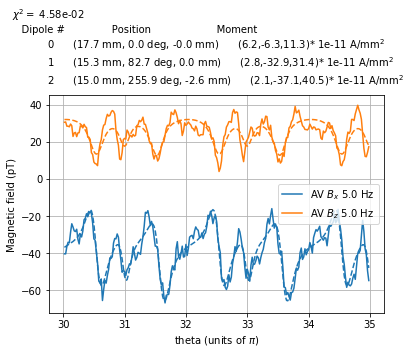

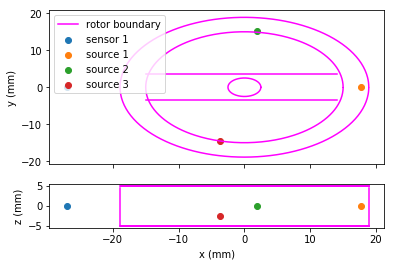

In [72]:
Opt_Settings_Exp2_5Hz_AV_3src['plot']=1
Opt_Settings_Exp2_5Hz_AV_3src['figname']=SaveDir+'Exp2_5Hz_AVonly_3src_'+nowtext+'_1'
chi2_one_exp_one_freq(opt_res_Exp2_5Hz_AV_3src.x,Opt_Settings_Exp2_5Hz_AV_3src)
# Opt_Params_Exp2 = opt_res_Exp2.x

In [163]:
Opt_Params_Exp2_low_chi_5Hz_AV_3src = opt_res_Exp2_5Hz_AV_3src.x
Opt_Params_Exp2_low_chi_5Hz_AV_3src

array([ 1.76593137e+01,  1.58067529e-03, -2.03834834e-04,  6.22240531e+00,
       -6.26601549e+00,  1.13211701e+01,  1.53064038e+01,  8.26762641e+01,
        2.49357164e-03,  2.84643970e+00, -3.28752745e+01,  3.13605742e+01,
        1.50023635e+01,  2.55858007e+02, -2.59921463e+00,  2.08230896e+00,
       -3.70537369e+01,  4.05416459e+01, -3.58886411e+01,  3.43951549e+01,
        2.01077612e-04])

### Use this as now initial condition and bring back AW

[17.65931365035514, 0.0015806752937826936, -0.00020383483446331953, 6.222405312403395, -6.266015494544205, 11.321170127289397, 15.306403844893666, 82.67626414105047, 0.0024935716435542394, 2.846439703584903, -32.87527454235588, 31.36057415365756, 15.002363468436172, 255.85800694338337, -2.5992146349036873, 2.0823089561782226, -37.05373690692558, 40.541645929027744, 20, -34.2827424, -35.88864107108866, 34.39515489731954, 0.0002010776124742673]
[17.65931365035514, 0.0015806752937826936, -0.00020383483446331953, 6.222405312403395, -6.266015494544205, 11.321170127289397, 15.306403844893666, 82.67626414105047, 0.0024935716435542394, 2.846439703584903, -32.87527454235588, 31.36057415365756, 15.002363468436172, 255.85800694338337, -2.5992146349036873, 2.0823089561782226, -37.05373690692558, 40.541645929027744, 20, -34.2827424, -35.88864107108866, 34.39515489731954, 0.0002010776124742673]
0.19479397214667168


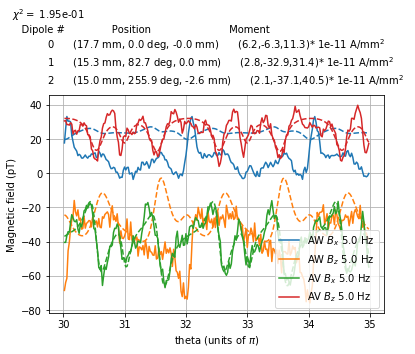

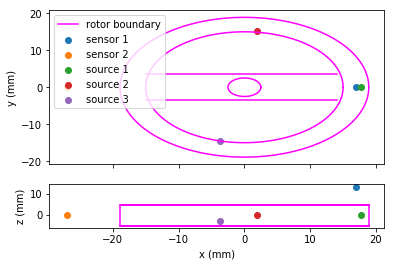

In [164]:
nu = 5
nowtext = now().strftime("%Y%m%d%H%M")
Opt_Settings_Exp2_5Hz_3src = {'number of sources': 3,
                'location coordinate system': 'polar',
                'moment coordinate system':'polar',
                'location dimensions': 3,
                'moment dimensions': 3,
                'rotation sign':1, # 1 for positive, -1 for negative, 0 for unknown and making it a free parameter
                'rotation frequency':nu,
                'rotor dimensions':rtr_dims,
                'time':Exp2_Time_cut[nu],
                'number of sensors':2,
                'sensor locations':[Exp2_AW_sensor_loc,Exp2_AV_sensor_loc],
                'sensor field order':[[0,2],
                                     [0,2]],# list which order of B component of each sensor (0 for x, 1 for y, 2 for z) 
                'B data':[Exp2_AW_X_cut[nu],Exp2_AW_Z_cut[nu],
                         Exp2_AV_X_cut[nu],Exp2_AV_Z_cut[nu]],
                'plot':1,
                'saveplot':1,
                'optimize bar location':1,
                'plotlabels':['AW $B_x$','AW $B_z$','AV $B_x$', 'AV $B_z$'],
                'figname':SaveDir+'Exp2_5Hz_3src_'+nowtext+'_0'
}
# Opt_Params_Exp2_5Hz =[   7.95825475,    40,    4.99597432,  189.10747075,
#         -58.32594041,   15.10548281,    6.80567371,    0.63247041,
#           1.75174325, -178.62354081,    3.90215557, -152.24476817,
#          -7.19618541,   15.07247243,  -37.54240099,  -30.82105149]

Opt_Params_Exp2_5Hz_3src =list(Opt_Params_Exp2_low_chi_5Hz_AV_3src[:-3]) + [ 20, -3.42827424e+01] +\
                          list(Opt_Params_Exp2_low_chi_5Hz_AV_3src[-3:])
# print(Opt_Params_Exp2_5Hz_3src)


chi_Exp2_5Hz_3src = chi2_one_exp_one_freq(Opt_Params_Exp2_5Hz_3src,Opt_Settings_Exp2_5Hz_3src)

In [154]:
Opt_Settings_Exp2_5Hz_3src['plot'] = 0
opt_res_Exp2_5Hz_3src = minimize(chi2_one_exp_one_freq,Opt_Params_Exp2_5Hz_3src,Opt_Settings_Exp2_5Hz_3src,
                                 method = 'Nelder-Mead',options = {'maxfev': 3000,'maxiter': 3000,'adaptive':True,'xatol' : 0.1,'fatol':0.1})

[ 16.  305.   -4.9 -20.  -27.    7.7  15.1  20.   -2.9  -3.2 -37.    4.
  15.1 120.   -3.9   0.  -39.   20.    2.  -38.  -38.   26.   60. ]
0.15301411178093152
[ 16.8 305.   -4.9 -20.  -27.    7.7  15.1  20.   -2.9  -3.2 -37.    4.
  15.1 120.   -3.9   0.  -39.   20.    2.  -38.  -38.   26.   60. ]
0.15762840859817848
[ 16.   320.25  -4.9  -20.   -27.     7.7   15.1   20.    -2.9   -3.2
 -37.     4.    15.1  120.    -3.9    0.   -39.    20.     2.   -38.
 -38.    26.    60.  ]
0.16103131076462923
[ 16.    305.     -5.145 -20.    -27.      7.7    15.1    20.     -2.9
  -3.2   -37.      4.     15.1   120.     -3.9     0.    -39.     20.
   2.    -38.    -38.     26.     60.   ]
Source 1 not in rotor
[ 16.  305.   -4.9 -21.  -27.    7.7  15.1  20.   -2.9  -3.2 -37.    4.
  15.1 120.   -3.9   0.  -39.   20.    2.  -38.  -38.   26.   60. ]
0.15360505058222
[ 16.   305.    -4.9  -20.   -28.35   7.7   15.1   20.    -2.9   -3.2
 -37.     4.    15.1  120.    -3.9    0.   -39.    20.     2.   -3

0.14961523467076215
[ 1.59413875e+01  3.03966401e+02 -4.88006664e+00 -2.00884355e+01
 -2.71193879e+01  7.73404767e+00  1.51667688e+01  2.00884355e+01
 -2.91282315e+00 -3.21414968e+00 -3.71636057e+01  4.01768710e+00
  1.48245516e+01  1.20530613e+02 -3.91724492e+00  2.21088762e-05
 -3.88185740e+01  2.00884355e+01  2.00884355e+00 -3.81680275e+01
 -3.81680275e+01  2.61149662e+01  6.02653065e+01]
Source 3 not in rotor
[ 1.59846230e+01  3.04518778e+02 -4.89071945e+00 -2.00411737e+01
 -2.70555845e+01  7.71585187e+00  1.51310861e+01  2.00411737e+01
 -2.90597018e+00 -3.20658779e+00 -3.70761713e+01  4.00823474e+00
  1.53188289e+01  1.20247042e+02 -3.90802887e+00  1.02934224e-05
 -3.90322078e+01  2.00411737e+01  2.00411737e+00 -3.80782300e+01
 -3.80782300e+01  2.60535258e+01  6.01235211e+01]
0.1544089227836628
[ 1.59314714e+01  3.03530186e+02 -4.87165405e+00 -2.01257584e+01
 -2.71697739e+01  7.74841699e+00  1.51949476e+01  2.01257584e+01
 -2.91823497e+00 -3.22012135e+00 -3.72326531e+01  4.0251516

0.15272783981671767
[ 1.58591994e+01  3.04740740e+02 -4.87483885e+00 -1.99185003e+01
 -2.69761114e+01  7.70076634e+00  1.52284360e+01  2.01992454e+01
 -2.92889058e+00 -3.23187926e+00 -3.73686039e+01  3.82245777e+00
  1.51136289e+01  1.21195472e+02 -3.93885284e+00  4.98113384e-05
 -3.87424919e+01  1.99399073e+01  2.01992454e+00 -3.83785662e+01
 -3.77979428e+01  2.62590190e+01  6.05977361e+01]
0.15046764300139484
[ 1.58487478e+01  3.04641310e+02 -4.97922079e+00 -1.98595182e+01
 -2.68607234e+01  7.66851844e+00  1.51762343e+01  2.01326372e+01
 -2.91923239e+00 -3.22122195e+00 -3.72453788e+01  3.99023254e+00
  1.50795790e+01  1.20795823e+02 -3.92586425e+00  3.31592953e-05
 -3.87039143e+01  1.98798794e+01  2.01326372e+00 -3.82520106e+01
 -3.77527745e+01  2.61724283e+01  6.03979115e+01]
0.15028320602786924
[ 1.58339469e+01  3.04680854e+02 -4.88806528e+00 -1.98950460e+01
 -2.69528582e+01  7.69551028e+00  1.52411638e+01  2.02213900e+01
 -2.93210155e+00 -3.06150936e+00 -3.74095715e+01  4.00482703

0.14911198372059667
[ 1.55831113e+01  3.02708075e+02 -4.87460824e+00 -1.97079968e+01
 -2.68598974e+01  7.68311171e+00  1.54336347e+01  2.02189514e+01
 -2.93597210e+00 -3.21584884e+00 -3.75536657e+01  4.00274927e+00
  1.51268048e+01  1.23414857e+02 -3.97206371e+00  3.41655669e-05
 -3.82313632e+01  1.97784032e+01  2.02747920e+00 -3.87365699e+01
 -3.77712000e+01  2.53268423e+01  6.06092739e+01]
0.14847967427256362
[ 1.56466602e+01  3.03139508e+02 -4.88017395e+00 -1.97478420e+01
 -2.68751457e+01  7.67913820e+00  1.50733156e+01  2.01748845e+01
 -2.92904001e+00 -3.21126131e+00 -3.74530608e+01  3.99920561e+00
  1.51212588e+01  1.22880665e+02 -3.95654438e+00  2.57903510e-05
 -3.83478595e+01  1.98075471e+01  2.02235551e+00 -3.85374264e+01
 -3.78448794e+01  2.63882273e+01  6.04831825e+01]
0.1479495414765877
[ 1.56352896e+01  3.03083847e+02 -4.87962290e+00 -1.97394881e+01
 -2.68708145e+01  7.67813096e+00  1.50565822e+01  2.01799639e+01
 -2.92990022e+00 -3.21151230e+00 -3.74668091e+01  3.99901977e

0.14565336728873898
[ 1.51476721e+01  3.03507370e+02 -4.88526086e+00 -1.95859860e+01
 -2.66702898e+01  7.62987949e+00  1.55167960e+01  2.00260510e+01
 -2.91670541e+00 -3.19791833e+00 -3.75030022e+01  3.97702894e+00
  1.51166073e+01  1.23683979e+02 -3.98802372e+00  8.72943137e-06
 -3.93601658e+01  1.96548140e+01  2.01969514e+00 -3.89466361e+01
 -3.76442501e+01  2.67100550e+01  6.08397972e+01]
0.1461311824029992
[ 1.52243015e+01  3.02442147e+02 -4.87336163e+00 -1.97998712e+01
 -2.68575487e+01  7.67386255e+00  1.54586580e+01  1.98591080e+01
 -2.89362285e+00 -3.20496918e+00 -3.72337062e+01  3.99185319e+00
  1.51480604e+01  1.22989076e+02 -3.96268234e+00  1.65001538e-05
 -3.78905484e+01  1.98428275e+01  2.00448693e+00 -3.87074565e+01
 -3.81445026e+01  2.65518282e+01  6.04051982e+01]
0.1454752561368942
[ 1.51991053e+01  3.02347330e+02 -4.87281651e+00 -1.97965613e+01
 -2.68537768e+01  7.67295677e+00  1.54670004e+01  1.98416098e+01
 -2.89169657e+00 -3.20473785e+00 -3.72228283e+01  3.99125102e+

0.1465750646953146
[ 1.50388041e+01  3.01126842e+02 -4.84493120e+00 -1.98140014e+01
 -2.57005854e+01  7.82955968e+00  1.56024307e+01  1.99998337e+01
 -2.91052600e+00 -3.22205230e+00 -3.72853613e+01  4.04715900e+00
  1.51718928e+01  1.23345988e+02 -3.98779370e+00  3.47603571e-05
 -3.75152930e+01  2.00569868e+01  2.01133500e+00 -3.92828482e+01
 -3.77010906e+01  2.68084651e+01  6.10239337e+01]
0.1433964265522447
[ 1.50283578e+01  3.00778823e+02 -4.83612067e+00 -1.98201647e+01
 -2.68466113e+01  7.34476613e+00  1.55998888e+01  2.00206366e+01
 -2.91313975e+00 -3.23329555e+00 -3.73022476e+01  4.06824872e+00
  1.51766315e+01  1.23388774e+02 -3.99045928e+00  4.94162422e-05
 -3.75232780e+01  2.00811360e+01  2.01265734e+00 -3.93372975e+01
 -3.76652285e+01  2.68336054e+01  6.11902924e+01]
0.1432466032676561
[ 1.49831409e+01  3.01015367e+02 -4.84261457e+00 -1.98186341e+01
 -2.70836362e+01  7.72756070e+00  1.56206665e+01  1.99864422e+01
 -2.90946026e+00 -3.21841702e+00 -3.72883697e+01  4.04128579e+0

0.1426369337930304
[ 1.50259578e+01  3.08679330e+02 -4.85001788e+00 -1.97651488e+01
 -2.66470489e+01  7.62841324e+00  1.55403955e+01  2.01761790e+01
 -2.92996219e+00 -3.19675838e+00 -3.73661762e+01  4.02184311e+00
  1.51219859e+01  1.23936181e+02 -3.97707545e+00 -1.81643230e-05
 -3.69455108e+01  1.99934194e+01  2.02023421e+00 -3.86824895e+01
 -3.82283463e+01  2.67781125e+01  6.11483653e+01]
0.14368318357347346
[ 1.49800885e+01  3.02598849e+02 -4.90020686e+00 -1.97269883e+01
 -2.67026432e+01  7.63324283e+00  1.56091467e+01  2.01661147e+01
 -2.92763714e+00 -3.20388814e+00 -3.72818999e+01  3.99204938e+00
  1.51449154e+01  1.23415998e+02 -3.99877349e+00  1.42329100e-05
 -3.70622881e+01  2.00833669e+01  2.01703850e+00 -3.90938553e+01
 -3.78252113e+01  2.69337516e+01  6.07236284e+01]
Source 1 not in rotor
[ 1.52467785e+01  3.01897029e+02 -4.83232196e+00 -1.98228846e+01
 -2.68965132e+01  7.68534290e+00  1.55220272e+01  2.00820821e+01
 -2.91997824e+00 -3.18465646e+00 -3.73834604e+01  4.0040311

0.14238355294169533
[ 1.51382156e+01  3.00964710e+02 -4.84047486e+00 -1.94854227e+01
 -2.66970078e+01  7.64822770e+00  1.53111492e+01  2.00886865e+01
 -2.92336585e+00 -3.18353821e+00 -3.74526783e+01  4.01785247e+00
  1.51504510e+01  1.25415817e+02 -4.01849682e+00  8.60725938e-06
 -3.71203045e+01  2.01633351e+01  2.03388038e+00 -3.87987011e+01
 -3.80807840e+01  2.69926829e+01  6.07737489e+01]
0.14230654464740783
[ 1.50012060e+01  3.01663649e+02 -4.84505507e+00 -1.96930616e+01
 -2.68089773e+01  7.66686314e+00  1.55932242e+01  1.99789609e+01
 -2.90783362e+00 -3.18328552e+00 -3.74083455e+01  4.00867171e+00
  1.51688521e+01  1.24115072e+02 -4.01690220e+00 -3.06315606e-06
 -3.70213067e+01  2.00327278e+01  2.02805590e+00 -3.89940620e+01
 -3.80258713e+01  2.70156239e+01  6.11943315e+01]
0.142137642307339
[ 1.49920707e+01  3.01640057e+02 -4.84413958e+00 -1.96888835e+01
 -2.68096758e+01  7.66723452e+00  1.55964248e+01  1.99749647e+01
 -2.90722923e+00 -3.18286993e+00 -3.74109547e+01  4.00927373e+

0.14134596942813119
[ 1.51426707e+01  2.94822462e+02 -4.84041272e+00 -1.97757670e+01
 -2.68753569e+01  7.69092168e+00  1.56346299e+01  1.98037323e+01
 -2.89324359e+00 -3.16285923e+00 -3.72730331e+01  3.99290411e+00
  1.51955274e+01  1.24520179e+02 -4.02815444e+00  1.93890217e-05
 -3.72498867e+01  2.03357035e+01  2.00640504e+00 -3.96919655e+01
 -3.73413453e+01  2.71737763e+01  6.10328963e+01]
0.14261098706966374
[ 1.49113782e+01  3.00606532e+02 -4.83186781e+00 -1.98386721e+01
 -2.67504378e+01  7.66353185e+00  1.56070123e+01  1.99393780e+01
 -2.90628808e+00 -3.16819442e+00 -3.72585247e+01  4.01545629e+00
  1.51723265e+01  1.24731146e+02 -4.00818722e+00 -1.27473004e-06
 -3.69653754e+01  2.03404036e+01  2.00911775e+00 -3.93562654e+01
 -3.77715554e+01  2.71041591e+01  6.12362912e+01]
Source 1 not in rotor
[ 1.52023359e+01  3.02026215e+02 -4.85368103e+00 -1.97258630e+01
 -2.67761901e+01  7.65928094e+00  1.55779171e+01  2.00104192e+01
 -2.91383685e+00 -3.18629247e+00 -3.73566448e+01  4.001045

0.14066211454788732
[ 1.50817271e+01  3.01109517e+02 -4.82906906e+00 -1.97376186e+01
 -2.68029782e+01  7.65462229e+00  1.55796188e+01  1.94389025e+01
 -2.85896287e+00 -3.15901104e+00 -3.71681691e+01  4.01397985e+00
  1.51612702e+01  1.27590734e+02 -4.01792461e+00 -1.23855203e-05
 -3.65156717e+01  2.03522954e+01  1.99707938e+00 -3.90797291e+01
 -3.81137517e+01  2.72757294e+01  6.05234501e+01]
0.14063996875214735
[ 1.50806547e+01  3.01117223e+02 -4.82822878e+00 -1.97358962e+01
 -2.68023797e+01  7.65425600e+00  1.55769146e+01  1.93989731e+01
 -2.85497515e+00 -3.15809387e+00 -3.71559189e+01  4.01446241e+00
  1.51609086e+01  1.27772086e+02 -4.01788357e+00 -1.27341547e-05
 -3.64925902e+01  2.03592654e+01  1.99567906e+00 -3.90696292e+01
 -3.81354300e+01  2.72854107e+01  6.05059229e+01]
0.14055830462095759
[ 1.50400577e+01  3.07766704e+02 -4.83599241e+00 -1.97356187e+01
 -2.67380192e+01  7.62355930e+00  1.55817857e+01  1.99572512e+01
 -2.91307203e+00 -3.17584340e+00 -3.73348764e+01  4.02583142

0.14081463331699282
[ 1.51499357e+01  3.04166864e+02 -4.82572474e+00 -1.98934685e+01
 -2.68037150e+01  7.64331606e+00  1.55448436e+01  1.97757072e+01
 -2.88500043e+00 -3.13467001e+00 -3.69333066e+01  4.01788854e+00
  1.51468389e+01  1.26499282e+02 -4.03102150e+00 -2.81452756e-05
 -3.60182370e+01  2.04540055e+01  1.99084495e+00 -4.01724738e+01
 -3.78601861e+01  2.70654106e+01  6.15578706e+01]
0.1403200390940164
[ 1.50716188e+01  3.01797420e+02 -4.81667023e+00 -1.90539542e+01
 -2.72824619e+01  7.72937826e+00  1.56624319e+01  1.98368999e+01
 -2.89552246e+00 -3.16186356e+00 -3.68896222e+01  4.02234075e+00
  1.52111815e+01  1.27536151e+02 -4.04305291e+00 -2.96944564e-05
 -3.58550403e+01  2.07462760e+01  1.99908800e+00 -3.93904009e+01
 -3.77328707e+01  2.74218821e+01  6.06593241e+01]
0.1395017833267041
[ 1.50693734e+01  3.01801531e+02 -4.81575001e+00 -1.89896288e+01
 -2.73221600e+01  7.73570565e+00  1.56657672e+01  1.98307469e+01
 -2.89485552e+00 -3.16223645e+00 -3.68729047e+01  4.02341944e+

[ 1.51752642e+01  3.00444357e+02 -4.80721662e+00 -1.98482402e+01
 -2.67915594e+01  7.67253253e+00  1.57190612e+01  2.03791757e+01
 -2.93526551e+00 -3.12093923e+00 -3.67560118e+01  4.00687601e+00
  1.51840688e+01  1.28348777e+02 -4.04584869e+00 -5.20668336e-05
 -3.51225849e+01  2.07047410e+01  1.98352985e+00 -3.97022752e+01
 -3.76876036e+01  2.76388960e+01  6.15642316e+01]
0.13824742590947953
[ 1.51043820e+01  3.06975501e+02 -4.81723716e+00 -1.97560069e+01
 -2.65939464e+01  7.62676741e+00  1.56377060e+01  2.00029349e+01
 -2.90514281e+00 -3.14385924e+00 -3.68131835e+01  4.03367641e+00
  1.51369492e+01  1.29563926e+02 -4.01895071e+00 -5.57929197e-05
 -3.52681848e+01  2.04459240e+01  1.98985115e+00 -3.88550425e+01
 -3.87816977e+01  2.75439077e+01  6.05670220e+01]
0.13896800000550263
[ 1.51206523e+01  3.01618490e+02 -4.80346091e+00 -1.98126369e+01
 -2.67513108e+01  7.66512696e+00  1.57366557e+01  1.89129313e+01
 -2.98353357e+00 -3.12034050e+00 -3.69238392e+01  4.01909764e+00
  1.51759881e+0

0.13611468052809775
[ 1.52226800e+01  2.98414118e+02 -4.80625077e+00 -1.97427368e+01
 -2.66597190e+01  7.61392213e+00  1.57699337e+01  1.97474191e+01
 -2.87337391e+00 -3.08771764e+00 -3.64726211e+01  4.01473658e+00
  1.51728587e+01  1.31378922e+02 -4.06386158e+00 -4.30466199e-05
 -3.48326341e+01  2.07721837e+01  1.97558431e+00 -4.02233464e+01
 -3.87631084e+01  2.80726747e+01  5.95901511e+01]
0.13752528025635571
[ 1.52202702e+01  2.99718368e+02 -4.78089873e+00 -1.98531983e+01
 -2.69235268e+01  7.65785381e+00  1.57035190e+01  1.95907103e+01
 -2.88850060e+00 -3.23634686e+00 -3.64949999e+01  4.00644176e+00
  1.51797674e+01  1.32142299e+02 -4.03003830e+00 -1.29259063e-04
 -3.43063771e+01  2.09632444e+01  1.96084007e+00 -3.94598999e+01
 -3.80448641e+01  2.78859623e+01  6.11239078e+01]
0.13592698731335892
[ 1.52270892e+01  2.99648852e+02 -4.77935143e+00 -1.98558581e+01
 -2.69339182e+01  7.65898808e+00  1.57042679e+01  1.95747953e+01
 -2.88793159e+00 -3.24603711e+00 -3.64765205e+01  4.00461299

[ 1.51862126e+01  3.00510287e+02 -4.77784544e+00 -2.01960024e+01
 -2.67980199e+01  7.65396851e+00  1.56861797e+01  1.95583439e+01
 -2.89043677e+00 -3.09591149e+00 -3.52793672e+01  4.01448581e+00
  1.51898017e+01  1.34619529e+02 -3.96542815e+00 -5.61186335e-05
 -3.36869953e+01  2.10051321e+01  2.03287885e+00 -3.95444248e+01
 -3.79745538e+01  2.79346734e+01  6.17447647e+01]
0.13394711248936916
[ 1.51873310e+01  3.00471876e+02 -4.77717425e+00 -2.02229218e+01
 -2.67996320e+01  7.65246461e+00  1.56852377e+01  1.95487423e+01
 -2.89032536e+00 -3.09463643e+00 -3.51791989e+01  4.01293508e+00
  1.51897710e+01  1.34782676e+02 -3.95942604e+00 -5.71971178e-05
 -3.36348855e+01  2.10093904e+01  2.03965060e+00 -3.95556754e+01
 -3.79739625e+01  2.79390216e+01  6.17861773e+01]
0.1338136750392596
[ 1.50808688e+01  3.01896292e+02 -4.77100366e+00 -1.98827261e+01
 -2.66225706e+01  7.62931485e+00  1.57754289e+01  1.95764245e+01
 -2.89460811e+00 -3.10061637e+00 -3.61250941e+01  4.02517327e+00
  1.51679568e+01

0.13187315930452226
[ 1.52189133e+01  3.00465095e+02 -4.77316286e+00 -1.99824719e+01
 -2.72602236e+01  7.77966539e+00  1.56896443e+01  1.93566895e+01
 -2.85432215e+00 -3.11533551e+00 -3.54806007e+01  4.11002825e+00
  1.51140144e+01  1.37943775e+02 -4.00841798e+00 -1.32110924e-05
 -3.31428292e+01  2.12496892e+01  1.89702737e+00 -3.94522063e+01
 -3.83244597e+01  2.80681877e+01  6.10817039e+01]
0.13172466870201216
[ 1.52340279e+01  2.94278569e+02 -4.75507150e+00 -1.99766065e+01
 -2.70092201e+01  7.69455529e+00  1.57833467e+01  1.93711541e+01
 -2.87801766e+00 -3.07188778e+00 -3.59500302e+01  4.04250523e+00
  1.52480877e+01  1.36670694e+02 -4.04115351e+00 -1.20443162e-05
 -3.35149993e+01  2.14655369e+01  1.93137726e+00 -3.99986487e+01
 -3.70694225e+01  2.82674335e+01  6.15845375e+01]
0.13297605625707332
[ 1.51439192e+01  3.01779957e+02 -4.73094340e+00 -2.00642603e+01
 -2.66708606e+01  7.65447682e+00  1.58318793e+01  1.96833866e+01
 -2.91030788e+00 -3.09614029e+00 -3.59238487e+01  4.07492793

0.130271733290212
[ 1.53216389e+01  3.00286368e+02 -4.73766357e+00 -2.00074559e+01
 -2.77538749e+01  7.46877401e+00  1.57741989e+01  1.95900072e+01
 -2.88052120e+00 -3.01497404e+00 -3.53271665e+01  4.04739924e+00
  1.52138015e+01  1.40820529e+02 -4.04360718e+00 -5.75393390e-05
 -3.21179631e+01  2.16580708e+01  1.90641047e+00 -3.94883335e+01
 -3.78169440e+01  2.86340022e+01  6.15145595e+01]
0.1294568359925271
[ 1.53290623e+01  3.00281025e+02 -4.73644072e+00 -2.00090585e+01
 -2.78415699e+01  7.44931718e+00  1.57762980e+01  1.95969102e+01
 -2.88071252e+00 -3.00951489e+00 -3.52916749e+01  4.04704255e+00
  1.52134548e+01  1.41049006e+02 -4.04444983e+00 -5.79933785e-05
 -3.20538730e+01  2.16766739e+01  1.90529043e+00 -3.94760618e+01
 -3.78188342e+01  2.86617896e+01  6.15185220e+01]
0.1292953706875985
[ 1.52166055e+01  2.99367911e+02 -4.74063492e+00 -1.99666225e+01
 -2.68063819e+01  7.73237938e+00  1.57086573e+01  1.94432334e+01
 -2.85281640e+00 -3.05516605e+00 -3.58881482e+01  4.07567630e+00

0.1265583912415037
[ 1.53401476e+01  2.99525031e+02 -4.72529223e+00 -1.99355085e+01
 -2.66445519e+01  7.68115006e+00  1.55818253e+01  1.93413104e+01
 -2.98703009e+00 -3.04948652e+00 -3.48221935e+01  4.04491096e+00
  1.52300099e+01  1.45389197e+02 -3.96157599e+00 -1.16170703e-05
 -3.16143504e+01  2.17533225e+01  1.85126255e+00 -3.98883979e+01
 -3.83399783e+01  2.84911241e+01  6.12077273e+01]
0.12633543661183635
[ 1.52204915e+01  3.01270628e+02 -4.71421668e+00 -2.02905027e+01
 -2.67845704e+01  7.70784828e+00  1.60679675e+01  1.91874504e+01
 -2.86746898e+00 -3.04898675e+00 -3.50786939e+01  4.04639731e+00
  1.52494272e+01  1.43595500e+02 -3.96059362e+00 -1.80881413e-05
 -3.12108207e+01  2.19111439e+01  1.84046064e+00 -4.01174375e+01
 -3.77315869e+01  2.87475315e+01  6.18677141e+01]
0.12672885134016829
[ 1.53368211e+01  3.00769030e+02 -4.73660400e+00 -1.99885052e+01
 -2.66645390e+01  7.68881789e+00  1.58003570e+01  1.88579073e+01
 -2.87606249e+00 -3.01402710e+00 -3.54971104e+01  4.21577838e

0.12385909453508448
[ 1.53530169e+01  3.01547034e+02 -4.71317567e+00 -2.02111925e+01
 -2.71945211e+01  7.71328934e+00  1.57450107e+01  1.89709589e+01
 -2.83635816e+00 -3.04544953e+00 -3.43735431e+01  4.03486197e+00
  1.52353645e+01  1.48404596e+02 -4.00133744e+00 -9.61950201e-05
 -3.03406196e+01  2.22473073e+01  1.87122765e+00 -3.97555920e+01
 -3.78348487e+01  2.91309456e+01  6.18123620e+01]
0.1225696092670979
[ 1.53592596e+01  3.01646753e+02 -4.71267023e+00 -2.02202364e+01
 -2.72351970e+01  7.71549736e+00  1.57409314e+01  1.89427362e+01
 -2.83500738e+00 -3.04535786e+00 -3.43349027e+01  4.03106902e+00
  1.52353705e+01  1.48705446e+02 -3.99971382e+00 -9.98053870e-05
 -3.02627772e+01  2.22749488e+01  1.86980716e+00 -3.97640943e+01
 -3.78275495e+01  2.91634653e+01  6.18106552e+01]
0.12229639252644084
[ 1.54512962e+01  2.99752570e+02 -4.70021458e+00 -2.01848062e+01
 -2.69187552e+01  7.87904972e+00  1.57487497e+01  1.89262375e+01
 -2.83800278e+00 -3.05899573e+00 -3.45032605e+01  4.01149928e

0.11931580613988922
[ 1.52758257e+01  3.00555943e+02 -4.67359958e+00 -2.01084783e+01
 -2.66079120e+01  7.66380843e+00  1.59108401e+01  1.81623727e+01
 -2.94121617e+00 -3.01280611e+00 -3.38332541e+01  4.08350305e+00
  1.52519930e+01  1.50671684e+02 -4.02136906e+00 -6.70518412e-05
 -2.92984540e+01  2.24954447e+01  1.87576255e+00 -3.97264885e+01
 -3.82211783e+01  2.93665324e+01  6.31642223e+01]
0.11813302288029134
[ 1.52725073e+01  3.00561710e+02 -4.67109893e+00 -2.01013062e+01
 -2.66005961e+01  7.66321404e+00  1.59217442e+01  1.80707337e+01
 -2.95084416e+00 -3.01165139e+00 -3.37903261e+01  4.08293978e+00
  1.52524393e+01  1.50802584e+02 -4.02289471e+00 -6.79863732e-05
 -2.92019866e+01  2.25230255e+01  1.87637571e+00 -3.97293708e+01
 -3.82356117e+01  2.94009168e+01  6.32599478e+01]
0.1178217975222153
[ 1.52587517e+01  3.02394754e+02 -4.73319173e+00 -2.04919952e+01
 -2.67039358e+01  7.73993567e+00  1.57666365e+01  1.89662605e+01
 -2.83791837e+00 -3.03793457e+00 -3.36579824e+01  4.03248571e

 -3.83207918e+01  2.92473978e+01  6.27759314e+01]
0.1127184677057712
[ 1.54644326e+01  2.99054945e+02 -4.66408646e+00 -2.03339640e+01
 -2.68297049e+01  7.58749414e+00  1.57672682e+01  1.90639542e+01
 -2.75595743e+00 -3.15353382e+00 -3.29654265e+01  4.13952125e+00
  1.52365672e+01  1.57649834e+02 -3.93273054e+00 -1.23573204e-04
 -2.87284487e+01  2.26770115e+01  1.82507146e+00 -3.98295114e+01
 -3.83295031e+01  2.92546714e+01  6.28305740e+01]
0.11230545457348624
[ 1.53758265e+01  3.00738393e+02 -4.64835949e+00 -2.02192612e+01
 -2.60382701e+01  7.61917994e+00  1.59115674e+01  1.92039648e+01
 -2.77124054e+00 -2.96230968e+00 -3.37068152e+01  4.01726882e+00
  1.53600038e+01  1.56925446e+02 -3.97460998e+00 -4.29014557e-05
 -2.85139604e+01  2.28603776e+01  1.86154092e+00 -4.00603005e+01
 -3.79761602e+01  2.96866697e+01  6.30216529e+01]
0.11263697453110888
[ 1.52413229e+01  2.99896707e+02 -4.66028834e+00 -2.02626007e+01
 -2.66921974e+01  7.73223451e+00  1.58383409e+01  1.92501907e+01
 -2.7679450

0.10597297993931523
[ 1.53234363e+01  3.01193629e+02 -4.67958363e+00 -2.05729740e+01
 -2.74127182e+01  7.57532722e+00  1.57295588e+01  1.85806022e+01
 -2.73746406e+00 -2.91830506e+00 -3.42881942e+01  4.06081490e+00
  1.52776076e+01  1.63297635e+02 -3.88626823e+00 -5.60443148e-05
 -2.79665192e+01  2.28849173e+01  1.81537488e+00 -3.97231210e+01
 -3.86473448e+01  2.93092190e+01  6.25765392e+01]
0.10549731451040592
[ 1.54360617e+01  2.99592096e+02 -4.66552097e+00 -2.04086294e+01
 -2.67241285e+01  7.65978592e+00  1.59129099e+01  1.93794352e+01
 -2.80601027e+00 -2.93230237e+00 -3.25608817e+01  4.10088776e+00
  1.52919663e+01  1.61802229e+02 -3.94300038e+00 -1.12107379e-05
 -2.77577406e+01  2.30170071e+01  1.80201531e+00 -3.99878520e+01
 -3.84185985e+01  2.96317293e+01  6.35182252e+01]
0.10648273036863021
[ 1.54277064e+01  3.02206339e+02 -4.66190167e+00 -2.04599616e+01
 -2.72140138e+01  7.73515341e+00  1.58214917e+01  1.86408084e+01
 -2.76817914e+00 -2.96558177e+00 -3.26562691e+01  4.05159200

0.09912993684550453
[ 1.53983990e+01  2.98825609e+02 -4.62703682e+00 -2.04616086e+01
 -2.68520688e+01  7.64161344e+00  1.57447109e+01  1.90813394e+01
 -2.78832944e+00 -2.97467927e+00 -3.09124076e+01  3.97150403e+00
  1.53278955e+01  1.68558617e+02 -3.87797854e+00  1.44244051e-04
 -2.72316400e+01  2.31944752e+01  1.77667240e+00 -3.96732741e+01
 -3.84423730e+01  2.95728059e+01  6.32480948e+01]
0.09863634966565524
[ 1.55394122e+01  2.99463427e+02 -4.64790289e+00 -2.04192715e+01
 -2.66514549e+01  7.64795193e+00  1.58796386e+01  1.86257749e+01
 -2.73806156e+00 -2.92568700e+00 -3.15634824e+01  4.08784956e+00
  1.52887401e+01  1.68845261e+02 -3.92743877e+00 -6.02498573e-05
 -2.67496335e+01  2.33498384e+01  1.78617746e+00 -4.06777194e+01
 -3.93557059e+01  3.01394943e+01  6.13437865e+01]
0.10019601265585726
[ 1.54370317e+01  3.06625196e+02 -4.63191111e+00 -2.04658854e+01
 -2.65131859e+01  7.61754515e+00  1.57351104e+01  1.89984637e+01
 -2.75760715e+00 -2.95182371e+00 -3.18031931e+01  4.13286394

0.09202240217946878
[ 1.54098271e+01  3.01224350e+02 -4.62293770e+00 -2.07062226e+01
 -2.66578171e+01  7.78321867e+00  1.60824470e+01  1.83936573e+01
 -2.74365520e+00 -2.91809085e+00 -3.13991426e+01  4.10186848e+00
  1.53337822e+01  1.73954703e+02 -3.78471554e+00 -1.79830114e-05
 -2.61699534e+01  2.36951732e+01  1.70399093e+00 -4.05132092e+01
 -3.83557392e+01  3.00166103e+01  6.29406634e+01]
0.09217741188124995
[ 1.56170886e+01  3.00588893e+02 -4.62529207e+00 -2.05893909e+01
 -2.78629462e+01  7.44435772e+00  1.57781754e+01  1.85665621e+01
 -2.77912265e+00 -2.87464002e+00 -3.08994759e+01  4.09409225e+00
  1.53302867e+01  1.75935400e+02 -3.86452989e+00 -9.36102328e-05
 -2.61496425e+01  2.38347725e+01  1.75187033e+00 -3.98854508e+01
 -3.83342736e+01  3.01943175e+01  6.25994614e+01]
0.09171730422295614
[ 1.56319638e+01  3.00589337e+02 -4.62426532e+00 -2.05964159e+01
 -2.79721447e+01  7.42349777e+00  1.57731273e+01  1.85680038e+01
 -2.78150373e+00 -2.86869839e+00 -3.08193094e+01  4.09191034

0.08555657523191137
[ 1.54225951e+01  3.01175712e+02 -4.56615837e+00 -2.07247196e+01
 -2.65330489e+01  7.68716854e+00  1.59583751e+01  1.80908942e+01
 -2.74503178e+00 -2.91740582e+00 -3.04723366e+01  4.14411809e+00
  1.53682123e+01  1.82123560e+02 -3.81173561e+00  2.72525742e-05
 -2.47428797e+01  2.42530371e+01  1.74584738e+00 -4.03465044e+01
 -3.77418984e+01  3.05609616e+01  6.15807650e+01]
0.08588925279831044
[ 1.56125817e+01  2.98002552e+02 -4.55032453e+00 -2.03762741e+01
 -2.64257968e+01  7.64239245e+00  1.58656711e+01  1.80067140e+01
 -2.69087475e+00 -2.86774808e+00 -3.04387404e+01  4.18833918e+00
  1.53733201e+01  1.81212875e+02 -3.84158019e+00  4.19893964e-05
 -2.36115178e+01  2.45032798e+01  1.70225132e+00 -3.99964378e+01
 -3.88386831e+01  3.09262565e+01  6.41100402e+01]
0.08640700302262055
[ 1.54129766e+01  3.02642449e+02 -4.60033427e+00 -2.04135361e+01
 -2.63763008e+01  7.64094682e+00  1.59184384e+01  1.79483840e+01
 -2.71291246e+00 -2.89169206e+00 -2.96714198e+01  4.12663083

0.08313510027456754
[ 1.56241597e+01  3.00028028e+02 -4.56335935e+00 -2.09768806e+01
 -2.67672542e+01  7.81080156e+00  1.58389092e+01  1.74665291e+01
 -2.63422005e+00 -2.96924121e+00 -3.02783878e+01  4.03318857e+00
  1.54258130e+01  1.90348308e+02 -3.80408214e+00 -6.46979392e-05
 -2.35609363e+01  2.48414623e+01  1.68684852e+00 -3.99720973e+01
 -3.85353152e+01  3.06371096e+01  6.36073964e+01]
0.08345988797195843
[ 1.56255366e+01  2.98849931e+02 -4.59125432e+00 -2.08104442e+01
 -2.66008207e+01  7.61260180e+00  1.59015981e+01  1.77149555e+01
 -2.66046828e+00 -2.84048605e+00 -2.94951580e+01  4.11347767e+00
  1.53862872e+01  1.90077209e+02 -3.79906323e+00 -4.02121834e-05
 -2.37197348e+01  2.46216664e+01  1.69992085e+00 -4.11108464e+01
 -3.94856956e+01  3.08773680e+01  6.19928758e+01]
0.08349174794740928
[ 1.54595504e+01  2.97668456e+02 -4.57582285e+00 -2.02332814e+01
 -2.65246656e+01  7.63911484e+00  1.59156478e+01  1.78208823e+01
 -2.70975202e+00 -2.85767311e+00 -3.02904779e+01  4.20097418

0.0831699289216641
[ 1.55011071e+01  3.00915943e+02 -4.59715076e+00 -2.06075758e+01
 -2.65712216e+01  7.99684737e+00  1.58356409e+01  1.75811833e+01
 -2.66310985e+00 -2.79758035e+00 -2.90075538e+01  4.09913842e+00
  1.53772325e+01  1.95969372e+02 -3.74408844e+00 -1.19796377e-04
 -2.37426528e+01  2.48903145e+01  1.65819506e+00 -4.02449005e+01
 -3.85553023e+01  3.05748592e+01  6.38726729e+01]
0.0834741899492392
[ 1.53479289e+01  3.00160884e+02 -4.55051629e+00 -2.07920695e+01
 -2.65111064e+01  7.68484563e+00  1.60586073e+01  1.74457668e+01
 -2.71642575e+00 -2.89789426e+00 -2.98095422e+01  4.16021192e+00
  1.54194111e+01  1.88900770e+02 -3.79012428e+00 -8.83302229e-06
 -2.39469684e+01  2.46951890e+01  1.71767702e+00 -4.05761236e+01
 -3.76424339e+01  3.07283860e+01  6.20490203e+01]
0.08203805747923566
[ 1.52503912e+01  3.02080998e+02 -4.57501740e+00 -2.06173055e+01
 -2.66979432e+01  7.61478958e+00  1.58777621e+01  1.78670496e+01
 -2.67797594e+00 -2.91244725e+00 -3.01876845e+01  4.14438528e+

0.08302365982463197
[ 1.53900410e+01  3.01198059e+02 -4.57148520e+00 -2.09261853e+01
 -2.64711248e+01  7.61757564e+00  1.60702314e+01  1.76883483e+01
 -2.66511097e+00 -2.86060568e+00 -2.95092364e+01  4.13533199e+00
  1.54319257e+01  1.93974859e+02 -3.66748108e+00  8.53846383e-06
 -2.37609701e+01  2.48135493e+01  1.62600433e+00 -4.09001689e+01
 -3.85479705e+01  3.05956412e+01  6.35980639e+01]
0.08196188740030927
[ 1.52756208e+01  3.00659207e+02 -4.56219538e+00 -2.03973131e+01
 -2.57117430e+01  7.67854820e+00  1.59798138e+01  1.76046396e+01
 -2.69485628e+00 -2.90962049e+00 -2.90643339e+01  4.18661082e+00
  1.54816126e+01  1.94100182e+02 -3.70773810e+00  6.19574439e-05
 -2.45903009e+01  2.48971290e+01  1.65407743e+00 -4.08121881e+01
 -3.79972824e+01  3.07245035e+01  6.28976175e+01]
0.08092257476653417
[ 1.53093087e+01  2.99128856e+02 -4.57345084e+00 -2.01378082e+01
 -2.65342560e+01  7.58692434e+00  1.59126849e+01  1.75525118e+01
 -2.64406035e+00 -3.03076159e+00 -2.99039821e+01  4.20038441

0.07993449927222261
[ 1.51461470e+01  3.01863373e+02 -4.61697054e+00 -2.02503687e+01
 -2.69259587e+01  7.82087174e+00  1.60173370e+01  1.78909682e+01
 -2.68171307e+00 -2.87314909e+00 -3.09112438e+01  4.06804013e+00
  1.54396531e+01  1.85952357e+02 -3.66890437e+00  2.89074262e-05
 -2.58300801e+01  2.43582852e+01  1.68808203e+00 -4.10316160e+01
 -3.76971077e+01  3.02564420e+01  6.26167572e+01]
0.08147826902769924
[ 1.52382239e+01  2.99253620e+02 -4.57139167e+00 -2.05776546e+01
 -2.58140265e+01  7.42261459e+00  1.59600465e+01  1.75791902e+01
 -2.70571059e+00 -2.88279973e+00 -2.96630488e+01  4.20481801e+00
  1.54627934e+01  1.95301314e+02 -3.64239366e+00  5.57886750e-05
 -2.47519283e+01  2.46941491e+01  1.68636481e+00 -4.09932477e+01
 -3.87439342e+01  3.04265436e+01  6.32540057e+01]
0.08078249058441944
[ 1.52618276e+01  2.99748848e+02 -4.63136229e+00 -2.03723745e+01
 -2.60073697e+01  7.72231062e+00  1.58281678e+01  1.85854257e+01
 -2.64714705e+00 -2.87792207e+00 -2.99045075e+01  4.19121683

0.08019262526394916
[ 1.49604050e+01  2.99207368e+02 -4.58939602e+00 -2.00678541e+01
 -2.64215724e+01  7.56132627e+00  1.59440853e+01  1.82147175e+01
 -2.76998167e+00 -2.94262963e+00 -2.87533661e+01  4.05515959e+00
  1.54534059e+01  1.92974836e+02 -3.47184511e+00  1.59224917e-04
 -2.63766224e+01  2.42471726e+01  1.70765963e+00 -4.14719470e+01
 -3.82018248e+01  2.98230142e+01  6.26849581e+01]
Source 1 not in rotor
[ 1.51909386e+01  3.01196046e+02 -4.60721220e+00 -2.05536391e+01
 -2.62405969e+01  7.63897906e+00  1.60256145e+01  1.73808291e+01
 -2.62958108e+00 -2.87421621e+00 -3.13707313e+01  4.24848129e+00
  1.54455701e+01  1.90791250e+02 -3.68688204e+00 -7.82939221e-05
 -2.52826218e+01  2.46670804e+01  1.68084532e+00 -4.08885213e+01
 -3.80536929e+01  3.03536927e+01  6.27140042e+01]
0.08012510350204113
[ 1.50588213e+01  2.99528082e+02 -4.61596869e+00 -2.04361477e+01
 -2.63006759e+01  7.63061458e+00  1.57821502e+01  1.76762298e+01
 -2.65443666e+00 -2.92630232e+00 -3.03489197e+01  4.222413

0.0796279547451141
[ 1.49882113e+01  3.02109289e+02 -4.61786205e+00 -2.01505959e+01
 -2.62770685e+01  7.68392527e+00  1.60805719e+01  1.71910138e+01
 -2.67492836e+00 -2.94159967e+00 -3.01744287e+01  4.21125746e+00
  1.54216477e+01  1.89002299e+02 -3.64679624e+00 -7.22288307e-05
 -2.66769659e+01  2.42191645e+01  1.71359710e+00 -4.07559504e+01
 -3.83409023e+01  2.99898519e+01  6.29332641e+01]
Source 1 not in rotor
[ 1.51301859e+01  2.99807783e+02 -4.59771115e+00 -2.05437271e+01
 -2.63155840e+01  7.56766957e+00  1.59299521e+01  1.78859914e+01
 -2.67887690e+00 -2.87008709e+00 -3.03386753e+01  4.17696188e+00
  1.54802429e+01  1.95153664e+02 -3.54123327e+00  7.98998473e-05
 -2.51604421e+01  2.47018678e+01  1.67854662e+00 -4.14252508e+01
 -3.79701235e+01  3.01262251e+01  6.23532034e+01]
0.07963984921466478
[ 1.50861816e+01  3.00239757e+02 -4.63397014e+00 -2.05612325e+01
 -2.61005090e+01  7.74553371e+00  1.57328671e+01  1.71540623e+01
 -2.82634830e+00 -2.94770947e+00 -3.14091230e+01  4.1943391

0.07897184360808504
[ 1.50263278e+01  3.00626272e+02 -4.59809973e+00 -2.04255053e+01
 -2.64294801e+01  7.66622544e+00  1.60790172e+01  1.75451618e+01
 -2.69884403e+00 -2.94757179e+00 -3.03105038e+01  4.21639814e+00
  1.54210238e+01  1.89155743e+02 -3.64155711e+00 -6.15106320e-05
 -2.59890153e+01  2.43816614e+01  1.72271405e+00 -4.12416092e+01
 -3.75846080e+01  3.00859272e+01  6.14604319e+01]
0.0798956395848562
[ 1.50976088e+01  2.99567512e+02 -4.62548057e+00 -2.03315946e+01
 -2.61887413e+01  7.65716899e+00  1.59303791e+01  1.74592716e+01
 -2.68288556e+00 -2.88468342e+00 -3.04561088e+01  4.17003532e+00
  1.54855019e+01  1.94428789e+02 -3.55257147e+00  6.37183866e-05
 -2.59183858e+01  2.45454273e+01  1.65323302e+00 -4.11264546e+01
 -3.85890449e+01  2.98662018e+01  6.32870149e+01]
0.07931191628515913
[ 1.51262594e+01  2.99958356e+02 -4.62116100e+00 -2.03968979e+01
 -2.62452550e+01  7.68868902e+00  1.59514284e+01  1.69286713e+01
 -2.74822456e+00 -2.92311883e+00 -3.02899395e+01  4.25126595e

0.07927561097845454
[ 1.51125314e+01  2.97041044e+02 -4.61696601e+00 -1.98359452e+01
 -2.64204790e+01  7.76506729e+00  1.60420625e+01  1.74563173e+01
 -2.69173985e+00 -2.91460938e+00 -3.08347836e+01  4.28895974e+00
  1.54615331e+01  1.92503271e+02 -3.41076271e+00 -1.21574554e-04
 -2.61324950e+01  2.46570702e+01  1.72473238e+00 -4.10418031e+01
 -3.80578150e+01  3.01329962e+01  6.28481127e+01]
0.0786043861188991
[ 1.50347409e+01  2.99914126e+02 -4.60843897e+00 -2.03238101e+01
 -2.65710371e+01  7.51134986e+00  1.59580630e+01  1.73653709e+01
 -2.67796229e+00 -2.97409962e+00 -3.15767497e+01  4.19050981e+00
  1.55095364e+01  1.89702046e+02 -3.56816188e+00  1.07436580e-04
 -2.61212634e+01  2.44300256e+01  1.67237676e+00 -4.07472275e+01
 -3.82094850e+01  2.96337382e+01  6.22685132e+01]
0.07922503110636678
[ 1.50276773e+01  3.00799500e+02 -4.61809211e+00 -2.01036977e+01
 -2.67141390e+01  7.67281233e+00  1.60196099e+01  1.78823014e+01
 -2.67587347e+00 -2.89812440e+00 -3.10047111e+01  4.18834332e

0.07836662124275051
[ 1.50035397e+01  2.98264362e+02 -4.61230072e+00 -2.00486971e+01
 -2.63816893e+01  7.55447684e+00  1.60975451e+01  1.74360166e+01
 -2.69550699e+00 -2.94660288e+00 -3.04415577e+01  4.21699002e+00
  1.54790320e+01  1.91879184e+02 -3.51365665e+00  4.43691149e-05
 -2.66353173e+01  2.44872892e+01  1.67769977e+00 -4.14270900e+01
 -3.81182050e+01  2.98331616e+01  6.27677188e+01]
0.07833102708010481
[ 1.50785761e+01  2.99442771e+02 -4.59046546e+00 -2.00447190e+01
 -2.58777132e+01  7.69681026e+00  1.61187753e+01  1.69051368e+01
 -2.67599242e+00 -2.99426384e+00 -2.97701153e+01  4.25420602e+00
  1.55245684e+01  1.95017072e+02 -3.58973629e+00  1.66260584e-05
 -2.59079595e+01  2.49338758e+01  1.63917532e+00 -4.11516835e+01
 -3.78310293e+01  3.02111374e+01  6.23218142e+01]
0.0790909352907584
[ 1.50508466e+01  3.01166681e+02 -4.58323414e+00 -2.00624812e+01
 -2.58740798e+01  7.74806804e+00  1.60289858e+01  1.70129912e+01
 -2.69541862e+00 -2.86257649e+00 -3.07000431e+01  4.13697669e

0.07887639619853348
[ 1.50094239e+01  2.98945477e+02 -4.61449333e+00 -2.00001801e+01
 -2.60767435e+01  7.60715472e+00  1.60567032e+01  1.73148708e+01
 -2.67623345e+00 -2.97022102e+00 -3.08325269e+01  4.26555098e+00
  1.54897899e+01  1.92022412e+02 -3.50651326e+00 -2.32260336e-05
 -2.64865514e+01  2.45449523e+01  1.68043650e+00 -4.15309765e+01
 -3.82376237e+01  2.99218654e+01  6.23674602e+01]
0.0783730172261405
[ 1.49967842e+01  2.98919416e+02 -4.61787362e+00 -2.00241197e+01
 -2.61939979e+01  7.58492008e+00  1.60618552e+01  1.72671228e+01
 -2.69836875e+00 -2.94554412e+00 -3.08501864e+01  4.26362637e+00
  1.54934491e+01  1.92218309e+02 -3.50538011e+00 -3.40881224e-05
 -2.65970969e+01  2.45503449e+01  1.67977580e+00 -4.15162210e+01
 -3.81804703e+01  2.99318078e+01  6.22855778e+01]
Source 1 not in rotor
[ 1.50843054e+01  2.99691058e+02 -4.60577359e+00 -2.02276522e+01
 -2.62914981e+01  7.62557692e+00  1.60117423e+01  1.74556382e+01
 -2.68214316e+00 -2.93002763e+00 -3.04442125e+01  4.2047699

0.07879770072380125
[ 1.49922452e+01  3.00135683e+02 -4.61292584e+00 -1.99589340e+01
 -2.60807879e+01  7.64216629e+00  1.59658299e+01  1.76237952e+01
 -2.69021057e+00 -2.96380821e+00 -3.13423481e+01  4.23357098e+00
  1.55059223e+01  1.94990883e+02 -3.44958279e+00 -1.11369072e-04
 -2.66050563e+01  2.45280870e+01  1.67512681e+00 -4.10711417e+01
 -3.80186590e+01  3.00166367e+01  6.17408029e+01]
Source 1 not in rotor
[ 1.50692127e+01  2.99330484e+02 -4.61320593e+00 -2.01171346e+01
 -2.62879555e+01  7.63675189e+00  1.60424958e+01  1.72016209e+01
 -2.70157812e+00 -2.93362097e+00 -3.06715877e+01  4.24745659e+00
  1.54736918e+01  1.91128909e+02 -3.54571702e+00  1.83499756e-05
 -2.64114856e+01  2.45468251e+01  1.69003998e+00 -4.16302195e+01
 -3.79627862e+01  2.98883454e+01  6.25667205e+01]
0.07877110342295467
[ 1.49938072e+01  2.99672276e+02 -4.61410218e+00 -1.98351986e+01
 -2.61681925e+01  7.64336189e+00  1.60247810e+01  1.71799634e+01
 -2.71446326e+00 -2.97586665e+00 -3.14101143e+01  4.279600

 -3.76692661e+01  2.98206613e+01  6.23593919e+01]
0.07850765463925949
[ 1.49906908e+01  3.00134646e+02 -4.65245644e+00 -2.00846909e+01
 -2.63708532e+01  7.76810079e+00  1.60848010e+01  1.70568331e+01
 -2.69428089e+00 -2.94626396e+00 -3.05663727e+01  4.23866777e+00
  1.54532656e+01  1.90262086e+02 -3.53587273e+00 -9.71262375e-05
 -2.73544778e+01  2.42428809e+01  1.73682932e+00 -4.10938023e+01
 -3.81008265e+01  2.96397859e+01  6.24894524e+01]
Source 1 not in rotor
[ 1.50630519e+01  2.99503745e+02 -4.60395239e+00 -1.99770613e+01
 -2.62818410e+01  7.52128152e+00  1.60066854e+01  1.75147745e+01
 -2.69193402e+00 -2.94035792e+00 -3.10706393e+01  4.25589963e+00
  1.55132803e+01  1.94414619e+02 -3.43498850e+00 -2.75332666e-05
 -2.63432304e+01  2.47217550e+01  1.69269957e+00 -4.17353609e+01
 -3.77700758e+01  3.00265144e+01  6.20581043e+01]
0.07855109341953763
[ 1.50148290e+01  2.96534765e+02 -4.61554006e+00 -2.03044181e+01
 -2.58603228e+01  7.63270100e+00  1.60850264e+01  1.74673500e+01
 -2.6506

0.07843357143509434
[ 1.50006862e+01  2.98382598e+02 -4.60538681e+00 -1.95386424e+01
 -2.59032217e+01  7.60806328e+00  1.61216286e+01  1.72873311e+01
 -2.75101952e+00 -2.89368743e+00 -3.06029864e+01  4.33796209e+00
  1.54917814e+01  1.91979443e+02 -3.43408070e+00 -2.02752561e-06
 -2.64356359e+01  2.46615920e+01  1.71468527e+00 -4.17136304e+01
 -3.79855142e+01  3.02408413e+01  6.25254825e+01]
0.07808983419394566
[ 1.50344397e+01  2.97960113e+02 -4.62918202e+00 -1.96156891e+01
 -2.61882901e+01  7.62322591e+00  1.59698077e+01  1.73044814e+01
 -2.75427608e+00 -2.94246299e+00 -3.16352746e+01  4.27271776e+00
  1.54901612e+01  1.90456346e+02 -3.47480503e+00 -3.37131604e-05
 -2.70773227e+01  2.43916497e+01  1.69707393e+00 -4.13765380e+01
 -3.83542188e+01  2.99513203e+01  6.18962300e+01]
0.07859570578999699
[ 1.50264934e+01  3.01300535e+02 -4.62766983e+00 -2.01229268e+01
 -2.63589597e+01  7.62252252e+00  1.60858126e+01  1.73926598e+01
 -2.68493123e+00 -2.92928579e+00 -3.03413758e+01  4.26727225

0.0783223220204122
[ 1.50492762e+01  2.99281073e+02 -4.62062994e+00 -1.96980272e+01
 -2.60525637e+01  7.63534035e+00  1.61214504e+01  1.68845037e+01
 -2.72132767e+00 -2.95474434e+00 -3.03227853e+01  4.32449947e+00
  1.55201341e+01  1.94940902e+02 -3.42113553e+00 -6.66422601e-05
 -2.66051069e+01  2.47811421e+01  1.69127550e+00 -4.14653751e+01
 -3.80893907e+01  3.00094489e+01  6.20986902e+01]
0.07815880088596688
[ 1.49758314e+01  3.00546171e+02 -4.62923379e+00 -1.98446158e+01
 -2.61466224e+01  7.52628909e+00  1.60488372e+01  1.72344217e+01
 -2.72631963e+00 -2.93654340e+00 -3.09293041e+01  4.28457870e+00
  1.55123658e+01  1.93754360e+02 -3.44450977e+00 -4.08643729e-05
 -2.70185222e+01  2.45114837e+01  1.69406899e+00 -4.18424552e+01
 -3.80970733e+01  2.97433808e+01  6.19505764e+01]
Source 1 not in rotor
[ 1.50598750e+01  2.98665748e+02 -4.62225023e+00 -1.98798414e+01
 -2.63261272e+01  7.67576871e+00  1.60397524e+01  1.73803466e+01
 -2.70113522e+00 -2.92764041e+00 -3.08883841e+01  4.2786125

0.07821963319047535
[ 1.50433867e+01  2.97430120e+02 -4.62818369e+00 -1.98323035e+01
 -2.60935887e+01  7.62880723e+00  1.60587071e+01  1.72050592e+01
 -2.73143563e+00 -2.96590731e+00 -3.11646099e+01  4.31132535e+00
  1.55131185e+01  1.91160097e+02 -3.33797137e+00 -1.25262488e-04
 -2.71359606e+01  2.44847835e+01  1.77460830e+00 -4.14689623e+01
 -3.78560338e+01  2.98912073e+01  6.25676142e+01]
0.07805756363104432
[ 1.50146886e+01  2.99381731e+02 -4.63784377e+00 -1.96702260e+01
 -2.63735602e+01  7.53964360e+00  1.60278740e+01  1.74818683e+01
 -2.74130260e+00 -2.95262710e+00 -3.10666698e+01  4.35410689e+00
  1.54590721e+01  1.91856522e+02 -3.37612968e+00 -1.07699353e-04
 -2.73562992e+01  2.43970380e+01  1.71730931e+00 -4.13464562e+01
 -3.81148448e+01  2.98053393e+01  6.24140034e+01]
0.07790491542537084
[ 1.50128652e+01  2.96037375e+02 -4.63975678e+00 -1.97754444e+01
 -2.65043980e+01  7.63213827e+00  1.60289163e+01  1.74723158e+01
 -2.71478136e+00 -2.98164759e+00 -3.11289386e+01  4.30852344

0.07801090980155598
[ 1.50444844e+01  2.97907940e+02 -4.63982227e+00 -1.93367057e+01
 -2.65450771e+01  7.62671790e+00  1.60383253e+01  1.73793384e+01
 -2.72022206e+00 -2.90042677e+00 -3.08922953e+01  4.37184589e+00
  1.54678165e+01  1.93428341e+02 -3.29700364e+00 -1.23932239e-04
 -2.69942689e+01  2.45778472e+01  1.75262663e+00 -4.15299494e+01
 -3.83719121e+01  3.00039990e+01  6.21151459e+01]
0.07772229806259105
[ 1.50479719e+01  2.99234381e+02 -4.65801771e+00 -1.96698570e+01
 -2.69470792e+01  7.67107532e+00  1.59361059e+01  1.73354950e+01
 -2.67074745e+00 -2.97982828e+00 -3.15941055e+01  4.28455041e+00
  1.54863544e+01  1.94390532e+02 -3.29115332e+00 -2.27801027e-04
 -2.75399914e+01  2.44811565e+01  1.76012931e+00 -4.13478721e+01
 -3.81476785e+01  2.95653888e+01  6.18637189e+01]
0.07777540000418491
[ 1.49865192e+01  2.99111089e+02 -4.64986840e+00 -1.98092357e+01
 -2.61758418e+01  7.50198535e+00  1.60715562e+01  1.71497813e+01
 -2.73566927e+00 -2.88113877e+00 -3.12795917e+01  4.37168339

0.07769346258012128
[ 1.50562182e+01  2.97970125e+02 -4.63912448e+00 -1.91153547e+01
 -2.67685609e+01  7.72571445e+00  1.60373201e+01  1.72678446e+01
 -2.68757381e+00 -2.90817095e+00 -3.11436747e+01  4.32823930e+00
  1.55325165e+01  1.95163579e+02 -3.25195721e+00 -2.45111518e-04
 -2.68513335e+01  2.48668679e+01  1.79508976e+00 -4.18403590e+01
 -3.79228006e+01  3.00062873e+01  6.21266266e+01]
0.07768426457979338
[ 1.50239315e+01  2.99512397e+02 -4.65770550e+00 -1.93394728e+01
 -2.65649041e+01  7.70880267e+00  1.60912531e+01  1.74139137e+01
 -2.74526821e+00 -2.92442453e+00 -3.07855437e+01  4.33692831e+00
  1.54791915e+01  1.91768930e+02 -3.36691990e+00 -2.17404301e-04
 -2.73457321e+01  2.45000911e+01  1.75650338e+00 -4.15119916e+01
 -3.81549139e+01  2.97492636e+01  6.24731943e+01]
0.07768430967206072
[ 1.50264247e+01  2.96448475e+02 -4.64220710e+00 -1.92887693e+01
 -2.64671671e+01  7.64912127e+00  1.60730283e+01  1.76464579e+01
 -2.70686633e+00 -2.89445923e+00 -3.15555227e+01  4.43637098

0.07732627405091644
[ 1.50446596e+01  2.97369903e+02 -4.65587837e+00 -1.88827842e+01
 -2.65418972e+01  7.69954740e+00  1.60129178e+01  1.73276561e+01
 -2.77042686e+00 -2.91327762e+00 -3.16120855e+01  4.40354785e+00
  1.55074145e+01  1.92497152e+02 -3.25404192e+00 -2.21246986e-04
 -2.75184576e+01  2.45691068e+01  1.76929238e+00 -4.14805295e+01
 -3.82654367e+01  2.98479437e+01  6.21208039e+01]
0.07739867439450807
[ 1.50481882e+01  2.98983036e+02 -4.64679978e+00 -1.91276829e+01
 -2.66161947e+01  7.61395400e+00  1.60008083e+01  1.74894910e+01
 -2.73109876e+00 -2.91643656e+00 -3.06919622e+01  4.41573307e+00
  1.55304738e+01  1.95486758e+02 -3.27767976e+00 -2.70163481e-04
 -2.67725761e+01  2.47747225e+01  1.76844078e+00 -4.16388858e+01
 -3.81750595e+01  2.99078962e+01  6.22679139e+01]
0.07764122796204576
[ 1.50839746e+01  2.98596140e+02 -4.65867393e+00 -1.88079122e+01
 -2.67488459e+01  7.74954300e+00  1.60650082e+01  1.73990161e+01
 -2.74080548e+00 -2.89730694e+00 -3.09849667e+01  4.43255846

0.07720146310656749
[ 1.50695983e+01  2.98718029e+02 -4.64939304e+00 -1.89856709e+01
 -2.65638758e+01  7.65450264e+00  1.61067361e+01  1.69056009e+01
 -2.74947679e+00 -2.92241781e+00 -3.07276729e+01  4.41646045e+00
  1.55112943e+01  1.95226324e+02 -3.19472914e+00 -2.04547041e-04
 -2.72622545e+01  2.48236295e+01  1.77017582e+00 -4.15146547e+01
 -3.81754172e+01  2.99381646e+01  6.21960953e+01]
0.07735532410247324
[ 1.50786807e+01  2.98130954e+02 -4.66388941e+00 -1.86137745e+01
 -2.71278283e+01  7.79013108e+00  1.59868115e+01  1.74814482e+01
 -2.73574065e+00 -2.96659621e+00 -3.11576599e+01  4.41800628e+00
  1.54750205e+01  1.93793979e+02 -3.12649540e+00 -3.54937035e-04
 -2.74923233e+01  2.47598064e+01  1.81511667e+00 -4.17149349e+01
 -3.82947026e+01  2.97438651e+01  6.21749961e+01]
0.07708727844453966
[ 1.50814543e+01  2.98095914e+02 -4.66449320e+00 -1.85781089e+01
 -2.71582608e+01  7.80188433e+00  1.59818562e+01  1.74922848e+01
 -2.73533742e+00 -2.97018040e+00 -3.11592827e+01  4.41897220

0.07687231523394701
[ 1.50760037e+01  2.97528463e+02 -4.68062213e+00 -1.84798850e+01
 -2.71688856e+01  7.61583538e+00  1.60366570e+01  1.74225403e+01
 -2.76638730e+00 -2.86346167e+00 -3.10634459e+01  4.51143033e+00
  1.54794702e+01  1.94379637e+02 -3.06619427e+00 -3.33965829e-04
 -2.77297059e+01  2.46881259e+01  1.84503327e+00 -4.15337017e+01
 -3.83435163e+01  2.99130927e+01  6.20303561e+01]
0.07685977246808803
[ 1.50409442e+01  2.99108593e+02 -4.67762038e+00 -1.88011732e+01
 -2.68878269e+01  7.61878442e+00  1.60249742e+01  1.75497757e+01
 -2.78588411e+00 -2.91688634e+00 -3.13892881e+01  4.50076026e+00
  1.54583302e+01  1.92445691e+02 -3.11934207e+00 -3.13538170e-04
 -2.80970833e+01  2.44402094e+01  1.81963617e+00 -4.13059725e+01
 -3.81249296e+01  2.97241049e+01  6.23270758e+01]
0.07705200759486322
[ 1.50600645e+01  3.00349567e+02 -4.66563509e+00 -1.87011865e+01
 -2.67579747e+01  7.72736951e+00  1.60499913e+01  1.72241265e+01
 -2.73459004e+00 -2.87504759e+00 -3.12835515e+01  4.45137413

0.07690302086291154
[ 1.50605240e+01  2.99590337e+02 -4.67535783e+00 -1.82607969e+01
 -2.72848914e+01  7.71362224e+00  1.60120735e+01  1.74840469e+01
 -2.77116742e+00 -2.89172493e+00 -3.17929170e+01  4.48515332e+00
  1.55275844e+01  1.93343174e+02 -3.04116936e+00 -3.39434707e-04
 -2.76165771e+01  2.47807431e+01  1.86370047e+00 -4.13778684e+01
 -3.80130342e+01  2.96653893e+01  6.21904206e+01]
0.07674398268964523
[ 1.50340368e+01  2.99146703e+02 -4.67730905e+00 -1.84051200e+01
 -2.68340740e+01  7.60499721e+00  1.61069125e+01  1.71665341e+01
 -2.79460632e+00 -2.85268256e+00 -3.13353888e+01  4.53927297e+00
  1.55310607e+01  1.93809101e+02 -3.07853212e+00 -3.42543702e-04
 -2.80396355e+01  2.47117288e+01  1.86953107e+00 -4.13440146e+01
 -3.77159813e+01  2.99833438e+01  6.22333841e+01]
0.07669343662275827
[ 1.50319752e+01  2.99192390e+02 -4.67786626e+00 -1.83975988e+01
 -2.68199789e+01  7.59643691e+00  1.61123497e+01  1.71523710e+01
 -2.79718323e+00 -2.84757396e+00 -3.13430456e+01  4.54450343

0.07655966879810447
[ 1.50843535e+01  2.98008388e+02 -4.67528514e+00 -1.82029859e+01
 -2.69129889e+01  7.76370742e+00  1.60655397e+01  1.71991357e+01
 -2.77292272e+00 -2.90472334e+00 -3.15700868e+01  4.52001425e+00
  1.55067995e+01  1.96541595e+02 -2.98383559e+00 -4.50565149e-04
 -2.79819088e+01  2.48857210e+01  1.87291899e+00 -4.16055856e+01
 -3.80162367e+01  3.00100366e+01  6.17626416e+01]
0.07674135957270416
[ 1.50728751e+01  2.99504117e+02 -4.68365487e+00 -1.82825373e+01
 -2.73796823e+01  7.68585426e+00  1.61018385e+01  1.72678557e+01
 -2.74199364e+00 -2.89537767e+00 -3.10296684e+01  4.51782011e+00
  1.54969156e+01  1.95908739e+02 -2.92830856e+00 -4.42446465e-04
 -2.79094899e+01  2.49013238e+01  1.91473803e+00 -4.16710625e+01
 -3.79118759e+01  2.99493185e+01  6.20807201e+01]
0.076584357524936
[ 1.50861882e+01  2.98882481e+02 -4.69399215e+00 -1.81960284e+01
 -2.71898433e+01  7.69445220e+00  1.60415094e+01  1.73783441e+01
 -2.76938732e+00 -2.84857368e+00 -3.15752446e+01  4.50844248e+

[ 1.50838831e+01  2.99124164e+02 -4.70028500e+00 -1.79570721e+01
 -2.71949738e+01  7.80834540e+00  1.60017978e+01  1.70775710e+01
 -2.78303929e+00 -2.87557459e+00 -3.13793983e+01  4.60145127e+00
  1.55016592e+01  1.96481132e+02 -2.89742746e+00 -4.84923259e-04
 -2.82085072e+01  2.48469068e+01  1.91744833e+00 -4.14553548e+01
 -3.80134958e+01  2.98896844e+01  6.18585784e+01]
0.07641372997266087
[ 1.51086710e+01  2.97226433e+02 -4.70437237e+00 -1.77760661e+01
 -2.75294576e+01  7.88421364e+00  1.59936696e+01  1.74657622e+01
 -2.77436876e+00 -2.94202078e+00 -3.12735722e+01  4.55983602e+00
  1.54744905e+01  1.95318216e+02 -2.84925688e+00 -5.73572334e-04
 -2.81851487e+01  2.48804696e+01  1.92780641e+00 -4.17521874e+01
 -3.83508335e+01  2.97493107e+01  6.21269334e+01]
0.07624373606579195
[ 1.50960216e+01  3.00011007e+02 -4.71005360e+00 -1.76894030e+01
 -2.75057179e+01  7.62729457e+00  1.60540343e+01  1.71990725e+01
 -2.81651693e+00 -2.83758814e+00 -3.10731368e+01  4.61732839e+00
  1.55046641e+0

0.07597301142721796
[ 1.51326248e+01  2.99936838e+02 -4.72277109e+00 -1.73640604e+01
 -2.72550718e+01  7.92234176e+00  1.60663893e+01  1.72876061e+01
 -2.88255064e+00 -2.89688427e+00 -3.14656342e+01  4.65784950e+00
  1.55104543e+01  1.95760836e+02 -2.76987409e+00 -6.58305467e-04
 -2.86512472e+01  2.49029078e+01  1.95751790e+00 -4.14763592e+01
 -3.79738266e+01  2.98902420e+01  6.15984364e+01]
0.07596170338704318
[ 1.50870731e+01  2.96339218e+02 -4.70302462e+00 -1.75592765e+01
 -2.73120883e+01  7.72114504e+00  1.61359864e+01  1.75022121e+01
 -2.83642949e+00 -2.90758069e+00 -3.13802143e+01  4.62851596e+00
  1.55205834e+01  1.92881288e+02 -2.85597323e+00 -5.78885289e-04
 -2.84970177e+01  2.48659957e+01  1.94607530e+00 -4.16447604e+01
 -3.79073009e+01  2.98606906e+01  6.25431892e+01]
0.07613226526541621
[ 1.51206284e+01  2.96020955e+02 -4.72490595e+00 -1.74868272e+01
 -2.75090823e+01  7.68179416e+00  1.60534067e+01  1.73639923e+01
 -2.83947993e+00 -2.84522597e+00 -3.11336062e+01  4.71675639

0.0756713884508973
[ 1.51447422e+01  2.96882367e+02 -4.72446435e+00 -1.70886083e+01
 -2.72601794e+01  7.85804561e+00  1.61076934e+01  1.71160123e+01
 -2.85494566e+00 -2.88646174e+00 -3.16123151e+01  4.74866599e+00
  1.55423110e+01  1.94814150e+02 -2.64247387e+00 -7.19928418e-04
 -2.88589826e+01  2.49850170e+01  2.03678454e+00 -4.15906641e+01
 -3.78683722e+01  2.99353970e+01  6.22711841e+01]
0.07565424736030209
[ 1.50807157e+01  2.94947998e+02 -4.70332033e+00 -1.75300303e+01
 -2.71265672e+01  7.74798623e+00  1.61553253e+01  1.75122406e+01
 -2.80299059e+00 -2.84479327e+00 -3.17514253e+01  4.72635408e+00
  1.55311011e+01  1.97039889e+02 -2.75397159e+00 -6.07521634e-04
 -2.84896441e+01  2.49563333e+01  1.93921662e+00 -4.17566926e+01
 -3.76745258e+01  3.00625321e+01  6.21069828e+01]
0.07618553605203439
[ 1.50931787e+01  2.99258271e+02 -4.71115495e+00 -1.73368307e+01
 -2.74865068e+01  7.80673036e+00  1.60534046e+01  1.71361368e+01
 -2.84110722e+00 -2.89943351e+00 -3.11666696e+01  4.61748856e

0.07547272048146952
[ 1.50685485e+01  2.99225444e+02 -4.71985612e+00 -1.67437956e+01
 -2.75221792e+01  7.89670691e+00  1.61317396e+01  1.72151663e+01
 -2.85130672e+00 -2.87633863e+00 -3.17199016e+01  4.71062550e+00
  1.55378050e+01  1.95223124e+02 -2.64844661e+00 -7.10616048e-04
 -2.89445681e+01  2.50838226e+01  2.03732938e+00 -4.16932928e+01
 -3.76591876e+01  2.99759038e+01  6.23875766e+01]
0.07546590646102583
[ 1.50864520e+01  2.97125662e+02 -4.73032685e+00 -1.68746805e+01
 -2.76421170e+01  7.80489848e+00  1.61186029e+01  1.71719252e+01
 -2.86107025e+00 -2.89995898e+00 -3.10905980e+01  4.80338997e+00
  1.55065909e+01  1.94384318e+02 -2.66463035e+00 -7.25760781e-04
 -2.89398788e+01  2.49894555e+01  2.03228374e+00 -4.14706122e+01
 -3.78978764e+01  2.99228164e+01  6.21236464e+01]
0.0754420890110939
[ 1.50856545e+01  2.97089645e+02 -4.73090984e+00 -1.68555619e+01
 -2.76517945e+01  7.80647138e+00  1.61208337e+01  1.71618874e+01
 -2.86227848e+00 -2.90339067e+00 -3.10633502e+01  4.81052630e

0.07521516642097859
[ 1.50745770e+01  2.97563203e+02 -4.74698115e+00 -1.63367916e+01
 -2.79666265e+01  7.78076526e+00  1.61029381e+01  1.74394452e+01
 -2.89634094e+00 -2.82679473e+00 -3.11929420e+01  4.82173263e+00
  1.54792877e+01  1.95308603e+02 -2.59379485e+00 -7.55545590e-04
 -2.91872704e+01  2.49986889e+01  2.03787736e+00 -4.15839803e+01
 -3.82152974e+01  2.99837402e+01  6.21983533e+01]
0.07511347284893255
[ 1.50715263e+01  2.97592805e+02 -4.74796014e+00 -1.63041039e+01
 -2.79973416e+01  7.77740524e+00  1.61027314e+01  1.74535074e+01
 -2.89814073e+00 -2.82420051e+00 -3.11747084e+01  4.82490944e+00
  1.54765476e+01  1.95330101e+02 -2.59167837e+00 -7.57094162e-04
 -2.92015438e+01  2.49992833e+01  2.03792487e+00 -4.15836897e+01
 -3.82303811e+01  2.99858421e+01  6.21951868e+01]
0.07509381469769331
[ 1.51304968e+01  2.95722226e+02 -4.73012854e+00 -1.61120821e+01
 -2.77953017e+01  7.92659027e+00  1.61100645e+01  1.70679092e+01
 -2.87688755e+00 -2.86690030e+00 -3.11918904e+01  4.81115087

0.07517010204274639
[ 1.51207011e+01  2.97268694e+02 -4.75598650e+00 -1.59264058e+01
 -2.78686490e+01  7.90536651e+00  1.61165482e+01  1.75002877e+01
 -2.94286675e+00 -2.80920311e+00 -3.17511770e+01  4.89179092e+00
  1.55002653e+01  1.94110131e+02 -2.46130755e+00 -9.47875490e-04
 -2.95338850e+01  2.49956251e+01  2.09472100e+00 -4.18593341e+01
 -3.80092948e+01  2.99985318e+01  6.22511017e+01]
0.0751047382117452
[ 1.51401146e+01  2.98170054e+02 -4.74798517e+00 -1.59606952e+01
 -2.77023966e+01  7.88446344e+00  1.61434954e+01  1.72298561e+01
 -2.91179237e+00 -2.79810931e+00 -3.09607998e+01  4.89650804e+00
  1.55402768e+01  1.97162261e+02 -2.44997055e+00 -8.92649965e-04
 -2.88802444e+01  2.52332618e+01  2.12565144e+00 -4.16157072e+01
 -3.81492340e+01  3.02330950e+01  6.23964569e+01]
0.07508312708128827
[ 1.51291030e+01  2.97601851e+02 -4.77082809e+00 -1.61102052e+01
 -2.79698476e+01  7.75745871e+00  1.60736148e+01  1.69580928e+01
 -2.94427695e+00 -2.84181058e+00 -3.13032680e+01  4.92925416e

0.07487952338258314
[ 1.51000870e+01  2.94728273e+02 -4.76326266e+00 -1.56693929e+01
 -2.82417541e+01  7.72864554e+00  1.62102971e+01  1.72709325e+01
 -2.89655570e+00 -2.78325671e+00 -3.08584409e+01  4.95651327e+00
  1.55137091e+01  1.94971648e+02 -2.39009037e+00 -9.11289027e-04
 -2.96220702e+01  2.51686270e+01  2.15044958e+00 -4.16955079e+01
 -3.80369110e+01  3.00673979e+01  6.31793735e+01]
0.07470452605208577
[ 1.50972192e+01  2.94544863e+02 -4.76335102e+00 -1.56494645e+01
 -2.82693608e+01  7.71575141e+00  1.62154692e+01  1.72722524e+01
 -2.89416262e+00 -2.77880514e+00 -3.08248232e+01  4.96024794e+00
  1.55132959e+01  1.94902599e+02 -2.38668004e+00 -9.10666014e-04
 -2.96328460e+01  2.51707615e+01  2.15354409e+00 -4.17023018e+01
 -3.80385484e+01  3.00711466e+01  6.32567397e+01]
0.07469879611201714
[ 1.51433915e+01  2.96169423e+02 -4.76914713e+00 -1.58466535e+01
 -2.80147512e+01  7.83200122e+00  1.61936890e+01  1.69913904e+01
 -2.90105031e+00 -2.85705297e+00 -3.06583603e+01  4.94129112

0.07479461054462785
[ 1.51540139e+01  2.96620869e+02 -4.80399258e+00 -1.55083881e+01
 -2.81385964e+01  7.96919982e+00  1.62087727e+01  1.72446412e+01
 -3.02343352e+00 -2.77437739e+00 -3.10771301e+01  4.98196445e+00
  1.55309393e+01  1.96101145e+02 -2.27157329e+00 -1.03792005e-03
 -3.03750741e+01  2.50860559e+01  2.20569056e+00 -4.14205588e+01
 -3.75281359e+01  2.98063748e+01  6.24097660e+01]
0.07455240072973439
[ 1.51533328e+01  2.95288796e+02 -4.78448855e+00 -1.48576177e+01
 -2.81761150e+01  8.08922536e+00  1.62655908e+01  1.74908005e+01
 -2.96291404e+00 -2.82044823e+00 -3.12186234e+01  5.02040035e+00
  1.55273936e+01  1.94710845e+02 -2.24141785e+00 -1.13623495e-03
 -2.98542539e+01  2.53508584e+01  2.19133742e+00 -4.16368513e+01
 -3.79634671e+01  3.01632156e+01  6.28857355e+01]
0.07451536061342
[ 1.51593230e+01  2.95515471e+02 -4.78152863e+00 -1.49830512e+01
 -2.77594775e+01  7.92198136e+00  1.62627345e+01  1.71173843e+01
 -3.03056798e+00 -2.77536529e+00 -3.06539738e+01  5.12089332e+0

0.07415818438057327
[ 1.51745498e+01  2.97398410e+02 -4.79546621e+00 -1.45835585e+01
 -2.84625771e+01  7.98959903e+00  1.62807270e+01  1.70526316e+01
 -2.99008524e+00 -2.77726426e+00 -3.08084341e+01  5.08187441e+00
  1.55187967e+01  1.97911381e+02 -2.06368299e+00 -1.16582020e-03
 -2.99349410e+01  2.55189794e+01  2.27021679e+00 -4.18793674e+01
 -3.80645070e+01  3.02766774e+01  6.23841190e+01]
0.07426822887729646
[ 1.51462721e+01  2.96571591e+02 -4.80403729e+00 -1.46476403e+01
 -2.83085610e+01  8.02294152e+00  1.61695513e+01  1.72882121e+01
 -3.02108100e+00 -2.79320059e+00 -3.17632762e+01  5.10599666e+00
  1.55119805e+01  1.95267486e+02 -2.13315966e+00 -1.19628123e-03
 -3.04667007e+01  2.52096455e+01  2.22657208e+00 -4.18376275e+01
 -3.80387836e+01  3.00313128e+01  6.20217645e+01]
0.07435068844116349
[ 1.52128893e+01  2.94176000e+02 -4.81644056e+00 -1.45294352e+01
 -2.83775454e+01  7.92516423e+00  1.62026069e+01  1.71177247e+01
 -3.03900723e+00 -2.76125679e+00 -3.07156984e+01  5.19792870

0.0739579235982217
[ 1.51966160e+01  2.97246378e+02 -4.81723250e+00 -1.41309053e+01
 -2.86289502e+01  7.94935386e+00  1.61691002e+01  1.68945071e+01
 -3.06192726e+00 -2.81119940e+00 -3.08071141e+01  5.16313926e+00
  1.55039170e+01  1.94866666e+02 -2.04655269e+00 -1.20988028e-03
 -3.05260072e+01  2.53747871e+01  2.29036161e+00 -4.15989889e+01
 -3.84376308e+01  3.01002515e+01  6.23886078e+01]
0.0742672093252398
[ 1.52036915e+01  2.97293701e+02 -4.81165950e+00 -1.37831659e+01
 -2.83369618e+01  8.01984119e+00  1.63655211e+01  1.67231027e+01
 -3.11381598e+00 -2.76369331e+00 -2.98647102e+01  5.21151469e+00
  1.55203209e+01  1.96765580e+02 -2.06761090e+00 -1.21240429e-03
 -3.02056031e+01  2.56236481e+01  2.22947747e+00 -4.17174255e+01
 -3.84855960e+01  3.03130643e+01  6.24667899e+01]
0.07398456014195107
[ 1.51815226e+01  2.95781803e+02 -4.80075478e+00 -1.37613143e+01
 -2.81734003e+01  8.13404268e+00  1.61273014e+01  1.67373636e+01
 -3.14455708e+00 -2.74503374e+00 -3.12679439e+01  5.18951880e+

0.0738107971101634
[ 1.51335410e+01  2.94341161e+02 -4.82376209e+00 -1.38170367e+01
 -2.86950306e+01  8.04015946e+00  1.63047738e+01  1.67505525e+01
 -3.04682620e+00 -2.85003622e+00 -3.01160360e+01  5.25577357e+00
  1.55280035e+01  1.96465053e+02 -2.01822349e+00 -1.30808061e-03
 -3.08352337e+01  2.55872846e+01  2.28835839e+00 -4.14946319e+01
 -3.79519227e+01  3.00522012e+01  6.26572807e+01]
0.07368080728387517
[ 1.51292785e+01  2.94299862e+02 -4.82374799e+00 -1.38118009e+01
 -2.87036521e+01  8.04278158e+00  1.63080642e+01  1.67344646e+01
 -3.04585129e+00 -2.85644265e+00 -3.00784633e+01  5.25850985e+00
  1.55281082e+01  1.96422938e+02 -2.02027647e+00 -1.30978573e-03
 -3.08532080e+01  2.55923387e+01  2.28822562e+00 -4.14734292e+01
 -3.79336951e+01  3.00424684e+01  6.26567236e+01]
0.07366848234066269
[ 1.52082436e+01  2.96437204e+02 -4.84076845e+00 -1.34007848e+01
 -2.89540223e+01  8.04901775e+00  1.62275032e+01  1.67715740e+01
 -3.09232382e+00 -2.80974965e+00 -3.03712501e+01  5.25325218e

0.0734930688412674
[ 1.51596833e+01  2.93153215e+02 -4.84495644e+00 -1.29829306e+01
 -2.87125502e+01  8.07134130e+00  1.63930710e+01  1.70344563e+01
 -3.13382614e+00 -2.70110214e+00 -3.03097678e+01  5.39957032e+00
  1.55558896e+01  1.97311716e+02 -1.82724679e+00 -1.45361122e-03
 -3.09784833e+01  2.57287719e+01  2.35273472e+00 -4.19455559e+01
 -3.77042167e+01  3.02580793e+01  6.30093304e+01]
0.07358941268996322
[ 1.52024295e+01  2.95738316e+02 -4.85264032e+00 -1.28715853e+01
 -2.88160780e+01  8.17162579e+00  1.63320721e+01  1.65834687e+01
 -3.14285347e+00 -2.68579669e+00 -2.99842938e+01  5.36675576e+00
  1.55274096e+01  1.98282042e+02 -1.78634862e+00 -1.44031016e-03
 -3.10276980e+01  2.57380491e+01  2.38958421e+00 -4.17015921e+01
 -3.80105810e+01  3.02418974e+01  6.30612493e+01]
0.07366209781669923
[ 1.51432704e+01  2.94309069e+02 -4.83599643e+00 -1.30233559e+01
 -2.80763957e+01  8.25238117e+00  1.64118578e+01  1.64250796e+01
 -3.17008906e+00 -2.74574053e+00 -3.04287796e+01  5.32183159e

0.0733958542148466
[ 1.51472051e+01  2.92568842e+02 -4.86135699e+00 -1.25104540e+01
 -2.89730455e+01  7.97524442e+00  1.63828821e+01  1.67700497e+01
 -3.15915236e+00 -2.78494544e+00 -3.00628053e+01  5.46564273e+00
  1.55428585e+01  1.95802751e+02 -1.78367579e+00 -1.51459875e-03
 -3.14558184e+01  2.57827783e+01  2.37947247e+00 -4.18764978e+01
 -3.81886346e+01  3.02398622e+01  6.26869045e+01]
0.07339202356723716
[ 1.51976466e+01  2.93441332e+02 -4.87323645e+00 -1.24456661e+01
 -2.92435754e+01  8.07422528e+00  1.63825646e+01  1.66678097e+01
 -3.17750961e+00 -2.72943127e+00 -2.96077841e+01  5.45566814e+00
  1.55188295e+01  1.94662149e+02 -1.75372429e+00 -1.55416491e-03
 -3.12985472e+01  2.57448365e+01  2.41444001e+00 -4.20399113e+01
 -3.82690442e+01  3.01892885e+01  6.31973337e+01]
0.07360526264048348
[ 1.51646815e+01  2.91202255e+02 -4.85564000e+00 -1.19950089e+01
 -2.92211965e+01  8.25270075e+00  1.64139310e+01  1.68578203e+01
 -3.17372355e+00 -2.77911554e+00 -2.94653096e+01  5.46844892e

0.07314101242171833
[ 1.51430993e+01  2.93309299e+02 -4.85428217e+00 -1.20345897e+01
 -2.85810963e+01  8.17391641e+00  1.62620472e+01  1.61019140e+01
 -3.27076671e+00 -2.71013476e+00 -3.01294619e+01  5.51020228e+00
  1.55443774e+01  1.97010835e+02 -1.68426264e+00 -1.60837203e-03
 -3.11406112e+01  2.59678236e+01  2.40465655e+00 -4.20142272e+01
 -3.80321535e+01  3.02206731e+01  6.31614794e+01]
0.0731316565660494
[ 1.51555331e+01  2.94343032e+02 -4.86734715e+00 -1.19556873e+01
 -2.88980071e+01  8.08164083e+00  1.64315565e+01  1.64298888e+01
 -3.21448274e+00 -2.69961040e+00 -2.90723913e+01  5.52970593e+00
  1.55306743e+01  1.97140506e+02 -1.74192397e+00 -1.57630070e-03
 -3.12983021e+01  2.59187186e+01  2.41846023e+00 -4.19036963e+01
 -3.84282239e+01  3.04329900e+01  6.31527549e+01]
0.07321208633892422
[ 1.52051788e+01  2.95537435e+02 -4.90484607e+00 -1.18409107e+01
 -2.89998799e+01  8.28869420e+00  1.63941919e+01  1.64322524e+01
 -3.24017571e+00 -2.78322978e+00 -2.97361922e+01  5.56404580e

0.07302962910722766
[ 1.51133892e+01  2.93634854e+02 -4.86354555e+00 -1.14367113e+01
 -2.87482248e+01  8.12620828e+00  1.65411732e+01  1.61275880e+01
 -3.27999617e+00 -2.69787234e+00 -2.91523154e+01  5.62068949e+00
  1.55699529e+01  1.95872619e+02 -1.71818921e+00 -1.55043709e-03
 -3.16011740e+01  2.60677957e+01  2.43164537e+00 -4.17509220e+01
 -3.77847569e+01  3.05041165e+01  6.30016938e+01]
0.07304238620092296
[ 1.51123749e+01  2.92637214e+02 -4.85834757e+00 -1.18079162e+01
 -2.82297341e+01  8.36430420e+00  1.65539611e+01  1.59948662e+01
 -3.25714850e+00 -2.74284085e+00 -2.91715236e+01  5.52261353e+00
  1.55944471e+01  1.97932233e+02 -1.63814980e+00 -1.58792803e-03
 -3.14854968e+01  2.61153147e+01  2.44137458e+00 -4.17382657e+01
 -3.77037534e+01  3.04292262e+01  6.33182148e+01]
0.07307374194194811
[ 1.51235987e+01  2.95498758e+02 -4.89522555e+00 -1.17297770e+01
 -2.87994604e+01  8.00957391e+00  1.65013364e+01  1.59280334e+01
 -3.24048269e+00 -2.69690397e+00 -2.90594847e+01  5.65217634

0.07291424973034336
[ 1.50754837e+01  2.93556802e+02 -4.86945226e+00 -1.14719315e+01
 -2.90065137e+01  8.19883142e+00  1.64352404e+01  1.59896853e+01
 -3.23415714e+00 -2.77553579e+00 -2.89989865e+01  5.53245551e+00
  1.55345407e+01  1.95707739e+02 -1.73408125e+00 -1.61608689e-03
 -3.17721964e+01  2.60680851e+01  2.42425956e+00 -4.17471045e+01
 -3.81382304e+01  3.02744552e+01  6.31998875e+01]
0.07289863669274792
[ 1.51166547e+01  2.91649299e+02 -4.87227285e+00 -1.18705659e+01
 -2.89712342e+01  8.09707885e+00  1.64428637e+01  1.62141019e+01
 -3.19371076e+00 -2.74640016e+00 -2.90320337e+01  5.55540556e+00
  1.55323012e+01  1.97384219e+02 -1.76579290e+00 -1.49194874e-03
 -3.13106665e+01  2.59621668e+01  2.38258074e+00 -4.17098455e+01
 -3.86501975e+01  3.02709755e+01  6.29388470e+01]
0.07305708978909778
[ 1.50708734e+01  2.91647240e+02 -4.89625404e+00 -1.11981309e+01
 -2.95037615e+01  8.13917853e+00  1.67097554e+01  1.64553302e+01
 -3.15778745e+00 -2.78663250e+00 -2.79057331e+01  5.65408252

0.07263942025305196
[ 1.50704929e+01  2.91545278e+02 -4.87813289e+00 -1.09658826e+01
 -2.90604533e+01  8.21845151e+00  1.65464635e+01  1.59428471e+01
 -3.26521587e+00 -2.77874145e+00 -2.81434566e+01  5.67165335e+00
  1.55425350e+01  1.96854342e+02 -1.66995462e+00 -1.65316805e-03
 -3.17967678e+01  2.63221670e+01  2.43462875e+00 -4.18338397e+01
 -3.79434524e+01  3.02972420e+01  6.36245248e+01]
0.07262531285891057
[ 1.50697734e+01  2.91494557e+02 -4.87828632e+00 -1.09296322e+01
 -2.90607059e+01  8.22147135e+00  1.65502147e+01  1.59226888e+01
 -3.26762012e+00 -2.78069470e+00 -2.80861484e+01  5.67715850e+00
  1.55426744e+01  1.96897549e+02 -1.66664713e+00 -1.65587246e-03
 -3.17955207e+01  2.63406015e+01  2.43620257e+00 -4.18318210e+01
 -3.79404048e+01  3.03011367e+01  6.36540695e+01]
0.07261617943731496
[ 1.50553865e+01  2.90727235e+02 -4.86872490e+00 -1.12358762e+01
 -2.88926364e+01  8.19657807e+00  1.66043693e+01  1.60756263e+01
 -3.22656954e+00 -2.73364613e+00 -2.81237943e+01  5.63611512

 -3.81331301e+01  3.03135558e+01  6.29914796e+01]
0.07278195439400725
[ 1.50310881e+01  2.90589371e+02 -4.87325495e+00 -1.15026588e+01
 -2.92086845e+01  8.23393416e+00  1.65635695e+01  1.59423991e+01
 -3.19278736e+00 -2.89486308e+00 -2.78307025e+01  5.62528825e+00
  1.55391656e+01  1.96418467e+02 -1.79604052e+00 -1.59771253e-03
 -3.19357400e+01  2.62414474e+01  2.37332736e+00 -4.15214273e+01
 -3.78265162e+01  3.01078904e+01  6.29820279e+01]
0.07260519666581859
[ 1.50721725e+01  2.89141860e+02 -4.89450164e+00 -1.03037471e+01
 -2.91201997e+01  8.38809499e+00  1.66913508e+01  1.60873198e+01
 -3.29827362e+00 -2.77563924e+00 -2.79638454e+01  5.72251666e+00
  1.55599167e+01  1.95645812e+02 -1.64008729e+00 -1.76283978e-03
 -3.21388809e+01  2.64493784e+01  2.41600559e+00 -4.17468955e+01
 -3.80110901e+01  3.03431538e+01  6.37924706e+01]
0.07259696686356948
[ 1.50485497e+01  2.87881495e+02 -4.91134418e+00 -1.05420121e+01
 -2.95520855e+01  8.29976854e+00  1.65244568e+01  1.61218256e+01
 -3.223508

0.07256064902149732
[ 1.50610495e+01  2.89627944e+02 -4.89926468e+00 -1.09846478e+01
 -2.90929477e+01  8.22456852e+00  1.66102842e+01  1.58818436e+01
 -3.23214224e+00 -2.77689335e+00 -2.78573360e+01  5.72403267e+00
  1.55446876e+01  1.98050971e+02 -1.66783905e+00 -1.61889201e-03
 -3.18201066e+01  2.62402244e+01  2.42513555e+00 -4.15186535e+01
 -3.85567382e+01  3.03016934e+01  6.29766189e+01]
0.07270177101066783
[ 1.50446218e+01  2.90486142e+02 -4.87299141e+00 -1.04862512e+01
 -2.93020312e+01  8.33429068e+00  1.65757056e+01  1.60322698e+01
 -3.28560672e+00 -2.78220690e+00 -2.80716768e+01  5.69494874e+00
  1.55499047e+01  1.95771466e+02 -1.64094618e+00 -1.74185306e-03
 -3.19851063e+01  2.64669616e+01  2.44375206e+00 -4.20521144e+01
 -3.75086185e+01  3.03070669e+01  6.37028254e+01]
0.07259653870671205
[ 1.50519563e+01  2.89738113e+02 -4.90566777e+00 -1.09705806e+01
 -2.90797310e+01  8.34057941e+00  1.66919076e+01  1.59007075e+01
 -3.26478003e+00 -2.79543880e+00 -2.71922025e+01  5.71580942

0.07232762093475201
[ 1.50425570e+01  2.90371084e+02 -4.91054687e+00 -9.88843300e+00
 -2.97773821e+01  8.27826247e+00  1.66530535e+01  1.55298768e+01
 -3.33144919e+00 -2.74775981e+00 -2.68116222e+01  5.80414005e+00
  1.55610145e+01  1.97183484e+02 -1.58265381e+00 -1.85861602e-03
 -3.20123927e+01  2.67080097e+01  2.48100799e+00 -4.19303446e+01
 -3.78965661e+01  3.01246146e+01  6.39454913e+01]
0.07231873248324482
[ 1.50074248e+01  2.89573177e+02 -4.89499881e+00 -1.02792908e+01
 -2.91292304e+01  8.34789445e+00  1.67157988e+01  1.56069818e+01
 -3.32027310e+00 -2.76593382e+00 -2.70764768e+01  5.78926809e+00
  1.55606895e+01  1.98095824e+02 -1.61564781e+00 -1.72383976e-03
 -3.20665471e+01  2.65876027e+01  2.44607816e+00 -4.17111712e+01
 -3.77548545e+01  3.02948955e+01  6.33928048e+01]
0.07232363723028114
[ 1.50041346e+01  2.87102989e+02 -4.87821741e+00 -1.02070822e+01
 -2.93716495e+01  8.46184528e+00  1.67107429e+01  1.60509637e+01
 -3.31228908e+00 -2.80004354e+00 -2.69066129e+01  5.72313368

0.0721858668747678
[ 1.50289347e+01  2.90306641e+02 -4.91487352e+00 -9.75158468e+00
 -2.94495841e+01  8.49603722e+00  1.66994731e+01  1.53788429e+01
 -3.36228773e+00 -2.74580567e+00 -2.65904575e+01  5.84236248e+00
  1.55222951e+01  1.97757380e+02 -1.53434174e+00 -1.77808203e-03
 -3.22502535e+01  2.66301457e+01  2.49525784e+00 -4.17552460e+01
 -3.79725860e+01  3.02122481e+01  6.36543758e+01]
0.07224546244624033
[ 1.50058547e+01  2.88360670e+02 -4.89191854e+00 -9.80016825e+00
 -2.96967961e+01  8.47644551e+00  1.66490130e+01  1.58700761e+01
 -3.31827226e+00 -2.81401399e+00 -2.71524406e+01  5.78345486e+00
  1.55271936e+01  1.96000468e+02 -1.59430025e+00 -1.84021144e-03
 -3.22567871e+01  2.66929962e+01  2.46738637e+00 -4.20880888e+01
 -3.74876822e+01  3.01813719e+01  6.38586285e+01]
0.07224298975195226
[ 1.49941984e+01  2.88486747e+02 -4.89511427e+00 -1.05210782e+01
 -2.96204493e+01  8.39494900e+00  1.66496857e+01  1.57270887e+01
 -3.25194609e+00 -2.89431174e+00 -2.68108145e+01  5.75079748e

0.07224567417444187
[ 1.50101972e+01  2.88243891e+02 -4.90063323e+00 -1.01301333e+01
 -2.95926029e+01  8.43498453e+00  1.66902837e+01  1.56035185e+01
 -3.28478737e+00 -2.86927967e+00 -2.67233002e+01  5.79467752e+00
  1.55391182e+01  1.96724407e+02 -1.67344614e+00 -1.78520370e-03
 -3.21965472e+01  2.66729648e+01  2.42644938e+00 -4.17930084e+01
 -3.78277054e+01  3.00709506e+01  6.34476125e+01]
0.07212445362931091
[ 1.50088256e+01  2.88206741e+02 -4.90064637e+00 -1.01465096e+01
 -2.96074870e+01  8.43685085e+00  1.66903299e+01  1.55974040e+01
 -3.28152534e+00 -2.87545766e+00 -2.66996306e+01  5.79292274e+00
  1.55385950e+01  1.96730571e+02 -1.67884455e+00 -1.78434816e-03
 -3.22029888e+01  2.66751072e+01  2.42414460e+00 -4.17828448e+01
 -3.78223754e+01  3.00576001e+01  6.34311468e+01]
0.0721204781177939
[ 1.50159188e+01  2.88314712e+02 -4.90254734e+00 -9.70666161e+00
 -2.94200163e+01  8.44214808e+00  1.66985294e+01  1.54832675e+01
 -3.34772929e+00 -2.81742934e+00 -2.67075087e+01  5.84683038e

0.0722104740997132
[ 1.50313683e+01  2.89509402e+02 -4.91970321e+00 -9.57014722e+00
 -2.92884013e+01  8.41311800e+00  1.67024820e+01  1.51460938e+01
 -3.37109720e+00 -2.79168593e+00 -2.67708183e+01  5.91140302e+00
  1.55798349e+01  1.97323292e+02 -1.59092237e+00 -1.85101858e-03
 -3.24236194e+01  2.68373737e+01  2.47226545e+00 -4.19025636e+01
 -3.77556089e+01  3.02307257e+01  6.31229901e+01]
0.07218343319995814
[ 1.49866319e+01  2.85262109e+02 -4.92293748e+00 -9.65639970e+00
 -2.94276674e+01  8.48993672e+00  1.66977210e+01  1.55868277e+01
 -3.35468148e+00 -2.81409535e+00 -2.71072240e+01  5.90774309e+00
  1.55320940e+01  1.96725502e+02 -1.48401638e+00 -1.92068096e-03
 -3.28577290e+01  2.66374404e+01  2.52662765e+00 -4.19995169e+01
 -3.76042140e+01  3.02103973e+01  6.36844750e+01]
Source 1 not in rotor
[ 1.50401063e+01  2.90060624e+02 -4.88605455e+00 -9.88275079e+00
 -2.93069388e+01  8.45844153e+00  1.67328106e+01  1.55635268e+01
 -3.34505322e+00 -2.79990186e+00 -2.64465125e+01  5.7833627

0.07197409147086122
[ 1.50202371e+01  2.86572026e+02 -4.88501995e+00 -9.18227441e+00
 -2.93048050e+01  8.63258369e+00  1.68050704e+01  1.55291000e+01
 -3.28790571e+00 -2.87776856e+00 -2.64506230e+01  5.90879776e+00
  1.55617421e+01  1.97675464e+02 -1.54628312e+00 -1.93555074e-03
 -3.16893993e+01  2.70905638e+01  2.46436780e+00 -4.21617686e+01
 -3.81176351e+01  3.05148883e+01  6.37961705e+01]
0.07213987451326286
[ 1.50066776e+01  2.88308674e+02 -4.90725560e+00 -9.45721289e+00
 -2.94927430e+01  8.66159350e+00  1.68049143e+01  1.59193628e+01
 -3.35728318e+00 -2.85079199e+00 -2.59409765e+01  5.86685811e+00
  1.55087085e+01  1.96401041e+02 -1.67030161e+00 -1.79344681e-03
 -3.19675154e+01  2.68465509e+01  2.40665567e+00 -4.18941400e+01
 -3.79561189e+01  3.02251671e+01  6.35727196e+01]
0.07196700154729338
[ 1.50058130e+01  2.88387789e+02 -4.90770991e+00 -9.44532272e+00
 -2.95023013e+01  8.67400658e+00  1.68084355e+01  1.59543515e+01
 -3.35761520e+00 -2.85237438e+00 -2.59023235e+01  5.86733850

0.07200919832222841
[ 1.50245990e+01  2.88017371e+02 -4.93117920e+00 -9.31073701e+00
 -2.98475399e+01  8.60067672e+00  1.67640875e+01  1.54628775e+01
 -3.36444611e+00 -2.87021121e+00 -2.61513859e+01  5.88470500e+00
  1.55581660e+01  1.96690229e+02 -1.57385996e+00 -1.93756088e-03
 -3.24911536e+01  2.68994946e+01  2.47950380e+00 -4.18524896e+01
 -3.78315748e+01  2.98622790e+01  6.36334644e+01]
0.07198279055831285
[ 1.50057744e+01  2.87887501e+02 -4.87816920e+00 -9.55421841e+00
 -2.89726133e+01  8.64321139e+00  1.68242023e+01  1.50827439e+01
 -3.39207442e+00 -2.82722844e+00 -2.62717078e+01  5.82395254e+00
  1.55654753e+01  1.96401957e+02 -1.65370050e+00 -1.75534303e-03
 -3.15324221e+01  2.70246986e+01  2.42774069e+00 -4.20481451e+01
 -3.78446419e+01  3.03254485e+01  6.38794055e+01]
0.07193504403920721
[ 1.49874073e+01  2.87457577e+02 -4.88931616e+00 -9.38011588e+00
 -2.92252624e+01  8.62190861e+00  1.68536964e+01  1.52183182e+01
 -3.34874221e+00 -2.88234142e+00 -2.57941061e+01  5.84357926

0.07183896472179338
[ 1.50067536e+01  2.86431909e+02 -4.90470627e+00 -9.03420659e+00
 -2.92926430e+01  8.69368345e+00  1.69330712e+01  1.53000563e+01
 -3.38924061e+00 -2.89012684e+00 -2.53198754e+01  5.93330886e+00
  1.55463833e+01  1.95803215e+02 -1.65659422e+00 -1.89295668e-03
 -3.22718775e+01  2.70653082e+01  2.42789284e+00 -4.19704088e+01
 -3.77898238e+01  3.02529935e+01  6.39810072e+01]
0.0718316004332762
[ 1.50197226e+01  2.87123491e+02 -4.92579558e+00 -9.36384491e+00
 -2.94582219e+01  8.59192781e+00  1.68878016e+01  1.53482503e+01
 -3.44854151e+00 -2.84230385e+00 -2.53242642e+01  5.91425607e+00
  1.55227473e+01  1.95220128e+02 -1.67459251e+00 -1.81803731e-03
 -3.26189654e+01  2.68180419e+01  2.42471453e+00 -4.17898181e+01
 -3.77112775e+01  2.99739302e+01  6.38416372e+01]
0.07195942985805348
[ 1.50352441e+01  2.87922360e+02 -4.92783361e+00 -8.89212117e+00
 -2.97253602e+01  8.56769825e+00  1.69223764e+01  1.51902094e+01
 -3.42875914e+00 -2.82183266e+00 -2.48898485e+01  5.94443167e

[ 1.50110000e+01  2.85436201e+02 -4.89966405e+00 -8.81170058e+00
 -2.90140040e+01  8.91713180e+00  1.69794011e+01  1.51830380e+01
 -3.46026416e+00 -2.86813576e+00 -2.49699663e+01  5.92928102e+00
  1.55659406e+01  1.96264804e+02 -1.60971982e+00 -1.91621589e-03
 -3.18923956e+01  2.72420945e+01  2.44408763e+00 -4.19539306e+01
 -3.75835748e+01  3.03048805e+01  6.42477844e+01]
0.07178882658137169
[ 1.50106331e+01  2.85319903e+02 -4.89846015e+00 -8.79575753e+00
 -2.89733279e+01  8.93859332e+00  1.69865756e+01  1.51725791e+01
 -3.46408528e+00 -2.86996217e+00 -2.49424911e+01  5.92806008e+00
  1.55686389e+01  1.96255580e+02 -1.60841910e+00 -1.91827986e-03
 -3.18689620e+01  2.72572906e+01  2.44436197e+00 -4.19493848e+01
 -3.75588976e+01  3.03147863e+01  6.42778472e+01]
0.07178748223546949
[ 1.50295544e+01  2.85477668e+02 -4.91979113e+00 -8.64478849e+00
 -2.95484712e+01  8.72248003e+00  1.69808884e+01  1.49927045e+01
 -3.40904647e+00 -2.87284026e+00 -2.49213977e+01  6.02658061e+00
  1.55578568e+0

0.07183913421713539
[ 1.50334824e+01  2.85628046e+02 -4.92190148e+00 -8.76494307e+00
 -2.89472111e+01  8.79838067e+00  1.70210868e+01  1.49684795e+01
 -3.47010937e+00 -2.89414816e+00 -2.47447672e+01  6.03550430e+00
  1.55552956e+01  1.96492657e+02 -1.62490569e+00 -1.93373149e-03
 -3.21954354e+01  2.71968696e+01  2.42922546e+00 -4.19912825e+01
 -3.80483688e+01  3.02489580e+01  6.36585816e+01]
0.07177363029635926
[ 1.50051994e+01  2.83872080e+02 -4.91530967e+00 -8.92013656e+00
 -2.96093604e+01  8.62509184e+00  1.70282770e+01  1.53879668e+01
 -3.39281767e+00 -2.86180468e+00 -2.43504603e+01  5.97386867e+00
  1.55343458e+01  1.95539692e+02 -1.69903889e+00 -1.81333434e-03
 -3.21151372e+01  2.71527553e+01  2.40905245e+00 -4.19263504e+01
 -3.79900445e+01  3.01485747e+01  6.44593990e+01]
0.07181246902046688
[ 1.50302990e+01  2.84632783e+02 -4.93223302e+00 -8.38931166e+00
 -2.94697995e+01  8.94489906e+00  1.70337388e+01  1.53476871e+01
 -3.45811433e+00 -2.91735567e+00 -2.49190412e+01  5.98177024

0.07165590706316115
[ 1.50019909e+01  2.85841640e+02 -4.90254072e+00 -8.79970526e+00
 -2.91479511e+01  8.70637490e+00  1.70327454e+01  1.48880886e+01
 -3.45706742e+00 -2.86265796e+00 -2.42614259e+01  6.03855170e+00
  1.55676751e+01  1.97082846e+02 -1.67227470e+00 -1.85292813e-03
 -3.19107709e+01  2.73242228e+01  2.43348663e+00 -4.21101999e+01
 -3.75808390e+01  3.03426386e+01  6.37538698e+01]
0.07172734949637251
[ 1.50209053e+01  2.85199888e+02 -4.93666841e+00 -8.39360267e+00
 -2.96596073e+01  8.69248773e+00  1.70839235e+01  1.50384583e+01
 -3.45048623e+00 -2.90941631e+00 -2.41787529e+01  6.10186982e+00
  1.55259718e+01  1.96120453e+02 -1.65062308e+00 -1.98700847e-03
 -3.27024035e+01  2.73033052e+01  2.42848277e+00 -4.21344568e+01
 -3.78506813e+01  3.01167229e+01  6.37380746e+01]
0.07165408353315196
[ 1.50225939e+01  2.86594987e+02 -4.93354632e+00 -8.69491034e+00
 -2.96832696e+01  8.82144300e+00  1.69191788e+01  1.50431447e+01
 -3.42835254e+00 -2.93054933e+00 -2.50534380e+01  6.00067411

0.07167598726581688
[ 1.50101329e+01  2.84541853e+02 -4.91456171e+00 -8.09707821e+00
 -2.94506775e+01  8.94805966e+00  1.71441933e+01  1.49784246e+01
 -3.48371150e+00 -2.90976245e+00 -2.37263459e+01  6.06621339e+00
  1.55553768e+01  1.96294050e+02 -1.65640120e+00 -1.94574917e-03
 -3.21230707e+01  2.75494472e+01  2.42491136e+00 -4.19472802e+01
 -3.75594461e+01  3.02692292e+01  6.40123050e+01]
0.07156805005924488
[ 1.50093269e+01  2.84497877e+02 -4.91427127e+00 -8.07013585e+00
 -2.94674910e+01  8.95440822e+00  1.71494626e+01  1.49772608e+01
 -3.48449275e+00 -2.91044668e+00 -2.36840313e+01  6.06777481e+00
  1.55554642e+01  1.96288294e+02 -1.65774954e+00 -1.94597677e-03
 -3.21184650e+01  2.75637277e+01  2.42460676e+00 -4.19448196e+01
 -3.75424792e+01  3.02708832e+01  6.40239720e+01]
0.07156286295585865
[ 1.50191037e+01  2.86924799e+02 -4.91508148e+00 -8.53064324e+00
 -2.91938631e+01  8.92233629e+00  1.69557657e+01  1.49815293e+01
 -3.52086502e+00 -2.90423169e+00 -2.44645474e+01  6.00381856

0.07168554992458295
[ 1.50127551e+01  2.86775878e+02 -4.92409433e+00 -8.46559857e+00
 -2.94474576e+01  8.89345999e+00  1.71511560e+01  1.50686886e+01
 -3.45911293e+00 -2.90902130e+00 -2.40488257e+01  5.99010548e+00
  1.55271371e+01  1.96734985e+02 -1.68894696e+00 -1.90472607e-03
 -3.21721492e+01  2.73835504e+01  2.40830050e+00 -4.20347208e+01
 -3.80324301e+01  3.02635169e+01  6.35248645e+01]
0.07162093941245798
[ 1.50345286e+01  2.84428330e+02 -4.92432360e+00 -8.06700630e+00
 -2.90543068e+01  9.09394290e+00  1.72137569e+01  1.48160808e+01
 -3.53019408e+00 -2.95169517e+00 -2.37043204e+01  6.08889815e+00
  1.55649318e+01  1.96213515e+02 -1.67596617e+00 -2.00606844e-03
 -3.22757312e+01  2.75779894e+01  2.40333454e+00 -4.20238193e+01
 -3.76543030e+01  3.02215056e+01  6.37313423e+01]
0.07150952053958078
[ 1.50324573e+01  2.84678925e+02 -4.95942477e+00 -7.83771440e+00
 -2.98198888e+01  8.99602751e+00  1.71881295e+01  1.51991074e+01
 -3.52001452e+00 -2.93989166e+00 -2.30057892e+01  6.14832431

0.0715080107272322
[ 1.50122211e+01  2.84938417e+02 -4.91909373e+00 -8.21254286e+00
 -2.91153115e+01  9.12781984e+00  1.72774509e+01  1.48990399e+01
 -3.47820577e+00 -3.01345001e+00 -2.28334804e+01  6.07273626e+00
  1.55277296e+01  1.96125783e+02 -1.73576677e+00 -1.99975218e-03
 -3.22560459e+01  2.75885414e+01  2.39760302e+00 -4.19630310e+01
 -3.76338086e+01  3.02793134e+01  6.38968079e+01]
0.07143525148686967
[ 1.50193043e+01  2.82683479e+02 -4.89779030e+00 -8.23035467e+00
 -2.85702087e+01  9.18719981e+00  1.71215870e+01  1.46017387e+01
 -3.55146488e+00 -2.93992200e+00 -2.40535712e+01  6.03506784e+00
  1.55828954e+01  1.96477771e+02 -1.70889526e+00 -1.99248115e-03
 -3.16045903e+01  2.76654749e+01  2.36746354e+00 -4.21298942e+01
 -3.76171691e+01  3.02459625e+01  6.42099219e+01]
0.07152014531177898
[ 1.50091561e+01  2.84275450e+02 -4.92245099e+00 -8.53224547e+00
 -2.89261133e+01  9.00950255e+00  1.72042501e+01  1.48301998e+01
 -3.55797056e+00 -2.93540152e+00 -2.34197930e+01  6.05302186e

0.07147627755861474
[ 1.50271024e+01  2.83805158e+02 -4.92503983e+00 -7.50146500e+00
 -2.92041273e+01  9.27400772e+00  1.72945357e+01  1.49467677e+01
 -3.51998558e+00 -2.98134604e+00 -2.31688087e+01  6.09708530e+00
  1.55574144e+01  1.96409581e+02 -1.62250059e+00 -2.11855168e-03
 -3.19788685e+01  2.78264977e+01  2.43239585e+00 -4.20829429e+01
 -3.78795722e+01  3.02929476e+01  6.43537457e+01]
0.07145928534003773
[ 1.50224824e+01  2.82909033e+02 -4.92087384e+00 -7.80315778e+00
 -2.90414917e+01  9.21779267e+00  1.73041095e+01  1.49921797e+01
 -3.52851217e+00 -2.97846901e+00 -2.29843734e+01  6.13971747e+00
  1.55647210e+01  1.95069297e+02 -1.74748132e+00 -1.95485251e-03
 -3.18554886e+01  2.77272538e+01  2.38203983e+00 -4.18300454e+01
 -3.76903359e+01  3.02903430e+01  6.38983196e+01]
0.07143392131727277
[ 1.50106669e+01  2.85364724e+02 -4.91857840e+00 -8.10432810e+00
 -2.91238451e+01  9.10590422e+00  1.72728859e+01  1.48631054e+01
 -3.53186346e+00 -2.94354255e+00 -2.30024224e+01  6.08478627

0.07129332160718699
[ 1.50020250e+01  2.84337610e+02 -4.91105832e+00 -8.15082415e+00
 -2.88416770e+01  9.47081038e+00  1.72129824e+01  1.53432125e+01
 -3.51920476e+00 -3.05233194e+00 -2.34965488e+01  6.01656023e+00
  1.55250265e+01  1.96033622e+02 -1.77321050e+00 -1.98105927e-03
 -3.17126231e+01  2.77045715e+01  2.34108587e+00 -4.20816044e+01
 -3.74931682e+01  3.01584278e+01  6.37437240e+01]
0.07128974953240559
[ 1.50237034e+01  2.82692495e+02 -4.93257745e+00 -7.76840232e+00
 -2.88782503e+01  9.38830777e+00  1.73226650e+01  1.48507433e+01
 -3.55416308e+00 -3.03890194e+00 -2.31801263e+01  6.08843747e+00
  1.55515222e+01  1.94910451e+02 -1.74482228e+00 -2.09874246e-03
 -3.24666895e+01  2.77359668e+01  2.36947788e+00 -4.19212933e+01
 -3.74803572e+01  3.01145015e+01  6.40192518e+01]
0.07134780475913022
[ 1.50231477e+01  2.82923505e+02 -4.93323462e+00 -7.62156664e+00
 -2.88661699e+01  9.38904328e+00  1.73220317e+01  1.48106091e+01
 -3.61442575e+00 -2.97120770e+00 -2.33792113e+01  6.10185280

0.07128281359537594
[ 1.50129567e+01  2.83675380e+02 -4.92599504e+00 -8.06444041e+00
 -2.87725645e+01  9.27242872e+00  1.73258793e+01  1.44945591e+01
 -3.60180569e+00 -3.00223426e+00 -2.26337289e+01  6.10708814e+00
  1.55623167e+01  1.95622989e+02 -1.81639923e+00 -1.97185832e-03
 -3.22134578e+01  2.77500217e+01  2.35748608e+00 -4.20188036e+01
 -3.72234535e+01  3.00667903e+01  6.37436801e+01]
0.0713110331594452
[ 1.50146052e+01  2.83936686e+02 -4.95018352e+00 -7.70134722e+00
 -2.95015468e+01  9.27584518e+00  1.73349260e+01  1.47329516e+01
 -3.51895122e+00 -3.05551671e+00 -2.27798710e+01  6.11383509e+00
  1.55706721e+01  1.96457413e+02 -1.69302891e+00 -2.09561735e-03
 -3.25521443e+01  2.78423465e+01  2.41701672e+00 -4.18715028e+01
 -3.74880450e+01  2.98936182e+01  6.37721780e+01]
0.07131039970741405
[ 1.50047254e+01  2.83343187e+02 -4.92839331e+00 -7.92438413e+00
 -2.89552683e+01  9.38000854e+00  1.73957981e+01  1.48869692e+01
 -3.53775741e+00 -3.03817700e+00 -2.24412139e+01  6.09077430e

0.07121941924323502
[ 1.50318758e+01  2.82356657e+02 -4.93842858e+00 -7.07659159e+00
 -2.88156940e+01  9.59033188e+00  1.74752960e+01  1.46801113e+01
 -3.62690608e+00 -3.04988278e+00 -2.18857404e+01  6.23376916e+00
  1.55832505e+01  1.95929798e+02 -1.70229982e+00 -2.16001220e-03
 -3.21784648e+01  2.81310148e+01  2.41108941e+00 -4.20671038e+01
 -3.70798050e+01  3.01805408e+01  6.41086886e+01]
0.07118968913234296
[ 1.50152974e+01  2.84562493e+02 -4.93606989e+00 -7.59494406e+00
 -2.88211079e+01  9.55241708e+00  1.73882976e+01  1.47417219e+01
 -3.62321778e+00 -3.03826705e+00 -2.26752100e+01  6.07109695e+00
  1.55489931e+01  1.96640404e+02 -1.71638168e+00 -2.14251514e-03
 -3.23411445e+01  2.79276523e+01  2.38793500e+00 -4.22738412e+01
 -3.71842903e+01  3.00340726e+01  6.40416411e+01]
0.07123484602816264
[ 1.50357805e+01  2.81428726e+02 -4.94692899e+00 -6.86249059e+00
 -2.89433085e+01  9.48024825e+00  1.76165611e+01  1.41723730e+01
 -3.66359208e+00 -3.01913063e+00 -2.13390994e+01  6.23274440

0.07106314481088219
[ 1.50229177e+01  2.82135376e+02 -4.93345690e+00 -7.07870298e+00
 -2.88322741e+01  9.76057813e+00  1.76411756e+01  1.48755960e+01
 -3.58587604e+00 -3.10006742e+00 -2.18224774e+01  6.14867856e+00
  1.55598457e+01  1.96032795e+02 -1.72219790e+00 -2.16047366e-03
 -3.21754063e+01  2.81963756e+01  2.38070423e+00 -4.21121983e+01
 -3.72523642e+01  3.02982665e+01  6.39911632e+01]
0.07107143131253917
[ 1.50147746e+01  2.83290314e+02 -4.94936611e+00 -7.37881132e+00
 -2.92764556e+01  9.57165899e+00  1.74513285e+01  1.46664605e+01
 -3.55426527e+00 -3.12868975e+00 -2.22277503e+01  6.12588413e+00
  1.55769625e+01  1.96119526e+02 -1.73723503e+00 -2.18378515e-03
 -3.24278184e+01  2.80814953e+01  2.39977017e+00 -4.19369738e+01
 -3.73060822e+01  2.98646403e+01  6.38135687e+01]
0.07113173791844032
[ 1.50019720e+01  2.80119757e+02 -4.92653505e+00 -7.54622715e+00
 -2.88527165e+01  9.57632709e+00  1.76160691e+01  1.50789014e+01
 -3.52033254e+00 -3.11283337e+00 -2.16488363e+01  6.13098309

0.07111506051344792
[ 1.50284740e+01  2.81517316e+02 -4.93381372e+00 -7.07484855e+00
 -2.87438166e+01  9.83340155e+00  1.76092560e+01  1.44776229e+01
 -3.61802603e+00 -3.16689146e+00 -2.13258814e+01  6.14833352e+00
  1.55718590e+01  1.95862612e+02 -1.80116221e+00 -2.19406911e-03
 -3.21150447e+01  2.83455223e+01  2.36765160e+00 -4.22098402e+01
 -3.71735902e+01  3.00624355e+01  6.39440962e+01]
0.07098103464176649
[ 1.50294662e+01  2.81458556e+02 -4.93373974e+00 -7.05957501e+00
 -2.87404742e+01  9.84639703e+00  1.76156465e+01  1.44617294e+01
 -3.61811061e+00 -3.17305448e+00 -2.12896121e+01  6.14838555e+00
  1.55728863e+01  1.95877938e+02 -1.80179220e+00 -2.19982072e-03
 -3.21150974e+01  2.83627700e+01  2.36852746e+00 -4.22186031e+01
 -3.71635897e+01  3.00598721e+01  6.39325407e+01]
0.07097671978064961
[ 1.50165997e+01  2.80892093e+02 -4.92644696e+00 -7.11993981e+00
 -2.86870069e+01  9.70329549e+00  1.75877901e+01  1.45893812e+01
 -3.60533531e+00 -3.11800224e+00 -2.13477661e+01  6.19663911

0.07089628659604993
[ 1.50219280e+01  2.82856866e+02 -4.94992514e+00 -6.85066769e+00
 -2.89474863e+01  9.87762342e+00  1.75796180e+01  1.44231417e+01
 -3.62819423e+00 -3.17454377e+00 -2.16362940e+01  6.18330204e+00
  1.55903673e+01  1.96185658e+02 -1.76678707e+00 -2.23695805e-03
 -3.22051597e+01  2.83904317e+01  2.38276434e+00 -4.19958121e+01
 -3.71934612e+01  2.99042853e+01  6.36949964e+01]
0.07096983422815423
[ 1.50348754e+01  2.81881495e+02 -4.94410835e+00 -6.67634459e+00
 -2.83676510e+01  1.00479243e+01  1.76613254e+01  1.44995442e+01
 -3.69011961e+00 -3.15733993e+00 -2.13615882e+01  6.20195089e+00
  1.55634848e+01  1.95028809e+02 -1.83571727e+00 -2.23806470e-03
 -3.21830072e+01  2.83896844e+01  2.33611754e+00 -4.20059617e+01
 -3.71961601e+01  3.01473514e+01  6.38892271e+01]
0.0709131882394146
[ 1.50268518e+01  2.79844428e+02 -4.90861739e+00 -6.84256378e+00
 -2.81746048e+01  1.01098378e+01  1.75155390e+01  1.43218225e+01
 -3.71393054e+00 -3.17859015e+00 -2.19959278e+01  6.11960171e

0.07086001700680127
[ 1.50364395e+01  2.80950958e+02 -4.95322580e+00 -6.85509572e+00
 -2.82916528e+01  1.00873425e+01  1.77977647e+01  1.45350952e+01
 -3.66902667e+00 -3.22435006e+00 -2.06457720e+01  6.20941980e+00
  1.55648862e+01  1.95238599e+02 -1.90137706e+00 -2.26999700e-03
 -3.22932489e+01  2.84271761e+01  2.31494538e+00 -4.21404215e+01
 -3.72212031e+01  3.00369750e+01  6.39987455e+01]
0.07080964144910984
[ 1.50376874e+01  2.80957124e+02 -4.95474998e+00 -6.86394493e+00
 -2.82700589e+01  1.00932728e+01  1.78062537e+01  1.45303718e+01
 -3.66959007e+00 -3.22926876e+00 -2.06163235e+01  6.21105246e+00
  1.55651649e+01  1.95222320e+02 -1.90685917e+00 -2.27681105e-03
 -3.23207804e+01  2.84254850e+01  2.31334184e+00 -4.21387788e+01
 -3.72254622e+01  3.00299816e+01  6.39877888e+01]
0.07080591189782853
[ 1.50418740e+01  2.79677696e+02 -4.95170486e+00 -6.08424210e+00
 -2.85495734e+01  1.01013549e+01  1.79099234e+01  1.40758817e+01
 -3.73125195e+00 -3.17614836e+00 -1.99358883e+01  6.29535860

0.07074212236798677
[ 1.50230835e+01  2.80854048e+02 -4.95009096e+00 -6.23509361e+00
 -2.86548415e+01  1.01530224e+01  1.78412769e+01  1.46139985e+01
 -3.67799982e+00 -3.23368743e+00 -2.02787826e+01  6.28341302e+00
  1.55291551e+01  1.95338241e+02 -1.85895531e+00 -2.32691493e-03
 -3.21337616e+01  2.87097163e+01  2.32956261e+00 -4.24760026e+01
 -3.71420341e+01  3.01073358e+01  6.41584859e+01]
0.07072081897145589
[ 1.50247021e+01  2.81517555e+02 -4.94392803e+00 -6.55586252e+00
 -2.81871279e+01  1.02450785e+01  1.77442036e+01  1.41948370e+01
 -3.75115998e+00 -3.20896537e+00 -2.02168380e+01  6.22728928e+00
  1.55589362e+01  1.95192579e+02 -1.95775844e+00 -2.21637511e-03
 -3.17659696e+01  2.86402102e+01  2.29502005e+00 -4.22604117e+01
 -3.71607748e+01  2.99192803e+01  6.40022471e+01]
0.070752900773727
[ 1.50284349e+01  2.80705390e+02 -4.91628972e+00 -6.35579033e+00
 -2.78117313e+01  1.03261195e+01  1.78103722e+01  1.43062636e+01
 -3.73560464e+00 -3.17037232e+00 -2.05500359e+01  6.23407924e+

0.07069697475865563
[ 1.50336718e+01  2.80402739e+02 -4.94905593e+00 -6.17905491e+00
 -2.79331365e+01  1.04994858e+01  1.79200892e+01  1.44213186e+01
 -3.73526678e+00 -3.27160943e+00 -2.01798120e+01  6.26109210e+00
  1.55634658e+01  1.94666882e+02 -1.92950044e+00 -2.31855431e-03
 -3.20507826e+01  2.87475588e+01  2.30013184e+00 -4.20612252e+01
 -3.70652445e+01  3.01471205e+01  6.38786966e+01]
0.07063775859235194
[ 1.50169490e+01  2.80005928e+02 -4.93564130e+00 -6.76087731e+00
 -2.78398997e+01  1.03582017e+01  1.79060403e+01  1.44684481e+01
 -3.70029488e+00 -3.26579637e+00 -2.02557768e+01  6.24876266e+00
  1.55645203e+01  1.95455501e+02 -1.98151605e+00 -2.11808873e-03
 -3.17240886e+01  2.86360787e+01  2.28064960e+00 -4.20127805e+01
 -3.69770062e+01  3.00757778e+01  6.37697167e+01]
0.07061012831307811
[ 1.50163994e+01  2.79971635e+02 -4.93505668e+00 -6.78827251e+00
 -2.78032949e+01  1.03597359e+01  1.79089245e+01  1.44668748e+01
 -3.70053354e+00 -3.26708938e+00 -2.02572449e+01  6.25094464

 -3.68340598e+01  3.01261725e+01  6.35640423e+01]
0.07050194223932511
[ 1.50133771e+01  2.78955053e+02 -4.93464470e+00 -6.18109874e+00
 -2.82002462e+01  1.07303945e+01  1.78869615e+01  1.47908538e+01
 -3.66469735e+00 -3.33433210e+00 -2.06067075e+01  6.20730774e+00
  1.55429013e+01  1.95626897e+02 -1.92932081e+00 -2.27743797e-03
 -3.17832881e+01  2.88734290e+01  2.30036329e+00 -4.23395256e+01
 -3.68222786e+01  3.01261709e+01  6.35420220e+01]
0.07049969868129054
[ 1.50303584e+01  2.78523571e+02 -4.94518146e+00 -5.78701083e+00
 -2.82226356e+01  1.06848775e+01  1.80441325e+01  1.48226465e+01
 -3.68201547e+00 -3.31389664e+00 -1.96658854e+01  6.26956136e+00
  1.55432642e+01  1.95606856e+02 -1.88732791e+00 -2.30666551e-03
 -3.17429689e+01  2.89991612e+01  2.29364811e+00 -4.22879539e+01
 -3.72151165e+01  3.02213448e+01  6.41722732e+01]
0.07058209294156285
[ 1.50454842e+01  2.78159003e+02 -4.95262882e+00 -5.28453931e+00
 -2.80529355e+01  1.07601528e+01  1.82036680e+01  1.40262265e+01
 -3.791933

0.07041007697235754
[ 1.50107487e+01  2.79267236e+02 -4.95716134e+00 -5.56749572e+00
 -2.79471292e+01  1.07725060e+01  1.82190031e+01  1.43085889e+01
 -3.73596578e+00 -3.34482757e+00 -1.87570610e+01  6.36266929e+00
  1.55736664e+01  1.95787584e+02 -1.91248033e+00 -2.32892860e-03
 -3.20558260e+01  2.91439026e+01  2.33763120e+00 -4.21237228e+01
 -3.68380471e+01  3.02770570e+01  6.38251258e+01]
0.07038892365443285
[ 1.50274869e+01  2.78751313e+02 -4.92487870e+00 -5.70652135e+00
 -2.73017822e+01  1.09727398e+01  1.81626221e+01  1.42217062e+01
 -3.79384183e+00 -3.32723957e+00 -1.88301065e+01  6.30347587e+00
  1.55713821e+01  1.95892317e+02 -2.00026155e+00 -2.28709739e-03
 -3.10955577e+01  2.92683169e+01  2.25963967e+00 -4.23951969e+01
 -3.68556992e+01  3.03785255e+01  6.40477416e+01]
0.07047438072302183
[ 1.50192704e+01  2.78002749e+02 -4.91788692e+00 -5.91067075e+00
 -2.75151052e+01  1.09619145e+01  1.80166967e+01  1.42314818e+01
 -3.78159292e+00 -3.36838510e+00 -1.96796557e+01  6.21413082

0.0702569553576313
[ 1.50232676e+01  2.78601296e+02 -4.93794282e+00 -5.49138804e+00
 -2.76453618e+01  1.10920398e+01  1.82646961e+01  1.42258648e+01
 -3.73080524e+00 -3.49997007e+00 -1.84961210e+01  6.33331336e+00
  1.55490706e+01  1.95319165e+02 -2.04955539e+00 -2.41932625e-03
 -3.17190405e+01  2.93970172e+01  2.25824802e+00 -4.23280360e+01
 -3.67988780e+01  3.02098266e+01  6.37382856e+01]
0.07025276108909095
[ 1.50080179e+01  2.78896973e+02 -4.92769078e+00 -5.22946202e+00
 -2.77835960e+01  1.11768534e+01  1.81946777e+01  1.43778775e+01
 -3.77424506e+00 -3.38465827e+00 -1.91266807e+01  6.28926158e+00
  1.55697150e+01  1.95349431e+02 -1.96448943e+00 -2.33628670e-03
 -3.11353638e+01  2.94762722e+01  2.29031006e+00 -4.23505164e+01
 -3.66789922e+01  3.02440296e+01  6.39397976e+01]
0.07025281938729588
[ 1.50275444e+01  2.80308437e+02 -4.96876020e+00 -5.42029455e+00
 -2.79470294e+01  1.10742042e+01  1.83343821e+01  1.46401557e+01
 -3.72289023e+00 -3.43228683e+00 -1.85857386e+01  6.34431654e

0.07021635404825619
[ 1.50338183e+01  2.77346155e+02 -4.93734963e+00 -5.09549200e+00
 -2.74444860e+01  1.13496677e+01  1.83258432e+01  1.46228802e+01
 -3.75363438e+00 -3.45867174e+00 -1.88693336e+01  6.32179358e+00
  1.55505137e+01  1.95297430e+02 -1.98010839e+00 -2.40634643e-03
 -3.13678342e+01  2.95203717e+01  2.26072608e+00 -4.24324430e+01
 -3.68849948e+01  3.03553385e+01  6.40122250e+01]
0.07024545892244274
[ 1.50178822e+01  2.79539316e+02 -4.93758664e+00 -5.50843318e+00
 -2.76067438e+01  1.13253236e+01  1.83006317e+01  1.45186081e+01
 -3.72274226e+00 -3.49537394e+00 -1.83957436e+01  6.28052792e+00
  1.55256735e+01  1.95509288e+02 -2.05067519e+00 -2.30377179e-03
 -3.12663546e+01  2.93942586e+01  2.26702710e+00 -4.20942299e+01
 -3.69843720e+01  3.02565344e+01  6.35167451e+01]
0.07018743080989966
[ 1.50451998e+01  2.77307966e+02 -4.96496283e+00 -4.56640091e+00
 -2.75941275e+01  1.14180767e+01  1.84734460e+01  1.39821436e+01
 -3.85455807e+00 -3.48349033e+00 -1.77112797e+01  6.42880246

0.07007557994008043
[ 1.50127185e+01  2.78058717e+02 -4.96962286e+00 -4.82129833e+00
 -2.76523444e+01  1.13856335e+01  1.85394073e+01  1.43063749e+01
 -3.74802167e+00 -3.52379276e+00 -1.75643544e+01  6.44812338e+00
  1.55549998e+01  1.95669522e+02 -2.00425236e+00 -2.46677141e-03
 -3.20691888e+01  2.96443146e+01  2.31952320e+00 -4.22458308e+01
 -3.66138385e+01  3.02878902e+01  6.35545444e+01]
0.07003678396818294
[ 1.50118343e+01  2.78040431e+02 -4.97138415e+00 -4.78738751e+00
 -2.76692566e+01  1.13796167e+01  1.85532966e+01  1.42975307e+01
 -3.74548202e+00 -3.52466229e+00 -1.75052974e+01  6.45904797e+00
  1.55554189e+01  1.95712525e+02 -1.99900953e+00 -2.47062004e-03
 -3.21152564e+01  2.96527245e+01  2.32481102e+00 -4.22447923e+01
 -3.66118067e+01  3.03013192e+01  6.35381244e+01]
0.07003390140666939
[ 1.50191536e+01  2.80553216e+02 -4.94017321e+00 -5.38713462e+00
 -2.72298197e+01  1.14534887e+01  1.83367156e+01  1.44787147e+01
 -3.79206292e+00 -3.50150246e+00 -1.87553935e+01  6.28325312

0.06995519956312381
[ 1.50192858e+01  2.76526240e+02 -4.95860522e+00 -5.19976398e+00
 -2.67545915e+01  1.17113017e+01  1.85289697e+01  1.42230582e+01
 -3.85132969e+00 -3.57171366e+00 -1.76336211e+01  6.41421352e+00
  1.55356179e+01  1.94329851e+02 -2.17792676e+00 -2.41845971e-03
 -3.15252144e+01  2.95898945e+01  2.21563979e+00 -4.21871574e+01
 -3.65499055e+01  2.99861043e+01  6.38535940e+01]
0.06995469113940078
[ 1.50340345e+01  2.79107400e+02 -4.99769979e+00 -4.59700343e+00
 -2.75272288e+01  1.17445106e+01  1.87062754e+01  1.45039238e+01
 -3.79333357e+00 -3.59618979e+00 -1.68249094e+01  6.45933472e+00
  1.55306871e+01  1.95708796e+02 -2.09855273e+00 -2.55719669e-03
 -3.22371091e+01  2.97849341e+01  2.26140552e+00 -4.20953682e+01
 -3.65144618e+01  3.01269558e+01  6.31832286e+01]
0.0699510562474744
[ 1.50348615e+01  2.79208844e+02 -5.00141139e+00 -4.57231367e+00
 -2.75531923e+01  1.17494158e+01  1.87248094e+01  1.45210021e+01
 -3.79132442e+00 -3.59937905e+00 -1.67511520e+01  6.46756044e

0.0699020506182516
[ 1.50175677e+01  2.77176043e+02 -4.93387806e+00 -4.26230523e+00
 -2.65593924e+01  1.20727820e+01  1.86582920e+01  1.40869353e+01
 -3.88163954e+00 -3.61380999e+00 -1.67545944e+01  6.47494436e+00
  1.55257899e+01  1.95993227e+02 -2.10753852e+00 -2.44938787e-03
 -3.09684298e+01  3.00990668e+01  2.22241039e+00 -4.23855144e+01
 -3.64770874e+01  3.04910049e+01  6.34843068e+01]
0.06992916126173244
[ 1.50295107e+01  2.77103716e+02 -4.96179991e+00 -4.46992646e+00
 -2.66582805e+01  1.20704795e+01  1.87646344e+01  1.43329710e+01
 -3.86684506e+00 -3.64716115e+00 -1.68295429e+01  6.43393573e+00
  1.55442621e+01  1.95068984e+02 -2.17677695e+00 -2.55398932e-03
 -3.14697696e+01  2.99958796e+01  2.22998203e+00 -4.22933396e+01
 -3.64577450e+01  3.03004594e+01  6.36142167e+01]
0.06981924953976738
[ 1.50298075e+01  2.77072652e+02 -4.96236195e+00 -4.45708469e+00
 -2.66305377e+01  1.20815416e+01  1.87783139e+01  1.43378480e+01
 -3.86993215e+00 -3.64891010e+00 -1.67876535e+01  6.43738348e

0.06976475433178837
[ 1.50323825e+01  2.76163874e+02 -4.95513184e+00 -4.08459382e+00
 -2.61789769e+01  1.24315636e+01  1.87350993e+01  1.40036715e+01
 -3.90270650e+00 -3.74434987e+00 -1.70898061e+01  6.46793539e+00
  1.55326505e+01  1.94392220e+02 -2.17543087e+00 -2.65512961e-03
 -3.14705187e+01  3.01919634e+01  2.20359174e+00 -4.23285802e+01
 -3.63887521e+01  3.02355268e+01  6.34674763e+01]
0.06972489339484493
[ 1.50329334e+01  2.76087910e+02 -4.95450279e+00 -4.06877320e+00
 -2.61325967e+01  1.24500527e+01  1.87354499e+01  1.39881701e+01
 -3.90593156e+00 -3.74835284e+00 -1.71082741e+01  6.47077160e+00
  1.55325152e+01  1.94330731e+02 -2.17984309e+00 -2.65981835e-03
 -3.14591665e+01  3.02023722e+01  2.20057422e+00 -4.23327746e+01
 -3.63875540e+01  3.02404774e+01  6.34576152e+01]
0.06972519023666712
[ 1.50383680e+01  2.76606687e+02 -4.97174503e+00 -3.98206481e+00
 -2.69044897e+01  1.23585716e+01  1.88395213e+01  1.39833987e+01
 -3.85103647e+00 -3.74660937e+00 -1.59525037e+01  6.44107127

0.06962334830900739
[ 1.50021041e+01  2.77579175e+02 -4.93897523e+00 -3.96628984e+00
 -2.66236616e+01  1.25800566e+01  1.86288042e+01  1.45076856e+01
 -3.89239014e+00 -3.80327450e+00 -1.73801969e+01  6.39140876e+00
  1.54846321e+01  1.95253197e+02 -2.11968598e+00 -2.66165275e-03
 -3.10313531e+01  3.02423466e+01  2.21697699e+00 -4.24620402e+01
 -3.64173978e+01  3.01468409e+01  6.32852525e+01]
0.0696194442347411
[ 1.50297949e+01  2.78873535e+02 -4.96494023e+00 -4.29659539e+00
 -2.67419346e+01  1.23426204e+01  1.86925307e+01  1.40629619e+01
 -3.85317330e+00 -3.75131227e+00 -1.70596490e+01  6.45832730e+00
  1.55186098e+01  1.96067049e+02 -2.12656585e+00 -2.60371135e-03
 -3.15783211e+01  3.01453093e+01  2.25292959e+00 -4.23966845e+01
 -3.62540132e+01  3.00848183e+01  6.28667759e+01]
0.06976391803769694
[ 1.50248863e+01  2.76990402e+02 -4.95463746e+00 -3.86567603e+00
 -2.61048111e+01  1.26647445e+01  1.89096041e+01  1.38901882e+01
 -3.93023433e+00 -3.79734817e+00 -1.59289348e+01  6.47016942e

0.06961615601749514
[ 1.50196627e+01  2.75657817e+02 -4.97952074e+00 -4.22938892e+00
 -2.66438859e+01  1.26686264e+01  1.87898763e+01  1.44113024e+01
 -3.86022670e+00 -3.84406834e+00 -1.70954950e+01  6.37874687e+00
  1.55197208e+01  1.94277897e+02 -2.16994675e+00 -2.72858053e-03
 -3.19437734e+01  3.01440602e+01  2.23573680e+00 -4.21725916e+01
 -3.61049130e+01  2.98129653e+01  6.36453670e+01]
0.06966434298783133
[ 1.50156121e+01  2.76870221e+02 -4.97113682e+00 -3.79898472e+00
 -2.62833590e+01  1.27865181e+01  1.88036290e+01  1.42515823e+01
 -3.95969195e+00 -3.78988889e+00 -1.62193043e+01  6.44754945e+00
  1.54823246e+01  1.94615396e+02 -2.21301089e+00 -2.66179293e-03
 -3.14722272e+01  3.02741454e+01  2.19555538e+00 -4.23486074e+01
 -3.63234977e+01  3.00107833e+01  6.36155781e+01]
0.06958728266679541
[ 1.50123926e+01  2.76369226e+02 -4.95978626e+00 -4.08359245e+00
 -2.63285986e+01  1.27590437e+01  1.88598536e+01  1.46841139e+01
 -3.85514238e+00 -3.78355764e+00 -1.64191213e+01  6.43235791

0.06960470134162881
[ 1.50301317e+01  2.76044937e+02 -4.97227776e+00 -3.64710485e+00
 -2.64190460e+01  1.29563752e+01  1.88982581e+01  1.42840476e+01
 -3.89126743e+00 -3.88121927e+00 -1.60396549e+01  6.42661134e+00
  1.54799238e+01  1.95354792e+02 -2.14714656e+00 -2.84249246e-03
 -3.16798078e+01  3.04344381e+01  2.24519970e+00 -4.25385358e+01
 -3.62038418e+01  3.00663067e+01  6.37261022e+01]
0.06950936477302126
[ 1.50311205e+01  2.76030420e+02 -4.97370804e+00 -3.62066466e+00
 -2.64339160e+01  1.29700583e+01  1.89069309e+01  1.42801845e+01
 -3.89134073e+00 -3.88549017e+00 -1.59739897e+01  6.42799890e+00
  1.54788973e+01  1.95377908e+02 -2.14552738e+00 -2.85630655e-03
 -3.17076140e+01  3.04462688e+01  2.24777706e+00 -4.25517517e+01
 -3.61971445e+01  3.00595333e+01  6.37421865e+01]
Source 2 not in rotor
[ 1.50378535e+01  2.74711170e+02 -4.97557963e+00 -3.90828904e+00
 -2.58546270e+01  1.30507065e+01  1.89916685e+01  1.41298126e+01
 -3.88836116e+00 -3.86771115e+00 -1.60928453e+01  6.432961

0.06952424310667736
[ 1.50285740e+01  2.75739076e+02 -4.96723486e+00 -3.69584638e+00
 -2.59558728e+01  1.31211399e+01  1.89220168e+01  1.44133211e+01
 -3.89361560e+00 -3.91125811e+00 -1.63532663e+01  6.45827693e+00
  1.54717982e+01  1.95063124e+02 -2.19597206e+00 -2.74662303e-03
 -3.15249148e+01  3.04121146e+01  2.21038350e+00 -4.23499921e+01
 -3.61894897e+01  3.01919887e+01  6.33054716e+01]
Source 2 not in rotor
[ 1.50130040e+01  2.76833189e+02 -4.95104882e+00 -3.90056237e+00
 -2.63796933e+01  1.27618256e+01  1.87438793e+01  1.44188396e+01
 -3.89398604e+00 -3.83556609e+00 -1.69628916e+01  6.41155741e+00
  1.54852270e+01  1.95179856e+02 -2.15010354e+00 -2.68846483e-03
 -3.12447854e+01  3.02994673e+01  2.21619423e+00 -4.24110871e+01
 -3.63228335e+01  3.01426840e+01  6.33603175e+01]
0.06954764811179356
[ 1.50251852e+01  2.75824522e+02 -4.95119902e+00 -3.66112140e+00
 -2.60798806e+01  1.29537299e+01  1.87578724e+01  1.41637088e+01
 -3.91674717e+00 -3.92347807e+00 -1.71311428e+01  6.419010

0.0694921830840393
[ 1.50102948e+01  2.76092921e+02 -4.96261376e+00 -3.74054152e+00
 -2.63050628e+01  1.29232471e+01  1.88158340e+01  1.47193644e+01
 -3.87436208e+00 -3.88989893e+00 -1.69291169e+01  6.45075399e+00
  1.54431328e+01  1.95037575e+02 -2.12278008e+00 -2.80644492e-03
 -3.16944406e+01  3.02651210e+01  2.22623762e+00 -4.25655525e+01
 -3.62195669e+01  3.01232920e+01  6.37330335e+01]
0.06946165260742473
[ 1.50084048e+01  2.77107777e+02 -4.94028634e+00 -4.11809867e+00
 -2.59258152e+01  1.31273428e+01  1.87552234e+01  1.45993887e+01
 -3.85159367e+00 -3.98204331e+00 -1.71861044e+01  6.34289394e+00
  1.54646604e+01  1.94967989e+02 -2.26626864e+00 -2.73051428e-03
 -3.11325378e+01  3.03515348e+01  2.19245794e+00 -4.23376779e+01
 -3.60863405e+01  3.00596609e+01  6.33332774e+01]
0.06941074586927651
[ 1.50240937e+01  2.77304289e+02 -4.95880006e+00 -3.37461678e+00
 -2.58528658e+01  1.33796169e+01  1.88234071e+01  1.46182877e+01
 -3.98349802e+00 -3.90037265e+00 -1.70371955e+01  6.39746900e

0.06940293045830812
[ 1.50218011e+01  2.75484212e+02 -4.93965270e+00 -3.41019514e+00
 -2.59597595e+01  1.34123512e+01  1.88051556e+01  1.46172085e+01
 -3.88243630e+00 -4.03223954e+00 -1.72327284e+01  6.40894262e+00
  1.54498509e+01  1.95627861e+02 -2.11246297e+00 -2.84380927e-03
 -3.10960992e+01  3.05839577e+01  2.22594274e+00 -4.24329763e+01
 -3.61510223e+01  3.02100501e+01  6.30754155e+01]
0.06937046975714412
[ 1.50183651e+01  2.75639511e+02 -4.94223738e+00 -3.41382390e+00
 -2.56827722e+01  1.33713936e+01  1.88604570e+01  1.42565946e+01
 -3.96930332e+00 -4.01635813e+00 -1.65115363e+01  6.40896644e+00
  1.54346075e+01  1.94281942e+02 -2.20624397e+00 -2.88230322e-03
 -3.12482498e+01  3.05782139e+01  2.19676165e+00 -4.25241160e+01
 -3.61285119e+01  3.01109998e+01  6.38318360e+01]
0.06934018403646308
[ 1.50290261e+01  2.75112663e+02 -4.94956523e+00 -3.27245421e+00
 -2.55052300e+01  1.34071731e+01  1.88564244e+01  1.40252987e+01
 -3.97896492e+00 -3.99495310e+00 -1.69195538e+01  6.45096187

0.06932365697770047
[ 1.50096567e+01  2.76877725e+02 -4.93467453e+00 -3.42393317e+00
 -2.56753902e+01  1.35404963e+01  1.88277465e+01  1.47819880e+01
 -3.90851310e+00 -4.06842239e+00 -1.69575015e+01  6.38320425e+00
  1.54202830e+01  1.95538627e+02 -2.21325709e+00 -2.88112301e-03
 -3.09320403e+01  3.06299097e+01  2.17774031e+00 -4.25987010e+01
 -3.61889715e+01  3.03126764e+01  6.30528806e+01]
0.06929856549874387
[ 1.50194570e+01  2.75973079e+02 -4.95606553e+00 -2.97754041e+00
 -2.59656255e+01  1.36573618e+01  1.88156921e+01  1.43530097e+01
 -3.96099207e+00 -4.09104671e+00 -1.65099576e+01  6.43114385e+00
  1.54163235e+01  1.95297679e+02 -2.12675047e+00 -2.97698627e-03
 -3.15002238e+01  3.07156452e+01  2.20800172e+00 -4.24901079e+01
 -3.60060178e+01  2.99915276e+01  6.32875467e+01]
0.06931150715864194
[ 1.50043377e+01  2.75617661e+02 -4.93366891e+00 -3.01349708e+00
 -2.57484059e+01  1.37073380e+01  1.87601775e+01  1.47482251e+01
 -3.97286696e+00 -4.08690995e+00 -1.70768814e+01  6.42241925

0.06919976396767809
[ 1.50097323e+01  2.76227114e+02 -4.95872042e+00 -3.18596401e+00
 -2.56550222e+01  1.36639934e+01  1.88733552e+01  1.47899120e+01
 -3.96444140e+00 -4.04969741e+00 -1.66603206e+01  6.44946028e+00
  1.54181146e+01  1.95196306e+02 -2.16624052e+00 -2.89714039e-03
 -3.14427137e+01  3.05059802e+01  2.20354841e+00 -4.21091285e+01
 -3.60032590e+01  3.01432098e+01  6.32809091e+01]
0.06927433619494652
[ 1.50236906e+01  2.76281545e+02 -4.95493878e+00 -2.50972277e+00
 -2.58848579e+01  1.37312242e+01  1.88830185e+01  1.46191778e+01
 -3.99462626e+00 -4.07436480e+00 -1.65538648e+01  6.49269448e+00
  1.54059471e+01  1.95510425e+02 -2.12298066e+00 -2.98688674e-03
 -3.13641461e+01  3.07973384e+01  2.22099859e+00 -4.24569913e+01
 -3.60764540e+01  3.02733302e+01  6.32869006e+01]
0.06922975734416403
[ 1.50201034e+01  2.74625900e+02 -4.94219440e+00 -3.05678348e+00
 -2.52096710e+01  1.38376799e+01  1.88790121e+01  1.44798006e+01
 -4.01437039e+00 -4.09150163e+00 -1.69799696e+01  6.46796316

0.06921148468962356
[ 1.50118932e+01  2.76372936e+02 -4.93202867e+00 -2.89709263e+00
 -2.51460124e+01  1.40292582e+01  1.87267663e+01  1.45408930e+01
 -4.03756375e+00 -4.12967233e+00 -1.77355127e+01  6.36942540e+00
  1.53945815e+01  1.95234224e+02 -2.15829910e+00 -3.03575973e-03
 -3.10600739e+01  3.06960201e+01  2.18108086e+00 -4.26136556e+01
 -3.60509644e+01  3.01174709e+01  6.33552003e+01]
0.06917308972142511
[ 1.50180444e+01  2.75136157e+02 -4.94279534e+00 -2.80484129e+00
 -2.53397804e+01  1.39099054e+01  1.87976070e+01  1.49696631e+01
 -3.99746914e+00 -4.16915495e+00 -1.68796661e+01  6.48420735e+00
  1.53717824e+01  1.94731886e+02 -2.22563597e+00 -2.98284507e-03
 -3.11303025e+01  3.06913959e+01  2.15330052e+00 -4.23667470e+01
 -3.61212451e+01  3.01670555e+01  6.33172419e+01]
0.06919245085122576
[ 1.49997287e+01  2.74377524e+02 -4.93034740e+00 -2.84846633e+00
 -2.54797975e+01  1.38601110e+01  1.87945963e+01  1.48584811e+01
 -3.99495922e+00 -4.08656049e+00 -1.72060703e+01  6.42044925

0.06914067385496292
[ 1.50175149e+01  2.76765092e+02 -4.96024273e+00 -2.57342744e+00
 -2.56540766e+01  1.39853625e+01  1.88225706e+01  1.49746439e+01
 -3.99935149e+00 -4.15899033e+00 -1.71343312e+01  6.49464501e+00
  1.53539044e+01  1.95751237e+02 -2.17859056e+00 -3.05472088e-03
 -3.13237217e+01  3.07781399e+01  2.18551133e+00 -4.25254272e+01
 -3.60831087e+01  3.01060122e+01  6.29697281e+01]
0.06909416259926787
[ 1.50179383e+01  2.76831056e+02 -4.96182990e+00 -2.55742693e+00
 -2.56843695e+01  1.39854989e+01  1.88244461e+01  1.49972535e+01
 -3.99789210e+00 -4.15940511e+00 -1.71405898e+01  6.49711625e+00
  1.53512487e+01  1.95766917e+02 -2.17942930e+00 -3.06093319e-03
 -3.13492368e+01  3.07783702e+01  2.18578637e+00 -4.25318541e+01
 -3.60858404e+01  3.01015863e+01  6.29587631e+01]
0.06909139904454026
[ 1.50072677e+01  2.76389267e+02 -4.92642880e+00 -2.44818657e+00
 -2.49517230e+01  1.42366970e+01  1.87332116e+01  1.48814433e+01
 -4.05949380e+00 -4.21203176e+00 -1.74373535e+01  6.49735763

0.06907714252356685
[ 1.50219828e+01  2.75444532e+02 -4.93049172e+00 -2.06336155e+00
 -2.47239939e+01  1.44434794e+01  1.87738582e+01  1.45654066e+01
 -4.11616036e+00 -4.21420169e+00 -1.71603197e+01  6.52474653e+00
  1.53765391e+01  1.95890824e+02 -2.12274269e+00 -3.08996914e-03
 -3.06509534e+01  3.10433507e+01  2.19629995e+00 -4.24402230e+01
 -3.59381668e+01  3.02882851e+01  6.31319329e+01]
0.06907696533568132
[ 1.50083388e+01  2.77000801e+02 -4.92956173e+00 -2.71654364e+00
 -2.51284900e+01  1.40653098e+01  1.87678970e+01  1.47503495e+01
 -4.01994230e+00 -4.19337341e+00 -1.74752034e+01  6.44581853e+00
  1.53582143e+01  1.95816163e+02 -2.18382489e+00 -2.99281695e-03
 -3.08446319e+01  3.08742302e+01  2.18258880e+00 -4.27652220e+01
 -3.60264323e+01  3.02772312e+01  6.28314704e+01]
0.0691148997765077
[ 1.50063789e+01  2.77783762e+02 -4.94484053e+00 -2.88794507e+00
 -2.52080726e+01  1.40284281e+01  1.87604478e+01  1.46554251e+01
 -3.99076242e+00 -4.22271664e+00 -1.72131046e+01  6.45770018e

0.06908847072890735
[ 1.50243114e+01  2.76207039e+02 -4.95999884e+00 -1.79124710e+00
 -2.53222231e+01  1.44252419e+01  1.87971098e+01  1.46470726e+01
 -4.09742482e+00 -4.27818843e+00 -1.68043663e+01  6.55986627e+00
  1.53413019e+01  1.95580412e+02 -2.10395327e+00 -3.20616175e-03
 -3.13840167e+01  3.10721245e+01  2.19904056e+00 -4.24855828e+01
 -3.58917430e+01  3.00149824e+01  6.30579905e+01]
0.06905829329064969
[ 1.50227958e+01  2.76407914e+02 -4.94905291e+00 -2.30787167e+00
 -2.52311583e+01  1.43177168e+01  1.87891565e+01  1.51078345e+01
 -4.01956230e+00 -4.25866569e+00 -1.77839146e+01  6.51270336e+00
  1.53605281e+01  1.95804471e+02 -2.12409397e+00 -3.09325697e-03
 -3.11695514e+01  3.08577688e+01  2.21003503e+00 -4.23150524e+01
 -3.59079124e+01  3.01902428e+01  6.26169281e+01]
0.06906323212341392
[ 1.50053730e+01  2.76333175e+02 -4.94305994e+00 -2.09977398e+00
 -2.51243056e+01  1.43916322e+01  1.87779234e+01  1.49947007e+01
 -4.07835135e+00 -4.26030226e+00 -1.72027425e+01  6.53940893

0.0689567449830147
[ 1.50194344e+01  2.75587219e+02 -4.94416343e+00 -2.16974975e+00
 -2.47081368e+01  1.44486553e+01  1.88889271e+01  1.46896383e+01
 -4.09987768e+00 -4.29253527e+00 -1.69038035e+01  6.55831003e+00
  1.53427355e+01  1.95750300e+02 -2.21473450e+00 -3.07319259e-03
 -3.11136796e+01  3.10048689e+01  2.17572718e+00 -4.23811235e+01
 -3.58517188e+01  3.02060869e+01  6.29797989e+01]
0.06895387904202122
[ 1.50031011e+01  2.75808878e+02 -4.92984410e+00 -2.03078333e+00
 -2.48697275e+01  1.46351062e+01  1.88689577e+01  1.51077145e+01
 -4.02568306e+00 -4.32707373e+00 -1.73560289e+01  6.48701403e+00
  1.53528954e+01  1.96090660e+02 -2.18079781e+00 -3.06675435e-03
 -3.08167463e+01  3.11389967e+01  2.17107763e+00 -4.23716068e+01
 -3.57583219e+01  3.03641758e+01  6.25921975e+01]
0.06900459317921846
[ 1.50185113e+01  2.76192506e+02 -4.93363523e+00 -1.87682544e+00
 -2.45536197e+01  1.46627612e+01  1.87908726e+01  1.44895228e+01
 -4.14599448e+00 -4.33714356e+00 -1.72487601e+01  6.51533591e

0.06898692872477738
[ 1.50096158e+01  2.76488219e+02 -4.96352358e+00 -2.19732232e+00
 -2.47675143e+01  1.44138207e+01  1.88346266e+01  1.47373902e+01
 -4.10106949e+00 -4.28800780e+00 -1.72061460e+01  6.58642941e+00
  1.53233081e+01  1.95574616e+02 -2.17405321e+00 -3.13691784e-03
 -3.15346142e+01  3.08631822e+01  2.19586803e+00 -4.22616981e+01
 -3.58767147e+01  3.00778385e+01  6.28828641e+01]
0.06892528087265958
[ 1.50092477e+01  2.76512667e+02 -4.96480102e+00 -2.20859830e+00
 -2.47590902e+01  1.44090241e+01  1.88344710e+01  1.47257048e+01
 -4.10233013e+00 -4.28696902e+00 -1.72131569e+01  6.58918243e+00
  1.53223251e+01  1.95569857e+02 -2.17321978e+00 -3.13610093e-03
 -3.15695683e+01  3.08515821e+01  2.19745947e+00 -4.22465500e+01
 -3.58714361e+01  3.00686111e+01  6.28848197e+01]
0.06892445448845674
[ 1.50075136e+01  2.76055425e+02 -4.92734104e+00 -1.84562768e+00
 -2.44065508e+01  1.47360621e+01  1.87673262e+01  1.49623129e+01
 -4.11850408e+00 -4.37827494e+00 -1.74922690e+01  6.57683154

0.06891750460583915
[ 1.50233450e+01  2.76102884e+02 -4.95490349e+00 -2.05301906e+00
 -2.44358796e+01  1.48261840e+01  1.88314482e+01  1.50630411e+01
 -4.12745040e+00 -4.38185914e+00 -1.74161997e+01  6.55156369e+00
  1.52908416e+01  1.96084769e+02 -2.20170336e+00 -3.21482598e-03
 -3.11778642e+01  3.10018882e+01  2.15452927e+00 -4.24097475e+01
 -3.58343499e+01  3.01011422e+01  6.26824928e+01]
0.06887245956801237
[ 1.50211492e+01  2.77044322e+02 -4.96627235e+00 -1.68635121e+00
 -2.48831653e+01  1.46066669e+01  1.88904375e+01  1.51844994e+01
 -4.11087565e+00 -4.32405210e+00 -1.66750953e+01  6.66854382e+00
  1.52892206e+01  1.95912699e+02 -2.23100132e+00 -3.14521484e-03
 -3.11865479e+01  3.10565823e+01  2.17099186e+00 -4.22840131e+01
 -3.59366667e+01  3.02255901e+01  6.25693335e+01]
0.06889128751556471
[ 1.50142570e+01  2.75388310e+02 -4.94414489e+00 -1.67887848e+00
 -2.42031613e+01  1.47690737e+01  1.88633204e+01  1.48522869e+01
 -4.16969718e+00 -4.35752693e+00 -1.69622872e+01  6.66423134

0.06883748249883956
[ 1.50212391e+01  2.75419138e+02 -4.95182265e+00 -1.54637577e+00
 -2.43653012e+01  1.47099950e+01  1.88815781e+01  1.47121930e+01
 -4.13747382e+00 -4.39002507e+00 -1.71577249e+01  6.69133888e+00
  1.53184699e+01  1.96053897e+02 -2.17021346e+00 -3.25895382e-03
 -3.12202393e+01  3.12197200e+01  2.18293289e+00 -4.24186426e+01
 -3.57900415e+01  3.02639755e+01  6.28296541e+01]
0.06883491458872501
[ 1.50165834e+01  2.76291930e+02 -4.93079591e+00 -1.68220769e+00
 -2.40738918e+01  1.48878789e+01  1.87982381e+01  1.45388249e+01
 -4.17398750e+00 -4.39570556e+00 -1.73880508e+01  6.58552419e+00
  1.53032725e+01  1.96048450e+02 -2.20159144e+00 -3.19819784e-03
 -3.06544269e+01  3.12303999e+01  2.16429566e+00 -4.24779075e+01
 -3.59938854e+01  3.02880390e+01  6.27078839e+01]
0.06887914796952896
[ 1.50243799e+01  2.75284398e+02 -4.95897079e+00 -1.36878022e+00
 -2.45680546e+01  1.48464838e+01  1.88511524e+01  1.45472255e+01
 -4.17878051e+00 -4.40782763e+00 -1.67856897e+01  6.67434597

0.0688221507068247
[ 1.50127746e+01  2.75421102e+02 -4.93861416e+00 -1.64913497e+00
 -2.39286295e+01  1.49989743e+01  1.87668133e+01  1.46664031e+01
 -4.17979255e+00 -4.45873313e+00 -1.77729219e+01  6.59904056e+00
  1.53015305e+01  1.95933564e+02 -2.16440497e+00 -3.33051409e-03
 -3.10454649e+01  3.11845269e+01  2.16735839e+00 -4.25549398e+01
 -3.58279504e+01  3.01604226e+01  6.28831038e+01]
0.06880626344980191
[ 1.50203143e+01  2.75331987e+02 -4.94569514e+00 -1.33928453e+00
 -2.42760355e+01  1.51110840e+01  1.88363836e+01  1.49965433e+01
 -4.18686058e+00 -4.46869395e+00 -1.72592524e+01  6.61619959e+00
  1.52741620e+01  1.95154062e+02 -2.21376253e+00 -3.32835457e-03
 -3.10803020e+01  3.12515593e+01  2.15345928e+00 -4.24776173e+01
 -3.57188142e+01  3.01349730e+01  6.28735305e+01]
0.06882143699104172
[ 1.50126198e+01  2.76055680e+02 -4.94670834e+00 -1.92344866e+00
 -2.40153976e+01  1.48456410e+01  1.88428533e+01  1.51241760e+01
 -4.15601531e+00 -4.41803152e+00 -1.75762420e+01  6.62676868e

0.06874223947994823
[ 1.50098066e+01  2.76726855e+02 -4.95720067e+00 -1.71800949e+00
 -2.41834118e+01  1.50395492e+01  1.87900918e+01  1.53572953e+01
 -4.15514309e+00 -4.46470318e+00 -1.75096299e+01  6.62212533e+00
  1.52394132e+01  1.95657606e+02 -2.25009950e+00 -3.27866476e-03
 -3.11934157e+01  3.10024202e+01  2.14026731e+00 -4.24398032e+01
 -3.59531952e+01  3.01249287e+01  6.24986897e+01]
0.06876918912678855
[ 1.50167974e+01  2.75365219e+02 -4.96020573e+00 -1.39710537e+00
 -2.42680950e+01  1.50038023e+01  1.88382779e+01  1.49230487e+01
 -4.16730169e+00 -4.48430092e+00 -1.72500178e+01  6.69960149e+00
  1.52699726e+01  1.95915418e+02 -2.20405669e+00 -3.33148878e-03
 -3.14022520e+01  3.11875731e+01  2.15575642e+00 -4.24110296e+01
 -3.58222539e+01  3.01030139e+01  6.24255427e+01]
0.0687714477555032
[ 1.50187186e+01  2.75371497e+02 -4.95373422e+00 -1.34826417e+00
 -2.40275593e+01  1.51133172e+01  1.87745071e+01  1.51356848e+01
 -4.18658063e+00 -4.47918107e+00 -1.76061552e+01  6.67708804e

0.06874391012868353
[ 1.50269245e+01  2.74303117e+02 -4.94842371e+00 -1.24465240e+00
 -2.39282512e+01  1.49966306e+01  1.88378853e+01  1.49157636e+01
 -4.17574937e+00 -4.45207651e+00 -1.74723185e+01  6.73773529e+00
  1.52576736e+01  1.96012606e+02 -2.15391460e+00 -3.36503101e-03
 -3.12484180e+01  3.11994999e+01  2.16476778e+00 -4.26117427e+01
 -3.59599042e+01  3.03743452e+01  6.28621275e+01]
0.06876328991615187
[ 1.50144751e+01  2.75121541e+02 -4.95102689e+00 -1.13596905e+00
 -2.37274252e+01  1.52064070e+01  1.88686316e+01  1.47644828e+01
 -4.21493544e+00 -4.49677472e+00 -1.70186305e+01  6.73979893e+00
  1.52737886e+01  1.96112730e+02 -2.19907427e+00 -3.34460311e-03
 -3.10893437e+01  3.12924477e+01  2.15459123e+00 -4.22430941e+01
 -3.58445255e+01  3.02525726e+01  6.28030278e+01]
0.06874398344798673
[ 1.50225934e+01  2.76952893e+02 -4.96262595e+00 -8.27062556e-01
 -2.41898631e+01  1.52410114e+01  1.88072812e+01  1.50456738e+01
 -4.20717754e+00 -4.52057515e+00 -1.75520413e+01  6.70930622

 -3.58262284e+01  3.01124442e+01  6.25643892e+01]
0.06868418986107436
[ 1.50085540e+01  2.75713386e+02 -4.95185568e+00 -1.11511086e+00
 -2.36951053e+01  1.52765793e+01  1.87822418e+01  1.50888634e+01
 -4.23498025e+00 -4.52140397e+00 -1.75411232e+01  6.76103096e+00
  1.52349041e+01  1.96558928e+02 -2.17444587e+00 -3.34612903e-03
 -3.10715452e+01  3.12395742e+01  2.16973942e+00 -4.23433251e+01
 -3.57385212e+01  3.02056573e+01  6.26318954e+01]
0.06869232813678444
[ 1.50043706e+01  2.74955469e+02 -4.94313443e+00 -1.48372533e+00
 -2.36994163e+01  1.51877273e+01  1.88487202e+01  1.51501347e+01
 -4.14929141e+00 -4.52232577e+00 -1.77212115e+01  6.68217828e+00
  1.52494609e+01  1.96048379e+02 -2.22296776e+00 -3.30928494e-03
 -3.12396239e+01  3.11752219e+01  2.14898941e+00 -4.24294676e+01
 -3.57299833e+01  3.03297495e+01  6.26290865e+01]
0.06869104784072888
[ 1.50137311e+01  2.76176208e+02 -4.96077939e+00 -1.53702770e+00
 -2.39967161e+01  1.50514085e+01  1.87874661e+01  1.51799515e+01
 -4.174379

0.06861871684991733
[ 1.50114459e+01  2.74692452e+02 -4.95254601e+00 -9.59144305e-01
 -2.35807956e+01  1.53203844e+01  1.88752192e+01  1.48555289e+01
 -4.20074583e+00 -4.58775190e+00 -1.69639758e+01  6.81812402e+00
  1.52367256e+01  1.96339918e+02 -2.19930149e+00 -3.40692883e-03
 -3.12072357e+01  3.13649569e+01  2.15580162e+00 -4.22577084e+01
 -3.58153622e+01  3.02790708e+01  6.27273985e+01]
0.06865167573520842
[ 1.50168745e+01  2.75066497e+02 -4.96152975e+00 -1.36749884e+00
 -2.38724665e+01  1.50990227e+01  1.88885286e+01  1.49263270e+01
 -4.13716850e+00 -4.59493558e+00 -1.72274915e+01  6.74962761e+00
  1.52316003e+01  1.95425586e+02 -2.25341609e+00 -3.44982262e-03
 -3.16354017e+01  3.12493219e+01  2.14358159e+00 -4.25613669e+01
 -3.58792218e+01  3.01848366e+01  6.26665590e+01]
0.06863715542716951
[ 1.50221452e+01  2.75834069e+02 -4.97185059e+00 -9.88777710e-01
 -2.38832033e+01  1.51801613e+01  1.88255117e+01  1.48455941e+01
 -4.22180318e+00 -4.60032767e+00 -1.70044710e+01  6.83434545

0.06860786755091276
[ 1.50197123e+01  2.75091540e+02 -4.98169976e+00 -9.66473986e-01
 -2.37746669e+01  1.52084494e+01  1.88731631e+01  1.50619432e+01
 -4.21883493e+00 -4.59617093e+00 -1.71328834e+01  6.86282181e+00
  1.52143515e+01  1.95600607e+02 -2.23986486e+00 -3.54907637e-03
 -3.18543569e+01  3.12550765e+01  2.15582197e+00 -4.25289645e+01
 -3.57478478e+01  3.01067711e+01  6.28126233e+01]
0.06857617714057813
[ 1.50138410e+01  2.76471279e+02 -4.96653312e+00 -1.10329914e+00
 -2.35695228e+01  1.52318381e+01  1.88214500e+01  1.48688455e+01
 -4.21701120e+00 -4.58878693e+00 -1.73622714e+01  6.79808699e+00
  1.51994951e+01  1.95758856e+02 -2.23065299e+00 -3.51751215e-03
 -3.15349110e+01  3.12620776e+01  2.16908623e+00 -4.25924261e+01
 -3.58884483e+01  3.01926600e+01  6.29549942e+01]
0.0685781608744745
[ 1.50092353e+01  2.74882887e+02 -4.96624002e+00 -9.70751292e-01
 -2.35956868e+01  1.51785203e+01  1.89007377e+01  1.47801160e+01
 -4.22198361e+00 -4.59199572e+00 -1.68723151e+01  6.88240532e

0.06852264583606607
[ 1.50119043e+01  2.74460297e+02 -4.94130907e+00 -7.40533169e-01
 -2.32958716e+01  1.55297797e+01  1.88245756e+01  1.48791227e+01
 -4.23223006e+00 -4.66459671e+00 -1.71996649e+01  6.83082173e+00
  1.51938446e+01  1.96577596e+02 -2.23048691e+00 -3.51736571e-03
 -3.09861675e+01  3.15697065e+01  2.13637928e+00 -4.28020796e+01
 -3.57276434e+01  3.03332837e+01  6.27396154e+01]
0.06859879356918552
[ 1.49988608e+01  2.76182240e+02 -4.97223660e+00 -1.04711604e+00
 -2.35700447e+01  1.54171041e+01  1.88357375e+01  1.48643384e+01
 -4.23324005e+00 -4.66869345e+00 -1.71260412e+01  6.80874985e+00
  1.51942713e+01  1.96025828e+02 -2.25374586e+00 -3.52091046e-03
 -3.16521299e+01  3.13358390e+01  2.15368968e+00 -4.24283319e+01
 -3.56785217e+01  2.99787898e+01  6.26837134e+01]
Source 1 not in rotor
[ 1.50212698e+01  2.74277820e+02 -4.95710324e+00 -1.06247927e+00
 -2.35447045e+01  1.52080492e+01  1.88360997e+01  1.49791254e+01
 -4.18556228e+00 -4.60114219e+00 -1.74867126e+01  6.838171

0.06847981014964573
[ 1.50179794e+01  2.74967990e+02 -4.97481356e+00 -7.97405842e-01
 -2.34881970e+01  1.54526293e+01  1.88222416e+01  1.50697540e+01
 -4.21595647e+00 -4.74277860e+00 -1.73205189e+01  6.91208965e+00
  1.51587810e+01  1.96247025e+02 -2.22108282e+00 -3.62310988e-03
 -3.17020856e+01  3.13949108e+01  2.15128202e+00 -4.25543086e+01
 -3.58305455e+01  3.00505574e+01  6.26320238e+01]
0.06846822990314413
[ 1.50185219e+01  2.74961827e+02 -4.97566267e+00 -7.77544199e-01
 -2.34907808e+01  1.54598526e+01  1.88215787e+01  1.50711694e+01
 -4.21736575e+00 -4.74911260e+00 -1.73014884e+01  6.91807376e+00
  1.51564611e+01  1.96261234e+02 -2.21975210e+00 -3.63113552e-03
 -3.17076244e+01  3.14028043e+01  2.15103097e+00 -4.25560393e+01
 -3.58362259e+01  3.00397556e+01  6.26291126e+01]
0.06846619172034564
[ 1.50230022e+01  2.75909026e+02 -4.97499605e+00 -3.37624902e-01
 -2.36654910e+01  1.56322572e+01  1.88096677e+01  1.51256387e+01
 -4.21950537e+00 -4.73515323e+00 -1.76917169e+01  6.87879996

0.06843373012221184
[ 1.50060501e+01  2.74138059e+02 -4.95418090e+00 -9.30172235e-01
 -2.29403869e+01  1.55705814e+01  1.87803714e+01  1.47638980e+01
 -4.21338228e+00 -4.81351161e+00 -1.78322289e+01  6.87179880e+00
  1.51532361e+01  1.95978424e+02 -2.21681262e+00 -3.64902703e-03
 -3.17912466e+01  3.13859635e+01  2.15675138e+00 -4.26004504e+01
 -3.57697783e+01  3.01497771e+01  6.28291061e+01]
0.06841358587930403
[ 1.50054209e+01  2.74063713e+02 -4.95287833e+00 -9.40094768e-01
 -2.29064588e+01  1.55799609e+01  1.87759804e+01  1.47436457e+01
 -4.21336835e+00 -4.82163818e+00 -1.78658286e+01  6.86981753e+00
  1.51527032e+01  1.95972180e+02 -2.21498805e+00 -3.65348154e-03
 -3.17917588e+01  3.13885391e+01  2.15682653e+00 -4.26047276e+01
 -3.57677663e+01  3.01464653e+01  6.28420075e+01]
0.06841163694413271
[ 1.50133807e+01  2.76105015e+02 -4.96438313e+00 -8.69841179e-01
 -2.31875306e+01  1.56029652e+01  1.88130812e+01  1.53090498e+01
 -4.16779114e+00 -4.79583647e+00 -1.79672566e+01  6.88872558

0.06838075818044839
[ 1.50221153e+01  2.74700103e+02 -4.99722970e+00 -7.26728252e-01
 -2.34178867e+01  1.54772456e+01  1.88548695e+01  1.50313196e+01
 -4.22834746e+00 -4.76568881e+00 -1.73437211e+01  6.95512792e+00
  1.51273296e+01  1.95439747e+02 -2.24851931e+00 -3.68148698e-03
 -3.24757006e+01  3.12524544e+01  2.16712111e+00 -4.24134738e+01
 -3.57719089e+01  2.99903197e+01  6.27688982e+01]
0.06841281157847628
[ 1.50289909e+01  2.73257378e+02 -4.97781366e+00 -3.90025617e-01
 -2.30812704e+01  1.55540438e+01  1.88719805e+01  1.47517382e+01
 -4.24219701e+00 -4.78730566e+00 -1.74417788e+01  7.02097951e+00
  1.51606450e+01  1.96303964e+02 -2.21144574e+00 -3.72166108e-03
 -3.20130908e+01  3.15334642e+01  2.17965376e+00 -4.25070609e+01
 -3.56875636e+01  3.01978824e+01  6.30011057e+01]
0.0683842823590803
[ 1.50188885e+01  2.75168926e+02 -4.97340626e+00 -1.15226409e+00
 -2.29223759e+01  1.55250270e+01  1.88069596e+01  1.51630030e+01
 -4.18978434e+00 -4.82435068e+00 -1.75498370e+01  6.93084765e

0.06839217383923088
[ 1.50206955e+01  2.73720741e+02 -4.98254676e+00 -3.90466394e-01
 -2.28271920e+01  1.56978174e+01  1.88793118e+01  1.47189232e+01
 -4.23972321e+00 -4.85974121e+00 -1.70264865e+01  7.04112848e+00
  1.51227649e+01  1.96356595e+02 -2.21506195e+00 -3.75737451e-03
 -3.21864459e+01  3.14717435e+01  2.16406117e+00 -4.23391251e+01
 -3.59037620e+01  3.01935075e+01  6.28836286e+01]
0.06834677008274523
[ 1.50192966e+01  2.74918633e+02 -4.98940581e+00 -9.43197049e-01
 -2.29981582e+01  1.55432934e+01  1.88755928e+01  1.48740930e+01
 -4.20548633e+00 -4.83443852e+00 -1.76763808e+01  6.95060369e+00
  1.51215624e+01  1.96443494e+02 -2.27023684e+00 -3.72102114e-03
 -3.24444511e+01  3.13215482e+01  2.16259141e+00 -4.26044185e+01
 -3.57071441e+01  3.00855232e+01  6.26188156e+01]
0.06832936443220991
[ 1.50185155e+01  2.73569235e+02 -4.96579662e+00 -5.08520784e-01
 -2.27556148e+01  1.59456567e+01  1.88151998e+01  1.52195941e+01
 -4.23719449e+00 -4.92494861e+00 -1.77035870e+01  6.95230395

0.06829623655821862
[ 1.50178368e+01  2.75394971e+02 -4.98445358e+00 -4.42202541e-01
 -2.28796556e+01  1.57177223e+01  1.87796746e+01  1.48267471e+01
 -4.25641467e+00 -4.87028603e+00 -1.76800186e+01  7.00337523e+00
  1.50784262e+01  1.96096612e+02 -2.21751301e+00 -3.83877056e-03
 -3.22438162e+01  3.14494574e+01  2.18343055e+00 -4.27564375e+01
 -3.58214374e+01  3.01086643e+01  6.29685657e+01]
0.06829257723854747
[ 1.50236921e+01  2.73095100e+02 -4.97520533e+00 -3.27747391e-01
 -2.23370343e+01  1.60820505e+01  1.88566335e+01  1.48597654e+01
 -4.28304989e+00 -4.97496821e+00 -1.76152611e+01  7.00612883e+00
  1.50894414e+01  1.96269304e+02 -2.22312171e+00 -3.84156894e-03
 -3.22334471e+01  3.15297461e+01  2.16858614e+00 -4.24841945e+01
 -3.56075156e+01  3.01416778e+01  6.28338620e+01]
0.0682451037638236
[ 1.50243789e+01  2.73001203e+02 -4.97498818e+00 -3.11615184e-01
 -2.22939284e+01  1.61090982e+01  1.88597811e+01  1.48495847e+01
 -4.28735466e+00 -4.98174773e+00 -1.76147708e+01  7.00616320e

0.0682143210969887
[ 1.50228684e+01  2.73876063e+02 -4.98734372e+00 -3.36886264e-01
 -2.25705134e+01  1.59109822e+01  1.88051614e+01  1.48059929e+01
 -4.26950470e+00 -5.01344235e+00 -1.72137981e+01  7.08636169e+00
  1.50539896e+01  1.95922428e+02 -2.32370313e+00 -3.89741396e-03
 -3.23774804e+01  3.15630130e+01  2.13935519e+00 -4.26032118e+01
 -3.56865197e+01  3.00205853e+01  6.27620079e+01]
0.06822764451931915
[ 1.50132302e+01  2.73362033e+02 -4.99302532e+00 -2.93969801e-01
 -2.26318178e+01  1.58819426e+01  1.88071677e+01  1.51962177e+01
 -4.25638643e+00 -4.95726686e+00 -1.76749458e+01  7.11274285e+00
  1.50570985e+01  1.96412814e+02 -2.22398144e+00 -3.88311089e-03
 -3.24135111e+01  3.14474463e+01  2.16494789e+00 -4.25681812e+01
 -3.57154889e+01  3.00871218e+01  6.28395586e+01]
0.06821214069963312
[ 1.50128357e+01  2.73316378e+02 -4.99396827e+00 -2.85198306e-01
 -2.26284030e+01  1.58843807e+01  1.88048884e+01  1.52160817e+01
 -4.25741724e+00 -4.95804184e+00 -1.76870599e+01  7.11779897e

0.06819686437679068
[ 1.50184783e+01  2.73117994e+02 -4.98495166e+00 -4.89077603e-01
 -2.24656034e+01  1.59535316e+01  1.88194657e+01  1.48647408e+01
 -4.24373055e+00 -5.01995490e+00 -1.76935248e+01  7.06205451e+00
  1.50371301e+01  1.96398619e+02 -2.25792233e+00 -3.85707063e-03
 -3.25231314e+01  3.14425880e+01  2.16705479e+00 -4.24806467e+01
 -3.57418835e+01  3.00182754e+01  6.29361222e+01]
0.06817623533175281
[ 1.50184346e+01  2.73063631e+02 -4.98494148e+00 -5.00427837e-01
 -2.24570416e+01  1.59571793e+01  1.88180550e+01  1.48583983e+01
 -4.24324355e+00 -5.02289892e+00 -1.77020754e+01  7.06170630e+00
  1.50348078e+01  1.96424680e+02 -2.25742671e+00 -3.85526267e-03
 -3.25291880e+01  3.14383882e+01  2.16749780e+00 -4.24729761e+01
 -3.57475185e+01  3.00106442e+01  6.29469072e+01]
0.06817563179345351
[ 1.50185913e+01  2.73676442e+02 -4.99029201e+00 -3.50761332e-01
 -2.27705274e+01  1.58954851e+01  1.88457628e+01  1.50108249e+01
 -4.19204011e+00 -5.02841478e+00 -1.73898707e+01  7.08809872

0.06813174032335977
[ 1.50277113e+01  2.73849575e+02 -5.00550374e+00 -1.79926674e-02
 -2.25455070e+01  1.60777104e+01  1.88521773e+01  1.50860011e+01
 -4.24640723e+00 -5.07790314e+00 -1.75821735e+01  7.16022853e+00
  1.50166937e+01  1.96505000e+02 -2.27188446e+00 -4.01505456e-03
 -3.28602029e+01  3.15133634e+01  2.17777591e+00 -4.24958965e+01
 -3.57579785e+01  3.00525873e+01  6.28195941e+01]
Source 1 not in rotor
[ 1.50091345e+01  2.73171990e+02 -4.97125370e+00 -3.85957928e-01
 -2.22943976e+01  1.59702234e+01  1.88098263e+01  1.47788084e+01
 -4.24456815e+00 -5.05775424e+00 -1.77231765e+01  7.07365278e+00
  1.50482628e+01  1.96152829e+02 -2.24750187e+00 -3.90267168e-03
 -3.24272488e+01  3.15387265e+01  2.16064258e+00 -4.26535359e+01
 -3.56712171e+01  3.01412958e+01  6.28446062e+01]
0.06817116976408115
[ 1.50124713e+01  2.73709397e+02 -4.97873671e+00 -3.23042171e-01
 -2.23716447e+01  1.61243345e+01  1.87585412e+01  1.50595884e+01
 -4.23142844e+00 -5.12905373e+00 -1.83152323e+01  7.072913

0.0681355196019175
[ 1.50170122e+01  2.74219147e+02 -4.99932587e+00 -2.20639569e-01
 -2.25845173e+01  1.59550841e+01  1.88591677e+01  1.48848454e+01
 -4.21293303e+00 -5.09910901e+00 -1.75233256e+01  7.15534384e+00
  1.50014950e+01  1.96453378e+02 -2.22405175e+00 -4.03726140e-03
 -3.30921211e+01  3.14804201e+01  2.20577769e+00 -4.26230181e+01
 -3.56265186e+01  3.01244945e+01  6.27635491e+01]
0.06808072630630217
[ 1.50158880e+01  2.72126450e+02 -4.98312441e+00  1.97537232e-01
 -2.22077582e+01  1.61643875e+01  1.88469014e+01  1.46615229e+01
 -4.28171309e+00 -5.15118365e+00 -1.74745306e+01  7.20028127e+00
  1.50231172e+01  1.96109972e+02 -2.26960497e+00 -3.98165961e-03
 -3.25336505e+01  3.17716382e+01  2.16762355e+00 -4.26830563e+01
 -3.56370075e+01  3.00789566e+01  6.27958809e+01]
0.06809513431778304
[ 1.50136413e+01  2.73078015e+02 -4.98642416e+00 -1.16456340e-01
 -2.21748649e+01  1.61010072e+01  1.88244269e+01  1.48448218e+01
 -4.24874898e+00 -5.15975546e+00 -1.75825484e+01  7.16618733e

[ 1.50164966e+01  2.71899354e+02 -4.97239484e+00  1.12973197e-01
 -2.19378161e+01  1.63068098e+01  1.88710604e+01  1.47059060e+01
 -4.28908015e+00 -5.18128520e+00 -1.75623877e+01  7.11754667e+00
  1.50319869e+01  1.96157270e+02 -2.22663271e+00 -4.04094768e-03
 -3.26095956e+01  3.16907756e+01  2.18454153e+00 -4.26232565e+01
 -3.56459174e+01  3.01572525e+01  6.30841850e+01]
0.06807791740980146


0.06807791740980146

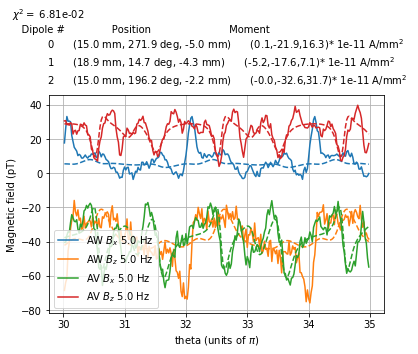

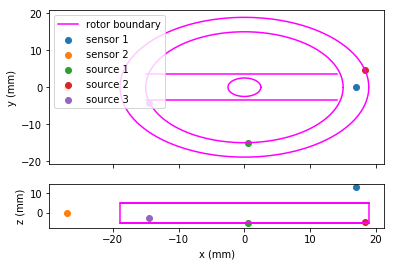

In [155]:
Opt_Settings_Exp2_5Hz_3src['plot']=1
Opt_Settings_Exp2_5Hz_3src['figname']=SaveDir+'Exp2_5Hz_3src_'+nowtext+'_1'
chi2_one_exp_one_freq(opt_res_Exp2_5Hz_3src.x,Opt_Settings_Exp2_5Hz_3src)
# Opt_Params_Exp2 = opt_res_Exp2.x

In [156]:
Opt_Params_Exp2_low_chi_5Hz_AV_3src = opt_res_Exp2_5Hz_3src.x
Opt_Params_Exp2_low_chi_5Hz_AV_3src

array([ 1.50164966e+01,  2.71899354e+02, -4.97239484e+00,  1.12973197e-01,
       -2.19378161e+01,  1.63068098e+01,  1.88710604e+01,  1.47059060e+01,
       -4.28908015e+00, -5.18128520e+00, -1.75623877e+01,  7.11754667e+00,
        1.50319869e+01,  1.96157270e+02, -2.22663271e+00, -4.04094768e-03,
       -3.26095956e+01,  3.16907756e+01,  2.18454153e+00, -4.26232565e+01,
       -3.56459174e+01,  3.01572525e+01,  6.30841850e+01])

### Change Frequency to 3 Hz

[18.8999797, 219, 3.1940126, -15.1769375, 19.5983904, 0.00895700656, 18.89993, 120, 0.532874442, 1.43448925, 5.767709, 2.28020298, -4.44562545, 37.766451]
0.020289126784494235


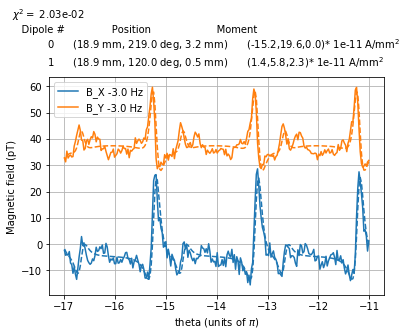

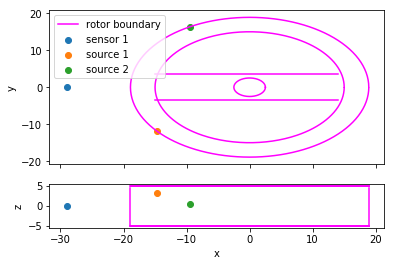

In [78]:
nu = 3
nowtext = now().strftime("%Y%m%d%H%M")
Opt_Settings_Exp1_3Hz = {'number of sources': 2,
                'location coordinate system': 'polar',
                'moment coordinate system':'polar',
                'location dimensions': 3,
                'moment dimensions': 3,
                'rotation sign':-1, # 1 for positive, -1 for negative, 0 for unknown and making it a free parameter
                'rotation frequency':nu,
                'rotor dimensions':rtr_dims,
                'time':Exp1_Time_cut[nu],
                'number of sensors':1,
                'sensor locations':[Exp1_sensor_loc],
                'sensor field order':[[0,1]],# list which order of B component of each sensor (0 for x, 1 for y, 2 for z) 
                'B data':[Exp1_X_cut[nu],Exp1_Y_cut[nu]],
                'plot':1,
                'bar location':180,
                'saveplot':1,
                'plotlabels':['B_X','B_Y'],
                'figname':SaveDir+'Exp1_3Hz_'+nowtext+'_0'
}
# Opt_Param = [Src1_loc_r,Src1_loc_theta,Src1_loc_z,Src1_m_r,Src1_m_theta,Src1_m_z,
#             Src2_loc_r,Src2_loc_theta,Src2_loc_z,Src2_m_r,Src2_m_theta,Src2_m_z,
#             DC_AW_X,DC_AW_Y,DC_AV_Y,DC_AV_X,sign]


Opt_Params_Exp1_3Hz = [ 1.88999797e+01,  219,  3.19401260e+00, -1.51769375e+01,
        1.95983904e+01,  8.95700656e-03,  1.88999300e+01,  120,
        5.32874442e-01,  1.43448925e+00,  5.76770900e+00,  2.28020298e+00,
       -4.44562545e+00,  3.77664510e+01]
chi_Exp1_3Hz = chi2_one_exp_one_freq(Opt_Params_Exp1_3Hz,Opt_Settings_Exp1_3Hz)

In [79]:
Opt_Settings_Exp1_3Hz['plot'] = 0
opt_res_Exp1_3Hz = minimize(chi2_one_exp_one_freq,Opt_Params_Exp1_3Hz,Opt_Settings_Exp1_3Hz,method = 'Nelder-Mead',options = {'maxfev': 7000,'maxiter': 7000,'adaptive':True,'xatol':0.01})

[ 1.88999797e+01  2.19000000e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.20000000e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.020289126784494235
[ 1.98449787e+01  2.19000000e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.20000000e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
Source 1 not in rotor
[ 1.88999797e+01  2.29950000e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.20000000e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.03462926135386737
[ 1.88999797e+01  2.19000000e+02  3.35371323e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.20000000e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.020308290818646105


0.01982452080558888
[ 1.88999797e+01  2.19000000e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.20826531e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.63728634e+00  3.77664510e+01]
0.019832389349131365
[ 1.88999797e+01  2.19000000e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.20826531e+02
  5.32874442e-01  1.43448925e+00  6.01636788e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.019845707096413142
[ 1.88999797e+01  2.19000000e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.20826531e+02
  5.32874442e-01  1.49633330e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.019866866335807518
[ 1.88999797e+01  2.19000000e+02  3.19401260e+00 -1.51769375e+01
  2.04433210e+01  8.95700656e-03  1.88999300e+01  1.20826531e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0

 -4.44562545e+00  3.77664510e+01]
0.01947460059639987
[ 1.88999797e+01  2.19000000e+02  3.19401260e+00 -1.51769375e+01
  2.03269275e+01  8.95700656e-03  1.88999300e+01  1.21539202e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.020396349921121777
[ 1.88999797e+01  2.19000000e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.21539202e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.91703551e+01]
0.02138292085844869
[ 1.88999797e+01  2.27140956e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.21539202e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.01997482646970612
[ 1.96025546e+01  2.19000000e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.21539202e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4

0.016814583823652383
[ 1.88999797e+01  2.19539961e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.22132567e+02
  5.48734403e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.017231701041875793
[ 1.88999797e+01  2.19539961e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.22132567e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.34806874e+00
 -4.44562545e+00  3.77664510e+01]
0.017232099220382567
[ 1.88999797e+01  2.19539961e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  9.22359426e-03  1.88999300e+01  1.22132567e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.017234470895826606
[ 1.88999797e+01  2.19539961e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.22132567e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]


0.01616955593693462
[ 1.88999797e+01  2.20005540e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.22369456e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.87356524e+01]
0.01661524123654555
[ 1.93850104e+01  2.20005540e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.22369456e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
Source 1 not in rotor
[ 1.88999797e+01  2.20005540e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.93849594e+01  1.22369456e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
Source 2 not in rotor
[ 1.89692698e+01  2.20808426e+02  3.20572232e+00 -1.52325784e+01
  1.96702410e+01  8.98984426e-03  1.84149006e+01  1.22809394e+02
  5.34828038e-01  1.43974830e+00  5.78885427e+00  2.28856254e+00
 -4.46192376e+00  3.79049083e+01]


Source 1 not in rotor
[ 1.88999797e+01  2.20724451e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.92882717e+01  1.22589425e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
Source 2 not in rotor
[ 1.89554572e+01  2.21367287e+02  3.20338806e+00 -1.52214867e+01
  1.96559180e+01  8.98329826e-03  1.85115883e+01  1.22941663e+02
  5.34438600e-01  1.43869994e+00  5.78463908e+00  2.28689611e+00
 -4.45867479e+00  3.78773077e+01]
Source 1 not in rotor
[ 1.89079051e+01  2.20816285e+02  3.19535195e+00 -1.51833017e+01
  1.96066086e+01  8.96076252e-03  1.91773169e+01  1.22639745e+02
  5.33097893e-01  1.43509078e+00  5.77012758e+00  2.28115914e+00
 -4.44748964e+00  3.77822877e+01]
Source 1 not in rotor
[ 1.88999797e+01  2.20724451e+02  3.19401260e+00 -1.54665073e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.22765544e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+

0.012905367281959899
[ 1.88999797e+01  2.21001592e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.22929083e+02
  5.41640910e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.013052562169967426
[ 1.88999797e+01  2.21001592e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.22929083e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.31771524e+00
 -4.44562545e+00  3.77664510e+01]
0.01305270252956792
[ 1.88999797e+01  2.21001592e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.22929083e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.51876169e+00  3.77664510e+01]
0.013053123017839091
[ 1.88999797e+01  2.21001592e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  9.10436080e-03  1.88999300e+01  1.22929083e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0

0.012535231285134766
[ 1.88999797e+01  2.21258937e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23060022e+02
  5.32874442e-01  1.43448925e+00  5.84952415e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.012537079635446905
[ 1.88999797e+01  2.21258937e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23060022e+02
  5.32874442e-01  1.45483753e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.012546091941870013
[ 1.88999797e+01  2.21258937e+02  3.23931978e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23060022e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.012553371012905755
[ 1.88999797e+01  2.21258937e+02  3.19401260e+00 -1.51769375e+01
  1.98763942e+01  8.95700656e-03  1.88999300e+01  1.23060022e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]


0.011893389635773738
[ 1.88999797e+01  2.21656309e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23181608e+02
  5.32874442e-01  1.43448925e+00  5.83321479e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.01189465473190197
[ 1.88999797e+01  2.21656309e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23181608e+02
  5.32874442e-01  1.45078122e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.011901722226003657
[ 1.88999797e+01  2.21656309e+02  3.23028806e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23181608e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.011907467963412657
[ 1.88999797e+01  2.21656309e+02  3.19401260e+00 -1.51769375e+01
  1.98209758e+01  8.95700656e-03  1.88999300e+01  1.23181608e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0

0.011582879953969115
[ 1.88999797e+01  2.21809497e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23369352e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.48605093e+00  3.77664510e+01]
0.011633357907975157
[ 1.88999797e+01  2.21809497e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23369352e+02
  5.37720038e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.011634476120970343
[ 1.88999797e+01  2.21809497e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23369352e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.30093759e+00
 -4.44562545e+00  3.77664510e+01]
0.011634531958982876
[ 1.88999797e+01  2.21809497e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  9.03845545e-03  1.88999300e+01  1.23369352e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]


0.01145502060789754
[ 1.88999797e+01  2.21951742e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23441727e+02
  5.32874442e-01  1.44573660e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.011459757116455117
[ 1.88999797e+01  2.21951742e+02  3.21905578e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23441727e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.011463499280027198
[ 1.88999797e+01  2.21951742e+02  3.19401260e+00 -1.51769375e+01
  1.97520548e+01  8.95700656e-03  1.88999300e+01  1.23441727e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.011501557555482243
[ 1.88999797e+01  2.21951742e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23441727e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.80625651e+01]
0

0.011230815856199646
[ 1.88999797e+01  2.22171386e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  9.01323574e-03  1.88999300e+01  1.23508933e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.011231152384344764
[ 1.88999797e+01  2.22171386e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23508933e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.011231158156444244
[ 1.88999797e+01  2.22171386e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23508933e+02
  5.32874442e-01  1.43448925e+00  5.80391681e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.011231515717606722
[ 1.88999797e+01  2.22171386e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23508933e+02
  5.32874442e-01  1.44349451e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]


Source 1 not in rotor
[ 1.89020675e+01  2.22195579e+02  3.19436543e+00 -1.51786141e+01
  1.96005554e+01  8.95799602e-03  1.89730038e+01  1.23625963e+02
  5.32933307e-01  1.43464771e+00  5.76834614e+00  2.28045487e+00
 -4.44611655e+00  3.77706230e+01]
Source 1 not in rotor
[ 1.88999797e+01  2.22256059e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.24215858e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010938946974072375
[ 1.88999797e+01  2.22256059e+02  3.19401260e+00 -1.52532207e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23612707e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.011111729539862194
[ 1.88999797e+01  2.22256059e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23612707e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.46797031e+00  3.77664510e+01

0.011063741236814122
[ 1.88999797e+01  2.22334684e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23652712e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.011063744459671515
[ 1.88999797e+01  2.22334684e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23652712e+02
  5.32874442e-01  1.43448925e+00  5.79270548e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.01106389623408786
[ 1.88999797e+01  2.22334684e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23652712e+02
  5.32874442e-01  1.44070613e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.011066413347828395
[ 1.88999797e+01  2.22334684e+02  3.20785502e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23652712e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0

0.011015098599712884
[ 1.88999797e+01  2.22397636e+02  3.20594816e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23689859e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.011016364294406783
[ 1.88999797e+01  2.22397636e+02  3.19401260e+00 -1.51769375e+01
  1.96716267e+01  8.95700656e-03  1.88999300e+01  1.23689859e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.011025356594203393
[ 1.88999797e+01  2.22397636e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23689859e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.79075787e+01]
0.011030683528076379
[ 1.89706062e+01  2.22397636e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23689859e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]


0.0109615401494884
[ 1.88999797e+01  2.22456091e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23747219e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.01096154197835312
[ 1.88999797e+01  2.22456091e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23747219e+02
  5.32874442e-01  1.43448925e+00  5.78496561e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010961607441177974
[ 1.88999797e+01  2.22456091e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23747219e+02
  5.32874442e-01  1.43878115e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010963313581170801
[ 1.88999797e+01  2.22456091e+02  3.20356888e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23747219e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.0

0.010918571967524602
[ 1.88999797e+01  2.22546353e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23747219e+02
  5.32874442e-01  1.43448925e+00  5.78258842e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010918632431846273
[ 1.88999797e+01  2.22546353e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23747219e+02
  5.32874442e-01  1.43818992e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010920097638955325
[ 1.88999797e+01  2.22546353e+02  3.20225245e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23747219e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010920790951513602
[ 1.88999797e+01  2.22546353e+02  3.19401260e+00 -1.51769375e+01
  1.96489499e+01  8.95700656e-03  1.88999300e+01  1.23747219e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]


0.010910026859609234
[ 1.88999797e+01  2.22546353e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23789865e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.78504588e+01]
0.010910325477850893
[ 1.89420209e+01  2.22546353e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23789865e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
Source 1 not in rotor
[ 1.88999797e+01  2.22546353e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.89419710e+01  1.23789865e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
Source 2 not in rotor
[ 1.89059856e+01  2.22615945e+02  3.19502757e+00 -1.51817603e+01
  1.96046182e+01  8.95985284e-03  1.88578890e+01  1.23827997e+02
  5.33043774e-01  1.43494509e+00  5.76954181e+00  2.28092756e+00
 -4.44703814e+00  3.77784521e+01

0.010872366228894693
[ 1.88999797e+01  2.22613460e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23806304e+02
  5.32874442e-01  1.43448925e+00  5.77798118e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010872393809391636
[ 1.88999797e+01  2.22613460e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23806304e+02
  5.32874442e-01  1.43704405e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010873393190469996
[ 1.88999797e+01  2.22613460e+02  3.19970108e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23806304e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010873818095283367
[ 1.88999797e+01  2.22613460e+02  3.19401260e+00 -1.51769375e+01
  1.96332948e+01  8.95700656e-03  1.88999300e+01  1.23806304e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]


0.010860775955284433
[ 1.88999797e+01  2.22639329e+02  3.19401260e+00 -1.51769375e+01
  1.96284865e+01  8.95700656e-03  1.88999300e+01  1.23821570e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010861273827251047
[ 1.89290033e+01  2.22639329e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23821570e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
Source 1 not in rotor
[ 1.88999797e+01  2.22639329e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.89289535e+01  1.23821570e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
Source 2 not in rotor
[ 1.89041259e+01  2.22687373e+02  3.19471329e+00 -1.51802670e+01
  1.96026898e+01  8.95897152e-03  1.88709065e+01  1.23847895e+02
  5.32991343e-01  1.43480394e+00  5.76897430e+00  2.28070320e+00
 -4.44660072e+00  3.77747361e+01

0.010842744468348374
[ 1.88999797e+01  2.22663351e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23845142e+02
  5.32874442e-01  1.43625298e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010843428484623068
[ 1.88999797e+01  2.22663351e+02  3.19793970e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23845142e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010843691736549284
[ 1.88999797e+01  2.22663351e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23845142e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.78128856e+01]
0.010844207889741048
[ 1.88999797e+01  2.22663351e+02  3.19401260e+00 -1.51769375e+01
  1.96224870e+01  8.95700656e-03  1.88999300e+01  1.23845142e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]


0.010828737098235786
[ 1.88999797e+01  2.22700444e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23854229e+02
  5.32874442e-01  1.43448925e+00  5.77338687e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010828746775335275
[ 1.88999797e+01  2.22700444e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23854229e+02
  5.32874442e-01  1.43590139e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010829292677405634
[ 1.88999797e+01  2.22700444e+02  3.19715686e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23854229e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010829482059555808
[ 1.88999797e+01  2.22700444e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23854229e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.78036292e+01]


0.010822577881850731
[ 1.88999797e+01  2.22715843e+02  3.19401260e+00 -1.51769375e+01
  1.96150258e+01  8.95700656e-03  1.88999300e+01  1.23862064e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010823317259902418
[ 1.89160223e+01  2.22715843e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23862064e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
Source 1 not in rotor
[ 1.88999797e+01  2.22715843e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.89159725e+01  1.23862064e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
Source 2 not in rotor
[ 1.89022715e+01  2.22742399e+02  3.19439990e+00 -1.51787778e+01
  1.96007669e+01  8.95809268e-03  1.88838875e+01  1.23876615e+02
  5.32939058e-01  1.43466319e+00  5.76840839e+00  2.28047948e+00
 -4.44616452e+00  3.77710305e+01

0.010814479192525725
[ 1.88999797e+01  2.22728172e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23875613e+02
  5.32874442e-01  1.43448925e+00  5.77162878e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010814484075661452
[ 1.88999797e+01  2.22728172e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23875613e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77921174e+01]
0.010814762200361207
[ 1.88999797e+01  2.22728172e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23875613e+02
  5.32874442e-01  1.43546414e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.01081485908444025
[ 1.88999797e+01  2.22728172e+02  3.19618328e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23875613e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0

0.010807704343778679
[ 1.88999797e+01  2.22748675e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23880636e+02
  5.33164396e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010807870473951884
[ 1.88999797e+01  2.22748675e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23880636e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28144371e+00
 -4.44562545e+00  3.77664510e+01]
0.010807872450879698
[ 1.88999797e+01  2.22748675e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.96188035e-03  1.88999300e+01  1.23880636e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010807897623776076
[ 1.88999797e+01  2.22748675e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23880636e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]


0.010804569644604342
[ 1.88999797e+01  2.22757187e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23884967e+02
  5.32874442e-01  1.43448925e+00  5.77041507e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010804572614092052
[ 1.88999797e+01  2.22757187e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23884967e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77841701e+01]
0.010804624203545268
[ 1.88999797e+01  2.22757187e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23884967e+02
  5.32874442e-01  1.43516228e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010804830738211424
[ 1.88999797e+01  2.22757187e+02  3.19551115e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23884967e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]


0.010800123265989166
[ 1.88999797e+01  2.22764002e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23892456e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44729544e+00  3.77664510e+01]
0.010800539243158182
[ 1.88999797e+01  2.22764002e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23892456e+02
  5.33074615e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010800655300977924
[ 1.88999797e+01  2.22764002e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23892456e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28105953e+00
 -4.44562545e+00  3.77664510e+01]
0.010800656644995557
[ 1.88999797e+01  2.22764002e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.96037124e-03  1.88999300e+01  1.23892456e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]


0.010798453631950304
[ 1.88999797e+01  2.22775334e+02  3.19504714e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23892456e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010798502029376432
[ 1.88999797e+01  2.22775334e+02  3.19401260e+00 -1.51769375e+01
  1.96047383e+01  8.95700656e-03  1.88999300e+01  1.23892456e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010798661089681263
[ 1.89061014e+01  2.22775334e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23892456e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
Source 1 not in rotor
[ 1.88999797e+01  2.22775334e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.89060517e+01  1.23892456e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]

0.010795653882288403
[ 1.88999797e+01  2.22780039e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23897626e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28079431e+00
 -4.44562545e+00  3.77664510e+01]
0.010795654804206216
[ 1.88999797e+01  2.22780039e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95932941e-03  1.88999300e+01  1.23897626e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010795666716560376
[ 1.88999797e+01  2.22780039e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23897626e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010795666781647955
[ 1.88999797e+01  2.22780039e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23897626e+02
  5.32874442e-01  1.43448925e+00  5.76920476e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]


Source 2 not in rotor
[ 1.89005834e+01  2.22790802e+02  3.19411463e+00 -1.51774223e+01
  1.95990165e+01  8.95729268e-03  1.88957038e+01  1.23903682e+02
  5.32891464e-01  1.43453507e+00  5.76789324e+00  2.28027582e+00
 -4.44576746e+00  3.77676574e+01]
Source 1 not in rotor
[ 1.89000659e+01  2.22784806e+02  3.19402718e+00 -1.51770068e+01
  1.95984798e+01  8.95704743e-03  1.89029487e+01  1.23900396e+02
  5.32876874e-01  1.43449580e+00  5.76773532e+00  2.28021339e+00
 -4.44564574e+00  3.77666233e+01]
Source 1 not in rotor
[ 1.88999797e+01  2.22829279e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23901765e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010785616816938915
[ 1.88999797e+01  2.22783806e+02  3.19401260e+00 -1.51800888e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23901765e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+0

 -4.44562545e+00  3.77664510e+01]
0.010792367753005757
[ 1.88999797e+01  2.22790070e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23901765e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28061121e+00
 -4.44562545e+00  3.77664510e+01]
0.01079236838611618
[ 1.88999797e+01  2.22790070e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95861016e-03  1.88999300e+01  1.23901765e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010792376596376486
[ 1.88999797e+01  2.22790070e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23901765e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.0107923766392861
[ 1.88999797e+01  2.22790070e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23901765e+02
  5.32874442e-01  1.43448925e+00  5.76874161e+00  2.28020298e+00
 -4

0.010791428335324283
[ 1.88999797e+01  2.22790070e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95838926e-03  1.88999300e+01  1.23904725e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010791435404320883
[ 1.88999797e+01  2.22790070e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23904725e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.01079143544132195
[ 1.88999797e+01  2.22790070e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23904725e+02
  5.32874442e-01  1.43448925e+00  5.76859936e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010791436068562412
[ 1.88999797e+01  2.22790070e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23904725e+02
  5.32874442e-01  1.43471069e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0

 -4.44562545e+00  3.77664510e+01]
0.010790027502088621
[ 1.88999797e+01  2.22794727e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23905866e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44617492e+00  3.77664510e+01]
0.010790145819589994
[ 1.88999797e+01  2.22794727e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23905866e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77711188e+01]
0.010790144236766273
[ 1.88999797e+01  2.22794727e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23905866e+02
  5.32940304e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010790184663797978
[ 1.88999797e+01  2.22794727e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23905866e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28048481e+00


0.010789518300486795
[ 1.88999797e+01  2.22796661e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23906849e+02
  5.32874442e-01  1.43448925e+00  5.76832367e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010789518713297117
[ 1.88999797e+01  2.22796661e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23906849e+02
  5.32874442e-01  1.43464213e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010789577009993896
[ 1.88999797e+01  2.22796661e+02  3.19435299e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23906849e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010789591633877852
[ 1.88999797e+01  2.22796661e+02  3.19401260e+00 -1.51769375e+01
  1.96004790e+01  8.95700656e-03  1.88999300e+01  1.23906849e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]


0.010788661371651123
[ 1.88999797e+01  2.22798209e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23908550e+02
  5.32919911e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.01078868825877399
[ 1.88999797e+01  2.22798209e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23908550e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28039754e+00
 -4.44562545e+00  3.77664510e+01]
0.010788688557809444
[ 1.88999797e+01  2.22798209e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95777084e-03  1.88999300e+01  1.23908550e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.01078869245899839
[ 1.88999797e+01  2.22798209e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23908550e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.

0.01078821954979071
[ 1.88999797e+01  2.22800783e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95766555e-03  1.88999300e+01  1.23908550e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010788222913894854
[ 1.88999797e+01  2.22800783e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23908550e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.01078822293064015
[ 1.88999797e+01  2.22800783e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23908550e+02
  5.32874442e-01  1.43448925e+00  5.76813335e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010788223203034682
[ 1.88999797e+01  2.22800783e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23908550e+02
  5.32874442e-01  1.43459479e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.

0.010787873089685426
[ 1.88999797e+01  2.22801852e+02  3.19401260e+00 -1.51769375e+01
  1.95996337e+01  8.95700656e-03  1.88999300e+01  1.23909181e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010787896016341217
[ 1.89011787e+01  2.22801852e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23909181e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
Source 1 not in rotor
[ 1.88999797e+01  2.22801852e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.89011290e+01  1.23909181e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
Source 2 not in rotor
[ 1.89001510e+01  2.22803836e+02  3.19404155e+00 -1.51770750e+01
  1.95985680e+01  8.95708773e-03  1.88987310e+01  1.23910269e+02
  5.32879271e-01  1.43450225e+00  5.76776127e+00  2.28022364e+00
 -4.44566574e+00  3.77667933e+01

0.010787318649875182
[ 1.88999797e+01  2.22802707e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23910230e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44585125e+00  3.77664510e+01]
0.01078732450164613
[ 1.88999797e+01  2.22802707e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23910230e+02
  5.32901508e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010787340543325249
[ 1.88999797e+01  2.22802707e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23910230e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28031880e+00
 -4.44562545e+00  3.77664510e+01]
0.010787340720948032
[ 1.88999797e+01  2.22802707e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95746150e-03  1.88999300e+01  1.23910230e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0

0.010787118029872455
[ 1.89008074e+01  2.22803502e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23910634e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
Source 1 not in rotor
[ 1.88999797e+01  2.22803502e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.89007577e+01  1.23910634e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
Source 2 not in rotor
[ 1.89000979e+01  2.22804872e+02  3.19403258e+00 -1.51770325e+01
  1.95985130e+01  8.95706260e-03  1.88991023e+01  1.23911385e+02
  5.32877776e-01  1.43449822e+00  5.76774509e+00  2.28021725e+00
 -4.44565326e+00  3.77666873e+01]
Source 1 not in rotor
[ 1.88999966e+01  2.22803698e+02  3.19401545e+00 -1.51769511e+01
  1.95984079e+01  8.95701457e-03  1.89005212e+01  1.23910741e+02
  5.32874918e-01  1.43449053e+00  5.76771416e+00  2.28020502e+00
 -4.44562942e+00  3.77664848e+0

0.010786719848903536
[ 1.88999797e+01  2.22804138e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23911333e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44578133e+00  3.77664510e+01]
0.010786724664403712
[ 1.88999797e+01  2.22804138e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23911333e+02
  5.32893127e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.01078673575088034
[ 1.88999797e+01  2.22804138e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23911333e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28028293e+00
 -4.44562545e+00  3.77664510e+01]
0.010786735873324313
[ 1.88999797e+01  2.22804138e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95732064e-03  1.88999300e+01  1.23911333e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0

0.010786550012822117
[ 1.88999797e+01  2.22805196e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23911333e+02
  5.32874442e-01  1.43453262e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010786566531631119
[ 1.88999797e+01  2.22805196e+02  3.19410917e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23911333e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010786570525590308
[ 1.88999797e+01  2.22805196e+02  3.19401260e+00 -1.51769375e+01
  1.95989829e+01  8.95700656e-03  1.88999300e+01  1.23911333e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010786580959175196
[ 1.89005511e+01  2.22805196e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23911333e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]


0.010786288504050948
[ 1.88999797e+01  2.22805635e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23911816e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77673652e+01]
0.010786306695083465
[ 1.88999797e+01  2.22805635e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23911816e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44573307e+00  3.77664510e+01]
0.010786310389199603
[ 1.88999797e+01  2.22805635e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23911816e+02
  5.32887341e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010786318048363865
[ 1.88999797e+01  2.22805635e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23911816e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28025818e+00
 -4.44562545e+00  3.77664510e+01]


0.010785396456560854
[ 1.88999797e+01  2.22805987e+02  3.19401260e+00 -1.51772317e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912202e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010786110129553442
[ 1.88999797e+01  2.22805987e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912202e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77671830e+01]
0.01078612453002017
[ 1.88999797e+01  2.22805987e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912202e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44571161e+00  3.77664510e+01]
0.010786127619288158
[ 1.88999797e+01  2.22805987e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912202e+02
  5.32884770e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0

0.01078603195596788
[ 1.88999797e+01  2.22806571e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912202e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010786031959662433
[ 1.88999797e+01  2.22806571e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912202e+02
  5.32874442e-01  1.43448925e+00  5.76780539e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.01078603201454203
[ 1.88999797e+01  2.22806571e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912202e+02
  5.32874442e-01  1.43451322e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010786041143152902
[ 1.88999797e+01  2.22806571e+02  3.19406598e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912202e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.

0.010785959013593624
[ 1.89002520e+01  2.22806571e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912478e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
Source 1 not in rotor
[ 1.88999797e+01  2.22806571e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.89002023e+01  1.23912478e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
Source 2 not in rotor
[ 1.89000186e+01  2.22807022e+02  3.19401917e+00 -1.51769687e+01
  1.95984307e+01  8.95702500e-03  1.88996577e+01  1.23912725e+02
  5.32875539e-01  1.43449220e+00  5.76772087e+00  2.28020767e+00
 -4.44563460e+00  3.77665287e+01]
Source 1 not in rotor
[ 1.88999853e+01  2.22806636e+02  3.19401354e+00 -1.51769420e+01
  1.95983962e+01  8.95700919e-03  1.89001245e+01  1.23912514e+02
  5.32874599e-01  1.43448967e+00  5.76771070e+00  2.28020365e+00
 -4.44562676e+00  3.77664621e+0

0.01078539532235084
[ 1.88999797e+01  2.22807006e+02  3.19401260e+00 -1.51771126e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912585e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010785819799066877
[ 1.88999797e+01  2.22807006e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912585e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77668867e+01]
0.010785828186120127
[ 1.88999797e+01  2.22807006e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912585e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44567674e+00  3.77664510e+01]
0.010785830152338154
[ 1.88999797e+01  2.22807006e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912585e+02
  5.32880590e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0

0.010785773678022924
[ 1.88999797e+01  2.22807186e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912677e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.01078577368021525
[ 1.88999797e+01  2.22807186e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912677e+02
  5.32874442e-01  1.43448925e+00  5.76776638e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010785773712319605
[ 1.88999797e+01  2.22807186e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912677e+02
  5.32874442e-01  1.43450352e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010785779145596605
[ 1.88999797e+01  2.22807186e+02  3.19404437e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912677e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0

0.010785698089454235
[ 1.88999797e+01  2.22807331e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912835e+02
  5.32874442e-01  1.43450068e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010785702439484337
[ 1.88999797e+01  2.22807331e+02  3.19403804e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912835e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.01078570348182357
[ 1.88999797e+01  2.22807331e+02  3.19401260e+00 -1.51769375e+01
  1.95985465e+01  8.95700656e-03  1.88999300e+01  1.23912835e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010785706147223692
[ 1.89001302e+01  2.22807331e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912835e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
S

[ 1.88999797e+01  2.22809075e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912835e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
[ 1.88999797e+01  2.22809075e+02  3.19401260e+00 -1.51769375e+01
  1.95983904e+01  8.95700656e-03  1.88999300e+01  1.23912835e+02
  5.32874442e-01  1.43448925e+00  5.76770900e+00  2.28020298e+00
 -4.44562545e+00  3.77664510e+01]
0.010785394845985079


0.010785394845985079

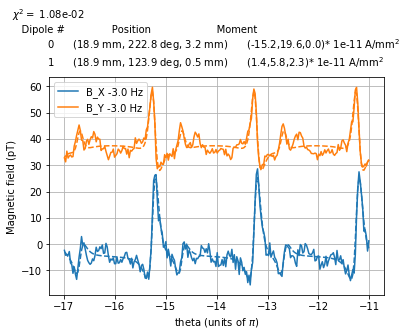

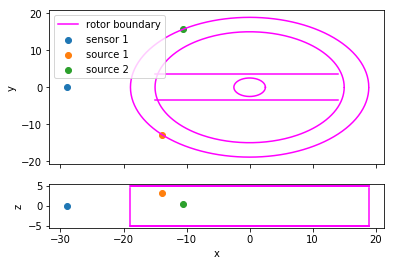

In [80]:
Opt_Settings_Exp1_3Hz['plot'] = 1
Opt_Settings_Exp1_3Hz['figname']=SaveDir+'Exp1_3Hz_'+nowtext+'_1'
print(opt_res_Exp1_3Hz.x)
# Opt_Params_Exp1 = opt_res_Exp1_3Hz.x
chi2_one_exp_one_freq(opt_res_Exp1_3Hz.x,Opt_Settings_Exp1_3Hz)

In [81]:
Opt_Params_Exp1_low_chi_3Hz = opt_res_Exp1_3Hz.x

[7.75414445, 0, 4.99882085, 150.800169, -63.1709291, 24.6787424, 6.82284505, 0, 0.619257936, -118.699741, 6.3692423, -142.781459, -0.0829898675, 12.3052518, -33.7580358, -27.1625091]
0.5255926160627307


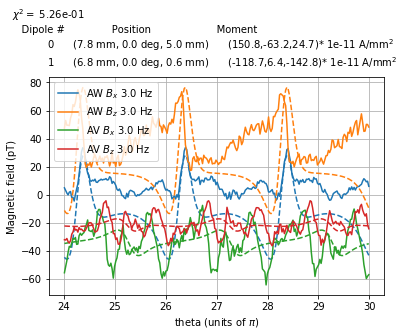

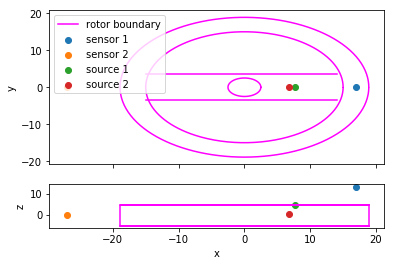

In [85]:
nu = 3
nowtext = now().strftime("%Y%m%d%H%M")
Opt_Settings_Exp2_3Hz = {'number of sources': 2,
                'location coordinate system': 'polar',
                'moment coordinate system':'polar',
                'location dimensions': 3,
                'moment dimensions': 3,
                'rotation sign':1, # 1 for positive, -1 for negative, 0 for unknown and making it a free parameter
                'rotation frequency':nu,
                'rotor dimensions':rtr_dims,
                'time':Exp2_Time_cut[nu],
                'number of sensors':2,
                'sensor locations':[Exp2_AW_sensor_loc,Exp2_AV_sensor_loc],
                'sensor field order':[[0,2],
                                     [0,2]],# list which order of B component of each sensor (0 for x, 1 for y, 2 for z) 
                'B data':[Exp2_AW_X_cut[nu],Exp2_AW_Z_cut[nu],
                         Exp2_AV_X_cut[nu],Exp2_AV_Z_cut[nu]],
                'plot':1,
                'bar location':300,
                'saveplot':1,
                'plotlabels':['AW $B_x$','AW $B_z$','AV $B_x$', 'AV $B_z$'],
                'figname':SaveDir+'Exp2_3Hz_'+nowtext+'_0'
                         
}
Opt_Params_Exp2_3Hz = [ 7.75414445e+00, 0,  4.99882085e+00 , 1.50800169e+02,
 -6.31709291e+01 , 2.46787424e+01,  6.82284505e+00, 0,
  6.19257936e-01, -1.18699741e+02,  6.36924230e+00, -1.42781459e+02,
 -8.29898675e-02,  1.23052518e+01, -3.37580358e+01, -2.71625091e+01]

chi_Exp2_3Hz = chi2_one_exp_one_freq(Opt_Params_Exp2_3Hz,Opt_Settings_Exp2_3Hz)

In [86]:
Opt_Settings_Exp2_3Hz['plot'] = 0
opt_res_Exp2_3Hz = minimize(chi2_one_exp_one_freq,Opt_Params_Exp2_3Hz,Opt_Settings_Exp2_3Hz,method = 'Nelder-Mead',options = {'maxfev': 5000,'maxiter': 5000,'adaptive':True})

[ 7.75414445e+00  0.00000000e+00  4.99882085e+00  1.50800169e+02
 -6.31709291e+01  2.46787424e+01  6.82284505e+00  0.00000000e+00
  6.19257936e-01 -1.18699741e+02  6.36924230e+00 -1.42781459e+02
 -8.29898675e-02  1.23052518e+01 -3.37580358e+01 -2.71625091e+01]
0.5255926160627307
[ 8.14185167e+00  0.00000000e+00  4.99882085e+00  1.50800169e+02
 -6.31709291e+01  2.46787424e+01  6.82284505e+00  0.00000000e+00
  6.19257936e-01 -1.18699741e+02  6.36924230e+00 -1.42781459e+02
 -8.29898675e-02  1.23052518e+01 -3.37580358e+01 -2.71625091e+01]
0.5513873239922512
[ 7.75414445e+00  2.50000000e-04  4.99882085e+00  1.50800169e+02
 -6.31709291e+01  2.46787424e+01  6.82284505e+00  0.00000000e+00
  6.19257936e-01 -1.18699741e+02  6.36924230e+00 -1.42781459e+02
 -8.29898675e-02  1.23052518e+01 -3.37580358e+01 -2.71625091e+01]
0.5255890161736979
[ 7.75414445e+00  0.00000000e+00  5.24876189e+00  1.50800169e+02
 -6.31709291e+01  2.46787424e+01  6.82284505e+00  0.00000000e+00
  6.19257936e-01 -1.18699741e+

0.5045740022280157
[ 7.57863456e+00  7.44522872e-05  5.11409992e+00  1.49413271e+02
 -6.23830416e+01  2.50984336e+01  6.93887561e+00  7.29207616e-05
  6.18935980e-01 -1.20718371e+02  6.38768034e+00 -1.40474521e+02
 -8.27649096e-02  1.25145172e+01 -3.35458508e+01 -2.70219357e+01]
Source 1 not in rotor
[ 7.74944026e+00  3.70094695e-05  4.85757399e+00  1.51133278e+02
 -6.32671153e+01  2.48687544e+01  6.87537699e+00  3.67940987e-05
  6.22499635e-01 -1.19613660e+02  6.40564260e+00 -1.42888622e+02
 -8.33987366e-02  1.23999951e+01 -3.38531996e+01 -2.72869175e+01]
0.5209109487508984
[ 7.60129237e+00  1.09960934e-04  4.91322024e+00  1.50069475e+02
 -6.26359176e+01  2.38864339e+01  6.98758335e+00  1.08402487e-04
  6.23166035e-01 -1.21565759e+02  6.43156995e+00 -1.40990114e+02
 -8.33286045e-02  1.26023634e+01 -3.37032034e+01 -2.72052558e+01]
0.5045652289827902
[ 7.59173911e+00  1.16833492e-04  4.90787020e+00  1.50023806e+02
 -6.26024794e+01  2.37597936e+01  6.99787950e+00  1.15177642e-04
  6.2341

0.4914244365053576
[ 7.34684328e+00  1.83164019e-04  4.86462114e+00  1.49172516e+02
 -6.09232172e+01  2.49915167e+01  6.97393803e+00  1.72858062e-04
  6.16452289e-01 -1.20841812e+02  6.41091042e+00 -1.45037238e+02
 -8.32658033e-02  1.26531159e+01 -3.36935196e+01 -2.71991697e+01]
0.49497708187433004
[ 7.36145536e+00  1.55120600e-04  4.88129845e+00  1.50697255e+02
 -6.15371428e+01  2.47791918e+01  6.92331498e+00  1.43526399e-04
  6.48980133e-01 -1.19900284e+02  6.35123047e+00 -1.39745080e+02
 -8.36947978e-02  1.25712357e+01 -3.39911287e+01 -2.73836033e+01]
0.49041813028589154
[ 7.34320027e+00  1.59773173e-04  4.87777798e+00  1.50720104e+02
 -6.14567938e+01  2.47605815e+01  6.92271356e+00  1.47454334e-04
  6.52390332e-01 -1.19855610e+02  6.34368139e+00 -1.39628643e+02
 -8.37240493e-02  1.25754499e+01 -3.40077408e+01 -2.73953939e+01]
0.48937850055673543
[ 7.26979794e+00  2.05367606e-04  4.84976620e+00  1.48698562e+02
 -6.43353946e+01  2.49388532e+01  6.97711136e+00  1.92233550e-04
  6.2203

0.4680887390417855
[ 7.21770626e+00  2.77135391e-04  4.79065081e+00  1.51117799e+02
 -6.03577884e+01  2.52679165e+01  6.95197219e+00  2.66049853e-04
  6.25761008e-01 -1.21630040e+02  6.52395564e+00 -1.34820804e+02
 -8.43395966e-02  1.28410789e+01 -3.40651804e+01 -2.74351316e+01]
0.46818613631204176
[ 7.16848549e+00  2.65163976e-04  4.78826019e+00  1.51557408e+02
 -6.05397010e+01  2.54966012e+01  6.97566076e+00  2.64894010e-04
  6.26704048e-01 -1.22393535e+02  6.09768513e+00 -1.35214766e+02
 -8.45111415e-02  1.28804848e+01 -3.40909519e+01 -2.74608947e+01]
0.46793113527621444
[ 7.16015294e+00  2.69318707e-04  4.78376607e+00  1.51649272e+02
 -6.04760431e+01  2.55578593e+01  6.98058487e+00  2.69929349e-04
  6.26879012e-01 -1.22599851e+02  6.05965642e+00 -1.35021205e+02
 -8.45683514e-02  1.28994262e+01 -3.40978050e+01 -2.74667239e+01]
0.4668699237977431
[ 7.16644342e+00  2.78700018e-04  4.77895914e+00  1.51604127e+02
 -6.04572181e+01  2.38627605e+01  7.02478519e+00  2.81841010e-04
  6.27477

[ 6.81281995e+00  4.56542539e-04  4.68186260e+00  1.53074390e+02
 -5.85078878e+01  2.44448579e+01  6.87174281e+00  4.29728812e-04
  6.35413598e-01 -1.17937625e+02  6.56187884e+00 -1.27743475e+02
 -8.57030798e-02  1.34003255e+01 -3.42868005e+01 -2.74003816e+01]
0.43967970064485284
[ 6.79111164e+00  4.68244028e-04  4.67549363e+00  1.53163459e+02
 -5.83848780e+01  2.43752954e+01  6.86494018e+00  4.39716278e-04
  6.35947010e-01 -1.17646236e+02  6.59326774e+00 -1.27288617e+02
 -8.57740003e-02  1.34316317e+01 -3.42986127e+01 -2.73962352e+01]
0.43810107107974167
[ 6.77509932e+00  4.46737377e-04  4.70677759e+00  1.53248528e+02
 -5.84552892e+01  2.50768130e+01  6.70213953e+00  4.07356831e-04
  6.33949741e-01 -1.25497911e+02  6.30657620e+00 -1.27739544e+02
 -8.55044253e-02  1.31918557e+01 -3.44325640e+01 -2.74150761e+01]
0.43915228580442434
[ 6.83353004e+00  4.39842838e-04  4.74052613e+00  1.52966042e+02
 -5.82026173e+01  2.49711575e+01  7.18061776e+00  3.82163011e-04
  6.30527184e-01 -1.2038235

0.4129127217041127
[ 6.60207652e+00  6.04195498e-04  4.54178102e+00  1.53364328e+02
 -5.59796255e+01  2.52841472e+01  6.85288801e+00  4.86290721e-04
  6.47990141e-01 -1.20005354e+02  6.23609291e+00 -1.21120155e+02
 -8.74832518e-02  1.40843954e+01 -3.36746550e+01 -2.76319294e+01]
0.4114971874226734
[ 6.62531792e+00  5.74172709e-04  4.56812561e+00  1.52323039e+02
 -5.59911452e+01  2.51541730e+01  6.81776917e+00  5.27735983e-04
  6.43788214e-01 -1.19512514e+02  6.20872845e+00 -1.20282232e+02
 -8.65391916e-02  1.41278762e+01 -3.60041921e+01 -2.68800256e+01]
0.41080408002041086
[ 6.61810927e+00  5.79497268e-04  4.56481347e+00  1.52161870e+02
 -5.58791826e+01  2.51569772e+01  6.80727276e+00  5.30353743e-04
  6.44524001e-01 -1.19425635e+02  6.20592568e+00 -1.19819277e+02
 -8.65912376e-02  1.41792573e+01 -3.61859006e+01 -2.67911931e+01]
0.4093829755230966
[ 6.53784680e+00  5.99233189e-04  4.61204708e+00  1.53132709e+02
 -5.54147281e+01  2.51557944e+01  6.81337239e+00  6.36822090e-04
  6.459522

0.38132025062402647
[ 6.31388950e+00  8.64991440e-04  4.36724601e+00  1.48808759e+02
 -5.22936619e+01  2.51626557e+01  6.85331104e+00  8.11012477e-04
  6.54191288e-01 -1.19327764e+02  6.09019672e+00 -1.10987400e+02
 -8.98002261e-02  1.46335073e+01 -3.51926611e+01 -2.81095899e+01]
0.3824815616962804
[ 6.46196330e+00  7.89192661e-04  4.46239285e+00  1.54955301e+02
 -5.22028514e+01  2.50403452e+01  6.74578284e+00  7.11904366e-04
  6.37264795e-01 -1.18917787e+02  6.05252791e+00 -1.12117803e+02
 -8.67050394e-02  1.52038397e+01 -3.51881869e+01 -2.84431475e+01]
0.3785208802683641
[ 6.46261215e+00  7.95298883e-04  4.46313109e+00  1.54979806e+02
 -5.20372649e+01  2.50218066e+01  6.73332993e+00  7.13558848e-04
  6.35941496e-01 -1.18843161e+02  6.04025207e+00 -1.11859935e+02
 -8.65910681e-02  1.53021375e+01 -3.52217064e+01 -2.85354854e+01]
0.3770427099059906
[ 6.38506352e+00  8.97349491e-04  4.27976519e+00  1.56669076e+02
 -5.14058197e+01  2.52017678e+01  6.87843295e+00  7.53021725e-04
  6.474813

0.33662588313355163
[ 6.47696886e+00  1.12717713e-03  4.19785678e+00  1.55902143e+02
 -4.69965919e+01  2.56090558e+01  6.71175706e+00  1.01343132e-03
  6.63737206e-01 -1.17881999e+02  5.96806930e+00 -9.61300251e+01
 -8.98947677e-02  1.59057343e+01 -3.50977091e+01 -2.71535378e+01]
0.3384409487629017
[ 6.21666969e+00  1.05171143e-03  4.24908207e+00  1.57658218e+02
 -4.62613608e+01  2.51736362e+01  6.61082869e+00  9.40107763e-04
  6.75748264e-01 -1.16513141e+02  6.03622958e+00 -9.08883720e+01
 -8.99732790e-02  1.57149786e+01 -3.62837364e+01 -2.90244303e+01]
0.33795790550592913
[ 5.85950717e+00  1.22394131e-03  4.13170091e+00  1.57605417e+02
 -4.80635316e+01  2.53929053e+01  6.71644050e+00  1.09535691e-03
  6.66419602e-01 -1.18614368e+02  6.11566623e+00 -9.24476396e+01
 -8.81634345e-02  1.61836825e+01 -3.56416658e+01 -2.76774375e+01]
0.33361761464906764
[ 5.81688057e+00  1.25018395e-03  4.11519257e+00  1.57638533e+02
 -4.80009023e+01  2.54132015e+01  6.71268873e+00  1.11663651e-03
  6.6705

0.29529086743201716
[ 5.71955411e+00  1.47711314e-03  3.92661013e+00  1.58215413e+02
 -4.05276225e+01  2.46285957e+01  6.68966454e+00  1.33724703e-03
  7.10421473e-01 -1.18532501e+02  5.57289763e+00 -7.79175615e+01
 -9.09997441e-02  1.77162996e+01 -3.61540616e+01 -2.74685821e+01]
0.2923348352366595
[ 5.69515527e+00  1.49571129e-03  3.91309778e+00  1.58086415e+02
 -4.02173538e+01  2.45958671e+01  6.69441503e+00  1.35493198e-03
  7.15290267e-01 -1.18553024e+02  5.53654910e+00 -7.71419539e+01
 -9.07485184e-02  1.78073824e+01 -3.61701612e+01 -2.74449694e+01]
0.2904114762323832
[ 5.84687128e+00  1.46164158e-03  3.97139395e+00  1.56132190e+02
 -3.99852709e+01  2.57925333e+01  6.71361034e+00  1.32836941e-03
  6.51057622e-01 -1.19036840e+02  5.86707018e+00 -7.55407667e+01
 -9.30238865e-02  1.74269195e+01 -3.62888469e+01 -2.74803075e+01]
0.2907139428530621
[ 5.81301421e+00  1.43709192e-03  3.97414093e+00  1.66838114e+02
 -4.00352653e+01  2.51121222e+01  6.56904236e+00  1.30210757e-03
  6.725899

0.2500142770680991
[ 5.43097444e+00  1.87093339e-03  3.64498811e+00  1.59938802e+02
 -3.28900728e+01  2.44287065e+01  6.32397835e+00  1.73089529e-03
  6.95532898e-01 -1.19947131e+02  5.67758617e+00 -5.68623948e+01
 -9.59324993e-02  1.96066104e+01 -3.83823463e+01 -2.67272679e+01]
0.25104618498180076
[ 5.34464571e+00  1.97094108e-03  3.56452545e+00  1.62849414e+02
 -3.14592952e+01  2.46277276e+01  6.41820647e+00  1.82750078e-03
  7.01131959e-01 -1.21330340e+02  5.66311804e+00 -5.59588506e+01
 -9.66048893e-02  1.94011366e+01 -3.57051674e+01 -2.77344790e+01]
0.24942017256553525
[ 5.31751009e+00  2.00293836e-03  3.53991989e+00  1.63145744e+02
 -3.08762031e+01  2.46218166e+01  6.41911223e+00  1.86412265e-03
  7.02752360e-01 -1.21559216e+02  5.65284401e+00 -5.48317862e+01
 -9.67514396e-02  1.94647160e+01 -3.56022594e+01 -2.77734048e+01]
0.24767613410629546
[ 5.56727604e+00  1.92475564e-03  3.64352873e+00  1.61262642e+02
 -3.19211497e+01  2.34400405e+01  6.78665950e+00  1.66021488e-03
  6.9583

0.20709134203810256
[ 5.02375950e+00  2.39846550e-03  3.23962001e+00  1.61848482e+02
 -2.42180209e+01  2.52604094e+01  5.62145802e+00  2.17552448e-03
  7.24040113e-01 -1.23255151e+02  5.43377005e+00 -3.42697755e+01
 -1.00502446e-01  2.22407324e+01 -3.65635778e+01 -2.64501446e+01]
0.20566387216522766
[ 4.98964280e+00  2.42664940e-03  3.21514908e+00  1.61880471e+02
 -2.37653085e+01  2.53832716e+01  5.54586438e+00  2.20694700e-03
  7.25752471e-01 -1.23490862e+02  5.41692617e+00 -3.30768290e+01
 -1.00781546e-01  2.23831343e+01 -3.65580992e+01 -2.64163324e+01]
0.2035685261218537
[ 4.93688663e+00  2.47370928e-03  3.15535150e+00  1.64637413e+02
 -2.40199069e+01  2.35852341e+01  6.14378503e+00  2.19554540e-03
  7.32266071e-01 -1.22435115e+02  5.68595905e+00 -2.85964152e+01
 -1.03632074e-01  2.19533142e+01 -3.65968006e+01 -2.50557009e+01]
0.20648105314351684
[ 5.29336622e+00  2.43165296e-03  3.23455018e+00  1.63218838e+02
 -2.10842342e+01  2.38610472e+01  5.96300389e+00  2.08108768e-03
  7.3952

0.16768645498110987
[ 4.99628972e+00  3.01969728e-03  2.85264769e+00  1.61084741e+02
 -1.28078552e+01  2.29820781e+01  5.67445188e+00  2.69282056e-03
  7.70117858e-01 -1.21561957e+02  5.79716801e+00 -5.43831588e+00
 -1.01957328e-01  2.52502279e+01 -3.60379162e+01 -2.45334164e+01]
0.166558642186808
[ 4.99266282e+00  3.05087789e-03  2.83872057e+00  1.60808146e+02
 -1.23049577e+01  2.29174983e+01  5.63932828e+00  2.72221974e-03
  7.74061342e-01 -1.21322503e+02  5.84263316e+00 -4.08022009e+00
 -1.01915705e-01  2.54056216e+01 -3.59464060e+01 -2.43829541e+01]
0.16473993353556507
[ 4.95511504e+00  3.03581727e-03  2.75859022e+00  1.63664520e+02
 -1.14458570e+01  2.39561048e+01  5.69708755e+00  2.61247886e-03
  7.71250802e-01 -1.33621835e+02  5.20221164e+00 -4.45800830e+00
 -1.03643056e-01  2.50112032e+01 -3.67907975e+01 -2.42002514e+01]
0.16473887020259717
[ 4.94705542e+00  3.06521989e-03  2.73520327e+00  1.63725135e+02
 -1.08415379e+01  2.40141383e+01  5.66878275e+00  2.62892252e-03
  7.74862

0.13697910165938534
[ 4.43844901e+00  3.97440263e-03  2.04074069e+00  1.63969525e+02
  4.36435040e+00  2.15995063e+01  5.36934901e+00  3.62349565e-03
  7.72356945e-01 -1.24514800e+02  5.30630672e+00  3.17322122e+01
 -1.08313611e-01  3.00485911e+01 -3.55689215e+01 -2.44062359e+01]
0.14084113393649272
[ 4.66537864e+00  3.82112014e-03  2.15026995e+00  1.59816571e+02
  3.59223330e+00  2.22392133e+01  5.40520688e+00  3.48877245e-03
  7.99776137e-01 -1.33609656e+02  5.12505358e+00  2.74638622e+01
 -1.05879851e-01  2.91260668e+01 -3.77522042e+01 -2.28028326e+01]
0.13707529308951105
[ 4.76253828e+00  3.80366998e-03  2.19716393e+00  1.62623694e+02
  2.75685187e+00  2.21936954e+01  5.02225058e+00  3.33670144e-03
  7.51242077e-01 -1.35382229e+02  5.55148839e+00  2.89201660e+01
 -1.10677863e-01  2.94253017e+01 -3.65896132e+01 -2.34413662e+01]
0.13418456979435053
[ 4.77270576e+00  3.83042260e-03  2.17989939e+00  1.62531355e+02
  3.32811389e+00  2.21362104e+01  4.96601648e+00  3.35372571e-03
  7.482

0.11154495178268699
[ 4.78533947e+00  4.39561450e-03  1.72768487e+00  1.56268694e+02
  1.73925103e+01  2.25094372e+01  4.53316172e+00  4.03801903e-03
  7.70682018e-01 -1.41852519e+02  5.38328442e+00  4.55458348e+01
 -1.11473488e-01  3.26047182e+01 -3.45026106e+01 -2.06563683e+01]
0.11143248705264369
[ 4.79430063e+00  4.42818561e-03  1.70542606e+00  1.55802016e+02
  1.82572699e+01  2.26068452e+01  4.49549903e+00  4.07718034e-03
  7.65926501e-01 -1.42253176e+02  5.40288905e+00  4.66722764e+01
 -1.11727326e-01  3.27648098e+01 -3.44547245e+01 -2.04832696e+01]
0.11075584238914743
[ 4.58309496e+00  4.54578912e-03  1.47064491e+00  1.61644840e+02
  1.95141729e+01  2.14581031e+01  4.46760733e+00  4.09438606e-03
  8.09692188e-01 -1.48528692e+02  4.71771658e+00  5.27362254e+01
 -1.12717599e-01  3.37270956e+01 -3.51350465e+01 -2.18546163e+01]
0.11395069515313423
[ 4.79821727e+00  3.91070684e-03  2.02728244e+00  1.57806009e+02
  8.98013475e+00  2.30245966e+01  4.13902779e+00  3.58968039e-03
  8.122

 -1.13466106e-01  3.55589029e+01 -3.10077397e+01 -1.82307157e+01]
0.0986716837742905
[ 5.32308893e+00  4.20537833e-03  1.73036440e+00  1.52335326e+02
  2.01481777e+01  2.18729866e+01  3.42138271e+00  3.90266766e-03
  8.35518737e-01 -1.51215980e+02  5.04609766e+00  3.25250839e+01
 -1.13006749e-01  3.37903984e+01 -3.32817632e+01 -1.94744856e+01]
0.09906176135082806
[ 5.26513674e+00  4.22518577e-03  1.79618129e+00  1.54961193e+02
  2.21031417e+01  2.00293919e+01  4.16154789e+00  3.77255848e-03
  8.28256046e-01 -1.47776426e+02  5.23288034e+00  2.50697513e+01
 -1.08777572e-01  3.39151971e+01 -3.40010698e+01 -1.96025196e+01]
0.09735136590437704
[ 5.44280021e+00  4.34096758e-03  1.55002376e+00  1.54065889e+02
  2.48586762e+01  2.08039797e+01  3.79894573e+00  4.09992412e-03
  8.25580171e-01 -1.53822160e+02  5.71327564e+00  3.37161736e+01
 -1.14956013e-01  3.43358771e+01 -3.24328919e+01 -1.81189924e+01]
0.09655287429153721
[ 5.47678039e+00  4.32644446e-03  1.54524285e+00  1.54110205e+02
  2.511

0.09715796029860492
[ 6.01856237e+00  4.47700497e-03  1.49163662e+00  1.48102279e+02
  3.08678773e+01  1.99891640e+01  3.84772916e+00  4.17770894e-03
  7.93909617e-01 -1.49503916e+02  5.51583152e+00  3.38122574e+01
 -1.12377738e-01  3.56280578e+01 -3.30894945e+01 -1.72657993e+01]
0.09558130586659859
[ 5.94094626e+00  4.10259826e-03  1.62325491e+00  1.52849648e+02
  2.24337529e+01  2.01450042e+01  4.44508469e+00  3.88811121e-03
  8.46956825e-01 -1.45106313e+02  5.41916830e+00  2.95112011e+01
 -1.06680622e-01  3.39152455e+01 -3.24133710e+01 -2.00507942e+01]
0.0966588108116664
[ 5.38802290e+00  4.40512297e-03  1.54777265e+00  1.56893608e+02
  2.50293006e+01  1.91720670e+01  4.22687908e+00  4.15876709e-03
  8.37351627e-01 -1.43078192e+02  5.34723672e+00  3.64552341e+01
 -1.12922623e-01  3.49967455e+01 -3.32776610e+01 -1.81392757e+01]
0.09590091088668211
[ 5.93994276e+00  4.65432874e-03  1.21628923e+00  1.48951990e+02
  2.96368290e+01  1.90759325e+01  3.78210043e+00  4.42880278e-03
  8.6127

0.09553078474992593
[ 5.68306447e+00  4.48627695e-03  1.46291755e+00  1.50440517e+02
  3.02266462e+01  1.93328464e+01  4.59960156e+00  4.13936513e-03
  8.32544637e-01 -1.45920967e+02  5.15868250e+00  3.44939182e+01
 -1.14732902e-01  3.48937289e+01 -3.32573172e+01 -1.86593124e+01]
0.09399406510900463
[ 5.28516834e+00  4.57977447e-03  1.23364977e+00  1.55566302e+02
  3.10229400e+01  1.86304154e+01  4.46420266e+00  4.26380545e-03
  9.16563282e-01 -1.44899866e+02  5.15349248e+00  4.15980720e+01
 -1.14571776e-01  3.60826661e+01 -3.30658013e+01 -1.85460151e+01]
0.09452191012929756
[ 5.38960689e+00  4.89401673e-03  1.11722761e+00  1.51361339e+02
  3.85479292e+01  1.84868422e+01  4.02245423e+00  4.51119158e-03
  8.72165198e-01 -1.48454370e+02  5.22386411e+00  4.49003283e+01
 -1.18863236e-01  3.74838866e+01 -3.36464157e+01 -1.62808372e+01]
0.09537546020757788
[ 5.78407566e+00  4.29512188e-03  1.55755337e+00  1.50607633e+02
  2.48649575e+01  1.86451814e+01  4.37146097e+00  3.96127182e-03
  8.147

0.0933053452401305
[ 6.17108827e+00  4.52892507e-03  1.32722331e+00  1.53290264e+02
  3.71534081e+01  1.85016647e+01  4.35743835e+00  4.24773108e-03
  8.70527973e-01 -1.45717176e+02  5.00813609e+00  3.15612789e+01
 -1.17477784e-01  3.62553099e+01 -3.18536389e+01 -1.80566948e+01]
0.09378616661165926
[ 6.10381903e+00  4.59072502e-03  1.22332842e+00  1.48528274e+02
  3.62904993e+01  1.93940058e+01  4.74519979e+00  4.20048032e-03
  8.45424149e-01 -1.39592058e+02  4.92222069e+00  3.71386554e+01
 -1.14689989e-01  3.68256451e+01 -3.40045086e+01 -1.77964963e+01]
0.0924300644641818
[ 6.07210234e+00  4.63949376e-03  1.08984946e+00  1.51717763e+02
  3.74962521e+01  1.81729010e+01  4.34339395e+00  4.35459646e-03
  8.54873374e-01 -1.41743388e+02  5.32449662e+00  3.26514059e+01
 -1.13333972e-01  3.74058078e+01 -3.31965668e+01 -1.80459109e+01]
0.09321883350087949
[ 6.06311587e+00  4.71710647e-03  1.08180570e+00  1.43540131e+02
  3.96442181e+01  1.76210367e+01  4.46117878e+00  4.54014228e-03
  8.50889

0.09228537806222999
[ 6.10220629e+00  4.37975894e-03  1.40850359e+00  1.55465325e+02
  3.12030654e+01  1.83010315e+01  5.29359242e+00  3.96159652e-03
  8.24064941e-01 -1.41955618e+02  5.31565993e+00  2.51907256e+01
 -1.13377154e-01  3.47703659e+01 -3.41812946e+01 -1.83096988e+01]
0.09314871731239366
[ 6.06861296e+00  4.66966698e-03  1.12774759e+00  1.45217111e+02
  3.84571810e+01  1.77166609e+01  4.57823695e+00  4.45878428e-03
  8.47117426e-01 -1.42216197e+02  5.32529122e+00  3.79726659e+01
 -1.13405430e-01  3.70674493e+01 -3.29419393e+01 -1.85682777e+01]
0.09231377791702412
[ 6.13370706e+00  4.36528814e-03  1.41716860e+00  1.50317262e+02
  3.64572694e+01  1.81767167e+01  4.93971831e+00  4.05109696e-03
  8.16060094e-01 -1.39854928e+02  5.25157305e+00  1.94123034e+01
 -1.08783641e-01  3.60244586e+01 -3.38800941e+01 -1.93755496e+01]
0.09304731853905494
[ 6.04950456e+00  4.67415629e-03  1.12673382e+00  1.48585841e+02
  3.50690799e+01  1.78032727e+01  4.80997133e+00  4.39523333e-03
  8.517

0.09102563580918041
[ 6.76729345e+00  4.62421497e-03  1.02660628e+00  1.47113356e+02
  4.13237155e+01  1.61793857e+01  5.47125454e+00  4.49781461e-03
  7.72207660e-01 -1.38508169e+02  5.55583996e+00  3.20946090e+01
 -1.15438381e-01  3.68543862e+01 -3.32720512e+01 -1.89689703e+01]
0.09071317007994041
[ 6.81443717e+00  4.62873283e-03  1.01902695e+00  1.46924181e+02
  4.16145327e+01  1.61183273e+01  5.48996148e+00  4.51141305e-03
  7.64291299e-01 -1.38257888e+02  5.58818675e+00  3.19843358e+01
 -1.15706641e-01  3.68815370e+01 -3.32791818e+01 -1.89826383e+01]
0.09074998690351223
[ 6.55149221e+00  4.57078525e-03  1.15322694e+00  1.46594017e+02
  3.90169736e+01  1.62084906e+01  5.83352073e+00  4.36731108e-03
  8.02348276e-01 -1.41169487e+02  5.28745542e+00  3.09608595e+01
 -1.10725021e-01  3.57819136e+01 -3.32190774e+01 -1.93069897e+01]
0.0909983603903334
[ 6.67443031e+00  4.61298942e-03  9.92563057e-01  1.47400775e+02
  4.06167851e+01  1.72987525e+01  5.62183153e+00  4.35781060e-03
  8.3303

0.0904194563861779
[ 7.05824729e+00  4.60674061e-03  9.53755411e-01  1.47085636e+02
  4.36655571e+01  1.65795458e+01  5.81937898e+00  4.44904667e-03
  8.14104484e-01 -1.38996341e+02  5.31972206e+00  2.94380326e+01
 -1.14310640e-01  3.65157904e+01 -3.30120091e+01 -1.90878589e+01]
0.09037776942379622
[ 6.97485482e+00  4.59500935e-03  9.22273348e-01  1.48664962e+02
  4.27295127e+01  1.56571372e+01  5.72512557e+00  4.40581130e-03
  8.07480475e-01 -1.36738709e+02  5.48648805e+00  3.28552185e+01
 -1.14764158e-01  3.73913431e+01 -3.26288152e+01 -1.87413587e+01]
0.09072727512848598
[ 6.97204563e+00  4.61187867e-03  8.91748860e-01  1.46862553e+02
  4.13819192e+01  1.64260794e+01  6.07620253e+00  4.48836664e-03
  7.67985648e-01 -1.31674340e+02  5.38852939e+00  3.04645327e+01
 -1.11908878e-01  3.65779377e+01 -3.40328079e+01 -1.91235223e+01]
0.09007092908991136
[ 6.99145574e+00  4.61679285e-03  8.82884361e-01  1.46866249e+02
  4.13804728e+01  1.64407882e+01  6.11086026e+00  4.49612571e-03
  7.6299

0.09006614417844518
[ 7.24062219e+00  4.54112914e-03  9.08299787e-01  1.43961146e+02
  4.25834499e+01  1.64755858e+01  6.50087926e+00  4.42373594e-03
  7.77261496e-01 -1.35851116e+02  5.61688513e+00  2.62679801e+01
 -1.11905114e-01  3.58001244e+01 -3.35704171e+01 -1.84389165e+01]
0.08997254787410755
[ 7.15672970e+00  4.58868973e-03  8.15101298e-01  1.46887719e+02
  4.46936882e+01  1.56740658e+01  6.44265749e+00  4.46468063e-03
  7.95789947e-01 -1.33736034e+02  5.27234513e+00  3.47776176e+01
 -1.15499044e-01  3.69493591e+01 -3.29523652e+01 -1.92878193e+01]
0.08980938898022388
[ 7.22135843e+00  4.53627251e-03  8.62897265e-01  1.43188010e+02
  4.33444680e+01  1.57817148e+01  6.72435539e+00  4.50453417e-03
  7.87607581e-01 -1.33634478e+02  5.31879564e+00  3.17270457e+01
 -1.12934753e-01  3.60470566e+01 -3.39443612e+01 -1.92014422e+01]
0.08973567596341475
[ 7.25372778e+00  4.42700743e-03  8.93278044e-01  1.45704164e+02
  4.04343366e+01  1.49525534e+01  6.56979641e+00  4.37124423e-03
  8.093

0.08944183617874804
[ 7.83196914e+00  4.35758401e-03  7.81620450e-01  1.42809072e+02
  4.27586194e+01  1.56823049e+01  6.78552067e+00  4.45279936e-03
  7.35283555e-01 -1.37735855e+02  5.46604282e+00  3.10594556e+01
 -1.15076303e-01  3.60133399e+01 -3.40518728e+01 -1.89482639e+01]
0.08905811195983877
[ 7.50790788e+00  4.56039013e-03  7.39272282e-01  1.42984294e+02
  4.39636288e+01  1.60762862e+01  6.68202074e+00  4.49432187e-03
  8.07917057e-01 -1.34072799e+02  4.87227434e+00  3.89273969e+01
 -1.14503707e-01  3.70801446e+01 -3.38866384e+01 -1.77467432e+01]
0.08946965706726105
[ 7.61789760e+00  4.48720722e-03  7.90489654e-01  1.39045310e+02
  4.27878983e+01  1.57567030e+01  6.59009272e+00  4.52031203e-03
  7.80164597e-01 -1.36681778e+02  5.49574811e+00  3.34395915e+01
 -1.12636966e-01  3.62297564e+01 -3.45563079e+01 -1.77208328e+01]
0.08976377885994112
[ 7.39281289e+00  4.55423329e-03  7.64419838e-01  1.44668020e+02
  4.32214075e+01  1.58128937e+01  6.54959944e+00  4.49722510e-03
  7.774

0.08884966053590657
[ 7.93305478e+00  4.59708497e-03  6.56001572e-01  1.40569603e+02
  4.73395067e+01  1.45823894e+01  6.86731661e+00  4.67483252e-03
  7.64184412e-01 -1.36857681e+02  5.49355870e+00  3.54361884e+01
 -1.15810106e-01  3.69625714e+01 -3.28011894e+01 -1.77408409e+01]
0.08945725045530824
[ 7.55891777e+00  4.51255003e-03  6.82813466e-01  1.41916477e+02
  4.18125786e+01  1.67715315e+01  6.68001887e+00  4.49970881e-03
  7.73827695e-01 -1.30463061e+02  5.39779911e+00  3.38681842e+01
 -1.13053067e-01  3.60072699e+01 -3.40334299e+01 -1.92435059e+01]
0.08883694031994013
[ 7.83074933e+00  4.63179455e-03  6.23572959e-01  1.42164357e+02
  4.57647613e+01  1.56463506e+01  6.64740635e+00  4.60774317e-03
  7.46649130e-01 -1.31691054e+02  5.46754572e+00  3.89527899e+01
 -1.15045713e-01  3.66005185e+01 -3.41643881e+01 -1.85344992e+01]
0.0889911794487533
[ 7.78233577e+00  4.62462895e-03  5.24224777e-01  1.41982088e+02
  4.51814758e+01  1.62034009e+01  6.62122241e+00  4.66428931e-03
  7.7434

0.08875021920451662
[ 8.02458709e+00  4.49970948e-03  5.68919927e-01  1.40054589e+02
  4.52665318e+01  1.60058501e+01  6.92612259e+00  4.58038659e-03
  7.61031874e-01 -1.32854101e+02  5.33708344e+00  3.38202689e+01
 -1.14652119e-01  3.65317060e+01 -3.34648130e+01 -1.86564069e+01]
0.08853893072536972
[ 8.18545589e+00  4.50199866e-03  6.03706988e-01  1.41160632e+02
  4.53787771e+01  1.60692772e+01  6.97251589e+00  4.57123178e-03
  7.24228531e-01 -1.31393105e+02  5.45887737e+00  3.69984931e+01
 -1.16602667e-01  3.61189147e+01 -3.38199847e+01 -1.86775605e+01]
0.0885682530423989
[ 8.09228041e+00  4.57498095e-03  4.55164751e-01  1.40626209e+02
  4.48757160e+01  1.60076219e+01  7.08016045e+00  4.66106053e-03
  7.67456894e-01 -1.33101620e+02  5.40130354e+00  3.88451924e+01
 -1.14541659e-01  3.63707613e+01 -3.35832820e+01 -1.86905096e+01]
0.08811880438720807
[ 8.11000466e+00  4.58180435e-03  4.38105243e-01  1.40645814e+02
  4.49495674e+01  1.59958922e+01  7.10053556e+00  4.66919763e-03
  7.6803

0.08791526492543053
[ 8.51170366e+00  4.46580667e-03  3.85852269e-01  1.39741148e+02
  4.50213052e+01  1.50140905e+01  7.44889224e+00  4.74844707e-03
  7.43163570e-01 -1.30681360e+02  5.48030418e+00  3.86799962e+01
 -1.14877450e-01  3.64290298e+01 -3.32329933e+01 -1.88325112e+01]
0.0877630866106015
[ 8.53737668e+00  4.46822972e-03  3.70924695e-01  1.39902481e+02
  4.51601899e+01  1.49126601e+01  7.46470959e+00  4.76558465e-03
  7.42549768e-01 -1.30708426e+02  5.48701736e+00  3.88295292e+01
 -1.14830161e-01  3.64681137e+01 -3.31983529e+01 -1.88608529e+01]
0.08776381946764159
[ 8.30902929e+00  4.39174443e-03  4.83713245e-01  1.37508386e+02
  4.17210583e+01  1.60049047e+01  7.46409341e+00  4.56962528e-03
  7.47303751e-01 -1.26944313e+02  5.42307411e+00  3.69842809e+01
 -1.13251045e-01  3.58903673e+01 -3.41883400e+01 -1.91385840e+01]
0.08806466945071893
[ 8.44051570e+00  4.43576584e-03  4.77906121e-01  1.37853449e+02
  4.37486184e+01  1.67518085e+01  7.04248078e+00  4.65978268e-03
  7.4412

0.0875978136988857
[ 8.84721905e+00  4.33321296e-03  3.79747301e-01  1.35663139e+02
  4.34864691e+01  1.56216063e+01  7.97692701e+00  4.65586064e-03
  7.27419755e-01 -1.28587562e+02  5.35007121e+00  3.90002585e+01
 -1.14273127e-01  3.58534271e+01 -3.36359327e+01 -1.87970810e+01]
0.08754959968748602
[ 8.88335438e+00  4.32492845e-03  3.75674600e-01  1.35427845e+02
  4.34935469e+01  1.55824706e+01  8.02415327e+00  4.65582015e-03
  7.24548765e-01 -1.28572361e+02  5.34999120e+00  3.91216820e+01
 -1.14236502e-01  3.58299860e+01 -3.36731361e+01 -1.88311192e+01]
0.08756499442866136
[ 8.69684071e+00  4.25214105e-03  4.99869240e-01  1.37143575e+02
  4.09733757e+01  1.50796196e+01  7.67384289e+00  4.56796422e-03
  7.47993405e-01 -1.30634381e+02  5.53529912e+00  3.59612886e+01
 -1.14243020e-01  3.58870255e+01 -3.28205400e+01 -1.87641840e+01]
0.08767184121363718
[ 8.84461701e+00  4.32250285e-03  3.93742001e-01  1.37991006e+02
  4.29699376e+01  1.58181398e+01  7.73954465e+00  4.66004653e-03
  7.2708

0.08750119148246678
[ 9.20867456e+00  4.26977880e-03  3.46777327e-01  1.33900047e+02
  4.28923414e+01  1.58601756e+01  8.07314776e+00  4.66092929e-03
  7.20293975e-01 -1.27284746e+02  5.33451429e+00  3.78558637e+01
 -1.15336936e-01  3.55724460e+01 -3.32083066e+01 -1.84957912e+01]
0.08741704076168315
[ 8.96487436e+00  4.33432767e-03  3.16311514e-01  1.32912632e+02
  4.25750171e+01  1.60042631e+01  8.04446040e+00  4.67554529e-03
  7.37024540e-01 -1.26132358e+02  5.27650636e+00  3.75449815e+01
 -1.12573621e-01  3.59890261e+01 -3.36053976e+01 -1.83853717e+01]
0.08732861118933037
[ 9.13864562e+00  4.30381356e-03  3.22574989e-01  1.33166376e+02
  4.24725965e+01  1.58157468e+01  8.08829616e+00  4.63861843e-03
  7.16929951e-01 -1.24466586e+02  5.24693318e+00  4.09532959e+01
 -1.15441287e-01  3.61012866e+01 -3.34688743e+01 -1.83627864e+01]
0.08737048353286346
[ 8.94761419e+00  4.35072517e-03  3.13082741e-01  1.33586909e+02
  4.15980520e+01  1.62188188e+01  8.02644674e+00  4.71714658e-03
  7.285

0.08741625545614667
[ 8.99185572e+00  4.35941848e-03  2.21857268e-01  1.34856195e+02
  4.31209712e+01  1.55044521e+01  8.11473808e+00  4.72525944e-03
  7.47638852e-01 -1.25172109e+02  5.34195169e+00  4.04659248e+01
 -1.13173507e-01  3.62619195e+01 -3.32275111e+01 -1.82611977e+01]
0.08728946168172144
[ 9.17755832e+00  4.31053489e-03  2.38688538e-01  1.34661833e+02
  4.41019848e+01  1.54213541e+01  8.35232630e+00  4.73028747e-03
  7.41836396e-01 -1.24044028e+02  5.29231956e+00  3.66290711e+01
 -1.12474776e-01  3.61177383e+01 -3.31448234e+01 -1.87838891e+01]
0.08721484298064737
[ 9.18738822e+00  4.29010154e-03  2.27993557e-01  1.35502278e+02
  4.43319059e+01  1.53871350e+01  8.03775896e+00  4.73359182e-03
  7.47264656e-01 -1.29303614e+02  5.38820385e+00  3.96344186e+01
 -1.14202245e-01  3.64432589e+01 -3.27735980e+01 -1.83215994e+01]
0.08743205805392636
[ 9.05349264e+00  4.34522337e-03  2.57706523e-01  1.33963049e+02
  4.27154075e+01  1.57627438e+01  8.21984707e+00  4.70342968e-03
  7.356

0.08711119864226305
[ 9.69309167e+00  4.14479247e-03  1.91103173e-01  1.32746011e+02
  4.16699148e+01  1.45771457e+01  8.87609099e+00  4.67629519e-03
  7.22798177e-01 -1.25579468e+02  5.10514043e+00  3.88346244e+01
 -1.12149920e-01  3.59253026e+01 -3.35877230e+01 -1.87229975e+01]
0.0870367640605759
[ 9.72702907e+00  4.13302410e-03  1.91131776e-01  1.32664832e+02
  4.16058008e+01  1.44871482e+01  8.92029569e+00  4.67184553e-03
  7.21830749e-01 -1.25709489e+02  5.08723655e+00  3.88858917e+01
 -1.12078474e-01  3.59168304e+01 -3.36183737e+01 -1.87503662e+01]
0.08704786402105304
[ 9.52201894e+00  4.19298529e-03  1.41276155e-01  1.33926869e+02
  4.21768247e+01  1.50154880e+01  8.68317636e+00  4.73916590e-03
  7.46922439e-01 -1.26457748e+02  5.16484192e+00  3.71259048e+01
 -1.11740651e-01  3.60009953e+01 -3.32603036e+01 -1.85162518e+01]
0.08705997939313467
[ 9.59799009e+00  4.25645434e-03  1.03716394e-01  1.31618297e+02
  4.26561640e+01  1.50220053e+01  8.68391762e+00  4.75607657e-03
  7.4024

0.0870023642766951
[ 9.96458613e+00  4.17730949e-03  1.09013365e-01  1.30412007e+02
  4.13794096e+01  1.42738092e+01  9.08051098e+00  4.72683811e-03
  7.16042513e-01 -1.23203793e+02  5.18863299e+00  3.78882362e+01
 -1.11534714e-01  3.58011359e+01 -3.32549609e+01 -1.87882662e+01]
0.08699134890591682
[ 9.77959633e+00  4.25643419e-03  7.06256162e-02  1.30734593e+02
  4.17229152e+01  1.41599166e+01  8.96199941e+00  4.78333609e-03
  7.27090890e-01 -1.23342071e+02  5.17524518e+00  4.05480011e+01
 -1.11255485e-01  3.61711816e+01 -3.32767929e+01 -1.85644471e+01]
0.086996511623174
[ 9.82106630e+00  4.12028708e-03  1.33367658e-01  1.31052731e+02
  4.05601105e+01  1.49172756e+01  9.18461593e+00  4.63562206e-03
  7.36653558e-01 -1.22214001e+02  5.10968517e+00  3.64262841e+01
 -1.10541906e-01  3.57534324e+01 -3.32794611e+01 -1.87494915e+01]
0.08700554196154865
[ 9.82719552e+00  4.12880663e-03  1.96263199e-01  1.31211898e+02
  4.04386752e+01  1.45380088e+01  8.99819256e+00  4.68114685e-03
  7.319790

 -1.10086620e-01  3.61702206e+01 -3.32983366e+01 -1.84907688e+01]
0.08690235138624157
[ 1.00053926e+01  4.12893185e-03  4.02906355e-02  1.31020901e+02
  4.04103202e+01  1.43094816e+01  9.22912233e+00  4.75346399e-03
  7.36190221e-01 -1.23437088e+02  5.00412813e+00  3.70954496e+01
 -1.09991744e-01  3.61808599e+01 -3.33004836e+01 -1.84887419e+01]
0.08691016538513387
[ 9.84550768e+00  4.11234318e-03  1.38296392e-01  1.31111896e+02
  3.84960831e+01  1.40677017e+01  8.99295841e+00  4.67069989e-03
  7.29853053e-01 -1.23755807e+02  5.16841252e+00  3.87238150e+01
 -1.10715530e-01  3.60029861e+01 -3.33099801e+01 -1.84800606e+01]
0.08691982445587819
[ 9.93180290e+00  4.14223951e-03  7.13932843e-02  1.32167237e+02
  3.99048740e+01  1.45215076e+01  9.12929149e+00  4.75355325e-03
  7.07067497e-01 -1.22800046e+02  5.26725223e+00  3.61825038e+01
 -1.10176239e-01  3.58826398e+01 -3.31784997e+01 -1.86885535e+01]
0.0869458364901535
[ 9.92601633e+00  4.14804491e-03  7.55952761e-02  1.31850606e+02
  4.006

0.08691577485727775
[ 9.98815665e+00  4.10594394e-03  6.28811153e-02  1.29668380e+02
  4.01793028e+01  1.41294155e+01  9.19445625e+00  4.72051614e-03
  7.37159720e-01 -1.21364025e+02  5.01873452e+00  3.91177997e+01
 -1.11645374e-01  3.63031145e+01 -3.31823367e+01 -1.85548967e+01]
0.08689214988407795
[ 9.97368063e+00  4.11860707e-03  1.08274342e-01  1.29995895e+02
  4.03488643e+01  1.39409545e+01  9.14968644e+00  4.70705628e-03
  7.39436142e-01 -1.22435137e+02  5.13269873e+00  3.77625504e+01
 -1.10604242e-01  3.61634286e+01 -3.28362907e+01 -1.88163360e+01]
0.08693159202367126
[ 9.95747828e+00  4.12494931e-03  4.27120923e-02  1.30858451e+02
  3.99993173e+01  1.44774981e+01  9.17265465e+00  4.74607172e-03
  7.19312734e-01 -1.21590911e+02  5.08070848e+00  3.84276123e+01
 -1.11460069e-01  3.61551053e+01 -3.34136811e+01 -1.84458781e+01]
0.08689042415665825
[ 1.00534491e+01  4.12204867e-03  6.65946444e-02  1.30672445e+02
  4.00134562e+01  1.44165327e+01  9.23223259e+00  4.71624005e-03
  7.233

0.08688753841580779
[ 9.97198636e+00  4.12747914e-03  8.96943660e-02  1.30155364e+02
  4.00162419e+01  1.36225419e+01  9.25546249e+00  4.73813377e-03
  7.29553316e-01 -1.21028276e+02  5.13535946e+00  3.75229909e+01
 -1.10332737e-01  3.62361349e+01 -3.33022045e+01 -1.87213338e+01]
0.08687035020471176
[ 1.00630071e+01  4.13853801e-03  6.87140128e-02  1.30554687e+02
  3.99827433e+01  1.41146356e+01  9.25739450e+00  4.72973549e-03
  7.23572257e-01 -1.21089400e+02  5.05289055e+00  3.68176591e+01
 -1.09459056e-01  3.61929139e+01 -3.32391392e+01 -1.86162715e+01]
0.08689289839737428
[ 1.00281743e+01  4.09337946e-03  4.09934363e-02  1.29633981e+02
  3.97476207e+01  1.36479672e+01  9.27728516e+00  4.75341173e-03
  7.31619327e-01 -1.21241913e+02  5.16293497e+00  3.85979979e+01
 -1.11067734e-01  3.62353174e+01 -3.32022015e+01 -1.86210347e+01]
0.08686909142916303
[ 1.00490592e+01  4.04752118e-03  6.06726790e-02  1.29956587e+02
  3.91329949e+01  1.38774773e+01  9.39610910e+00  4.69734625e-03
  7.353

0.08686682170311524
[ 1.00873911e+01  4.16620324e-03  2.99577820e-02  1.30053285e+02
  3.97250352e+01  1.36443713e+01  9.34970871e+00  4.76554916e-03
  7.34744410e-01 -1.20142392e+02  5.05138517e+00  3.68391413e+01
 -1.08498641e-01  3.62752973e+01 -3.32274246e+01 -1.86369328e+01]
0.08686422721359092
[ 1.00651690e+01  4.22294029e-03 -1.97118261e-02  1.30673290e+02
  4.07380265e+01  1.34753366e+01  9.30073731e+00  4.82679570e-03
  7.35962588e-01 -1.20844109e+02  5.13831008e+00  3.88536214e+01
 -1.09085798e-01  3.63016320e+01 -3.31298972e+01 -1.86088644e+01]
0.0868612361925098
[ 1.01726312e+01  4.15726660e-03  3.90634362e-03  1.29483469e+02
  3.96910609e+01  1.32291832e+01  9.46891555e+00  4.78017025e-03
  7.32457104e-01 -1.20841935e+02  5.08151938e+00  3.71106501e+01
 -1.08314121e-01  3.62364230e+01 -3.33007972e+01 -1.86643562e+01]
0.0868686393724641
[ 9.99004700e+00  4.13255812e-03  4.47295060e-02  1.30235544e+02
  3.99442518e+01  1.38750971e+01  9.21740229e+00  4.75924148e-03
  7.34267

0.08685334761908321
[ 1.01084287e+01  4.24397647e-03 -1.67077043e-02  1.29753590e+02
  3.96434052e+01  1.32968516e+01  9.39287949e+00  4.80487186e-03
  7.41951089e-01 -1.20506247e+02  5.02478646e+00  3.78892409e+01
 -1.07584748e-01  3.63003172e+01 -3.32059081e+01 -1.86919856e+01]
0.08685475207209307
[ 1.00243962e+01  4.16109437e-03  4.88149682e-03  1.30110644e+02
  4.01199870e+01  1.33408777e+01  9.28192386e+00  4.79562667e-03
  7.39437915e-01 -1.20608422e+02  5.13783573e+00  3.82693679e+01
 -1.09510070e-01  3.63840842e+01 -3.33340310e+01 -1.86983485e+01]
0.0868561156694856
[ 1.01289726e+01  4.17744693e-03 -2.74007595e-03  1.27648633e+02
  3.96983717e+01  1.34817747e+01  9.39234475e+00  4.79069915e-03
  7.29928035e-01 -1.17764125e+02  5.20938216e+00  3.81344791e+01
 -1.08136528e-01  3.62428642e+01 -3.31266627e+01 -1.86025829e+01]
0.08685728282435196
[ 1.01792404e+01  4.11605899e-03 -1.08642717e-03  1.28544268e+02
  4.01331413e+01  1.33352466e+01  9.46681139e+00  4.78836070e-03
  7.2849

0.08685561026768791
[ 1.00471156e+01  4.21313071e-03  1.98667948e-02  1.29756673e+02
  3.97365242e+01  1.34875062e+01  9.31257039e+00  4.78623226e-03
  7.35124636e-01 -1.19857003e+02  5.11792417e+00  3.79835340e+01
 -1.08525504e-01  3.61883306e+01 -3.31863773e+01 -1.85927536e+01]
0.08685176537616503
[ 1.01367334e+01  4.23366513e-03 -2.15555923e-02  1.29330954e+02
  3.95425699e+01  1.32395325e+01  9.38931769e+00  4.80871083e-03
  7.38598229e-01 -1.19432518e+02  5.09052149e+00  3.84501165e+01
 -1.07725275e-01  3.63105311e+01 -3.32520228e+01 -1.86285806e+01]
0.08685153412333106
[ 1.00592741e+01  4.18459539e-03  2.72962428e-02  1.29581258e+02
  3.94543746e+01  1.32328493e+01  9.34486721e+00  4.78048084e-03
  7.36848413e-01 -1.19870146e+02  5.10764275e+00  3.78748301e+01
 -1.08389252e-01  3.63531240e+01 -3.32306353e+01 -1.86059790e+01]
0.08685245930593413
[ 1.00619543e+01  4.21817220e-03  2.30680702e-02  1.29274957e+02
  3.96796650e+01  1.32674904e+01  9.34536323e+00  4.78310648e-03
  7.456

0.0868487649699525
[ 1.00231165e+01  4.24891249e-03  2.53971298e-02  1.29592304e+02
  3.99868341e+01  1.33134841e+01  9.28431633e+00  4.80383955e-03
  7.42158653e-01 -1.20131850e+02  5.07652472e+00  3.78364058e+01
 -1.08249785e-01  3.62823278e+01 -3.30952903e+01 -1.87200589e+01]
0.08685108168118444
[ 1.00787849e+01  4.24467485e-03 -6.70950243e-03  1.29667601e+02
  3.98876035e+01  1.32039794e+01  9.32333090e+00  4.81354923e-03
  7.42158423e-01 -1.19785481e+02  5.09160983e+00  3.86060180e+01
 -1.08288197e-01  3.63212335e+01 -3.30649062e+01 -1.87917777e+01]
0.08685521045847222
[ 1.00752111e+01  4.23990637e-03  9.54137157e-03  1.29345731e+02
  3.97093125e+01  1.33252436e+01  9.34020932e+00  4.80150897e-03
  7.39439028e-01 -1.19813517e+02  5.07781470e+00  3.78255411e+01
 -1.07825177e-01  3.62796235e+01 -3.32339538e+01 -1.86054799e+01]
0.08684819567697076
[ 1.00216618e+01  4.19845396e-03 -4.53963750e-04  1.30031129e+02
  4.01658302e+01  1.33128186e+01  9.27614934e+00  4.80733818e-03
  7.4213

0.08684677954325355
[ 1.00697883e+01  4.28628613e-03 -8.14088497e-04  1.29434290e+02
  3.93246529e+01  1.30806296e+01  9.33484852e+00  4.82407026e-03
  7.45599324e-01 -1.19349972e+02  5.04395809e+00  3.84179762e+01
 -1.06806613e-01  3.62791744e+01 -3.30943191e+01 -1.86881635e+01]
0.08684860139414327
[ 1.01062257e+01  4.23062846e-03  1.40663314e-02  1.29273083e+02
  3.97543712e+01  1.30493640e+01  9.37833678e+00  4.79568815e-03
  7.40106059e-01 -1.19914988e+02  5.08631574e+00  3.80199931e+01
 -1.07944710e-01  3.63135074e+01 -3.32442438e+01 -1.86935019e+01]
0.0868460459553235
[ 1.01159162e+01  4.28451945e-03  1.14584114e-03  1.29291261e+02
  3.94711837e+01  1.28312564e+01  9.38135147e+00  4.82330305e-03
  7.41557216e-01 -1.19650575e+02  5.07827930e+00  3.82162133e+01
 -1.06831068e-01  3.62831608e+01 -3.32143579e+01 -1.87203570e+01]
0.08684369753098321
[ 1.01187533e+01  4.28829547e-03  3.11918940e-04  1.29285916e+02
  3.94577185e+01  1.28040548e+01  9.38372803e+00  4.82524438e-03
  7.4147

0.08684379686869333
[ 1.00775858e+01  4.27626288e-03  1.40931182e-02  1.29414603e+02
  3.97260069e+01  1.30661954e+01  9.31318629e+00  4.81622342e-03
  7.38803146e-01 -1.19730991e+02  5.10060278e+00  3.85599584e+01
 -1.07566744e-01  3.62023534e+01 -3.32379696e+01 -1.86795865e+01]
0.08684699728209716
[ 1.00917626e+01  4.29615830e-03 -1.10068725e-03  1.29312297e+02
  3.95741902e+01  1.28296866e+01  9.37199280e+00  4.82451794e-03
  7.47236335e-01 -1.19503234e+02  5.05892644e+00  3.83822612e+01
 -1.06928625e-01  3.63459818e+01 -3.31576762e+01 -1.86768061e+01]
0.08684367374005807
[ 1.00702534e+01  4.29517060e-03  1.30594503e-02  1.28994555e+02
  3.98352156e+01  1.29457518e+01  9.33365798e+00  4.82333928e-03
  7.42952683e-01 -1.19209702e+02  5.09377178e+00  3.82743702e+01
 -1.07124052e-01  3.62681543e+01 -3.31064515e+01 -1.87169366e+01]
0.08684452698130009
[ 1.00879773e+01  4.29231955e-03  1.92578150e-02  1.28773199e+02
  3.92640892e+01  1.27821481e+01  9.35520246e+00  4.81349414e-03
  7.443

0.08684029661456137
[ 1.01142938e+01  4.32687652e-03 -5.28723974e-03  1.28383107e+02
  3.94756411e+01  1.23923379e+01  9.37624124e+00  4.84870922e-03
  7.46448082e-01 -1.18542263e+02  5.15149847e+00  3.89235757e+01
 -1.06238507e-01  3.63238829e+01 -3.31728587e+01 -1.86990774e+01]
0.08683803675886857
[ 1.01168146e+01  4.32817586e-03 -6.78969405e-03  1.28284620e+02
  3.94647916e+01  1.23649307e+01  9.37824833e+00  4.85059654e-03
  7.46418177e-01 -1.18444693e+02  5.15935294e+00  3.89699975e+01
 -1.06201481e-01  3.63249859e+01 -3.31707957e+01 -1.86993568e+01]
0.08683793542353686
[ 1.01003170e+01  4.33272768e-03  1.66753989e-02  1.28937069e+02
  3.93651762e+01  1.24023746e+01  9.37567960e+00  4.83431108e-03
  7.48075109e-01 -1.19130724e+02  5.08274970e+00  3.88070481e+01
 -1.06152383e-01  3.62960263e+01 -3.31844332e+01 -1.87132534e+01]
0.08683972890828175
[ 1.00842280e+01  4.32919389e-03  8.65726200e-03  1.29016791e+02
  3.97825096e+01  1.25787581e+01  9.34442323e+00  4.84264244e-03
  7.458

0.0868381456120847
[ 1.01006587e+01  4.38658587e-03 -2.60842939e-03  1.28266947e+02
  3.93763785e+01  1.21162490e+01  9.36085362e+00  4.86467070e-03
  7.52464894e-01 -1.18485795e+02  5.11397485e+00  3.91601042e+01
 -1.05318810e-01  3.63330932e+01 -3.31990977e+01 -1.87341329e+01]
0.08683543650445641
[ 1.01000458e+01  4.38966119e-03 -3.27093421e-03  1.28224355e+02
  3.93699184e+01  1.20928398e+01  9.35986365e+00  4.86625049e-03
  7.52820604e-01 -1.18456861e+02  5.11475335e+00  3.92020020e+01
 -1.05278497e-01  3.63352014e+01 -3.32012755e+01 -1.87373346e+01]
0.08683544396873463
[ 1.00855117e+01  4.36544138e-03  1.32150282e-02  1.28160045e+02
  3.93213022e+01  1.22198926e+01  9.35054725e+00  4.85227489e-03
  7.48210867e-01 -1.18258391e+02  5.15203725e+00  3.89474635e+01
 -1.05565014e-01  3.63236316e+01 -3.32068560e+01 -1.86473673e+01]
0.08683642951745653
[ 1.00957608e+01  4.37317196e-03  6.32964217e-03  1.28200200e+02
  3.95570351e+01  1.22067624e+01  9.36346968e+00  4.85804924e-03
  7.4853

0.08683267968354481
[ 1.01242669e+01  4.40435865e-03  3.27074737e-03  1.27770551e+02
  3.94116113e+01  1.17991397e+01  9.38672324e+00  4.87337445e-03
  7.52339553e-01 -1.18148395e+02  5.15729146e+00  3.92289625e+01
 -1.04814544e-01  3.63476575e+01 -3.32027277e+01 -1.87061337e+01]
0.08683167632108887
[ 1.01268853e+01  4.40597791e-03  3.18099397e-03  1.27726863e+02
  3.94005475e+01  1.17680879e+01  9.39025734e+00  4.87428448e-03
  7.52542970e-01 -1.18129522e+02  5.15746334e+00  3.92333020e+01
 -1.04755200e-01  3.63522046e+01 -3.32057491e+01 -1.87073040e+01]
0.08683164559572917
[ 1.00948602e+01  4.43472414e-03  1.56956910e-03  1.27630942e+02
  3.92861094e+01  1.18379565e+01  9.35822198e+00  4.87760700e-03
  7.54316544e-01 -1.17718673e+02  5.16372760e+00  3.94292284e+01
 -1.04483690e-01  3.63110156e+01 -3.31519799e+01 -1.87566262e+01]
0.08683399236493394
[ 1.01209215e+01  4.42064245e-03 -6.33328314e-03  1.27681944e+02
  3.93429523e+01  1.19364725e+01  9.36079707e+00  4.87792012e-03
  7.516

0.08682920153973972
[ 1.01078823e+01  4.45968421e-03  1.14042772e-03  1.27272978e+02
  3.93881181e+01  1.15558385e+01  9.37569269e+00  4.89223922e-03
  7.55798634e-01 -1.17316976e+02  5.19116296e+00  3.95340899e+01
 -1.03944260e-01  3.63212953e+01 -3.31699819e+01 -1.87594013e+01]
0.08682974995849567
[ 1.01281990e+01  4.44563413e-03 -8.99842055e-03  1.27461336e+02
  3.93857818e+01  1.17459607e+01  9.37391073e+00  4.88712823e-03
  7.53984017e-01 -1.17698606e+02  5.17217494e+00  3.92792553e+01
 -1.04064988e-01  3.63198215e+01 -3.31718233e+01 -1.87403023e+01]
0.0868320232109976
[ 1.01005667e+01  4.46878686e-03  2.37189354e-03  1.27419114e+02
  3.94932102e+01  1.15936941e+01  9.34588804e+00  4.89577328e-03
  7.56833452e-01 -1.17486725e+02  5.16494547e+00  3.96321883e+01
 -1.04155001e-01  3.63723591e+01 -3.31443031e+01 -1.86932582e+01]
0.08682876440225934
[ 1.00996082e+01  4.47224959e-03  2.74544152e-03  1.27393272e+02
  3.94924634e+01  1.15777751e+01  9.34324034e+00  4.89680823e-03
  7.5722

0.08682459988271633
[ 1.01122000e+01  4.50731762e-03 -4.43391787e-03  1.26830858e+02
  3.93789719e+01  1.12254249e+01  9.37928369e+00  4.91661678e-03
  7.56561976e-01 -1.16866881e+02  5.23809403e+00  3.96644485e+01
 -1.02893080e-01  3.63037884e+01 -3.32404728e+01 -1.87387736e+01]
0.08682499497008199
[ 1.01143876e+01  4.49546493e-03  3.80873037e-04  1.26793673e+02
  3.94542361e+01  1.13698774e+01  9.35461118e+00  4.90969158e-03
  7.55234455e-01 -1.16932565e+02  5.25331937e+00  3.97213990e+01
 -1.03383714e-01  3.63025974e+01 -3.31246439e+01 -1.86799228e+01]
0.08682645327231467
[ 1.00973520e+01  4.50710710e-03  4.52977078e-03  1.26959143e+02
  3.94943376e+01  1.12671816e+01  9.35994889e+00  4.91513542e-03
  7.56770393e-01 -1.16845429e+02  5.21902597e+00  3.97830200e+01
 -1.03300525e-01  3.63554289e+01 -3.32086166e+01 -1.86929564e+01]
0.08682506491173037
[ 1.01199877e+01  4.54116023e-03 -1.15757067e-02  1.26678751e+02
  3.93607260e+01  1.11427484e+01  9.38938838e+00  4.92922613e-03
  7.617

0.08681893429226707
[ 1.01245083e+01  4.55186583e-03 -8.77758947e-04  1.25888606e+02
  3.93632883e+01  1.07100138e+01  9.35355920e+00  4.94075916e-03
  7.57510706e-01 -1.16110431e+02  5.32059753e+00  4.04853585e+01
 -1.02343828e-01  3.63512962e+01 -3.32084605e+01 -1.87227611e+01]
0.08681879364293453
[ 1.01084831e+01  4.58461710e-03  9.62473936e-03  1.26377092e+02
  3.93534919e+01  1.07690675e+01  9.35996106e+00  4.93932388e-03
  7.63833076e-01 -1.16357997e+02  5.21828233e+00  3.99649552e+01
 -1.01625856e-01  3.63441065e+01 -3.31695524e+01 -1.87496633e+01]
0.08681953936766106
[ 1.00967069e+01  4.60935301e-03 -1.27118326e-02  1.26124093e+02
  3.92071989e+01  1.07081138e+01  9.35054824e+00  4.95329921e-03
  7.65192070e-01 -1.15967198e+02  5.25699853e+00  4.05100958e+01
 -1.01613761e-01  3.63511497e+01 -3.31846776e+01 -1.87180754e+01]
0.0868197148020891
[ 1.00955267e+01  4.58492136e-03 -1.24312492e-03  1.26361461e+02
  3.92928145e+01  1.08459024e+01  9.33730797e+00  4.94343494e-03
  7.6268

0.08681505488278764
[ 1.01019199e+01  4.64479660e-03 -6.58777824e-03  1.25293079e+02
  3.93427173e+01  1.01766836e+01  9.34067955e+00  4.97844207e-03
  7.67679470e-01 -1.15162475e+02  5.34827718e+00  4.09600571e+01
 -1.00753637e-01  3.63637503e+01 -3.31448031e+01 -1.87465593e+01]
0.08681324598397239
[ 1.00975595e+01  4.64933346e-03 -6.83257094e-03  1.25273406e+02
  3.93583415e+01  1.01486078e+01  9.33547041e+00  4.98083353e-03
  7.68248836e-01 -1.15123920e+02  5.35411701e+00  4.10075719e+01
 -1.00711294e-01  3.63664521e+01 -3.31404840e+01 -1.87497452e+01]
0.08681318319732574
[ 1.01452024e+01  4.62946083e-03 -6.82560368e-03  1.25335050e+02
  3.92113041e+01  1.01366194e+01  9.40258650e+00  4.96945076e-03
  7.65529347e-01 -1.15301144e+02  5.29423542e+00  4.07991885e+01
 -1.00593401e-01  3.63841690e+01 -3.32457160e+01 -1.87478464e+01]
0.08681437288947173
[ 1.01182853e+01  4.65865312e-03 -5.81588416e-03  1.24827064e+02
  3.93516094e+01  1.03204228e+01  9.35819909e+00  4.97443855e-03
  7.633

0.08680797961397224
[ 1.01797537e+01  4.71019546e-03 -4.07166304e-03  1.23975113e+02
  3.89534741e+01  9.62207686e+00  9.42209201e+00  4.99619885e-03
  7.64973764e-01 -1.14079020e+02  5.35196775e+00  4.09876307e+01
 -9.89144075e-02  3.63417583e+01 -3.32600939e+01 -1.87245035e+01]
0.08680776872341422
[ 1.01848908e+01  4.71399933e-03 -3.89910630e-03  1.23893969e+02
  3.89281699e+01  9.58916868e+00  9.42750586e+00  4.99715919e-03
  7.64769072e-01 -1.14013713e+02  5.35183343e+00  4.09863843e+01
 -9.88021021e-02  3.63402149e+01 -3.32675696e+01 -1.87229258e+01]
0.08680785575099106
[ 1.01690222e+01  4.70125070e-03 -4.76045538e-03  1.24394824e+02
  3.88935394e+01  9.36804830e+00  9.41053085e+00  5.00360376e-03
  7.70103251e-01 -1.14197348e+02  5.37697452e+00  4.14117743e+01
 -9.91635192e-02  3.63752690e+01 -3.31741084e+01 -1.87653615e+01]
0.086806633953194
[ 1.01723216e+01  4.70357594e-03 -4.68838736e-03  1.24372246e+02
  3.88639712e+01  9.30880710e+00  9.41397831e+00  5.00533158e-03
  7.70526

0.08679912502000811
[ 1.01545042e+01  4.76362249e-03  2.71626216e-02  1.23032304e+02
  3.89650477e+01  8.74975970e+00  9.39969994e+00  5.01109567e-03
  7.71096803e-01 -1.13234267e+02  5.48926675e+00  4.15057957e+01
 -9.78750342e-02  3.63542788e+01 -3.32002187e+01 -1.87632248e+01]
0.08679917963628325
[ 1.01678956e+01  4.83285115e-03 -8.48269214e-03  1.23035932e+02
  3.89392206e+01  8.61689496e+00  9.39390819e+00  5.05570211e-03
  7.74438140e-01 -1.12984044e+02  5.46779099e+00  4.21160442e+01
 -9.68650059e-02  3.63567064e+01 -3.32172162e+01 -1.87980586e+01]
0.08679658063537089
[ 1.01711555e+01  4.84000504e-03 -9.43185464e-03  1.22976832e+02
  3.89290005e+01  8.56144702e+00  9.39588656e+00  5.05931463e-03
  7.74699823e-01 -1.12921758e+02  5.47246808e+00  4.21714860e+01
 -9.67295952e-02  3.63553678e+01 -3.32199125e+01 -1.88021481e+01]
0.08679624145191683
[ 1.01190267e+01  4.83343178e-03  5.88492174e-03  1.23109223e+02
  3.90170141e+01  8.74380899e+00  9.34240888e+00  5.04912314e-03
  7.750

 -9.50803324e-02  3.63472734e+01 -3.31977722e+01 -1.87384312e+01]
0.08678786518055727
[ 1.01703489e+01  4.92336925e-03 -3.58702506e-03  1.20655028e+02
  3.88127437e+01  7.75258416e+00  9.41310627e+00  5.08935826e-03
  7.79199258e-01 -1.10456134e+02  5.60724233e+00  4.27279683e+01
 -9.47583811e-02  3.63908383e+01 -3.31883112e+01 -1.87538233e+01]
0.08678709730854377
[ 1.01702985e+01  4.92857952e-03 -3.22172321e-03  1.20509915e+02
  3.88054776e+01  7.70203023e+00  9.41418251e+00  5.09123599e-03
  7.79480472e-01 -1.10302033e+02  5.61566572e+00  4.27627484e+01
 -9.46351802e-02  3.63930552e+01 -3.31863361e+01 -1.87508030e+01]
0.0867868960591793
[ 1.01629982e+01  4.95251645e-03 -4.40950168e-04  1.20846441e+02
  3.87858353e+01  7.80761967e+00  9.37702683e+00  5.09321695e-03
  7.81282203e-01 -1.10845747e+02  5.58101486e+00  4.28564572e+01
 -9.47156118e-02  3.63281441e+01 -3.32037252e+01 -1.87706384e+01]
0.08678518701402244
[ 1.01620860e+01  4.96055260e-03  2.52637387e-04  1.20741057e+02
  3.877

0.08677872143757856
[ 1.01634419e+01  5.07122079e-03 -1.16275900e-03  1.19494644e+02
  3.86165547e+01  6.76244545e+00  9.39247519e+00  5.14296253e-03
  7.86660938e-01 -1.09133483e+02  5.72825739e+00  4.36418679e+01
 -9.22938714e-02  3.63091480e+01 -3.32299411e+01 -1.87861229e+01]
0.08677485395526276
[ 1.01601645e+01  5.07850273e-03 -8.20952112e-04  1.19429655e+02
  3.86157244e+01  6.71714432e+00  9.38961408e+00  5.14533708e-03
  7.86992262e-01 -1.09038782e+02  5.73847490e+00  4.36918207e+01
 -9.21822797e-02  3.63021740e+01 -3.32305720e+01 -1.87852581e+01]
0.08677460554002481
[ 1.02169958e+01  5.08012177e-03 -8.18126428e-03  1.19124125e+02
  3.84500769e+01  6.34862948e+00  9.45899862e+00  5.15885478e-03
  7.86896590e-01 -1.08811713e+02  5.72682806e+00  4.36808807e+01
 -9.14688499e-02  3.64046158e+01 -3.32493303e+01 -1.88180350e+01]
0.08677245531662932
[ 1.02204276e+01  5.08759484e-03 -8.70838313e-03  1.19023067e+02
  3.84296911e+01  6.25982312e+00  9.46432875e+00  5.16282517e-03
  7.872

0.0867586641520066
[ 1.01556888e+01  5.28929179e-03  2.94108880e-03  1.18127505e+02
  3.86950807e+01  5.28553313e+00  9.35574261e+00  5.22906305e-03
  7.99464472e-01 -1.07690574e+02  5.80244776e+00  4.49524401e+01
 -8.84580449e-02  3.64195541e+01 -3.32278214e+01 -1.88054726e+01]
0.08675639711299905
[ 1.01498381e+01  5.30077870e-03  4.12670723e-03  1.18169434e+02
  3.87179545e+01  5.22566634e+00  9.34853305e+00  5.23278039e-03
  8.00168816e-01 -1.07716897e+02  5.80380756e+00  4.50102074e+01
 -8.82858321e-02  3.64243329e+01 -3.32292757e+01 -1.88061410e+01]
0.08675591872788768
[ 1.02077384e+01  5.30480686e-03 -5.08375892e-03  1.16528883e+02
  3.82135468e+01  5.12707557e+00  9.42799327e+00  5.23048421e-03
  7.97882383e-01 -1.06270850e+02  5.83041349e+00  4.49386587e+01
 -8.78006600e-02  3.63573987e+01 -3.32599027e+01 -1.87577356e+01]
0.08675640790056359
[ 1.01889354e+01  5.30883718e-03 -6.57096758e-03  1.15849251e+02
  3.83900372e+01  4.93163955e+00  9.39230376e+00  5.24996068e-03
  7.9621

0.08673870385550042
[ 1.02065691e+01  5.57526722e-03 -2.36480244e-02  1.14208245e+02
  3.82449986e+01  3.57097911e+00  9.38636785e+00  5.34942916e-03
  8.14268058e-01 -1.03527868e+02  5.93791298e+00  4.64942149e+01
 -8.29765566e-02  3.64086819e+01 -3.32483417e+01 -1.88425186e+01]
0.08673452350468347
[ 1.02048538e+01  5.59340134e-03 -2.53516082e-02  1.14106665e+02
  3.82315247e+01  3.50128402e+00  9.38297207e+00  5.35653629e-03
  8.15399343e-01 -1.03407594e+02  5.93558571e+00  4.65685373e+01
 -8.26496091e-02  3.64105295e+01 -3.32508323e+01 -1.88450646e+01]
0.08673380631914936
[ 1.02551492e+01  5.57462406e-03 -1.57160722e-02  1.14216706e+02
  3.83089636e+01  3.24410796e+00  9.43616685e+00  5.34247249e-03
  8.16407660e-01 -1.03642709e+02  5.95677898e+00  4.67210067e+01
 -8.31108712e-02  3.64257292e+01 -3.31901993e+01 -1.88137196e+01]
0.08673151506603395
[ 1.02593716e+01  5.59054142e-03 -1.62821275e-02  1.14128117e+02
  3.83046317e+01  3.14405181e+00  9.43905101e+00  5.34791931e-03
  8.176

0.08670776048908725
[ 1.02293324e+01  5.85482861e-03  3.07831930e-03  1.10393157e+02
  3.79069346e+01  1.13341196e+00  9.39858965e+00  5.44654490e-03
  8.27167854e-01 -9.99295510e+01  6.22933694e+00  4.80719897e+01
 -7.77687162e-02  3.64174699e+01 -3.33115872e+01 -1.88833808e+01]
0.08670929959649896
[ 1.02637974e+01  5.91524200e-03 -2.77590692e-02  1.09808286e+02
  3.78631111e+01  8.21498564e-01  9.44203326e+00  5.48047649e-03
  8.32746575e-01 -9.87791455e+01  6.26549246e+00  4.87209221e+01
 -7.65816496e-02  3.63483945e+01 -3.32390531e+01 -1.88386327e+01]
0.08670392479945808
[ 1.02630227e+01  5.93401753e-03 -2.86042129e-02  1.09635131e+02
  3.78426611e+01  7.12304803e-01  9.44112283e+00  5.48708793e-03
  8.33900881e-01 -9.85751800e+01  6.27762730e+00  4.88308884e+01
 -7.62541300e-02  3.63392393e+01 -3.32370661e+01 -1.88354313e+01]
0.08670326836829993
[ 1.02630095e+01  5.92452214e-03 -3.13680502e-02  1.09439293e+02
  3.79117174e+01  8.59731123e-01  9.41411154e+00  5.49304048e-03
  8.334

0.0866720790733762
[ 1.03076516e+01  6.27705769e-03 -3.56778455e-02  1.03946103e+02
  3.75249974e+01 -2.15162880e+00  9.44051837e+00  5.64606532e-03
  8.47489101e-01 -9.27621268e+01  6.66597811e+00  5.13179751e+01
 -6.97217421e-02  3.64322069e+01 -3.32374044e+01 -1.89005122e+01]
0.08666830981938418
[ 1.03059944e+01  6.29579906e-03 -3.63261509e-02  1.03600632e+02
  3.75085928e+01 -2.29598738e+00  9.43527280e+00  5.65489082e-03
  8.48125935e-01 -9.24008947e+01  6.69560980e+00  5.14764363e+01
 -6.93938714e-02  3.64317713e+01 -3.32316887e+01 -1.89015737e+01]
0.08666711677122378
[ 1.03721279e+01  6.28410964e-03 -2.50200927e-02  1.04775728e+02
  3.70157118e+01 -2.34309121e+00  9.53775976e+00  5.63235225e-03
  8.53130323e-01 -9.34234173e+01  6.51282221e+00  5.07991907e+01
 -6.87390518e-02  3.64472697e+01 -3.33429350e+01 -1.88815638e+01]
0.08666887897681852
[ 1.02930976e+01  6.33723318e-03 -3.52346837e-02  1.05950226e+02
  3.76586212e+01 -2.31520634e+00  9.43922173e+00  5.65874940e-03
  8.5538

0.08662154144571466
[ 1.03815145e+01  6.83370836e-03 -3.43254977e-02  9.96181068e+01
  3.65876770e+01 -6.30865894e+00  9.48296292e+00  5.85070401e-03
  8.86567782e-01 -8.79127090e+01  6.85615097e+00  5.45339844e+01
 -5.93798498e-02  3.65238447e+01 -3.32637016e+01 -1.89440077e+01]
0.08662010921421275
[ 1.04297978e+01  6.86185948e-03 -3.62514042e-02  9.82837813e+01
  3.69098772e+01 -6.56468055e+00  9.56368351e+00  5.86518150e-03
  8.80549758e-01 -8.64817825e+01  6.94686157e+00  5.44908362e+01
 -5.80546176e-02  3.64289243e+01 -3.33392644e+01 -1.90047081e+01]
0.08662138367743906
[ 1.04796724e+01  6.89048706e-03 -8.15796546e-02  9.77446340e+01
  3.68050979e+01 -6.65817874e+00  9.59150972e+00  5.90065976e-03
  8.86808156e-01 -8.57075628e+01  6.92425276e+00  5.51812826e+01
 -5.76043757e-02  3.64950374e+01 -3.32281535e+01 -1.89070541e+01]
0.08662757969420179
[ 1.03787611e+01  6.98755660e-03 -6.80546314e-02  9.78764541e+01
  3.68136752e+01 -6.45694582e+00  9.48142139e+00  5.91802798e-03
  8.906

0.08656018334238623
[ 1.04675249e+01  7.62813782e-03 -3.68797106e-02  9.14923017e+01
  3.60071671e+01 -1.15149140e+01  9.56109848e+00  6.14865046e-03
  9.30062920e-01 -7.87888962e+01  7.19929035e+00  5.81770737e+01
 -4.38315565e-02  3.65892814e+01 -3.33353057e+01 -1.89741338e+01]
0.08656283061182636
[ 1.04508627e+01  7.55392625e-03 -4.69891112e-02  9.17385543e+01
  3.60594145e+01 -1.13807304e+01  9.54165244e+00  6.14978991e-03
  9.20993120e-01 -7.90422512e+01  7.29244315e+00  5.79974958e+01
 -4.49359655e-02  3.65771310e+01 -3.34230484e+01 -1.90613192e+01]
0.08656153245842192
[ 1.04428354e+01  7.71341171e-03 -6.69798136e-02  9.08808501e+01
  3.64765972e+01 -1.19399269e+01  9.50873063e+00  6.20683560e-03
  9.29478912e-01 -7.83484328e+01  7.30443406e+00  5.90820169e+01
 -4.29889984e-02  3.65864272e+01 -3.33294753e+01 -1.90349854e+01]
0.08655247330963299
[ 1.04409447e+01  7.75220138e-03 -6.86888720e-02  9.05644360e+01
  3.64848249e+01 -1.21776464e+01  9.50393759e+00  6.22255279e-03
  9.313

0.08650141058748667
[ 1.06372319e+01  8.37116226e-03 -7.30558208e-02  8.25821776e+01
  3.53816888e+01 -1.71391589e+01  9.66947617e+00  6.46606827e-03
  9.70818584e-01 -6.95419324e+01  7.72005569e+00  6.25193118e+01
 -2.93932588e-02  3.66301191e+01 -3.34601167e+01 -1.90858208e+01]
0.0864990417280735
[ 1.06217851e+01  8.34411012e-03 -6.28672968e-02  8.43739455e+01
  3.53935993e+01 -1.68654096e+01  9.69814270e+00  6.45084975e-03
  9.68371820e-01 -7.09848092e+01  7.57738352e+00  6.18299437e+01
 -2.95648079e-02  3.65907822e+01 -3.33682795e+01 -1.91268171e+01]
0.08650371437847008
[ 1.06308533e+01  8.17435313e-03 -8.62626868e-02  8.53293600e+01
  3.56359004e+01 -1.56860989e+01  9.68086284e+00  6.38704579e-03
  9.62083682e-01 -7.26899730e+01  7.51266709e+00  6.10543409e+01
 -3.28668365e-02  3.66944717e+01 -3.34050989e+01 -1.92240939e+01]
0.08650676508758846
[ 1.05482432e+01  8.47191366e-03 -7.12568254e-02  8.27872166e+01
  3.56031420e+01 -1.71809029e+01  9.55290240e+00  6.49369251e-03
  9.7544

0.08644641412246336
[ 1.06854408e+01  9.25507266e-03 -8.56416033e-02  7.49008903e+01
  3.50265693e+01 -2.34792877e+01  9.68997072e+00  6.82030920e-03
  1.02088573e+00 -6.10852169e+01  8.20243821e+00  6.70129098e+01
 -1.28123087e-02  3.68261078e+01 -3.34865921e+01 -1.92085984e+01]
0.08644470167259427
[ 1.06964177e+01  9.17809684e-03 -8.22695539e-02  7.73494829e+01
  3.50426965e+01 -2.25766048e+01  9.68858721e+00  6.77572541e-03
  1.02265521e+00 -6.36000618e+01  7.89197215e+00  6.64560873e+01
 -1.45863602e-02  3.68419146e+01 -3.35583494e+01 -1.92262498e+01]
0.08644342180631293
[ 1.07058498e+01  9.21251528e-03 -8.27213845e-02  7.71983995e+01
  3.50123668e+01 -2.28253678e+01  9.69687213e+00  6.78874578e-03
  1.02538891e+00 -6.34208416e+01  7.88564604e+00  6.66145874e+01
 -1.39185490e-02  3.68576394e+01 -3.35691027e+01 -1.92299893e+01]
0.08644163444537634
[ 1.06493508e+01  9.13939803e-03 -7.39603587e-02  7.64330899e+01
  3.54403744e+01 -2.20690773e+01  9.61224231e+00  6.75936361e-03
  1.010

0.08640338161696846
[ 1.08317561e+01  1.00278590e-02 -5.58364666e-02  6.86059261e+01
  3.42231775e+01 -2.94496573e+01  9.79845358e+00  7.08782622e-03
  1.07605256e+00 -5.42599712e+01  8.45391719e+00  7.04315848e+01
  2.08854240e-03  3.69282827e+01 -3.35821833e+01 -1.94416131e+01]
0.08639500106756899
[ 1.08413153e+01  1.00580444e-02 -5.28143574e-02  6.83341542e+01
  3.41978322e+01 -2.97498705e+01  9.81033163e+00  7.09770411e-03
  1.07848099e+00 -5.39673874e+01  8.47110675e+00  7.05450407e+01
  2.69940279e-03  3.69365393e+01 -3.35845738e+01 -1.94490756e+01]
0.08639406250465868
[ 1.08909637e+01  1.02318241e-02 -1.19019324e-01  6.63224739e+01
  3.40253422e+01 -3.07111059e+01  9.79957765e+00  7.21078420e-03
  1.08647888e+00 -5.14924076e+01  8.56305306e+00  7.25825938e+01
  6.00764064e-03  3.70260171e+01 -3.35170084e+01 -1.95089916e+01]
0.08642273166739205
[ 1.07543575e+01  1.04404325e-02 -5.50941441e-02  6.56962828e+01
  3.39301109e+01 -3.18193547e+01  9.66212462e+00  7.26158180e-03
  1.096

0.0863827689688582
[ 1.09326214e+01  1.07753441e-02 -8.98695212e-02  6.31314653e+01
  3.34689633e+01 -3.45469571e+01  9.84393142e+00  7.39673236e-03
  1.12556410e+00 -4.77736449e+01  8.66192099e+00  7.43396771e+01
  1.65019841e-02  3.71019229e+01 -3.35889306e+01 -1.96094097e+01]
0.08638317886547678
[ 1.09897770e+01  1.05709509e-02 -8.99394174e-02  6.49251016e+01
  3.35739810e+01 -3.29039321e+01  9.93576110e+00  7.29474546e-03
  1.11262069e+00 -5.02976300e+01  8.46272437e+00  7.20831467e+01
  1.34288981e-02  3.70201576e+01 -3.37257351e+01 -1.96696526e+01]
0.0863802258939644
[ 1.09127640e+01  1.05689979e-02 -8.98019322e-02  6.52488273e+01
  3.38855384e+01 -3.28687262e+01  9.89229970e+00  7.30525779e-03
  1.10686560e+00 -4.95244997e+01  8.58970651e+00  7.26632269e+01
  1.26649897e-02  3.69530843e+01 -3.37027759e+01 -1.95998976e+01]
0.08638872628068422
[ 1.09188659e+01  1.06695722e-02 -4.96008482e-02  6.56338700e+01
  3.29887071e+01 -3.40883085e+01  9.83376266e+00  7.31515966e-03
  1.12414

0.08639357688927049
[ 1.09050488e+01  1.06887354e-02 -6.49888182e-02  6.59298403e+01
  3.38350315e+01 -3.38314099e+01  9.84444992e+00  7.33973774e-03
  1.12259197e+00 -5.06646240e+01  8.53717150e+00  7.30818876e+01
  1.46345008e-02  3.70248138e+01 -3.36475976e+01 -1.96554317e+01]
0.08637201644874187
[ 1.10294737e+01  1.12459894e-02 -5.34033171e-02  6.09622039e+01
  3.29649131e+01 -3.83162857e+01  9.93679526e+00  7.54438855e-03
  1.16043988e+00 -4.57616591e+01  8.79824013e+00  7.60110858e+01
  2.61187360e-02  3.71068262e+01 -3.37126335e+01 -1.96797971e+01]
0.086369481524429
[ 1.10963823e+01  1.13645346e-02 -7.17513654e-02  6.00673497e+01
  3.28699993e+01 -3.90765764e+01  9.98544292e+00  7.59041857e-03
  1.16793292e+00 -4.43938286e+01  8.78098014e+00  7.67772970e+01
  2.79115314e-02  3.70709581e+01 -3.37791041e+01 -1.98190164e+01]
0.08636519825640343
[ 1.11095803e+01  1.14049929e-02 -7.18345974e-02  5.98245245e+01
  3.28162673e+01 -3.93856712e+01  9.99452485e+00  7.60465217e-03
  1.17111

0.08636978076675363
[ 1.10837655e+01  1.09862636e-02 -9.46459140e-02  6.42725240e+01
  3.31499673e+01 -3.62583198e+01  1.00355407e+01  7.44521800e-03
  1.14947482e+00 -4.88784605e+01  8.53788554e+00  7.41536145e+01
  2.15604156e-02  3.70207508e+01 -3.37158803e+01 -1.97432882e+01]
0.08636245456160044
[ 1.11182884e+01  1.15764197e-02 -8.67681507e-02  5.81786859e+01
  3.25454559e+01 -4.07465081e+01  1.00268277e+01  7.68007688e-03
  1.18000459e+00 -4.22329952e+01  8.97585826e+00  7.79341353e+01
  3.27579853e-02  3.70785734e+01 -3.37826647e+01 -1.97333116e+01]
0.08636784150958106
[ 1.09779070e+01  1.07982481e-02 -8.24372478e-02  6.57097035e+01
  3.38178573e+01 -3.46850186e+01  9.93367284e+00  7.38063673e-03
  1.13354804e+00 -5.02958444e+01  8.51490122e+00  7.34496737e+01
  1.70150289e-02  3.70173013e+01 -3.36598564e+01 -1.96715279e+01]
0.08636290587978827
[ 1.09934945e+01  1.13249556e-02 -9.80955053e-02  6.20950586e+01
  3.34798306e+01 -3.81034376e+01  9.90735961e+00  7.58029993e-03
  1.165

0.08635347719740516
[ 1.10614848e+01  1.14511825e-02 -9.80400808e-02  6.30774443e+01
  3.30249768e+01 -3.94935419e+01  1.00491260e+01  7.61782920e-03
  1.18607060e+00 -4.69310518e+01  8.63158367e+00  7.66745278e+01
  3.00429966e-02  3.70888390e+01 -3.36959442e+01 -1.98191213e+01]
0.08635135350050227
[ 1.10652937e+01  1.14800175e-02 -9.83112180e-02  6.29640443e+01
  3.29858985e+01 -3.97174273e+01  1.00568410e+01  7.62821626e-03
  1.18863267e+00 -4.67800868e+01  8.63239959e+00  7.68026894e+01
  3.06349401e-02  3.70971055e+01 -3.36967515e+01 -1.98300956e+01]
0.086351885396877
[ 1.10881666e+01  1.15583092e-02 -1.18490002e-01  6.00106704e+01
  3.32956326e+01 -4.00180870e+01  1.00233471e+01  7.68490072e-03
  1.18242407e+00 -4.39656081e+01  8.83886929e+00  7.73393001e+01
  3.21876740e-02  3.70582701e+01 -3.37385249e+01 -1.98706295e+01]
0.08636272658693478
[ 1.09983015e+01  1.10319865e-02 -8.19804857e-02  6.63748542e+01
  3.33339103e+01 -3.64302350e+01  9.97089918e+00  7.44907295e-03
  1.15702

0.08635241250208182
[ 1.11184477e+01  1.15736651e-02 -1.02149076e-01  6.24584302e+01
  3.31653219e+01 -4.08463837e+01  1.00972377e+01  7.67779974e-03
  1.19252774e+00 -4.61130643e+01  8.78797952e+00  7.76638951e+01
  3.27988467e-02  3.70783928e+01 -3.37430028e+01 -1.98345335e+01]
0.08634886316794067
[ 1.11059207e+01  1.14069048e-02 -1.11326028e-01  6.49559349e+01
  3.32205834e+01 -3.95888433e+01  1.01031717e+01  7.60003044e-03
  1.18562056e+00 -4.90095718e+01  8.67117242e+00  7.68285958e+01
  2.95430704e-02  3.70067148e+01 -3.37045742e+01 -1.98680293e+01]
0.08634782228072614
[ 1.10407674e+01  1.10786396e-02 -1.12025849e-01  6.78706627e+01
  3.36476912e+01 -3.69621400e+01  1.01001641e+01  7.48239627e-03
  1.16475758e+00 -5.19301829e+01  8.45187683e+00  7.45001770e+01
  2.38421237e-02  3.70351454e+01 -3.36696839e+01 -1.96849484e+01]
0.08634862169791346
[ 1.10980003e+01  1.12613858e-02 -9.68614262e-02  6.72612628e+01
  3.34886990e+01 -3.87824111e+01  1.01093775e+01  7.54797419e-03
  1.178

0.08634521621133104
[ 1.10312630e+01  1.15036320e-02 -1.03380045e-01  6.61250363e+01
  3.33214564e+01 -3.96167859e+01  1.00192637e+01  7.63456193e-03
  1.19516642e+00 -4.96507645e+01  8.50718411e+00  7.71396576e+01
  3.07551645e-02  3.70192441e+01 -3.37091960e+01 -1.97967605e+01]
0.08634622591652594
[ 1.10423929e+01  1.14180895e-02 -8.94149807e-02  6.67231139e+01
  3.37566533e+01 -3.95561916e+01  1.00477943e+01  7.59545380e-03
  1.19241346e+00 -5.06772009e+01  8.58187394e+00  7.67051053e+01
  2.92686887e-02  3.70452567e+01 -3.37136330e+01 -1.97939133e+01]
0.08634646333640272
[ 1.10275950e+01  1.13678269e-02 -1.04086635e-01  6.66510965e+01
  3.36261174e+01 -3.90781290e+01  1.00080950e+01  7.58845421e-03
  1.18742823e+00 -5.04838017e+01  8.59859118e+00  7.69446808e+01
  2.81605632e-02  3.70674887e+01 -3.36000799e+01 -1.97782720e+01]
0.08634777547859729
[ 1.10861014e+01  1.14769344e-02 -8.05485896e-02  6.50852201e+01
  3.32431118e+01 -4.01319250e+01  1.01080835e+01  7.61732621e-03
  1.192

0.08634194697438025
[ 1.10890658e+01  1.17224882e-02 -7.39295586e-02  6.47225773e+01
  3.31248359e+01 -4.23405149e+01  1.01037963e+01  7.71452837e-03
  1.21185509e+00 -4.84088699e+01  8.72243375e+00  7.87670856e+01
  3.59840728e-02  3.71233539e+01 -3.37380239e+01 -1.98316545e+01]
0.08634026630432498
[ 1.10347500e+01  1.13158973e-02 -8.16970281e-02  6.79685611e+01
  3.35312982e+01 -3.91550198e+01  1.00722958e+01  7.55868679e-03
  1.18565602e+00 -5.18198105e+01  8.52653877e+00  7.64652105e+01
  2.83081779e-02  3.71241659e+01 -3.37337213e+01 -1.97798851e+01]
0.08634143700782608
[ 1.10755733e+01  1.15562143e-02 -7.45213578e-02  6.78332368e+01
  3.32767431e+01 -4.10702097e+01  1.01435812e+01  7.63814117e-03
  1.20946086e+00 -5.12066931e+01  8.54208032e+00  7.75889660e+01
  3.27689579e-02  3.70770713e+01 -3.37269046e+01 -1.98373307e+01]
0.08633755241844958
[ 1.10766387e+01  1.15615131e-02 -7.31168650e-02  6.80025024e+01
  3.32578474e+01 -4.11291300e+01  1.01491269e+01  7.63853690e-03
  1.210

0.08633763356793873
[ 1.10942623e+01  1.14856235e-02 -6.81733472e-02  6.86985045e+01
  3.32769001e+01 -4.12521796e+01  1.02063175e+01  7.61468533e-03
  1.20643374e+00 -5.21044091e+01  8.59920954e+00  7.74020726e+01
  3.22607966e-02  3.70106773e+01 -3.37156405e+01 -1.98677540e+01]
0.08633814234215126
[ 1.10425139e+01  1.12771916e-02 -7.15803826e-02  7.05341678e+01
  3.34878472e+01 -3.95990084e+01  1.01476717e+01  7.53876137e-03
  1.19264516e+00 -5.42210483e+01  8.49789680e+00  7.65796529e+01
  2.83434914e-02  3.70999757e+01 -3.37105691e+01 -1.97987517e+01]
0.08633757258291244
[ 1.10934609e+01  1.14420305e-02 -7.58871317e-02  6.94888222e+01
  3.31536160e+01 -4.07377693e+01  1.01706344e+01  7.59876436e-03
  1.20555430e+00 -5.30765038e+01  8.49753469e+00  7.72334700e+01
  3.12009971e-02  3.70952216e+01 -3.37503450e+01 -1.98557219e+01]
0.08633876542357134
[ 1.11224642e+01  1.12279414e-02 -7.41323286e-02  7.05416231e+01
  3.33276368e+01 -3.97314975e+01  1.02109832e+01  7.52520013e-03
  1.191

0.08633360000574387
[ 1.10721357e+01  1.15831918e-02 -5.80046811e-02  6.89205327e+01
  3.32528978e+01 -4.24674708e+01  1.01770995e+01  7.65913672e-03
  1.21417893e+00 -5.23924680e+01  8.73108154e+00  7.87646969e+01
  3.38146255e-02  3.70490828e+01 -3.37300821e+01 -1.97944194e+01]
0.08633418022310171
[ 1.10999215e+01  1.18219925e-02 -6.12999735e-02  6.83079987e+01
  3.31220932e+01 -4.39604274e+01  1.02052102e+01  7.74171488e-03
  1.23553065e+00 -5.13036307e+01  8.69477775e+00  7.96675223e+01
  3.85209173e-02  3.71041596e+01 -3.37005747e+01 -1.99127955e+01]
0.08633606649926688
[ 1.10734315e+01  1.13397191e-02 -5.98625807e-02  6.98883062e+01
  3.32950171e+01 -4.04561701e+01  1.01535283e+01  7.56325076e-03
  1.19743917e+00 -5.37758281e+01  8.57796937e+00  7.74588277e+01
  2.93061917e-02  3.70473937e+01 -3.37540469e+01 -1.98072223e+01]
0.08633456053491155
[ 1.10388177e+01  1.13888070e-02 -5.29373209e-02  7.03340918e+01
  3.33229097e+01 -4.10300535e+01  1.01627711e+01  7.58184860e-03
  1.203

0.08633285889209864
[ 1.11631009e+01  1.15389645e-02 -4.12161773e-02  6.94595556e+01
  3.28252889e+01 -4.29790556e+01  1.02725440e+01  7.63538930e-03
  1.21690380e+00 -5.31548695e+01  8.73764445e+00  7.91619503e+01
  3.40554852e-02  3.70349168e+01 -3.37463965e+01 -1.98425629e+01]
0.08633118303789239
[ 1.10979509e+01  1.14108114e-02 -2.43120777e-02  7.03655949e+01
  3.29963122e+01 -4.23363010e+01  1.02096012e+01  7.58904866e-03
  1.21086650e+00 -5.42605024e+01  8.75905938e+00  7.87543012e+01
  3.14392417e-02  3.70495532e+01 -3.37281352e+01 -1.98406111e+01]
0.08632957599986942
[ 1.10957312e+01  1.13979675e-02 -2.24135702e-02  7.04621109e+01
  3.29944188e+01 -4.23168313e+01  1.02091313e+01  7.58441597e-03
  1.21043338e+00 -5.43857102e+01  8.76731222e+00  7.87433985e+01
  3.12304915e-02  3.70469488e+01 -3.37259142e+01 -1.98383735e+01]
0.08632957894385695
[ 1.10790680e+01  1.15677605e-02 -4.78297071e-02  6.98148476e+01
  3.29901093e+01 -4.27909537e+01  1.01825348e+01  7.65608589e-03
  1.217

0.0863285727675907
[ 1.11452826e+01  1.15520787e-02 -1.11828576e-02  7.09432556e+01
  3.27459510e+01 -4.35459946e+01  1.02614372e+01  7.63006007e-03
  1.22552550e+00 -5.46370461e+01  8.67648892e+00  7.95693727e+01
  3.44819911e-02  3.70934884e+01 -3.37627358e+01 -1.98875570e+01]
0.0863278736360652
[ 1.11502005e+01  1.15572575e-02 -9.40551066e-03  7.10059993e+01
  3.27275858e+01 -4.36304907e+01  1.02669951e+01  7.63116680e-03
  1.22650766e+00 -5.46922787e+01  8.67218402e+00  7.96151906e+01
  3.46152935e-02  3.70970638e+01 -3.37650629e+01 -1.98907551e+01]
0.08632793723556481
[ 1.11007323e+01  1.12712839e-02 -2.00078397e-02  7.22010559e+01
  3.28972392e+01 -4.16434564e+01  1.02272105e+01  7.53554137e-03
  1.20451743e+00 -5.62666054e+01  8.67269968e+00  7.85260288e+01
  2.91609108e-02  3.70258382e+01 -3.37030324e+01 -1.98176439e+01]
0.08632862182827716
[ 1.11294341e+01  1.15606161e-02 -1.99174099e-02  6.90137393e+01
  3.27265098e+01 -4.35535266e+01  1.02219234e+01  7.64431132e-03
  1.21912

0.08632707597100453
[ 1.11598761e+01  1.14248181e-02  4.41171720e-03  7.17632786e+01
  3.27096094e+01 -4.34915603e+01  1.02801883e+01  7.58932876e-03
  1.21683333e+00 -5.57111933e+01  8.80301263e+00  7.98933904e+01
  3.27667821e-02  3.70346064e+01 -3.37757301e+01 -1.98755971e+01]
0.08632593173761302
[ 1.11711400e+01  1.15477955e-02  1.16082605e-02  7.09545393e+01
  3.24532156e+01 -4.45793348e+01  1.03186626e+01  7.62838766e-03
  1.22878185e+00 -5.47745489e+01  8.86294905e+00  8.02329294e+01
  3.51981952e-02  3.70548667e+01 -3.37422476e+01 -1.99147908e+01]
0.08632544681071351
[ 1.11324525e+01  1.15694026e-02  1.56572869e-02  7.10596808e+01
  3.27011632e+01 -4.45837754e+01  1.02577878e+01  7.64068891e-03
  1.22615042e+00 -5.48722599e+01  8.85907117e+00  8.05545505e+01
  3.51780657e-02  3.70645274e+01 -3.37777725e+01 -1.99172684e+01]
0.08632532335256025
[ 1.11744271e+01  1.15202290e-02  5.14474850e-03  6.99325462e+01
  3.25412892e+01 -4.43830465e+01  1.02796637e+01  7.63046087e-03
  1.219

0.08632225710851035
[ 1.11846806e+01  1.16482050e-02  1.88366047e-02  7.08558937e+01
  3.22803485e+01 -4.54911839e+01  1.02954741e+01  7.66705413e-03
  1.23487097e+00 -5.46376710e+01  8.89646475e+00  8.13982066e+01
  3.67817424e-02  3.70626335e+01 -3.37662201e+01 -1.98962717e+01]
0.08632346104003798
[ 1.11619214e+01  1.13370279e-02  1.19303394e-02  7.30280753e+01
  3.25229659e+01 -4.34194771e+01  1.03091240e+01  7.55640799e-03
  1.21458883e+00 -5.71152813e+01  8.79699738e+00  7.98687325e+01
  3.12689486e-02  3.70232133e+01 -3.37199134e+01 -1.98417711e+01]
0.0863238798533228
[ 1.11722317e+01  1.14656669e-02  4.29296202e-02  7.16445320e+01
  3.23330228e+01 -4.48978371e+01  1.03013369e+01  7.60015508e-03
  1.22456043e+00 -5.56369531e+01  8.95493923e+00  8.09554078e+01
  3.37171825e-02  3.70473511e+01 -3.37515215e+01 -1.98683510e+01]
0.08632176310849694
[ 1.11751342e+01  1.14609001e-02  4.59086947e-02  7.16411261e+01
  3.23148012e+01 -4.49618166e+01  1.03042734e+01  7.59837218e-03
  1.2245

0.08631980338741485
[ 1.11653187e+01  1.15017874e-02  4.67245409e-02  7.38216879e+01
  3.22398359e+01 -4.54428863e+01  1.03102983e+01  7.60902506e-03
  1.22976623e+00 -5.79394724e+01  8.89880271e+00  8.16876893e+01
  3.52796213e-02  3.70955842e+01 -3.37615606e+01 -1.98661200e+01]
0.0863188636981138
[ 1.11647052e+01  1.15043429e-02  4.67755313e-02  7.39579730e+01
  3.22351506e+01 -4.54729532e+01  1.03106748e+01  7.60969087e-03
  1.23009388e+00 -5.80827494e+01  8.89449479e+00  8.17300733e+01
  3.53810221e-02  3.70987378e+01 -3.37621579e+01 -1.98659678e+01]
0.08631888950326255
[ 1.11630535e+01  1.15106779e-02  6.55622212e-02  7.29846895e+01
  3.21342979e+01 -4.58017623e+01  1.03141350e+01  7.60730727e-03
  1.23229165e+00 -5.70443119e+01  8.95831703e+00  8.16126910e+01
  3.51904715e-02  3.71046409e+01 -3.37479761e+01 -1.98992336e+01]
0.08631950549460049
[ 1.11613501e+01  1.14348868e-02  7.02133876e-02  7.43263222e+01
  3.22454387e+01 -4.53142866e+01  1.03190885e+01  7.57612496e-03
  1.2290

  3.86067821e-02  3.71071288e+01 -3.37825833e+01 -1.99087882e+01]
0.08631585455191751
[ 1.12344144e+01  1.16555316e-02  8.03270002e-02  7.22693083e+01
  3.16967332e+01 -4.80689138e+01  1.03813796e+01  7.67329325e-03
  1.24328419e+00 -5.64300850e+01  9.17508093e+00  8.35995523e+01
  3.89011569e-02  3.71111406e+01 -3.37849879e+01 -1.99117662e+01]
0.08631593139084705
[ 1.11824082e+01  1.15252521e-02  8.30698493e-02  7.44477003e+01
  3.18740603e+01 -4.69833346e+01  1.03605046e+01  7.61626032e-03
  1.23984186e+00 -5.84667510e+01  9.07181887e+00  8.28822910e+01
  3.61191867e-02  3.70587180e+01 -3.37700147e+01 -1.99099701e+01]
0.0863168604296628
[ 1.11731341e+01  1.14208909e-02  8.69830695e-02  7.49102362e+01
  3.20174191e+01 -4.61791418e+01  1.03540014e+01  7.57792140e-03
  1.23054480e+00 -5.91980818e+01  9.01385436e+00  8.21993483e+01
  3.46254090e-02  3.70740014e+01 -3.37591265e+01 -1.98419890e+01]
0.0863159658772479
[ 1.11891758e+01  1.14972020e-02  9.16647170e-02  7.45141055e+01
  3.1793

0.08631377635645456
[ 1.12321254e+01  1.14909818e-02  1.16418823e-01  7.47321012e+01
  3.14827368e+01 -4.77419863e+01  1.04129019e+01  7.59644273e-03
  1.24002424e+00 -5.89790493e+01  9.16257368e+00  8.32936710e+01
  3.65254088e-02  3.70892677e+01 -3.37427789e+01 -1.98663584e+01]
0.08631342676535417
[ 1.12110406e+01  1.15915623e-02  1.16944265e-01  7.49525152e+01
  3.15003304e+01 -4.84940055e+01  1.04018238e+01  7.63410489e-03
  1.24897249e+00 -5.90255947e+01  9.18013568e+00  8.40324103e+01
  3.82003612e-02  3.70670785e+01 -3.37837599e+01 -1.99257842e+01]
0.08631353782727995
[ 1.12379718e+01  1.16001555e-02  1.20156285e-01  7.44219707e+01
  3.15898187e+01 -4.87637614e+01  1.04101539e+01  7.64587376e-03
  1.24713615e+00 -5.86900190e+01  9.21455569e+00  8.43112728e+01
  3.85412154e-02  3.71123887e+01 -3.37751146e+01 -1.99128583e+01]
0.08631226961506232
[ 1.12410215e+01  1.16065901e-02  1.21937008e-01  7.44162123e+01
  3.15770993e+01 -4.88913388e+01  1.04135402e+01  7.64895691e-03
  1.247

0.08631169138739155
[ 1.13013798e+01  1.16415402e-02  1.21809011e-01  7.45165735e+01
  3.11546436e+01 -4.97096145e+01  1.04828756e+01  7.66132039e-03
  1.25355390e+00 -5.88723011e+01  9.27168314e+00  8.49656652e+01
  3.98380494e-02  3.70803114e+01 -3.37856904e+01 -1.99168408e+01]
0.08631177176982498
[ 1.12514057e+01  1.14732661e-02  1.37615903e-01  7.68525024e+01
  3.13470217e+01 -4.85939432e+01  1.04666247e+01  7.59014660e-03
  1.24614216e+00 -6.13232375e+01  9.17120174e+00  8.41452659e+01
  3.70111444e-02  3.70547064e+01 -3.37678578e+01 -1.98566889e+01]
0.08631103936595322
[ 1.12371811e+01  1.16213981e-02  1.12351815e-01  7.54051474e+01
  3.16247847e+01 -4.90805406e+01  1.04239791e+01  7.65510478e-03
  1.25052598e+00 -5.95794396e+01  9.23420983e+00  8.47012349e+01
  3.90681843e-02  3.70998189e+01 -3.37427903e+01 -1.98681389e+01]
0.08631312456252871
[ 1.12481672e+01  1.16636759e-02  1.34033553e-01  7.43993962e+01
  3.13240490e+01 -4.95995179e+01  1.04139837e+01  7.66496637e-03
  1.252

0.08630941652829481
[ 1.12796156e+01  1.14717570e-02  1.78434830e-01  7.75661653e+01
  3.10424578e+01 -4.97984636e+01  1.04873584e+01  7.58076711e-03
  1.25174494e+00 -6.20227241e+01  9.29772804e+00  8.52300973e+01
  3.72467005e-02  3.70577954e+01 -3.37495886e+01 -1.99178573e+01]
0.08630855632967337
[ 1.13178741e+01  1.16832376e-02  1.59787320e-01  7.55441196e+01
  3.08007266e+01 -5.11824824e+01  1.05170359e+01  7.66838381e-03
  1.26331935e+00 -5.99085828e+01  9.39162699e+00  8.61095973e+01
  4.13250847e-02  3.70950035e+01 -3.37823157e+01 -1.99416133e+01]
0.08630831129860554
[ 1.12385019e+01  1.14911664e-02  1.61302215e-01  7.57616603e+01
  3.09586410e+01 -4.93245012e+01  1.04097737e+01  7.60068504e-03
  1.24675821e+00 -6.02846019e+01  9.33668352e+00  8.52004548e+01
  3.70985053e-02  3.70625550e+01 -3.37288509e+01 -1.98857185e+01]
0.08630934169110772
[ 1.12572165e+01  1.14640408e-02  1.58278239e-01  7.75022825e+01
  3.10717742e+01 -4.92216698e+01  1.04744966e+01  7.58458553e-03
  1.249

[ 1.12935274e+01  1.15283230e-02  2.01391071e-01  7.79041487e+01
  3.09197865e+01 -5.08753026e+01  1.04932407e+01  7.60488102e-03
  1.25498909e+00 -6.26906485e+01  9.38659469e+00  8.64172801e+01
  3.90568575e-02  3.70795746e+01 -3.37728104e+01 -1.98934143e+01]
0.08630532669836902
[ 1.12920057e+01  1.15186409e-02  2.03991305e-01  7.80516505e+01
  3.09272277e+01 -5.08561039e+01  1.04917535e+01  7.60091210e-03
  1.25446845e+00 -6.28645276e+01  9.38628017e+00  8.64365103e+01
  3.89150933e-02  3.70786103e+01 -3.37722163e+01 -1.98904019e+01]
0.08630530086410083
[ 1.13478448e+01  1.15453961e-02  1.88142280e-01  7.73238094e+01
  3.07131978e+01 -5.10833130e+01  1.05570276e+01  7.61025701e-03
  1.25545463e+00 -6.21791965e+01  9.41246489e+00  8.62464573e+01
  3.96532853e-02  3.70262728e+01 -3.37838789e+01 -1.98880341e+01]
0.08630599722828605
[ 1.13115625e+01  1.17731970e-02  1.95311784e-01  7.62326001e+01
  3.06463927e+01 -5.22861417e+01  1.05121513e+01  7.68937356e-03
  1.27295554e+00 -6.0508089

0.08630439394799834
[ 1.13288812e+01  1.17490441e-02  2.26281031e-01  7.78190641e+01
  3.04864533e+01 -5.32722036e+01  1.05402355e+01  7.67957604e-03
  1.27552938e+00 -6.22788562e+01  9.52651750e+00  8.81651122e+01
  4.36171552e-02  3.70979461e+01 -3.37835982e+01 -1.99280528e+01]
0.08630336622230304
[ 1.13262803e+01  1.15399185e-02  2.43422967e-01  7.92354332e+01
  3.03400717e+01 -5.25613991e+01  1.05338954e+01  7.60642772e-03
  1.26430102e+00 -6.41965911e+01  9.54218974e+00  8.79950148e+01
  3.99787963e-02  3.70680704e+01 -3.37884972e+01 -1.98947824e+01]
0.08630323901671634
[ 1.13611560e+01  1.16642820e-02  2.37796519e-01  7.79666651e+01
  3.01175335e+01 -5.38105723e+01  1.05813511e+01  7.65814365e-03
  1.27257440e+00 -6.26970219e+01  9.68778638e+00  8.87134459e+01
  4.24731668e-02  3.70610544e+01 -3.37742137e+01 -1.99107031e+01]
0.08630191203957027
[ 1.13654779e+01  1.16733846e-02  2.39909345e-01  7.79613535e+01
  3.00669276e+01 -5.39952266e+01  1.05869509e+01  7.66172063e-03
  1.273

[ 1.13558888e+01  1.16320336e-02  2.65510377e-01  7.93106259e+01
  3.00175656e+01 -5.41900123e+01  1.05878850e+01  7.63802485e-03
  1.27119567e+00 -6.42717277e+01  9.70982182e+00  8.90671624e+01
  4.26257580e-02  3.70588717e+01 -3.37662224e+01 -1.98831593e+01]
0.086300607357728
[ 1.13811226e+01  1.17412388e-02  2.56588798e-01  7.88147485e+01
  3.00981686e+01 -5.50077847e+01  1.06243718e+01  7.68536933e-03
  1.27948205e+00 -6.36580848e+01  9.73382204e+00  8.96351465e+01
  4.48668276e-02  3.70602233e+01 -3.38200024e+01 -1.99728353e+01]
0.08630175713909792
[ 1.13545331e+01  1.17409023e-02  2.81202405e-01  7.85714812e+01
  2.99974080e+01 -5.54641243e+01  1.05821827e+01  7.68455789e-03
  1.28190423e+00 -6.33083227e+01  9.81697308e+00  9.00935629e+01
  4.43915106e-02  3.71094538e+01 -3.37680340e+01 -1.99395747e+01]
0.08630146690956139
[ 1.13676971e+01  1.17826357e-02  2.60477388e-01  7.89128256e+01
  2.98307143e+01 -5.52777228e+01  1.06222074e+01  7.69880512e-03
  1.28529662e+00 -6.35521550e

[ 1.13859927e+01  1.18061836e-02  3.05534071e-01  8.03086160e+01
  2.95758423e+01 -5.68336318e+01  1.06322004e+01  7.70025780e-03
  1.29154123e+00 -6.50835276e+01  9.87771494e+00  9.13640071e+01
  4.66393871e-02  3.70527663e+01 -3.37880457e+01 -1.99148254e+01]
0.08629848188398913
[ 1.14252497e+01  1.17460680e-02  3.08443110e-01  8.04686666e+01
  2.94867522e+01 -5.69114027e+01  1.06664759e+01  7.68712269e-03
  1.29062919e+00 -6.54913570e+01  9.88338501e+00  9.16385428e+01
  4.58828260e-02  3.70573554e+01 -3.38003023e+01 -1.99428022e+01]
0.08629864070550414
[ 1.14389333e+01  1.18352071e-02  2.86174023e-01  7.88755135e+01
  2.96518727e+01 -5.68561839e+01  1.06720500e+01  7.72029270e-03
  1.28991373e+00 -6.37744740e+01  9.87277675e+00  9.12382546e+01
  4.72986210e-02  3.70923309e+01 -3.37873770e+01 -1.99553989e+01]
0.08629897172325043
[ 1.14017329e+01  1.16468551e-02  3.03558994e-01  8.03162118e+01
  2.96292024e+01 -5.59667850e+01  1.06535893e+01  7.64920978e-03
  1.27991014e+00 -6.5279905

0.08629831200995963
[ 1.14163445e+01  1.17602588e-02  3.27336454e-01  8.07712202e+01
  2.91433733e+01 -5.74814658e+01  1.06588038e+01  7.68871589e-03
  1.29252202e+00 -6.57779218e+01  9.95443919e+00  9.21524969e+01
  4.67001063e-02  3.70631461e+01 -3.37912670e+01 -1.99635009e+01]
0.08629845278625473
[ 1.14212316e+01  1.16853533e-02  3.37725275e-01  8.18396906e+01
  2.94209782e+01 -5.72372673e+01  1.06691515e+01  7.65771503e-03
  1.28716192e+00 -6.71475884e+01  9.94653438e+00  9.21039649e+01
  4.54397862e-02  3.70524158e+01 -3.37930566e+01 -1.99125210e+01]
0.08629716883626475
[ 1.14084826e+01  1.17641739e-02  3.34708439e-01  8.14399163e+01
  2.93684315e+01 -5.75260381e+01  1.06686675e+01  7.68280069e-03
  1.29085007e+00 -6.65719168e+01  9.94419585e+00  9.20016981e+01
  4.70119034e-02  3.70924767e+01 -3.37793782e+01 -1.99200175e+01]
0.08629714435365977
[ 1.14106556e+01  1.18096728e-02  3.31727447e-01  8.11417538e+01
  2.92630853e+01 -5.77855268e+01  1.06534452e+01  7.70266659e-03
  1.296

[ 1.14734291e+01  1.18743445e-02  3.59843541e-01  8.25003141e+01
  2.88648180e+01 -5.97353996e+01  1.07570314e+01  7.72694149e-03
  1.30605286e+00 -6.76047583e+01  1.00599483e+01  9.36889690e+01
  5.00216983e-02  3.70808389e+01 -3.37955603e+01 -1.99476064e+01]
0.08629562763878426
[ 1.14942964e+01  1.18092951e-02  3.66002264e-01  8.30326381e+01
  2.88544131e+01 -5.97227989e+01  1.07685609e+01  7.70737343e-03
  1.30426506e+00 -6.83095351e+01  1.00767559e+01  9.40021447e+01
  4.88258055e-02  3.70393233e+01 -3.38112615e+01 -1.99435585e+01]
0.08629562929526413
[ 1.14433905e+01  1.18814658e-02  3.43344201e-01  8.14015048e+01
  2.90728123e+01 -5.93273875e+01  1.07188994e+01  7.73767221e-03
  1.30386159e+00 -6.63821083e+01  1.00955074e+01  9.34821814e+01
  4.96480261e-02  3.70518007e+01 -3.38008032e+01 -1.99845067e+01]
0.08629668709211562
[ 1.14635355e+01  1.18215800e-02  3.30692620e-01  8.20423407e+01
  2.90678277e+01 -5.84846327e+01  1.07349045e+01  7.70973316e-03
  1.29914397e+00 -6.7161834

0.08629413971097878
[ 1.15200998e+01  1.19960158e-02  4.01829074e-01  8.39990302e+01
  2.85609601e+01 -6.20507284e+01  1.08189296e+01  7.76701259e-03
  1.32088452e+00 -6.93200391e+01  1.01729629e+01  9.57304697e+01
  5.35695173e-02  3.70671894e+01 -3.38170049e+01 -1.99802227e+01]
0.08629381734991388
[ 1.15239960e+01  1.20087965e-02  4.04451573e-01  8.41439600e+01
  2.85397432e+01 -6.22276258e+01  1.08259192e+01  7.77070625e-03
  1.32246244e+00 -6.94685944e+01  1.01741375e+01  9.58485642e+01
  5.39231787e-02  3.70673823e+01 -3.38190175e+01 -1.99853492e+01]
0.0862938326838571
[ 1.15092896e+01  1.18547410e-02  3.96032558e-01  8.37941969e+01
  2.84841086e+01 -6.10030318e+01  1.08024657e+01  7.72055711e-03
  1.30917097e+00 -6.91984738e+01  1.02027736e+01  9.50445479e+01
  5.05975992e-02  3.70318010e+01 -3.37758168e+01 -1.99309777e+01]
0.08629428051028717
[ 1.15083717e+01  1.17975530e-02  3.93700548e-01  8.36541429e+01
  2.87533686e+01 -6.03476785e+01  1.07864400e+01  7.70101171e-03
  1.2996

0.08629333930479753
[ 1.15366726e+01  1.19991950e-02  4.25610032e-01  8.41899553e+01
  2.82833525e+01 -6.31229778e+01  1.08301385e+01  7.77255187e-03
  1.32098561e+00 -6.96926706e+01  1.03221236e+01  9.68012069e+01
  5.41482129e-02  3.70888608e+01 -3.37851260e+01 -1.99613066e+01]
0.08629292443718355
[ 1.14918498e+01  1.18829169e-02  4.05691237e-01  8.44903030e+01
  2.85220719e+01 -6.17306581e+01  1.07719108e+01  7.74185674e-03
  1.30644206e+00 -6.99301478e+01  1.02798062e+01  9.60572796e+01
  5.14163610e-02  3.70572607e+01 -3.37807137e+01 -1.99022744e+01]
0.08629215978497441
[ 1.14900842e+01  1.18758482e-02  4.05932622e-01  8.45210076e+01
  2.85196414e+01 -6.17106538e+01  1.07689721e+01  7.74028449e-03
  1.30553941e+00 -6.99682796e+01  1.02864839e+01  9.60777053e+01
  5.12817887e-02  3.70566402e+01 -3.37784455e+01 -1.98974026e+01]
0.08629214523555798
[ 1.15418353e+01  1.20255569e-02  4.10583350e-01  8.45141787e+01
  2.84026315e+01 -6.29692074e+01  1.08479164e+01  7.78385929e-03
  1.323

  5.41499235e-02  3.70466022e+01 -3.37913481e+01 -1.99340315e+01]
0.08629184942386119
[ 1.15294782e+01  1.20479437e-02  4.27606243e-01  8.55305815e+01
  2.82424027e+01 -6.40283828e+01  1.08441446e+01  7.80158660e-03
  1.32240620e+00 -7.09813623e+01  1.03953384e+01  9.77417928e+01
  5.55443158e-02  3.70453997e+01 -3.38274276e+01 -1.99615115e+01]
0.08629153162414951
[ 1.14791035e+01  1.20744084e-02  4.17429491e-01  8.46267334e+01
  2.83628122e+01 -6.33589297e+01  1.07712086e+01  7.81005536e-03
  1.32287863e+00 -6.98639217e+01  1.03404382e+01  9.73096421e+01
  5.53508504e-02  3.70700138e+01 -3.37694701e+01 -1.99576380e+01]
0.08629212006109165
[ 1.15017487e+01  1.19831876e-02  4.29080385e-01  8.56012669e+01
  2.84021691e+01 -6.32611702e+01  1.08080384e+01  7.77821132e-03
  1.31728419e+00 -7.10885757e+01  1.03426360e+01  9.73198225e+01
  5.43328806e-02  3.70795149e+01 -3.37881911e+01 -1.99526288e+01]
0.08629167520717779
[ 1.15224869e+01  1.20140195e-02  4.46482874e-01  8.50164144e+01
  2.81

  5.46761357e-02  3.70432510e+01 -3.37942021e+01 -1.99562989e+01]
0.08629030130492168
[ 1.15333763e+01  1.20702194e-02  4.52271292e-01  8.64775651e+01
  2.81647884e+01 -6.47034354e+01  1.08444608e+01  7.81000607e-03
  1.32479716e+00 -7.18212023e+01  1.03974634e+01  9.84336875e+01
  5.65403311e-02  3.70603073e+01 -3.37995758e+01 -1.99427569e+01]
0.0862905918487825
[ 1.14944743e+01  1.20600363e-02  4.25386350e-01  8.58762371e+01
  2.83371317e+01 -6.37840131e+01  1.07982916e+01  7.80807374e-03
  1.32251392e+00 -7.11698568e+01  1.03482403e+01  9.76695936e+01
  5.56365730e-02  3.70587634e+01 -3.37730721e+01 -1.99577513e+01]
0.08629067836209235
[ 1.15618334e+01  1.21608357e-02  4.37684735e-01  8.55519964e+01
  2.81564772e+01 -6.50708696e+01  1.08826459e+01  7.84043715e-03
  1.33076526e+00 -7.08680468e+01  1.04053213e+01  9.82699917e+01
  5.83917070e-02  3.70936634e+01 -3.38017484e+01 -1.99905153e+01]
0.08629088593761902
[ 1.15257433e+01  1.20503768e-02  4.41351024e-01  8.67216652e+01
  2.833

  5.68882844e-02  3.70753916e+01 -3.37860392e+01 -1.99820926e+01]
0.08628865628607289
[ 1.15487196e+01  1.20674901e-02  4.43372299e-01  8.68661490e+01
  2.81999988e+01 -6.48460846e+01  1.08606030e+01  7.81634626e-03
  1.32106961e+00 -7.23006269e+01  1.04195781e+01  9.85821952e+01
  5.69433999e-02  3.70767124e+01 -3.37860286e+01 -1.99855581e+01]
0.08628864208085009
[ 1.15333962e+01  1.20733902e-02  4.46908514e-01  8.66381420e+01
  2.81975343e+01 -6.46451400e+01  1.08417714e+01  7.81603261e-03
  1.32117081e+00 -7.19381074e+01  1.03880642e+01  9.84354693e+01
  5.67724470e-02  3.70592267e+01 -3.37886527e+01 -1.99256182e+01]
0.08628982458570836
[ 1.15370907e+01  1.22105631e-02  4.52344604e-01  8.58270416e+01
  2.82004343e+01 -6.56488406e+01  1.08537085e+01  7.86551070e-03
  1.32864973e+00 -7.11746671e+01  1.04474643e+01  9.91573579e+01
  5.97998161e-02  3.70667187e+01 -3.37965845e+01 -1.99861680e+01]
0.08628882325473332
[ 1.15348612e+01  1.20658853e-02  4.48376038e-01  8.57146885e+01
  2.81

0.0862872481147412
[ 1.15366705e+01  1.21144554e-02  4.59062077e-01  8.76533136e+01
  2.81993445e+01 -6.56493664e+01  1.08552085e+01  7.83763983e-03
  1.31940463e+00 -7.32467288e+01  1.04698413e+01  9.94065125e+01
  5.84878524e-02  3.70556428e+01 -3.37904101e+01 -1.99568784e+01]
0.08628726920727935
[ 1.15646930e+01  1.21024754e-02  4.66799328e-01  8.75331747e+01
  2.79056826e+01 -6.62800059e+01  1.08995277e+01  7.83889462e-03
  1.32384291e+00 -7.30611585e+01  1.05720482e+01  9.97854857e+01
  5.87812158e-02  3.70448275e+01 -3.37992090e+01 -1.99991043e+01]
0.08628795856778801
[ 1.15154277e+01  1.21210608e-02  4.37382252e-01  8.57477776e+01
  2.83366129e+01 -6.48312370e+01  1.08053657e+01  7.84832967e-03
  1.31518843e+00 -7.11473716e+01  1.04298581e+01  9.88177746e+01
  5.78435701e-02  3.70864093e+01 -3.37737388e+01 -1.99464282e+01]
0.08628781684102534
[ 1.15421067e+01  1.21526470e-02  4.61676837e-01  8.70416459e+01
  2.79704312e+01 -6.60569906e+01  1.08616290e+01  7.85714997e-03
  1.3212

0.08628689184827969
[ 1.15501468e+01  1.21487818e-02  4.68870314e-01  8.79369399e+01
  2.78902250e+01 -6.64437483e+01  1.08724885e+01  7.85907873e-03
  1.32097032e+00 -7.34003660e+01  1.05403645e+01  1.00109598e+02
  5.96473378e-02  3.70371679e+01 -3.37651353e+01 -1.99210701e+01]
0.08628659286993137
[ 1.15493722e+01  1.21337089e-02  4.68151525e-01  8.79820294e+01
  2.79194930e+01 -6.65174554e+01  1.08865389e+01  7.85457032e-03
  1.32179170e+00 -7.35337866e+01  1.05692321e+01  1.00083768e+02
  5.96625826e-02  3.70345306e+01 -3.37837326e+01 -1.99866150e+01]
0.08628632448654372
[ 1.15585413e+01  1.21831681e-02  4.56804153e-01  8.67865622e+01
  2.77761925e+01 -6.65349424e+01  1.08780906e+01  7.87971309e-03
  1.32107485e+00 -7.22494214e+01  1.05774812e+01  1.00121547e+02
  6.05434788e-02  3.70502330e+01 -3.37623826e+01 -1.99621131e+01]
0.08628559475757516
[ 1.15598291e+01  1.21875224e-02  4.56713401e-01  8.67368509e+01
  2.77506138e+01 -6.65921905e+01  1.08794555e+01  7.88237423e-03
  1.321

0.08628493080691287
[ 1.15619598e+01  1.21296170e-02  4.78905815e-01  8.95409876e+01
  2.77731288e+01 -6.70259097e+01  1.08940567e+01  7.85737876e-03
  1.32041318e+00 -7.52022433e+01  1.05627077e+01  1.00922028e+02
  6.02637248e-02  3.70619146e+01 -3.37760518e+01 -1.99539305e+01]
0.08628501246272025
[ 1.15655936e+01  1.21929322e-02  4.74348554e-01  8.79061150e+01
  2.77844733e+01 -6.71736464e+01  1.08849326e+01  7.88513638e-03
  1.31889916e+00 -7.34290761e+01  1.06025287e+01  1.00829439e+02
  6.11998845e-02  3.70480213e+01 -3.37694815e+01 -1.99302958e+01]
0.08628470275084046
[ 1.15800966e+01  1.22629958e-02  4.66309588e-01  8.76060393e+01
  2.77311321e+01 -6.77089800e+01  1.09055167e+01  7.91440301e-03
  1.32385526e+00 -7.31304186e+01  1.06241731e+01  1.01213393e+02
  6.25858334e-02  3.70470102e+01 -3.37835469e+01 -1.99883973e+01]
0.08628406034944494
[ 1.15822112e+01  1.22713054e-02  4.66246498e-01  8.75808526e+01
  2.77146256e+01 -6.78002245e+01  1.09077216e+01  7.91824330e-03
  1.324

0.08628247616673945
[ 1.15762216e+01  1.22380440e-02  4.65266159e-01  8.88962254e+01
  2.78098916e+01 -6.76224477e+01  1.09078667e+01  7.90841851e-03
  1.31855785e+00 -7.45345239e+01  1.05757741e+01  1.01196725e+02
  6.30237210e-02  3.70552510e+01 -3.37788292e+01 -1.99569838e+01]
0.08628248023241869
[ 1.15249932e+01  1.22205352e-02  4.61834076e-01  8.86945419e+01
  2.80945614e+01 -6.72076348e+01  1.08596133e+01  7.90611025e-03
  1.31536856e+00 -7.42288389e+01  1.05643674e+01  1.00920660e+02
  6.22632730e-02  3.70584082e+01 -3.37728750e+01 -1.99721109e+01]
0.0862827491758482
[ 1.15407878e+01  1.21957391e-02  4.76046727e-01  8.89459640e+01
  2.77122786e+01 -6.78401360e+01  1.08774711e+01  7.89968673e-03
  1.31447912e+00 -7.46535289e+01  1.07124003e+01  1.01568431e+02
  6.21395070e-02  3.70277730e+01 -3.37801017e+01 -1.99362366e+01]
0.08628269630696447
[ 1.15750021e+01  1.23158573e-02  4.94247594e-01  8.92256431e+01
  2.75407676e+01 -6.91345190e+01  1.09130302e+01  7.94130368e-03
  1.3278

0.08628156953997596
[ 1.15612074e+01  1.22267263e-02  4.61774761e-01  8.85318502e+01
  2.78473362e+01 -6.76654295e+01  1.08919872e+01  7.91772598e-03
  1.30791682e+00 -7.41165953e+01  1.06431083e+01  1.01281209e+02
  6.31490048e-02  3.70378198e+01 -3.37719594e+01 -1.99518086e+01]
0.08628008627601318
[ 1.15602357e+01  1.22203247e-02  4.59572636e-01  8.84844397e+01
  2.78684862e+01 -6.75614443e+01  1.08905274e+01  7.91591306e-03
  1.30659724e+00 -7.40728411e+01  1.06375863e+01  1.01190496e+02
  6.30224315e-02  3.70361473e+01 -3.37704633e+01 -1.99495043e+01]
0.08628000586672482
[ 1.15762257e+01  1.23043645e-02  4.75221135e-01  8.93355941e+01
  2.77132378e+01 -6.87793664e+01  1.09193727e+01  7.94284740e-03
  1.32005528e+00 -7.49020383e+01  1.06880849e+01  1.02174121e+02
  6.49905117e-02  3.70562823e+01 -3.37989535e+01 -2.00146775e+01]
0.08628061991622636
[ 1.15719564e+01  1.22095731e-02  4.79066245e-01  8.96602504e+01
  2.77067583e+01 -6.83653953e+01  1.08976999e+01  7.91578823e-03
  1.311

0.0862776271891387
[ 1.15457532e+01  1.22273245e-02  4.79810770e-01  9.12418451e+01
  2.76879718e+01 -6.86463721e+01  1.08924742e+01  7.92754257e-03
  1.30961881e+00 -7.68767633e+01  1.06766219e+01  1.02499974e+02
  6.41995728e-02  3.70529170e+01 -3.37563309e+01 -1.99679212e+01]
0.08627868601720833
[ 1.15720352e+01  1.22949385e-02  4.86250327e-01  9.00823300e+01
  2.75974607e+01 -6.92619141e+01  1.09234708e+01  7.95191925e-03
  1.31136377e+00 -7.57868135e+01  1.07407138e+01  1.02661677e+02
  6.60116034e-02  3.70638949e+01 -3.37690474e+01 -1.99598452e+01]
0.08627831959457488
[ 1.15817373e+01  1.23307222e-02  4.97810067e-01  8.98213566e+01
  2.74888095e+01 -6.98482717e+01  1.09301228e+01  7.96782467e-03
  1.31495367e+00 -7.54174153e+01  1.07883621e+01  1.03201722e+02
  6.66082386e-02  3.70433083e+01 -3.37825810e+01 -1.99876837e+01]
0.08627868020085452
[ 1.15929412e+01  1.22344925e-02  4.84656914e-01  9.11238613e+01
  2.75906381e+01 -6.95126740e+01  1.09571885e+01  7.93830755e-03
  1.3091

0.08627718070677957
[ 1.15683984e+01  1.23398506e-02  4.71327321e-01  8.93988896e+01
  2.76425769e+01 -6.95965273e+01  1.09067268e+01  7.98765930e-03
  1.30195425e+00 -7.49799186e+01  1.08093791e+01  1.03117892e+02
  6.70008860e-02  3.70430291e+01 -3.37685982e+01 -1.99502414e+01]
0.08627531768051386
[ 1.15677685e+01  1.23366123e-02  4.69611848e-01  8.92861180e+01
  2.76527938e+01 -6.95301139e+01  1.09048450e+01  7.98718378e-03
  1.30068174e+00 -7.48664632e+01  1.08097380e+01  1.03064212e+02
  6.69239522e-02  3.70427543e+01 -3.37669175e+01 -1.99469161e+01]
0.08627523597047557
[ 1.15964214e+01  1.23933319e-02  4.82097192e-01  9.07235916e+01
  2.76351234e+01 -7.04168446e+01  1.09453493e+01  8.00531030e-03
  1.31269584e+00 -7.62357302e+01  1.07755233e+01  1.03759474e+02
  6.85789612e-02  3.70675962e+01 -3.37772327e+01 -2.00060445e+01]
0.08627577143292148
[ 1.15548759e+01  1.23180289e-02  4.80511499e-01  9.18247959e+01
  2.75923889e+01 -6.97501083e+01  1.09088973e+01  7.97403528e-03
  1.310

  6.87760957e-02  3.70558558e+01 -3.37777712e+01 -1.99512238e+01]
0.08627302520410565
[ 1.15825204e+01  1.24296803e-02  5.02337610e-01  9.32384109e+01
  2.73295457e+01 -7.20341054e+01  1.09511360e+01  8.03926197e-03
  1.31191191e+00 -7.87909120e+01  1.09176099e+01  1.05427969e+02
  7.08388517e-02  3.70551587e+01 -3.37894395e+01 -2.00022842e+01]
0.08627241367826641
[ 1.15834424e+01  1.24354970e-02  5.04382971e-01  9.34854292e+01
  2.73093427e+01 -7.21906049e+01  1.09540292e+01  8.04251685e-03
  1.31261379e+00 -7.90361900e+01  1.09243518e+01  1.05575704e+02
  7.10835329e-02  3.70559340e+01 -3.37908471e+01 -2.00057448e+01]
0.08627233325473385
[ 1.16358595e+01  1.25215412e-02  4.98302089e-01  9.06632633e+01
  2.71212211e+01 -7.24629413e+01  1.09881611e+01  8.07070269e-03
  1.31318750e+00 -7.62298234e+01  1.09588841e+01  1.05527133e+02
  7.22187955e-02  3.70612458e+01 -3.37886125e+01 -2.00051861e+01]
0.08627271640220074
[ 1.15778775e+01  1.25918767e-02  4.92010413e-01  9.05245773e+01
  2.73

  7.33552776e-02  3.70558053e+01 -3.37600863e+01 -2.00117813e+01]
0.08626896885474297
[ 1.15914033e+01  1.24767198e-02  4.94211969e-01  9.31242602e+01
  2.71240490e+01 -7.28319599e+01  1.09596748e+01  8.08213799e-03
  1.29851519e+00 -7.86599184e+01  1.10364188e+01  1.06190233e+02
  7.30594123e-02  3.70253037e+01 -3.37644949e+01 -1.99789558e+01]
0.08626782583228702
[ 1.15941688e+01  1.24797881e-02  4.94808236e-01  9.32289029e+01
  2.70918662e+01 -7.29250526e+01  1.09633734e+01  8.08442099e-03
  1.29836226e+00 -7.87633637e+01  1.10434436e+01  1.06270655e+02
  7.32438524e-02  3.70219807e+01 -3.37634588e+01 -1.99790629e+01]
0.08626768493443635
[ 1.15719285e+01  1.25944681e-02  5.12787533e-01  9.28726071e+01
  2.71052836e+01 -7.39793292e+01  1.09367021e+01  8.12420891e-03
  1.30696739e+00 -7.85079761e+01  1.10902715e+01  1.07423047e+02
  7.52565006e-02  3.70688451e+01 -3.38131849e+01 -1.99890092e+01]
0.08626871774614053
[ 1.15622413e+01  1.25084722e-02  4.84660640e-01  9.30075883e+01
  2.73

0.08626271721550233
[ 1.16202801e+01  1.25693190e-02  4.87823935e-01  9.25180883e+01
  2.70163825e+01 -7.44109234e+01  1.09941367e+01  8.14658457e-03
  1.28494802e+00 -7.81297648e+01  1.12586237e+01  1.07512284e+02
  7.62567356e-02  3.70413223e+01 -3.37817134e+01 -2.00075692e+01]
0.08626259533972339
[ 1.16058443e+01  1.26044800e-02  5.07252708e-01  9.28977916e+01
  2.69918105e+01 -7.48975568e+01  1.09719790e+01  8.16179443e-03
  1.28961342e+00 -7.84751710e+01  1.12491713e+01  1.08035906e+02
  7.71369250e-02  3.70441182e+01 -3.38005392e+01 -1.99636531e+01]
0.08626439958591087
[ 1.15202058e+01  1.24720472e-02  4.94064272e-01  9.43969691e+01
  2.72316196e+01 -7.35969796e+01  1.08918086e+01  8.11876655e-03
  1.27761070e+00 -7.99777172e+01  1.11977985e+01  1.07380921e+02
  7.45119816e-02  3.70288809e+01 -3.37563664e+01 -1.99333016e+01]
0.08626309662138545
[ 1.15645154e+01  1.25376470e-02  4.71530399e-01  9.33321180e+01
  2.73205620e+01 -7.34526723e+01  1.09438703e+01  8.14000012e-03
  1.281

0.08625512113719609
[ 1.15711728e+01  1.26380539e-02  4.88581957e-01  9.50333897e+01
  2.70694370e+01 -7.59825257e+01  1.09595255e+01  8.22201538e-03
  1.26353249e+00 -8.07095880e+01  1.13790090e+01  1.09315181e+02
  8.01141924e-02  3.70227715e+01 -3.37956106e+01 -1.99682920e+01]
0.08625485363541081
[ 1.16033734e+01  1.27813749e-02  5.05162270e-01  9.43489356e+01
  2.65919010e+01 -7.77232032e+01  1.09848555e+01  8.27581733e-03
  1.28006995e+00 -7.98714790e+01  1.15119507e+01  1.10761518e+02
  8.31774523e-02  3.70631803e+01 -3.37620091e+01 -1.99873646e+01]
0.08625521790654343
[ 1.16361232e+01  1.27071420e-02  5.25571195e-01  9.83618611e+01
  2.66716183e+01 -7.82114820e+01  1.10556111e+01  8.24272118e-03
  1.28481716e+00 -8.40695114e+01  1.14345834e+01  1.11163333e+02
  8.29893555e-02  3.70392995e+01 -3.38075334e+01 -2.00309538e+01]
0.08625635456540735
[ 1.15630866e+01  1.26208475e-02  4.69069784e-01  9.40385684e+01
  2.72318401e+01 -7.52860003e+01  1.09338859e+01  8.22257193e-03
  1.262

0.08624775561492268
[ 1.16011270e+01  1.28933437e-02  5.16521167e-01  9.85432226e+01
  2.66378931e+01 -8.00420156e+01  1.09998800e+01  8.36364074e-03
  1.26749551e+00 -8.40155061e+01  1.15614124e+01  1.13321082e+02
  8.87396192e-02  3.70654663e+01 -3.37536620e+01 -1.99997859e+01]
0.08624744910707373
[ 1.16283250e+01  1.28525944e-02  4.93852560e-01  9.72093550e+01
  2.68130708e+01 -7.89930155e+01  1.10288674e+01  8.34250972e-03
  1.26154858e+00 -8.28374766e+01  1.14842067e+01  1.12045808e+02
  8.71591574e-02  3.70507619e+01 -3.37924614e+01 -2.00059216e+01]
0.08624789417252197
[ 1.15996172e+01  1.27370145e-02  5.18820489e-01  9.90924771e+01
  2.65412334e+01 -7.95345891e+01  1.10222558e+01  8.30966592e-03
  1.25812208e+00 -8.49068305e+01  1.16381602e+01  1.12809808e+02
  8.57628587e-02  3.70248444e+01 -3.37857026e+01 -1.99729281e+01]
0.08624875331433167
[ 1.16279776e+01  1.28551761e-02  5.13068642e-01  9.64053784e+01
  2.65827337e+01 -7.96842483e+01  1.10158896e+01  8.35048123e-03
  1.259

0.08624114267191525
[ 1.16021936e+01  1.31141639e-02  5.34027663e-01  9.96938418e+01
  2.64463997e+01 -8.34017220e+01  1.10116389e+01  8.49379927e-03
  1.25287471e+00 -8.52811548e+01  1.18434072e+01  1.16505423e+02
  9.58070540e-02  3.71016891e+01 -3.37952261e+01 -2.00266465e+01]
0.08624079863149488
[ 1.15909281e+01  1.30009882e-02  5.01250778e-01  9.95716624e+01
  2.65838270e+01 -8.16423211e+01  1.10128859e+01  8.45587139e-03
  1.24303902e+00 -8.52366571e+01  1.16941778e+01  1.14729943e+02
  9.39558379e-02  3.70201309e+01 -3.37945191e+01 -1.99974896e+01]
0.08623802017171986
[ 1.15904389e+01  1.30084701e-02  5.00374318e-01  9.96779580e+01
  2.65847508e+01 -8.17223171e+01  1.10143584e+01  8.46093698e-03
  1.24229598e+00 -8.53548810e+01  1.16917584e+01  1.14792666e+02
  9.43042886e-02  3.70176066e+01 -3.37965231e+01 -1.99982209e+01]
0.08623770552514418
[ 1.15845205e+01  1.29944864e-02  4.90204037e-01  1.00456542e+02
  2.65591452e+01 -8.18473965e+01  1.10012529e+01  8.46309472e-03
  1.243

0.0862274632509492
[ 1.16124701e+01  1.30710292e-02  4.95300927e-01  1.03170632e+02
  2.63378690e+01 -8.46561630e+01  1.10616034e+01  8.56130244e-03
  1.20794334e+00 -8.87622762e+01  1.20525017e+01  1.17701532e+02
  9.95918546e-02  3.69926362e+01 -3.37605907e+01 -1.99866923e+01]
0.08622805022050642
[ 1.15998515e+01  1.32813798e-02  5.15233741e-01  1.02469097e+02
  2.59703534e+01 -8.65791280e+01  1.10363674e+01  8.64297606e-03
  1.22330792e+00 -8.79381655e+01  1.21680193e+01  1.19713441e+02
  1.03511457e-01  3.70105160e+01 -3.38240005e+01 -1.99724463e+01]
0.08622653524847644
[ 1.16010470e+01  1.33026035e-02  5.16498133e-01  1.02586917e+02
  2.59275515e+01 -8.68733659e+01  1.10388603e+01  8.65414041e-03
  1.22307811e+00 -8.80491660e+01  1.21894179e+01  1.19996477e+02
  1.04122563e-01  3.70094329e+01 -3.38301120e+01 -1.99700973e+01]
0.08622626064314297
[ 1.15784336e+01  1.30474979e-02  4.77366309e-01  1.01542733e+02
  2.64953414e+01 -8.39481241e+01  1.10051173e+01  8.56696189e-03
  1.2023

0.08621471379078607
[ 1.16145316e+01  1.35330031e-02  5.10024566e-01  1.04102010e+02
  2.54302540e+01 -9.04108120e+01  1.10609405e+01  8.82075868e-03
  1.19987869e+00 -8.94428121e+01  1.25096173e+01  1.23213216e+02
  1.13012192e-01  3.70030132e+01 -3.37477423e+01 -1.99749341e+01]
0.08621538007717186
[ 1.15835099e+01  1.33910484e-02  4.69135547e-01  1.03291318e+02
  2.61564636e+01 -8.79034368e+01  1.10083858e+01  8.77399137e-03
  1.17992603e+00 -8.86099957e+01  1.23315363e+01  1.21305462e+02
  1.09540715e-01  3.69780469e+01 -3.37570237e+01 -2.00170803e+01]
0.08621325969497057
[ 1.15819349e+01  1.34017564e-02  4.66309126e-01  1.03338097e+02
  2.61816791e+01 -8.79693045e+01  1.10053656e+01  8.78252158e-03
  1.17758365e+00 -8.86407417e+01  1.23329757e+01  1.21404543e+02
  1.09930226e-01  3.69747083e+01 -3.37559702e+01 -2.00195755e+01]
0.08621286087474829
[ 1.16294083e+01  1.34709496e-02  5.10197232e-01  1.07073097e+02
  2.57276076e+01 -9.09297042e+01  1.10978494e+01  8.81488091e-03
  1.192

0.0861964918900534
[ 1.15230474e+01  1.35045802e-02  4.33367186e-01  1.07076014e+02
  2.60487085e+01 -9.10402737e+01  1.09534968e+01  8.94133142e-03
  1.12703547e+00 -9.24857708e+01  1.27391071e+01  1.25089659e+02
  1.17218981e-01  3.70021400e+01 -3.37429160e+01 -1.99536205e+01]
0.0861977832853936
[ 1.15544860e+01  1.37089812e-02  4.79183893e-01  1.08263285e+02
  2.53389143e+01 -9.49563094e+01  1.10104735e+01  9.04353802e-03
  1.13623737e+00 -9.34258810e+01  1.31332743e+01  1.28398545e+02
  1.23499764e-01  3.69825078e+01 -3.37322544e+01 -2.00060924e+01]
0.0861944693651046
[ 1.15524389e+01  1.37273533e-02  4.81279758e-01  1.08574503e+02
  2.52933380e+01 -9.53737314e+01  1.10095749e+01  9.05802962e-03
  1.13431394e+00 -9.37172580e+01  1.31791900e+01  1.28830911e+02
  1.24267325e-01  3.69816988e+01 -3.37285772e+01 -2.00070589e+01]
0.08619415665900759
[ 1.16115410e+01  1.35244501e-02  4.59415975e-01  1.08247787e+02
  2.54945582e+01 -9.28691820e+01  1.10772302e+01  8.95965990e-03
  1.127512

0.08617254002181746
[ 1.15467133e+01  1.41974028e-02  4.49794338e-01  1.12244844e+02
  2.46548450e+01 -1.02489829e+02  1.10207009e+01  9.41304341e-03
  1.07457625e+00 -9.71533139e+01  1.38877300e+01  1.35902767e+02
  1.41604135e-01  3.69874343e+01 -3.37648162e+01 -1.99520040e+01]
0.08617218910358825
[ 1.15110428e+01  1.39647329e-02  4.17928358e-01  1.11286759e+02
  2.53820216e+01 -9.82252434e+01  1.09651579e+01  9.27308193e-03
  1.07767426e+00 -9.64611381e+01  1.34015386e+01  1.32124063e+02
  1.34560093e-01  3.69900838e+01 -3.37383186e+01 -1.99515697e+01]
0.08617460777263941
[ 1.14904538e+01  1.38742100e-02  3.95629537e-01  1.12799643e+02
  2.55543798e+01 -9.81464072e+01  1.09726854e+01  9.28128515e-03
  1.05419467e+00 -9.78933736e+01  1.35267508e+01  1.31981394e+02
  1.34947152e-01  3.69604790e+01 -3.37574596e+01 -2.00023282e+01]
0.08616856891837857
[ 1.14821539e+01  1.38631655e-02  3.89637732e-01  1.13067627e+02
  2.56069380e+01 -9.81055027e+01  1.09653400e+01  9.28611263e-03
  1.048

0.08614957578304436
[ 1.14655802e+01  1.43542346e-02  3.63032120e-01  1.15881483e+02
  2.49221390e+01 -1.05980752e+02  1.09431953e+01  9.67535930e-03
  9.80330376e-01 -1.00857083e+02  1.43579725e+01  1.40183440e+02
  1.53902188e-01  3.69581318e+01 -3.36924945e+01 -1.99938293e+01]
0.08614463728158565
[ 1.14600189e+01  1.43497597e-02  3.57834810e-01  1.15955461e+02
  2.49444107e+01 -1.06055756e+02  1.09358822e+01  9.68524348e-03
  9.74600768e-01 -1.00934259e+02  1.43883438e+01  1.40329192e+02
  1.54209348e-01  3.69585651e+01 -3.36839964e+01 -1.99942260e+01]
0.08614408061294641
[ 1.15100258e+01  1.45715637e-02  3.99889061e-01  1.20796682e+02
  2.41892051e+01 -1.09651096e+02  1.10328135e+01  9.77280942e-03
  9.89343354e-01 -1.05648290e+02  1.44618539e+01  1.43326183e+02
  1.61598279e-01  3.69226208e+01 -3.37093032e+01 -1.99931866e+01]
0.08614533836357383
[ 1.15390258e+01  1.46401363e-02  3.70635572e-01  1.16521948e+02
  2.42305338e+01 -1.09790699e+02  1.10345257e+01  9.79583744e-03
  9.914

0.08611959537159614
[ 1.14529161e+01  1.49852121e-02  2.96257781e-01  1.22894807e+02
  2.42032771e+01 -1.16224650e+02  1.09761585e+01  1.01755104e-02
  8.78202526e-01 -1.07732552e+02  1.53641909e+01  1.50235087e+02
  1.79904493e-01  3.68852428e+01 -3.37239517e+01 -2.00240076e+01]
0.08611183575821851
[ 1.14532849e+01  1.50001669e-02  2.92425681e-01  1.23180400e+02
  2.41737967e+01 -1.16624147e+02  1.09773268e+01  1.01948342e-02
  8.71534806e-01 -1.08040263e+02  1.54163533e+01  1.50648972e+02
  1.80864700e-01  3.68804335e+01 -3.37227021e+01 -2.00263482e+01]
0.0861110330685935
[ 1.13905863e+01  1.48806604e-02  2.38930202e-01  1.19761209e+02
  2.45880505e+01 -1.13076783e+02  1.08834284e+01  1.01384841e-02
  8.70637093e-01 -1.04131700e+02  1.52363032e+01  1.47572308e+02
  1.75614488e-01  3.68428593e+01 -3.36924582e+01 -1.99549914e+01]
0.08612089351137078
[ 1.14467378e+01  1.52524511e-02  2.88962067e-01  1.21920893e+02
  2.40322782e+01 -1.18606174e+02  1.09837975e+01  1.03150954e-02
  8.7947

0.0860828766275905
[ 1.13601569e+01  1.59770873e-02  2.54666262e-01  1.30583213e+02
  2.32482495e+01 -1.30458608e+02  1.09253563e+01  1.08742773e-02
  7.86868158e-01 -1.14525590e+02  1.67322901e+01  1.64395085e+02
  2.14166461e-01  3.68860508e+01 -3.37252681e+01 -1.99680942e+01]
0.08608993908061609
[ 1.13728855e+01  1.56200720e-02  1.83303482e-01  1.24495417e+02
  2.36920948e+01 -1.24043680e+02  1.08908345e+01  1.06817155e-02
  7.84651947e-01 -1.08457776e+02  1.63574552e+01  1.58307338e+02
  2.02653685e-01  3.68266749e+01 -3.36961212e+01 -1.99750726e+01]
0.08609127493629011
[ 1.14214387e+01  1.57216128e-02  2.15334244e-01  1.30461362e+02
  2.32046986e+01 -1.28431278e+02  1.09907724e+01  1.07983847e-02
  7.56123016e-01 -1.14815241e+02  1.66765818e+01  1.62569403e+02
  2.11010055e-01  3.68714109e+01 -3.36665584e+01 -1.99707961e+01]
0.08608694400349606
[ 1.14124794e+01  1.60047850e-02  2.66403244e-01  1.29969842e+02
  2.24334217e+01 -1.31755674e+02  1.09593333e+01  1.09043196e-02
  7.8717

0.08605236334316403
[ 1.12255095e+01  1.61456057e-02  1.07312213e-01  1.30682413e+02
  2.37178677e+01 -1.32427789e+02  1.07504782e+01  1.11702095e-02
  6.71183846e-01 -1.14271224e+02  1.72347461e+01  1.67596334e+02
  2.25899281e-01  3.68914124e+01 -3.36136785e+01 -2.00244438e+01]
0.08606920653360511
[ 1.13606846e+01  1.68075629e-02  1.39551179e-01  1.31809105e+02
  2.26806440e+01 -1.39889841e+02  1.09109849e+01  1.14518599e-02
  6.93041873e-01 -1.15216528e+02  1.76059409e+01  1.73981869e+02
  2.42401418e-01  3.69065934e+01 -3.37405209e+01 -2.00807985e+01]
0.08605121258948324
[ 1.13669819e+01  1.68729787e-02  1.38157182e-01  1.31758308e+02
  2.26138086e+01 -1.40587104e+02  1.09154986e+01  1.14866233e-02
  6.91502477e-01 -1.15122384e+02  1.76558634e+01  1.74647255e+02
  2.44133748e-01  3.69099538e+01 -3.37437275e+01 -2.00862643e+01]
0.08605073626064882
[ 1.13318408e+01  1.67840757e-02  1.66706930e-01  1.35447985e+02
  2.19842751e+01 -1.42399724e+02  1.08965953e+01  1.15092512e-02
  6.753

0.08602334459840559
[ 1.12215359e+01  1.68120298e-02  5.42655487e-02  1.33232175e+02
  2.28889458e+01 -1.41112708e+02  1.07715888e+01  1.15981792e-02
  6.28078023e-01 -1.16516487e+02  1.80852053e+01  1.75719038e+02
  2.47126331e-01  3.69745300e+01 -3.37186412e+01 -2.00270897e+01]
0.08604328439324943
[ 1.13064908e+01  1.76547560e-02  5.09901540e-02  1.40769847e+02
  2.17228626e+01 -1.53682531e+02  1.09246879e+01  1.21329242e-02
  5.72266174e-01 -1.23811997e+02  1.90501754e+01  1.87416980e+02
  2.76611053e-01  3.68801796e+01 -3.38009547e+01 -2.00741995e+01]
0.08602772897502693
[ 1.12584571e+01  1.74358683e-02 -3.80027086e-04  1.39490311e+02
  2.25155664e+01 -1.50732987e+02  1.08599515e+01  1.20735818e-02
  5.48476794e-01 -1.22615949e+02  1.88776120e+01  1.84936006e+02
  2.72128343e-01  3.68616468e+01 -3.37239627e+01 -2.01630049e+01]
0.08602923468305788
[ 1.12400025e+01  1.77198637e-02  6.94482784e-02  1.41304402e+02
  2.13826058e+01 -1.55379052e+02  1.08215796e+01  1.22174028e-02
  5.547

0.08599784478947188
[ 1.11353196e+01  1.86771554e-02 -9.74148781e-02  1.45672470e+02
  2.12305439e+01 -1.67152502e+02  1.07283146e+01  1.29774791e-02
  3.99190232e-01 -1.28106053e+02  2.05321622e+01  2.02037448e+02
  3.16166330e-01  3.68927328e+01 -3.37516500e+01 -2.00637784e+01]
0.08600157487080484
[ 1.11365612e+01  1.80632890e-02 -1.09668925e-01  1.39582604e+02
  2.22364159e+01 -1.57352243e+02  1.07011365e+01  1.25493544e-02
  4.52809625e-01 -1.22067513e+02  1.97288426e+01  1.92228773e+02
  2.93174390e-01  3.69588081e+01 -3.37434248e+01 -2.00522956e+01]
0.08601649559670023
[ 1.11902498e+01  1.88260459e-02 -1.22640769e-01  1.41531781e+02
  2.07520489e+01 -1.68423061e+02  1.07914439e+01  1.30392376e-02
  3.97808180e-01 -1.23784869e+02  2.08340651e+01  2.02319248e+02
  3.19019767e-01  3.68854992e+01 -3.37240431e+01 -2.01176805e+01]
0.08599545472662873
[ 1.11935100e+01  1.88994248e-02 -1.27118432e-01  1.41352672e+02
  2.06203763e+01 -1.69344960e+02  1.07954115e+01  1.30852687e-02
  3.926

0.08599187419794922
[ 1.10277233e+01  1.98617324e-02 -2.86872892e-01  1.49991490e+02
  2.08929568e+01 -1.82305765e+02  1.06367457e+01  1.38986513e-02
  2.17396466e-01 -1.31513480e+02  2.21957772e+01  2.17229427e+02
  3.59639029e-01  3.68853145e+01 -3.37437883e+01 -2.00975609e+01]
0.08598314903807777
[ 1.11070816e+01  2.00044456e-02 -2.51583907e-01  1.49403375e+02
  1.98093027e+01 -1.84642818e+02  1.07267191e+01  1.39212476e-02
  2.53247053e-01 -1.31021768e+02  2.23734135e+01  2.18893348e+02
  3.61838891e-01  3.68695014e+01 -3.38322797e+01 -2.01303966e+01]
0.08597657383446676
[ 1.11059935e+01  2.00842790e-02 -2.58691859e-01  1.49561232e+02
  1.96858744e+01 -1.85691864e+02  1.07257002e+01  1.39761605e-02
  2.46066479e-01 -1.31136576e+02  2.24809192e+01  2.19912097e+02
  3.64508742e-01  3.68664801e+01 -3.38372791e+01 -2.01343624e+01]
0.0859763447774866
[ 1.10999128e+01  1.96653053e-02 -2.30267232e-01  1.45919823e+02
  2.07122155e+01 -1.78416870e+02  1.06962743e+01  1.36498646e-02
  2.9426

0.08596749712424885
[ 1.11131193e+01  2.06963403e-02 -2.34228031e-01  1.53270166e+02
  1.90351614e+01 -1.93668868e+02  1.07425581e+01  1.43138806e-02
  2.37000873e-01 -1.34549359e+02  2.29989099e+01  2.27719519e+02
  3.81969260e-01  3.69440559e+01 -3.38363745e+01 -2.00342743e+01]
0.08598097722795504
[ 1.10247173e+01  2.05142002e-02 -3.41657507e-01  1.50810808e+02
  2.03055899e+01 -1.90169814e+02  1.06619567e+01  1.43097191e-02
  1.79883725e-01 -1.31922181e+02  2.29975665e+01  2.24392357e+02
  3.79664916e-01  3.69077409e+01 -3.38478600e+01 -2.01793189e+01]
0.08597336111111596
[ 1.10653066e+01  2.08563210e-02 -3.17653407e-01  1.55554878e+02
  1.93852841e+01 -1.96699145e+02  1.07336364e+01  1.45397624e-02
  1.67322954e-01 -1.36607424e+02  2.35216520e+01  2.30645423e+02
  3.92559859e-01  3.68873934e+01 -3.38245344e+01 -2.01578518e+01]
0.08597703334211627
[ 1.10395045e+01  2.10956485e-02 -3.63398448e-01  1.53375946e+02
  1.92428969e+01 -1.99336501e+02  1.06530918e+01  1.47130433e-02
  1.347

[ 1.10471946e+01  2.18272987e-02 -3.51955554e-01  1.52387210e+02
  1.84095346e+01 -2.05850790e+02  1.06919417e+01  1.50504023e-02
  1.52195277e-01 -1.32796249e+02  2.42382945e+01  2.39247991e+02
  4.18253315e-01  3.70118527e+01 -3.38387181e+01 -2.02606711e+01]
0.08595937934500367
[ 1.10504714e+01  2.18830067e-02 -3.49743068e-01  1.52165664e+02
  1.83156801e+01 -2.06412243e+02  1.06950810e+01  1.50752289e-02
  1.54949634e-01 -1.32518680e+02  2.42805598e+01  2.39738066e+02
  4.19590212e-01  3.70215591e+01 -3.38361658e+01 -2.02730017e+01]
0.08595992198777114
[ 1.10431690e+01  2.14273704e-02 -3.55409366e-01  1.52123878e+02
  1.91157116e+01 -2.01261518e+02  1.06674458e+01  1.48548867e-02
  1.38134055e-01 -1.33137647e+02  2.38504478e+01  2.35150884e+02
  4.07840160e-01  3.69624071e+01 -3.38212486e+01 -2.01682279e+01]
0.0859647573276347
[ 1.09805115e+01  2.19088890e-02 -4.13983943e-01  1.54995618e+02
  1.87588251e+01 -2.07783695e+02  1.06468756e+01  1.52080046e-02
  8.86394715e-02 -1.35683900

0.08595786653416496
[ 1.09401188e+01  2.22549451e-02 -4.16994572e-01  1.59180744e+02
  1.81942478e+01 -2.13373108e+02  1.06097928e+01  1.54592140e-02
  5.35442463e-02 -1.39742606e+02  2.49977903e+01  2.47440671e+02
  4.38100174e-01  3.69726139e+01 -3.38586008e+01 -2.01168279e+01]
0.08595675693951287
[ 1.09901405e+01  2.25561517e-02 -4.16906472e-01  1.57093456e+02
  1.78632719e+01 -2.16174930e+02  1.06460532e+01  1.55965473e-02
  5.92556598e-02 -1.37482309e+02  2.52455750e+01  2.49719915e+02
  4.45170292e-01  3.69826866e+01 -3.38967444e+01 -2.01852100e+01]
0.08595340324002287
[ 1.09889903e+01  2.26354487e-02 -4.19943269e-01  1.57232504e+02
  1.77709680e+01 -2.17175279e+02  1.06450405e+01  1.56465352e-02
  5.47380325e-02 -1.37577229e+02  2.53403272e+01  2.50683653e+02
  4.47668917e-01  3.69866800e+01 -3.38998443e+01 -2.01880928e+01]
0.08595374677512706
[ 1.10502043e+01  2.22247027e-02 -3.81951636e-01  1.56185526e+02
  1.82620866e+01 -2.11244845e+02  1.07099580e+01  1.53321829e-02
  1.092

0.08595299680928202
[ 1.10290705e+01  2.28254646e-02 -3.90982494e-01  1.54668406e+02
  1.76353792e+01 -2.17306008e+02  1.06779022e+01  1.56501876e-02
  1.05452988e-01 -1.34710337e+02  2.50840743e+01  2.50333547e+02
  4.49157387e-01  3.70627642e+01 -3.38571515e+01 -2.03051624e+01]
0.08595314677282426
[ 1.09225898e+01  2.22912051e-02 -4.06559539e-01  1.57660352e+02
  1.85166930e+01 -2.12494155e+02  1.05774408e+01  1.54415521e-02
  7.28876929e-02 -1.38529101e+02  2.48063768e+01  2.46893053e+02
  4.37615075e-01  3.69357437e+01 -3.38966174e+01 -2.01187254e+01]
0.0859512366107202
[ 1.10636855e+01  2.23692319e-02 -3.61545401e-01  1.55849324e+02
  1.79104893e+01 -2.13359865e+02  1.07273059e+01  1.53920460e-02
  1.22024319e-01 -1.36738963e+02  2.47632512e+01  2.46626470e+02
  4.36631707e-01  3.70189492e+01 -3.39277051e+01 -2.02183414e+01]
0.08594809301617799
[ 1.09708542e+01  2.27947608e-02 -4.43612123e-01  1.56503975e+02
  1.79817203e+01 -2.17854220e+02  1.06420643e+01  1.57315441e-02
  5.6948

0.08594326106472885
[ 1.09330205e+01  2.25715940e-02 -3.71076068e-01  1.57763731e+02
  1.80737924e+01 -2.15823284e+02  1.05927462e+01  1.55542001e-02
  9.33363885e-02 -1.38680400e+02  2.50085308e+01  2.49976377e+02
  4.44147233e-01  3.69702006e+01 -3.39223139e+01 -2.01175741e+01]
0.0859463617449597
[ 1.09131440e+01  2.34227255e-02 -4.23661058e-01  1.58821978e+02
  1.76388919e+01 -2.25158279e+02  1.05767678e+01  1.60723659e-02
  4.17734058e-02 -1.38966076e+02  2.57851974e+01  2.58605042e+02
  4.69380386e-01  3.70133533e+01 -3.39109571e+01 -2.01567797e+01]
0.08594532439398939
[ 1.10288131e+01  2.28779757e-02 -3.62808667e-01  1.56414865e+02
  1.75679969e+01 -2.19100746e+02  1.06944231e+01  1.56743098e-02
  1.16385812e-01 -1.37004628e+02  2.51761778e+01  2.52143487e+02
  4.50768071e-01  3.70391402e+01 -3.39201809e+01 -2.01959140e+01]
0.08594175727824589
[ 1.10341051e+01  2.28721924e-02 -3.59075574e-01  1.56295839e+02
  1.75445386e+01 -2.19041088e+02  1.06999497e+01  1.56651126e-02
  1.2073

0.08594503740010116
[ 1.09685161e+01  2.33347182e-02 -4.23650947e-01  1.57129014e+02
  1.75435153e+01 -2.24392642e+02  1.06340219e+01  1.60157728e-02
  4.55702552e-02 -1.37812557e+02  2.57636614e+01  2.57601372e+02
  4.67429147e-01  3.70256075e+01 -3.39517236e+01 -2.02042613e+01]
0.08594201064768851
[ 1.09729802e+01  2.34216163e-02 -4.24477437e-01  1.57799497e+02
  1.73636527e+01 -2.24781049e+02  1.06300690e+01  1.60503027e-02
  5.77551098e-02 -1.38083070e+02  2.56555358e+01  2.58107522e+02
  4.69689868e-01  3.70417015e+01 -3.39075069e+01 -2.02471076e+01]
0.08594363714676749
[ 1.10737616e+01  2.33003806e-02 -3.93760829e-01  1.56558068e+02
  1.72016212e+01 -2.24162735e+02  1.07515361e+01  1.59449817e-02
  7.94990066e-02 -1.37209886e+02  2.56390821e+01  2.56743520e+02
  4.65068172e-01  3.70381975e+01 -3.39375957e+01 -2.02724909e+01]
0.08594317846164536
[ 1.09727711e+01  2.28764043e-02 -3.67074582e-01  1.58478963e+02
  1.77527756e+01 -2.19498447e+02  1.06392941e+01  1.57090585e-02
  9.665

0.08593541260425155
[ 1.10758383e+01  2.37257810e-02 -3.69517852e-01  1.57328410e+02
  1.64352871e+01 -2.29265967e+02  1.07504001e+01  1.61470345e-02
  1.00837247e-01 -1.37904178e+02  2.59817864e+01  2.61768433e+02
  4.75941423e-01  3.70679156e+01 -3.39617116e+01 -2.02515724e+01]
0.0859360664756015
[ 1.09978174e+01  2.35597731e-02 -3.44800254e-01  1.57123954e+02
  1.70109325e+01 -2.26211026e+02  1.06733219e+01  1.60239894e-02
  1.11255655e-01 -1.37666056e+02  2.56535842e+01  2.59039192e+02
  4.69712815e-01  3.70538129e+01 -3.39402764e+01 -2.01407114e+01]
0.0859382095220707
[ 1.09953782e+01  2.37688691e-02 -3.88679443e-01  1.56023913e+02
  1.68630891e+01 -2.29296157e+02  1.06647562e+01  1.62036221e-02
  7.11074287e-02 -1.36778238e+02  2.61183434e+01  2.62025957e+02
  4.77796160e-01  3.70456932e+01 -3.39615498e+01 -2.02047258e+01]
0.08593600678517026
[ 1.10110329e+01  2.37868692e-02 -3.82446895e-01  1.58731718e+02
  1.67345048e+01 -2.30554844e+02  1.06880768e+01  1.62345960e-02
  7.28569

0.08593020259328381
[ 1.09657863e+01  2.41040915e-02 -3.60987389e-01  1.59255433e+02
  1.66096995e+01 -2.32978471e+02  1.06471396e+01  1.63605101e-02
  8.94915842e-02 -1.39662453e+02  2.62096461e+01  2.65918863e+02
  4.86742309e-01  3.70623531e+01 -3.39573738e+01 -2.01649669e+01]
0.08593080857403175
[ 1.09744925e+01  2.41173113e-02 -3.89431829e-01  1.61488494e+02
  1.67063748e+01 -2.34418045e+02  1.06635694e+01  1.64254191e-02
  6.02242027e-02 -1.41889349e+02  2.64209796e+01  2.67511564e+02
  4.88925965e-01  3.70479413e+01 -3.40070219e+01 -2.01829043e+01]
0.08593373479683748
[ 1.10260605e+01  2.46458959e-02 -3.87512243e-01  1.58835885e+02
  1.60400051e+01 -2.39280405e+02  1.07089161e+01  1.66683734e-02
  7.24418604e-02 -1.38816542e+02  2.67313505e+01  2.71369955e+02
  5.01624857e-01  3.71205968e+01 -3.39893220e+01 -2.02669454e+01]
0.08593107644722009
[ 1.10060055e+01  2.43604409e-02 -4.29533103e-01  1.59950262e+02
  1.65535645e+01 -2.36247998e+02  1.06920825e+01  1.65705939e-02
  4.045

0.08592898895190228
[ 1.09809592e+01  2.46076641e-02 -4.23887850e-01  1.61307248e+02
  1.61121534e+01 -2.40261747e+02  1.06675211e+01  1.67469292e-02
  2.40064306e-02 -1.41820259e+02  2.69308495e+01  2.73195165e+02
  5.05642030e-01  3.70450644e+01 -3.39843343e+01 -2.02048302e+01]
0.08592736806368848
[ 1.09373123e+01  2.50298099e-02 -4.19659295e-01  1.60506774e+02
  1.58125077e+01 -2.44516822e+02  1.06184230e+01  1.69522222e-02
  3.34426336e-02 -1.40440158e+02  2.73259089e+01  2.77000015e+02
  5.15461908e-01  3.70850899e+01 -3.39575953e+01 -2.02261008e+01]
0.08592569944484535
[ 1.10379585e+01  2.42536812e-02 -3.42307068e-01  1.56374489e+02
  1.60778509e+01 -2.34885385e+02  1.07199465e+01  1.63971361e-02
  1.19848630e-01 -1.36768921e+02  2.64368236e+01  2.67000923e+02
  4.88154265e-01  3.70657871e+01 -3.39565342e+01 -2.02393940e+01]
0.08592848540038897
[ 1.10385760e+01  2.43079932e-02 -3.40630577e-01  1.57808532e+02
  1.59808330e+01 -2.36802335e+02  1.07161080e+01  1.64702164e-02
  1.028

0.08592046615744871
[ 1.09592011e+01  2.50679455e-02 -3.74688740e-01  1.62088851e+02
  1.58197865e+01 -2.44934331e+02  1.06532779e+01  1.69266912e-02
  5.71619247e-02 -1.42425592e+02  2.71181303e+01  2.77362782e+02
  5.15917991e-01  3.70983973e+01 -3.39811839e+01 -2.02023227e+01]
0.08592448605483155
[ 1.09880825e+01  2.48599103e-02 -3.75545304e-01  1.62898599e+02
  1.59428065e+01 -2.42826542e+02  1.06771182e+01  1.68082944e-02
  7.33786980e-02 -1.42982727e+02  2.69102906e+01  2.75468400e+02
  5.09716611e-01  3.71146522e+01 -3.39642338e+01 -2.02744188e+01]
0.08592377644143774
[ 1.10546072e+01  2.48775359e-02 -3.78038992e-01  1.59312523e+02
  1.57604390e+01 -2.42990774e+02  1.07358146e+01  1.68105849e-02
  6.94123411e-02 -1.39708148e+02  2.71076076e+01  2.75195111e+02
  5.09180947e-01  3.70974713e+01 -3.39769819e+01 -2.02368361e+01]
0.08592122912342735
[ 1.10512547e+01  2.50482316e-02 -3.67315957e-01  1.58122630e+02
  1.52323846e+01 -2.44677189e+02  1.07307047e+01  1.68814103e-02
  8.143

0.08591530856341996
[ 1.09517969e+01  2.60664778e-02 -4.25724357e-01  1.63013573e+02
  1.47698282e+01 -2.57318968e+02  1.06452412e+01  1.75485716e-02
  1.14400725e-02 -1.42753145e+02  2.83334086e+01  2.89331582e+02
  5.46316731e-01  3.71131208e+01 -3.39603676e+01 -2.02758149e+01]
0.0859153046006896
[ 1.10025247e+01  2.54893683e-02 -3.95267935e-01  1.61114500e+02
  1.53290270e+01 -2.50108766e+02  1.06928048e+01  1.71733364e-02
  4.91527765e-02 -1.41515895e+02  2.76234758e+01  2.82305145e+02
  5.28206519e-01  3.71068551e+01 -3.39958526e+01 -2.02898312e+01]
0.08591731128738278
[ 1.09835896e+01  2.57877455e-02 -3.78798940e-01  1.63065056e+02
  1.49041050e+01 -2.53827690e+02  1.06776239e+01  1.73309272e-02
  5.24418752e-02 -1.43000683e+02  2.79057125e+01  2.86123330e+02
  5.35836695e-01  3.71248588e+01 -3.39788508e+01 -2.02530481e+01]
0.08591473794260134
[ 1.09812881e+01  2.58415265e-02 -3.78968380e-01  1.63310156e+02
  1.48600076e+01 -2.54451663e+02  1.06760512e+01  1.73612400e-02
  5.1400

0.08590619104148668
[ 1.10698043e+01  2.59378233e-02 -3.67682940e-01  1.62816993e+02
  1.45976597e+01 -2.56647922e+02  1.07652349e+01  1.74097663e-02
  5.96743489e-02 -1.43292474e+02  2.81085704e+01  2.88539671e+02
  5.41010530e-01  3.71186565e+01 -3.39951313e+01 -2.03507074e+01]
0.08590919724124146
[ 1.10336762e+01  2.60923898e-02 -3.69081032e-01  1.62870343e+02
  1.45028289e+01 -2.58320739e+02  1.07342048e+01  1.75147507e-02
  4.53488397e-02 -1.43486910e+02  2.82595682e+01  2.90434120e+02
  5.46300271e-01  3.70866618e+01 -3.39898280e+01 -2.02195979e+01]
0.08590701239479945
[ 1.09615562e+01  2.64832542e-02 -3.91548663e-01  1.65728197e+02
  1.46292382e+01 -2.61633393e+02  1.06625608e+01  1.77247572e-02
  3.21378477e-02 -1.45740334e+02  2.83468111e+01  2.93787980e+02
  5.57312874e-01  3.70865838e+01 -3.39967455e+01 -2.02612798e+01]
0.08590521572975111
[ 1.09550355e+01  2.65665580e-02 -3.95526103e-01  1.66122442e+02
  1.45983541e+01 -2.62522841e+02  1.06569867e+01  1.77740630e-02
  2.791

0.08589929102013028
[ 1.09996667e+01  2.66662042e-02 -3.04226918e-01  1.63213307e+02
  1.41440979e+01 -2.63645003e+02  1.07020050e+01  1.77111473e-02
  1.04963448e-01 -1.43431983e+02  2.84532210e+01  2.95319374e+02
  5.57632024e-01  3.71388623e+01 -3.39977366e+01 -2.02609761e+01]
0.08589993531713701
[ 1.10762119e+01  2.63586165e-02 -2.97339224e-01  1.63356528e+02
  1.36344224e+01 -2.62690108e+02  1.07756384e+01  1.75925451e-02
  1.03420671e-01 -1.44127579e+02  2.85737479e+01  2.94647134e+02
  5.51461916e-01  3.71229304e+01 -3.39732555e+01 -2.02640493e+01]
0.0858979012083637
[ 1.10837854e+01  2.63456202e-02 -2.91202544e-01  1.63183658e+02
  1.35741767e+01 -2.62700562e+02  1.07830542e+01  1.75812003e-02
  1.08139653e-01 -1.44005330e+02  2.85844535e+01  2.94645589e+02
  5.50936280e-01  3.71253192e+01 -3.39716930e+01 -2.02641970e+01]
0.08589776809268457
[ 1.09485249e+01  2.73112842e-02 -3.81271329e-01  1.68450730e+02
  1.36965435e+01 -2.72613690e+02  1.06560963e+01  1.82014000e-02
  2.7498

0.08588813989595558
[ 1.10762900e+01  2.75954009e-02 -3.08894689e-01  1.67552222e+02
  1.28930266e+01 -2.76516810e+02  1.07861721e+01  1.82707820e-02
  8.31089010e-02 -1.48011745e+02  2.94073117e+01  3.08126167e+02
  5.87244676e-01  3.71628908e+01 -3.40188309e+01 -2.03414041e+01]
0.08588800042895176
[ 1.09948448e+01  2.73245916e-02 -3.25143618e-01  1.69113965e+02
  1.34439010e+01 -2.73238984e+02  1.07009178e+01  1.81632490e-02
  5.92659786e-02 -1.49521193e+02  2.91525763e+01  3.05503043e+02
  5.81370284e-01  3.70826633e+01 -3.39841783e+01 -2.02438790e+01]
0.08589207790651464
[ 1.10756383e+01  2.75943998e-02 -3.43869763e-01  1.66381684e+02
  1.28424032e+01 -2.76239339e+02  1.07856035e+01  1.82985828e-02
  5.91319841e-02 -1.46642993e+02  2.94993229e+01  3.07659283e+02
  5.88225598e-01  3.71027480e+01 -3.40007389e+01 -2.03184534e+01]
0.08588857826274328
[ 1.10779234e+01  2.68760940e-02 -2.78284225e-01  1.65972620e+02
  1.37240313e+01 -2.68337242e+02  1.07838210e+01  1.78410885e-02
  1.170

0.08587704687231887
[ 1.10233965e+01  2.89469705e-02 -3.57651303e-01  1.71829599e+02
  1.17976856e+01 -2.92435250e+02  1.07469631e+01  1.90823115e-02
  2.81545882e-02 -1.51848410e+02  3.06543223e+01  3.23693368e+02
  6.29106643e-01  3.71161024e+01 -3.40348319e+01 -2.03311484e+01]
0.0858767487256708
[ 1.10000237e+01  2.84316224e-02 -3.43222605e-01  1.71072193e+02
  1.23827799e+01 -2.87311543e+02  1.07253545e+01  1.88075244e-02
  3.81433389e-02 -1.51340147e+02  3.03678744e+01  3.18837631e+02
  6.14554680e-01  3.71174078e+01 -3.39667425e+01 -2.03059903e+01]
0.08587648065094275
[ 1.09937078e+01  2.84947788e-02 -3.46567849e-01  1.71336240e+02
  1.23367836e+01 -2.88147225e+02  1.07203001e+01  1.88497683e-02
  3.37367898e-02 -1.51583997e+02  3.04502535e+01  3.19675980e+02
  6.16664508e-01  3.71164030e+01 -3.39624733e+01 -2.03079266e+01]
0.08587624583983107
[ 1.10186992e+01  2.83017878e-02 -3.12938723e-01  1.70906588e+02
  1.24596194e+01 -2.85004268e+02  1.07329735e+01  1.86879481e-02
  6.2922

0.08586110781225614
[ 1.10632602e+01  2.95677105e-02 -2.94757374e-01  1.75272638e+02
  1.14144915e+01 -3.00374234e+02  1.07916532e+01  1.93649986e-02
  7.24692325e-02 -1.55708198e+02  3.09167923e+01  3.31605745e+02
  6.45535929e-01  3.71289112e+01 -3.40381020e+01 -2.03016072e+01]
0.08586041781555649
[ 1.11278386e+01  2.91500814e-02 -2.56597594e-01  1.70307778e+02
  1.08273814e+01 -2.96823942e+02  1.08556797e+01  1.91078317e-02
  1.05987330e-01 -1.51044827e+02  3.09976238e+01  3.27648223e+02
  6.32026253e-01  3.71482049e+01 -3.39766824e+01 -2.03085245e+01]
0.08586452208960361
[ 1.10140907e+01  2.94667970e-02 -3.11826125e-01  1.74941992e+02
  1.13684830e+01 -3.00478071e+02  1.07491887e+01  1.93696469e-02
  4.61886281e-02 -1.55449699e+02  3.12583366e+01  3.31928697e+02
  6.44037391e-01  3.70938739e+01 -3.40359279e+01 -2.03097345e+01]
0.085863886473233
[ 1.11302030e+01  2.93230344e-02 -2.84980256e-01  1.71971561e+02
  1.13922693e+01 -2.97736449e+02  1.08604744e+01  1.91979622e-02
  9.07356

0.0858511217530625
[ 1.10196240e+01  3.08477600e-02 -3.02245703e-01  1.78793744e+02
  1.00780776e+01 -3.17494921e+02  1.07711806e+01  2.01331343e-02
  3.90846990e-02 -1.59040996e+02  3.25191504e+01  3.48304812e+02
  6.84764215e-01  3.71083649e+01 -3.39576941e+01 -2.03266793e+01]
0.08584831593007355
[ 1.11207907e+01  2.96202042e-02 -2.31069463e-01  1.75703428e+02
  1.10139286e+01 -3.02979678e+02  1.08545833e+01  1.93685874e-02
  1.10499849e-01 -1.57087302e+02  3.11407521e+01  3.34311068e+02
  6.47661705e-01  3.70753602e+01 -3.39766792e+01 -2.03050537e+01]
0.08585027572065922
[ 1.10340613e+01  3.01416812e-02 -2.47495323e-01  1.79869591e+02
  1.09593690e+01 -3.08905639e+02  1.07765547e+01  1.96763303e-02
  8.99080926e-02 -1.60499250e+02  3.15418899e+01  3.40460304e+02
  6.61972649e-01  3.71000376e+01 -3.40018655e+01 -2.01847356e+01]
0.08585041495072353
[ 1.11327230e+01  3.04837236e-02 -2.51426494e-01  1.77241475e+02
  1.03929222e+01 -3.12333972e+02  1.08743315e+01  1.98248282e-02
  1.0047

0.08583001302303066
[ 1.10526751e+01  3.21073316e-02 -2.53624435e-01  1.83618043e+02
  8.98182819e+00 -3.32056110e+02  1.08149477e+01  2.07550048e-02
  7.53232143e-02 -1.63904455e+02  3.32483135e+01  3.62717591e+02
  7.19539171e-01  3.71203625e+01 -3.40388865e+01 -2.03391190e+01]
0.08582974376989222
[ 1.10600788e+01  3.16675422e-02 -2.38761835e-01  1.84438025e+02
  9.43838120e+00 -3.27297470e+02  1.08189136e+01  2.05088112e-02
  8.61905157e-02 -1.64772806e+02  3.28043387e+01  3.58223985e+02
  7.06121219e-01  3.71115461e+01 -3.40113121e+01 -2.02154682e+01]
0.08583464741257238
[ 1.10023399e+01  3.23734509e-02 -3.18973001e-01  1.87211632e+02
  9.45728239e+00 -3.34767570e+02  1.07716925e+01  2.09775439e-02
  1.79999472e-02 -1.67134033e+02  3.33767339e+01  3.65438325e+02
  7.29842701e-01  3.70819377e+01 -3.40373130e+01 -2.03274215e+01]
0.08583150617810795
[ 1.10370020e+01  3.28335896e-02 -3.06108688e-01  1.84851872e+02
  8.64345267e+00 -3.40483372e+02  1.07978892e+01  2.12190639e-02
  2.664

0.08581352446766995
[ 1.10304440e+01  3.46666102e-02 -2.45784502e-01  1.89013243e+02
  6.98888340e+00 -3.61913931e+02  1.08113631e+01  2.21381327e-02
  7.10582775e-02 -1.68465779e+02  3.53710929e+01  3.91251544e+02
  7.90657157e-01  3.71930399e+01 -3.40569430e+01 -2.03872566e+01]
0.08581000316027691
[ 1.10483178e+01  3.39666942e-02 -2.62759102e-01  1.88801241e+02
  7.56053023e+00 -3.54440870e+02  1.08173836e+01  2.18055640e-02
  5.34351180e-02 -1.68723656e+02  3.48307960e+01  3.84586726e+02
  7.73791061e-01  3.70931236e+01 -3.40105550e+01 -2.03632097e+01]
0.08580565867471471
[ 1.10441828e+01  3.40567111e-02 -2.66720290e-01  1.89108191e+02
  7.50086255e+00 -3.55502381e+02  1.08132869e+01  2.18610623e-02
  4.90979431e-02 -1.68995066e+02  3.49125094e+01  3.85666857e+02
  7.76618950e-01  3.70872631e+01 -3.40095018e+01 -2.03649119e+01]
0.0858049891798677
[ 1.11417296e+01  3.36432164e-02 -1.86427796e-01  1.86085896e+02
  7.70169149e+00 -3.49618305e+02  1.09087770e+01  2.14888125e-02
  1.3642

0.08578432830186257
[ 1.12025877e+01  3.59106503e-02 -1.29192006e-01  1.92735785e+02
  5.35169280e+00 -3.78094239e+02  1.09908732e+01  2.27000390e-02
  1.61094370e-01 -1.73080058e+02  3.61458312e+01  4.06546645e+02
  8.23780016e-01  3.72077861e+01 -3.40388014e+01 -2.04181487e+01]
0.08578368604985907
[ 1.10486662e+01  3.56976227e-02 -2.40198606e-01  1.97013880e+02
  6.28046158e+00 -3.76369419e+02  1.08383760e+01  2.27678828e-02
  5.67413494e-02 -1.77108817e+02  3.61941399e+01  4.06156688e+02
  8.25037547e-01  3.71129802e+01 -3.40159365e+01 -2.03488769e+01]
0.08578445339151765
[ 1.11108280e+01  3.60049680e-02 -2.12942315e-01  1.97228750e+02
  5.86760632e+00 -3.79907499e+02  1.08960327e+01  2.28935469e-02
  7.44075662e-02 -1.77119472e+02  3.63975515e+01  4.09391065e+02
  8.31889452e-01  3.71807001e+01 -3.40587469e+01 -2.04487079e+01]
0.08579009198339467
[ 1.10969267e+01  3.51285132e-02 -1.49656021e-01  1.92586026e+02
  6.68415253e+00 -3.68989154e+02  1.08724626e+01  2.23162360e-02
  1.442

0.08576312169282095
[ 1.12218071e+01  3.72817764e-02 -1.04940096e-01  1.97546095e+02
  4.06471093e+00 -3.94268477e+02  1.10145821e+01  2.34243369e-02
  1.75000354e-01 -1.77574909e+02  3.71365504e+01  4.22451072e+02
  8.63358723e-01  3.71783365e+01 -3.40022710e+01 -2.04863294e+01]
0.08576376577336693
[ 1.10702881e+01  3.72401396e-02 -2.12915208e-01  2.02425478e+02
  4.83260698e+00 -3.94565437e+02  1.08650486e+01  2.35827180e-02
  7.23855814e-02 -1.82165525e+02  3.73086990e+01  4.24049168e+02
  8.69563593e-01  3.70798494e+01 -3.39748398e+01 -2.04255802e+01]
0.085762750998406
[ 1.10620194e+01  3.73232327e-02 -2.18147908e-01  2.03031084e+02
  4.80016411e+00 -3.95594886e+02  1.08571846e+01  2.36378854e-02
  6.68412821e-02 -1.82733367e+02  3.73813782e+01  4.25143076e+02
  8.72425067e-01  3.70718533e+01 -3.39708422e+01 -2.04260447e+01]
0.08576232100760958
[ 1.11927335e+01  3.72345373e-02 -8.57659231e-02  1.98857571e+02
  4.32058344e+00 -3.94053818e+02  1.09907653e+01  2.33885778e-02
  1.88161

0.0857449345993002
[ 1.12211389e+01  3.93921668e-02 -3.83078795e-02  2.05757490e+02
  2.52726940e+00 -4.19624167e+02  1.10270119e+01  2.45185936e-02
  2.16185624e-01 -1.85840564e+02  3.85172343e+01  4.47605629e+02
  9.22070761e-01  3.71664153e+01 -3.40231143e+01 -2.04406278e+01]
0.08573990600690344
[ 1.12367343e+01  3.78623386e-02 -6.30619413e-02  2.01393565e+02
  4.30641332e+00 -4.00907159e+02  1.10279347e+01  2.36868334e-02
  2.13189413e-01 -1.81793904e+02  3.72165347e+01  4.29559565e+02
  8.77868994e-01  3.71840980e+01 -3.40738257e+01 -2.04100676e+01]
0.08574984632001936
[ 1.11768881e+01  3.94767759e-02 -1.28332045e-01  2.09362150e+02
  2.80931556e+00 -4.21992799e+02  1.09838260e+01  2.47179631e-02
  1.33883131e-01 -1.89356825e+02  3.89224110e+01  4.50411178e+02
  9.31772174e-01  3.71638433e+01 -3.39605156e+01 -2.04578655e+01]
0.08573132486629194
[ 1.11754501e+01  3.96123769e-02 -1.31642160e-01  2.10011629e+02
  2.72042757e+00 -4.23686015e+02  1.09828982e+01  2.47994412e-02
  1.2994

0.08570791804849458
[ 1.11991962e+01  4.20598046e-02 -6.02021697e-02  2.15953346e+02
  2.33244499e-01 -4.52644067e+02  1.10217774e+01  2.60507656e-02
  1.80031828e-01 -1.95749991e+02  4.08856910e+01  4.80435783e+02
  1.00325558e+00  3.71833010e+01 -3.40133619e+01 -2.05258447e+01]
0.08570708887138671
[ 1.11988848e+01  4.22553211e-02 -5.76224274e-02  2.16418875e+02
  2.43729001e-02 -4.55015309e+02  1.10223549e+01  2.61567443e-02
  1.80920650e-01 -1.96181660e+02  4.10557413e+01  4.82760538e+02
  1.00886933e+00  3.71888157e+01 -3.40124227e+01 -2.05313830e+01]
0.08570669988944572
[ 1.12750338e+01  4.12890951e-02 -6.92042554e-02  2.14381432e+02
  6.48661296e-01 -4.45413270e+02  1.11040194e+01  2.56830345e-02
  1.63254001e-01 -1.94761377e+02  4.05603477e+01  4.73186988e+02
  9.83314560e-01  3.71403252e+01 -3.40126885e+01 -2.04999834e+01]
0.08573669306781835
[ 1.11557046e+01  4.01691823e-02 -8.58753483e-02  2.11287716e+02
  2.50726098e+00 -4.28395326e+02  1.09635164e+01  2.49947822e-02
  1.797

0.08569613191854816
[ 1.13124763e+01  4.22756231e-02  2.29433665e-02  2.18402397e+02
  5.80026850e-01 -4.54392189e+02  1.11332794e+01  2.60323862e-02
  2.62190277e-01 -1.99027176e+02  4.03997630e+01  4.82117164e+02
  1.00574674e+00  3.70611426e+01 -3.40305376e+01 -2.04871981e+01]
0.08568302740280619
[ 1.12433669e+01  4.32682886e-02  4.14130256e-02  2.21419441e+02
 -4.54474020e-01 -4.66087730e+02  1.10801482e+01  2.65736917e-02
  2.61599454e-01 -2.01726511e+02  4.12364990e+01  4.93697945e+02
  1.03418265e+00  3.71309615e+01 -3.40676809e+01 -2.04911083e+01]
0.08569553526991723
[ 1.12823639e+01  4.33529034e-02  2.45700828e-02  2.21202650e+02
 -1.26332522e+00 -4.68911649e+02  1.11152221e+01  2.66725612e-02
  2.47328107e-01 -2.01615507e+02  4.17021641e+01  4.96316492e+02
  1.03932756e+00  3.70922369e+01 -3.39723776e+01 -2.05934713e+01]
0.085683417243392
[ 1.13298531e+01  4.34426451e-02  7.63184678e-02  2.23223051e+02
 -8.52592907e-01 -4.69487082e+02  1.11583375e+01  2.66367044e-02
  2.95605

0.08565006189209215
[ 1.13975109e+01  4.46761806e-02  1.23589982e-01  2.24485366e+02
 -2.26503432e+00 -4.84615579e+02  1.12342887e+01  2.72721859e-02
  3.24887510e-01 -2.05707750e+02  4.23821655e+01  5.11696886e+02
  1.07354120e+00  3.70879106e+01 -3.40338489e+01 -2.04726756e+01]
0.08567157182648416
[ 1.13104235e+01  4.64993651e-02  1.07902247e-01  2.31060993e+02
 -3.11248705e+00 -5.04987166e+02  1.11622495e+01  2.82722523e-02
  3.08396165e-01 -2.11337601e+02  4.36772417e+01  5.31598619e+02
  1.12562153e+00  3.71555910e+01 -3.40530496e+01 -2.05868882e+01]
0.08566431269493362
[ 1.14050538e+01  4.43828710e-02  1.32003875e-01  2.21529838e+02
 -1.76942282e+00 -4.79778595e+02  1.12306889e+01  2.70542597e-02
  3.55586798e-01 -2.02378023e+02  4.19227839e+01  5.06458790e+02
  1.06267257e+00  3.71636597e+01 -3.40056651e+01 -2.05659849e+01]
0.0856572231368043
[ 1.13381827e+01  4.68957357e-02  4.37203612e-02  2.33228724e+02
 -3.66667451e+00 -5.11008812e+02  1.11802775e+01  2.85980955e-02
  2.4810

0.08561033490515521
[ 1.13445501e+01  4.93967008e-02  1.22393515e-01  2.38219877e+02
 -5.60241686e+00 -5.38201607e+02  1.11981768e+01  2.98060267e-02
  3.29128503e-01 -2.17718207e+02  4.57542500e+01  5.63809617e+02
  1.20663275e+00  3.71301299e+01 -3.40253916e+01 -2.05982747e+01]
0.0856094988824964
[ 1.15194592e+01  4.62681989e-02  2.06535057e-01  2.27111903e+02
 -3.43017059e+00 -5.01871365e+02  1.13527931e+01  2.79792044e-02
  4.20810125e-01 -2.08399450e+02  4.30087236e+01  5.27850655e+02
  1.11446563e+00  3.71363170e+01 -3.40153408e+01 -2.05987927e+01]
0.08563603975249784
[ 1.14607090e+01  4.88093203e-02  1.82817321e-01  2.36771701e+02
 -5.75803024e+00 -5.33114510e+02  1.13193154e+01  2.94387570e-02
  3.77194406e-01 -2.17193932e+02  4.52970953e+01  5.58600290e+02
  1.19022797e+00  3.71947900e+01 -3.40079176e+01 -2.06250361e+01]
0.08561898169949092
[ 1.14098001e+01  4.84823289e-02  1.92467222e-01  2.39110753e+02
 -4.64898735e+00 -5.29242565e+02  1.12702015e+01  2.92508030e-02
  3.8658

0.08557639172789938
[ 1.14730691e+01  5.10247848e-02  2.77042605e-01  2.44554333e+02
 -6.84665230e+00 -5.56781563e+02  1.13350018e+01  3.04693325e-02
  4.65595406e-01 -2.25088514e+02  4.61692570e+01  5.82005284e+02
  1.24822755e+00  3.71680829e+01 -3.41074036e+01 -2.06748054e+01]
0.08557494845483551
[ 1.14559158e+01  4.98902729e-02  1.28147991e-01  2.43534563e+02
 -5.96233088e+00 -5.45903421e+02  1.13114730e+01  3.00969616e-02
  3.34065206e-01 -2.23816380e+02  4.60021343e+01  5.71498403e+02
  1.22475024e+00  3.71082047e+01 -3.39913942e+01 -2.06937350e+01]
0.0855960355876075
[ 1.14714107e+01  5.17677258e-02  2.07819140e-01  2.43236184e+02
 -7.50022511e+00 -5.66695955e+02  1.13359710e+01  3.09855246e-02
  4.05164014e-01 -2.23140929e+02  4.74116819e+01  5.90939487e+02
  1.27222987e+00  3.71950726e+01 -3.39957468e+01 -2.07056905e+01]
0.08557843872667971
[ 1.14742982e+01  4.86476651e-02  1.92218258e-01  2.36839380e+02
 -4.88140349e+00 -5.30161060e+02  1.13173194e+01  2.93128978e-02
  3.9866

0.08554140191471817
[ 1.15075092e+01  5.40480655e-02  2.37873463e-01  2.56029344e+02
 -8.63245005e+00 -5.92719455e+02  1.13814041e+01  3.21867226e-02
  4.17985575e-01 -2.36423376e+02  4.84290209e+01  6.17484550e+02
  1.34023576e+00  3.70630588e+01 -3.40614123e+01 -2.07291264e+01]
0.08553969236636907
[ 1.15521856e+01  5.32465462e-02  2.64576563e-01  2.52064828e+02
 -9.02962239e+00 -5.85278082e+02  1.14190763e+01  3.17625084e-02
  4.36648677e-01 -2.32409902e+02  4.82893036e+01  6.09807065e+02
  1.31639752e+00  3.71715628e+01 -3.40291283e+01 -2.07581988e+01]
0.08557598886391503
[ 1.16185172e+01  5.40941314e-02  3.39076658e-01  2.55117989e+02
 -9.69259119e+00 -5.95442109e+02  1.14972548e+01  3.21226366e-02
  5.08138308e-01 -2.36093541e+02  4.85603398e+01  6.19525740e+02
  1.33841609e+00  3.71856516e+01 -3.40008988e+01 -2.07097517e+01]
0.08554258233398938
[ 1.16079914e+01  5.33298998e-02  3.60343912e-01  2.51253874e+02
 -8.81111329e+00 -5.85651980e+02  1.14739243e+01  3.16599649e-02
  5.284

0.08552776544460954
[ 1.16913593e+01  5.88725876e-02  4.32419191e-01  2.69408141e+02
 -1.31289280e+01 -6.50433135e+02  1.15871017e+01  3.45702528e-02
  5.90959554e-01 -2.49952628e+02  5.17003257e+01  6.73078230e+02
  1.47034400e+00  3.71915028e+01 -3.40723939e+01 -2.09037027e+01]
0.08550624970023535
[ 1.16753392e+01  5.63311806e-02  3.44016856e-01  2.61470746e+02
 -1.13115160e+01 -6.20022256e+02  1.15573372e+01  3.32843144e-02
  5.24817924e-01 -2.42033103e+02  4.98940872e+01  6.43450035e+02
  1.40133266e+00  3.71449826e+01 -3.40161493e+01 -2.09051828e+01]
0.08554201520692196
[ 1.16552351e+01  5.64875037e-02  4.13642652e-01  2.62238652e+02
 -1.11508786e+01 -6.22933628e+02  1.15361472e+01  3.33164628e-02
  5.71596131e-01 -2.43238211e+02  5.00373008e+01  6.46429682e+02
  1.40287262e+00  3.71651766e+01 -3.40546666e+01 -2.07946085e+01]
0.08551644449219396
[ 1.16741701e+01  5.58475380e-02  4.05935307e-01  2.59242990e+02
 -1.08951612e+01 -6.15536906e+02  1.15450168e+01  3.29808948e-02
  5.664

0.08547828623550369
[ 1.16706836e+01  6.01603563e-02  5.29564711e-01  2.74473773e+02
 -1.38230579e+01 -6.64181146e+02  1.15624077e+01  3.51265118e-02
  6.80130562e-01 -2.55429493e+02  5.20295107e+01  6.87224539e+02
  1.50292027e+00  3.71566861e+01 -3.40995918e+01 -2.08474591e+01]
0.08545364677300411
[ 1.17127465e+01  5.98348600e-02  4.54330354e-01  2.74248648e+02
 -1.35763242e+01 -6.61117338e+02  1.16108755e+01  3.50560687e-02
  6.14187968e-01 -2.54887534e+02  5.19980094e+01  6.83744038e+02
  1.49775489e+00  3.71243441e+01 -3.40449963e+01 -2.08082841e+01]
0.08548630946382856
[ 1.17788779e+01  6.00778486e-02  4.69404998e-01  2.76169627e+02
 -1.41992374e+01 -6.65788569e+02  1.16675317e+01  3.52103230e-02
  6.22924917e-01 -2.57519675e+02  5.23436841e+01  6.88589991e+02
  1.50703125e+00  3.70944906e+01 -3.39866331e+01 -2.08981823e+01]
0.08544775414291575
[ 1.17819096e+01  6.01229506e-02  4.67225199e-01  2.76551309e+02
 -1.42654599e+01 -6.66475947e+02  1.16703508e+01  3.52411320e-02
  6.208

0.08541137129959987
[ 1.17249366e+01  6.46657710e-02  5.02716068e-01  2.92521526e+02
 -1.65800311e+01 -7.18241808e+02  1.16281153e+01  3.76554657e-02
  6.42768791e-01 -2.73659079e+02  5.53092618e+01  7.40813669e+02
  1.63774592e+00  3.70363460e+01 -3.40851784e+01 -2.08242147e+01]
0.08540044969150537
[ 1.17126837e+01  6.48174352e-02  4.94200924e-01  2.93248659e+02
 -1.66219829e+01 -7.20012130e+02  1.16164340e+01  3.77508514e-02
  6.34401226e-01 -2.74357029e+02  5.54366153e+01  7.42639131e+02
  1.64254900e+00  3.70256473e+01 -3.40908216e+01 -2.08103502e+01]
0.08540029269824538
[ 1.17429353e+01  6.49860990e-02  5.46881697e-01  2.89714490e+02
 -1.73778082e+01 -7.21037962e+02  1.16515689e+01  3.77341264e-02
  6.92333023e-01 -2.69991709e+02  5.55943375e+01  7.42564794e+02
  1.64206305e+00  3.71576501e+01 -3.40218634e+01 -2.09158838e+01]
0.08542727333071078
[ 1.18167711e+01  6.40732977e-02  5.71541590e-01  2.87400942e+02
 -1.64734244e+01 -7.10320071e+02  1.17110215e+01  3.72031492e-02
  7.164

0.08534557200453055
[ 1.20163255e+01  6.93039649e-02  7.11965251e-01  3.05834327e+02
 -2.08597173e+01 -7.71876934e+02  1.19243921e+01  3.98673054e-02
  8.41399436e-01 -2.87238066e+02  5.77760104e+01  7.92144741e+02
  1.76284060e+00  3.71509319e+01 -3.39766659e+01 -2.11221374e+01]
0.085343795877545
[ 1.19384502e+01  6.85992840e-02  7.03665669e-01  3.08482084e+02
 -1.97597921e+01 -7.64958020e+02  1.18549274e+01  3.95364749e-02
  8.25267487e-01 -2.90631855e+02  5.72554358e+01  7.86292120e+02
  1.74522473e+00  3.70434960e+01 -3.40505158e+01 -2.09634269e+01]
0.0853509537616329
[ 1.20078606e+01  6.74530529e-02  6.90881434e-01  3.00176719e+02
 -1.95460852e+01 -7.51242297e+02  1.19207728e+01  3.89166042e-02
  8.11578034e-01 -2.82279147e+02  5.66410021e+01  7.71950183e+02
  1.71276905e+00  3.71446558e+01 -3.40027363e+01 -2.09798028e+01]
0.08539735483273699
[ 1.18519800e+01  6.96030642e-02  6.46281898e-01  3.08505055e+02
 -2.06781737e+01 -7.75751031e+02  1.17712875e+01  4.01381807e-02
  7.771762

0.08531631604090349
[ 1.20297885e+01  6.98746734e-02  7.33732870e-01  3.05642431e+02
 -2.09806627e+01 -7.77817001e+02  1.19358141e+01  4.01247382e-02
  8.69379737e-01 -2.87222452e+02  5.81103824e+01  7.97835620e+02
  1.77551872e+00  3.71300548e+01 -3.40692140e+01 -2.09891670e+01]
0.08536443034552076
[ 1.19046744e+01  7.04023151e-02  7.02033799e-01  3.15330127e+02
 -2.11710044e+01 -7.86438013e+02  1.18198258e+01  4.05413963e-02
  8.17942214e-01 -2.97029079e+02  5.86446451e+01  8.07838998e+02
  1.79914997e+00  3.70651688e+01 -3.39435871e+01 -2.09995554e+01]
0.08533212004272551
[ 1.19150792e+01  7.14918960e-02  7.38136422e-01  3.15205651e+02
 -2.22435291e+01 -7.97010684e+02  1.18324543e+01  4.10269232e-02
  8.59069059e-01 -2.96032549e+02  5.92262192e+01  8.17541774e+02
  1.82338961e+00  3.71609395e+01 -3.40863701e+01 -2.09869976e+01]
0.08532991166323585
[ 1.19704116e+01  7.22908196e-02  7.62484050e-01  3.19951092e+02
 -2.26434106e+01 -8.07334244e+02  1.18853012e+01  4.14602984e-02
  8.763

0.08526957278045483
[ 1.21135611e+01  7.59885995e-02  8.80428512e-01  3.32858766e+02
 -2.50750595e+01 -8.50274617e+02  1.20391775e+01  4.32869634e-02
  9.92215870e-01 -3.15062568e+02  6.16829111e+01  8.69950741e+02
  1.95079076e+00  3.70589959e+01 -3.40378281e+01 -2.10525776e+01]
0.08525547740066824
[ 1.21225080e+01  7.62197107e-02  8.87800041e-01  3.33665496e+02
 -2.52270376e+01 -8.52958391e+02  1.20487948e+01  4.34011300e-02
  9.99456093e-01 -3.15907978e+02  6.18079644e+01  8.72570626e+02
  1.95714519e+00  3.70581771e+01 -3.40419211e+01 -2.10559952e+01]
0.08525531878333836
[ 1.21171104e+01  7.64908213e-02  8.85053486e-01  3.35637119e+02
 -2.54986391e+01 -8.56480806e+02  1.20396007e+01  4.35740990e-02
  9.89650962e-01 -3.17999645e+02  6.20550565e+01  8.76472548e+02
  1.96597656e+00  3.70564150e+01 -3.40398030e+01 -2.10163518e+01]
0.08524267223455813
[ 1.21254200e+01  7.67539387e-02  8.92100769e-01  3.36676609e+02
 -2.56826812e+01 -8.59580420e+02  1.20481325e+01  4.37086855e-02
  9.957

0.08520621041979258
[ 1.22207254e+01  8.11967858e-02  1.00000711e+00  3.47834694e+02
 -2.96198338e+01 -9.11549951e+02  1.21593119e+01  4.59705406e-02
  1.09625725e+00 -3.29601375e+02  6.53119334e+01  9.29626712e+02
  2.09477889e+00  3.70927283e+01 -3.40233970e+01 -2.11250152e+01]
0.08525796758486835
[ 1.20587030e+01  7.62215872e-02  8.54937673e-01  3.36407304e+02
 -2.50876140e+01 -8.52619000e+02  1.19779528e+01  4.34551130e-02
  9.65078732e-01 -3.18662930e+02  6.16903420e+01  8.72906212e+02
  1.96088501e+00  3.70179077e+01 -3.39851920e+01 -2.10613727e+01]
0.08523944794386322
[ 1.22300982e+01  7.98045197e-02  9.33449655e-01  3.46451686e+02
 -2.78477847e+01 -8.95256535e+02  1.21561826e+01  4.53043608e-02
  1.03740494e+00 -3.29188492e+02  6.41089898e+01  9.14149338e+02
  2.06215410e+00  3.70059612e+01 -3.39312037e+01 -2.11723341e+01]
0.08521342079982742
[ 1.21478437e+01  8.07684019e-02  9.44354661e-01  3.50358942e+02
 -2.89518774e+01 -9.06115675e+02  1.20751662e+01  4.58225271e-02
  1.041

0.08518271223855048
[ 1.23087622e+01  8.44734897e-02  1.17032269e+00  3.63543481e+02
 -3.15109665e+01 -9.48474806e+02  1.22477295e+01  4.74935476e-02
  1.25850470e+00 -3.46410002e+02  6.64535357e+01  9.66583049e+02
  2.18473558e+00  3.70352853e+01 -3.40084005e+01 -2.11771340e+01]
0.08513837168798971
[ 1.23144507e+01  8.47717744e-02  1.18240023e+00  3.65002781e+02
 -3.16840749e+01 -9.51939859e+02  1.22542554e+01  4.76392295e-02
  1.26936324e+00 -3.47931929e+02  6.65937109e+01  9.70050473e+02
  2.19299526e+00  3.70299507e+01 -3.40143845e+01 -2.11768282e+01]
0.0851378656106094
[ 1.22492295e+01  8.25745435e-02  1.09532176e+00  3.57241789e+02
 -3.01802940e+01 -9.27122470e+02  1.21828731e+01  4.65823420e-02
  1.19417257e+00 -3.39980459e+02  6.54640716e+01  9.45614447e+02
  2.13311336e+00  3.70272538e+01 -3.39366031e+01 -2.11097601e+01]
0.08515435770113912
[ 1.22708437e+01  8.64300931e-02  1.08633111e+00  3.64864291e+02
 -3.31881702e+01 -9.70662070e+02  1.22113652e+01  4.86582668e-02
  1.1831

0.08507129574032969
[ 1.24347045e+01  8.97431372e-02  1.23285643e+00  3.79348507e+02
 -3.57379646e+01 -1.00952258e+03  1.23803231e+01  5.02609165e-02
  1.31701462e+00 -3.62221858e+02  6.98544241e+01  1.02612820e+03
  2.33487853e+00  3.70168542e+01 -3.39854903e+01 -2.13525305e+01]
0.08508893243685373
[ 1.23648349e+01  8.90037734e-02  1.17274297e+00  3.78160140e+02
 -3.46578567e+01 -1.00025407e+03  1.23107758e+01  4.99294480e-02
  1.26188315e+00 -3.60983055e+02  6.93643339e+01  1.01738543e+03
  2.31703106e+00  3.69492279e+01 -3.39457215e+01 -2.12116158e+01]
0.08509117995754788
[ 1.22838724e+01  8.95074491e-02  1.18047698e+00  3.80872354e+02
 -3.45393810e+01 -1.00580698e+03  1.22336044e+01  5.01941857e-02
  1.26702657e+00 -3.63127031e+02  6.96733116e+01  1.02309065e+03
  2.32928262e+00  3.70394935e+01 -3.40228075e+01 -2.12340891e+01]
0.08513096527162742
[ 1.23566444e+01  9.03221611e-02  1.15628844e+00  3.79855388e+02
 -3.58262831e+01 -1.01560557e+03  1.22980585e+01  5.06704368e-02
  1.248

0.08501514925535081
[ 1.25485146e+01  9.33503201e-02  1.43728980e+00  3.88345225e+02
 -3.84712337e+01 -1.04910700e+03  1.24984484e+01  5.18707563e-02
  1.52018768e+00 -3.71606632e+02  7.14686715e+01  1.06453941e+03
  2.42686739e+00  3.69951012e+01 -3.39928830e+01 -2.13259425e+01]
0.08501496218813473
[ 1.24786073e+01  9.38437841e-02  1.38162564e+00  3.94378257e+02
 -3.86875203e+01 -1.05675532e+03  1.24261312e+01  5.22795304e-02
  1.45588017e+00 -3.77565140e+02  7.21488326e+01  1.07295965e+03
  2.44701193e+00  3.69608167e+01 -3.39310167e+01 -2.13404139e+01]
0.08504272323378753
[ 1.26556834e+01  9.49067707e-02  1.46926138e+00  3.98010918e+02
 -3.95418538e+01 -1.06869730e+03  1.26041070e+01  5.27152589e-02
  1.54514466e+00 -3.81813309e+02  7.23172976e+01  1.08417904e+03
  2.47452714e+00  3.69906293e+01 -3.38940446e+01 -2.13484791e+01]
0.0849905467379916
[ 1.26757163e+01  9.52659111e-02  1.48309222e+00  3.99434148e+02
 -3.98227556e+01 -1.07287858e+03  1.26244556e+01  5.28910952e-02
  1.5582

[ 1.25710829e+01  9.80320447e-02  1.48305859e+00  4.04322431e+02
 -4.15401699e+01 -1.10387552e+03  1.25268283e+01  5.43661320e-02
  1.56024874e+00 -3.87794538e+02  7.46010800e+01  1.11833656e+03
  2.56119015e+00  3.69912313e+01 -3.39848134e+01 -2.13957045e+01]
0.08495518508161884


0.08495518508161884

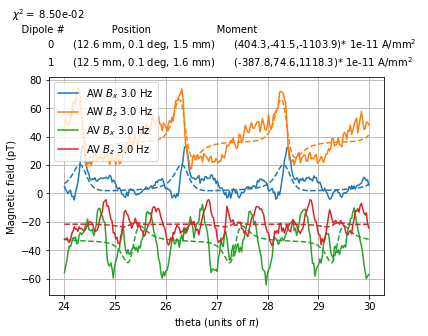

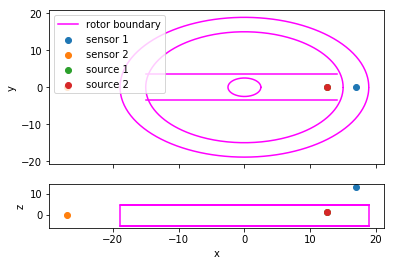

In [87]:
Opt_Settings_Exp2_3Hz['plot']=1
Opt_Settings_Exp2_3Hz['figname']=SaveDir+'Exp2_3Hz_'+nowtext+'_1'
chi2_one_exp_one_freq(opt_res_Exp2_3Hz.x,Opt_Settings_Exp2_3Hz)
# Opt_Params_Exp2 = opt_res_Exp2.x

In [88]:
Opt_Params_Exp2_low_chi_3Hz = opt_res_Exp2_3Hz.x
Opt_Params_Exp2_low_chi_3Hz

array([ 1.25710829e+01,  9.80320447e-02,  1.48305859e+00,  4.04322431e+02,
       -4.15401699e+01, -1.10387552e+03,  1.25268283e+01,  5.43661320e-02,
        1.56024874e+00, -3.87794538e+02,  7.46010800e+01,  1.11833656e+03,
        2.56119015e+00,  3.69912313e+01, -3.39848134e+01, -2.13957045e+01])

### Change Frequency to 1 Hz

[16.9591804, 270, -0.0723868789, -37.5363623, 65.572838, -0.124473079, 2.50000922, 200, -4.99980458, 10.0381006, 200.120599, -1.00221056, 12.4954823, -29.8090535]
0.17241582493829974


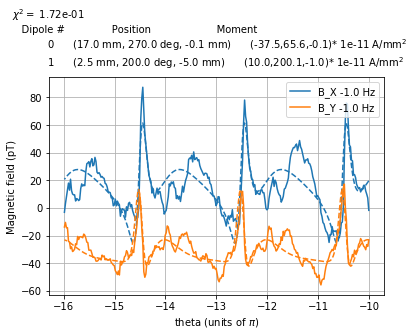

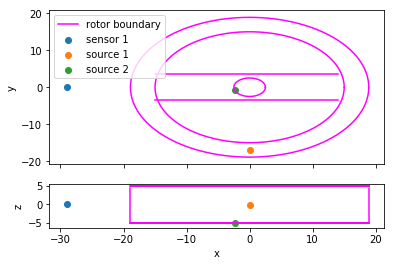

In [89]:
nu = 1
nowtext = now().strftime("%Y%m%d%H%M")
Opt_Settings_Exp1_1Hz = {'number of sources': 2,
                'location coordinate system': 'polar',
                'moment coordinate system':'polar',
                'location dimensions': 3,
                'moment dimensions': 3,
                'rotation sign':-1, # 1 for positive, -1 for negative, 0 for unknown and making it a free parameter
                'rotation frequency':nu,
                'rotor dimensions':rtr_dims,
                'time':Exp1A_Time_cut[nu],
                'number of sensors':1,
                'sensor locations':[Exp1_sensor_loc],
                'sensor field order':[[0,1]],# list which order of B component of each sensor (0 for x, 1 for y, 2 for z) 
                'B data':[Exp1A_X_cut[nu],Exp1A_Y_cut[nu]],
                'bar location':0,
                'plot':1,
                'saveplot':1,
                'plotlabels':['B_X','B_Y'],
                'figname':SaveDir+'Exp1_1Hz_'+nowtext+'_0'
}
# Opt_Param = [Src1_loc_r,Src1_loc_theta,Src1_loc_z,Src1_m_r,Src1_m_theta,Src1_m_z,
#             Src2_loc_r,Src2_loc_theta,Src2_loc_z,Src2_m_r,Src2_m_theta,Src2_m_z,
#             DC_AW_X,DC_AW_Y,DC_AV_Y,DC_AV_X,sign]


# Opt_Params_Exp1_1Hz = Opt_Params_Exp1_low_chi_1Hz
Opt_Params_Exp1_1Hz =[ 1.69591804e+01, 270, -7.23868789e-02, -3.75363623e+01,
        6.55728380e+01, -1.24473079e-01,  2.50000922e+00, 200,
       -4.99980458e+00,  1.00381006e+01,  2.00120599e+02, -1.00221056e+00,
        1.24954823e+01, -2.98090535e+01]
chi_Exp1_1Hz = chi2_one_exp_one_freq(Opt_Params_Exp1_1Hz,Opt_Settings_Exp1_1Hz)

In [90]:
Opt_Settings_Exp1_1Hz['plot'] = 0
opt_res_Exp1_1Hz = minimize(chi2_one_exp_one_freq,Opt_Params_Exp1_1Hz,Opt_Settings_Exp1_1Hz,method = 'Nelder-Mead',options = {'maxfev': 7000,'maxiter': 7000,'adaptive':True,'xatol':0.1})

[ 1.69591804e+01  2.70000000e+02 -7.23868789e-02 -3.75363623e+01
  6.55728380e+01 -1.24473079e-01  2.50000922e+00  2.00000000e+02
 -4.99980458e+00  1.00381006e+01  2.00120599e+02 -1.00221056e+00
  1.24954823e+01 -2.98090535e+01]
0.17241582493829974
[ 1.78071394e+01  2.70000000e+02 -7.23868789e-02 -3.75363623e+01
  6.55728380e+01 -1.24473079e-01  2.50000922e+00  2.00000000e+02
 -4.99980458e+00  1.00381006e+01  2.00120599e+02 -1.00221056e+00
  1.24954823e+01 -2.98090535e+01]
0.19204584584970616
[ 1.69591804e+01  2.83500000e+02 -7.23868789e-02 -3.75363623e+01
  6.55728380e+01 -1.24473079e-01  2.50000922e+00  2.00000000e+02
 -4.99980458e+00  1.00381006e+01  2.00120599e+02 -1.00221056e+00
  1.24954823e+01 -2.98090535e+01]
0.45504105111506005
[ 1.69591804e+01  2.70000000e+02 -7.60062228e-02 -3.75363623e+01
  6.55728380e+01 -1.24473079e-01  2.50000922e+00  2.00000000e+02
 -4.99980458e+00  1.00381006e+01  2.00120599e+02 -1.00221056e+00
  1.24954823e+01 -2.98090535e+01]
0.17241562757064036
[ 1.

0.16007711157460472
[ 1.67975528e+01  2.68696095e+02 -7.35697795e-02 -3.73840287e+01
  6.54739320e+01 -1.26507139e-01  2.53461537e+00  1.96932333e+02
 -5.01980663e+00  1.02021369e+01  1.98450013e+02 -1.01858805e+00
  1.25084182e+01 -2.96012089e+01]
Source 2 not in rotor
[ 1.69330820e+01  2.69837859e+02 -7.29178275e-02 -3.77022969e+01
  6.58865985e+01 -1.25386073e-01  2.51745398e+00  1.99293807e+02
 -4.95843801e+00  1.01117288e+01  2.00507556e+02 -1.00956165e+00
  1.25598126e+01 -2.99284184e+01]
0.17011476887647137
[ 1.67903143e+01  2.68701085e+02 -7.40679193e-02 -3.76267129e+01
  6.59012933e+01 -1.27363717e-01  2.55169201e+00  1.96518834e+02
 -4.96230244e+00  1.02712154e+01  1.99235173e+02 -9.68215720e-01
  1.25905043e+01 -2.97921608e+01]
0.15825768587067007
[ 1.67661905e+01  2.68515525e+02 -7.43080679e-02 -3.76396202e+01
  6.59482154e+01 -1.20663918e-01  2.55907527e+00  1.96021525e+02
 -4.95694499e+00  1.03045175e+01  1.99108684e+02 -1.01346984e+00
  1.26040788e+01 -2.97897476e+01]
0.

0.13048649748111
[ 1.70585384e+01  2.67534879e+02 -7.39789268e-02 -3.75496973e+01
  6.55667853e+01 -1.26006875e-01  2.55784285e+00  1.80848045e+02
 -4.92188393e+00  1.07594434e+01  1.99243035e+02 -1.01080857e+00
  1.25613547e+01 -3.01153732e+01]
0.12938628097592894
[ 1.69942779e+01  2.64839510e+02 -7.38576007e-02 -3.79129006e+01
  6.59750561e+01 -1.24081544e-01  2.55276630e+00  1.86316699e+02
 -4.92322346e+00  1.02780266e+01  2.02929022e+02 -1.01155576e+00
  1.26022773e+01 -3.05098989e+01]
0.14774493010360304
[ 1.66099362e+01  2.64841298e+02 -7.51399711e-02 -3.73878557e+01
  6.54889856e+01 -1.26746950e-01  2.62386530e+00  1.85405700e+02
 -4.88154556e+00  1.05089217e+01  1.96473313e+02 -1.01766236e+00
  1.26023340e+01 -2.99360881e+01]
0.14773179953810964
[ 1.68453336e+01  2.66470153e+02 -7.41153631e-02 -3.76409722e+01
  6.55485095e+01 -1.25504209e-01  2.66499010e+00  1.80135026e+02
 -4.91135024e+00  1.03508882e+01  2.00678843e+02 -1.01152073e+00
  1.25843226e+01 -3.03839246e+01]
0.13090

0.12219416759183613
[ 1.65447218e+01  2.66578683e+02 -7.51175791e-02 -3.80856409e+01
  6.66269409e+01 -1.26745532e-01  2.61172464e+00  1.72407669e+02
 -4.86118961e+00  1.04570553e+01  2.00453309e+02 -1.01456634e+00
  1.26738512e+01 -3.03699448e+01]
0.12446687302658284
[ 1.73995254e+01  2.66788104e+02 -7.47928114e-02 -3.79233867e+01
  6.50550514e+01 -1.28644172e-01  2.62314501e+00  1.62331600e+02
 -4.85636529e+00  1.04763051e+01  1.99943805e+02 -1.03266139e+00
  1.27601410e+01 -3.03704238e+01]
0.1215472773075667
[ 1.70933008e+01  2.68530017e+02 -7.44635584e-02 -3.84031558e+01
  6.69547122e+01 -1.26619851e-01  2.60566770e+00  1.68619386e+02
 -4.87220724e+00  1.05455056e+01  1.99099889e+02 -1.01780312e+00
  1.26775840e+01 -3.00050306e+01]
0.12485945714339299
[ 1.70511953e+01  2.65599626e+02 -7.51956948e-02 -3.77335072e+01
  6.48841168e+01 -1.28686574e-01  2.62661850e+00  1.64811559e+02
 -4.84976216e+00  1.04222594e+01  2.00774622e+02 -1.03037307e+00
  1.27563338e+01 -3.05919703e+01]
0.121

0.11994302355664996
[ 1.70506461e+01  2.66819713e+02 -7.53460037e-02 -3.84524198e+01
  6.56511383e+01 -1.28563323e-01  2.58422026e+00  1.66689390e+02
 -4.85093419e+00  1.04757567e+01  1.99452390e+02 -1.02704601e+00
  1.27597464e+01 -3.00482681e+01]
0.11872411146821067
[ 1.70565959e+01  2.65876698e+02 -7.16232110e-02 -3.87327914e+01
  6.64593991e+01 -1.27959670e-01  2.63364074e+00  1.64641396e+02
 -4.84200878e+00  1.07112089e+01  1.98235584e+02 -1.03131764e+00
  1.27441103e+01 -3.02926292e+01]
0.12044531015879778
[ 1.68799028e+01  2.67235848e+02 -7.74675996e-02 -3.84658328e+01
  6.49146459e+01 -1.30656957e-01  2.61680693e+00  1.61554370e+02
 -4.83618458e+00  1.03502876e+01  2.00926946e+02 -1.03043859e+00
  1.26736442e+01 -2.99266506e+01]
0.11867847182902037
[ 1.71273671e+01  2.66408886e+02 -7.68191267e-02 -3.83375075e+01
  6.57425316e+01 -1.28080144e-01  2.63472443e+00  1.57374685e+02
 -4.82208259e+00  1.05634105e+01  1.97600809e+02 -9.94416458e-01
  1.31534242e+01 -3.02969967e+01]
0.12

0.1181403644138799
[ 1.67919445e+01  2.66946064e+02 -7.53065384e-02 -3.88518684e+01
  6.52295734e+01 -1.30982910e-01  2.58588619e+00  1.65443744e+02
 -4.86422634e+00  1.03969864e+01  2.00332945e+02 -1.03457850e+00
  1.28513758e+01 -2.95633652e+01]
0.11860514954355215
[ 1.69655765e+01  2.66773984e+02 -7.53820799e-02 -3.82344973e+01
  6.65078563e+01 -1.30144819e-01  2.60742165e+00  1.60832548e+02
 -4.83869739e+00  1.04355753e+01  2.00970652e+02 -1.03312849e+00
  1.25677290e+01 -3.01354413e+01]
0.11813559066265805
[ 1.69122106e+01  2.66451925e+02 -7.25629150e-02 -3.85034461e+01
  6.69676923e+01 -1.30391598e-01  2.58624122e+00  1.63056577e+02
 -4.85455204e+00  1.05141875e+01  2.00328375e+02 -1.03776374e+00
  1.27234011e+01 -2.99138816e+01]
0.11815269334318873
[ 1.68793456e+01  2.66966872e+02 -7.51530544e-02 -3.83722229e+01
  6.62280023e+01 -1.28251137e-01  2.59259671e+00  1.59268745e+02
 -4.83748730e+00  1.06265886e+01  2.01072331e+02 -1.06498924e+00
  1.27157098e+01 -2.97232056e+01]
0.118

0.11789945509028597
[ 1.68672309e+01  2.66864164e+02 -7.48918229e-02 -3.82226051e+01
  6.71068862e+01 -1.29628942e-01  2.55925298e+00  1.64085189e+02
 -4.87201114e+00  1.05005994e+01  2.00176548e+02 -1.04619100e+00
  1.24108378e+01 -2.98332850e+01]
0.11772872790001501
[ 1.68684151e+01  2.67004105e+02 -7.43501452e-02 -3.86108822e+01
  6.67233604e+01 -1.32032685e-01  2.54340011e+00  1.60460037e+02
 -4.86529298e+00  1.06620738e+01  2.01367902e+02 -1.04209753e+00
  1.23136824e+01 -2.98205966e+01]
0.117671554671441
[ 1.69123729e+01  2.66455167e+02 -7.43994808e-02 -3.85539434e+01
  6.70917985e+01 -1.31524322e-01  2.57317310e+00  1.64280806e+02
 -4.86805368e+00  1.04767998e+01  2.01287448e+02 -1.03118252e+00
  1.25404247e+01 -2.97877391e+01]
0.11816964172927946
[ 1.68222349e+01  2.67101524e+02 -7.51519504e-02 -3.82240380e+01
  6.68129284e+01 -1.31513720e-01  2.54486500e+00  1.60529718e+02
 -4.85887422e+00  1.05584010e+01  2.00601925e+02 -1.05037069e+00
  1.23753882e+01 -2.97506716e+01]
0.1176

  1.25029913e+01 -2.96408608e+01]
0.11751106536240821
[ 1.68779801e+01  2.66748312e+02 -7.40177793e-02 -3.81257766e+01
  6.76811361e+01 -1.32048748e-01  2.49717314e+00  1.63014234e+02
 -4.89546444e+00  1.07029719e+01  1.99586332e+02 -1.04662841e+00
  1.23638732e+01 -2.97323621e+01]
Source 2 not in rotor
[ 1.68439875e+01  2.67057347e+02 -7.52950429e-02 -3.80403540e+01
  6.70688758e+01 -1.31950984e-01  2.53219457e+00  1.62449908e+02
 -4.87618828e+00  1.05127755e+01  2.02196420e+02 -1.04151776e+00
  1.23580004e+01 -2.97215934e+01]
0.11746359636371811
[ 1.68741361e+01  2.66902097e+02 -7.45144070e-02 -3.77481918e+01
  6.77266836e+01 -1.32711928e-01  2.49684287e+00  1.61931783e+02
 -4.88932213e+00  1.06395537e+01  2.02361678e+02 -1.03864547e+00
  1.22941304e+01 -2.98637128e+01]
Source 2 not in rotor
[ 1.68469283e+01  2.66958459e+02 -7.49707107e-02 -3.82711274e+01
  6.70521551e+01 -1.31550085e-01  2.53176971e+00  1.63117188e+02
 -4.88026176e+00  1.05546757e+01  2.00464779e+02 -1.04645581e+00


  1.23135187e+01 -2.98394908e+01]
Source 2 not in rotor
[ 1.68632153e+01  2.66939004e+02 -7.48832326e-02 -3.82453033e+01
  6.69842427e+01 -1.31727691e-01  2.52211146e+00  1.62740341e+02
 -4.88262802e+00  1.06004507e+01  2.00924483e+02 -1.04303271e+00
  1.23840014e+01 -2.96934651e+01]
0.1173442674291844
[ 1.69419983e+01  2.66757340e+02 -7.48336363e-02 -3.83479810e+01
  6.67379728e+01 -1.29967716e-01  2.51652524e+00  1.63727776e+02
 -4.89083647e+00  1.06323809e+01  2.00937317e+02 -1.03706858e+00
  1.24237887e+01 -2.96964033e+01]
0.11741439290360325
[ 1.68346938e+01  2.67028763e+02 -7.47855217e-02 -3.82062576e+01
  6.69965446e+01 -1.33044528e-01  2.50875251e+00  1.61462886e+02
 -4.88131285e+00  1.06585205e+01  2.01657609e+02 -1.04198661e+00
  1.23157932e+01 -2.97829473e+01]
0.11731743221313472
[ 1.69004070e+01  2.66880964e+02 -7.50077915e-02 -3.83499966e+01
  6.62999906e+01 -1.30875384e-01  2.51201507e+00  1.60745806e+02
 -4.87353972e+00  1.06854465e+01  2.01426050e+02 -1.04488456e+00
  1

0.11729362752380025
[ 1.68790417e+01  2.66752192e+02 -7.43173493e-02 -3.81167961e+01
  6.71587757e+01 -1.31320248e-01  2.50894575e+00  1.62675592e+02
 -4.88701836e+00  1.06403486e+01  2.01394034e+02 -1.04287829e+00
  1.24592662e+01 -2.96328004e+01]
0.11732004981766586
[ 1.68869007e+01  2.66986239e+02 -7.51672590e-02 -3.83594507e+01
  6.65895016e+01 -1.31720685e-01  2.50894565e+00  1.62268124e+02
 -4.88643437e+00  1.06716571e+01  2.01292690e+02 -1.03855684e+00
  1.23163566e+01 -2.97741765e+01]
0.11726793070338168
[ 1.68887780e+01  2.67021815e+02 -7.49857966e-02 -3.82253787e+01
  6.62679936e+01 -1.32112043e-01  2.50863522e+00  1.62957225e+02
 -4.88888692e+00  1.07624002e+01  2.01131578e+02 -1.02433619e+00
  1.24723690e+01 -2.97176731e+01]
0.11728654873368481
[ 1.68788057e+01  2.66850275e+02 -7.50307417e-02 -3.84500771e+01
  6.65217871e+01 -1.32198357e-01  2.51105364e+00  1.61797165e+02
 -4.88088047e+00  1.07459505e+01  2.00995246e+02 -1.03259985e+00
  1.24270264e+01 -2.98557437e+01]
0.11

0.11725004166930339
[ 1.68843207e+01  2.66708230e+02 -7.46975658e-02 -3.84199636e+01
  6.68195692e+01 -1.32019734e-01  2.50333805e+00  1.62136169e+02
 -4.88904417e+00  1.07003674e+01  2.01077278e+02 -1.03712392e+00
  1.23655913e+01 -2.97902066e+01]
0.11722475575707823
[ 1.68957761e+01  2.66772114e+02 -7.45525655e-02 -3.82312468e+01
  6.67913179e+01 -1.31810416e-01  2.49880798e+00  1.63041140e+02
 -4.89769967e+00  1.06812784e+01  2.01220371e+02 -1.03481411e+00
  1.23644209e+01 -2.96663361e+01]
Source 2 not in rotor
[ 1.68812300e+01  2.66839109e+02 -7.49624308e-02 -3.84188156e+01
  6.65602915e+01 -1.32142937e-01  2.50930426e+00  1.61974876e+02
 -4.88328321e+00  1.07367116e+01  2.01027406e+02 -1.03291618e+00
  1.24180828e+01 -2.98286855e+01]
0.1172274299266299
[ 1.69367423e+01  2.66665685e+02 -7.52800196e-02 -3.81153146e+01
  6.67079560e+01 -1.31407740e-01  2.50422488e+00  1.62368479e+02
 -4.89559062e+00  1.07134509e+01  2.00799382e+02 -1.03875347e+00
  1.24157852e+01 -2.97048039e+01]
0.1

0.11721933336457724
[ 1.68817009e+01  2.66913895e+02 -7.49706002e-02 -3.83127705e+01
  6.65525426e+01 -1.32353232e-01  2.50535644e+00  1.62267297e+02
 -4.88855824e+00  1.07385728e+01  2.00911276e+02 -1.02880096e+00
  1.24294117e+01 -2.97605909e+01]
0.11720218129374563
[ 1.68752777e+01  2.66834320e+02 -7.49028484e-02 -3.83190001e+01
  6.67072341e+01 -1.32453145e-01  2.49949191e+00  1.62017544e+02
 -4.89106221e+00  1.07768383e+01  2.00846767e+02 -1.03074012e+00
  1.24241870e+01 -2.97600422e+01]
Source 2 not in rotor
[ 1.68846806e+01  2.66845277e+02 -7.49236104e-02 -3.83432118e+01
  6.66954789e+01 -1.32124586e-01  2.50649628e+00  1.62174510e+02
 -4.88797476e+00  1.07014119e+01  2.01070345e+02 -1.03320545e+00
  1.23994591e+01 -2.97562888e+01]
0.11720612244063222
[ 1.68862924e+01  2.66858739e+02 -7.50864591e-02 -3.83078388e+01
  6.69937286e+01 -1.32390024e-01  2.50275518e+00  1.62707855e+02
 -4.88230316e+00  1.06977797e+01  2.00988291e+02 -1.03221111e+00
  1.23530864e+01 -2.97840612e+01]
0.

0.11721332218950342
[ 1.68916706e+01  2.66797622e+02 -7.48738689e-02 -3.82359792e+01
  6.66903821e+01 -1.32145610e-01  2.50191078e+00  1.62513736e+02
 -4.88911755e+00  1.07230916e+01  2.01197314e+02 -1.03429240e+00
  1.24034465e+01 -2.97731315e+01]
0.1171858192556167
[ 1.68844449e+01  2.66890119e+02 -7.52861503e-02 -3.81650506e+01
  6.65554276e+01 -1.32125012e-01  2.50143050e+00  1.62122673e+02
 -4.88968965e+00  1.07050780e+01  2.01396258e+02 -1.03633926e+00
  1.23989604e+01 -2.98187877e+01]
0.11717307206655472
[ 1.68646563e+01  2.66891854e+02 -7.50258676e-02 -3.82556061e+01
  6.68886448e+01 -1.32143818e-01  2.49961447e+00  1.61582602e+02
 -4.88953614e+00  1.07385783e+01  2.01375619e+02 -1.03739971e+00
  1.24100711e+01 -2.96961455e+01]
Source 2 not in rotor
[ 1.69015028e+01  2.66846291e+02 -7.50469025e-02 -3.82265325e+01
  6.65743498e+01 -1.32161703e-01  2.50388903e+00  1.62500880e+02
 -4.88962670e+00  1.07012306e+01  2.00923451e+02 -1.03396975e+00
  1.23936601e+01 -2.98358522e+01]
0.1

0.11717390045982991
[ 1.68857460e+01  2.66875198e+02 -7.50136923e-02 -3.82473522e+01
  6.65505858e+01 -1.32014324e-01  2.49980742e+00  1.62102970e+02
 -4.89077537e+00  1.07345400e+01  2.01403215e+02 -1.03482925e+00
  1.24103869e+01 -2.97838858e+01]
Source 2 not in rotor
[ 1.68957109e+01  2.66856732e+02 -7.50392226e-02 -3.82343312e+01
  6.65894105e+01 -1.32127762e-01  2.50278428e+00  1.62382328e+02
 -4.88997770e+00  1.07084496e+01  2.01052755e+02 -1.03440477e+00
  1.23964745e+01 -2.98204261e+01]
0.11717644663848312
[ 1.69066298e+01  2.66801352e+02 -7.51869608e-02 -3.82398255e+01
  6.65293247e+01 -1.32074872e-01  2.50172887e+00  1.62214516e+02
 -4.89336239e+00  1.07516689e+01  2.00948346e+02 -1.03095230e+00
  1.24294894e+01 -2.97747057e+01]
0.11717350264653631
[ 1.68953870e+01  2.66915224e+02 -7.52174408e-02 -3.82589482e+01
  6.64456178e+01 -1.32063868e-01  2.50212442e+00  1.61992722e+02
 -4.89202562e+00  1.07239153e+01  2.01068959e+02 -1.03317225e+00
  1.24097938e+01 -2.98321500e+01]
0.

0.11716675475455866
[ 1.68921174e+01  2.66869936e+02 -7.51027161e-02 -3.82485994e+01
  6.65063638e+01 -1.32150818e-01  2.49987885e+00  1.62317410e+02
 -4.89167001e+00  1.07451792e+01  2.01307831e+02 -1.03249875e+00
  1.23962205e+01 -2.97809916e+01]
Source 2 not in rotor
[ 1.68942701e+01  2.66863501e+02 -7.50554489e-02 -3.82461192e+01
  6.65973823e+01 -1.32042640e-01  2.50171693e+00  1.62197072e+02
 -4.89115619e+00  1.07156131e+01  2.01030078e+02 -1.03437666e+00
  1.24095448e+01 -2.98036978e+01]
0.11716789853725026
[ 1.68908034e+01  2.66806638e+02 -7.48605439e-02 -3.82782393e+01
  6.66164777e+01 -1.32218931e-01  2.50072345e+00  1.62291683e+02
 -4.89040528e+00  1.07450863e+01  2.01171337e+02 -1.03325869e+00
  1.24012097e+01 -2.97609496e+01]
0.11717099780325604
[ 1.68950294e+01  2.66902047e+02 -7.52033261e-02 -3.82281679e+01
  6.65289021e+01 -1.32003217e-01  2.50117131e+00  1.62214841e+02
 -4.89193323e+00  1.07161975e+01  2.01117909e+02 -1.03388174e+00
  1.24062777e+01 -2.98154607e+01]
0.

0.11715549170090898
[ 1.68965155e+01  2.66886529e+02 -7.50676838e-02 -3.81900752e+01
  6.64016229e+01 -1.31712667e-01  2.50029550e+00  1.62237741e+02
 -4.89305383e+00  1.07027642e+01  2.01301652e+02 -1.03756882e+00
  1.24041972e+01 -2.98069142e+01]
0.11715780067297274
[ 1.69096272e+01  2.66845198e+02 -7.50911144e-02 -3.81885249e+01
  6.63495258e+01 -1.31600826e-01  2.50011530e+00  1.62323473e+02
 -4.89423695e+00  1.07105469e+01  2.01201233e+02 -1.03653236e+00
  1.24124524e+01 -2.98142606e+01]
0.11715089781154946
[ 1.69102871e+01  2.66843875e+02 -7.50922499e-02 -3.81857222e+01
  6.63422165e+01 -1.31582524e-01  2.50005323e+00  1.62323323e+02
 -4.89437481e+00  1.07100963e+01  2.01204821e+02 -1.03667502e+00
  1.24125965e+01 -2.98146413e+01]
0.1171503081720889
[ 1.69109040e+01  2.66850072e+02 -7.49988682e-02 -3.81665360e+01
  6.63026271e+01 -1.31558266e-01  2.50089093e+00  1.62495050e+02
 -4.89475542e+00  1.06958137e+01  2.01192751e+02 -1.03680895e+00
  1.24240014e+01 -2.98600410e+01]
0.117

0.11715242187933263
[ 1.69186662e+01  2.66827930e+02 -7.50933146e-02 -3.82162333e+01
  6.62591835e+01 -1.31499948e-01  2.50040232e+00  1.62518952e+02
 -4.89553158e+00  1.07109743e+01  2.01072946e+02 -1.03428224e+00
  1.24228133e+01 -2.98361602e+01]
0.11715070496952802
[ 1.69141666e+01  2.66830592e+02 -7.51026098e-02 -3.81690298e+01
  6.62333989e+01 -1.31440389e-01  2.50044890e+00  1.62523908e+02
 -4.89689890e+00  1.07008015e+01  2.01205653e+02 -1.03647041e+00
  1.24218430e+01 -2.98244245e+01]
0.11714905075947106
[ 1.69138146e+01  2.66804282e+02 -7.48897288e-02 -3.82826322e+01
  6.62947328e+01 -1.31674231e-01  2.49993185e+00  1.62419593e+02
 -4.89359155e+00  1.07369878e+01  2.01119193e+02 -1.03303325e+00
  1.24123121e+01 -2.97942680e+01]
Source 2 not in rotor
[ 1.69101126e+01  2.66870942e+02 -7.51829351e-02 -3.81500599e+01
  6.63048308e+01 -1.31479125e-01  2.50053676e+00  1.62426494e+02
 -4.89608918e+00  1.06924108e+01  2.01195994e+02 -1.03726461e+00
  1.24211562e+01 -2.98377392e+01]
0.

0.1171429558430042
[ 1.69179919e+01  2.66821767e+02 -7.51185268e-02 -3.81466585e+01
  6.61593931e+01 -1.31231973e-01  2.49999469e+00  1.62441919e+02
 -4.89860303e+00  1.06955822e+01  2.01203930e+02 -1.03781238e+00
  1.24319158e+01 -2.98235315e+01]
Source 2 not in rotor
[ 1.69233715e+01  2.66806906e+02 -7.50941833e-02 -3.81946869e+01
  6.60172249e+01 -1.31300506e-01  2.50027216e+00  1.62324363e+02
 -4.89779059e+00  1.07089076e+01  2.01168888e+02 -1.03584463e+00
  1.24337284e+01 -2.98469129e+01]
0.1171448875839722
[ 1.69240618e+01  2.66844949e+02 -7.50542398e-02 -3.81616529e+01
  6.61140593e+01 -1.31199382e-01  2.50038982e+00  1.62363629e+02
 -4.89931246e+00  1.07072817e+01  2.01027323e+02 -1.03617241e+00
  1.24511006e+01 -2.98298020e+01]
0.1171448318679339
[ 1.69192879e+01  2.66846781e+02 -7.51438177e-02 -3.81276337e+01
  6.61123817e+01 -1.31021341e-01  2.50045796e+00  1.62483237e+02
 -4.90080022e+00  1.06765194e+01  2.01154498e+02 -1.03938236e+00
  1.24381740e+01 -2.98367929e+01]
0.117

0.11713552308590232
[ 1.69290178e+01  2.66812295e+02 -7.50908159e-02 -3.81361066e+01
  6.59138004e+01 -1.30665233e-01  2.50012926e+00  1.62463977e+02
 -4.90418173e+00  1.06786022e+01  2.01117801e+02 -1.04020665e+00
  1.24491221e+01 -2.98171021e+01]
0.11713516056206248
[ 1.69265317e+01  2.66827901e+02 -7.51786993e-02 -3.81439803e+01
  6.58649594e+01 -1.30761802e-01  2.50009096e+00  1.62339549e+02
 -4.90162819e+00  1.06764761e+01  2.01155956e+02 -1.03931436e+00
  1.24472327e+01 -2.98488007e+01]
0.11713844477032034
[ 1.69284785e+01  2.66817600e+02 -7.51263993e-02 -3.80939179e+01
  6.58578862e+01 -1.30480942e-01  2.50067833e+00  1.62529006e+02
 -4.90638813e+00  1.06540300e+01  2.01083203e+02 -1.04174860e+00
  1.24631818e+01 -2.98327212e+01]
0.11713584702433509
[ 1.69312460e+01  2.66814971e+02 -7.49939308e-02 -3.81755630e+01
  6.58993576e+01 -1.30696286e-01  2.50006899e+00  1.62488819e+02
 -4.90294506e+00  1.06859427e+01  2.01073668e+02 -1.03848180e+00
  1.24507224e+01 -2.98218628e+01]
0.11

0.11713426639829978
[ 1.69317192e+01  2.66792210e+02 -7.50065618e-02 -3.80924848e+01
  6.58104921e+01 -1.30223385e-01  2.50041573e+00  1.62651183e+02
 -4.90946970e+00  1.06472346e+01  2.01116890e+02 -1.04398239e+00
  1.24605911e+01 -2.98147575e+01]
0.11713292379870391
[ 1.69414064e+01  2.66796747e+02 -7.49926944e-02 -3.81035222e+01
  6.56808212e+01 -1.30022827e-01  2.50057352e+00  1.62543040e+02
 -4.91033476e+00  1.06519763e+01  2.00997215e+02 -1.04337399e+00
  1.24770166e+01 -2.98221067e+01]
0.11713083598916722
[ 1.69343062e+01  2.66823620e+02 -7.51437058e-02 -3.80748965e+01
  6.57282379e+01 -1.30180594e-01  2.50026594e+00  1.62512504e+02
 -4.90861899e+00  1.06435362e+01  2.01093637e+02 -1.04348907e+00
  1.24676773e+01 -2.98413313e+01]
0.11713103378029081
[ 1.69371813e+01  2.66797654e+02 -7.50441975e-02 -3.81076966e+01
  6.57051284e+01 -1.30120940e-01  2.50012917e+00  1.62529832e+02
 -4.90899829e+00  1.06530276e+01  2.01098680e+02 -1.04339632e+00
  1.24642000e+01 -2.98249299e+01]
0.11

0.11712314497657823
[ 1.69398266e+01  2.66801696e+02 -7.50730733e-02 -3.80375141e+01
  6.55906356e+01 -1.29372770e-01  2.50043997e+00  1.62616040e+02
 -4.91719017e+00  1.05952462e+01  2.00904336e+02 -1.04939368e+00
  1.24894331e+01 -2.98167868e+01]
0.1171228399947513
[ 1.69460272e+01  2.66790824e+02 -7.50619971e-02 -3.80484171e+01
  6.55416662e+01 -1.29473174e-01  2.50021575e+00  1.62527422e+02
 -4.91528893e+00  1.06147513e+01  2.01031418e+02 -1.04848522e+00
  1.24826242e+01 -2.98320847e+01]
0.11712304472774637
[ 1.69399574e+01  2.66792822e+02 -7.49740448e-02 -3.80727303e+01
  6.56441299e+01 -1.29703536e-01  2.50005718e+00  1.62521029e+02
 -4.91542341e+00  1.06350684e+01  2.00908010e+02 -1.04629490e+00
  1.24903731e+01 -2.97994703e+01]
0.11712364489895168
[ 1.69410482e+01  2.66806916e+02 -7.51575890e-02 -3.80337264e+01
  6.55788076e+01 -1.29583701e-01  2.50005687e+00  1.62532204e+02
 -4.91453070e+00  1.06123162e+01  2.01013909e+02 -1.04778915e+00
  1.24818290e+01 -2.98311014e+01]
0.117

0.11711565470743505
[ 1.69504165e+01  2.66799651e+02 -7.50657851e-02 -3.79482428e+01
  6.54078135e+01 -1.28451259e-01  2.50023620e+00  1.62667507e+02
 -4.92433851e+00  1.05478136e+01  2.00911398e+02 -1.05687071e+00
  1.25054641e+01 -2.98027005e+01]
0.11711540867535133
[ 1.69510311e+01  2.66800531e+02 -7.50684509e-02 -3.79392633e+01
  6.53992493e+01 -1.28385235e-01  2.50023983e+00  1.62665810e+02
 -4.92475626e+00  1.05443324e+01  2.00916857e+02 -1.05746948e+00
  1.25068056e+01 -2.98007408e+01]
0.11711515571302018
[ 1.69550387e+01  2.66787907e+02 -7.50462825e-02 -3.79985565e+01
  6.53721579e+01 -1.28710776e-01  2.50019872e+00  1.62614892e+02
 -4.92250082e+00  1.05712659e+01  2.00894525e+02 -1.05363490e+00
  1.25028464e+01 -2.98293496e+01]
0.1171161301832394
[ 1.69475729e+01  2.66796693e+02 -7.49879980e-02 -3.80024788e+01
  6.53560106e+01 -1.28517123e-01  2.50033474e+00  1.62688425e+02
 -4.92500458e+00  1.05421305e+01  2.00780790e+02 -1.05606400e+00
  1.25020351e+01 -2.98296028e+01]
0.117

0.1171094860716475
[ 1.69527612e+01  2.66796748e+02 -7.51729170e-02 -3.79154751e+01
  6.52966288e+01 -1.27963082e-01  2.50008762e+00  1.62608902e+02
 -4.92995524e+00  1.05097194e+01  2.00726785e+02 -1.06085411e+00
  1.25191848e+01 -2.98164920e+01]
0.11710927525049651
[ 1.69524544e+01  2.66797645e+02 -7.51922088e-02 -3.79120820e+01
  6.52932165e+01 -1.27942177e-01  2.50007308e+00  1.62602237e+02
 -4.93004459e+00  1.05072380e+01  2.00728698e+02 -1.06108381e+00
  1.25190624e+01 -2.98173932e+01]
0.1171091286657212
[ 1.69552334e+01  2.66785737e+02 -7.50311567e-02 -3.79152400e+01
  6.52897423e+01 -1.27872203e-01  2.50004651e+00  1.62683593e+02
 -4.93162242e+00  1.05117069e+01  2.00727328e+02 -1.06179202e+00
  1.25204041e+01 -2.98026545e+01]
0.11710838212503703
[ 1.69552988e+01  2.66785040e+02 -7.50288790e-02 -3.79122699e+01
  6.52858648e+01 -1.27841926e-01  2.50002841e+00  1.62687823e+02
 -4.93192308e+00  1.05098240e+01  2.00729057e+02 -1.06211656e+00
  1.25204614e+01 -2.98015818e+01]
0.1171

0.11710363077262932
[ 1.69679975e+01  2.66775593e+02 -7.51880613e-02 -3.77877104e+01
  6.51243127e+01 -1.26920061e-01  2.50017936e+00  1.62690298e+02
 -4.94115357e+00  1.04516466e+01  2.00560336e+02 -1.06956748e+00
  1.25524996e+01 -2.98025269e+01]
0.11710349117099855
[ 1.69562473e+01  2.66779598e+02 -7.51758112e-02 -3.78178010e+01
  6.52005465e+01 -1.27189263e-01  2.50012932e+00  1.62669724e+02
 -4.93835670e+00  1.04447220e+01  2.00662421e+02 -1.06990095e+00
  1.25281484e+01 -2.98217648e+01]
0.117104064440242
[ 1.69618822e+01  2.66806213e+02 -7.51680895e-02 -3.77895239e+01
  6.50854475e+01 -1.26864081e-01  2.50028417e+00  1.62730822e+02
 -4.94188162e+00  1.04311073e+01  2.00558799e+02 -1.07065150e+00
  1.25515939e+01 -2.98332004e+01]
0.11710550545930686
[ 1.69610829e+01  2.66798660e+02 -7.51247448e-02 -3.78262294e+01
  6.51772739e+01 -1.27151342e-01  2.50000327e+00  1.62596081e+02
 -4.93834140e+00  1.04575592e+01  2.00549899e+02 -1.06843647e+00
  1.25427214e+01 -2.98118307e+01]
0.1171

0.11709797552674268
[ 1.69704852e+01  2.66796932e+02 -7.51958987e-02 -3.77465473e+01
  6.50889342e+01 -1.26262495e-01  2.50014688e+00  1.62730474e+02
 -4.94698581e+00  1.03961453e+01  2.00309963e+02 -1.07501802e+00
  1.25662132e+01 -2.98062981e+01]
0.11709807997161813
[ 1.69616862e+01  2.66785001e+02 -7.52324014e-02 -3.77433564e+01
  6.51520111e+01 -1.26484712e-01  2.50005231e+00  1.62640373e+02
 -4.94475959e+00  1.03974431e+01  2.00498554e+02 -1.07631513e+00
  1.25442792e+01 -2.98084506e+01]
0.11709780424151872
[ 1.69734057e+01  2.66788331e+02 -7.51079775e-02 -3.77005546e+01
  6.50407898e+01 -1.25966236e-01  2.50028103e+00  1.62712205e+02
 -4.95230532e+00  1.03808907e+01  2.00281872e+02 -1.07917970e+00
  1.25752075e+01 -2.97945866e+01]
0.11709704297451975
[ 1.69740230e+01  2.66789227e+02 -7.50962299e-02 -3.76937249e+01
  6.50388665e+01 -1.25909240e-01  2.50029678e+00  1.62720720e+02
 -4.95313994e+00  1.03774622e+01  2.00263176e+02 -1.07975120e+00
  1.25772599e+01 -2.97926379e+01]
0.11

0.11709016222230303
[ 1.69875262e+01  2.66778905e+02 -7.54776190e-02 -3.75601197e+01
  6.47404013e+01 -1.24607415e-01  2.50040824e+00  1.62664550e+02
 -4.96139789e+00  1.02752554e+01  2.00190255e+02 -1.09098448e+00
  1.25882822e+01 -2.98345306e+01]
0.11708962085899503
[ 1.69885638e+01  2.66778804e+02 -7.54943216e-02 -3.75506886e+01
  6.47219934e+01 -1.24520907e-01  2.50043721e+00  1.62666731e+02
 -4.96207669e+00  1.02685201e+01  2.00182008e+02 -1.09176161e+00
  1.25893774e+01 -2.98372472e+01]
0.11708943511578683
[ 1.69802755e+01  2.66786201e+02 -7.52040008e-02 -3.76349772e+01
  6.49574399e+01 -1.25196774e-01  2.50025984e+00  1.62679106e+02
 -4.95971736e+00  1.03239620e+01  2.00066423e+02 -1.08627351e+00
  1.25875593e+01 -2.97930397e+01]
0.11709079088464598
[ 1.69880908e+01  2.66774236e+02 -7.53483672e-02 -3.75734873e+01
  6.47621401e+01 -1.24628400e-01  2.50019398e+00  1.62687993e+02
 -4.96206777e+00  1.02894618e+01  2.00184312e+02 -1.09058229e+00
  1.25906110e+01 -2.98109029e+01]
0.11

0.11708323062736363
[ 1.69856895e+01  2.66794723e+02 -7.55216550e-02 -3.74906688e+01
  6.47898150e+01 -1.23967627e-01  2.50032445e+00  1.62731437e+02
 -4.96808717e+00  1.02146002e+01  2.00090347e+02 -1.09926563e+00
  1.25830749e+01 -2.98219484e+01]
0.117082486194572
[ 1.69850204e+01  2.66797271e+02 -7.55236749e-02 -3.74879820e+01
  6.47955091e+01 -1.23943185e-01  2.50033996e+00  1.62741949e+02
 -4.96839679e+00  1.02106777e+01  2.00087751e+02 -1.09972390e+00
  1.25817601e+01 -2.98223999e+01]
0.11708240461308692
[ 1.69961667e+01  2.66752738e+02 -7.56478485e-02 -3.74769868e+01
  6.46691549e+01 -1.23799354e-01  2.50018471e+00  1.62674282e+02
 -4.96884713e+00  1.02168316e+01  2.00108907e+02 -1.09913202e+00
  1.25891716e+01 -2.98215432e+01]
0.11708236458821326
[ 1.69969904e+01  2.66749322e+02 -7.56664988e-02 -3.74728275e+01
  6.46579264e+01 -1.23755649e-01  2.50017943e+00  1.62675731e+02
 -4.96921706e+00  1.02137333e+01  2.00109145e+02 -1.09951102e+00
  1.25888495e+01 -2.98218799e+01]
0.1170

0.11707195826371963
[ 1.70094016e+01  2.66779617e+02 -7.58760162e-02 -3.72881151e+01
  6.44599050e+01 -1.22050636e-01  2.50020515e+00  1.62600051e+02
 -4.98188489e+00  1.00802925e+01  1.99929137e+02 -1.11677423e+00
  1.26049163e+01 -2.98477603e+01]
0.11707043582701142
[ 1.69995081e+01  2.66778145e+02 -7.57637388e-02 -3.73974270e+01
  6.46389632e+01 -1.22748720e-01  2.50020761e+00  1.62545114e+02
 -4.97472100e+00  1.01309199e+01  2.00014699e+02 -1.11098748e+00
  1.25793989e+01 -2.98169403e+01]
0.11706992203335455
[ 1.69992655e+01  2.66777773e+02 -7.57625733e-02 -3.74014142e+01
  6.46433602e+01 -1.22757180e-01  2.50020213e+00  1.62530138e+02
 -4.97436821e+00  1.01319445e+01  2.00025575e+02 -1.11101056e+00
  1.25772401e+01 -2.98148093e+01]
0.11706969732053464
[ 1.69992624e+01  2.66790722e+02 -7.56975145e-02 -3.74251537e+01
  6.47819346e+01 -1.23181930e-01  2.50002349e+00  1.62639497e+02
 -4.97157086e+00  1.01621680e+01  1.99991282e+02 -1.10670087e+00
  1.25781876e+01 -2.98199344e+01]
0.11

0.11705728211229322
[ 1.70003332e+01  2.66809045e+02 -7.59576573e-02 -3.72691629e+01
  6.46544839e+01 -1.21356182e-01  2.50035048e+00  1.62699262e+02
 -4.98818778e+00  9.99141257e+00  1.99700300e+02 -1.12727955e+00
  1.25725607e+01 -2.98304318e+01]
0.11705774887928269
[ 1.70102973e+01  2.66786218e+02 -7.60207575e-02 -3.72731647e+01
  6.45448589e+01 -1.21064344e-01  2.50027592e+00  1.62671397e+02
 -4.98900054e+00  9.98388267e+00  1.99596903e+02 -1.12726469e+00
  1.25833905e+01 -2.98332464e+01]
0.11705559548093536
[ 1.70110105e+01  2.66785713e+02 -7.60299148e-02 -3.72709371e+01
  6.45371904e+01 -1.20983449e-01  2.50028384e+00  1.62677321e+02
 -4.98959734e+00  9.97738690e+00  1.99569682e+02 -1.12787489e+00
  1.25839003e+01 -2.98337771e+01]
0.1170550438011013
[ 1.70073154e+01  2.66788764e+02 -7.59750672e-02 -3.72902021e+01
  6.45618022e+01 -1.21296844e-01  2.50015732e+00  1.62602745e+02
 -4.98698274e+00  1.00059653e+01  1.99739642e+02 -1.12667222e+00
  1.25686455e+01 -2.98244495e+01]
0.117

0.11704288150947094
[ 1.70128630e+01  2.66813227e+02 -7.62656459e-02 -3.71347006e+01
  6.45887182e+01 -1.19839717e-01  2.50022941e+00  1.62630164e+02
 -4.99952375e+00  9.87335203e+00  1.99447281e+02 -1.14253124e+00
  1.25721410e+01 -2.98167321e+01]
0.11704237999836617
[ 1.70019285e+01  2.66791490e+02 -7.61670021e-02 -3.72145117e+01
  6.47467650e+01 -1.20586490e-01  2.50002022e+00  1.62569568e+02
 -4.99282052e+00  9.92029675e+00  1.99590844e+02 -1.13784510e+00
  1.25442870e+01 -2.98016827e+01]
0.1170461703733645
[ 1.70211561e+01  2.66813242e+02 -7.63228403e-02 -3.70915921e+01
  6.45312511e+01 -1.19722050e-01  2.50030659e+00  1.62533830e+02
 -4.99907777e+00  9.88921327e+00  1.99582266e+02 -1.14296094e+00
  1.25786312e+01 -2.98011555e+01]
0.11704330492618022
[ 1.70144779e+01  2.66806263e+02 -7.62930706e-02 -3.71301723e+01
  6.45646588e+01 -1.19790650e-01  2.50014672e+00  1.62623261e+02
 -5.00056700e+00  9.87234889e+00  1.99422936e+02 -1.14312183e+00
  1.25709008e+01 -2.98181280e+01]
Sourc

0.11704175030390247
[ 1.70122884e+01  2.66823527e+02 -7.62763311e-02 -3.71969359e+01
  6.46570645e+01 -1.20097641e-01  2.50016355e+00  1.62553229e+02
 -4.99556773e+00  9.88699917e+00  1.99421409e+02 -1.14062396e+00
  1.25498596e+01 -2.98267404e+01]
0.11703865086341025
[ 1.70158889e+01  2.66808811e+02 -7.62311613e-02 -3.71840736e+01
  6.45907545e+01 -1.19961211e-01  2.50005384e+00  1.62448557e+02
 -4.99483864e+00  9.89694615e+00  1.99601538e+02 -1.14238607e+00
  1.25442912e+01 -2.98079858e+01]
0.11703783478791076
[ 1.70091197e+01  2.66809466e+02 -7.61877958e-02 -3.72193808e+01
  6.46397008e+01 -1.20060465e-01  2.49999612e+00  1.62528993e+02
 -4.99520777e+00  9.88376974e+00  1.99486024e+02 -1.14198332e+00
  1.25391073e+01 -2.98212717e+01]
Source 2 not in rotor
[ 1.70177293e+01  2.66811725e+02 -7.62833538e-02 -3.71256073e+01
  6.45595099e+01 -1.19809829e-01  2.50022056e+00  1.62535926e+02
 -4.99812836e+00  9.88725052e+00  1.99555979e+02 -1.14273948e+00
  1.25683260e+01 -2.98064791e+01]
0.

0.11703292556201693
[ 1.70168810e+01  2.66825318e+02 -7.62936637e-02 -3.71513413e+01
  6.46313663e+01 -1.19512498e-01  2.50002572e+00  1.62458707e+02
 -4.99803282e+00  9.85364789e+00  1.99510800e+02 -1.14763152e+00
  1.25374973e+01 -2.98065020e+01]
0.11703269503628637
[ 1.70167112e+01  2.66821788e+02 -7.63414014e-02 -3.71689291e+01
  6.46221245e+01 -1.19483340e-01  2.50017447e+00  1.62513932e+02
 -4.99582660e+00  9.84274636e+00  1.99591816e+02 -1.14818298e+00
  1.25198285e+01 -2.98192853e+01]
0.11703322052124103
[ 1.70189143e+01  2.66818600e+02 -7.63499656e-02 -3.71087114e+01
  6.45901759e+01 -1.19135583e-01  2.50015645e+00  1.62565588e+02
 -5.00141763e+00  9.82181489e+00  1.99485497e+02 -1.15131635e+00
  1.25389874e+01 -2.98059047e+01]
Source 2 not in rotor
[ 1.70135670e+01  2.66822925e+02 -7.62719338e-02 -3.71890239e+01
  6.46758533e+01 -1.19880783e-01  2.50008462e+00  1.62469512e+02
 -4.99539502e+00  9.87972095e+00  1.99529385e+02 -1.14377003e+00
  1.25363653e+01 -2.98043524e+01]
0.

0.11702991202609608
[ 1.70234693e+01  2.66828954e+02 -7.63596016e-02 -3.71121316e+01
  6.45981775e+01 -1.18903442e-01  2.50017495e+00  1.62512608e+02
 -5.00068155e+00  9.81060982e+00  1.99542973e+02 -1.15372332e+00
  1.25260496e+01 -2.98029565e+01]
Source 2 not in rotor
[ 1.70169371e+01  2.66831332e+02 -7.63522233e-02 -3.71819428e+01
  6.46913255e+01 -1.19486917e-01  2.50013608e+00  1.62512693e+02
 -4.99672916e+00  9.84048738e+00  1.99448241e+02 -1.14789284e+00
  1.25213888e+01 -2.98152324e+01]
0.1170320322715986
[ 1.70149178e+01  2.66858471e+02 -7.64723927e-02 -3.71379260e+01
  6.46793060e+01 -1.19168795e-01  2.50018174e+00  1.62494176e+02
 -4.99666785e+00  9.81089152e+00  1.99531005e+02 -1.15146568e+00
  1.25166390e+01 -2.98229965e+01]
0.11703191748974015
[ 1.70179267e+01  2.66818466e+02 -7.62924934e-02 -3.72137859e+01
  6.46894780e+01 -1.19302824e-01  2.50010887e+00  1.62469449e+02
 -4.99679687e+00  9.83528091e+00  1.99374311e+02 -1.14893205e+00
  1.25178093e+01 -2.97947202e+01]
0.1

  1.25122313e+01 -2.98210896e+01]
Source 2 not in rotor
[ 1.70208191e+01  2.66838010e+02 -7.64112773e-02 -3.71618287e+01
  6.46612701e+01 -1.19056515e-01  2.50017804e+00  1.62458421e+02
 -4.99727807e+00  9.80723517e+00  1.99474683e+02 -1.15254463e+00
  1.25100132e+01 -2.98249399e+01]
0.11702913823053576
[ 1.70179187e+01  2.66824519e+02 -7.63641935e-02 -3.72049602e+01
  6.47036967e+01 -1.19041720e-01  2.50007968e+00  1.62438793e+02
 -4.99671616e+00  9.80846462e+00  1.99373456e+02 -1.15209576e+00
  1.25062222e+01 -2.98016150e+01]
0.11702820302711589
[ 1.70150539e+01  2.66835819e+02 -7.63854532e-02 -3.71859695e+01
  6.47116337e+01 -1.18947108e-01  2.50017365e+00  1.62500176e+02
 -4.99816724e+00  9.78763006e+00  1.99414360e+02 -1.15449507e+00
  1.24976962e+01 -2.98163569e+01]
0.11702737113957815
[ 1.70192249e+01  2.66827328e+02 -7.64651579e-02 -3.71937561e+01
  6.46791858e+01 -1.19006096e-01  2.50013861e+00  1.62472433e+02
 -4.99702310e+00  9.78914472e+00  1.99374214e+02 -1.15313925e+00
  

0.11702624582342205
[ 1.70200256e+01  2.66824331e+02 -7.64273223e-02 -3.72238065e+01
  6.46677542e+01 -1.18724670e-01  2.50014342e+00  1.62471062e+02
 -4.99755095e+00  9.76969165e+00  1.99320340e+02 -1.15575168e+00
  1.24838503e+01 -2.98271271e+01]
0.11702516515916721
[ 1.70223847e+01  2.66827943e+02 -7.64594585e-02 -3.71699223e+01
  6.46385164e+01 -1.18512685e-01  2.50020180e+00  1.62455728e+02
 -4.99982244e+00  9.75776791e+00  1.99299004e+02 -1.15746415e+00
  1.25019890e+01 -2.98313525e+01]
0.11702445086172233
[ 1.70223744e+01  2.66828301e+02 -7.64623995e-02 -3.71690651e+01
  6.46379416e+01 -1.18490171e-01  2.50020844e+00  1.62455404e+02
 -4.99998724e+00  9.75569101e+00  1.99289084e+02 -1.15765054e+00
  1.25023710e+01 -2.98315876e+01]
0.11702430948345244
[ 1.70220931e+01  2.66827316e+02 -7.65172620e-02 -3.71832735e+01
  6.46469625e+01 -1.18542829e-01  2.50011241e+00  1.62475790e+02
 -4.99737199e+00  9.75249840e+00  1.99386980e+02 -1.15745213e+00
  1.24858276e+01 -2.98410187e+01]
0.11

[ 1.70223744e+01  2.66828301e+02 -7.64623995e-02 -3.71690651e+01
  6.46379416e+01 -1.18490171e-01  2.50020844e+00  1.62455404e+02
 -4.99998724e+00  9.75569101e+00  1.99289084e+02 -1.15765054e+00
  1.25023710e+01 -2.98315876e+01]
0.11702430948345244


array([ 1.70223744e+01,  2.66828301e+02, -7.64623995e-02, -3.71690651e+01,
        6.46379416e+01, -1.18490171e-01,  2.50020844e+00,  1.62455404e+02,
       -4.99998724e+00,  9.75569101e+00,  1.99289084e+02, -1.15765054e+00,
        1.25023710e+01, -2.98315876e+01])

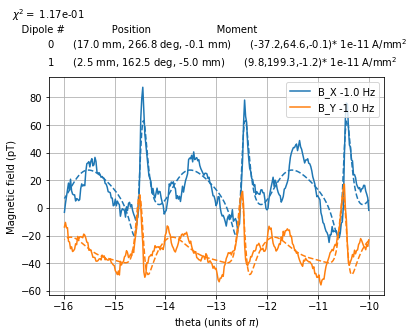

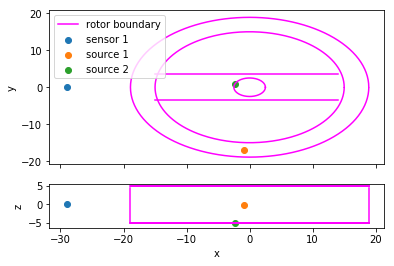

In [91]:
Opt_Settings_Exp1_1Hz['plot'] = 1
Opt_Settings_Exp1_1Hz['figname']=SaveDir+'Exp1_1Hz_'+nowtext+'_1'
# print(opt_res_Exp1_0p1Hz)
# Opt_Params_Exp1 = opt_res_Exp1_3Hz.x
chi2_one_exp_one_freq(opt_res_Exp1_1Hz.x,Opt_Settings_Exp1_1Hz)
opt_res_Exp1_1Hz.x

In [104]:
Opt_Params_Exp1_low_chi_1Hz = opt_res_Exp1_1Hz.x

[2.50048701, 0, 4.99991661, 162.302358, 85.8548947, -3.82980371, 2.50000484, 0.183412361, 0.824426187, -130.281662, 2.61069409, -72.2577306, 0.0707689583, 26.2889912, -27.5268646, -22.4844796]
0.15723109246125214


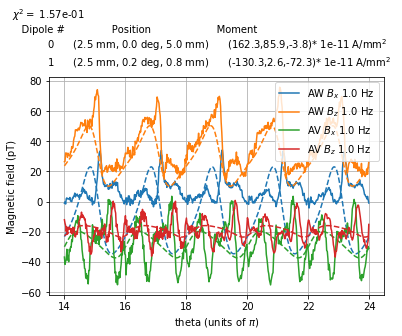

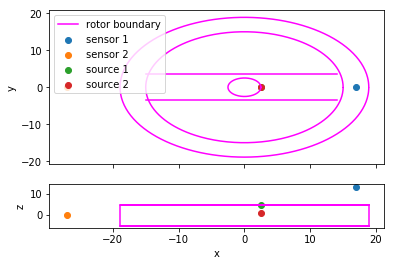

In [95]:
nu = 1
nowtext = now().strftime("%Y%m%d%H%M")
Opt_Settings_Exp2_1Hz = {'number of sources': 2,
                'location coordinate system': 'polar',
                'moment coordinate system':'polar',
                'location dimensions': 3,
                'moment dimensions': 3,
                'rotation sign':1, # 1 for positive, -1 for negative, 0 for unknown and making it a free parameter
                'rotation frequency':nu,
                'rotor dimensions':rtr_dims,
                'time':Exp2_Time_cut[nu],
                'number of sensors':2,
                'sensor locations':[Exp2_AW_sensor_loc,Exp2_AV_sensor_loc],
                'sensor field order':[[0,2],
                                     [0,2]],# list which order of B component of each sensor (0 for x, 1 for y, 2 for z) 
                'B data':[Exp2_AW_X_cut[nu],Exp2_AW_Z_cut[nu],
                         Exp2_AV_X_cut[nu],Exp2_AV_Z_cut[nu]],
                'bar location':180,
                'plot':1,
                'saveplot':1,
                'plotlabels':['AW $B_x$','AW $B_z$','AV $B_x$', 'AV $B_z$'],
                'figname':SaveDir+'Exp2_1Hz_'+nowtext+'_0'
}
Opt_Params_Exp2_1Hz = [ 2.50048701e+00, 0,  4.99991661e+00,  1.62302358e+02,
        8.58548947e+01, -3.82980371e+00,  2.50000484e+00,  1.83412361e-01,
        8.24426187e-01, -1.30281662e+02,  2.61069409e+00, -7.22577306e+01,
        7.07689583e-02,  2.62889912e+01, -2.75268646e+01, -2.24844796e+01]

chi_Exp2_1Hz = chi2_one_exp_one_freq(Opt_Params_Exp2_1Hz,Opt_Settings_Exp2_1Hz)

In [96]:
Opt_Settings_Exp2_1Hz['plot'] = 0
opt_res_Exp2_1Hz = minimize(chi2_one_exp_one_freq,Opt_Params_Exp2_1Hz,Opt_Settings_Exp2_1Hz,method = 'Nelder-Mead',options = {'maxfev': 5000,'maxiter': 5000,'adaptive':True})

[ 2.50048701e+00  0.00000000e+00  4.99991661e+00  1.62302358e+02
  8.58548947e+01 -3.82980371e+00  2.50000484e+00  1.83412361e-01
  8.24426187e-01 -1.30281662e+02  2.61069409e+00 -7.22577306e+01
  7.07689583e-02  2.62889912e+01 -2.75268646e+01 -2.24844796e+01]
0.15723109246125214
[ 2.62551136e+00  0.00000000e+00  4.99991661e+00  1.62302358e+02
  8.58548947e+01 -3.82980371e+00  2.50000484e+00  1.83412361e-01
  8.24426187e-01 -1.30281662e+02  2.61069409e+00 -7.22577306e+01
  7.07689583e-02  2.62889912e+01 -2.75268646e+01 -2.24844796e+01]
0.15692206842850376
[ 2.50048701e+00  2.50000000e-04  4.99991661e+00  1.62302358e+02
  8.58548947e+01 -3.82980371e+00  2.50000484e+00  1.83412361e-01
  8.24426187e-01 -1.30281662e+02  2.61069409e+00 -7.22577306e+01
  7.07689583e-02  2.62889912e+01 -2.75268646e+01 -2.24844796e+01]
0.1572317109067205
[ 2.50048701e+00  0.00000000e+00  5.24991244e+00  1.62302358e+02
  8.58548947e+01 -3.82980371e+00  2.50000484e+00  1.83412361e-01
  8.24426187e-01 -1.30281662

0.1521739440711636
[ 2.55612066e+00  9.86880658e-05  4.88944003e+00  1.61188729e+02
  8.44042357e+01 -3.83671206e+00  2.55562776e+00  1.84904934e-01
  8.42768949e-01 -1.33180315e+02  2.62133407e+00 -7.14990049e+01
  6.78928018e-02  2.68738983e+01 -2.74270263e+01 -2.24675753e+01]
0.1518726497046185
[ 2.55980230e+00  1.05218894e-04  4.88212908e+00  1.61115033e+02
  8.43082362e+01 -3.83716923e+00  2.41868342e+00  1.85003707e-01
  8.43982809e-01 -1.33372138e+02  2.62203819e+00 -7.14487951e+01
  7.14490598e-02  2.69126054e+01 -2.74204194e+01 -2.24664566e+01]
Source 2 not in rotor
[ 2.50882822e+00  1.47964069e-05  4.98335274e+00  1.62135390e+02
  8.56373958e+01 -3.83083949e+00  2.59599110e+00  1.83636144e-01
  8.27176337e-01 -1.30716260e+02  2.61228935e+00 -7.21439740e+01
  7.08645976e-02  2.63766869e+01 -2.75118957e+01 -2.24819451e+01]
0.15635677652429253
[ 2.56084495e+00  1.07068445e-04  4.88005860e+00  1.61094162e+02
  8.42810488e+01 -3.83729870e+00  2.55568194e+00  1.85031680e-01
  7.979

0.1501899239943069
[ 2.55685400e+00  1.02830971e-04  4.80620978e+00  1.62265818e+02
  8.33113459e+01 -3.99199650e+00  2.55133228e+00  1.82895867e-01
  8.27992479e-01 -1.31375029e+02  2.57343726e+00 -7.09274001e+01
  7.07533988e-02  2.68972083e+01 -2.79384639e+01 -2.26094727e+01]
0.14945972044699937
[ 2.55836918e+00  1.05243178e-04  4.79809008e+00  1.62303724e+02
  8.32047268e+01 -4.01252258e+00  2.55253287e+00  1.82716316e-01
  8.27553402e-01 -1.31338756e+02  2.56901246e+00 -7.08716360e+01
  7.06956027e-02  2.69141132e+01 -2.79677919e+01 -2.26178948e+01]
0.14918558277076996
[ 2.57365159e+00  1.35107270e-04  4.76199274e+00  1.60158509e+02
  8.27307356e+01 -3.81405576e+00  2.56745875e+00  1.83510263e-01
  8.31536135e-01 -1.32005387e+02  2.57821082e+00 -7.42366150e+01
  7.10148627e-02  2.70758824e+01 -2.76875574e+01 -2.24135123e+01]
0.14958310472359462
[ 2.56219502e+00  1.10799430e-04  4.77316372e+00  1.62006097e+02
  8.28774208e+01 -3.83775521e+00  2.55529232e+00  1.82011321e-01
  8.2563

0.1435163439334012
[ 2.63301930e+00  2.49315274e-04  4.66868822e+00  1.61315173e+02
  8.03090153e+01 -3.86005603e+00  2.62246656e+00  1.86391385e-01
  8.22938348e-01 -1.29403797e+02  2.49879713e+00 -7.01763166e+01
  7.07521336e-02  2.72766786e+01 -2.79208493e+01 -2.27811334e+01]
0.14321219129395596
[ 2.59705112e+00  1.78720946e-04  4.71423428e+00  1.64044919e+02
  7.70558922e+01 -3.89870638e+00  2.59034038e+00  1.84385803e-01
  8.21527999e-01 -1.28664312e+02  2.63494618e+00 -7.18338913e+01
  7.09262648e-02  2.68577184e+01 -2.80020335e+01 -2.30020429e+01]
0.14369998852772978
[ 2.63450343e+00  2.41309099e-04  4.62812114e+00  1.61957526e+02
  8.00902133e+01 -3.88068747e+00  2.62700923e+00  1.76052310e-01
  8.29534263e-01 -1.29784599e+02  2.62478505e+00 -7.05346501e+01
  7.16642856e-02  2.71956621e+01 -2.77449475e+01 -2.28623121e+01]
0.14298883383388636
[ 2.63877012e+00  2.48406661e-04  4.61777825e+00  1.61960030e+02
  7.99794097e+01 -3.88377088e+00  2.63141670e+00  1.75100297e-01
  8.3022

0.1356951504491176
[ 2.70037053e+00  3.55676595e-04  4.47414599e+00  1.62542192e+02
  7.61126489e+01 -3.88986392e+00  2.72142084e+00  1.82485641e-01
  8.04328153e-01 -1.29081097e+02  2.63552350e+00 -6.92345791e+01
  6.91317515e-02  2.76863608e+01 -2.82731325e+01 -2.29962090e+01]
0.1360711802439863
[ 2.70209023e+00  3.53642355e-04  4.49029158e+00  1.62370523e+02
  7.54626844e+01 -3.88424308e+00  2.67016348e+00  1.78737050e-01
  8.04099555e-01 -1.29001179e+02  2.63995294e+00 -6.92488176e+01
  6.79882191e-02  2.78103216e+01 -2.86582210e+01 -2.28154468e+01]
0.1356258453180564
[ 2.70535075e+00  3.59143954e-04  4.48470058e+00  1.62381197e+02
  7.52245322e+01 -3.88408920e+00  2.67188067e+00  1.78284072e-01
  8.02670284e-01 -1.29022408e+02  2.64104623e+00 -6.91781913e+01
  6.77527728e-02  2.78480599e+01 -2.86959626e+01 -2.28112113e+01]
0.1352701684215565
[ 2.69216567e+00  3.47810647e-04  4.46845243e+00  1.62360156e+02
  7.58381593e+01 -3.86866867e+00  2.66545976e+00  1.81613928e-01
  7.8231991

0.1280307656453528
[ 2.81337870e+00  5.87904485e-04  4.24547962e+00  1.61905338e+02
  7.12910347e+01 -3.94974275e+00  2.78758423e+00  1.82702198e-01
  8.17150880e-01 -1.23808480e+02  2.61974408e+00 -6.71754740e+01
  7.08890391e-02  2.81842788e+01 -2.86803440e+01 -2.31091818e+01]
0.12773335813801498
[ 2.82013045e+00  6.02202019e-04  4.23052831e+00  1.61875597e+02
  7.10451911e+01 -3.95384610e+00  2.79481571e+00  1.82978331e-01
  8.18055917e-01 -1.23482609e+02  2.61841270e+00 -6.70503042e+01
  7.10850558e-02  2.82052925e+01 -2.86793678e+01 -2.31278049e+01]
0.12729130333713992
[ 2.81118254e+00  5.04865988e-04  4.27101067e+00  1.60566312e+02
  7.09899281e+01 -3.98055742e+00  2.76827094e+00  1.80363433e-01
  8.19072362e-01 -1.25424725e+02  2.64108773e+00 -6.72845623e+01
  6.88566483e-02  2.83660678e+01 -2.90175481e+01 -2.25637066e+01]
0.12745219287957985
[ 2.79758259e+00  5.23025734e-04  4.27223153e+00  1.58853843e+02
  7.10018049e+01 -3.93764673e+00  2.75562293e+00  1.78716647e-01
  8.0306

0.1186413548952345
[ 2.94303905e+00  7.86210268e-04  3.98315273e+00  1.62111008e+02
  6.51609502e+01 -3.98451959e+00  2.86881252e+00  1.76149527e-01
  7.69065046e-01 -1.25573766e+02  2.65103760e+00 -6.42814291e+01
  6.51719737e-02  2.91497404e+01 -2.93885811e+01 -2.32137849e+01]
0.11814280993874289
[ 2.92330998e+00  7.83540042e-04  4.07959570e+00  1.61358267e+02
  6.63016522e+01 -4.01501787e+00  2.86923373e+00  1.77090307e-01
  7.80344279e-01 -1.21463461e+02  2.62482347e+00 -6.61667118e+01
  6.70349305e-02  3.02287871e+01 -2.89179889e+01 -2.29103364e+01]
0.11915560623389644
[ 2.95259489e+00  8.66698054e-04  3.98609537e+00  1.53758812e+02
  6.52655885e+01 -4.04063740e+00  2.90621949e+00  1.79802427e-01
  7.90048844e-01 -1.21776739e+02  2.66259696e+00 -6.50034135e+01
  6.80386966e-02  2.88575888e+01 -2.91820232e+01 -2.30799828e+01]
0.11867680320254079
[ 2.90779468e+00  8.11568730e-04  3.93466130e+00  1.62697415e+02
  6.49648258e+01 -3.92792305e+00  2.88087949e+00  1.78158909e-01
  8.2779

0.10886839935508065
[ 3.16794770e+00  1.16787997e-03  3.73586516e+00  1.59283337e+02
  5.81906898e+01 -4.16874412e+00  3.05932000e+00  1.75969512e-01
  7.32174523e-01 -1.23961607e+02  2.63296110e+00 -5.99375431e+01
  6.61133615e-02  3.01165799e+01 -2.90663731e+01 -2.32893018e+01]
0.10810421822732193
[ 3.18410373e+00  1.18949183e-03  3.72458948e+00  1.59057551e+02
  5.77867634e+01 -4.18419216e+00  3.07019952e+00  1.75841366e-01
  7.25932637e-01 -1.24251468e+02  2.63362524e+00 -5.96962141e+01
  6.60260087e-02  3.01643754e+01 -2.90339270e+01 -2.32781285e+01]
0.10759919332729763
[ 3.13342212e+00  1.14720709e-03  3.55818024e+00  1.61563960e+02
  5.64219636e+01 -4.03990443e+00  3.05009585e+00  1.77747004e-01
  7.67764139e-01 -1.18684849e+02  2.58024453e+00 -6.36370922e+01
  6.67956621e-02  3.00641251e+01 -2.91529430e+01 -2.36307740e+01]
0.10881119003455479
[ 3.15532643e+00  1.20643100e-03  3.55553672e+00  1.58546522e+02
  6.15653799e+01 -3.96942093e+00  3.07277160e+00  1.77048140e-01
  7.666

0.0978357281613479
[ 3.42424815e+00  1.61420610e-03  3.44975903e+00  1.59028319e+02
  4.77583308e+01 -4.00369428e+00  3.25663202e+00  1.70285547e-01
  7.79437861e-01 -1.14290838e+02  2.59832270e+00 -5.41790446e+01
  6.45269305e-02  3.16448760e+01 -2.92923333e+01 -2.38648789e+01]
0.09735522454763568
[ 3.35971002e+00  1.59236630e-03  3.07125716e+00  1.61447804e+02
  5.09586032e+01 -4.24326627e+00  3.23118409e+00  1.70577254e-01
  7.59122335e-01 -1.18224917e+02  2.66876064e+00 -5.51947645e+01
  6.28698791e-02  3.16087596e+01 -2.92954263e+01 -2.37789893e+01]
0.09765711629447833
[ 3.35662776e+00  1.59774027e-03  3.25016588e+00  1.61628926e+02
  4.78328491e+01 -4.21541688e+00  3.26086013e+00  1.72317888e-01
  7.45804888e-01 -1.16222719e+02  2.57340499e+00 -5.43210816e+01
  6.34444304e-02  3.16597263e+01 -3.10742203e+01 -2.34215391e+01]
0.09775305724861794
[ 3.36261213e+00  1.62966335e-03  3.33854830e+00  1.60237615e+02
  4.80433501e+01 -3.96700658e+00  3.27381938e+00  1.80621608e-01
  7.3378

0.08770098142181863
[ 3.61708681e+00  2.08413475e-03  2.91550833e+00  1.58011727e+02
  3.74177455e+01 -4.08590985e+00  3.48232685e+00  1.63271885e-01
  7.19176752e-01 -1.14817004e+02  2.76782708e+00 -4.72141675e+01
  6.29626048e-02  3.34904301e+01 -3.01708333e+01 -2.34303759e+01]
0.08752561686438688
[ 3.61963232e+00  2.08742452e-03  3.00949947e+00  1.61254360e+02
  3.80780228e+01 -4.21357565e+00  3.47267583e+00  1.68557423e-01
  7.17273741e-01 -1.11882692e+02  2.59923063e+00 -4.80248770e+01
  6.09534679e-02  3.47240549e+01 -2.92718009e+01 -2.34664988e+01]
0.08790043502729646
[ 3.65729010e+00  2.21362229e-03  2.88630061e+00  1.59843049e+02
  3.61237175e+01 -4.15783139e+00  3.50702872e+00  1.66731364e-01
  7.10402892e-01 -1.14207552e+02  2.60199088e+00 -4.53061548e+01
  6.14279945e-02  3.37496668e+01 -2.95748182e+01 -2.46882463e+01]
0.0866669020026362
[ 3.67302651e+00  2.24896451e-03  2.86179256e+00  1.59874352e+02
  3.54679644e+01 -4.15496255e+00  3.51991138e+00  1.66227147e-01
  7.0774

  5.76170862e-02  3.53540391e+01 -2.93492838e+01 -2.26986839e+01]
0.07897897682685266
[ 3.96651007e+00  2.72007393e-03  2.51708937e+00  1.60705283e+02
  2.41358371e+01 -4.30527392e+00  3.79799670e+00  1.72840694e-01
  7.22806472e-01 -1.13461873e+02  2.61700752e+00 -3.75389728e+01
  5.73869505e-02  3.54483064e+01 -2.93350208e+01 -2.25664160e+01]
0.07862710378194804
[ 3.90965186e+00  2.66905379e-03  2.59733866e+00  1.60502959e+02
  2.60171130e+01 -4.33881674e+00  3.75674936e+00  1.70524797e-01
  7.11039339e-01 -1.07093661e+02  2.67238754e+00 -3.49237399e+01
  5.81923295e-02  3.54593394e+01 -2.92782679e+01 -2.39895458e+01]
0.07886299798475188
[ 3.98185874e+00  2.79679095e-03  2.51675912e+00  1.53705771e+02
  2.21210200e+01 -4.30709576e+00  3.81815981e+00  1.67513099e-01
  7.06287004e-01 -1.14191087e+02  2.60713275e+00 -3.56319960e+01
  5.56751764e-02  3.62614196e+01 -2.98319112e+01 -2.43996464e+01]
0.07912338122436167
[ 3.98435054e+00  2.87038121e-03  2.49077885e+00  1.59760013e+02
  2.36

0.07270506997468937
[ 4.24135203e+00  3.35927999e-03  2.27958321e+00  1.59688875e+02
  1.72602068e+01 -4.30521228e+00  4.06137179e+00  1.64379791e-01
  6.68160766e-01 -1.15725713e+02  2.61940487e+00 -2.32317279e+01
  5.45273478e-02  3.78232702e+01 -2.90487425e+01 -2.30551715e+01]
0.07241179820186874
[ 4.37259676e+00  3.60735304e-03  1.97402399e+00  1.53474124e+02
  1.07262814e+01 -4.35892475e+00  4.18467376e+00  1.68100563e-01
  6.57963663e-01 -1.07603031e+02  2.62102834e+00 -2.56905834e+01
  5.41816078e-02  3.79689833e+01 -2.84521329e+01 -2.31736629e+01]
0.07335662203537514
[ 4.40607609e+00  3.59602643e-03  1.89201028e+00  1.63633203e+02
  8.03084532e+00 -4.33500854e+00  4.24845423e+00  1.61069787e-01
  6.77501324e-01 -1.11685798e+02  2.60330039e+00 -2.26899524e+01
  4.91970736e-02  3.83239734e+01 -2.84464761e+01 -2.39534326e+01]
0.07324834185759208
[ 4.44135506e+00  3.67190947e-03  1.85729864e+00  1.61301881e+02
  5.04660965e+00 -4.35011223e+00  4.16782910e+00  1.74778924e-01
  6.510

0.06932486262311675
[ 4.62440167e+00  3.94244434e-03  1.75372441e+00  1.58697432e+02
  6.38868914e+00 -4.61692370e+00  4.36286262e+00  1.57625861e-01
  5.98033739e-01 -1.17382007e+02  2.67602827e+00 -1.42121714e+01
  5.05002016e-02  3.83090302e+01 -2.86678673e+01 -2.24253364e+01]
0.0690040953889557
[ 4.63712089e+00  3.94991171e-03  1.74094271e+00  1.58548294e+02
  6.67440455e+00 -4.63821982e+00  4.36818751e+00  1.57103279e-01
  5.92158156e-01 -1.17963964e+02  2.68280350e+00 -1.39549395e+01
  5.02475283e-02  3.82542125e+01 -2.86726076e+01 -2.23688507e+01]
0.06884044565153825
[ 4.85341487e+00  4.47995972e-03  1.36504277e+00  1.59949619e+02
 -1.03775005e+01 -4.62952306e+00  4.61750719e+00  1.58323687e-01
  6.12415721e-01 -1.10006776e+02  2.63217274e+00 -8.14872551e+00
  4.99808509e-02  3.97257424e+01 -2.81641291e+01 -2.26134833e+01]
0.07077859225921392
[ 4.49874443e+00  3.91641642e-03  1.75377418e+00  1.58739524e+02
  4.94884998e+00 -4.68344508e+00  4.36483558e+00  1.68450164e-01
  6.1628

0.06564402351321688
[ 4.78187363e+00  4.45448105e-03  1.29117492e+00  1.62919160e+02
  3.69933031e+00 -4.92191100e+00  4.57827816e+00  1.57923187e-01
  6.22791239e-01 -1.17401115e+02  2.56424136e+00 -1.89493902e+00
  5.22302496e-02  3.91353363e+01 -2.77157525e+01 -2.09630962e+01]
0.06436867571413199
[ 4.78841626e+00  4.47565720e-03  1.24078322e+00  1.63358857e+02
  3.94846936e+00 -4.95794720e+00  4.58482612e+00  1.57268264e-01
  6.22562048e-01 -1.17496444e+02  2.56150456e+00 -1.43343902e+00
  5.23468425e-02  3.91630368e+01 -2.77002133e+01 -2.08919672e+01]
0.06416556030149556
[ 4.72732409e+00  4.23032440e-03  1.69153524e+00  1.57291504e+02
  5.06831761e+00 -4.78180956e+00  4.51442131e+00  1.66678174e-01
  6.52474485e-01 -1.09284613e+02  2.62402805e+00 -2.69071710e+00
  5.12181464e-02  3.82709358e+01 -2.80913497e+01 -2.13680288e+01]
0.06424069333549774
[ 4.57990659e+00  4.05345721e-03  1.80975109e+00  1.59462688e+02
  6.42929752e+00 -4.70300102e+00  4.40324532e+00  1.65448516e-01
  6.871

0.06114042587449729
[ 4.91380898e+00  4.57972138e-03  1.76517434e+00  1.59556387e+02
  4.11597520e+00 -4.63976237e+00  4.71575545e+00  1.70583067e-01
  6.48911498e-01 -1.22085140e+02  2.59130183e+00  8.52984142e+00
  4.73154349e-02  3.74080552e+01 -2.67024936e+01 -2.03047185e+01]
0.06041941127482903
[ 4.92164603e+00  4.58622539e-03  1.79794879e+00  1.59318732e+02
  4.12644431e+00 -4.61987582e+00  4.72393854e+00  1.71415242e-01
  6.50558339e-01 -1.22371934e+02  2.59316416e+00  9.15254644e+00
  4.70009719e-02  3.72983689e+01 -2.66401361e+01 -2.02680154e+01]
0.060274015603448625
[ 4.99667819e+00  4.86768891e-03  1.27056259e+00  1.63688463e+02
  1.01158348e+00 -4.93315312e+00  4.82667643e+00  1.61612423e-01
  6.15457373e-01 -1.18820294e+02  2.50060529e+00  1.13494135e+01
  4.88996341e-02  3.85263727e+01 -2.83064238e+01 -1.98315129e+01]
0.06010496496355594
[ 5.01337319e+00  4.90742125e-03  1.24107616e+00  1.63966679e+02
  6.54325970e-01 -4.95025069e+00  4.84698829e+00  1.61287321e-01
  6.12

0.05828674673104979
[ 5.21642469e+00  5.22799411e-03  1.02997835e+00  1.67731632e+02
  3.17259890e+00 -5.17821952e+00  4.97432177e+00  1.74106616e-01
  6.81445286e-01 -1.21164891e+02  2.30034402e+00  2.44446365e+01
  4.69872538e-02  3.79196502e+01 -2.65612481e+01 -1.88983698e+01]
0.056026119584493196
[ 5.23723499e+00  5.26607070e-03  1.00683184e+00  1.68337265e+02
  2.95230453e+00 -5.20311036e+00  4.99046044e+00  1.75644009e-01
  6.83730130e-01 -1.21136016e+02  2.27054958e+00  2.54111190e+01
  4.66483836e-02  3.79200916e+01 -2.64826200e+01 -1.88676964e+01]
0.05586974136653442
[ 5.09076586e+00  4.99615197e-03  1.31950086e+00  1.61774547e+02
  8.31610315e+00 -5.11002719e+00  4.98144493e+00  1.57403925e-01
  6.87151049e-01 -1.24169664e+02  2.44828489e+00  2.11917982e+01
  5.42647779e-02  3.70341259e+01 -2.59292036e+01 -1.85440613e+01]
0.05633255501160346
[ 5.16567618e+00  5.20455871e-03  9.93928449e-01  1.63172049e+02
  4.86024080e+00 -4.78308084e+00  4.98214216e+00  1.73242895e-01
  6.31

0.05260704454966587
[ 5.49699933e+00  5.76412056e-03  6.63643288e-01  1.69246799e+02
  4.79234272e+00 -5.08222254e+00  5.27513388e+00  1.59387309e-01
  7.73489364e-01 -1.16230615e+02  2.44373068e+00  3.98253007e+01
  4.83936012e-02  3.72984963e+01 -2.65557608e+01 -1.65278565e+01]
0.05249044365304759
[ 5.35914252e+00  5.38899215e-03  4.15847244e-01  1.68921469e+02
  1.29143884e+01 -5.21431692e+00  5.14418216e+00  1.72306164e-01
  6.74245211e-01 -1.18082183e+02  2.40496505e+00  3.54325372e+01
  5.46665061e-02  3.69813058e+01 -2.66320380e+01 -1.80155387e+01]
0.0518757164054475
[ 5.37501536e+00  5.40342584e-03  3.61595019e-01  1.69148242e+02
  1.32736448e+01 -5.21671033e+00  5.15579256e+00  1.73493378e-01
  6.70180119e-01 -1.17588391e+02  2.39544065e+00  3.59889270e+01
  5.53900970e-02  3.69792681e+01 -2.65959541e+01 -1.80729343e+01]
0.051728871748074196
[ 5.37106235e+00  5.63604844e-03  7.27506058e-01  1.68208678e+02
  5.80714606e+00 -5.19023143e+00  5.19668096e+00  1.62654077e-01
  6.987

0.049695787333281796
[ 5.64158004e+00  5.97575029e-03 -2.80269742e-01  1.84805069e+02
  1.47336449e+01 -5.68376852e+00  5.42288587e+00  1.53888901e-01
  7.29336084e-01 -1.26799572e+02  2.26917065e+00  5.45813521e+01
  4.86827600e-02  3.65321217e+01 -2.61864762e+01 -1.62881647e+01]
0.0493684455250168
[ 5.66652370e+00  6.01830605e-03 -3.47828826e-01  1.85920119e+02
  1.46743461e+01 -5.70498438e+00  5.44630137e+00  1.52884467e-01
  7.28163540e-01 -1.27782146e+02  2.26340589e+00  5.55697393e+01
  4.84667293e-02  3.65746884e+01 -2.60357673e+01 -1.62594386e+01]
0.04937401494451847
[ 5.80710986e+00  6.38452824e-03 -4.01579496e-01  1.71909569e+02
  5.81849443e+00 -5.80473409e+00  5.58100337e+00  1.56405882e-01
  7.32833104e-01 -1.18291288e+02  2.31286248e+00  5.94746969e+01
  4.23853330e-02  3.80931982e+01 -2.76723266e+01 -1.60078871e+01]
0.05096957899704139
[ 5.49964871e+00  5.81284037e-03 -2.01049301e-03  1.74055816e+02
  2.14766200e+01 -5.69961843e+00  5.30544710e+00  1.64576740e-01
  7.188

0.048466494959600745
[ 5.76756383e+00  6.25473726e-03 -7.67525616e-01  1.88343145e+02
  2.05141710e+01 -5.87975003e+00  5.58257213e+00  1.61315592e-01
  8.05175775e-01 -1.20619370e+02  2.10402561e+00  7.21862614e+01
  4.74322584e-02  3.57206496e+01 -2.70273073e+01 -1.52654096e+01]
0.048894457281676816
[ 5.87872964e+00  6.34753831e-03 -6.94047919e-01  1.89031460e+02
  1.65200698e+01 -5.98741353e+00  5.55117043e+00  1.70496504e-01
  7.81001195e-01 -1.13804621e+02  1.95281817e+00  6.71776856e+01
  4.63905922e-02  3.63048825e+01 -2.62902506e+01 -1.64182134e+01]
0.04873669799557203
[ 5.60050846e+00  5.81822152e-03 -4.70568190e-01  1.82277770e+02
  2.73875445e+01 -5.55991280e+00  5.35691550e+00  1.58792678e-01
  7.80923079e-01 -1.23585036e+02  2.16680463e+00  5.92034264e+01
  4.61050798e-02  3.48702239e+01 -2.76180501e+01 -1.73876438e+01]
0.04875297992211177
[ 5.58901166e+00  5.86997791e-03 -4.93155177e-01  1.81082169e+02
  3.15536500e+01 -5.79272492e+00  5.36456316e+00  1.70433844e-01
  8.1

0.04822722432388621
[ 5.49486398e+00  5.64941653e-03 -5.72909781e-01  1.89531797e+02
  3.23730930e+01 -5.78833976e+00  5.28676588e+00  1.50238326e-01
  8.03862767e-01 -1.13767644e+02  2.07339734e+00  5.41035676e+01
  5.11658914e-02  3.51036395e+01 -2.61822951e+01 -1.76038910e+01]
0.0485384592554525
[ 5.54600880e+00  5.74537121e-03 -6.10126314e-01  1.88880010e+02
  3.06178186e+01 -5.76452608e+00  5.32913367e+00  1.53273135e-01
  7.94799393e-01 -1.14022775e+02  2.10180645e+00  5.61721639e+01
  5.07785688e-02  3.52636257e+01 -2.64470765e+01 -1.73140264e+01]
0.04827522165988007
[ 5.75261845e+00  6.13926257e-03 -9.49947458e-01  1.86785993e+02
  3.01854214e+01 -5.70383762e+00  5.48270458e+00  1.62991141e-01
  7.27013819e-01 -1.17960081e+02  1.92009032e+00  6.34872250e+01
  5.20531323e-02  3.57762562e+01 -2.70190995e+01 -1.61631374e+01]
0.047827568299245664
[ 5.76248727e+00  6.15851724e-03 -9.79497574e-01  1.86723858e+02
  3.06327858e+01 -5.70343492e+00  5.48880412e+00  1.63276669e-01
  7.215

0.04818210194286718
[ 5.82624215e+00  6.31228941e-03 -1.50348023e+00  1.95642136e+02
  3.06862019e+01 -5.78119639e+00  5.55247027e+00  1.60449949e-01
  6.90606287e-01 -1.13198278e+02  2.09276529e+00  6.82322758e+01
  5.14816658e-02  3.66109561e+01 -2.68082842e+01 -1.71533523e+01]
0.04781922457540519
[ 5.53345386e+00  5.65750215e-03 -8.03859898e-01  1.89332576e+02
  3.64824918e+01 -5.70057835e+00  5.22776323e+00  1.59104954e-01
  7.17282285e-01 -1.13866473e+02  2.12368359e+00  5.56727034e+01
  5.19440792e-02  3.51612542e+01 -2.66749885e+01 -1.76606267e+01]
0.04822935327303428
[ 5.87969865e+00  6.33911328e-03 -1.37622983e+00  1.92075731e+02
  2.95788394e+01 -5.83938296e+00  5.58880681e+00  1.63620228e-01
  7.20528106e-01 -1.15383219e+02  2.14722727e+00  7.03777486e+01
  4.87474080e-02  3.63265861e+01 -2.72060928e+01 -1.59651695e+01]
0.04780461728485031
[ 5.78135107e+00  6.05059426e-03 -9.97563383e-01  1.92129295e+02
  2.50272143e+01 -5.51921218e+00  5.44565186e+00  1.56809421e-01
  6.600

0.04765587418094097
[ 5.73569909e+00  5.90212801e-03 -1.20170128e+00  1.93047319e+02
  3.78545131e+01 -5.62571796e+00  5.29508522e+00  1.70948807e-01
  6.96864438e-01 -1.13079583e+02  2.11739728e+00  6.15599491e+01
  5.26937869e-02  3.57704301e+01 -2.58549896e+01 -1.71734730e+01]
0.047744315671580606
[ 5.68025598e+00  5.99248666e-03 -1.23507219e+00  1.91097817e+02
  3.50396894e+01 -5.76979170e+00  5.24941248e+00  1.72356886e-01
  7.27871375e-01 -1.15263451e+02  2.13935576e+00  6.44383373e+01
  5.68650533e-02  3.58679664e+01 -2.75268027e+01 -1.64852667e+01]
0.047576422207812254
[ 5.66571063e+00  5.97887704e-03 -1.22931578e+00  1.90921645e+02
  3.51671435e+01 -5.77493013e+00  5.22770269e+00  1.72930261e-01
  7.30217268e-01 -1.15393289e+02  2.14029086e+00  6.42882693e+01
  5.75767377e-02  3.58485835e+01 -2.76491083e+01 -1.64711481e+01]
0.047603879375706204
[ 5.80004175e+00  6.10865835e-03 -1.47545124e+00  1.96735559e+02
  3.77235434e+01 -5.85233439e+00  5.40710264e+00  1.72002394e-01
  6.

0.047598772694436325
[ 5.89429923e+00  6.26962510e-03 -1.54348218e+00  1.94220266e+02
  3.11073949e+01 -5.62377648e+00  5.40913904e+00  1.69082754e-01
  6.63302416e-01 -1.13891318e+02  2.17024188e+00  6.71976265e+01
  5.34757221e-02  3.61549297e+01 -2.72818741e+01 -1.64769290e+01]
0.047504309017820066
[ 5.91768855e+00  6.31317105e-03 -1.37294016e+00  1.94393057e+02
  2.77064428e+01 -5.61976511e+00  5.44290784e+00  1.74650201e-01
  6.61202543e-01 -1.11609473e+02  2.13629254e+00  6.66014099e+01
  5.51891318e-02  3.69163261e+01 -2.65150014e+01 -1.60130819e+01]
0.04765888033796421
[ 5.82000783e+00  6.11736226e-03 -1.33248186e+00  1.91193092e+02
  3.66455605e+01 -5.77076992e+00  5.35903581e+00  1.64958826e-01
  6.80826449e-01 -1.15593446e+02  2.15759473e+00  6.84599451e+01
  5.27754419e-02  3.57109814e+01 -2.71025425e+01 -1.63465923e+01]
0.04749390974102211
[ 5.84748310e+00  6.05811271e-03 -1.44658408e+00  1.94215687e+02
  3.64705724e+01 -6.06318583e+00  5.28121167e+00  1.78310016e-01
  6.2

0.04734930273737054
[ 5.88805721e+00  6.01156946e-03 -1.32172786e+00  1.93775170e+02
  3.37020140e+01 -5.80921916e+00  5.22365368e+00  1.66282567e-01
  5.90592259e-01 -1.14940130e+02  2.35761183e+00  6.51940975e+01
  5.75445742e-02  3.62936377e+01 -2.67365307e+01 -1.68045147e+01]
0.047280702485613654
[ 5.88821510e+00  5.99814901e-03 -1.32759275e+00  1.94076787e+02
  3.36141053e+01 -5.81521206e+00  5.21433201e+00  1.65939436e-01
  5.84639580e-01 -1.14970321e+02  2.38408249e+00  6.49499847e+01
  5.75401838e-02  3.63289255e+01 -2.67314384e+01 -1.68829708e+01]
0.04729666034278182
[ 5.89550435e+00  6.01970723e-03 -1.31557787e+00  1.92287438e+02
  3.68282769e+01 -5.79341017e+00  5.25015261e+00  1.70333841e-01
  6.44783552e-01 -1.11800177e+02  2.08876136e+00  6.87444722e+01
  6.00728473e-02  3.63395896e+01 -2.72329658e+01 -1.65090973e+01]
0.04731966315262568
[ 6.05237469e+00  6.31176801e-03 -1.49393378e+00  1.94471830e+02
  3.25242823e+01 -5.80920999e+00  5.47575168e+00  1.65653657e-01
  5.76

0.04737277663108304
[ 6.01192914e+00  6.24840971e-03 -1.39392132e+00  1.91770618e+02
  3.53887895e+01 -5.87952378e+00  5.31856993e+00  1.63887428e-01
  6.18414511e-01 -1.13413152e+02  2.12183076e+00  7.22909445e+01
  6.18795951e-02  3.62935835e+01 -2.65135739e+01 -1.60767668e+01]
0.047225477678325245
[ 6.09576673e+00  6.25489922e-03 -1.51473503e+00  1.93461733e+02
  3.49391190e+01 -6.08350045e+00  5.36191292e+00  1.64540214e-01
  5.26342430e-01 -1.14808324e+02  2.15988444e+00  7.38798362e+01
  5.85063158e-02  3.61645397e+01 -2.68287271e+01 -1.59265140e+01]
0.047188327885388744
[ 5.98423815e+00  6.04126342e-03 -1.27634019e+00  1.89441083e+02
  3.89101862e+01 -5.88583782e+00  5.28774942e+00  1.70918467e-01
  6.00105657e-01 -1.13237613e+02  2.12686316e+00  6.86162688e+01
  5.99195101e-02  3.54438196e+01 -2.61164456e+01 -1.66257710e+01]
0.04730853422434225
[ 5.94598762e+00  6.17101016e-03 -1.30284542e+00  1.90850453e+02
  3.33051813e+01 -5.91434040e+00  5.23474099e+00  1.64626509e-01
  6.0

0.047186072597605135
[ 5.98603455e+00  6.10542435e-03 -1.16956868e+00  1.85464805e+02
  3.25756778e+01 -5.69127150e+00  5.12188155e+00  1.67395943e-01
  6.13699664e-01 -1.12150469e+02  2.18940445e+00  6.59393891e+01
  6.77104362e-02  3.61549357e+01 -2.65524648e+01 -1.62893227e+01]
0.04710214641334585
[ 6.01921172e+00  6.06658198e-03 -1.23622109e+00  1.91227561e+02
  3.61268535e+01 -5.77753416e+00  5.19225188e+00  1.69989797e-01
  5.04731864e-01 -1.17928430e+02  2.15756702e+00  6.72390609e+01
  6.29712004e-02  3.63667907e+01 -2.67551820e+01 -1.58924438e+01]
0.047109305471698636
[ 6.02701447e+00  6.18968817e-03 -1.21961218e+00  1.87131583e+02
  3.65522315e+01 -5.88686085e+00  5.23919368e+00  1.67700502e-01
  5.96457546e-01 -1.15096757e+02  1.99280508e+00  7.09131872e+01
  6.48376427e-02  3.59205906e+01 -2.66925562e+01 -1.53861089e+01]
0.04716304695835497
[ 6.07715969e+00  6.14927154e-03 -1.13258976e+00  1.86485384e+02
  3.16196394e+01 -5.76755648e+00  5.21067186e+00  1.66539704e-01
  5.6

0.047048225519338606
[ 5.97790434e+00  5.96618694e-03 -1.13319392e+00  1.86500020e+02
  3.60154505e+01 -5.93848018e+00  5.09615362e+00  1.67695669e-01
  5.30789854e-01 -1.15043437e+02  2.14062527e+00  6.63584951e+01
  6.94810124e-02  3.55510129e+01 -2.69823457e+01 -1.60203168e+01]
0.047108386666213316
[ 6.06811002e+00  6.11375351e-03 -1.25713604e+00  1.88273995e+02
  3.60679557e+01 -5.86137408e+00  5.17147686e+00  1.66040758e-01
  5.48270377e-01 -1.13075525e+02  2.15647746e+00  7.01461303e+01
  6.99084484e-02  3.60562328e+01 -2.63963870e+01 -1.61203408e+01]
0.04702208928518797
[ 6.07311072e+00  6.11618559e-03 -1.25711329e+00  1.88283858e+02
  3.61623980e+01 -5.85637759e+00  5.17122541e+00  1.65905016e-01
  5.47186405e-01 -1.12979259e+02  2.15544952e+00  7.02926250e+01
  7.04162503e-02  3.60690757e+01 -2.63564116e+01 -1.61320792e+01]
0.047023734431813825
[ 6.07162461e+00  6.09704713e-03 -1.22471291e+00  1.88400700e+02
  3.44573169e+01 -5.91427499e+00  5.17592016e+00  1.67032819e-01
  5.

0.04694963502157657
[ 6.14499950e+00  6.11403065e-03 -1.24043798e+00  1.86184321e+02
  3.35424302e+01 -5.99246693e+00  5.12386008e+00  1.65903929e-01
  5.25947070e-01 -1.13674819e+02  2.18333007e+00  7.15357935e+01
  7.29782784e-02  3.56037739e+01 -2.67022550e+01 -1.61819506e+01]
0.046950222210363886
[ 6.14130792e+00  6.08625689e-03 -1.16245058e+00  1.85593902e+02
  3.49259538e+01 -5.99547719e+00  5.11939684e+00  1.57566970e-01
  5.07483181e-01 -1.12159847e+02  2.24074792e+00  6.98313925e+01
  7.32877107e-02  3.57501844e+01 -2.60820022e+01 -1.59086138e+01]
0.046974160128440176
[ 6.16085369e+00  6.22112327e-03 -1.31547819e+00  1.87297949e+02
  3.38213416e+01 -6.00710621e+00  5.17942956e+00  1.65133084e-01
  5.57457164e-01 -1.10826149e+02  2.22840015e+00  7.33474440e+01
  6.85194443e-02  3.61495617e+01 -2.59895885e+01 -1.60589020e+01]
0.04705925283309993
[ 6.06232795e+00  6.02262495e-03 -1.21310111e+00  1.86868703e+02
  3.55820359e+01 -6.02342177e+00  5.10641245e+00  1.65591425e-01
  4.9

0.04695659557981382
[ 6.19973332e+00  6.12756681e-03 -1.33376892e+00  1.86622606e+02
  3.43426345e+01 -6.14683466e+00  5.07494777e+00  1.63221997e-01
  4.67697078e-01 -1.12195954e+02  2.24124106e+00  7.24793266e+01
  7.58168803e-02  3.57000515e+01 -2.66355314e+01 -1.56463014e+01]
0.04691986152306924
[ 6.14555497e+00  6.08041999e-03 -1.32344372e+00  1.86256133e+02
  3.36816253e+01 -6.27229444e+00  5.05532432e+00  1.73062357e-01
  4.60803067e-01 -1.14250369e+02  2.21800856e+00  7.31132505e+01
  7.35677526e-02  3.58199893e+01 -2.69024201e+01 -1.60336221e+01]
0.04692832337873725
[ 6.17566561e+00  6.17819566e-03 -1.33236713e+00  1.86145929e+02
  3.58244382e+01 -6.30943880e+00  5.12475377e+00  1.66361143e-01
  4.84829891e-01 -1.14120598e+02  2.10482511e+00  7.53293169e+01
  7.45274589e-02  3.55658693e+01 -2.64988573e+01 -1.55702389e+01]
0.04697267227488177
[ 6.16713659e+00  6.15295361e-03 -1.30987271e+00  1.86092423e+02
  3.54107946e+01 -6.26497017e+00  5.11432064e+00  1.66204230e-01
  4.842

0.04684310835970231
[ 6.26907079e+00  6.13428860e-03 -1.25992682e+00  1.86105842e+02
  3.18690436e+01 -6.32947667e+00  5.07856955e+00  1.59057816e-01
  3.73154807e-01 -1.16027557e+02  2.31957589e+00  7.32733007e+01
  7.69062569e-02  3.59526626e+01 -2.64271705e+01 -1.57383374e+01]
0.046880230093057924
[ 6.27714394e+00  6.09581921e-03 -1.23534602e+00  1.84635700e+02
  3.40938934e+01 -6.21909047e+00  5.06671337e+00  1.68278088e-01
  3.95329906e-01 -1.13156726e+02  2.24764200e+00  7.30683459e+01
  7.48207150e-02  3.59748829e+01 -2.59398100e+01 -1.58582742e+01]
0.04689077443869996
[ 6.22199775e+00  6.05227711e-03 -1.20856096e+00  1.84970661e+02
  3.58660031e+01 -6.29454562e+00  5.03986244e+00  1.67796922e-01
  3.96850300e-01 -1.11473206e+02  2.26046242e+00  7.37897506e+01
  7.47473356e-02  3.57295874e+01 -2.64305723e+01 -1.58485287e+01]
0.04688605269429936
[ 6.24478951e+00  6.08737981e-03 -1.19919617e+00  1.82048129e+02
  3.15671879e+01 -6.34901033e+00  4.96898446e+00  1.65236369e-01
  4.39

0.04686247799387929
[ 6.24106758e+00  6.04361551e-03 -1.10970815e+00  1.81256260e+02
  3.28360173e+01 -6.30915315e+00  4.97589100e+00  1.67137531e-01
  3.83222315e-01 -1.13157732e+02  2.27992446e+00  7.26190237e+01
  8.02921075e-02  3.56363626e+01 -2.61500535e+01 -1.59655699e+01]
0.046840518756028175
[ 6.23266946e+00  5.95830030e-03 -1.06320394e+00  1.81460593e+02
  3.21839790e+01 -6.30204587e+00  4.90204908e+00  1.71957089e-01
  3.52885858e-01 -1.14242346e+02  2.34145523e+00  7.16378821e+01
  8.03140155e-02  3.55742329e+01 -2.65179656e+01 -1.59133552e+01]
0.046835199942603455
[ 6.28517563e+00  6.03251597e-03 -1.02047100e+00  1.79938699e+02
  3.33543151e+01 -6.21676499e+00  4.94162649e+00  1.63844165e-01
  3.64974886e-01 -1.12890703e+02  2.30033384e+00  7.25031697e+01
  8.15590952e-02  3.53839566e+01 -2.60234537e+01 -1.56094704e+01]
0.04684289933019584
[ 6.27384333e+00  5.97771595e-03 -1.09330000e+00  1.83599679e+02
  3.61500283e+01 -6.35163286e+00  4.98035213e+00  1.71377906e-01
  2.8

0.04678915983116957
[ 6.38337001e+00  6.02495972e-03 -1.18588888e+00  1.81543133e+02
  3.38462108e+01 -6.38622954e+00  4.92351840e+00  1.73407444e-01
  2.72913212e-01 -1.12924732e+02  2.32305413e+00  7.53295680e+01
  8.14634234e-02  3.55304056e+01 -2.61826646e+01 -1.58173922e+01]
0.04679058543128094
[ 6.38070260e+00  6.04954749e-03 -1.19427352e+00  1.81805505e+02
  3.48220933e+01 -6.53518602e+00  4.95240062e+00  1.68823306e-01
  2.80586093e-01 -1.13252495e+02  2.27333564e+00  7.73746679e+01
  8.26652819e-02  3.53021925e+01 -2.63233805e+01 -1.56898384e+01]
0.046794285567012484
[ 6.31761498e+00  5.98818753e-03 -1.15251359e+00  1.80493560e+02
  3.45774212e+01 -6.54163265e+00  4.85909112e+00  1.72720742e-01
  2.67409968e-01 -1.13174472e+02  2.33291212e+00  7.58208225e+01
  8.32497949e-02  3.52838472e+01 -2.65461004e+01 -1.54734489e+01]
0.04678866305088522
[ 6.31764579e+00  5.98502331e-03 -1.15329901e+00  1.80338241e+02
  3.46602113e+01 -6.55377392e+00  4.84994347e+00  1.73050884e-01
  2.62

0.0467862826348424
[ 6.36985688e+00  6.03699409e-03 -1.24679241e+00  1.83648285e+02
  3.41864402e+01 -6.58050030e+00  4.92740290e+00  1.67859834e-01
  2.36281239e-01 -1.15414895e+02  2.32553562e+00  7.57737500e+01
  8.13981647e-02  3.55843500e+01 -2.64454377e+01 -1.56143645e+01]
0.04679440220881252
[ 6.40454986e+00  6.00503846e-03 -1.18846071e+00  1.80002776e+02
  3.40652160e+01 -6.67062803e+00  4.85894882e+00  1.68806008e-01
  2.36607452e-01 -1.12130425e+02  2.32077164e+00  7.63200834e+01
  8.68767322e-02  3.53418949e+01 -2.61618828e+01 -1.55083727e+01]
0.04678261350063434
[ 6.35771634e+00  5.95461455e-03 -1.23637032e+00  1.84035971e+02
  3.63272002e+01 -6.71197841e+00  4.90536887e+00  1.72412674e-01
  2.19454382e-01 -1.15327907e+02  2.29872699e+00  7.71551227e+01
  8.02205663e-02  3.54707183e+01 -2.65424544e+01 -1.55470953e+01]
0.04680039637062178
[ 6.35536162e+00  6.02558277e-03 -1.12550091e+00  1.79571148e+02
  3.29601069e+01 -6.50185987e+00  4.88782977e+00  1.70859044e-01
  2.8361

0.04677857032419678
[ 6.39004539e+00  5.96498441e-03 -1.07630357e+00  1.77861237e+02
  3.28221020e+01 -6.71840903e+00  4.80481298e+00  1.73556493e-01
  2.09166300e-01 -1.12588007e+02  2.34267790e+00  7.68215157e+01
  8.62781421e-02  3.52935731e+01 -2.63337396e+01 -1.55385498e+01]
0.04677128881459866
[ 6.39209469e+00  5.96375927e-03 -1.06663316e+00  1.77603873e+02
  3.26371330e+01 -6.72553840e+00  4.79961303e+00  1.73380286e-01
  2.06975754e-01 -1.12519898e+02  2.34577224e+00  7.68603087e+01
  8.65233033e-02  3.52957277e+01 -2.63366501e+01 -1.55252968e+01]
0.04677303939285615
[ 6.34093903e+00  5.93952592e-03 -1.10485339e+00  1.79569818e+02
  3.43831025e+01 -6.65809275e+00  4.82710928e+00  1.81720090e-01
  2.13343743e-01 -1.14192527e+02  2.31781301e+00  7.67649396e+01
  8.16821494e-02  3.52047374e+01 -2.64805103e+01 -1.57845475e+01]
0.04677281134385518
[ 6.40419446e+00  6.01141885e-03 -1.15740430e+00  1.78913894e+02
  3.46716671e+01 -6.70454464e+00  4.87195251e+00  1.74925227e-01
  2.237

0.04677482300280493
[ 6.39991219e+00  5.99023644e-03 -1.14778852e+00  1.79686675e+02
  3.36759905e+01 -6.69834567e+00  4.84472043e+00  1.74844543e-01
  2.06722687e-01 -1.12786924e+02  2.34911723e+00  7.69164606e+01
  8.50082002e-02  3.52211957e+01 -2.62054480e+01 -1.55285529e+01]
0.04676900904675209
[ 6.40200624e+00  5.96017002e-03 -1.16332902e+00  1.79295413e+02
  3.35536412e+01 -6.83436600e+00  4.78585220e+00  1.77548412e-01
  1.68512012e-01 -1.13323167e+02  2.36166266e+00  7.74938986e+01
  8.52255987e-02  3.52317093e+01 -2.63480402e+01 -1.55852274e+01]
0.04676488145962267
[ 6.40454101e+00  5.95985505e-03 -1.16606158e+00  1.79280492e+02
  3.34979247e+01 -6.84828704e+00  4.78174167e+00  1.77671382e-01
  1.63421261e-01 -1.13369571e+02  2.36491319e+00  7.75545482e+01
  8.52701970e-02  3.52307374e+01 -2.63564315e+01 -1.55740652e+01]
0.04676572485366476
[ 6.41983787e+00  5.98254355e-03 -1.15039042e+00  1.78393457e+02
  3.39874790e+01 -6.83173491e+00  4.80928721e+00  1.77221424e-01
  1.868

0.046765236396709736
[ 6.36799463e+00  5.91268680e-03 -1.10551166e+00  1.78204824e+02
  3.40928211e+01 -6.87783997e+00  4.76130399e+00  1.80456794e-01
  1.78909298e-01 -1.13167523e+02  2.32964120e+00  7.77966768e+01
  8.51010405e-02  3.50954175e+01 -2.63387175e+01 -1.58120331e+01]
0.04676647393559101
[ 6.37625947e+00  5.91594856e-03 -1.14964269e+00  1.79850027e+02
  3.49588587e+01 -6.87091042e+00  4.79523143e+00  1.79885548e-01
  1.66218519e-01 -1.13763052e+02  2.32659508e+00  7.77756977e+01
  8.42269498e-02  3.51318061e+01 -2.64026734e+01 -1.56191125e+01]
0.0467635438812877
[ 6.35066427e+00  5.90900835e-03 -1.10684276e+00  1.79451737e+02
  3.40974595e+01 -6.79930014e+00  4.78777638e+00  1.79213462e-01
  1.85314864e-01 -1.13816905e+02  2.34461524e+00  7.63660740e+01
  8.42359068e-02  3.52199216e+01 -2.62666944e+01 -1.57516073e+01]
0.04676122079810371
[ 6.40571392e+00  5.93448799e-03 -1.13794270e+00  1.78626122e+02
  3.38017293e+01 -6.93611448e+00  4.77076565e+00  1.75910271e-01
  1.634

0.046758364908418844
[ 6.32815984e+00  5.90366758e-03 -1.09850569e+00  1.79092351e+02
  3.39825121e+01 -6.82308025e+00  4.76356125e+00  1.83594857e-01
  1.71103899e-01 -1.13677976e+02  2.34113057e+00  7.70904082e+01
  8.33225721e-02  3.51821600e+01 -2.64298391e+01 -1.56789916e+01]
0.046756652087601526
[ 6.38039643e+00  5.92847963e-03 -1.12856349e+00  1.78221813e+02
  3.36724135e+01 -6.96286711e+00  4.74352363e+00  1.80839340e-01
  1.47490413e-01 -1.12298276e+02  2.35055177e+00  7.85840817e+01
  8.63109377e-02  3.50640872e+01 -2.63235238e+01 -1.55216597e+01]
0.046756021738279724
[ 6.35766332e+00  5.89663487e-03 -1.11063277e+00  1.78509736e+02
  3.40986821e+01 -6.95878933e+00  4.74670061e+00  1.80158362e-01
  1.42781913e-01 -1.13549374e+02  2.37881320e+00  7.77085048e+01
  8.42462032e-02  3.51357410e+01 -2.62219521e+01 -1.55666083e+01]
0.04675265931993917
[ 6.35663134e+00  5.89395716e-03 -1.10972265e+00  1.78475398e+02
  3.41253919e+01 -6.96739498e+00  4.74461719e+00  1.80168296e-01
  1.

0.04674705752308556
[ 6.35193223e+00  5.90239275e-03 -1.10557441e+00  1.78602301e+02
  3.39977146e+01 -6.93033031e+00  4.74844979e+00  1.80926045e-01
  1.42974021e-01 -1.12385219e+02  2.36813864e+00  7.76253270e+01
  8.36809011e-02  3.51667496e+01 -2.61924213e+01 -1.56639621e+01]
0.04675096876014578
[ 6.34999266e+00  5.89776926e-03 -1.16462930e+00  1.79566777e+02
  3.35472691e+01 -7.08527969e+00  4.75214461e+00  1.80741951e-01
  1.43984774e-01 -1.13325784e+02  2.36705933e+00  7.81642250e+01
  8.43452946e-02  3.51652042e+01 -2.63888629e+01 -1.56899324e+01]
0.04675128700381861
[ 6.34373460e+00  5.88579737e-03 -1.13318760e+00  1.78690237e+02
  3.40708887e+01 -7.02664948e+00  4.74003040e+00  1.82994371e-01
  1.38431813e-01 -1.13108792e+02  2.33937130e+00  7.80797424e+01
  8.33126041e-02  3.50875419e+01 -2.63301828e+01 -1.57909407e+01]
0.04675106395191186
[ 6.35771150e+00  5.88306717e-03 -1.10866937e+00  1.78628587e+02
  3.35977693e+01 -7.05387405e+00  4.73401804e+00  1.80590361e-01
  1.223

0.046747469259284205
[ 6.32799130e+00  5.85777871e-03 -1.14492738e+00  1.78610117e+02
  3.43530821e+01 -7.19930305e+00  4.68685622e+00  1.84773410e-01
  1.10579810e-01 -1.12779728e+02  2.35591346e+00  7.81969296e+01
  8.43240018e-02  3.50903526e+01 -2.62413898e+01 -1.56168831e+01]
0.046739827791811656
[ 6.32575860e+00  5.85434050e-03 -1.14636855e+00  1.78553957e+02
  3.44036917e+01 -7.21669532e+00  4.68117846e+00  1.85058662e-01
  1.09372401e-01 -1.12693584e+02  2.35595644e+00  7.82182874e+01
  8.43018813e-02  3.50849868e+01 -2.62372424e+01 -1.56179784e+01]
0.0467394984870784
[ 6.32457499e+00  5.86101776e-03 -1.12318674e+00  1.79357058e+02
  3.45348067e+01 -6.99299234e+00  4.74345955e+00  1.82435752e-01
  1.30692699e-01 -1.13787875e+02  2.33878821e+00  7.68893972e+01
  8.37610397e-02  3.50957963e+01 -2.62291973e+01 -1.57610711e+01]
0.04674771914234027
[ 6.33936886e+00  5.88993195e-03 -1.12498939e+00  1.77645711e+02
  3.41269383e+01 -7.06789484e+00  4.73132375e+00  1.82876840e-01
  1.31

0.046738180184485334
[ 6.31448987e+00  5.84268182e-03 -1.13357092e+00  1.78482834e+02
  3.42876641e+01 -7.19227042e+00  4.69411606e+00  1.83394469e-01
  9.80662101e-02 -1.12764051e+02  2.35086427e+00  7.78805932e+01
  8.46260191e-02  3.50463035e+01 -2.62458292e+01 -1.55955507e+01]
0.04673496523835018
[ 6.31279094e+00  5.83915236e-03 -1.13221638e+00  1.78407384e+02
  3.43080500e+01 -7.20199196e+00  4.69102742e+00  1.83345569e-01
  9.63840586e-02 -1.12708982e+02  2.35002384e+00  7.78588510e+01
  8.46924752e-02  3.50390117e+01 -2.62469277e+01 -1.55908509e+01]
0.04673470678281704
[ 6.31482295e+00  5.86198584e-03 -1.15590917e+00  1.79014116e+02
  3.41651834e+01 -7.14316875e+00  4.71317675e+00  1.85136381e-01
  1.14238614e-01 -1.12716997e+02  2.35252197e+00  7.83211516e+01
  8.28273331e-02  3.50807024e+01 -2.62646631e+01 -1.57891398e+01]
0.04674010755419763
[ 6.28843294e+00  5.86145108e-03 -1.13633904e+00  1.79413404e+02
  3.39623322e+01 -7.09960885e+00  4.72186466e+00  1.86301975e-01
  1.21

0.04673069099631141
[ 6.26928945e+00  5.84796310e-03 -1.15850296e+00  1.79339845e+02
  3.43500278e+01 -7.16297660e+00  4.70447879e+00  1.86933586e-01
  1.09736068e-01 -1.13484769e+02  2.35337621e+00  7.77684373e+01
  8.12278440e-02  3.51597731e+01 -2.63801020e+01 -1.56678921e+01]
0.0467337403018942
[ 6.28437887e+00  5.83039690e-03 -1.16902178e+00  1.80080527e+02
  3.47212998e+01 -7.21714043e+00  4.68852210e+00  1.85615840e-01
  8.27336026e-02 -1.13773562e+02  2.37055566e+00  7.80277762e+01
  8.31179532e-02  3.52271108e+01 -2.62646136e+01 -1.56733520e+01]
0.04673122549483549
[ 6.27498063e+00  5.83577733e-03 -1.16314109e+00  1.78756953e+02
  3.41900329e+01 -7.28434817e+00  4.64917928e+00  1.86042757e-01
  9.63975473e-02 -1.11951537e+02  2.36244777e+00  7.80879902e+01
  8.42950984e-02  3.50557774e+01 -2.62320247e+01 -1.55726781e+01]
0.046728472715058034
[ 6.27172436e+00  5.83460607e-03 -1.16269238e+00  1.78733183e+02
  3.41817768e+01 -7.29022483e+00  4.64546383e+00  1.86092308e-01
  9.712

0.04671949116510406
[ 6.28329959e+00  5.82104018e-03 -1.20890783e+00  1.79445763e+02
  3.40751605e+01 -7.44935229e+00  4.64516161e+00  1.88562068e-01
  4.95033067e-02 -1.12778012e+02  2.36765556e+00  7.89043713e+01
  8.35959768e-02  3.50767922e+01 -2.61814412e+01 -1.56320393e+01]
0.046719134782827625
[ 6.24996159e+00  5.82867633e-03 -1.16674482e+00  1.78602318e+02
  3.44259938e+01 -7.28377711e+00  4.66125332e+00  1.88171773e-01
  8.30332551e-02 -1.12444456e+02  2.36682864e+00  7.79908193e+01
  8.13721357e-02  3.51066702e+01 -2.62545746e+01 -1.56157976e+01]
0.046722141262739936
[ 6.26330223e+00  5.80582685e-03 -1.17460364e+00  1.79029116e+02
  3.40501623e+01 -7.30575628e+00  4.62841292e+00  1.91240488e-01
  6.12860869e-02 -1.12254074e+02  2.37202466e+00  7.83039527e+01
  8.34725153e-02  3.50159220e+01 -2.64052859e+01 -1.56858110e+01]
0.04672638150874673
[ 6.28796140e+00  5.80711180e-03 -1.18709734e+00  1.78751598e+02
  3.42698269e+01 -7.39485015e+00  4.64062697e+00  1.90138515e-01
  3.1

0.04671035012172751
[ 6.27156722e+00  5.81660813e-03 -1.21824793e+00  1.79064521e+02
  3.44199445e+01 -7.50830205e+00  4.64098678e+00  1.86530691e-01
  3.30062835e-02 -1.12876412e+02  2.40000798e+00  7.88019648e+01
  8.18015544e-02  3.51587295e+01 -2.61036286e+01 -1.55824526e+01]
0.04671637232597278
[ 6.25517524e+00  5.75612947e-03 -1.16368392e+00  1.77882244e+02
  3.40437268e+01 -7.59471925e+00  4.58192474e+00  1.92697046e-01
  3.15466507e-03 -1.12795710e+02  2.38389205e+00  7.85035236e+01
  8.31434426e-02  3.50695558e+01 -2.61681657e+01 -1.56480870e+01]
0.04671304478484208
[ 6.23129352e+00  5.76013088e-03 -1.17203444e+00  1.77971948e+02
  3.43076725e+01 -7.51607223e+00  4.57782213e+00  1.91697938e-01
  6.44417031e-03 -1.12327830e+02  2.42100136e+00  7.83036002e+01
  8.13889697e-02  3.50751063e+01 -2.62737706e+01 -1.56439975e+01]
0.046709678320827445
[ 6.22804314e+00  5.75632405e-03 -1.16972985e+00  1.77879835e+02
  3.43222045e+01 -7.52024222e+00  4.57361341e+00  1.91893930e-01
  3.75

0.04670174875102872
[ 6.21280871e+00  5.72664985e-03 -1.21015261e+00  1.78142030e+02
  3.50063190e+01 -7.81283345e+00  4.51736300e+00  1.95680469e-01
 -3.56326120e-02 -1.11532482e+02  2.39159430e+00  7.93629904e+01
  8.11947003e-02  3.50193480e+01 -2.61826209e+01 -1.55812433e+01]
0.04669960000800135
[ 6.24055903e+00  5.77479587e-03 -1.25718638e+00  1.79729874e+02
  3.45480171e+01 -7.73769069e+00  4.57718586e+00  1.94207240e-01
 -2.72542270e-02 -1.12433762e+02  2.37547533e+00  7.98574732e+01
  8.19730990e-02  3.50526006e+01 -2.61252033e+01 -1.55603130e+01]
0.04670069794900705
[ 6.24351079e+00  5.77570846e-03 -1.20455548e+00  1.77296404e+02
  3.38645048e+01 -7.66270479e+00  4.57020496e+00  1.90675769e-01
 -1.66235125e-02 -1.11164046e+02  2.41610671e+00  7.91295521e+01
  8.18787015e-02  3.49206375e+01 -2.61216081e+01 -1.55404799e+01]
0.0467020545448043
[ 6.23411331e+00  5.77246327e-03 -1.26808856e+00  1.79245375e+02
  3.39919956e+01 -7.79367364e+00  4.57075812e+00  1.93575761e-01
 -2.7547

0.0466841481498676
[ 6.16834154e+00  5.70566648e-03 -1.23369986e+00  1.78859359e+02
  3.44925790e+01 -7.97379704e+00  4.49021948e+00  2.00775308e-01
 -9.22602885e-02 -1.12392870e+02  2.41190031e+00  7.99092643e+01
  7.98423007e-02  3.50072748e+01 -2.61768961e+01 -1.55609421e+01]
0.04668341123342689
[ 6.18489866e+00  5.69288193e-03 -1.22077816e+00  1.77684685e+02
  3.39460278e+01 -7.84936489e+00  4.47888842e+00  2.00477369e-01
 -7.53111646e-02 -1.11235182e+02  2.41970790e+00  7.93965013e+01
  8.15376635e-02  3.49221793e+01 -2.63317004e+01 -1.56969913e+01]
0.04669355985847856
[ 6.21022877e+00  5.70486194e-03 -1.27414007e+00  1.78625825e+02
  3.50105431e+01 -7.90770889e+00  4.50217964e+00  1.98729542e-01
 -1.01057900e-01 -1.11815525e+02  2.40160348e+00  7.96488274e+01
  8.12704861e-02  3.49648517e+01 -2.62138588e+01 -1.55905081e+01]
0.04668684187219673
[ 6.19206072e+00  5.67848163e-03 -1.24013911e+00  1.77920689e+02
  3.48352567e+01 -7.94979237e+00  4.47394148e+00  1.99240295e-01
 -9.7723

0.046674406308661674
[ 6.13678621e+00  5.65114135e-03 -1.27888217e+00  1.78344226e+02
  3.42788563e+01 -8.18717725e+00  4.42315549e+00  2.05000228e-01
 -1.54035182e-01 -1.11438911e+02  2.44066934e+00  8.05801323e+01
  7.98559530e-02  3.48757690e+01 -2.62554195e+01 -1.55955198e+01]
0.046671938073006694
[ 6.13303866e+00  5.64707010e-03 -1.27888318e+00  1.78286650e+02
  3.42413158e+01 -8.20066784e+00  4.41619018e+00  2.05609357e-01
 -1.57393619e-01 -1.11350615e+02  2.44104063e+00  8.06204760e+01
  7.99073145e-02  3.48629877e+01 -2.62659702e+01 -1.55964093e+01]
0.04667192065371391
[ 6.16765322e+00  5.66553121e-03 -1.25916966e+00  1.78649341e+02
  3.43213766e+01 -8.14324409e+00  4.45509183e+00  2.03099389e-01
 -1.67537561e-01 -1.12017015e+02  2.42940667e+00  8.03857335e+01
  7.91519537e-02  3.49635226e+01 -2.60480663e+01 -1.56200645e+01]
0.04667206631690012
[ 6.16145650e+00  5.65064814e-03 -1.32504370e+00  1.78649200e+02
  3.45781959e+01 -8.22648962e+00  4.45353731e+00  2.00708960e-01
 -1.7

0.046652731177776297
[ 6.10893438e+00  5.62454831e-03 -1.34003722e+00  1.79488685e+02
  3.46483866e+01 -8.44130909e+00  4.43136679e+00  2.04491334e-01
 -2.30077325e-01 -1.12419596e+02  2.44439535e+00  8.11312878e+01
  7.60910500e-02  3.49034665e+01 -2.62200856e+01 -1.55037634e+01]
0.04665343400903194
[ 6.11838531e+00  5.58484996e-03 -1.32780697e+00  1.78614775e+02
  3.41215837e+01 -8.52171779e+00  4.38468722e+00  2.09918274e-01
 -2.69757301e-01 -1.11995025e+02  2.49682407e+00  8.16278904e+01
  7.56119223e-02  3.48681420e+01 -2.61471268e+01 -1.56419264e+01]
0.046652187568739595
[ 6.11786706e+00  5.58045924e-03 -1.32991414e+00  1.78592617e+02
  3.40600558e+01 -8.53823033e+00  4.38074399e+00  2.10445014e-01
 -2.76104361e-01 -1.11963392e+02  2.50084936e+00  8.16924383e+01
  7.54324731e-02  3.48663748e+01 -2.61481648e+01 -1.56492068e+01]
0.04665197597012011
[ 6.07864154e+00  5.58439831e-03 -1.29104167e+00  1.78942582e+02
  3.45786301e+01 -8.57394543e+00  4.37240884e+00  2.11921413e-01
 -2.6

0.04663488277915605
[ 6.05207573e+00  5.50129409e-03 -1.33720212e+00  1.79203370e+02
  3.55911329e+01 -8.89053497e+00  4.30652168e+00  2.15325588e-01
 -3.61621231e-01 -1.12690297e+02  2.47903188e+00  8.23720775e+01
  7.29541047e-02  3.47366322e+01 -2.61316648e+01 -1.55955546e+01]
0.04663712525337
[ 6.08748804e+00  5.51565758e-03 -1.39858770e+00  1.78905228e+02
  3.50008507e+01 -8.88395270e+00  4.32409630e+00  2.11509937e-01
 -3.83591064e-01 -1.12650556e+02  2.51375160e+00  8.24370471e+01
  7.47736692e-02  3.47940243e+01 -2.60357109e+01 -1.55581167e+01]
0.04663041746111621
[ 6.08836276e+00  5.51160664e-03 -1.40546445e+00  1.78901696e+02
  3.50272586e+01 -8.90203259e+00  4.32138472e+00  2.11440405e-01
 -3.90715649e-01 -1.12635604e+02  2.51682349e+00  8.24882488e+01
  7.47926689e-02  3.47919205e+01 -2.60295943e+01 -1.55597600e+01]
0.04662964405317303
[ 6.05461620e+00  5.52475045e-03 -1.37905208e+00  1.78159832e+02
  3.50446287e+01 -8.87350923e+00  4.29685696e+00  2.13819300e-01
 -3.441065

0.04661614680843239
[ 6.03952261e+00  5.46601608e-03 -1.45542644e+00  1.80909023e+02
  3.50236317e+01 -9.19608416e+00  4.29759892e+00  2.19597250e-01
 -4.96965317e-01 -1.14116169e+02  2.52505320e+00  8.36945954e+01
  7.10187723e-02  3.47002870e+01 -2.61156896e+01 -1.55722455e+01]
0.04661359416438391
[ 6.03998973e+00  5.46557128e-03 -1.46124152e+00  1.81107033e+02
  3.49998791e+01 -9.20070677e+00  4.30066746e+00  2.19682484e-01
 -5.02138306e-01 -1.14226514e+02  2.52552662e+00  8.37410554e+01
  7.09516038e-02  3.46964031e+01 -2.61287436e+01 -1.55801845e+01]
0.0466136978778799
[ 5.97710347e+00  5.42184350e-03 -1.41859242e+00  1.79999105e+02
  3.53995922e+01 -9.45293036e+00  4.22174325e+00  2.27409967e-01
 -5.33728379e-01 -1.14016275e+02  2.52673693e+00  8.43083756e+01
  6.78478346e-02  3.46593408e+01 -2.60036824e+01 -1.54592673e+01]
0.04660690437771899
[ 5.97014976e+00  5.41623330e-03 -1.41941292e+00  1.80067693e+02
  3.54228631e+01 -9.48736147e+00  4.21551565e+00  2.28408065e-01
 -5.4266

[ 5.94855115e+00  5.31117308e-03 -1.51983482e+00  1.81106773e+02
  3.57196107e+01 -9.99374236e+00  4.14058056e+00  2.33609396e-01
 -7.09287733e-01 -1.14392866e+02  2.56423268e+00  8.60102681e+01
  6.50253898e-02  3.43902851e+01 -2.58977615e+01 -1.54900152e+01]
0.046585640850751245
[ 5.93362370e+00  5.33459181e-03 -1.51991650e+00  1.79501627e+02
  3.47784140e+01 -9.89874938e+00  4.14294151e+00  2.30641181e-01
 -6.93818324e-01 -1.13876550e+02  2.60751522e+00  8.53077199e+01
  6.59277396e-02  3.45286227e+01 -2.58976954e+01 -1.53806589e+01]
0.046586260491927475
[ 5.95839005e+00  5.32360587e-03 -1.46825846e+00  1.79354707e+02
  3.50647650e+01 -9.89718333e+00  4.13253021e+00  2.31434417e-01
 -7.04757747e-01 -1.13879521e+02  2.57436622e+00  8.51453336e+01
  6.64001898e-02  3.45747916e+01 -2.57709128e+01 -1.54103171e+01]
0.046587392570893185
[ 5.91694060e+00  5.29699233e-03 -1.49715456e+00  1.79494050e+02
  3.47971041e+01 -9.89418738e+00  4.11653460e+00  2.34618479e-01
 -7.12270047e-01 -1.1294

0.04656354503036523
[ 5.93396568e+00  5.24041709e-03 -1.60629328e+00  1.79724865e+02
  3.59567344e+01 -1.02958203e+01  4.10288826e+00  2.36967797e-01
 -8.75117423e-01 -1.13856425e+02  2.62435567e+00  8.71664344e+01
  6.00713532e-02  3.42779647e+01 -2.58448329e+01 -1.55295024e+01]
0.046561389874898246
[ 5.91320742e+00  5.17201616e-03 -1.59768037e+00  1.79121956e+02
  3.60138288e+01 -1.05672360e+01  3.99863939e+00  2.40457180e-01
 -9.52517992e-01 -1.13815278e+02  2.69190434e+00  8.73898702e+01
  6.15878805e-02  3.42333054e+01 -2.57367573e+01 -1.53189793e+01]
0.046560803033947884
[ 5.87332405e+00  5.21147443e-03 -1.60843846e+00  1.81269727e+02
  3.63234414e+01 -1.04767128e+01  4.07903409e+00  2.36215948e-01
 -8.91966204e-01 -1.14796901e+02  2.61690426e+00  8.67961235e+01
  5.92390083e-02  3.43434268e+01 -2.59286428e+01 -1.52698735e+01]
0.04655882960498036
[ 5.89121280e+00  5.16774579e-03 -1.65067515e+00  1.81213938e+02
  3.54893858e+01 -1.08685447e+01  4.04471475e+00  2.40957899e-01
 -9.6

0.046531987346716326
[ 5.85406791e+00  5.09786637e-03 -1.66649968e+00  1.82461967e+02
  3.72221596e+01 -1.10668014e+01  4.02960972e+00  2.47320348e-01
 -1.12161239e+00 -1.17245959e+02  2.68334463e+00  8.95560007e+01
  5.14699937e-02  3.42311632e+01 -2.56699000e+01 -1.53573238e+01]
0.04653282201949718
[ 5.77546108e+00  5.01618471e-03 -1.68244760e+00  1.80825685e+02
  3.67335831e+01 -1.13012064e+01  3.92550249e+00  2.51366897e-01
 -1.16003893e+00 -1.15906106e+02  2.70516579e+00  8.86287719e+01
  5.25517449e-02  3.41170978e+01 -2.57029331e+01 -1.54549316e+01]
0.046536539292432615
[ 5.80869422e+00  5.11046456e-03 -1.76791653e+00  1.83509156e+02
  3.70669425e+01 -1.11587380e+01  3.99222482e+00  2.50631380e-01
 -1.13056661e+00 -1.16550492e+02  2.69239358e+00  8.97679945e+01
  5.17007882e-02  3.43462645e+01 -2.57050170e+01 -1.53829179e+01]
0.046535554550183454
[ 5.79753476e+00  5.04349581e-03 -1.67873959e+00  1.81287837e+02
  3.63312540e+01 -1.14024359e+01  3.91537582e+00  2.53849122e-01
 -1.

0.04651042624975782
[ 5.77119486e+00  4.97121411e-03 -1.81518602e+00  1.82952802e+02
  3.61370858e+01 -1.18723099e+01  3.92855884e+00  2.55764604e-01
 -1.39810339e+00 -1.18336447e+02  2.79859163e+00  9.20965229e+01
  4.34925779e-02  3.40294364e+01 -2.56532094e+01 -1.53154915e+01]
0.04651010086287687
[ 5.76786380e+00  4.96552968e-03 -1.82012079e+00  1.82942469e+02
  3.60480486e+01 -1.19187692e+01  3.92437668e+00  2.56077435e-01
 -1.41195927e+00 -1.18392104e+02  2.80466648e+00  9.22765753e+01
  4.29937627e-02  3.40144187e+01 -2.56589886e+01 -1.53169398e+01]
0.04651020324649031
[ 5.77700026e+00  5.00813027e-03 -1.81892329e+00  1.84313016e+02
  3.71800223e+01 -1.16035636e+01  3.97199882e+00  2.51664271e-01
 -1.32637578e+00 -1.18121638e+02  2.73892419e+00  9.06755054e+01
  4.49398463e-02  3.40790880e+01 -2.56758298e+01 -1.51428132e+01]
0.04651189478383785
[ 5.77138691e+00  5.01120677e-03 -1.75017130e+00  1.83128913e+02
  3.71145645e+01 -1.14139344e+01  3.98109301e+00  2.53314361e-01
 -1.338

0.0464822247930321
[ 5.76570299e+00  4.88568251e-03 -1.93264021e+00  1.86696780e+02
  3.85430531e+01 -1.19786110e+01  3.96579642e+00  2.63487003e-01
 -1.59662529e+00 -1.21285571e+02  2.80208473e+00  9.22997509e+01
  3.70319819e-02  3.39218178e+01 -2.54397835e+01 -1.52928870e+01]
0.046481478769655166
[ 5.75763673e+00  4.96118360e-03 -1.81863440e+00  1.84965571e+02
  3.73687548e+01 -1.16756842e+01  3.99747275e+00  2.58749955e-01
 -1.48328222e+00 -1.21031268e+02  2.79729787e+00  9.15598899e+01
  3.86148273e-02  3.41169316e+01 -2.54595889e+01 -1.52610906e+01]
0.04649418075842477
[ 5.79427966e+00  4.94132995e-03 -1.91833562e+00  1.86436469e+02
  3.76014262e+01 -1.21020517e+01  4.01545574e+00  2.57572541e-01
 -1.54685478e+00 -1.22618098e+02  2.77811164e+00  9.32276619e+01
  3.81116476e-02  3.40744382e+01 -2.54751474e+01 -1.51867570e+01]
0.04648658554936047
[ 5.70966957e+00  4.85212727e-03 -1.91112346e+00  1.87195537e+02
  3.74311458e+01 -1.23310523e+01  3.93324641e+00  2.66118935e-01
 -1.645

0.046458299618585344
[ 5.74696013e+00  4.77626161e-03 -2.04600752e+00  1.87993061e+02
  3.74176470e+01 -1.29498160e+01  3.95791934e+00  2.64572287e-01
 -1.91847013e+00 -1.24885230e+02  2.92526661e+00  9.62843577e+01
  2.61482317e-02  3.37601812e+01 -2.52869363e+01 -1.51216488e+01]
0.04645322660757581
[ 5.74578870e+00  4.76942281e-03 -2.05309298e+00  1.88074079e+02
  3.73473091e+01 -1.30105163e+01  3.95742702e+00  2.64640118e-01
 -1.93858543e+00 -1.25110209e+02  2.93296547e+00  9.65333957e+01
  2.54679973e-02  3.37500789e+01 -2.52773834e+01 -1.51109464e+01]
0.04645239291872205
[ 5.75522361e+00  4.85188181e-03 -1.97250967e+00  1.88467206e+02
  3.82551687e+01 -1.22678651e+01  4.04233272e+00  2.64720114e-01
 -1.79258582e+00 -1.25037144e+02  2.86350909e+00  9.42058233e+01
  2.72812218e-02  3.39093165e+01 -2.52891311e+01 -1.52412754e+01]
0.04645991972363109
[ 5.70342102e+00  4.78810333e-03 -2.12857318e+00  1.90060565e+02
  3.89475867e+01 -1.28444962e+01  3.95845874e+00  2.70579873e-01
 -1.91

0.04643180795380079
[ 5.74498652e+00  4.69054367e-03 -2.19713451e+00  1.92803136e+02
  3.98620333e+01 -1.30501622e+01  4.03699122e+00  2.74778240e-01
 -2.16590793e+00 -1.29123235e+02  2.94570214e+00  9.67727414e+01
  1.44307225e-02  3.35005119e+01 -2.51396191e+01 -1.51925837e+01]
0.046428138278564846
[ 5.74493638e+00  4.68561372e-03 -2.20613711e+00  1.93098702e+02
  4.00192035e+01 -1.30526400e+01  4.04196399e+00  2.75411873e-01
 -2.18011559e+00 -1.29374049e+02  2.94649818e+00  9.67877005e+01
  1.37408928e-02  3.34849139e+01 -2.51310088e+01 -1.51976860e+01]
0.046427895618329725
[ 5.74313170e+00  4.66653171e-03 -2.19223182e+00  1.89300469e+02
  3.94610575e+01 -1.32830737e+01  3.97504073e+00  2.71946995e-01
 -2.21627028e+00 -1.27038466e+02  3.01145586e+00  9.76366022e+01
  1.45010371e-02  3.35675995e+01 -2.51155521e+01 -1.50227504e+01]
0.04642650430729521
[ 5.74286851e+00  4.65934902e-03 -2.19959282e+00  1.89147633e+02
  3.95523355e+01 -1.33127556e+01  3.97211283e+00  2.72171579e-01
 -2.2

0.04640144002149154
[ 5.82545085e+00  4.70216130e-03 -2.31131210e+00  1.98339522e+02
  3.89713209e+01 -1.34556941e+01  4.23640608e+00  2.65428086e-01
 -2.35778647e+00 -1.35945833e+02  2.98074885e+00  9.94872185e+01
  6.54867468e-03  3.34201019e+01 -2.50322895e+01 -1.51755703e+01]
0.04640111153318063
[ 5.78971569e+00  4.63061105e-03 -2.37312333e+00  1.94655802e+02
  4.04256068e+01 -1.36551435e+01  4.12803783e+00  2.70687937e-01
 -2.44543868e+00 -1.32773778e+02  3.04969165e+00  9.96031224e+01
  5.98489043e-04  3.34318782e+01 -2.48619825e+01 -1.51798859e+01]
0.046402424141513604
[ 5.78101116e+00  4.64661464e-03 -2.36790839e+00  1.95392168e+02
  3.96331403e+01 -1.36055387e+01  4.11528592e+00  2.71087126e-01
 -2.42929052e+00 -1.33254509e+02  3.03846157e+00  9.99826752e+01
  5.13542579e-03  3.33670561e+01 -2.52497322e+01 -1.51461257e+01]
0.04640985149947087
[ 5.73614707e+00  4.56838182e-03 -2.33822071e+00  1.96289207e+02
  4.00283369e+01 -1.38251089e+01  4.11100257e+00  2.79461963e-01
 -2.54

0.046383642219562767
[ 5.86332243e+00  4.58952799e-03 -2.49841165e+00  1.98367048e+02
  3.98112583e+01 -1.40353011e+01  4.29224232e+00  2.63674065e-01
 -2.69688560e+00 -1.38928949e+02  3.14093698e+00  1.01869748e+02
 -5.54009385e-03  3.32001524e+01 -2.48170829e+01 -1.50913701e+01]
0.04637295179405562
[ 5.86779667e+00  4.58482675e-03 -2.51000028e+00  1.98480213e+02
  3.98142964e+01 -1.40670959e+01  4.29844274e+00  2.63230578e-01
 -2.71153455e+00 -1.39184200e+02  3.14872844e+00  1.01998631e+02
 -5.93083752e-03  3.31890234e+01 -2.48041494e+01 -1.51016065e+01]
0.04637267303597034
[ 5.79856784e+00  4.55277519e-03 -2.45406883e+00  1.99697383e+02
  4.06823010e+01 -1.39937958e+01  4.25749079e+00  2.77037640e-01
 -2.74131147e+00 -1.40049110e+02  3.11738266e+00  1.02042490e+02
 -9.96039911e-03  3.33058033e+01 -2.49643954e+01 -1.51664279e+01]
0.046388344583651306
[ 5.79499845e+00  4.59034345e-03 -2.55909328e+00  2.01503690e+02
  4.07778074e+01 -1.41071123e+01  4.30847140e+00  2.69124212e-01
 -2.7

0.04636771458902324
[ 5.91282027e+00  4.56030571e-03 -2.63839954e+00  2.02141802e+02
  4.20168313e+01 -1.43219219e+01  4.39820589e+00  2.65501823e-01
 -2.94009093e+00 -1.43747256e+02  3.13944175e+00  1.04477923e+02
 -1.42944223e-02  3.31146057e+01 -2.47025693e+01 -1.48310619e+01]
0.04635800163482636
[ 5.91417036e+00  4.55122681e-03 -2.65241977e+00  2.02329724e+02
  4.22078701e+01 -1.43785991e+01  4.39727007e+00  2.65695224e-01
 -2.96401498e+00 -1.44047332e+02  3.14337482e+00  1.04783251e+02
 -1.47001109e-02  3.31038146e+01 -2.46865483e+01 -1.48105876e+01]
0.046358718463949705
[ 5.94187037e+00  4.67798193e-03 -2.55852499e+00  2.03254334e+02
  4.14380625e+01 -1.37017668e+01  4.52541244e+00  2.64962560e-01
 -2.81443203e+00 -1.44079480e+02  3.06606508e+00  1.02381886e+02
 -1.72124385e-02  3.32035445e+01 -2.48446280e+01 -1.48542891e+01]
0.04635599854360282
[ 5.94649998e+00  4.68380413e-03 -2.56155778e+00  2.03552716e+02
  4.15395479e+01 -1.36789337e+01  4.53959804e+00  2.65070809e-01
 -2.82

0.046333340860360256
[ 6.10137199e+00  4.75801060e-03 -2.68981904e+00  2.05694675e+02
  4.18515589e+01 -1.32823134e+01  4.74981810e+00  2.46635154e-01
 -2.83327049e+00 -1.46908060e+02  3.15228180e+00  1.01785768e+02
 -1.79166543e-02  3.32425963e+01 -2.47133974e+01 -1.49697451e+01]
0.04633313772622114
[ 5.97272044e+00  4.60062601e-03 -2.63258459e+00  2.03389896e+02
  4.15146205e+01 -1.39443410e+01  4.59778502e+00  2.55012219e-01
 -2.98605593e+00 -1.47429807e+02  3.22339884e+00  1.02297865e+02
 -2.36068167e-02  3.31212721e+01 -2.45575457e+01 -1.49216018e+01]
0.046348370225597554
[ 6.02441645e+00  4.61804293e-03 -2.69569922e+00  2.04942585e+02
  4.22734098e+01 -1.38382296e+01  4.67388305e+00  2.52336069e-01
 -3.00679197e+00 -1.47091356e+02  3.14852665e+00  1.02570237e+02
 -2.16821485e-02  3.29047521e+01 -2.46135257e+01 -1.50078230e+01]
0.04633837070406675
[ 6.08069777e+00  4.70514106e-03 -2.66839118e+00  2.04855516e+02
  4.10127094e+01 -1.38345773e+01  4.73628539e+00  2.43926418e-01
 -2.9

0.04632657920210925
[ 6.14662415e+00  4.68967363e-03 -2.80282143e+00  2.08904576e+02
  4.10463594e+01 -1.39597688e+01  4.94716227e+00  2.37488056e-01
 -3.16638825e+00 -1.53727360e+02  3.19335307e+00  1.04726888e+02
 -3.17518205e-02  3.29109226e+01 -2.46124720e+01 -1.48541513e+01]
0.046316885988891394
[ 6.15058724e+00  4.66689266e-03 -2.84358909e+00  2.07187599e+02
  4.11272491e+01 -1.40504576e+01  4.85474257e+00  2.37000693e-01
 -3.12769916e+00 -1.50702308e+02  3.27114745e+00  1.04832203e+02
 -2.85193336e-02  3.28884422e+01 -2.44646638e+01 -1.49841089e+01]
0.04632148004074923
[ 6.17015358e+00  4.71976869e-03 -2.86270285e+00  2.10116867e+02
  4.18592291e+01 -1.35240454e+01  4.97109670e+00  2.39682639e-01
 -3.11023196e+00 -1.53073819e+02  3.21656664e+00  1.03374252e+02
 -3.17441585e-02  3.29431109e+01 -2.45678592e+01 -1.50337203e+01]
0.04631243394784666
[ 6.17511405e+00  4.72024574e-03 -2.87481779e+00  2.10441020e+02
  4.19143689e+01 -1.35048708e+01  4.98487997e+00  2.39496406e-01
 -3.12

0.0463021073858828
[ 6.28580315e+00  4.81117188e-03 -2.95209265e+00  2.12640371e+02
  4.21338218e+01 -1.32835972e+01  5.19924331e+00  2.25253696e-01
 -3.16593905e+00 -1.55487228e+02  3.25485644e+00  1.03553521e+02
 -3.62920324e-02  3.31019260e+01 -2.44749197e+01 -1.49511457e+01]
0.046303144087837776
[ 6.28059744e+00  4.84467051e-03 -2.87245014e+00  2.11166208e+02
  4.08427903e+01 -1.31797339e+01  5.12320453e+00  2.22296923e-01
 -3.00299354e+00 -1.54473481e+02  3.20367912e+00  1.02800461e+02
 -2.62827521e-02  3.32954352e+01 -2.47743595e+01 -1.48284601e+01]
0.0463133848175277
[ 6.30642807e+00  4.80974719e-03 -2.94194110e+00  2.13022703e+02
  4.16812423e+01 -1.31680787e+01  5.25570815e+00  2.11973539e-01
 -3.16194789e+00 -1.57581484e+02  3.30446962e+00  1.03209854e+02
 -3.40874590e-02  3.30352598e+01 -2.45476778e+01 -1.50117327e+01]
0.04629681263329096
[ 6.31463162e+00  4.81490351e-03 -2.94810768e+00  2.13272228e+02
  4.16723853e+01 -1.31369032e+01  5.27650808e+00  2.10197016e-01
 -3.1679

0.04628981328850908
[ 6.42825744e+00  4.87155297e-03 -3.05299011e+00  2.14090004e+02
  4.13688627e+01 -1.30959047e+01  5.42418526e+00  2.02289688e-01
 -3.19122475e+00 -1.58880505e+02  3.33685305e+00  1.03083007e+02
 -3.94651812e-02  3.30291828e+01 -2.45435684e+01 -1.50981212e+01]
0.046291041306050176
[ 6.44846719e+00  4.87029481e-03 -3.06560974e+00  2.15172897e+02
  4.29248802e+01 -1.28644122e+01  5.46746789e+00  2.01738643e-01
 -3.22588523e+00 -1.60501637e+02  3.27739667e+00  1.02767432e+02
 -3.57707377e-02  3.31559528e+01 -2.46347180e+01 -1.49428945e+01]
0.046282205056563566
[ 6.46084065e+00  4.87633293e-03 -3.07428544e+00  2.15354730e+02
  4.30261287e+01 -1.28226143e+01  5.48837950e+00  2.00283305e-01
 -3.22987403e+00 -1.60794477e+02  3.27819260e+00  1.02732148e+02
 -3.57007453e-02  3.31704706e+01 -2.46361220e+01 -1.49392264e+01]
0.046281941165804405
[ 6.40408228e+00  4.85448654e-03 -3.04548883e+00  2.16539027e+02
  4.13966483e+01 -1.31747469e+01  5.44800890e+00  2.03774982e-01
 -3.

0.046277272167398825
[ 6.53020885e+00  4.89594528e-03 -3.14797714e+00  2.18766116e+02
  4.31542211e+01 -1.27490723e+01  5.62149426e+00  1.89459136e-01
 -3.29255275e+00 -1.64540526e+02  3.28640820e+00  1.02190573e+02
 -3.89717686e-02  3.29854213e+01 -2.47978163e+01 -1.49045038e+01]
0.04627463825559677
[ 6.51662765e+00  4.83048799e-03 -3.15870000e+00  2.18102601e+02
  4.39083977e+01 -1.29374128e+01  5.58158189e+00  1.98063288e-01
 -3.41785985e+00 -1.63577379e+02  3.31301051e+00  1.02902292e+02
 -4.33980174e-02  3.27845230e+01 -2.45240806e+01 -1.49500734e+01]
0.04627874430803366
[ 6.60376711e+00  4.94596116e-03 -3.14581607e+00  2.18526963e+02
  4.36266079e+01 -1.26796092e+01  5.70472534e+00  1.79412293e-01
 -3.30031109e+00 -1.64362225e+02  3.29493224e+00  1.02720776e+02
 -3.70769281e-02  3.31602016e+01 -2.46222544e+01 -1.47807443e+01]
0.04627427443298507
[ 6.56629235e+00  4.91922180e-03 -3.21960269e+00  2.22007446e+02
  4.32069663e+01 -1.29126929e+01  5.75443444e+00  1.85202144e-01
 -3.41

0.04625482491452737
[ 6.81964610e+00  5.11232948e-03 -3.43546336e+00  2.24640303e+02
  4.33874290e+01 -1.17890788e+01  6.21011697e+00  1.51027770e-01
 -3.40709326e+00 -1.70154980e+02  3.43432438e+00  1.01087402e+02
 -5.07206904e-02  3.31237334e+01 -2.45127873e+01 -1.51000174e+01]
0.04624779948650436
[ 6.83548071e+00  5.12439871e-03 -3.44895465e+00  2.24804856e+02
  4.33987079e+01 -1.17188529e+01  6.23859713e+00  1.48891871e-01
 -3.40649181e+00 -1.70359896e+02  3.44073893e+00  1.00954256e+02
 -5.07924533e-02  3.31439612e+01 -2.45095557e+01 -1.51145511e+01]
0.046248609827845066
[ 6.81924591e+00  5.06198971e-03 -3.38713347e+00  2.25434597e+02
  4.40392901e+01 -1.22046607e+01  6.17194236e+00  1.49915041e-01
 -3.47886765e+00 -1.71831300e+02  3.38894583e+00  1.02420935e+02
 -4.82444846e-02  3.30357817e+01 -2.45320271e+01 -1.48623229e+01]
0.04624195760723547
[ 6.83327387e+00  5.06677503e-03 -3.39342012e+00  2.25674637e+02
  4.41262716e+01 -1.21912995e+01  6.19275133e+00  1.47885101e-01
 -3.48

0.046229137693423794
[ 7.02345504e+00  5.17679330e-03 -3.60992119e+00  2.30633425e+02
  4.48596588e+01 -1.17026466e+01  6.60288983e+00  1.25279263e-01
 -3.66832725e+00 -1.77526155e+02  3.51169529e+00  1.02148337e+02
 -6.31584638e-02  3.29282910e+01 -2.43269843e+01 -1.48110888e+01]
0.046223258715299816
[ 7.03840914e+00  5.18544956e-03 -3.62221147e+00  2.30907886e+02
  4.49297199e+01 -1.16759793e+01  6.63081773e+00  1.23445061e-01
 -3.68003384e+00 -1.77807302e+02  3.51879881e+00  1.02186448e+02
 -6.39202283e-02  3.29288147e+01 -2.43031134e+01 -1.48008374e+01]
0.04622368159010319
[ 7.04036132e+00  5.17148776e-03 -3.61138011e+00  2.31479453e+02
  4.41991830e+01 -1.15445619e+01  6.61375715e+00  1.16674057e-01
 -3.61527808e+00 -1.78364853e+02  3.49418838e+00  1.00269099e+02
 -5.66972930e-02  3.30757903e+01 -2.44267110e+01 -1.49023900e+01]
0.046217739649029796
[ 7.05564974e+00  5.17855586e-03 -3.62247704e+00  2.31823296e+02
  4.41834867e+01 -1.15021948e+01  6.63986491e+00  1.14027763e-01
 -3.

0.04620601543885202
[ 7.16745496e+00  5.19140813e-03 -3.77865666e+00  2.33754785e+02
  4.58000120e+01 -1.12443518e+01  6.79843116e+00  1.10856033e-01
 -3.75659293e+00 -1.80193747e+02  3.52985067e+00  9.97377268e+01
 -6.34022321e-02  3.27876327e+01 -2.43913037e+01 -1.49854362e+01]
0.04621221945112198
[ 7.23107710e+00  5.26152042e-03 -3.84764707e+00  2.35057449e+02
  4.50637391e+01 -1.11971500e+01  6.95808275e+00  1.01781079e-01
 -3.81061541e+00 -1.82172773e+02  3.58519646e+00  1.01307360e+02
 -7.03999383e-02  3.26117699e+01 -2.45789743e+01 -1.50085537e+01]
0.04619845675646724
[ 7.31689675e+00  5.30883201e-03 -3.81334204e+00  2.34491104e+02
  4.47433590e+01 -1.07139751e+01  7.05175653e+00  8.98013500e-02
 -3.76773596e+00 -1.82945488e+02  3.60580676e+00  9.89440124e+01
 -6.61370876e-02  3.29509376e+01 -2.45426581e+01 -1.49544960e+01]
0.04619074436085096
[ 7.28478532e+00  5.27116257e-03 -3.88205145e+00  2.36065082e+02
  4.38034415e+01 -1.11374132e+01  7.01661953e+00  8.93130640e-02
 -3.859

0.04616312095652702
[ 7.56962726e+00  5.42715630e-03 -4.14099744e+00  2.43259030e+02
  4.44059918e+01 -1.03490284e+01  7.54681731e+00  5.02012261e-02
 -4.00445427e+00 -1.90278878e+02  3.78101247e+00  9.94021427e+01
 -7.67277429e-02  3.27180620e+01 -2.41970189e+01 -1.50614336e+01]
0.04616241937415508
[ 7.55152428e+00  5.43701337e-03 -4.13896131e+00  2.43150641e+02
  4.57416081e+01 -1.03102171e+01  7.55455526e+00  5.77802618e-02
 -3.97368572e+00 -1.90007812e+02  3.69603355e+00  9.95548641e+01
 -7.83505289e-02  3.26326761e+01 -2.45364605e+01 -1.50561457e+01]
0.046155015682593094
[ 7.57794268e+00  5.38432974e-03 -4.15617067e+00  2.46845816e+02
  4.59356415e+01 -1.05672032e+01  7.65078723e+00  4.79005002e-02
 -4.14253011e+00 -1.95790898e+02  3.75038014e+00  9.99727848e+01
 -8.19558792e-02  3.26600046e+01 -2.43731715e+01 -1.48213048e+01]
0.0461653434667255
[ 7.60672076e+00  5.46585723e-03 -4.15787028e+00  2.45244829e+02
  4.48976550e+01 -1.00336357e+01  7.65340028e+00  4.12560691e-02
 -3.923

0.04611404089247226
[ 7.93483893e+00  5.68193614e-03 -4.37658791e+00  2.51060025e+02
  4.66212761e+01 -9.05108781e+00  8.17603532e+00  1.64581775e-03
 -4.01511059e+00 -1.98468917e+02  3.77891151e+00  9.71134485e+01
 -7.37715731e-02  3.29534220e+01 -2.44948944e+01 -1.49284812e+01]
0.04612329917343751
[ 7.94851264e+00  5.69774902e-03 -4.37216262e+00  2.50495749e+02
  4.65067307e+01 -8.82933693e+00  8.25709535e+00 -1.01421032e-02
 -3.96014929e+00 -1.97292751e+02  3.83107429e+00  9.46961683e+01
 -7.80169467e-02  3.30161113e+01 -2.44608268e+01 -1.50762592e+01]
Source 2 has theta negative
[ 7.69177809e+00  5.48020836e-03 -4.33096464e+00  2.48388995e+02
  4.53440778e+01 -1.02311923e+01  7.78246333e+00  3.61750693e-02
 -4.14324189e+00 -1.95196057e+02  3.78401774e+00  9.97007327e+01
 -7.96198004e-02  3.26415940e+01 -2.44705288e+01 -1.49105229e+01]
0.04612926435395123
[ 7.84761132e+00  5.59651615e-03 -4.42989757e+00  2.52752904e+02
  4.54561873e+01 -9.45704512e+00  8.09268016e+00  1.13382982e-02

0.04612609247910055
[ 7.90699415e+00  5.65696249e-03 -4.38187618e+00  2.51054895e+02
  4.63926897e+01 -9.19704474e+00  8.13785554e+00  5.00015018e-03
 -4.03444366e+00 -1.98056967e+02  3.78725456e+00  9.72148404e+01
 -7.53274922e-02  3.29101371e+01 -2.44850603e+01 -1.49458642e+01]
0.046115759292515095
[ 7.86258488e+00  5.59055571e-03 -4.51404171e+00  2.54232709e+02
  4.63187612e+01 -1.01171629e+01  8.09269289e+00  2.26457836e-02
 -4.26473722e+00 -2.00863806e+02  3.77466926e+00  1.00390278e+02
 -8.83978285e-02  3.28630537e+01 -2.43101273e+01 -1.48402019e+01]
0.04611743444105823
[ 7.96797427e+00  5.69241814e-03 -4.47904986e+00  2.54194317e+02
  4.63351899e+01 -9.13027771e+00  8.27706287e+00 -3.77437904e-03
 -4.07619491e+00 -1.99631516e+02  3.81954745e+00  9.63786167e+01
 -8.08944345e-02  3.29507660e+01 -2.44073261e+01 -1.50132202e+01]
Source 2 has theta negative
[ 7.76434215e+00  5.53621571e-03 -4.36350205e+00  2.49653563e+02
  4.56218825e+01 -9.91115783e+00  7.91044375e+00  2.52928467e-0

0.04609641753692379
[ 7.91753859e+00  5.70375025e-03 -4.43156352e+00  2.52118299e+02
  4.61774456e+01 -9.16013944e+00  8.10996861e+00  9.80286517e-03
 -3.97061737e+00 -1.96065526e+02  3.74560683e+00  9.62209582e+01
 -7.65607386e-02  3.28354389e+01 -2.45778470e+01 -1.50287246e+01]
0.04610456358101881
[ 7.97165395e+00  5.73144935e-03 -4.59344444e+00  2.55129544e+02
  4.55611390e+01 -9.42374154e+00  8.28808192e+00 -4.56972792e-04
 -4.15720680e+00 -1.99280628e+02  3.84146499e+00  9.87465791e+01
 -8.90303577e-02  3.27558693e+01 -2.44049385e+01 -1.50683729e+01]
Source 2 has theta negative
[ 7.87405712e+00  5.58240967e-03 -4.48145761e+00  2.52380413e+02
  4.67389873e+01 -9.56876471e+00  8.08582795e+00  1.58095834e-02
 -4.16379915e+00 -1.97885707e+02  3.79334003e+00  9.72207680e+01
 -8.13603530e-02  3.28104594e+01 -2.44219636e+01 -1.49567026e+01]
0.046104508295436226
[ 7.93990201e+00  5.60035542e-03 -4.59735553e+00  2.55345643e+02
  4.71820385e+01 -9.69562912e+00  8.22348710e+00  9.32358537e-0

0.046093855083952064
[ 8.02185541e+00  5.65256169e-03 -4.62612868e+00  2.57100948e+02
  4.68978082e+01 -9.65086491e+00  8.32150095e+00  6.67181844e-03
 -4.21341701e+00 -2.02727756e+02  3.76731143e+00  9.91216367e+01
 -8.69544699e-02  3.27237796e+01 -2.44442366e+01 -1.50831275e+01]
0.0460918219776457
[ 7.99024274e+00  5.66627325e-03 -4.52849351e+00  2.55911366e+02
  4.58714112e+01 -9.19589487e+00  8.28470933e+00  3.90047934e-03
 -4.16196083e+00 -2.00887441e+02  3.80578890e+00  9.73329635e+01
 -8.22386265e-02  3.28758779e+01 -2.46431420e+01 -1.50659914e+01]
0.046095130264593956
[ 8.04780981e+00  5.71423996e-03 -4.62998855e+00  2.56926546e+02
  4.62038886e+01 -9.29641875e+00  8.37415142e+00 -4.03304464e-04
 -4.20903512e+00 -2.01784385e+02  3.80653725e+00  9.82273235e+01
 -8.73163512e-02  3.27855208e+01 -2.44740404e+01 -1.50600867e+01]
Source 2 has theta negative
[ 7.93655353e+00  5.63374214e-03 -4.54311140e+00  2.54089168e+02
  4.65651297e+01 -9.47724511e+00  8.19409081e+00  9.66119306e-0

Source 2 has theta negative
[ 7.98994084e+00  5.64850359e-03 -4.62161963e+00  2.56384618e+02
  4.66218154e+01 -9.61926318e+00  8.26716971e+00  1.10373368e-02
 -4.26310452e+00 -2.01330339e+02  3.81147914e+00  9.87458662e+01
 -8.83801703e-02  3.27596625e+01 -2.44262616e+01 -1.49007912e+01]
0.04608628421497854
[ 8.08421463e+00  5.74970833e-03 -4.65852157e+00  2.57455060e+02
  4.68402827e+01 -9.06115824e+00  8.40063100e+00  1.04302867e-03
 -4.18792539e+00 -2.00843848e+02  3.76283918e+00  9.70633505e+01
 -8.58398348e-02  3.28199345e+01 -2.44816514e+01 -1.50588442e+01]
0.046075092450253645
[ 8.09235968e+00  5.75584510e-03 -4.66399839e+00  2.57640652e+02
  4.68584637e+01 -9.03437594e+00  8.41168081e+00  5.45529877e-04
 -4.18765239e+00 -2.00923355e+02  3.76087993e+00  9.70064142e+01
 -8.58430464e-02  3.28219102e+01 -2.44805697e+01 -1.50617382e+01]
0.04607436296010783
[ 8.03448865e+00  5.69631827e-03 -4.64882196e+00  2.56302193e+02
  4.56126940e+01 -9.35306223e+00  8.31111469e+00  7.39194501e-0

0.04607047129708235
[ 8.07066564e+00  5.74353588e-03 -4.68315900e+00  2.57127059e+02
  4.70274387e+01 -8.98667968e+00  8.40372056e+00  1.31887645e-03
 -4.24635847e+00 -2.00631011e+02  3.80938122e+00  9.70283965e+01
 -8.75071686e-02  3.28707785e+01 -2.45266309e+01 -1.49427896e+01]
0.046076246792132784
[ 8.11294546e+00  5.76782809e-03 -4.64966961e+00  2.57453581e+02
  4.71394204e+01 -8.98129295e+00  8.41526745e+00  1.96200802e-03
 -4.12873510e+00 -2.01321632e+02  3.74212444e+00  9.73169507e+01
 -8.28679428e-02  3.28685961e+01 -2.46316500e+01 -1.50336140e+01]
0.04607709422804751
[ 8.09179335e+00  5.73057733e-03 -4.69458149e+00  2.57373170e+02
  4.63031351e+01 -9.20712263e+00  8.38521429e+00  5.99900153e-03
 -4.21459874e+00 -2.00562204e+02  3.77050020e+00  9.72756886e+01
 -8.81932655e-02  3.28229177e+01 -2.45432050e+01 -1.51311861e+01]
0.04607883948849327
[ 8.11997753e+00  5.74836148e-03 -4.72561977e+00  2.58955143e+02
  4.72269082e+01 -9.14465056e+00  8.46546103e+00  5.71318391e-04
 -4.24

0.04606934358410038
[ 8.14731732e+00  5.74419679e-03 -4.79478658e+00  2.60190089e+02
  4.76544275e+01 -9.27803186e+00  8.50838578e+00  7.12043784e-04
 -4.30831407e+00 -2.03815034e+02  3.77640573e+00  9.83096561e+01
 -9.16785225e-02  3.27666480e+01 -2.44336138e+01 -1.50195185e+01]
0.046065944726897956
[ 8.15261189e+00  5.74539739e-03 -4.80146645e+00  2.60336316e+02
  4.76679025e+01 -9.28272030e+00  8.51597212e+00  3.62769363e-04
 -4.31381787e+00 -2.03962125e+02  3.77798261e+00  9.83578921e+01
 -9.18866695e-02  3.27631205e+01 -2.44273011e+01 -1.50196160e+01]
0.046065414540632135
[ 8.10404379e+00  5.69773872e-03 -4.76462269e+00  2.61272207e+02
  4.76733116e+01 -9.36610052e+00  8.48813646e+00  2.90385164e-03
 -4.33052524e+00 -2.04921605e+02  3.77403101e+00  9.83592265e+01
 -9.25248948e-02  3.27505114e+01 -2.45472344e+01 -1.50452390e+01]
0.04607473774900572
[ 8.12757925e+00  5.74333888e-03 -4.77594391e+00  2.59634159e+02
  4.80053049e+01 -9.08219417e+00  8.48759667e+00 -9.64470110e-07
 -4.2

0.04606704497597336
[ 8.15338214e+00  5.76180399e-03 -4.81776801e+00  2.62188469e+02
  4.78792201e+01 -9.28060321e+00  8.52844229e+00  6.90057598e-03
 -4.29097759e+00 -2.04792065e+02  3.70257928e+00  9.83466377e+01
 -9.19076770e-02  3.27584748e+01 -2.45928704e+01 -1.50218816e+01]
0.04606420693076792
[ 8.14974541e+00  5.79615053e-03 -4.77591404e+00  2.60990906e+02
  4.72472955e+01 -9.02590888e+00  8.52192691e+00  1.84946447e-03
 -4.23821334e+00 -2.02932291e+02  3.72079510e+00  9.72711436e+01
 -9.00972837e-02  3.28315817e+01 -2.45037471e+01 -1.50869514e+01]
0.04606509643312023
[ 8.13270524e+00  5.77339053e-03 -4.82564428e+00  2.61786865e+02
  4.82858152e+01 -9.19474429e+00  8.54205712e+00  2.01050740e-03
 -4.30767621e+00 -2.04390338e+02  3.73772310e+00  9.82223561e+01
 -9.27961223e-02  3.28085701e+01 -2.44623781e+01 -1.49393260e+01]
0.046065617723353804
[ 8.17396322e+00  5.75787673e-03 -4.80189406e+00  2.60418195e+02
  4.74289168e+01 -9.19804287e+00  8.54420314e+00  2.51240882e-03
 -4.32

0.0460582923854835
[ 8.18250890e+00  5.78933247e-03 -4.82995628e+00  2.62516000e+02
  4.76043150e+01 -9.13466441e+00  8.57734148e+00  5.01487251e-04
 -4.28470585e+00 -2.05346659e+02  3.72530450e+00  9.77056064e+01
 -9.19726578e-02  3.27362148e+01 -2.45045267e+01 -1.50464158e+01]
0.04605819840853149
[ 8.20528779e+00  5.78758336e-03 -4.87712091e+00  2.62635583e+02
  4.83559821e+01 -9.08006387e+00  8.60313650e+00  3.07905391e-03
 -4.34578979e+00 -2.05160410e+02  3.72038114e+00  9.77626167e+01
 -9.46004048e-02  3.27608683e+01 -2.45284709e+01 -1.50206592e+01]
0.046059761863791675
[ 8.18911063e+00  5.77561676e-03 -4.83458490e+00  2.63139585e+02
  4.77356050e+01 -9.13877601e+00  8.61162368e+00  8.74366614e-05
 -4.31214191e+00 -2.06450266e+02  3.72375178e+00  9.79753950e+01
 -9.30466174e-02  3.27908250e+01 -2.45758515e+01 -1.50668924e+01]
0.04606096749719039
[ 8.22866757e+00  5.80490106e-03 -4.86830358e+00  2.63218132e+02
  4.80337234e+01 -9.16374795e+00  8.61881422e+00  5.40466535e-03
 -4.317

0.04605230454773261
[ 8.24515330e+00  5.82853481e-03 -4.93564279e+00  2.66450455e+02
  4.82385167e+01 -9.11518753e+00  8.67316164e+00  7.59168055e-03
 -4.33338697e+00 -2.07839470e+02  3.61933621e+00  9.77720904e+01
 -9.50071954e-02  3.28037250e+01 -2.46042092e+01 -1.50654515e+01]
0.046052115213520116
[ 8.20952422e+00  5.80736077e-03 -4.87874888e+00  2.64760513e+02
  4.78094163e+01 -9.08895731e+00  8.65405126e+00  1.03747344e-03
 -4.31086817e+00 -2.07092681e+02  3.69296786e+00  9.77517840e+01
 -9.38513278e-02  3.28036465e+01 -2.45959507e+01 -1.50444965e+01]
0.046054232948822243
[ 8.25781403e+00  5.81925979e-03 -4.97891217e+00  2.66543153e+02
  4.86990016e+01 -9.18802965e+00  8.70638433e+00  7.02925163e-03
 -4.37645195e+00 -2.07885805e+02  3.64915393e+00  9.85021336e+01
 -9.77268130e-02  3.28443890e+01 -2.45835147e+01 -1.50331470e+01]
0.04605323684848534
[ 8.22315500e+00  5.79385480e-03 -4.91046851e+00  2.63772688e+02
  4.76471486e+01 -9.21340975e+00  8.63868259e+00  4.86056255e-03
 -4.3

0.04604819302239349
[ 8.30954791e+00  5.84154705e-03 -5.01803468e+00  2.68010847e+02
  4.83746583e+01 -9.17469021e+00  8.77499435e+00  4.95572882e-03
 -4.39539252e+00 -2.09678052e+02  3.64044318e+00  9.84448353e+01
 -9.91865843e-02  3.27441089e+01 -2.45597638e+01 -1.50719093e+01]
Source 1 not in rotor
[ 8.24409280e+00  5.81779406e-03 -4.92735979e+00  2.65688838e+02
  4.80442611e+01 -9.13107305e+00  8.69007169e+00  2.89699090e-03
 -4.34194346e+00 -2.07804618e+02  3.67385689e+00  9.80522457e+01
 -9.57861527e-02  3.27815733e+01 -2.45710123e+01 -1.50542846e+01]
0.04605016621604767
[ 8.26913665e+00  5.86032059e-03 -4.94134342e+00  2.66757142e+02
  4.76531155e+01 -8.98187259e+00  8.73232189e+00  9.72291992e-04
 -4.33552658e+00 -2.07792245e+02  3.65347011e+00  9.74870349e+01
 -9.62013562e-02  3.27705460e+01 -2.45521956e+01 -1.50999924e+01]
0.04604594926602424
[ 8.26905187e+00  5.86423741e-03 -4.93878109e+00  2.66775370e+02
  4.75915868e+01 -8.96223200e+00  8.73336386e+00  6.49412063e-04
 -4.3

0.046043857311418655
[ 8.30418511e+00  5.86670033e-03 -4.93222409e+00  2.66331209e+02
  4.74369715e+01 -8.92389154e+00  8.76920465e+00 -3.14371703e-03
 -4.33307007e+00 -2.08787421e+02  3.66254335e+00  9.74336584e+01
 -9.50905611e-02  3.27750596e+01 -2.45463479e+01 -1.50687781e+01]
Source 2 has theta negative
[ 8.27098212e+00  5.83910371e-03 -4.98018455e+00  2.67241426e+02
  4.82587626e+01 -9.17543061e+00  8.72807223e+00  6.84009421e-03
 -4.36629245e+00 -2.08665251e+02  3.63656127e+00  9.83461334e+01
 -9.78106253e-02  3.27578557e+01 -2.45875562e+01 -1.50148438e+01]
0.04604570412399973
[ 8.29977310e+00  5.86705730e-03 -4.95807291e+00  2.67167657e+02
  4.80972243e+01 -8.97968802e+00  8.76202401e+00  4.17210709e-03
 -4.34423334e+00 -2.08649186e+02  3.64836978e+00  9.80107454e+01
 -9.66112893e-02  3.27074240e+01 -2.46043465e+01 -1.49868540e+01]
0.04604261581774082
[ 8.28968893e+00  5.87914814e-03 -4.94094834e+00  2.67613370e+02
  4.76704524e+01 -8.96096836e+00  8.73704130e+00  6.42680083e-0

0.04603801987191421
[ 8.31624238e+00  5.89671226e-03 -4.95055138e+00  2.67597042e+02
  4.74566673e+01 -8.93455351e+00  8.78112829e+00  4.21963207e-03
 -4.32441303e+00 -2.09313077e+02  3.59981400e+00  9.75587897e+01
 -9.55251760e-02  3.27314995e+01 -2.46303753e+01 -1.49695863e+01]
0.04603788599011813
[ 8.32480808e+00  5.88093719e-03 -4.99192356e+00  2.68262591e+02
  4.75376122e+01 -9.08235397e+00  8.79079465e+00  4.66647272e-03
 -4.36236333e+00 -2.10176609e+02  3.58033042e+00  9.77871482e+01
 -9.71547184e-02  3.27781386e+01 -2.45857694e+01 -1.50472260e+01]
0.04603792662396902
[ 8.30588020e+00  5.89627223e-03 -4.96833280e+00  2.67924102e+02
  4.74628499e+01 -8.92596475e+00  8.78199535e+00  2.26761154e-03
 -4.34435894e+00 -2.08748875e+02  3.61020047e+00  9.73272297e+01
 -9.70082770e-02  3.27412599e+01 -2.45462193e+01 -1.50743120e+01]
0.04603947580116806
[ 8.33074743e+00  5.87644639e-03 -5.00142668e+00  2.67897475e+02
  4.77886931e+01 -9.06880443e+00  8.81144396e+00  2.29159020e-03
 -4.374

0.046034177817878996
[ 8.35756655e+00  5.93259623e-03 -4.98910724e+00  2.69275672e+02
  4.74212203e+01 -8.88783925e+00  8.83382971e+00  6.92048621e-03
 -4.32487897e+00 -2.10286517e+02  3.53146052e+00  9.75249659e+01
 -9.60320806e-02  3.27645507e+01 -2.46605429e+01 -1.50058723e+01]
0.04603398278293437
[ 8.36357293e+00  5.91856216e-03 -4.95023522e+00  2.67854704e+02
  4.69128739e+01 -8.92366734e+00  8.81978370e+00  8.71867896e-04
 -4.30911967e+00 -2.10084417e+02  3.57384892e+00  9.74166451e+01
 -9.47832515e-02  3.27279080e+01 -2.46188609e+01 -1.50452810e+01]
0.04603547819704006
[ 8.31992624e+00  5.91224623e-03 -4.97518423e+00  2.68029586e+02
  4.78466750e+01 -8.92014127e+00  8.80644123e+00  2.15187844e-03
 -4.34163477e+00 -2.09441527e+02  3.59585467e+00  9.77514337e+01
 -9.65583185e-02  3.27764759e+01 -2.45659353e+01 -1.49335146e+01]
0.04603731258548722
[ 8.33770448e+00  5.90032026e-03 -4.98674619e+00  2.69101988e+02
  4.73876346e+01 -8.95647026e+00  8.83281149e+00  2.48061345e-03
 -4.35

0.04603036790244738
[ 8.38711671e+00  5.92887409e-03 -5.01266576e+00  2.69815168e+02
  4.72932601e+01 -8.96973716e+00  8.87086431e+00  5.26911468e-03
 -4.36759629e+00 -2.11828271e+02  3.51571137e+00  9.76488805e+01
 -9.74454195e-02  3.27453352e+01 -2.46067017e+01 -1.50243106e+01]
Source 1 not in rotor
[ 8.36591693e+00  5.94025473e-03 -4.95581106e+00  2.68680595e+02
  4.73186106e+01 -8.75759135e+00  8.84675125e+00  2.36197358e-03
 -4.30490922e+00 -2.10039272e+02  3.56408615e+00  9.73303961e+01
 -9.46604307e-02  3.27391823e+01 -2.46649199e+01 -1.49819028e+01]
0.046033417941386816
[ 8.38947451e+00  5.95902671e-03 -5.00091864e+00  2.70495341e+02
  4.74923806e+01 -8.83988424e+00  8.89711871e+00  2.84466487e-03
 -4.30960414e+00 -2.11524113e+02  3.50332553e+00  9.76294544e+01
 -9.58574402e-02  3.27520087e+01 -2.46507922e+01 -1.50588512e+01]
Source 1 not in rotor
[ 8.36477864e+00  5.92128387e-03 -4.96402097e+00  2.68274396e+02
  4.71941100e+01 -8.84183876e+00  8.83076460e+00  3.91846967e-03
 -

0.04603039357167206
[ 8.42895934e+00  5.97916607e-03 -4.99610964e+00  2.70019436e+02
  4.72198469e+01 -8.74173479e+00  8.91436903e+00  4.96880338e-03
 -4.32188067e+00 -2.11533322e+02  3.48574883e+00  9.73743922e+01
 -9.56526505e-02  3.27329915e+01 -2.46476147e+01 -1.49950270e+01]
0.04602651602638871
[ 8.43166393e+00  5.97991218e-03 -4.99832492e+00  2.70038970e+02
  4.72349583e+01 -8.74362887e+00  8.91715944e+00  5.07089442e-03
 -4.32343134e+00 -2.11571362e+02  3.48457593e+00  9.74012992e+01
 -9.57680827e-02  3.27302268e+01 -2.46455288e+01 -1.49942485e+01]
0.04602627291407202
[ 8.43328941e+00  5.98791369e-03 -5.01087235e+00  2.71168281e+02
  4.74182998e+01 -8.70565293e+00  8.92814192e+00  6.32832374e-03
 -4.32952476e+00 -2.12063707e+02  3.46259847e+00  9.72576421e+01
 -9.59514845e-02  3.27506632e+01 -2.46980089e+01 -1.50208589e+01]
Source 1 not in rotor
[ 8.39346283e+00  5.96466608e-03 -4.96004442e+00  2.69066512e+02
  4.69129058e+01 -8.74125426e+00  8.87194642e+00  2.88343240e-03
 -4.2

0.04602279040686594
[ 8.47211900e+00  6.02571744e-03 -4.99575573e+00  2.71372932e+02
  4.72222321e+01 -8.59073950e+00  8.96827397e+00  4.37352668e-03
 -4.28782514e+00 -2.12807003e+02  3.41315052e+00  9.69744153e+01
 -9.31118049e-02  3.27592287e+01 -2.47142641e+01 -1.49415219e+01]
0.04602456201292755
[ 8.48456706e+00  6.05100924e-03 -4.97209867e+00  2.70612136e+02
  4.68751578e+01 -8.44653512e+00  8.97260294e+00  4.45185595e-03
 -4.27306093e+00 -2.11985613e+02  3.41568932e+00  9.67328593e+01
 -9.33839076e-02  3.27431797e+01 -2.46913341e+01 -1.49845524e+01]
0.04602309496987074
[ 8.45097311e+00  6.02647742e-03 -4.98117305e+00  2.70659260e+02
  4.70569198e+01 -8.51813231e+00  8.94301011e+00  6.87090735e-03
 -4.29648340e+00 -2.11740169e+02  3.42662999e+00  9.65505908e+01
 -9.44520418e-02  3.27170232e+01 -2.46900597e+01 -1.49489607e+01]
0.04602424652052665
[ 8.46847922e+00  6.06563047e-03 -4.95569672e+00  2.71248096e+02
  4.63999888e+01 -8.36806107e+00  8.97173371e+00  3.07086267e-03
 -4.255

0.04601962261230139
[ 8.50883366e+00  6.05319521e-03 -4.99764887e+00  2.71927570e+02
  4.65761616e+01 -8.52513639e+00  9.01443569e+00  5.04789076e-03
 -4.29621717e+00 -2.13232806e+02  3.40148804e+00  9.69666199e+01
 -9.48267227e-02  3.27115445e+01 -2.46783852e+01 -1.50059041e+01]
0.04601911662695391
[ 8.51135581e+00  6.05241801e-03 -5.00027088e+00  2.71970038e+02
  4.65871724e+01 -8.53495360e+00  9.01710457e+00  5.17145502e-03
 -4.29874328e+00 -2.13293390e+02  3.40198589e+00  9.70254452e+01
 -9.50099436e-02  3.27065573e+01 -2.46764900e+01 -1.50078877e+01]
Source 1 not in rotor
[ 8.53055945e+00  6.09589573e-03 -4.98041938e+00  2.72836428e+02
  4.65641359e+01 -8.35635794e+00  9.04025803e+00  7.25311901e-03
 -4.25412895e+00 -2.13813552e+02  3.33473021e+00  9.65335182e+01
 -9.27023007e-02  3.27453612e+01 -2.47418632e+01 -1.49667756e+01]
0.04601927096928085
[ 8.50636755e+00  6.08219189e-03 -4.98662973e+00  2.72564560e+02
  4.63222356e+01 -8.35941462e+00  9.03031163e+00  3.26727889e-03
 -4.2

0.046019580535746674
[ 8.53529422e+00  6.09158125e-03 -4.97327492e+00  2.71962127e+02
  4.65379761e+01 -8.36732754e+00  9.02967654e+00  6.36096060e-03
 -4.27056187e+00 -2.13411670e+02  3.34940554e+00  9.65232776e+01
 -9.24901240e-02  3.27058438e+01 -2.46987122e+01 -1.49077117e+01]
0.04601844245854749
[ 8.52825173e+00  6.08487241e-03 -4.96941254e+00  2.72240929e+02
  4.60443301e+01 -8.40381044e+00  9.03807979e+00  6.29230489e-03
 -4.29057515e+00 -2.13688263e+02  3.36555156e+00  9.66212981e+01
 -9.46145589e-02  3.26887384e+01 -2.46486272e+01 -1.49845709e+01]
0.04601739977754279
[ 8.54042209e+00  6.10210803e-03 -4.98958154e+00  2.72663916e+02
  4.64910073e+01 -8.28259162e+00  9.06736443e+00  4.47753878e-03
 -4.28469127e+00 -2.14048281e+02  3.35760536e+00  9.64420641e+01
 -9.36828448e-02  3.27509824e+01 -2.47609516e+01 -1.49270511e+01]
0.04601734670812334
[ 8.53775985e+00  6.08970223e-03 -4.98201347e+00  2.71998268e+02
  4.61612068e+01 -8.35389571e+00  9.05161775e+00  2.49038568e-03
 -4.29

0.04601545757482853
[ 8.58944037e+00  6.14282985e-03 -4.97200809e+00  2.73091518e+02
  4.58699570e+01 -8.08233143e+00  9.11341443e+00  3.36492925e-03
 -4.26636008e+00 -2.14275811e+02  3.30652343e+00  9.56253722e+01
 -9.26816874e-02  3.27490199e+01 -2.47300279e+01 -1.50079682e+01]
0.046013008008035844
[ 8.58832701e+00  6.14004831e-03 -4.97743113e+00  2.72840430e+02
  4.61260603e+01 -8.18626300e+00  9.09478895e+00  5.72500961e-03
 -4.26095564e+00 -2.14239947e+02  3.30014970e+00  9.59810479e+01
 -9.21218499e-02  3.27108090e+01 -2.46979632e+01 -1.49297367e+01]
0.04601341296881477
[ 8.57434420e+00  6.12376236e-03 -4.99599364e+00  2.73318256e+02
  4.62245951e+01 -8.24209293e+00  9.10095341e+00  4.91772656e-03
 -4.28701789e+00 -2.14571813e+02  3.31689803e+00  9.61227508e+01
 -9.39735096e-02  3.27204474e+01 -2.46882537e+01 -1.49739299e+01]
0.0460117460399406
[ 8.57512014e+00  6.12359317e-03 -4.99746215e+00  2.73342407e+02
  4.62373155e+01 -8.24368148e+00  9.10235727e+00  4.95961935e-03
 -4.289

0.04600939178288664
[ 8.64292220e+00  6.19303011e-03 -4.99461776e+00  2.75199892e+02
  4.60312974e+01 -7.96235290e+00  9.18435160e+00  5.27585244e-03
 -4.24672416e+00 -2.15883486e+02  3.23063957e+00  9.56046279e+01
 -9.14116408e-02  3.27580664e+01 -2.47835554e+01 -1.49519686e+01]
0.04600935928495159
[ 8.64572135e+00  6.16673067e-03 -4.99509446e+00  2.74412262e+02
  4.62047044e+01 -8.19228293e+00  9.16199216e+00  6.18245829e-03
 -4.26231496e+00 -2.15914719e+02  3.24325731e+00  9.63789628e+01
 -9.27005715e-02  3.26878360e+01 -2.47037675e+01 -1.49942422e+01]
0.04601016697244043
[ 8.62020427e+00  6.18358122e-03 -4.99346982e+00  2.73922811e+02
  4.63518118e+01 -7.94982166e+00  9.15186543e+00  5.65495173e-03
 -4.24965268e+00 -2.14518510e+02  3.26026292e+00  9.54094287e+01
 -9.28184932e-02  3.27057342e+01 -2.47190721e+01 -1.50021873e+01]
0.04600931296488759
[ 8.62006581e+00  6.18441921e-03 -4.99470649e+00  2.73896411e+02
  4.64024742e+01 -7.93787653e+00  9.15186535e+00  5.80090261e-03
 -4.249

0.04600580385018766
[ 8.67742981e+00  6.22115839e-03 -4.98888717e+00  2.75057847e+02
  4.57779627e+01 -7.85999233e+00  9.21538818e+00  4.41419813e-03
 -4.24637681e+00 -2.15993292e+02  3.20631264e+00  9.53262844e+01
 -9.15421439e-02  3.26898386e+01 -2.47304770e+01 -1.50179524e+01]
0.04600635634393319
[ 8.67858483e+00  6.23539726e-03 -4.97605530e+00  2.74315825e+02
  4.54765346e+01 -7.80105065e+00  9.21103207e+00  3.67807188e-03
 -4.23396798e+00 -2.15444050e+02  3.20522205e+00  9.48184319e+01
 -9.17553257e-02  3.26943157e+01 -2.47064799e+01 -1.50205222e+01]
0.046006990269833445
[ 8.65759795e+00  6.22439550e-03 -4.97008842e+00  2.74255154e+02
  4.57621574e+01 -7.80349726e+00  9.20636265e+00  3.17081212e-03
 -4.23839359e+00 -2.15322900e+02  3.23073250e+00  9.52112393e+01
 -9.16836009e-02  3.27171093e+01 -2.46875186e+01 -1.49383587e+01]
0.04600696986197
[ 8.70760761e+00  6.25343298e-03 -4.97155507e+00  2.75529477e+02
  4.50524089e+01 -7.77764072e+00  9.25277607e+00  2.75456177e-03
 -4.22870

0.046002153917250474
[ 8.72985493e+00  6.29220038e-03 -4.99768920e+00  2.76257114e+02
  4.58104807e+01 -7.53173417e+00  9.29009200e+00  4.72944854e-03
 -4.21943274e+00 -2.16572617e+02  3.13957901e+00  9.44561923e+01
 -9.06484252e-02  3.27580735e+01 -2.47783032e+01 -1.49847630e+01]
0.04600198571403607
[ 8.76638407e+00  6.32131767e-03 -4.97753661e+00  2.76254608e+02
  4.53522922e+01 -7.47032741e+00  9.32301101e+00  3.94803016e-03
 -4.20666222e+00 -2.17382484e+02  3.09467561e+00  9.44404014e+01
 -8.88082191e-02  3.27793663e+01 -2.47691116e+01 -1.49548595e+01]
0.046002347166521025
[ 8.72638939e+00  6.27654228e-03 -5.00113587e+00  2.76365811e+02
  4.56160046e+01 -7.60488934e+00  9.30014054e+00  3.17709194e-03
 -4.24310988e+00 -2.17351034e+02  3.16330329e+00  9.47926353e+01
 -9.10303267e-02  3.27853827e+01 -2.48248895e+01 -1.49247363e+01]
Source 1 not in rotor
[ 8.72163098e+00  6.27982692e-03 -4.97636376e+00  2.75645938e+02
  4.54234549e+01 -7.64197099e+00  9.26217275e+00  4.35943657e-03
 -4

0.046001652208517325
[ 8.81641189e+00  6.35525231e-03 -4.99252866e+00  2.77488569e+02
  4.53095277e+01 -7.35364291e+00  9.37499605e+00  8.02740449e-03
 -4.19527131e+00 -2.18253751e+02  3.03802009e+00  9.42298869e+01
 -8.92986202e-02  3.27614563e+01 -2.48109426e+01 -1.49924258e+01]
0.04599984251806977
[ 8.82166480e+00  6.35924012e-03 -4.99301307e+00  2.77583653e+02
  4.53089145e+01 -7.33970317e+00  9.38026925e+00  8.48494366e-03
 -4.19312976e+00 -2.18356691e+02  3.03098547e+00  9.42230204e+01
 -8.92256588e-02  3.27642777e+01 -2.48165911e+01 -1.49930868e+01]
0.04599984260408012
[ 8.78895458e+00  6.30502854e-03 -4.99554510e+00  2.76581998e+02
  4.57550054e+01 -7.60312287e+00  9.33013611e+00  5.89147147e-03
 -4.22894773e+00 -2.17859975e+02  3.08536977e+00  9.49628743e+01
 -9.03297622e-02  3.27146768e+01 -2.47402988e+01 -1.49990565e+01]
0.04600047560269121
[ 8.83259748e+00  6.35761195e-03 -4.98054589e+00  2.77307599e+02
  4.48598589e+01 -7.41044918e+00  9.38492453e+00  4.72606363e-03
 -4.20

0.04599706790666259
[ 8.87693473e+00  6.41233702e-03 -4.98031304e+00  2.78329607e+02
  4.51316816e+01 -7.17032337e+00  9.43907611e+00  7.59811634e-03
 -4.18180012e+00 -2.19207971e+02  2.96099810e+00  9.38476347e+01
 -8.79320139e-02  3.27227977e+01 -2.47667625e+01 -1.49746353e+01]
0.04599695757281591
[ 8.82687246e+00  6.35768055e-03 -4.98354485e+00  2.77291701e+02
  4.52362176e+01 -7.40443307e+00  9.38836173e+00  3.82183894e-03
 -4.22534310e+00 -2.18536970e+02  3.04466516e+00  9.43561339e+01
 -8.98167860e-02  3.26612672e+01 -2.46990980e+01 -1.49533423e+01]
0.04599777955277947
[ 8.83820100e+00  6.38916809e-03 -4.98488701e+00  2.77859931e+02
  4.50835511e+01 -7.24179928e+00  9.41360825e+00  5.31628147e-03
 -4.19892403e+00 -2.18688116e+02  3.01594263e+00  9.39260389e+01
 -8.89311750e-02  3.27656118e+01 -2.47664179e+01 -1.49239053e+01]
0.04599797238565629
[ 8.81380833e+00  6.36303385e-03 -4.99522119e+00  2.77582975e+02
  4.56887394e+01 -7.31411849e+00  9.38630896e+00  6.89572114e-03
 -4.213

0.0459952548391483
[ 8.88038873e+00  6.41482596e-03 -4.99831526e+00  2.78689475e+02
  4.54643593e+01 -7.12286036e+00  9.45858137e+00  6.27867545e-03
 -4.19413341e+00 -2.19192519e+02  2.97370404e+00  9.39253385e+01
 -8.86580338e-02  3.27136764e+01 -2.47744527e+01 -1.49589185e+01]
0.04599469860150878
[ 8.88352078e+00  6.41768885e-03 -4.99910011e+00  2.78773691e+02
  4.54910941e+01 -7.11175902e+00  9.46264133e+00  6.29469093e-03
 -4.19273296e+00 -2.19241591e+02  2.97009917e+00  9.39281639e+01
 -8.85715315e-02  3.27129334e+01 -2.47757171e+01 -1.49559080e+01]
0.04599461753585284
[ 8.87749823e+00  6.38750648e-03 -5.00357954e+00  2.78276598e+02
  4.56271226e+01 -7.30233987e+00  9.43027068e+00  1.03368228e-02
 -4.21640934e+00 -2.19402808e+02  2.97316141e+00  9.43622224e+01
 -8.94109959e-02  3.26943868e+01 -2.47591897e+01 -1.49438629e+01]
Source 1 not in rotor
[ 8.84420873e+00  6.39713563e-03 -4.98551653e+00  2.77925534e+02
  4.50387093e+01 -7.14562026e+00  9.42699229e+00  3.55516326e-03
 -4.19

0.04599452579543239
[ 8.89677514e+00  6.45218328e-03 -4.99564598e+00  2.79005320e+02
  4.54503974e+01 -6.96693238e+00  9.48594240e+00  8.31372594e-03
 -4.18431812e+00 -2.19403748e+02  2.94333035e+00  9.35737460e+01
 -8.87266624e-02  3.27380861e+01 -2.47696523e+01 -1.49352915e+01]
0.045993695847665994
[ 8.91176860e+00  6.44621370e-03 -4.99898684e+00  2.78900547e+02
  4.53119401e+01 -6.97417978e+00  9.49484924e+00  8.40452798e-03
 -4.19484489e+00 -2.19712622e+02  2.93153945e+00  9.35281652e+01
 -8.89080844e-02  3.27432899e+01 -2.47829362e+01 -1.49830511e+01]
0.0459926607492709
[ 8.91277681e+00  6.44650679e-03 -4.99985520e+00  2.78907364e+02
  4.53359563e+01 -6.97031715e+00  9.49613350e+00  8.59040006e-03
 -4.19559601e+00 -2.19740592e+02  2.93004007e+00  9.35349960e+01
 -8.89470886e-02  3.27446375e+01 -2.47842435e+01 -1.49832117e+01]
0.04599254612751685
[ 8.93076237e+00  6.46740208e-03 -4.98436183e+00  2.79067673e+02
  4.50120987e+01 -6.97196928e+00  9.51392199e+00  5.40469691e-03
 -4.191

0.045991949324458124
[ 8.93386063e+00  6.47018282e-03 -4.99396547e+00  2.79121267e+02
  4.57202295e+01 -6.78938936e+00  9.52823165e+00  5.52571695e-03
 -4.18310918e+00 -2.19787083e+02  2.91824619e+00  9.31613422e+01
 -8.77595174e-02  3.27206107e+01 -2.47957013e+01 -1.49513678e+01]
0.045991905254002624
[ 8.93958259e+00  6.49931467e-03 -4.99687641e+00  2.79086456e+02
  4.53375077e+01 -6.73595356e+00  9.53469784e+00  7.53934553e-03
 -4.18352698e+00 -2.19644700e+02  2.89423366e+00  9.28653431e+01
 -8.85481329e-02  3.27415325e+01 -2.47601083e+01 -1.49695761e+01]
0.04599057347458458
[ 8.94020241e+00  6.50208772e-03 -4.99774559e+00  2.79095849e+02
  4.53451823e+01 -6.72649632e+00  9.53609848e+00  7.68085112e-03
 -4.18353389e+00 -2.19631156e+02  2.89201395e+00  9.28466994e+01
 -8.85976528e-02  3.27433680e+01 -2.47583965e+01 -1.49684062e+01]
0.04599044337716216
[ 8.95920691e+00  6.48821897e-03 -4.99660787e+00  2.79860727e+02
  4.52315642e+01 -6.77418459e+00  9.55110739e+00  7.85986323e-03
 -4.1

0.04599018857232702
[ 8.97150327e+00  6.50886621e-03 -4.99525021e+00  2.79363736e+02
  4.55126984e+01 -6.65763807e+00  9.55771465e+00  8.76777171e-03
 -4.17868425e+00 -2.20088355e+02  2.86180369e+00  9.25751236e+01
 -8.79477247e-02  3.27222566e+01 -2.47738362e+01 -1.49854703e+01]
0.045989948860531454
[ 9.01099556e+00  6.53725481e-03 -4.99623762e+00  2.80967636e+02
  4.53023576e+01 -6.61169653e+00  9.61376740e+00  9.17617005e-03
 -4.15953933e+00 -2.21613498e+02  2.80587087e+00  9.27239786e+01
 -8.72817578e-02  3.27138320e+01 -2.48447636e+01 -1.49925099e+01]
0.045990021972684064
[ 8.99356991e+00  6.55887830e-03 -4.98735678e+00  2.80213386e+02
  4.50397913e+01 -6.44824214e+00  9.60655153e+00  7.05238511e-03
 -4.15821014e+00 -2.20434534e+02  2.82870026e+00  9.20575956e+01
 -8.73007552e-02  3.27729560e+01 -2.47779388e+01 -1.49780551e+01]
0.04599006820103932
[ 8.98177398e+00  6.52399400e-03 -5.00342508e+00  2.80476815e+02
  4.52808306e+01 -6.62891464e+00  9.58660618e+00  1.05831836e-02
 -4.1

0.045988320941563535
[ 9.00375880e+00  6.54055579e-03 -4.99897132e+00  2.80763153e+02
  4.53440876e+01 -6.52522521e+00  9.60633658e+00  7.83100429e-03
 -4.17608828e+00 -2.20875950e+02  2.82292405e+00  9.21450064e+01
 -8.81937570e-02  3.27066543e+01 -2.47887006e+01 -1.50316177e+01]
0.045988909470031515
[ 9.00510680e+00  6.54348655e-03 -5.00466570e+00  2.80645794e+02
  4.53440999e+01 -6.53768772e+00  9.60769980e+00  6.48547882e-03
 -4.16484726e+00 -2.20996046e+02  2.81988015e+00  9.21719460e+01
 -8.72962867e-02  3.27499042e+01 -2.47878891e+01 -1.50467630e+01]
Source 1 not in rotor
[ 9.01203062e+00  6.56761056e-03 -4.98723640e+00  2.80447720e+02
  4.52724414e+01 -6.39326374e+00  9.62017571e+00  8.28972745e-03
 -4.16030914e+00 -2.20747440e+02  2.80877287e+00  9.20140894e+01
 -8.71970662e-02  3.27254469e+01 -2.48074393e+01 -1.49719585e+01]
0.04598922440999875
[ 9.01776955e+00  6.56159673e-03 -4.99482258e+00  2.79845699e+02
  4.56945839e+01 -6.43306484e+00  9.61790609e+00  6.89281025e-03
 -4

0.04598739152366319
[ 9.05668722e+00  6.59360079e-03 -5.00134495e+00  2.81497933e+02
  4.54989479e+01 -6.31953775e+00  9.66396158e+00  1.00715226e-02
 -4.15257751e+00 -2.21879638e+02  2.74806013e+00  9.18957197e+01
 -8.66808694e-02  3.27123900e+01 -2.48501467e+01 -1.49996267e+01]
Source 1 not in rotor
[ 9.03745862e+00  6.59449273e-03 -4.99023660e+00  2.80913705e+02
  4.51467872e+01 -6.27998922e+00  9.65663186e+00  7.45235864e-03
 -4.15482932e+00 -2.21153473e+02  2.78239688e+00  9.16848441e+01
 -8.72023982e-02  3.27488625e+01 -2.47960554e+01 -1.50019170e+01]
0.045988011907811696
[ 9.05752804e+00  6.59799409e-03 -4.99051431e+00  2.81490328e+02
  4.53133379e+01 -6.22486463e+00  9.67909987e+00  9.40046366e-03
 -4.15654381e+00 -2.22061342e+02  2.75061892e+00  9.15867865e+01
 -8.72069208e-02  3.27400502e+01 -2.48595706e+01 -1.50195558e+01]
0.04598751746745439
[ 9.05431009e+00  6.61366462e-03 -5.00066933e+00  2.81652879e+02
  4.53818378e+01 -6.24105310e+00  9.67223497e+00  1.00636547e-02
 -4.

0.045986946511728605
[ 9.06530497e+00  6.60879953e-03 -4.99874411e+00  2.81543631e+02
  4.52116368e+01 -6.24958332e+00  9.68501250e+00  9.13130830e-03
 -4.16194112e+00 -2.21926040e+02  2.74663251e+00  9.16006984e+01
 -8.77083979e-02  3.27071621e+01 -2.48023116e+01 -1.50212794e+01]
0.04598616822438194
[ 9.06579504e+00  6.60907962e-03 -4.99927884e+00  2.81550214e+02
  4.52013300e+01 -6.24908955e+00  9.68565395e+00  9.15728088e-03
 -4.16256260e+00 -2.21929131e+02  2.74651740e+00  9.15944919e+01
 -8.77681066e-02  3.27065162e+01 -2.48013872e+01 -1.50234677e+01]
0.045986109397300884
[ 9.09071005e+00  6.63036727e-03 -4.99954774e+00  2.82250914e+02
  4.51990600e+01 -6.21587321e+00  9.71026513e+00  1.03984750e-02
 -4.13961142e+00 -2.22511758e+02  2.70587424e+00  9.16175865e+01
 -8.70668066e-02  3.27071340e+01 -2.48406649e+01 -1.50263921e+01]
0.045986591092268075
[ 9.04447136e+00  6.59799166e-03 -4.99688107e+00  2.81441756e+02
  4.54376603e+01 -6.22646974e+00  9.66821232e+00  9.28858383e-03
 -4.

0.045986095280336044
[ 9.07115991e+00  6.63374682e-03 -4.99938859e+00  2.81666441e+02
  4.52075773e+01 -6.16005424e+00  9.69434976e+00  1.03426461e-02
 -4.15876593e+00 -2.21942530e+02  2.71841762e+00  9.12440223e+01
 -8.78852339e-02  3.27268061e+01 -2.48072914e+01 -1.50199646e+01]
0.04598566242120124
[ 9.09641822e+00  6.63998244e-03 -4.99653413e+00  2.82381364e+02
  4.53039755e+01 -6.12830017e+00  9.72539308e+00  1.07071764e-02
 -4.14830320e+00 -2.22909813e+02  2.68974298e+00  9.13938538e+01
 -8.69542641e-02  3.27231037e+01 -2.48635811e+01 -1.49988493e+01]
0.045986054445046644
[ 9.08624324e+00  6.61675485e-03 -4.99601781e+00  2.82186619e+02
  4.52896816e+01 -6.23704148e+00  9.70610706e+00  1.07137361e-02
 -4.16579143e+00 -2.22782153e+02  2.70864279e+00  9.15336758e+01
 -8.79977791e-02  3.26860521e+01 -2.48194591e+01 -1.50347706e+01]
0.045986005582833576
[ 9.08118040e+00  6.64116995e-03 -4.99076039e+00  2.81735106e+02
  4.53403446e+01 -6.03488879e+00  9.71212513e+00  9.54069471e-03
 -4.

0.045984932582561484
[ 9.09976713e+00  6.65206169e-03 -4.99981863e+00  2.82307388e+02
  4.53311453e+01 -6.07348116e+00  9.72743290e+00  1.16293948e-02
 -4.15416905e+00 -2.22618973e+02  2.68269702e+00  9.11470009e+01
 -8.75017915e-02  3.27168396e+01 -2.48266172e+01 -1.50151394e+01]
0.04598488359715252
[ 9.10047729e+00  6.65974259e-03 -4.99536759e+00  2.82259784e+02
  4.52148033e+01 -6.06925383e+00  9.73466102e+00  1.02532732e-02
 -4.15463758e+00 -2.22647482e+02  2.68208964e+00  9.11343837e+01
 -8.78256625e-02  3.26915363e+01 -2.47803259e+01 -1.50194163e+01]
0.04598541020695484
[ 9.11201962e+00  6.66063081e-03 -5.00177028e+00  2.82719238e+02
  4.52095047e+01 -6.10948300e+00  9.74098871e+00  1.12526004e-02
 -4.14354478e+00 -2.22946144e+02  2.67105569e+00  9.13568020e+01
 -8.74324644e-02  3.26919705e+01 -2.48160180e+01 -1.50256156e+01]
Source 1 not in rotor
[ 9.08932230e+00  6.64489738e-03 -4.99375933e+00  2.82010746e+02
  4.53052886e+01 -6.06292568e+00  9.71928441e+00  1.00060987e-02
 -4.

0.04598454452380643
[ 9.10915706e+00  6.66330517e-03 -4.99707226e+00  2.82438761e+02
  4.53600192e+01 -6.02267178e+00  9.73973190e+00  1.09086828e-02
 -4.15580738e+00 -2.22772175e+02  2.67341921e+00  9.09531703e+01
 -8.77438693e-02  3.26917890e+01 -2.48028433e+01 -1.50339432e+01]
0.045985101608237766
[ 9.09661366e+00  6.66171824e-03 -4.99996048e+00  2.82492555e+02
  4.55892316e+01 -5.99837485e+00  9.73460304e+00  1.19168452e-02
 -4.14855218e+00 -2.22766913e+02  2.67037750e+00  9.09223781e+01
 -8.74449959e-02  3.27269713e+01 -2.48347408e+01 -1.50027499e+01]
0.04598479304541664
[ 9.10200816e+00  6.66830946e-03 -5.00090404e+00  2.82601502e+02
  4.53099186e+01 -5.97098703e+00  9.74585017e+00  1.09346326e-02
 -4.15411611e+00 -2.22692777e+02  2.67913681e+00  9.08460115e+01
 -8.80468188e-02  3.27111731e+01 -2.48128215e+01 -1.50378413e+01]
Source 1 not in rotor
[ 9.12326650e+00  6.67909408e-03 -4.99427088e+00  2.82812366e+02
  4.53764717e+01 -5.95594831e+00  9.75943965e+00  1.14800722e-02
 -4.

0.045984696576752714
[ 9.13006649e+00  6.70366457e-03 -4.99950866e+00  2.83030826e+02
  4.52074483e+01 -5.88520678e+00  9.76857394e+00  1.22715481e-02
 -4.13617828e+00 -2.23155762e+02  2.62692724e+00  9.06295620e+01
 -8.65158680e-02  3.27489070e+01 -2.48462001e+01 -1.49951198e+01]
0.04598475116260225
[ 9.16910787e+00  6.72937395e-03 -4.99393656e+00  2.83802883e+02
  4.49026220e+01 -5.81504336e+00  9.81290530e+00  1.25517682e-02
 -4.13996608e+00 -2.24134469e+02  2.58476410e+00  9.04798290e+01
 -8.68366840e-02  3.27207182e+01 -2.48473766e+01 -1.50267135e+01]
0.0459846937471583
[ 9.14645683e+00  6.70922075e-03 -4.99806384e+00  2.83498207e+02
  4.52841277e+01 -5.84915260e+00  9.78895837e+00  1.27520095e-02
 -4.14142668e+00 -2.23714792e+02  2.60347409e+00  9.05163327e+01
 -8.69713128e-02  3.27284193e+01 -2.48599697e+01 -1.50244186e+01]
0.04598420576667128
[ 9.14781020e+00  6.71060021e-03 -4.99821643e+00  2.83535034e+02
  4.52910216e+01 -5.84299431e+00  9.79048142e+00  1.28109226e-02
 -4.141

0.045984096099961215
[ 9.12145277e+00  6.67872625e-03 -4.99955106e+00  2.83299624e+02
  4.52682928e+01 -6.00455963e+00  9.76028541e+00  1.28091301e-02
 -4.15797752e+00 -2.23502837e+02  2.63851471e+00  9.09957007e+01
 -8.77496457e-02  3.26926634e+01 -2.48311645e+01 -1.50162428e+01]
0.04598441891428465
[ 9.12207320e+00  6.68801226e-03 -4.99813062e+00  2.83423610e+02
  4.51385148e+01 -5.92956124e+00  9.76749055e+00  1.27800937e-02
 -4.15173122e+00 -2.23612302e+02  2.62504326e+00  9.05126314e+01
 -8.78174432e-02  3.27244686e+01 -2.48519607e+01 -1.50594846e+01]
0.04598440569223135
[ 9.15561295e+00  6.70976423e-03 -4.99574640e+00  2.83336783e+02
  4.51684323e+01 -5.88550768e+00  9.79197074e+00  1.34687125e-02
 -4.14710027e+00 -2.23849010e+02  2.59957015e+00  9.05920649e+01
 -8.76096173e-02  3.26772224e+01 -2.48290975e+01 -1.50315337e+01]
0.045984445794912815
[ 9.13679409e+00  6.70606001e-03 -5.00015813e+00  2.83216929e+02
  4.51702373e+01 -5.89756511e+00  9.77491318e+00  1.31113846e-02
 -4.1

0.04598421187453883
[ 9.13879738e+00  6.71198184e-03 -4.99952499e+00  2.83126682e+02
  4.53909057e+01 -5.87717541e+00  9.78073517e+00  1.25230424e-02
 -4.14816571e+00 -2.23272398e+02  2.61332373e+00  9.07073058e+01
 -8.74595387e-02  3.27114913e+01 -2.48017509e+01 -1.50079658e+01]
0.045984113291889644
[ 9.13481725e+00  6.69958125e-03 -4.99884782e+00  2.83518857e+02
  4.53099767e+01 -5.89883563e+00  9.77813888e+00  1.35952909e-02
 -4.14975032e+00 -2.23726586e+02  2.60794033e+00  9.06349226e+01
 -8.73915786e-02  3.27284413e+01 -2.48500352e+01 -1.50240221e+01]
0.045983938719145204
[ 9.14855676e+00  6.71391829e-03 -5.00001588e+00  2.83513078e+02
  4.53119355e+01 -5.86198035e+00  9.79083097e+00  1.33145453e-02
 -4.14953385e+00 -2.23740149e+02  2.59817828e+00  9.06690479e+01
 -8.72519227e-02  3.27242376e+01 -2.48375836e+01 -1.50097996e+01]
Source 1 not in rotor
[ 9.14463935e+00  6.70765022e-03 -4.99721715e+00  2.83320809e+02
  4.52888683e+01 -5.89017124e+00  9.78542597e+00  1.30937922e-02
 -4

0.045983839814964775
[ 9.17779225e+00  6.74658886e-03 -4.99694522e+00  2.83904611e+02
  4.52081547e+01 -5.77447700e+00  9.81899003e+00  1.50393522e-02
 -4.14195105e+00 -2.24284572e+02  2.54861485e+00  9.04437302e+01
 -8.69517630e-02  3.27289765e+01 -2.48406168e+01 -1.50114844e+01]
0.04598366260519663
[ 9.15395316e+00  6.71410718e-03 -4.99937319e+00  2.83621497e+02
  4.52612350e+01 -5.91790860e+00  9.79587984e+00  1.40250088e-02
 -4.14970679e+00 -2.24096649e+02  2.58643356e+00  9.08420463e+01
 -8.77673574e-02  3.26917138e+01 -2.48202420e+01 -1.50280645e+01]
0.04598374703105917
[ 9.15499215e+00  6.72191794e-03 -4.99952939e+00  2.83618141e+02
  4.53285986e+01 -5.88139462e+00  9.79737548e+00  1.41872231e-02
 -4.14900406e+00 -2.24097164e+02  2.57840496e+00  9.07543642e+01
 -8.75167557e-02  3.27145599e+01 -2.48201056e+01 -1.50205503e+01]
0.04598357012449391
[ 9.16166845e+00  6.72473695e-03 -4.99896650e+00  2.83824511e+02
  4.53294125e+01 -5.83719943e+00  9.80346191e+00  1.43406884e-02
 -4.14

0.045983390185325525
[ 9.14086875e+00  6.70734994e-03 -5.00030480e+00  2.83543455e+02
  4.53910569e+01 -5.93002230e+00  9.78128974e+00  1.47345949e-02
 -4.15688856e+00 -2.23891731e+02  2.59180081e+00  9.07790584e+01
 -8.80551245e-02  3.26925720e+01 -2.48177431e+01 -1.50259051e+01]
Source 1 not in rotor
[ 9.18217363e+00  6.75185686e-03 -4.99761322e+00  2.84039252e+02
  4.52697177e+01 -5.75291258e+00  9.82719750e+00  1.50746254e-02
 -4.13790939e+00 -2.24471643e+02  2.53684110e+00  9.03521990e+01
 -8.70216399e-02  3.27315919e+01 -2.48415856e+01 -1.50243530e+01]
0.04598350096392611
[ 9.15830627e+00  6.72906538e-03 -4.99968150e+00  2.83736520e+02
  4.52411653e+01 -5.84832085e+00  9.79929063e+00  1.49433600e-02
 -4.14668933e+00 -2.24102039e+02  2.56375025e+00  9.04776418e+01
 -8.76276328e-02  3.27333202e+01 -2.48334372e+01 -1.50507649e+01]
0.04598339729604515
[ 9.15525787e+00  6.72399334e-03 -5.00028651e+00  2.83777784e+02
  4.53915308e+01 -5.86577974e+00  9.79968415e+00  1.49122512e-02
 -4.

0.045983242644844775
[ 9.16986120e+00  6.73956319e-03 -4.99884969e+00  2.84307567e+02
  4.53429114e+01 -5.80391432e+00  9.81452095e+00  1.62898330e-02
 -4.14616690e+00 -2.24625254e+02  2.53354587e+00  9.03726073e+01
 -8.71961624e-02  3.27333905e+01 -2.48579398e+01 -1.50216275e+01]
0.045983157546831424
[ 9.18087672e+00  6.74528552e-03 -5.00004821e+00  2.84217705e+02
  4.53595400e+01 -5.82927561e+00  9.82061234e+00  1.59602707e-02
 -4.14672791e+00 -2.24539225e+02  2.53164457e+00  9.05511864e+01
 -8.74263034e-02  3.27013841e+01 -2.48161637e+01 -1.50232433e+01]
Source 1 not in rotor
[ 9.16761273e+00  6.74314925e-03 -4.99833939e+00  2.83903350e+02
  4.52818590e+01 -5.79284145e+00  9.81167562e+00  1.59093796e-02
 -4.14504779e+00 -2.24381096e+02  2.54250637e+00  9.03665377e+01
 -8.74908982e-02  3.27309676e+01 -2.48441873e+01 -1.50296354e+01]
0.04598322668697036
[ 9.18991555e+00  6.75567330e-03 -4.99817086e+00  2.84570429e+02
  4.51127432e+01 -5.78120486e+00  9.83444267e+00  1.67742697e-02
 -4

0.04598273269042233
[ 9.18789983e+00  6.76147032e-03 -5.00008019e+00  2.84482765e+02
  4.52093033e+01 -5.77858877e+00  9.83254647e+00  1.72021954e-02
 -4.14347208e+00 -2.24855439e+02  2.50729764e+00  9.03770029e+01
 -8.75111010e-02  3.27189573e+01 -2.48356257e+01 -1.50316839e+01]
Source 1 not in rotor
[ 9.18172866e+00  6.75283114e-03 -4.99906009e+00  2.84603722e+02
  4.52713106e+01 -5.77215886e+00  9.82700643e+00  1.71765095e-02
 -4.14356017e+00 -2.24879406e+02  2.51149821e+00  9.03016410e+01
 -8.71389002e-02  3.27405959e+01 -2.48631725e+01 -1.50265515e+01]
0.04598299435985505
[ 9.18505797e+00  6.75923810e-03 -4.99983748e+00  2.84332666e+02
  4.53661600e+01 -5.77768586e+00  9.82834226e+00  1.72024813e-02
 -4.14344604e+00 -2.24735943e+02  2.50956965e+00  9.04146658e+01
 -8.74602287e-02  3.27219165e+01 -2.48324479e+01 -1.50277286e+01]
0.045982743424469216
[ 9.20533844e+00  6.77279361e-03 -4.99841279e+00  2.84844523e+02
  4.53281573e+01 -5.71506049e+00  9.85247209e+00  1.79263049e-02
 -4.

0.04598270015458731
[ 9.19225818e+00  6.76149949e-03 -4.99952058e+00  2.84801324e+02
  4.53102357e+01 -5.77837745e+00  9.83792122e+00  1.82705021e-02
 -4.14659103e+00 -2.25291221e+02  2.48860262e+00  9.03232214e+01
 -8.76346310e-02  3.27136619e+01 -2.48493405e+01 -1.50466718e+01]
0.045982556605767035
[ 9.19173519e+00  6.76528552e-03 -4.99939183e+00  2.84633822e+02
  4.52042390e+01 -5.79723430e+00  9.83300324e+00  1.82853426e-02
 -4.14648301e+00 -2.25085375e+02  2.48856605e+00  9.03754110e+01
 -8.75760125e-02  3.27165252e+01 -2.48311861e+01 -1.50366579e+01]
0.04598258396882593
[ 9.22097278e+00  6.79576160e-03 -4.99809749e+00  2.85158141e+02
  4.52585143e+01 -5.65861867e+00  9.86789031e+00  1.88452241e-02
 -4.13497411e+00 -2.25601808e+02  2.44725127e+00  9.00690836e+01
 -8.68807140e-02  3.27358793e+01 -2.48590590e+01 -1.50299639e+01]
0.045982648854635814
[ 9.20830743e+00  6.78451886e-03 -4.99831283e+00  2.84907068e+02
  4.52234555e+01 -5.71355301e+00  9.85601315e+00  1.85549197e-02
 -4.1

 -8.75483268e-02  3.27151722e+01 -2.48574822e+01 -1.50534183e+01]
0.04598242621072331
[ 9.22071156e+00  6.79876748e-03 -4.99829386e+00  2.85304624e+02
  4.52346792e+01 -5.65550131e+00  9.86726673e+00  2.02585320e-02
 -4.14107413e+00 -2.25696473e+02  2.43675652e+00  9.00032058e+01
 -8.73760985e-02  3.27302316e+01 -2.48614563e+01 -1.50417927e+01]
0.04598238472030878
[ 9.20710253e+00  6.78505741e-03 -4.99954744e+00  2.84960300e+02
  4.53258580e+01 -5.72523215e+00  9.85247015e+00  1.96016628e-02
 -4.14433352e+00 -2.25414517e+02  2.45715983e+00  9.02469211e+01
 -8.76317991e-02  3.27188905e+01 -2.48377137e+01 -1.50353795e+01]
0.045982209023486605
[ 9.20665170e+00  6.78510943e-03 -4.99962970e+00  2.84944472e+02
  4.53348483e+01 -5.72544592e+00  9.85193171e+00  1.96181544e-02
 -4.14447713e+00 -2.25393723e+02  2.45731118e+00  9.02485883e+01
 -8.76455411e-02  3.27190141e+01 -2.48365112e+01 -1.50350892e+01]
0.04598219591275515
[ 9.20061151e+00  6.77897344e-03 -5.00038274e+00  2.84880299e+02
  4.5

0.04598200963465102
[ 9.20821306e+00  6.78239326e-03 -4.99985672e+00  2.85246727e+02
  4.52483616e+01 -5.76232976e+00  9.85264392e+00  2.07369536e-02
 -4.14686434e+00 -2.25829389e+02  2.44135085e+00  9.02358719e+01
 -8.78470075e-02  3.27107097e+01 -2.48565780e+01 -1.50526777e+01]
0.04598207578224207
[ 9.20997808e+00  6.78576317e-03 -4.99853667e+00  2.84992899e+02
  4.53658951e+01 -5.73325193e+00  9.85120111e+00  2.09097426e-02
 -4.14867558e+00 -2.25645812e+02  2.44154831e+00  9.01749013e+01
 -8.76431276e-02  3.27159134e+01 -2.48395328e+01 -1.50261835e+01]
0.04598217015858964
[ 9.22063884e+00  6.79580178e-03 -4.99906125e+00  2.85449973e+02
  4.53265598e+01 -5.69099614e+00  9.87077565e+00  2.10775294e-02
 -4.14231863e+00 -2.26037302e+02  2.42741136e+00  9.01375193e+01
 -8.77803416e-02  3.27138183e+01 -2.48616177e+01 -1.50454743e+01]
0.04598208285453852
[ 9.21629876e+00  6.79707252e-03 -4.99938914e+00  2.85135115e+02
  4.52999400e+01 -5.70076600e+00  9.86209700e+00  2.08714424e-02
 -4.143

0.04598162184632014
[ 9.23697683e+00  6.81665113e-03 -4.99827400e+00  2.85932878e+02
  4.52506038e+01 -5.65585619e+00  9.88438085e+00  2.35551274e-02
 -4.14518943e+00 -2.26486477e+02  2.37986827e+00  8.99684152e+01
 -8.77574503e-02  3.27209007e+01 -2.48645805e+01 -1.50445747e+01]
0.045981707556761585
[ 9.22782516e+00  6.81641737e-03 -4.99960499e+00  2.85609904e+02
  4.53162738e+01 -5.65650308e+00  9.87723829e+00  2.23888865e-02
 -4.14411541e+00 -2.26044891e+02  2.39826352e+00  9.00539454e+01
 -8.78297305e-02  3.27205432e+01 -2.48397193e+01 -1.50378732e+01]
0.04598159498729609
[ 9.22777637e+00  6.81722317e-03 -4.99968929e+00  2.85605644e+02
  4.53238160e+01 -5.65374487e+00  9.87733974e+00  2.23969159e-02
 -4.14410857e+00 -2.26026796e+02  2.39780569e+00  9.00491708e+01
 -8.78405317e-02  3.27208077e+01 -2.48384798e+01 -1.50379148e+01]
0.04598158483773746
[ 9.22910149e+00  6.80849231e-03 -4.99881704e+00  2.85681002e+02
  4.53141538e+01 -5.70753871e+00  9.87577339e+00  2.29738428e-02
 -4.14

0.045981296865577836
[ 9.23326151e+00  6.82677824e-03 -4.99870613e+00  2.85805307e+02
  4.53124873e+01 -5.65298731e+00  9.88312712e+00  2.43425382e-02
 -4.14694003e+00 -2.26353570e+02  2.36943305e+00  8.99904357e+01
 -8.81882672e-02  3.27160562e+01 -2.48334459e+01 -1.50353096e+01]
0.045981279666157046
[ 9.23307215e+00  6.82760641e-03 -4.99865349e+00  2.85802728e+02
  4.53164992e+01 -5.65094227e+00  9.88314367e+00  2.44360491e-02
 -4.14714112e+00 -2.26346626e+02  2.36817468e+00  8.99789605e+01
 -8.82317869e-02  3.27157093e+01 -2.48321128e+01 -1.50354944e+01]
0.04598126817265371
[ 9.24171530e+00  6.82829719e-03 -4.99973346e+00  2.86181829e+02
  4.51916552e+01 -5.66111921e+00  9.89410407e+00  2.38689255e-02
 -4.14289085e+00 -2.26673405e+02  2.36488662e+00  9.01122040e+01
 -8.78274030e-02  3.27203970e+01 -2.48497882e+01 -1.50410029e+01]
0.045981377051442104
[ 9.24260956e+00  6.83602222e-03 -4.99956682e+00  2.86070448e+02
  4.52254696e+01 -5.62239484e+00  9.89375826e+00  2.44509523e-02
 -4.

0.04598088521579568
[ 9.25159370e+00  6.83749649e-03 -4.99873528e+00  2.86310877e+02
  4.53478569e+01 -5.66239295e+00  9.89938161e+00  2.67075372e-02
 -4.14884606e+00 -2.27139347e+02  2.32817302e+00  9.01140721e+01
 -8.79979051e-02  3.27083251e+01 -2.48452310e+01 -1.50197293e+01]
0.04598090645747376
[ 9.25440295e+00  6.85071438e-03 -4.99919717e+00  2.86242326e+02
  4.51944892e+01 -5.61190244e+00  9.90380317e+00  2.65814932e-02
 -4.14449007e+00 -2.26887655e+02  2.32540678e+00  8.99229684e+01
 -8.82281335e-02  3.27262961e+01 -2.48359954e+01 -1.50427238e+01]
0.04598090107909484
[ 9.24862600e+00  6.83309461e-03 -4.99952889e+00  2.86387063e+02
  4.53082936e+01 -5.63870587e+00  9.90151982e+00  2.59953476e-02
 -4.14476931e+00 -2.27094853e+02  2.34073782e+00  9.00081847e+01
 -8.82080302e-02  3.27148253e+01 -2.48694771e+01 -1.50505269e+01]
0.0459811303420376
[ 9.25018891e+00  6.84713286e-03 -4.99984069e+00  2.86218381e+02
  4.53769193e+01 -5.59877628e+00  9.90168245e+00  2.61868206e-02
 -4.1462

0.0459805315062962
[ 9.26736535e+00  6.87432770e-03 -4.99877864e+00  2.86802073e+02
  4.53221532e+01 -5.53319865e+00  9.92373299e+00  2.86304900e-02
 -4.14304993e+00 -2.27286091e+02  2.28157908e+00  8.97137073e+01
 -8.84071275e-02  3.27230086e+01 -2.48449985e+01 -1.50430882e+01]
0.04598051772688434
[ 9.26767273e+00  6.85993085e-03 -4.99957883e+00  2.86765219e+02
  4.53176356e+01 -5.62366797e+00  9.91945569e+00  2.82537714e-02
 -4.15045280e+00 -2.27461500e+02  2.29337567e+00  9.00497072e+01
 -8.85644578e-02  3.26928431e+01 -2.48258597e+01 -1.50409258e+01]
0.04598068636972057
[ 9.27401515e+00  6.87385410e-03 -4.99875829e+00  2.86817919e+02
  4.53697112e+01 -5.53449648e+00  9.92581097e+00  2.90784025e-02
 -4.14511140e+00 -2.27410533e+02  2.27871383e+00  8.97656162e+01
 -8.81750100e-02  3.27166381e+01 -2.48462907e+01 -1.50296201e+01]
0.04598056724141317
[ 9.25386040e+00  6.84550146e-03 -5.00021968e+00  2.86472229e+02
  4.52839792e+01 -5.64593044e+00  9.90196022e+00  2.79051166e-02
 -4.1500

0.04598022602104989
[ 9.27114636e+00  6.87696942e-03 -4.99944836e+00  2.86556193e+02
  4.53518150e+01 -5.55940828e+00  9.92006341e+00  2.97300095e-02
 -4.14606176e+00 -2.27237327e+02  2.27393933e+00  8.98540872e+01
 -8.83335578e-02  3.27234008e+01 -2.48285668e+01 -1.50213632e+01]
0.04598030014286343
[ 9.27428387e+00  6.88243043e-03 -4.99938794e+00  2.86953395e+02
  4.52399616e+01 -5.55087140e+00  9.92920816e+00  3.03993171e-02
 -4.14647896e+00 -2.27530938e+02  2.26369405e+00  8.98779984e+01
 -8.86040441e-02  3.27186430e+01 -2.48346661e+01 -1.50290561e+01]
0.04598020861573666
[ 9.27351439e+00  6.88235325e-03 -4.99943133e+00  2.86942511e+02
  4.52310482e+01 -5.55267477e+00  9.92859704e+00  3.04317767e-02
 -4.14668245e+00 -2.27509971e+02  2.26450847e+00  8.98900602e+01
 -8.86317396e-02  3.27191441e+01 -2.48333325e+01 -1.50281665e+01]
0.04598021136263203
[ 9.27516408e+00  6.88617388e-03 -4.99955898e+00  2.86729610e+02
  4.54310978e+01 -5.51193209e+00  9.92890214e+00  3.04029416e-02
 -4.146

0.045979920577646216
[ 9.30764430e+00  6.91982691e-03 -4.99923275e+00  2.87662224e+02
  4.53659442e+01 -5.44399521e+00  9.96522725e+00  3.34500046e-02
 -4.14005958e+00 -2.28257653e+02  2.19480473e+00  8.96481401e+01
 -8.84534784e-02  3.27131113e+01 -2.48493210e+01 -1.50166382e+01]
0.04597978327373749
[ 9.29530387e+00  6.90832655e-03 -4.99924340e+00  2.87482439e+02
  4.54011577e+01 -5.44846284e+00  9.95308404e+00  3.33622373e-02
 -4.14394540e+00 -2.28142834e+02  2.20708113e+00  8.95634042e+01
 -8.85732617e-02  3.27289897e+01 -2.48651385e+01 -1.50363151e+01]
0.04597974716299782
[ 9.29970730e+00  6.90780476e-03 -4.99919788e+00  2.87552593e+02
  4.53875126e+01 -5.51998057e+00  9.95431323e+00  3.37640706e-02
 -4.15081259e+00 -2.28328199e+02  2.19914159e+00  8.98168965e+01
 -8.89544185e-02  3.26959605e+01 -2.48224548e+01 -1.50282055e+01]
0.045979836928165506
[ 9.31361044e+00  6.92307172e-03 -4.99897486e+00  2.87657313e+02
  4.52880634e+01 -5.44357079e+00  9.96746504e+00  3.42739222e-02
 -4.1

0.045979260756500925
[ 9.29509785e+00  6.91564628e-03 -4.99939614e+00  2.87332459e+02
  4.54196378e+01 -5.47916725e+00  9.94805537e+00  3.52056925e-02
 -4.14738904e+00 -2.28077462e+02  2.18891742e+00  8.96355414e+01
 -8.89341930e-02  3.27271609e+01 -2.48321368e+01 -1.50205452e+01]
0.045979340912417656
[ 9.32261837e+00  6.93733414e-03 -4.99879695e+00  2.88137650e+02
  4.53371626e+01 -5.43232006e+00  9.97974825e+00  3.70051214e-02
 -4.14403725e+00 -2.29046693e+02  2.14016007e+00  8.95734325e+01
 -8.89347189e-02  3.27177388e+01 -2.48614226e+01 -1.50365607e+01]
0.04597932555536357
[ 9.32019433e+00  6.93559799e-03 -4.99972975e+00  2.88106381e+02
  4.53663954e+01 -5.43011370e+00  9.97729646e+00  3.64449955e-02
 -4.14208882e+00 -2.28799862e+02  2.14817320e+00  8.95841982e+01
 -8.87539034e-02  3.27151133e+01 -2.48497055e+01 -1.50324484e+01]
0.04597915120432424
[ 9.32203985e+00  6.93743656e-03 -4.99980248e+00  2.88148196e+02
  4.53644627e+01 -5.42642343e+00  9.97916852e+00  3.65819125e-02
 -4.1

0.04597875807375993
[ 9.32007418e+00  6.93299082e-03 -4.99980235e+00  2.88375411e+02
  4.54260946e+01 -5.44921563e+00  9.97996678e+00  3.84517371e-02
 -4.14424224e+00 -2.29207533e+02  2.13047191e+00  8.96015187e+01
 -8.92644478e-02  3.27072912e+01 -2.48635937e+01 -1.50434440e+01]
0.045978810011357084
[ 9.32671182e+00  6.95109035e-03 -4.99927259e+00  2.88448422e+02
  4.53448944e+01 -5.42706499e+00  9.98529069e+00  3.98943938e-02
 -4.14727093e+00 -2.29225513e+02  2.10722670e+00  8.95906252e+01
 -8.93429817e-02  3.27131109e+01 -2.48401019e+01 -1.50215572e+01]
0.04597867175671549
[ 9.32774081e+00  6.95272523e-03 -4.99927993e+00  2.88481074e+02
  4.53337530e+01 -5.42598130e+00  9.98644330e+00  4.00882247e-02
 -4.14736110e+00 -2.29253393e+02  2.10436905e+00  8.95959964e+01
 -8.93619285e-02  3.27131275e+01 -2.48388526e+01 -1.50204546e+01]
0.04597865929426899
[ 9.31563256e+00  6.94049707e-03 -4.99855992e+00  2.88267823e+02
  4.54997510e+01 -5.44499036e+00  9.97388036e+00  4.05438692e-02
 -4.15

0.04597817699258935
[ 9.33252727e+00  6.96871904e-03 -4.99845933e+00  2.88517292e+02
  4.54515911e+01 -5.37081632e+00  9.99114076e+00  4.32949352e-02
 -4.14913033e+00 -2.29444635e+02  2.06475704e+00  8.93016266e+01
 -9.00050556e-02  3.27142466e+01 -2.48421356e+01 -1.50339931e+01]
0.045978155369222624
[ 9.32567149e+00  6.95742819e-03 -4.99912203e+00  2.88288063e+02
  4.56600787e+01 -5.37449818e+00  9.98236158e+00  4.22192723e-02
 -4.14830487e+00 -2.29236015e+02  2.08129870e+00  8.93080237e+01
 -8.97303383e-02  3.27186968e+01 -2.48517840e+01 -1.50331858e+01]
0.045978311345972515
[ 9.33577300e+00  6.96201259e-03 -4.99859238e+00  2.88945973e+02
  4.54580597e+01 -5.40922682e+00  9.99399131e+00  4.34194903e-02
 -4.14964434e+00 -2.29869905e+02  2.05629317e+00  8.94092420e+01
 -8.96679557e-02  3.27198968e+01 -2.48568206e+01 -1.50383618e+01]
0.045978135997249175
[ 9.33685058e+00  6.96281508e-03 -4.99852108e+00  2.89012920e+02
  4.54523394e+01 -5.41046656e+00  9.99513751e+00  4.36795742e-02
 -4.

0.0459775143289588
[ 9.33359261e+00  6.97270477e-03 -4.99932506e+00  2.88901973e+02
  4.56310839e+01 -5.39412328e+00  9.99323788e+00  4.59677364e-02
 -4.15318533e+00 -2.29814690e+02  2.03465553e+00  8.94530776e+01
 -9.01657957e-02  3.27066008e+01 -2.48374948e+01 -1.50167665e+01]
0.04597748413864509
[ 9.33203393e+00  6.97167886e-03 -4.99936725e+00  2.88897437e+02
  4.56437155e+01 -5.39768152e+00  9.99179202e+00  4.60691382e-02
 -4.15393971e+00 -2.29807311e+02  2.03505104e+00  8.94590995e+01
 -9.01968159e-02  3.27060197e+01 -2.48372947e+01 -1.50160089e+01]
0.04597745909270328
[ 9.34994597e+00  7.00113734e-03 -4.99912967e+00  2.89138654e+02
  4.55235341e+01 -5.27825432e+00  1.00153626e+01  4.63502721e-02
 -4.14263531e+00 -2.29836013e+02  2.00951620e+00  8.91502249e+01
 -9.01478633e-02  3.27329465e+01 -2.48461489e+01 -1.50349710e+01]
0.04597752307695545
[ 9.34357642e+00  6.98753701e-03 -4.99793117e+00  2.89105683e+02
  4.55739703e+01 -5.37693460e+00  1.00044132e+01  4.81341801e-02
 -4.1538

0.04597677073919889
[ 9.37930975e+00  7.02166307e-03 -5.00004622e+00  2.89837687e+02
  4.55382314e+01 -5.29383733e+00  1.00371465e+01  5.05032876e-02
 -4.14197601e+00 -2.30706966e+02  1.94166705e+00  8.92501484e+01
 -9.00705148e-02  3.27174549e+01 -2.48387380e+01 -1.50288765e+01]
Source 1 not in rotor
[ 9.37336225e+00  7.02168297e-03 -4.99799975e+00  2.89968816e+02
  4.55495803e+01 -5.27485760e+00  1.00365135e+01  5.15150552e-02
 -4.14363990e+00 -2.30922170e+02  1.93297295e+00  8.91046833e+01
 -9.02625843e-02  3.27226271e+01 -2.48557920e+01 -1.50203763e+01]
0.045976769064247094
[ 9.37479194e+00  7.02367269e-03 -4.99789107e+00  2.90026624e+02
  4.55485325e+01 -5.26755986e+00  1.00383838e+01  5.17552664e-02
 -4.14308726e+00 -2.30976372e+02  1.92855791e+00  8.90798044e+01
 -9.02453703e-02  3.27239508e+01 -2.48583643e+01 -1.50200908e+01]
0.04597674827788216
[ 9.37054943e+00  7.02289959e-03 -4.99834689e+00  2.89848525e+02
  4.56852082e+01 -5.28573969e+00  1.00326002e+01  5.28233573e-02
 -4.

0.04597586449559662
[ 9.41102529e+00  7.07436060e-03 -4.99812970e+00  2.90834467e+02
  4.56457666e+01 -5.19825143e+00  1.00743284e+01  5.91928385e-02
 -4.14419538e+00 -2.31968480e+02  1.81917504e+00  8.90482649e+01
 -9.09507826e-02  3.27192991e+01 -2.48378022e+01 -1.49994312e+01]
0.04597584899872056
[ 9.38236629e+00  7.03463696e-03 -4.99820510e+00  2.90601497e+02
  4.56307512e+01 -5.30960676e+00  1.00429343e+01  5.74263102e-02
 -4.15152326e+00 -2.31674996e+02  1.86522207e+00  8.91522040e+01
 -9.11082824e-02  3.27222206e+01 -2.48476742e+01 -1.50281050e+01]
0.0459757213041334
[ 9.38224384e+00  7.03442248e-03 -4.99817419e+00  2.90645577e+02
  4.56318017e+01 -5.31173766e+00  1.00427639e+01  5.76685562e-02
 -4.15188500e+00 -2.31717691e+02  1.86259225e+00  8.91444499e+01
 -9.11261719e-02  3.27237312e+01 -2.48491532e+01 -1.50295562e+01]
0.04597568543110869
[ 9.40349731e+00  7.06104715e-03 -4.99857963e+00  2.91051272e+02
  4.56870694e+01 -5.23048487e+00  1.00697434e+01  5.85769743e-02
 -4.1471

0.04597473063782886
[ 9.40460528e+00  7.07698461e-03 -4.99812832e+00  2.91318054e+02
  4.56051284e+01 -5.23587753e+00  1.00717547e+01  6.31460053e-02
 -4.14839590e+00 -2.32337485e+02  1.78279501e+00  8.90795850e+01
 -9.18699814e-02  3.27211205e+01 -2.48399941e+01 -1.50178685e+01]
0.045974747275246614
[ 9.40277267e+00  7.06634498e-03 -4.99817355e+00  2.91069279e+02
  4.57579618e+01 -5.24671832e+00  1.00647948e+01  6.31204971e-02
 -4.14811077e+00 -2.32339950e+02  1.78847638e+00  8.90318469e+01
 -9.17963801e-02  3.27190424e+01 -2.48569288e+01 -1.50270774e+01]
0.04597468931792908
[ 9.40337097e+00  7.06720680e-03 -4.99817669e+00  2.91079930e+02
  4.57694459e+01 -5.24249972e+00  1.00653519e+01  6.33331361e-02
 -4.14769485e+00 -2.32360632e+02  1.78582566e+00  8.90164756e+01
 -9.18097618e-02  3.27204539e+01 -2.48593228e+01 -1.50281235e+01]
0.045974660841348575
[ 9.39182196e+00  7.06360799e-03 -4.99849354e+00  2.90810509e+02
  4.57763840e+01 -5.26699848e+00  1.00548850e+01  6.23611001e-02
 -4.1

0.04597329006508882
[ 9.38805285e+00  7.05174461e-03 -4.99925388e+00  2.91284351e+02
  4.57852552e+01 -5.38514309e+00  1.00459830e+01  6.81055864e-02
 -4.16165969e+00 -2.32677056e+02  1.76284252e+00  8.94275812e+01
 -9.28254616e-02  3.27033969e+01 -2.48303789e+01 -1.50150984e+01]
0.04597331663494653
[ 9.42627431e+00  7.09458099e-03 -4.99749861e+00  2.92298760e+02
  4.57117948e+01 -5.23912029e+00  1.00904611e+01  7.04831045e-02
 -4.14875878e+00 -2.33581635e+02  1.69118420e+00  8.90057314e+01
 -9.22688843e-02  3.27135430e+01 -2.48641710e+01 -1.50112520e+01]
0.045973311088251964
[ 9.44623113e+00  7.11893230e-03 -4.99736142e+00  2.92440403e+02
  4.58259344e+01 -5.19145275e+00  1.01089831e+01  7.31121843e-02
 -4.14817102e+00 -2.33844859e+02  1.64856359e+00  8.90247296e+01
 -9.26140959e-02  3.27018123e+01 -2.48448155e+01 -1.50118300e+01]
0.045973214644207665
[ 9.44952003e+00  7.12277746e-03 -4.99729102e+00  2.92508029e+02
  4.58387762e+01 -5.18195687e+00  1.01123660e+01  7.36382876e-02
 -4.1

0.0459716701268317
[ 9.43165349e+00  7.12149326e-03 -4.99753547e+00  2.93199150e+02
  4.58051365e+01 -5.28756532e+00  1.00963934e+01  8.00759068e-02
 -4.16111372e+00 -2.34611816e+02  1.57837575e+00  8.89624935e+01
 -9.40940481e-02  3.27108500e+01 -2.48330901e+01 -1.50267567e+01]
0.045971595661977276
[ 9.45751908e+00  7.13929469e-03 -4.99780363e+00  2.93229961e+02
  4.57407779e+01 -5.24739794e+00  1.01198835e+01  7.92010936e-02
 -4.14881313e+00 -2.34617010e+02  1.57323975e+00  8.91421272e+01
 -9.36095009e-02  3.26934755e+01 -2.48199252e+01 -1.50126812e+01]
0.04597170423349427
[ 9.45475000e+00  7.13286526e-03 -4.99781597e+00  2.93326437e+02
  4.58777349e+01 -5.24240064e+00  1.01164974e+01  8.04282519e-02
 -4.15255147e+00 -2.34779573e+02  1.56506211e+00  8.91154966e+01
 -9.34339901e-02  3.27082164e+01 -2.48507754e+01 -1.50005758e+01]
0.04597153382918424
[ 9.45620319e+00  7.13390713e-03 -4.99785835e+00  2.93377197e+02
  4.58853908e+01 -5.24311759e+00  1.01177275e+01  8.08179309e-02
 -4.152

0.045969957497141105
[ 9.48601971e+00  7.19550745e-03 -4.99666863e+00  2.94693033e+02
  4.59405971e+01 -5.12481949e+00  1.01537437e+01  9.08968213e-02
 -4.15202633e+00 -2.36159392e+02  1.41145927e+00  8.85666065e+01
 -9.47749841e-02  3.27140133e+01 -2.48341925e+01 -1.50402645e+01]
0.045969892241302095
[ 9.49537019e+00  7.18306873e-03 -4.99693231e+00  2.95181649e+02
  4.59678941e+01 -5.21511506e+00  1.01579902e+01  9.17496131e-02
 -4.15456236e+00 -2.36778284e+02  1.40014336e+00  8.89794335e+01
 -9.42660996e-02  3.27089822e+01 -2.48505375e+01 -1.50129127e+01]
0.045969762669635775
[ 9.49822798e+00  7.18522382e-03 -4.99689346e+00  2.95316735e+02
  4.59743640e+01 -5.21881625e+00  1.01606101e+01  9.24431658e-02
 -4.15483931e+00 -2.36929232e+02  1.39005135e+00  8.89951160e+01
 -9.42846218e-02  3.27087050e+01 -2.48513967e+01 -1.50121408e+01]
0.04596968144844957
[ 9.51237351e+00  7.21401513e-03 -4.99615271e+00  2.95163495e+02
  4.58659946e+01 -5.12515409e+00  1.01758203e+01  9.47349991e-02
 -4.

 -9.61044557e-02  3.27202379e+01 -2.48294969e+01 -1.50253901e+01]
0.045967577520151646
[ 9.54584531e+00  7.25885989e-03 -4.99716991e+00  2.96710472e+02
  4.60827019e+01 -5.04901109e+00  1.02148039e+01  1.03844168e-01
 -4.14457508e+00 -2.38312263e+02  1.22472657e+00  8.85255968e+01
 -9.56478278e-02  3.27200827e+01 -2.48640037e+01 -1.50391557e+01]
0.04596751173188035
[ 9.55112236e+00  7.26497110e-03 -4.99719830e+00  2.96874707e+02
  4.60908801e+01 -5.03470048e+00  1.02208206e+01  1.04654993e-01
 -4.14346500e+00 -2.38475063e+02  1.21069870e+00  8.84961386e+01
 -9.56950223e-02  3.27207051e+01 -2.48668608e+01 -1.50415169e+01]
0.04596742662606503
[ 9.49463409e+00  7.20604647e-03 -4.99800564e+00  2.95711960e+02
  4.62037841e+01 -5.19880679e+00  1.01581776e+01  1.00135504e-01
 -4.15587060e+00 -2.37218941e+02  1.31180928e+00  8.88577534e+01
 -9.52842600e-02  3.27181805e+01 -2.48517504e+01 -1.50091022e+01]
0.04596707942152316
[ 9.49324239e+00  7.20520130e-03 -4.99812934e+00  2.95738927e+02
  4.6

0.04596461988054425
[ 9.55105387e+00  7.28258998e-03 -4.99599916e+00  2.98054741e+02
  4.63578750e+01 -5.14608146e+00  1.02202270e+01  1.17900846e-01
 -4.15688085e+00 -2.39840070e+02  1.07487715e+00  8.87199747e+01
 -9.74251609e-02  3.27055693e+01 -2.48450286e+01 -1.50079339e+01]
0.04596449171702446
[ 9.57591539e+00  7.31897049e-03 -4.99606275e+00  2.98136345e+02
  4.64219754e+01 -5.02705726e+00  1.02391056e+01  1.20419853e-01
 -4.15032533e+00 -2.39966704e+02  1.02277861e+00  8.83922956e+01
 -9.71879839e-02  3.27350425e+01 -2.48496946e+01 -1.50071854e+01]
0.045964310228671174
[ 9.57900234e+00  7.32414266e-03 -4.99600214e+00  2.98240834e+02
  4.64501808e+01 -5.01767949e+00  1.02421125e+01  1.21465074e-01
 -4.15005312e+00 -2.40084977e+02  1.00864206e+00  8.83640892e+01
 -9.72713371e-02  3.27370524e+01 -2.48511212e+01 -1.50064576e+01]
0.04596415707016402
[ 9.56266671e+00  7.28670430e-03 -4.99770250e+00  2.98206501e+02
  4.63302301e+01 -5.12354629e+00  1.02254852e+01  1.17321441e-01
 -4.15

0.04596049800598364
[ 9.63368573e+00  7.39741667e-03 -4.99594662e+00  3.00605908e+02
  4.64960917e+01 -5.03756011e+00  1.02956048e+01  1.40805764e-01
 -4.15159996e+00 -2.42726781e+02  7.59318208e-01  8.85283534e+01
 -9.91484966e-02  3.27315819e+01 -2.48211520e+01 -1.49931902e+01]
0.04596032745047806
[ 9.63284233e+00  7.38796817e-03 -4.99605327e+00  3.00879461e+02
  4.64417272e+01 -5.07904784e+00  1.02946558e+01  1.39906599e-01
 -4.15586523e+00 -2.42923246e+02  7.65474772e-01  8.84916590e+01
 -9.95608371e-02  3.27032055e+01 -2.48257601e+01 -1.50391712e+01]
0.04596022799595495
[ 9.63685221e+00  7.39332096e-03 -4.99595433e+00  3.01046989e+02
  4.64442396e+01 -5.07870414e+00  1.02986071e+01  1.41149169e-01
 -4.15617351e+00 -2.43111514e+02  7.48084029e-01  8.84809368e+01
 -9.97320948e-02  3.27011048e+01 -2.48242246e+01 -1.50427818e+01]
0.04596005611878224
[ 9.65325400e+00  7.42596342e-03 -4.99659275e+00  3.01441007e+02
  4.66989699e+01 -5.00085452e+00  1.03206145e+01  1.44128879e-01
 -4.156

0.04595464148719486
[ 9.64354025e+00  7.42199829e-03 -4.99842230e+00  3.02456189e+02
  4.69743833e+01 -5.16465564e+00  1.02995460e+01  1.58873358e-01
 -4.16501268e+00 -2.44493578e+02  5.71062517e-01  8.87320546e+01
 -1.01696252e-01  3.27122264e+01 -2.47987987e+01 -1.50082764e+01]
0.04595469626243136
[ 9.68631014e+00  7.46306913e-03 -4.99673573e+00  3.03881924e+02
  4.68607164e+01 -5.07088861e+00  1.03463520e+01  1.65347948e-01
 -4.16136670e+00 -2.46258668e+02  4.59968455e-01  8.84790626e+01
 -1.01612863e-01  3.27311386e+01 -2.48638606e+01 -1.50201139e+01]
0.04595465447143748
[ 9.69318906e+00  7.46476850e-03 -4.99778357e+00  3.03516700e+02
  4.67138540e+01 -5.09477378e+00  1.03507950e+01  1.61882202e-01
 -4.14949535e+00 -2.45641631e+02  4.96606486e-01  8.88020745e+01
 -1.01212218e-01  3.27076254e+01 -2.48209472e+01 -1.50007890e+01]
0.04595432018404974
[ 9.69733160e+00  7.46909843e-03 -4.99788780e+00  3.03640403e+02
  4.67118415e+01 -5.09719241e+00  1.03544961e+01  1.62849498e-01
 -4.148

0.045947593678753604
[ 9.78276344e+00  7.59577175e-03 -4.99620421e+00  3.08187140e+02
  4.71205110e+01 -4.92497364e+00  1.04500560e+01  1.92576315e-01
 -4.14106207e+00 -2.50230246e+02  6.80449814e-02  8.79982702e+01
 -1.03501047e-01  3.27556410e+01 -2.48786704e+01 -1.50412644e+01]
0.04594676605721169
[ 9.78773116e+00  7.60238126e-03 -4.99614510e+00  3.08428773e+02
  4.71302356e+01 -4.91646438e+00  1.04554423e+01  1.94017383e-01
 -4.13980452e+00 -2.50458076e+02  4.69464081e-02  8.79588811e+01
 -1.03572278e-01  3.27601625e+01 -2.48822412e+01 -1.50447917e+01]
0.045946408147630076
[ 9.75197925e+00  7.56517790e-03 -4.99763193e+00  3.07834587e+02
  4.73291691e+01 -5.09189916e+00  1.04139186e+01  1.96631188e-01
 -4.16521234e+00 -2.50187491e+02  7.90748801e-02  8.85072822e+01
 -1.05350749e-01  3.27017762e+01 -2.48394646e+01 -1.50300472e+01]
0.045945950270494536
[ 9.75272626e+00  7.56739535e-03 -4.99774835e+00  3.08006072e+02
  4.73623788e+01 -5.10410094e+00  1.04144028e+01  1.98380831e-01
 -4.

0.045936559005367965
[ 9.89865376e+00  7.77099049e-03 -4.99603133e+00  3.13775148e+02
  4.77852550e+01 -4.80496259e+00  1.05699849e+01  2.36812464e-01
 -4.14845871e+00 -2.55814928e+02 -4.92823132e-01  8.78097519e+01
 -1.07968895e-01  3.27286517e+01 -2.48537249e+01 -1.50164843e+01]
0.04593585055828357
[ 9.90562260e+00  7.78211222e-03 -4.99593749e+00  3.14132659e+02
  4.78318795e+01 -4.78966281e+00  1.05778858e+01  2.39373321e-01
 -4.14858198e+00 -2.56147440e+02 -5.26239945e-01  8.77748035e+01
 -1.08192769e-01  3.27294023e+01 -2.48540050e+01 -1.50158221e+01]
0.045935328615862935
[ 9.93531067e+00  7.80129174e-03 -4.99705329e+00  3.14579587e+02
  4.76020712e+01 -4.74367517e+00  1.06111717e+01  2.38213133e-01
 -4.13199786e+00 -2.56705101e+02 -5.51146517e-01  8.76581197e+01
 -1.08014138e-01  3.27310622e+01 -2.48838056e+01 -1.50571664e+01]
0.04593563068542643
[ 9.89956849e+00  7.75843919e-03 -4.99580238e+00  3.13742039e+02
  4.77508121e+01 -4.92779967e+00  1.05608983e+01  2.40426236e-01
 -4.1

0.0459205092434884
[ 9.98831873e+00  7.90570056e-03 -4.99835615e+00  3.18313354e+02
  4.82610196e+01 -4.72614770e+00  1.06556050e+01  2.74947408e-01
 -4.13507861e+00 -2.60215220e+02 -9.64588041e-01  8.74661671e+01
 -1.11353110e-01  3.27717661e+01 -2.48969860e+01 -1.50331939e+01]
0.04592058494189034
[ 1.00168944e+01  7.92108040e-03 -4.99684226e+00  3.20378579e+02
  4.83101957e+01 -4.90032800e+00  1.06889752e+01  2.85042788e-01
 -4.14406928e+00 -2.62686613e+02 -1.10271196e+00  8.80390500e+01
 -1.12450209e-01  3.27049681e+01 -2.48850439e+01 -1.50079152e+01]
0.045920209559081444
[ 1.01314462e+01  8.07445643e-03 -4.99419379e+00  3.22626397e+02
  4.81811419e+01 -4.56793055e+00  1.08022732e+01  3.01629972e-01
 -4.12930829e+00 -2.65171041e+02 -1.39115384e+00  8.71230226e+01
 -1.13864239e-01  3.27279771e+01 -2.48518456e+01 -1.50336343e+01]
0.04591827782302267
[ 1.01498536e+01  8.09871935e-03 -4.99388986e+00  3.23232147e+02
  4.81978959e+01 -4.53508338e+00  1.08213475e+01  3.05801494e-01
 -4.127

0.045895849268382374
[ 1.02543045e+01  8.24188685e-03 -4.99381622e+00  3.30516308e+02
  4.89252910e+01 -4.61722773e+00  1.09232343e+01  3.60714447e-01
 -4.12933844e+00 -2.73451247e+02 -2.12770107e+00  8.68676479e+01
 -1.18834288e-01  3.27647188e+01 -2.49466879e+01 -1.50805055e+01]
0.04589634651499389
[ 1.01997531e+01  8.16654404e-03 -4.99737539e+00  3.29425525e+02
  4.88159488e+01 -4.86883700e+00  1.08596628e+01  3.55641955e-01
 -4.14412557e+00 -2.72068302e+02 -2.00061523e+00  8.74916912e+01
 -1.19309692e-01  3.27461112e+01 -2.48893066e+01 -1.50855708e+01]
0.04589371414557714
[ 1.02050629e+01  8.17257699e-03 -4.99754656e+00  3.29824133e+02
  4.88225697e+01 -4.88456297e+00  1.08643119e+01  3.58563173e-01
 -4.14499213e+00 -2.72473058e+02 -2.03452060e+00  8.75091967e+01
 -1.19612909e-01  3.27471521e+01 -2.48903961e+01 -1.50889742e+01]
0.04589251804454392
[ 1.02268349e+01  8.22594597e-03 -4.99644732e+00  3.30197792e+02
  4.90600422e+01 -4.73114060e+00  1.08943649e+01  3.60354250e-01
 -4.13

0.045862610195244846
[ 1.04391817e+01  8.50826817e-03 -4.99450348e+00  3.40736726e+02
  5.00379828e+01 -4.56495140e+00  1.11084707e+01  4.38381012e-01
 -4.13298369e+00 -2.83376321e+02 -3.10557426e+00  8.62748202e+01
 -1.27177336e-01  3.27366496e+01 -2.49265735e+01 -1.51426913e+01]
0.04586017326453536
[ 1.04484704e+01  8.52160519e-03 -4.99440717e+00  3.41320277e+02
  5.00939044e+01 -4.55926694e+00  1.11182675e+01  4.42394570e-01
 -4.13350741e+00 -2.83942841e+02 -3.15714846e+00  8.62062257e+01
 -1.27607504e-01  3.27364746e+01 -2.49307334e+01 -1.51505228e+01]
0.045858433821067496
[ 1.04263709e+01  8.50336785e-03 -4.99572152e+00  3.40475572e+02
  5.03097625e+01 -4.68306311e+00  1.10880430e+01  4.45455688e-01
 -4.15335656e+00 -2.83542882e+02 -3.13970370e+00  8.68836396e+01
 -1.28630094e-01  3.26919540e+01 -2.48766904e+01 -1.50702285e+01]
0.04585855061902219
[ 1.04749776e+01  8.57637524e-03 -4.99399220e+00  3.42388251e+02
  5.05226894e+01 -4.45665484e+00  1.11462684e+01  4.56743972e-01
 -4.1

0.04580654925054639
[ 1.07424411e+01  8.88268644e-03 -4.99597707e+00  3.54116783e+02
  5.14119315e+01 -4.44268559e+00  1.13936006e+01  5.41082018e-01
 -4.11704771e+00 -2.97330463e+02 -4.42563705e+00  8.60804028e+01
 -1.35315863e-01  3.27266289e+01 -2.49562921e+01 -1.51114874e+01]
0.045801591132304954
[ 1.07570165e+01  8.89764493e-03 -4.99609636e+00  3.54707724e+02
  5.14870428e+01 -4.43404314e+00  1.14069496e+01  5.45211805e-01
 -4.11591933e+00 -2.97947709e+02 -4.47988659e+00  8.60634543e+01
 -1.35576703e-01  3.27237782e+01 -2.49615650e+01 -1.51112406e+01]
0.04579853481448149
[ 1.07311643e+01  8.91929684e-03 -4.99486935e+00  3.55570697e+02
  5.14578471e+01 -4.60333976e+00  1.13848046e+01  5.62105723e-01
 -4.13685344e+00 -2.99103546e+02 -4.63543967e+00  8.61309947e+01
 -1.39878880e-01  3.27246294e+01 -2.48821899e+01 -1.51773452e+01]
0.04579899917578263
[ 1.08164039e+01  9.03995924e-03 -4.99276703e+00  3.58651689e+02
  5.15917334e+01 -4.27906042e+00  1.14863083e+01  5.76411629e-01
 -4.11

0.0457340839287799
[ 1.10570654e+01  9.41335789e-03 -4.99321465e+00  3.73159384e+02
  5.29142640e+01 -4.36243794e+00  1.17238469e+01  6.94309688e-01
 -4.12622350e+00 -3.16370982e+02 -6.34212632e+00  8.48980210e+01
 -1.52089114e-01  3.27956177e+01 -2.49282309e+01 -1.51957835e+01]
0.045730989228816674
[ 1.10758184e+01  9.44558996e-03 -4.99303454e+00  3.74312613e+02
  5.30034654e+01 -4.35796262e+00  1.17436529e+01  7.03628306e-01
 -4.12686751e+00 -3.17522437e+02 -6.45851631e+00  8.48251815e+01
 -1.53121140e-01  3.28001076e+01 -2.49261476e+01 -1.52010674e+01]
0.0457275756723435
[ 1.10072605e+01  9.28820733e-03 -4.99688220e+00  3.70071021e+02
  5.28965936e+01 -4.55900783e+00  1.16524406e+01  6.70987738e-01
 -4.12550356e+00 -3.13357611e+02 -6.00275920e+00  8.60316626e+01
 -1.48624796e-01  3.27599184e+01 -2.49416264e+01 -1.51253788e+01]
0.04572059496125723
[ 1.10179199e+01  9.30185950e-03 -4.99715633e+00  3.70723507e+02
  5.29731781e+01 -4.57826701e+00  1.16614786e+01  6.76452956e-01
 -4.1259

0.04561362935668434
[ 1.13383706e+01  9.79609480e-03 -4.99756958e+00  3.88994922e+02
  5.51477301e+01 -4.33157158e+00  1.19811702e+01  8.24419534e-01
 -4.12097341e+00 -3.32370152e+02 -7.90843578e+00  8.43490820e+01
 -1.63634988e-01  3.28295416e+01 -2.50435340e+01 -1.52430984e+01]
0.04560785736513194
[ 1.15945715e+01  1.01088059e-02 -4.99246455e+00  3.97753334e+02
  5.52642342e+01 -4.03107874e+00  1.22467751e+01  8.79048660e-01
 -4.10954300e+00 -3.41914598e+02 -8.74225303e+00  8.37080148e+01
 -1.68148956e-01  3.27800141e+01 -2.50121277e+01 -1.52259592e+01]
0.04562378106331415
[ 1.14357706e+01  9.92541568e-03 -4.99787582e+00  3.92802591e+02
  5.54866526e+01 -4.36499975e+00  1.20789587e+01  8.52785173e-01
 -4.13160679e+00 -3.36294025e+02 -8.29317194e+00  8.46770744e+01
 -1.67327296e-01  3.27483533e+01 -2.49185226e+01 -1.52008820e+01]
0.0455942153041298
[ 1.14498920e+01  9.94929302e-03 -4.99820221e+00  3.93692258e+02
  5.56248902e+01 -4.37196738e+00  1.20925699e+01  8.60684538e-01
 -4.1333

0.04545409798728471
[ 1.18088847e+01  1.03753140e-02 -5.00018927e+00  4.13317777e+02
  5.69910035e+01 -4.64438455e+00  1.24145983e+01  1.01053757e+00
 -4.13810058e+00 -3.58019920e+02 -1.02369205e+01  8.47367853e+01
 -1.81202017e-01  3.27785774e+01 -2.50286182e+01 -1.52916612e+01]
Source 1 not in rotor
[ 1.19173546e+01  1.05411870e-02 -4.99827379e+00  4.16436013e+02
  5.77995034e+01 -4.41789887e+00  1.25259786e+01  1.03728064e+00
 -4.12356092e+00 -3.61415399e+02 -1.06421463e+01  8.44516802e+01
 -1.83228008e-01  3.27626234e+01 -2.49999042e+01 -1.52210613e+01]
0.04543930196767453
[ 1.19404111e+01  1.05728377e-02 -4.99841641e+00  4.17541620e+02
  5.79578915e+01 -4.42194739e+00  1.25470290e+01  1.04662713e+00
 -4.12401817e+00 -3.62615116e+02 -1.07604309e+01  8.44594489e+01
 -1.84083055e-01  3.27612050e+01 -2.49989920e+01 -1.52176910e+01]
0.04543070811185433
[ 1.18368454e+01  1.04574874e-02 -4.99986638e+00  4.15823470e+02
  5.77534593e+01 -4.56705533e+00  1.24520995e+01  1.03109647e+00
 -4.1

0.045461952665396384
[ 1.21461827e+01  1.08314906e-02 -4.99837068e+00  4.30484647e+02
  5.90327079e+01 -4.55092138e+00  1.27420867e+01  1.14158945e+00
 -4.14231113e+00 -3.75736149e+02 -1.19111579e+01  8.42562726e+01
 -1.92967487e-01  3.27956739e+01 -2.50730213e+01 -1.52788405e+01]
0.04535764307386655
[ 1.21656924e+01  1.08551037e-02 -4.99840048e+00  4.31598710e+02
  5.91602279e+01 -4.56536011e+00  1.27598932e+01  1.15004043e+00
 -4.14445918e+00 -3.76931715e+02 -1.20155961e+01  8.42706241e+01
 -1.93710544e-01  3.27981180e+01 -2.50799973e+01 -1.52801497e+01]
0.04535095066170325
[ 1.20618131e+01  1.07850125e-02 -5.00123456e+00  4.27225557e+02
  5.91970665e+01 -4.55944672e+00  1.26637224e+01  1.12871152e+00
 -4.15164891e+00 -3.71797568e+02 -1.16939021e+01  8.42526989e+01
 -1.93770749e-01  3.27519917e+01 -2.49441327e+01 -1.52518939e+01]
Source 1 not in rotor
[ 1.19621788e+01  1.05741082e-02 -4.99622437e+00  4.19005974e+02
  5.73838674e+01 -4.37051311e+00  1.25749936e+01  1.04713295e+00
 -4.

0.045249837683347345
[ 1.24314951e+01  1.12469690e-02 -4.99959259e+00  4.46668425e+02
  6.06934376e+01 -4.78518417e+00  1.30016500e+01  1.27691973e+00
 -4.15993806e+00 -3.92568245e+02 -1.35653375e+01  8.44098545e+01
 -2.06725240e-01  3.27437783e+01 -2.49845145e+01 -1.52814680e+01]
0.04524323518029099
[ 1.25961474e+01  1.14686072e-02 -4.99917323e+00  4.54712000e+02
  6.15648674e+01 -4.46750110e+00  1.31804496e+01  1.33237815e+00
 -4.12827004e+00 -4.00033338e+02 -1.42918871e+01  8.33022062e+01
 -2.10944174e-01  3.28148575e+01 -2.51084666e+01 -1.53234609e+01]
0.04532692025382263
[ 1.25142751e+01  1.13611332e-02 -4.99736048e+00  4.47894526e+02
  6.09709795e+01 -4.38498006e+00  1.30826717e+01  1.29232640e+00
 -4.14386124e+00 -3.93882358e+02 -1.37751712e+01  8.32353556e+01
 -2.08456012e-01  3.27954252e+01 -2.50354218e+01 -1.53034245e+01]
0.04524027186437049
[ 1.25375438e+01  1.13936953e-02 -4.99724921e+00  4.48883833e+02
  6.10886066e+01 -4.36119588e+00  1.31039586e+01  1.30094193e+00
 -4.14

0.045229142780477176
[ 1.25077411e+01  1.13261389e-02 -4.99669627e+00  4.48979463e+02
  6.12827706e+01 -4.80994416e+00  1.30472518e+01  1.31053968e+00
 -4.16589025e+00 -3.95772615e+02 -1.39242601e+01  8.40629400e+01
 -2.11061294e-01  3.27331790e+01 -2.50081508e+01 -1.52743489e+01]
0.04512492471911845
[ 1.25125064e+01  1.13310870e-02 -4.99651525e+00  4.49123902e+02
  6.13196039e+01 -4.81149166e+00  1.30501019e+01  1.31264093e+00
 -4.16626227e+00 -3.95972888e+02 -1.39466928e+01  8.40412578e+01
 -2.11332297e-01  3.27325165e+01 -2.50096281e+01 -1.52739040e+01]
0.045118021120324904
[ 1.23985628e+01  1.11715865e-02 -4.99894790e+00  4.46794063e+02
  6.09164762e+01 -5.29021943e+00  1.29382111e+01  1.28797985e+00
 -4.18453676e+00 -3.93540432e+02 -1.36141073e+01  8.54484708e+01
 -2.08728313e-01  3.26689047e+01 -2.49528310e+01 -1.52456976e+01]
0.04513942357265564
[ 1.26078543e+01  1.14492528e-02 -4.99941764e+00  4.54863089e+02
  6.18121300e+01 -5.01948314e+00  1.31397951e+01  1.35571907e+00
 -4.1

0.04499645767294963
[ 1.28140672e+01  1.17381348e-02 -4.99672736e+00  4.65418546e+02
  6.32820391e+01 -5.02337801e+00  1.33149280e+01  1.44427278e+00
 -4.18538873e+00 -4.12886984e+02 -1.55820779e+01  8.42779416e+01
 -2.23017917e-01  3.27059606e+01 -2.49587462e+01 -1.52280813e+01]
0.0449638409652809
[ 1.28258938e+01  1.17549124e-02 -4.99654985e+00  4.66025981e+02
  6.33678976e+01 -5.02239328e+00  1.33249620e+01  1.44935258e+00
 -4.18590634e+00 -4.13494401e+02 -1.56454864e+01  8.42409564e+01
 -2.23444418e-01  3.27070791e+01 -2.49579222e+01 -1.52254586e+01]
0.044955750608794975
[ 1.28650993e+01  1.17833932e-02 -4.99965767e+00  4.68943361e+02
  6.34466535e+01 -5.14277119e+00  1.33605010e+01  1.47179137e+00
 -4.18971936e+00 -4.16628039e+02 -1.58804205e+01  8.45459827e+01
 -2.25861696e-01  3.27099221e+01 -2.49954108e+01 -1.52718069e+01]
0.04496105349141454
[ 1.25377514e+01  1.13309021e-02 -4.99839140e+00  4.51666905e+02
  6.16931293e+01 -5.19750169e+00  1.30423375e+01  1.33332275e+00
 -4.200

0.04485394566718631
[ 1.26103991e+01  1.14032845e-02 -4.99848851e+00  4.55396512e+02
  6.24477528e+01 -5.32400524e+00  1.30933296e+01  1.36588219e+00
 -4.21143127e+00 -4.03500838e+02 -1.45639594e+01  8.52695221e+01
 -2.15089426e-01  3.26900675e+01 -2.49821073e+01 -1.52209299e+01]
0.04495891925724037
[ 1.31427054e+01  1.21315291e-02 -4.99679670e+00  4.79819161e+02
  6.47471447e+01 -5.01821412e+00  1.36059925e+01  1.56264573e+00
 -4.18765071e+00 -4.28779920e+02 -1.70675723e+01  8.40816926e+01
 -2.33713603e-01  3.27359887e+01 -2.50200066e+01 -1.52390988e+01]
0.04490864913958391
[ 1.31389425e+01  1.21280145e-02 -4.99673683e+00  4.84154701e+02
  6.50346104e+01 -5.40495830e+00  1.35996837e+01  1.59159029e+00
 -4.21166401e+00 -4.32838795e+02 -1.73587246e+01  8.45336300e+01
 -2.37089232e-01  3.26882504e+01 -2.50085134e+01 -1.52703186e+01]
0.044908201310487186
[ 1.29521399e+01  1.18637127e-02 -4.99851366e+00  4.74219754e+02
  6.44140852e+01 -5.55452855e+00  1.34105316e+01  1.51955103e+00
 -4.21

0.044741658881586044
[ 1.33628996e+01  1.23654569e-02 -4.99374129e+00  4.92951932e+02
  6.65260073e+01 -5.57183040e+00  1.37806235e+01  1.67053151e+00
 -4.22863783e+00 -4.43862279e+02 -1.83582734e+01  8.48902293e+01
 -2.44420237e-01  3.25936006e+01 -2.50276194e+01 -1.52285304e+01]
0.04483948467477325
[ 1.28684872e+01  1.17468184e-02 -4.99902681e+00  4.68566277e+02
  6.39582592e+01 -5.71817641e+00  1.33041814e+01  1.48636020e+00
 -4.21958757e+00 -4.17960318e+02 -1.60108142e+01  8.60884229e+01
 -2.27228458e-01  3.26465573e+01 -2.48964982e+01 -1.51470154e+01]
0.044809157292866685
[ 1.28732210e+01  1.17024692e-02 -4.99700508e+00  4.68125792e+02
  6.40439744e+01 -5.97803411e+00  1.32935216e+01  1.48409502e+00
 -4.24510223e+00 -4.18647794e+02 -1.59747812e+01  8.69045130e+01
 -2.28014194e-01  3.25201901e+01 -2.48564275e+01 -1.51264313e+01]
0.04482435764064336
[ 1.30783576e+01  1.19814811e-02 -4.99882404e+00  4.79461249e+02
  6.53162535e+01 -5.94106403e+00  1.34913749e+01  1.56830252e+00
 -4.2

0.044620086960180765
[ 1.32968819e+01  1.22150060e-02 -4.99845416e+00  4.86455308e+02
  6.65277706e+01 -5.84593370e+00  1.36644976e+01  1.63195424e+00
 -4.22337644e+00 -4.37986905e+02 -1.78655214e+01  8.62916167e+01
 -2.39247550e-01  3.25481985e+01 -2.49609456e+01 -1.50947530e+01]
0.04462165643500944
[ 1.34114523e+01  1.23909024e-02 -4.99577209e+00  4.95004257e+02
  6.76064748e+01 -6.05854490e+00  1.37666529e+01  1.70556435e+00
 -4.25895632e+00 -4.47284797e+02 -1.87216405e+01  8.64805220e+01
 -2.46501541e-01  3.25961709e+01 -2.49714064e+01 -1.50513974e+01]
0.04469588941581204
[ 1.33957389e+01  1.23073688e-02 -4.99508239e+00  4.89428259e+02
  6.62410959e+01 -5.81204273e+00  1.37506594e+01  1.65234761e+00
 -4.20795823e+00 -4.41466805e+02 -1.81634734e+01  8.60460844e+01
 -2.39964473e-01  3.26043160e+01 -2.49827418e+01 -1.50740260e+01]
0.04464339589752584
[ 1.31857249e+01  1.20579013e-02 -4.99796122e+00  4.79828518e+02
  6.57678427e+01 -5.80884837e+00  1.35540391e+01  1.58149034e+00
 -4.21

0.04457000471305976
[ 1.34451014e+01  1.22713077e-02 -4.99569441e+00  4.89869248e+02
  6.73387965e+01 -5.89212500e+00  1.37752426e+01  1.65532605e+00
 -4.20434588e+00 -4.42965409e+02 -1.81829710e+01  8.72033054e+01
 -2.37205884e-01  3.25531678e+01 -2.50760958e+01 -1.49346224e+01]
0.04452172145429863
[ 1.34543652e+01  1.22748265e-02 -4.99552193e+00  4.90082619e+02
  6.73894856e+01 -5.89501196e+00  1.37821642e+01  1.65678679e+00
 -4.20315647e+00 -4.43276565e+02 -1.82028116e+01  8.72602860e+01
 -2.37078279e-01  3.25534784e+01 -2.50832927e+01 -1.49246142e+01]
0.04451650728686423
[ 1.34504960e+01  1.23055326e-02 -4.99595395e+00  4.90653134e+02
  6.73906611e+01 -5.98807002e+00  1.37693542e+01  1.66445510e+00
 -4.20311072e+00 -4.43394383e+02 -1.83096143e+01  8.71010730e+01
 -2.38236253e-01  3.25344428e+01 -2.50168845e+01 -1.49341920e+01]
0.04453028382182568
[ 1.34981424e+01  1.24153869e-02 -4.99794863e+00  4.91736633e+02
  6.80969930e+01 -5.55006146e+00  1.38448692e+01  1.67396691e+00
 -4.206

0.04443882133229039
[ 1.37110664e+01  1.25765894e-02 -4.99615710e+00  4.99650626e+02
  6.88635360e+01 -5.74174970e+00  1.40199084e+01  1.72929483e+00
 -4.18574845e+00 -4.53468418e+02 -1.91849183e+01  8.74100045e+01
 -2.41798476e-01  3.25198663e+01 -2.51069176e+01 -1.48223283e+01]
0.0444884585037738
[ 1.35346908e+01  1.23204922e-02 -4.99611560e+00  4.93038399e+02
  6.87493704e+01 -6.09259759e+00  1.38406866e+01  1.67898868e+00
 -4.21637611e+00 -4.47040962e+02 -1.84929686e+01  8.84081607e+01
 -2.37552390e-01  3.24143708e+01 -2.50743869e+01 -1.47767625e+01]
0.04444088928341575
[ 1.35779958e+01  1.23867017e-02 -4.99787427e+00  4.92181284e+02
  6.85932091e+01 -5.76648548e+00  1.38881014e+01  1.66958798e+00
 -4.19106053e+00 -4.45830797e+02 -1.84617555e+01  8.77904246e+01
 -2.36076841e-01  3.24479268e+01 -2.50872800e+01 -1.47972519e+01]
0.04441462348015556
[ 1.35857227e+01  1.23936939e-02 -4.99802129e+00  4.92312451e+02
  6.86684418e+01 -5.75845258e+00  1.38947225e+01  1.67038805e+00
 -4.1903

0.0443825452869918
[ 1.37874229e+01  1.25774398e-02 -4.99709458e+00  4.98161391e+02
  6.99558733e+01 -5.51463168e+00  1.40760301e+01  1.71010429e+00
 -4.17010441e+00 -4.52569635e+02 -1.90482351e+01  8.81591906e+01
 -2.35429169e-01  3.24414746e+01 -2.51578821e+01 -1.46304690e+01]
0.04435202333520143
[ 1.37712091e+01  1.25005007e-02 -4.99571785e+00  4.95494672e+02
  6.98745210e+01 -5.54089848e+00  1.40461252e+01  1.69038261e+00
 -4.16915853e+00 -4.50642065e+02 -1.88065138e+01  8.81802203e+01
 -2.33380968e-01  3.23995910e+01 -2.52231528e+01 -1.46058640e+01]
0.04433185541248187
[ 1.37897708e+01  1.25157022e-02 -4.99555391e+00  4.95930753e+02
  6.99622750e+01 -5.52923140e+00  1.40612872e+01  1.69356635e+00
 -4.16796913e+00 -4.51200983e+02 -1.88543441e+01  8.81884480e+01
 -2.33423144e-01  3.23944440e+01 -2.52292112e+01 -1.45948322e+01]
0.04432995417325091
[ 1.37409618e+01  1.25110952e-02 -4.99620995e+00  4.96091828e+02
  7.03579609e+01 -5.60827752e+00  1.40274086e+01  1.70306434e+00
 -4.1893

0.04432931796208162
[ 1.35799128e+01  1.22470304e-02 -4.99589713e+00  4.88178263e+02
  7.00637689e+01 -5.83343928e+00  1.38569417e+01  1.63983594e+00
 -4.19682704e+00 -4.43279529e+02 -1.80862751e+01  8.93185839e+01
 -2.29467513e-01  3.22943419e+01 -2.51612511e+01 -1.45321446e+01]
0.04433828005638077
[ 1.38613820e+01  1.26064856e-02 -4.99709148e+00  4.99046562e+02
  7.07900805e+01 -5.34594909e+00  1.41423614e+01  1.71328125e+00
 -4.15360474e+00 -4.54110272e+02 -1.91268572e+01  8.81609599e+01
 -2.34135289e-01  3.24083138e+01 -2.52827063e+01 -1.45942980e+01]
0.04430468523326458
[ 1.37065339e+01  1.24079817e-02 -4.99782234e+00  4.93461997e+02
  7.11139011e+01 -5.54747557e+00  1.39948552e+01  1.67403352e+00
 -4.17359436e+00 -4.48324783e+02 -1.85631295e+01  8.90982304e+01
 -2.31032495e-01  3.23285955e+01 -2.52413075e+01 -1.45417142e+01]
0.04424298382781395
[ 1.37013316e+01  1.24012492e-02 -4.99796412e+00  4.93307700e+02
  7.11858777e+01 -5.54861583e+00  1.39907032e+01  1.67281272e+00
 -4.173

0.04416481322405658
[ 1.39451378e+01  1.25529024e-02 -4.99746736e+00  4.97373832e+02
  7.28270831e+01 -5.28257183e+00  1.41949865e+01  1.69769057e+00
 -4.14484620e+00 -4.53790837e+02 -1.89603862e+01  8.98295043e+01
 -2.28541471e-01  3.21785066e+01 -2.53421080e+01 -1.43322284e+01]
0.044162871492108215
[ 1.40804297e+01  1.27046560e-02 -4.99537706e+00  5.02843139e+02
  7.36025272e+01 -5.31430607e+00  1.43101300e+01  1.74412842e+00
 -4.16540201e+00 -4.60594807e+02 -1.95556537e+01  9.00353743e+01
 -2.31817240e-01  3.21791933e+01 -2.53993697e+01 -1.42233296e+01]
0.04416746085070681
[ 1.39024664e+01  1.25618543e-02 -4.99542962e+00  4.97586482e+02
  7.32739593e+01 -5.12188508e+00  1.41794517e+01  1.69867993e+00
 -4.16453385e+00 -4.53332119e+02 -1.89587379e+01  8.93068387e+01
 -2.29138219e-01  3.22300284e+01 -2.53712467e+01 -1.42914102e+01]
0.04415639655085768
[ 1.39025179e+01  1.25618517e-02 -4.99529210e+00  4.97495652e+02
  7.33694283e+01 -5.08615151e+00  1.41817704e+01  1.69727647e+00
 -4.16

0.04411495429224563
[ 1.42641189e+01  1.29399581e-02 -4.99589776e+00  5.08499110e+02
  7.62009629e+01 -4.77075671e+00  1.44987044e+01  1.79311503e+00
 -4.15518462e+00 -4.66099773e+02 -2.01854884e+01  8.97475212e+01
 -2.35259791e-01  3.21211915e+01 -2.54204670e+01 -1.41209214e+01]
0.044097506702606155
[ 1.42886886e+01  1.28880634e-02 -4.99882354e+00  5.08745896e+02
  7.65210826e+01 -5.12158461e+00  1.44875853e+01  1.79514536e+00
 -4.15840094e+00 -4.67507886e+02 -2.02105055e+01  9.09737471e+01
 -2.33788469e-01  3.20330075e+01 -2.54448562e+01 -1.40756018e+01]
0.044093850030699544
[ 1.40587112e+01  1.26216134e-02 -4.99720940e+00  4.98837736e+02
  7.51655599e+01 -4.95858640e+00  1.43056396e+01  1.70504399e+00
 -4.15154311e+00 -4.56371841e+02 -1.91167025e+01  9.07194085e+01
 -2.25096310e-01  3.20946142e+01 -2.54737216e+01 -1.40802741e+01]
0.04409441763094263
[ 1.40527235e+01  1.26352193e-02 -4.99805641e+00  5.01569955e+02
  7.54233349e+01 -5.02013236e+00  1.43041980e+01  1.72788514e+00
 -4.1

0.044061694277933314
[ 1.41045282e+01  1.27439066e-02 -4.99893755e+00  5.03255513e+02
  7.68726584e+01 -4.83815967e+00  1.43664837e+01  1.74546558e+00
 -4.17136301e+00 -4.60217928e+02 -1.95742611e+01  9.02577417e+01
 -2.31482628e-01  3.19962788e+01 -2.54230352e+01 -1.41444878e+01]
0.04403304614496202
[ 1.41640355e+01  1.27377581e-02 -4.99971734e+00  5.03551181e+02
  7.81034487e+01 -4.98469248e+00  1.43875096e+01  1.75583373e+00
 -4.19110089e+00 -4.62042208e+02 -1.96800020e+01  9.13038856e+01
 -2.31052448e-01  3.19090830e+01 -2.54799878e+01 -1.39769501e+01]
0.04405427615537886
[ 1.43205567e+01  1.30215586e-02 -4.99671772e+00  5.10542328e+02
  7.81073320e+01 -4.61449746e+00  1.45603059e+01  1.81543742e+00
 -4.17894024e+00 -4.68598644e+02 -2.04479577e+01  8.99705590e+01
 -2.38261230e-01  3.19868424e+01 -2.54057593e+01 -1.40622663e+01]
0.04403645923467913
[ 1.43481171e+01  1.29918085e-02 -4.99812254e+00  5.14013200e+02
  7.82649558e+01 -5.09257736e+00  1.45592432e+01  1.83379005e+00
 -4.17

0.0440312135375279
[ 1.44061466e+01  1.29752072e-02 -4.99924495e+00  5.09637511e+02
  7.89352421e+01 -4.72429851e+00  1.45993317e+01  1.80329755e+00
 -4.15114095e+00 -4.69086791e+02 -2.03612841e+01  9.13141921e+01
 -2.32631675e-01  3.18889039e+01 -2.54789737e+01 -1.39313566e+01]
0.04401927055502755
[ 1.43650382e+01  1.29908614e-02 -4.99809029e+00  5.09706890e+02
  7.87122977e+01 -4.72419778e+00  1.45810265e+01  1.80572020e+00
 -4.17721302e+00 -4.68988213e+02 -2.03804252e+01  9.07254852e+01
 -2.36397191e-01  3.18363504e+01 -2.54220976e+01 -1.40576758e+01]
0.04399001013050636
[ 1.43712873e+01  1.30012141e-02 -4.99809293e+00  5.09979521e+02
  7.87507140e+01 -4.73341220e+00  1.45863599e+01  1.80880201e+00
 -4.17911069e+00 -4.69349778e+02 -2.04182166e+01  9.07269862e+01
 -2.36950442e-01  3.18274049e+01 -2.54148397e+01 -1.40675198e+01]
0.043989551725173284
[ 1.45589070e+01  1.31043370e-02 -4.99709521e+00  5.12636672e+02
  8.01720331e+01 -4.44971166e+00  1.47377186e+01  1.82458289e+00
 -4.153

0.04398376011515404
[ 1.44801988e+01  1.30434212e-02 -4.99582432e+00  5.13017625e+02
  8.02114404e+01 -4.57034940e+00  1.46779605e+01  1.82722264e+00
 -4.16556465e+00 -4.72801505e+02 -2.06447352e+01  9.08170812e+01
 -2.36353843e-01  3.17904940e+01 -2.55595401e+01 -1.40162557e+01]
0.04397299555208895
[ 1.43139201e+01  1.28885965e-02 -4.99691798e+00  5.05111780e+02
  7.92630200e+01 -4.24335261e+00  1.45490405e+01  1.76608989e+00
 -4.16967505e+00 -4.63700659e+02 -1.98652394e+01  9.00637912e+01
 -2.32137177e-01  3.18211370e+01 -2.55193530e+01 -1.40426171e+01]
0.043983143484281347
[ 1.44201160e+01  1.30599440e-02 -4.99746315e+00  5.13721548e+02
  7.98597071e+01 -4.65804199e+00  1.46341319e+01  1.83905859e+00
 -4.19304354e+00 -4.72815585e+02 -2.07334672e+01  9.03089756e+01
 -2.40512100e-01  3.18319214e+01 -2.54714609e+01 -1.40830108e+01]
0.043992033099031394
[ 1.44233687e+01  1.30562591e-02 -4.99819815e+00  5.13267294e+02
  8.01187172e+01 -4.45112316e+00  1.46489864e+01  1.83214402e+00
 -4.1

[ 1.43744782e+01  1.29986140e-02 -4.99939263e+00  5.10284778e+02
  7.95992272e+01 -4.60268158e+00  1.45931514e+01  1.80821733e+00
 -4.17675943e+00 -4.68643776e+02 -2.03921749e+01  9.03005623e+01
 -2.38104481e-01  3.17388657e+01 -2.53979234e+01 -1.41468655e+01]
0.04395421069918513


0.04395421069918513

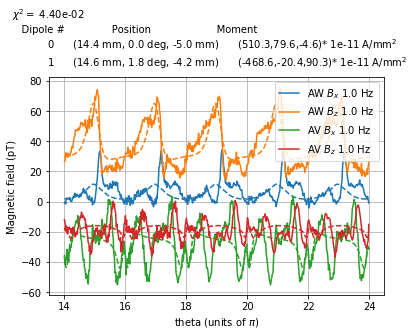

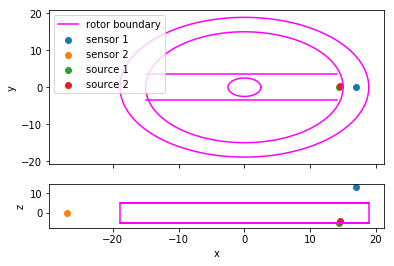

In [97]:
Opt_Settings_Exp2_1Hz['plot']=1
Opt_Settings_Exp2_1Hz['figname']=SaveDir+'Exp2_1Hz_'+nowtext+'_1'
chi2_one_exp_one_freq(opt_res_Exp2_1Hz.x,Opt_Settings_Exp2_1Hz)
# Opt_Params_Exp2 = opt_res_Exp2.x

In [105]:
Opt_Params_Exp2_low_chi_1Hz = opt_res_Exp2_1Hz.x
Opt_Params_Exp2_low_chi_1Hz

array([ 1.43744782e+01,  1.29986140e-02, -4.99939263e+00,  5.10284778e+02,
        7.95992272e+01, -4.60268158e+00,  1.45931514e+01,  1.80821733e+00,
       -4.17675943e+00, -4.68643776e+02, -2.03921749e+01,  9.03005623e+01,
       -2.38104481e-01,  3.17388657e+01, -2.53979234e+01, -1.41468655e+01])

# 0.1 Hz

## Experiment 1

[15.0000096, 158.269688, -0.0372804887, 30, 80, 0.166806842, 18.8828752, 27.4899236, -0.0231150889, 13.3679496, 0.00797215616, 0.287585934, 6.51570606, 35.8842363]
0.2126263080152582


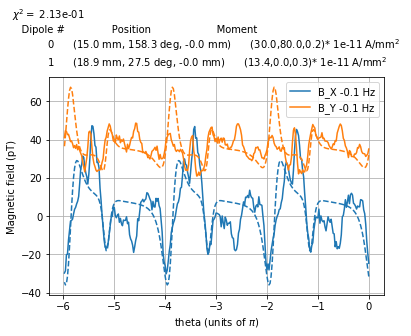

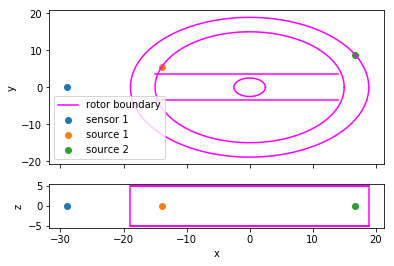

In [118]:
nu = 0.1
nowtext = now().strftime("%Y%m%d%H%M")
Opt_Settings_Exp1_0p1Hz = {'number of sources': 2,
                'location coordinate system': 'polar',
                'moment coordinate system':'polar',
                'location dimensions': 3,
                'moment dimensions': 3,
                'rotation sign':-1, # 1 for positive, -1 for negative, 0 for unknown and making it a free parameter
                'rotation frequency':nu,
                'rotor dimensions':rtr_dims,
                'time':Exp1_Time_cut[nu],
                'number of sensors':1,
                'sensor locations':[Exp1_sensor_loc],
                'sensor field order':[[0,1]],# list which order of B component of each sensor (0 for x, 1 for y, 2 for z) 
                'B data':[Exp1_X_cut[nu],Exp1_Y_cut[nu]],
                'bar location':0,
                'plot':1,
                'saveplot':1,
                'plotlabels':['B_X','B_Y'],
                'figname':SaveDir+'Exp1_0p1Hz_2src_'+nowtext+'_0'
                         
}
# Opt_Param = [Src1_loc_r,Src1_loc_theta,Src1_loc_z,Src1_m_r,Src1_m_theta,Src1_m_z,
#             Src2_loc_r,Src2_loc_theta,Src2_loc_z,Src2_m_r,Src2_m_theta,Src2_m_z,
#             DC_AW_X,DC_AW_Y,DC_AV_Y,DC_AV_X,sign]


# Opt_Params_Exp1_5Hz = [ 1.83010485e+01, -40,  2.08577737e+00, -1.62957197e+01,
#         1.86127668e+01,  3.07601035e-02,  4.476,  1.42372167e+00,
#        -2.11555140e+00, -8.14863499e+00, -3.58696981e+01,  2.77610237e-01,
#        -5.26983047e+00,  3.76604069e+01]
Opt_Params_Exp1_0p1Hz = [ 1.50000096e+01,  1.58269688e+02, -3.72804887e-02,  30,
        80,  1.66806842e-01,  1.88828752e+01,  2.74899236e+01,
       -2.31150889e-02,  1.33679496e+01,  7.97215616e-03,  2.87585934e-01,
        6.51570606e+00,  3.58842363e+01]

chi_Exp1_0p1Hz = chi2_one_exp_one_freq(Opt_Params_Exp1_0p1Hz,Opt_Settings_Exp1_0p1Hz)

In [119]:
Opt_Settings_Exp1_0p1Hz['plot'] = 0
opt_res_Exp1_0p1Hz = minimize(chi2_one_exp_one_freq,Opt_Params_Exp1_0p1Hz,Opt_Settings_Exp1_0p1Hz,method = 'Nelder-Mead',options = {'maxfev': 7000,'maxiter': 7000,'adaptive':True,'xatol':0.1})

[ 1.50000096e+01  1.58269688e+02 -3.72804887e-02  3.00000000e+01
  8.00000000e+01  1.66806842e-01  1.88828752e+01  2.74899236e+01
 -2.31150889e-02  1.33679496e+01  7.97215616e-03  2.87585934e-01
  6.51570606e+00  3.58842363e+01]
0.2126263080152582
[ 1.57500101e+01  1.58269688e+02 -3.72804887e-02  3.00000000e+01
  8.00000000e+01  1.66806842e-01  1.88828752e+01  2.74899236e+01
 -2.31150889e-02  1.33679496e+01  7.97215616e-03  2.87585934e-01
  6.51570606e+00  3.58842363e+01]
0.24723246576521754
[ 1.50000096e+01  1.66183172e+02 -3.72804887e-02  3.00000000e+01
  8.00000000e+01  1.66806842e-01  1.88828752e+01  2.74899236e+01
 -2.31150889e-02  1.33679496e+01  7.97215616e-03  2.87585934e-01
  6.51570606e+00  3.58842363e+01]
0.24618290301804024
[ 1.50000096e+01  1.58269688e+02 -3.91445131e-02  3.00000000e+01
  8.00000000e+01  1.66806842e-01  1.88828752e+01  2.74899236e+01
 -2.31150889e-02  1.33679496e+01  7.97215616e-03  2.87585934e-01
  6.51570606e+00  3.58842363e+01]
0.2126260592528891
[ 1.50

0.2171519977383775
[ 1.48795510e+01  1.57378356e+02 -3.75311342e-02  3.02016971e+01
  7.93860064e+01  1.67928324e-01  1.88334330e+01  2.76747448e+01
 -2.32704971e-02  1.34578255e+01  8.02575484e-03  2.89519442e-01
  6.55951268e+00  3.61254945e+01]
Source 1 not in rotor
[ 1.51124314e+01  1.57856791e+02 -3.74428222e-02  3.01306315e+01
  8.00231530e+01  1.67533183e-01  1.88248369e+01  2.76096253e+01
 -2.32157409e-02  1.34261588e+01  8.00686999e-03  2.88838193e-01
  6.54407794e+00  3.60404900e+01]
0.21617728424327257
[ 1.49723882e+01  1.56673670e+02 -3.74451077e-02  3.01324706e+01
  7.91860917e+01  1.67543409e-01  1.93271304e+01  2.76113105e+01
 -2.32171579e-02  1.34269783e+01  8.00735871e-03  2.88855824e-01
  6.54447738e+00  3.60426899e+01]
Source 1 not in rotor
[ 1.50519074e+01  1.58276093e+02 -3.74966296e-02  3.01739309e+01
  8.01331522e+01  1.67773937e-01  1.85252455e+01  2.76493018e+01
 -2.32491031e-02  1.34454529e+01  8.01837629e-03  2.89253270e-01
  6.55348214e+00  3.60922822e+01]
0

0.2043714123025354
[ 1.51184497e+01  1.53825314e+02 -3.82254924e-02  2.94771187e+01
  7.64184695e+01  1.67019007e-01  1.86334865e+01  2.76719684e+01
 -2.34596933e-02  1.40198696e+01  7.91603444e-03  2.90043242e-01
  6.70864650e+00  3.57794398e+01]
0.20351028568003712
[ 1.51354741e+01  1.53261998e+02 -3.84382419e-02  3.08552204e+01
  7.57329321e+01  1.67397194e-01  1.85978553e+01  2.73171919e+01
 -2.35571293e-02  1.33769973e+01  7.92464308e-03  2.90994050e-01
  6.74979800e+00  3.57808153e+01]
0.2045161226243413
[ 1.51352672e+01  1.53238928e+02 -3.82628536e-02  2.97319969e+01
  7.56649272e+01  1.65956746e-01  1.85992688e+01  2.76134599e+01
 -2.34089825e-02  1.34899348e+01  8.36561249e-03  2.88852096e-01
  6.72367953e+00  3.58002577e+01]
0.20305995429354184
[ 1.51412423e+01  1.53022539e+02 -3.82813773e-02  2.97177392e+01
  7.54290159e+01  1.65664945e-01  1.85869879e+01  2.76199661e+01
 -2.33979533e-02  1.34947443e+01  8.41521199e-03  2.88544139e-01
  6.72950847e+00  3.58034464e+01]
0.2028

0.19352918576375433
[ 1.51630853e+01  1.54182266e+02 -3.85585190e-02  2.95903644e+01
  6.99225224e+01  1.69859728e-01  1.85312866e+01  2.80046031e+01
 -2.42655849e-02  1.36514272e+01  8.13381887e-03  2.82062368e-01
  6.72586417e+00  3.61639276e+01]
0.19350604627314055
[ 1.51641832e+01  1.54277622e+02 -3.85948552e-02  2.95841170e+01
  6.95795454e+01  1.69890064e-01  1.85280793e+01  2.80308158e+01
 -2.43457638e-02  1.36626652e+01  8.13877366e-03  2.80364994e-01
  6.72757968e+00  3.61844445e+01]
0.1929726357510834
[ 1.51656522e+01  1.54324817e+02 -3.88668108e-02  2.95988058e+01
  6.95893153e+01  1.70111349e-01  1.85216861e+01  2.80513175e+01
 -2.27025520e-02  1.36810322e+01  8.15244469e-03  2.92995027e-01
  6.76077288e+00  3.61442812e+01]
0.19303636265480617
[ 1.51722102e+01  1.54312599e+02 -3.93301701e-02  2.96104828e+01
  6.92947650e+01  1.70538807e-01  1.85023601e+01  2.81006715e+01
 -2.36121835e-02  1.37187383e+01  8.17870084e-03  2.93539389e-01
  6.81822143e+00  3.60919336e+01]
0.192

0.18009491221347504
[ 1.51953670e+01  1.57287179e+02 -3.89529031e-02  2.78145116e+01
  5.98656884e+01  1.72999570e-01  1.84355110e+01  2.90142381e+01
 -2.41789734e-02  1.39642642e+01  8.34225872e-03  2.95259216e-01
  6.79595571e+00  3.67495771e+01]
0.18020412946181685
[ 1.52515496e+01  1.57227285e+02 -3.92398687e-02  2.93083056e+01
  5.70370431e+01  1.70977538e-01  1.83490871e+01  2.89159714e+01
 -2.41934967e-02  1.39291906e+01  8.19488069e-03  2.93180503e-01
  6.86361711e+00  3.71164748e+01]
0.1793897062566305
[ 1.52593216e+01  1.57368672e+02 -3.92803404e-02  2.93334559e+01
  5.63118300e+01  1.70872046e-01  1.83357690e+01  2.90076661e+01
 -2.42156223e-02  1.39490363e+01  8.19166811e-03  2.92909454e-01
  6.87296295e+00  3.71668499e+01]
0.17894459783150596
[ 1.52070462e+01  1.58041412e+02 -3.89818999e-02  2.91457591e+01
  5.80518251e+01  1.72773554e-01  1.84160641e+01  2.73770397e+01
 -2.41777489e-02  1.44530962e+01  8.37383762e-03  2.93761214e-01
  6.80000895e+00  3.68210907e+01]
0.178

0.16981903108779503
[ 1.52944882e+01  1.59210245e+02 -4.06731749e-02  2.85136650e+01
  4.54851814e+01  1.80623352e-01  1.82354030e+01  2.86224107e+01
 -2.40845544e-02  1.42458200e+01  8.51833151e-03  2.89304831e-01
  7.08163490e+00  3.69847576e+01]
0.16952118661754587
[ 1.52969363e+01  1.59441815e+02 -4.07774337e-02  2.85002226e+01
  4.48384670e+01  1.81651471e-01  1.82301458e+01  2.86450639e+01
 -2.40135681e-02  1.42652683e+01  8.53203982e-03  2.87762966e-01
  7.10367593e+00  3.69637016e+01]
0.16919171699703223
[ 1.53512675e+01  1.54726903e+02 -3.98489687e-02  2.86943425e+01
  4.54798211e+01  1.74962850e-01  1.81520478e+01  2.87460155e+01
 -2.45176339e-02  1.44179802e+01  8.63502401e-03  2.99407479e-01
  6.97213313e+00  3.73243974e+01]
0.17300147513876246
[ 1.53094011e+01  1.58699644e+02 -3.90156176e-02  2.84171194e+01
  4.36745355e+01  1.74709031e-01  1.82314486e+01  2.84119970e+01
 -2.48873992e-02  1.41971160e+01  8.54579322e-03  2.98586876e-01
  6.96896950e+00  3.75353326e+01]
0.16

0.16606630847286716
[ 1.53536412e+01  1.60957836e+02 -4.14174621e-02  2.74972625e+01
  3.24953817e+01  1.82048961e-01  1.80894379e+01  2.76420995e+01
 -2.52056612e-02  1.48574701e+01  8.91755490e-03  3.07936978e-01
  7.05459293e+00  3.65307640e+01]
0.16459684509675387
[ 1.53519270e+01  1.60933936e+02 -4.14670617e-02  2.74259443e+01
  3.22722766e+01  1.82798925e-01  1.80904210e+01  2.75162214e+01
 -2.52122390e-02  1.48745089e+01  8.93714596e-03  3.08597481e-01
  7.05564909e+00  3.64698586e+01]
0.1644880363226525
[ 1.52995197e+01  1.62915152e+02 -4.10369215e-02  2.79069137e+01
  3.88328688e+01  1.76757019e-01  1.81748892e+01  2.79826478e+01
 -2.55444778e-02  1.43733582e+01  8.58800897e-03  3.01052513e-01
  7.00798268e+00  3.67244635e+01]
0.1673286107182947
[ 1.53169858e+01  1.62432269e+02 -4.10529385e-02  2.79207190e+01
  3.75217774e+01  1.76875458e-01  1.81502976e+01  2.81094682e+01
 -2.54423297e-02  1.44735174e+01  8.64234569e-03  3.01752481e-01
  7.01863814e+00  3.67780766e+01]
0.1664

0.16426647750234072
[ 1.53387820e+01  1.61437082e+02 -4.42511945e-02  2.76815562e+01
  3.08284076e+01  1.73143368e-01  1.81817116e+01  2.65654034e+01
 -2.52116217e-02  1.55247356e+01  8.78774428e-03  3.05548664e-01
  7.01635153e+00  3.58552172e+01]
0.16379656496760242
[ 1.53353590e+01  1.61353540e+02 -4.44569799e-02  2.76555895e+01
  3.06960929e+01  1.72495005e-01  1.81926628e+01  2.64728468e+01
 -2.52125316e-02  1.55583747e+01  8.76966390e-03  3.05394742e-01
  7.03515318e+00  3.58446123e+01]
0.16382007804882767
[ 1.53993318e+01  1.60611808e+02 -4.21484301e-02  2.78530999e+01
  2.96357627e+01  1.78645124e-01  1.80817953e+01  2.72361790e+01
 -2.49627060e-02  1.55181652e+01  8.96088556e-03  3.14405181e-01
  6.92950110e+00  3.63231019e+01]
0.16463773113312888
[ 1.53379606e+01  1.62815324e+02 -4.33671258e-02  2.78500553e+01
  3.29418178e+01  1.76610824e-01  1.81273867e+01  2.71299912e+01
 -2.53531946e-02  1.51755141e+01  8.87246681e-03  3.01787676e-01
  6.87166477e+00  3.56824960e+01]
0.16

0.1639134868678893
[ 1.53470556e+01  1.60427773e+02 -4.23095246e-02  2.69190122e+01
  3.28363464e+01  1.78452908e-01  1.81517711e+01  2.69165286e+01
 -2.59451815e-02  1.55284184e+01  8.96693396e-03  3.03684701e-01
  6.88256989e+00  3.61386331e+01]
0.16384530228408867
[ 1.53422767e+01  1.59874203e+02 -4.38164806e-02  2.77529817e+01
  3.53207120e+01  1.72772137e-01  1.82059383e+01  2.68513979e+01
 -2.56658870e-02  1.54696929e+01  8.83466534e-03  3.07591179e-01
  6.60921340e+00  3.58614722e+01]
0.1641028834629234
[ 1.53660950e+01  1.62583874e+02 -4.25547069e-02  2.71669691e+01
  3.01153136e+01  1.78416316e-01  1.80919042e+01  2.67411892e+01
 -2.53972803e-02  1.58245424e+01  8.95625921e-03  3.02257731e-01
  6.97459193e+00  3.58455183e+01]
0.16389790627269468
[ 1.53577306e+01  1.61527660e+02 -4.32808797e-02  2.71857458e+01
  3.13952789e+01  1.77019672e-01  1.81533778e+01  2.70021157e+01
 -2.57552997e-02  1.57214890e+01  8.83581571e-03  3.02200566e-01
  6.76419419e+00  3.63748296e+01]
0.1639

[ 1.52894751e+01  1.61354145e+02 -4.44807369e-02  2.67848726e+01
  3.47161038e+01  1.72337480e-01  1.82819088e+01  2.70076736e+01
 -2.57249163e-02  1.55432528e+01  8.91562181e-03  2.86437830e-01
  6.77350995e+00  3.60083175e+01]
0.1636587012532596
[ 1.53265532e+01  1.61487077e+02 -4.51788853e-02  2.66613882e+01
  3.07494918e+01  1.70180724e-01  1.82335643e+01  2.73989302e+01
 -2.68350068e-02  1.56238171e+01  8.93784800e-03  2.87364019e-01
  6.80690407e+00  3.57402338e+01]
0.16365140077747536
[ 1.53069830e+01  1.61184527e+02 -4.41557067e-02  2.56584865e+01
  3.42469350e+01  1.68872021e-01  1.82420692e+01  2.77087417e+01
 -2.61242292e-02  1.57726336e+01  8.79744109e-03  2.95854646e-01
  6.89659275e+00  3.59334908e+01]
0.16378889773345745
[ 1.53297590e+01  1.61336450e+02 -4.42736340e-02  2.72876685e+01
  3.15794766e+01  1.76420525e-01  1.82238359e+01  2.65974566e+01
 -2.60357736e-02  1.55184341e+01  8.95648325e-03  2.92890046e-01
  6.70917157e+00  3.58538875e+01]
0.1636523743911552
[ 1.53

0.16345713974867443
[ 1.52655518e+01  1.60284293e+02 -4.56441821e-02  2.60521879e+01
  3.48981652e+01  1.71435947e-01  1.83855032e+01  2.69932998e+01
 -2.61732465e-02  1.55394356e+01  8.93391457e-03  2.82403293e-01
  6.88070189e+00  3.56949138e+01]
0.16343869860180169
[ 1.52627033e+01  1.60245048e+02 -4.56934108e-02  2.60229780e+01
  3.51094234e+01  1.71596496e-01  1.83934377e+01  2.70090962e+01
 -2.61330393e-02  1.55375250e+01  8.94197521e-03  2.81366195e-01
  6.89819547e+00  3.56679104e+01]
0.16345380023371958
[ 1.52548534e+01  1.60196730e+02 -4.55955934e-02  2.63211718e+01
  3.54441683e+01  1.68151236e-01  1.83886137e+01  2.68201601e+01
 -2.70333939e-02  1.52416302e+01  8.89282210e-03  2.86967363e-01
  6.76178132e+00  3.59851335e+01]
0.16340135984379314
[ 1.52509282e+01  1.60150663e+02 -4.56321611e-02  2.63316377e+01
  3.57021447e+01  1.67851800e-01  1.83959730e+01  2.68107936e+01
 -2.71134109e-02  1.52000737e+01  8.89437171e-03  2.86671161e-01
  6.76116134e+00  3.60003742e+01]
0.16

0.16331592216999002
[ 1.52234990e+01  1.59657918e+02 -4.71458139e-02  2.62337305e+01
  3.53001615e+01  1.64683245e-01  1.84967800e+01  2.72035011e+01
 -2.68123270e-02  1.50230960e+01  8.84249114e-03  2.76855943e-01
  6.77123674e+00  3.58449634e+01]
0.16321896307003395
[ 1.52211694e+01  1.59572286e+02 -4.72568554e-02  2.62725783e+01
  3.54149569e+01  1.64219146e-01  1.85033585e+01  2.72155160e+01
 -2.68218666e-02  1.50014567e+01  8.83249009e-03  2.76170556e-01
  6.77006830e+00  3.58399487e+01]
0.16322138532515673
[ 1.52143081e+01  1.60031278e+02 -4.65178113e-02  2.52203213e+01
  3.60349066e+01  1.63083407e-01  1.85084259e+01  2.75870191e+01
 -2.68717736e-02  1.51212450e+01  8.89599488e-03  2.81858674e-01
  6.84435808e+00  3.59324184e+01]
0.1633128398608104
[ 1.52171525e+01  1.60089761e+02 -4.65595156e-02  2.60299144e+01
  3.40096334e+01  1.68844722e-01  1.85029963e+01  2.70320482e+01
 -2.69039382e-02  1.49306267e+01  8.99218887e-03  2.79833268e-01
  6.85225049e+00  3.58822178e+01]
0.163

0.1630516782697595
[ 1.51807035e+01  1.59434201e+02 -4.80045546e-02  2.58725097e+01
  3.51556089e+01  1.62794275e-01  1.85934415e+01  2.72408599e+01
 -2.76907340e-02  1.46558107e+01  8.97072124e-03  2.76213340e-01
  6.65000555e+00  3.57686633e+01]
0.16304865006390334
[ 1.51719532e+01  1.58955968e+02 -4.80401009e-02  2.58655986e+01
  3.69816298e+01  1.65609766e-01  1.86135449e+01  2.71004435e+01
 -2.76117896e-02  1.45540331e+01  8.76275272e-03  2.76546218e-01
  6.68100714e+00  3.59471656e+01]
0.16308607565376815
[ 1.51828616e+01  1.59346854e+02 -4.82499849e-02  2.52948449e+01
  3.42507726e+01  1.62580603e-01  1.86084841e+01  2.70920440e+01
 -2.77867807e-02  1.48554715e+01  8.88414713e-03  2.76270564e-01
  6.69005161e+00  3.59124815e+01]
0.16313051637635456
[ 1.51632631e+01  1.59417318e+02 -4.79433176e-02  2.52295700e+01
  3.65986319e+01  1.61397468e-01  1.86395793e+01  2.74544153e+01
 -2.73977499e-02  1.47152717e+01  8.88996748e-03  2.74765221e-01
  6.76276140e+00  3.59211150e+01]
0.163

0.1628755585082285
[ 1.51236102e+01  1.59816873e+02 -4.92971042e-02  2.53744342e+01
  3.48783476e+01  1.59461722e-01  1.87483198e+01  2.74251548e+01
 -2.79461857e-02  1.42265489e+01  9.05902257e-03  2.69407207e-01
  6.64024253e+00  3.58335873e+01]
0.16287075500160464
[ 1.51212644e+01  1.59482227e+02 -4.87539611e-02  2.54926668e+01
  3.53471654e+01  1.59162228e-01  1.87305494e+01  2.74786163e+01
 -2.82391971e-02  1.38934909e+01  9.06496142e-03  2.69909143e-01
  6.73051442e+00  3.59576038e+01]
0.16283311170002848
[ 1.51326151e+01  1.59847823e+02 -4.91448328e-02  2.56592701e+01
  3.38836056e+01  1.63478037e-01  1.86975680e+01  2.70638049e+01
 -2.79398422e-02  1.42446305e+01  9.01526783e-03  2.62889641e-01
  6.78084400e+00  3.58991161e+01]
0.1629516776589103
[ 1.51301201e+01  1.58933975e+02 -4.92478248e-02  2.56850480e+01
  3.55045953e+01  1.61472764e-01  1.87070444e+01  2.70974051e+01
 -2.81930755e-02  1.41818678e+01  8.98844806e-03  2.71703223e-01
  6.58228825e+00  3.58315102e+01]
0.1629

0.16270647016333767
[ 1.50640864e+01  1.58542120e+02 -5.04032220e-02  2.47954245e+01
  3.83880809e+01  1.62198860e-01  1.88627151e+01  2.73015156e+01
 -2.87289700e-02  1.38403475e+01  9.03179345e-03  2.57800417e-01
  6.56255219e+00  3.57394256e+01]
0.16270109852611417
[ 1.50578738e+01  1.58925341e+02 -5.00847569e-02  2.48603987e+01
  3.87913714e+01  1.62624837e-01  1.88934114e+01  2.77095003e+01
 -2.85555996e-02  1.36131222e+01  9.00171140e-03  2.55379226e-01
  6.62216483e+00  3.59042879e+01]
0.1627337580558464
[ 1.50767445e+01  1.58750895e+02 -5.01870252e-02  2.54181476e+01
  3.64086034e+01  1.60136190e-01  1.88339750e+01  2.73464725e+01
 -2.89902884e-02  1.36925137e+01  9.02043468e-03  2.61321306e-01
  6.56606667e+00  3.59221730e+01]
0.16268284671034566
[ 1.50457019e+01  1.58602116e+02 -5.06296342e-02  2.51267477e+01
  3.78413179e+01  1.61151069e-01  1.89138635e+01  2.73920412e+01
 -2.89600804e-02  1.34716333e+01  9.03339579e-03  2.56332688e-01
  6.55890355e+00  3.58868163e+01]
Sourc

0.1626246858322788
[ 1.50500977e+01  1.58776604e+02 -5.00609439e-02  2.51432142e+01
  3.80739595e+01  1.62410258e-01  1.88891695e+01  2.74770819e+01
 -2.88133171e-02  1.35157229e+01  9.07733261e-03  2.51950558e-01
  6.66510204e+00  3.60055128e+01]
0.1626232981667148
[ 1.50642325e+01  1.58574210e+02 -5.03521098e-02  2.54125937e+01
  3.63647969e+01  1.62364130e-01  1.88500511e+01  2.73964494e+01
 -2.90958107e-02  1.34850559e+01  9.07346296e-03  2.55269529e-01
  6.62752575e+00  3.59579840e+01]
0.1626657606878555
[ 1.50557048e+01  1.58809423e+02 -5.04992985e-02  2.49851639e+01
  3.79784716e+01  1.62051762e-01  1.88911294e+01  2.76384420e+01
 -2.88380321e-02  1.35330553e+01  9.01655310e-03  2.55065895e-01
  6.61114073e+00  3.59097694e+01]
0.1626282306993706
[ 1.50587089e+01  1.59051347e+02 -5.01456076e-02  2.48667429e+01
  3.66197742e+01  1.62939886e-01  1.88716988e+01  2.77233756e+01
 -2.93583964e-02  1.34578979e+01  9.21321444e-03  2.48137725e-01
  6.62468497e+00  3.58781230e+01]
0.162631

0.16258037567467282
[ 1.50441714e+01  1.58731716e+02 -5.05680697e-02  2.49413468e+01
  3.70853810e+01  1.62688947e-01  1.88860083e+01  2.76275021e+01
 -2.94370240e-02  1.32851028e+01  9.10790229e-03  2.53547926e-01
  6.62698628e+00  3.59276192e+01]
0.16256911953976086
[ 1.50374651e+01  1.58533943e+02 -5.08612575e-02  2.47925494e+01
  3.76966483e+01  1.63207898e-01  1.89049649e+01  2.74586105e+01
 -2.97503809e-02  1.33979398e+01  9.03142413e-03  2.49461366e-01
  6.55340797e+00  3.59977379e+01]
Source 2 not in rotor
[ 1.50545420e+01  1.58677240e+02 -5.05185998e-02  2.50053899e+01
  3.73236237e+01  1.62104689e-01  1.88721894e+01  2.75601722e+01
 -2.90634995e-02  1.34244453e+01  9.06741080e-03  2.53976710e-01
  6.61756862e+00  3.59333770e+01]
0.16259358302237703
[ 1.50412768e+01  1.58707168e+02 -5.06504452e-02  2.48537385e+01
  3.80878537e+01  1.59788953e-01  1.88963186e+01  2.76824601e+01
 -2.95533786e-02  1.33971272e+01  9.04972770e-03  2.47831622e-01
  6.55648060e+00  3.59518871e+01]
0.

0.16257860427621298
[ 1.50444433e+01  1.58423736e+02 -5.07817553e-02  2.49611127e+01
  3.80846432e+01  1.62290401e-01  1.88909647e+01  2.75131239e+01
 -2.92702038e-02  1.34108589e+01  9.01393106e-03  2.51552508e-01
  6.59310581e+00  3.59403429e+01]
0.1625683225596744
[ 1.50390974e+01  1.58477415e+02 -5.04666062e-02  2.47998021e+01
  3.79628441e+01  1.62905646e-01  1.88985036e+01  2.75805671e+01
 -2.93195815e-02  1.33802719e+01  9.09624723e-03  2.48726186e-01
  6.62690583e+00  3.59393321e+01]
0.16255228091601748
[ 1.50387500e+01  1.58433183e+02 -5.08347717e-02  2.48767457e+01
  3.77707724e+01  1.62192676e-01  1.89016025e+01  2.77191915e+01
 -2.94362264e-02  1.32694204e+01  9.07185881e-03  2.47917524e-01
  6.63438427e+00  3.59268435e+01]
Source 2 not in rotor
[ 1.50475651e+01  1.58554749e+02 -5.04972514e-02  2.48112420e+01
  3.76890595e+01  1.62967728e-01  1.88837614e+01  2.75079283e+01
 -2.93392757e-02  1.34691740e+01  9.07850191e-03  2.50978854e-01
  6.58263881e+00  3.59146455e+01]
0.1

0.16254445425790826
[ 1.50337628e+01  1.58374702e+02 -5.09013884e-02  2.46961698e+01
  3.77876868e+01  1.63588662e-01  1.88978296e+01  2.76148797e+01
 -2.96008475e-02  1.32981411e+01  9.09791477e-03  2.44771051e-01
  6.58143061e+00  3.58632767e+01]
0.1625238710011403
[ 1.50332191e+01  1.58372574e+02 -5.09215075e-02  2.46902540e+01
  3.77882405e+01  1.63557839e-01  1.88986438e+01  2.76158421e+01
 -2.96105807e-02  1.32967364e+01  9.09869910e-03  2.44579816e-01
  6.58177828e+00  3.58602298e+01]
0.16252220941815287
[ 1.50369965e+01  1.58131957e+02 -5.09559776e-02  2.46192640e+01
  3.82918787e+01  1.63911990e-01  1.88967524e+01  2.75729454e+01
 -2.95058070e-02  1.34210918e+01  9.05682532e-03  2.41294005e-01
  6.55325175e+00  3.58279835e+01]
0.1625404295488347
[ 1.50347787e+01  1.58453426e+02 -5.08791889e-02  2.46370946e+01
  3.77959106e+01  1.61757894e-01  1.89005663e+01  2.76976846e+01
 -2.97848769e-02  1.33470739e+01  9.04239566e-03  2.44004859e-01
  6.55988273e+00  3.59112713e+01]
Source

0.1625164998240192
[ 1.50291748e+01  1.58189989e+02 -5.09377810e-02  2.44196018e+01
  3.81774442e+01  1.64382210e-01  1.88993742e+01  2.75586163e+01
 -2.97115857e-02  1.33720602e+01  9.07441555e-03  2.39103906e-01
  6.56767036e+00  3.58495865e+01]
0.16250945349781218
[ 1.50247349e+01  1.58240811e+02 -5.10568425e-02  2.45465650e+01
  3.81352392e+01  1.63224251e-01  1.89049663e+01  2.76233633e+01
 -2.97523801e-02  1.32356153e+01  9.07988768e-03  2.40031335e-01
  6.58460072e+00  3.58984938e+01]
Source 2 not in rotor
[ 1.50328242e+01  1.58236776e+02 -5.07476149e-02  2.45248215e+01
  3.78396633e+01  1.65702164e-01  1.88880544e+01  2.75768874e+01
 -2.97259231e-02  1.32922232e+01  9.08849065e-03  2.41874646e-01
  6.55106544e+00  3.58646527e+01]
0.1625190243639879
[ 1.50256319e+01  1.58084941e+02 -5.08065702e-02  2.43538754e+01
  3.81447455e+01  1.66087893e-01  1.88900454e+01  2.75710977e+01
 -2.98797906e-02  1.32398920e+01  9.06965471e-03  2.37246930e-01
  6.54391111e+00  3.58979084e+01]
0.16

  6.50851301e+00  3.59653540e+01]
0.1624952208151835
[ 1.50200142e+01  1.57970168e+02 -5.09982455e-02  2.42536061e+01
  3.82914379e+01  1.65234440e-01  1.88947880e+01  2.74884203e+01
 -3.00858212e-02  1.33163696e+01  9.03493854e-03  2.34971322e-01
  6.55460557e+00  3.59121963e+01]
0.16247969135793136
[ 1.50196517e+01  1.57963437e+02 -5.10125230e-02  2.42481603e+01
  3.83000970e+01  1.65160571e-01  1.88951707e+01  2.74827430e+01
 -3.00991642e-02  1.33221223e+01  9.03260700e-03  2.34846191e-01
  6.55556266e+00  3.59130246e+01]
0.162478697126026
[ 1.50207158e+01  1.58108638e+02 -5.09005422e-02  2.41604956e+01
  3.80607690e+01  1.65528959e-01  1.88861188e+01  2.74840542e+01
 -3.00763943e-02  1.32486792e+01  9.09711090e-03  2.35807887e-01
  6.52159068e+00  3.58977185e+01]
0.16248268936371077
[ 1.50215338e+01  1.57871639e+02 -5.12381320e-02  2.42608450e+01
  3.81334854e+01  1.65885183e-01  1.88940036e+01  2.75305239e+01
 -3.00375708e-02  1.32457026e+01  9.05200242e-03  2.35800535e-01
  6.515

0.1624579198536656
[ 1.50098517e+01  1.57607576e+02 -5.07970739e-02  2.38324382e+01
  3.87878388e+01  1.66952922e-01  1.88907296e+01  2.75045995e+01
 -3.04891364e-02  1.33108633e+01  8.97272115e-03  2.29594114e-01
  6.50629183e+00  3.58892612e+01]
0.16244930972451108
[ 1.50079701e+01  1.57635476e+02 -5.09558370e-02  2.39742584e+01
  3.88522201e+01  1.68394915e-01  1.88890908e+01  2.74019426e+01
 -3.02844817e-02  1.32062304e+01  9.02380805e-03  2.28383378e-01
  6.54021618e+00  3.58804816e+01]
0.16245104768520283
[ 1.50065957e+01  1.57657544e+02 -5.08885437e-02  2.39530057e+01
  3.88114318e+01  1.67666273e-01  1.88982452e+01  2.75320621e+01
 -3.03835185e-02  1.32096315e+01  9.01715403e-03  2.26626960e-01
  6.54507103e+00  3.59012493e+01]
0.16244368075497562
[ 1.50059160e+01  1.57643703e+02 -5.08818356e-02  2.39451988e+01
  3.88392967e+01  1.67697893e-01  1.88990414e+01  2.75365548e+01
 -3.03989326e-02  1.32063020e+01  9.01600364e-03  2.26167770e-01
  6.54697613e+00  3.59044053e+01]
0.162

0.1624332032777867
[ 1.49999902e+01  1.57732213e+02 -5.08349769e-02  2.36650543e+01
  3.88893510e+01  1.69071555e-01  1.88965144e+01  2.73989144e+01
 -3.04982922e-02  1.32477023e+01  9.05078005e-03  2.24240215e-01
  6.52564119e+00  3.58901480e+01]
Source 1 not in rotor
[ 1.50037957e+01  1.57584234e+02 -5.10972650e-02  2.37813193e+01
  3.89016019e+01  1.68140770e-01  1.88887733e+01  2.75214380e+01
 -3.06129722e-02  1.31967881e+01  8.97723922e-03  2.24638977e-01
  6.48176521e+00  3.58407937e+01]
0.1624319532849844
[ 1.49999356e+01  1.57596703e+02 -5.10739783e-02  2.34919362e+01
  3.90915921e+01  1.67409805e-01  1.88841459e+01  2.74369060e+01
 -3.08517613e-02  1.32852594e+01  8.97850498e-03  2.22229656e-01
  6.46880493e+00  3.58682622e+01]
Source 1 not in rotor
[ 1.50037609e+01  1.57669150e+02 -5.09474733e-02  2.38843506e+01
  3.87785939e+01  1.69166311e-01  1.88964210e+01  2.74961838e+01
 -3.03963181e-02  1.31748947e+01  9.02243374e-03  2.25852553e-01
  6.51705644e+00  3.58549628e+01]
0.

0.162425066098916
[ 1.49996396e+01  1.57591192e+02 -5.11706196e-02  2.36446745e+01
  3.88604579e+01  1.68460163e-01  1.88925816e+01  2.74504096e+01
 -3.07377515e-02  1.32274995e+01  8.99625326e-03  2.21728740e-01
  6.47133438e+00  3.58647426e+01]
Source 1 not in rotor
[ 1.50022298e+01  1.57644068e+02 -5.10717946e-02  2.37121058e+01
  3.88381299e+01  1.68382784e-01  1.88915210e+01  2.74633953e+01
 -3.06184206e-02  1.32268737e+01  9.00317197e-03  2.23941260e-01
  6.48835437e+00  3.58615658e+01]
0.16242507535537268
[ 1.50023635e+01  1.57772141e+02 -5.12656681e-02  2.37240635e+01
  3.90080447e+01  1.67143331e-01  1.88992146e+01  2.74213038e+01
 -3.05140593e-02  1.32928971e+01  9.00272026e-03  2.25008203e-01
  6.48011661e+00  3.58358991e+01]
0.16242966198786069
[ 1.50005298e+01  1.57533262e+02 -5.10158514e-02  2.36627012e+01
  3.87489223e+01  1.69183671e-01  1.88875128e+01  2.74808348e+01
 -3.07563647e-02  1.31871792e+01  8.99912203e-03  2.21910649e-01
  6.48271837e+00  3.58791346e+01]
0.16

0.1624222771310541
[ 1.50001916e+01  1.57544990e+02 -5.10614218e-02  2.36820517e+01
  3.87390852e+01  1.69452064e-01  1.88880310e+01  2.74666051e+01
 -3.06969571e-02  1.31709642e+01  9.01111128e-03  2.21553580e-01
  6.49021994e+00  3.58705616e+01]
0.16242393439687003
[ 1.50012233e+01  1.57648990e+02 -5.12222539e-02  2.36376269e+01
  3.88771080e+01  1.67548766e-01  1.88946765e+01  2.74347437e+01
 -3.07134224e-02  1.32958038e+01  8.97630259e-03  2.23178745e-01
  6.47215095e+00  3.58618341e+01]
0.16242148573768986
[ 1.50012528e+01  1.57581514e+02 -5.11752502e-02  2.36944998e+01
  3.90658402e+01  1.68186839e-01  1.88930580e+01  2.74659787e+01
 -3.06504732e-02  1.32331631e+01  8.98216681e-03  2.23299810e-01
  6.45925760e+00  3.58622183e+01]
0.16242119731516416
[ 1.49999697e+01  1.57591609e+02 -5.12436999e-02  2.36664063e+01
  3.89207792e+01  1.68398906e-01  1.88922413e+01  2.74229011e+01
 -3.07050470e-02  1.32382185e+01  8.98636125e-03  2.21973620e-01
  6.47394778e+00  3.58672351e+01]
Sourc

0.16241868158562184
[ 1.49999902e+01  1.57561337e+02 -5.10364208e-02  2.36759181e+01
  3.90873221e+01  1.68909174e-01  1.88932799e+01  2.74914481e+01
 -3.06566807e-02  1.32295106e+01  8.97888259e-03  2.21957034e-01
  6.49072841e+00  3.58480939e+01]
Source 1 not in rotor
[ 1.50006658e+01  1.57612905e+02 -5.12917767e-02  2.36819715e+01
  3.87089127e+01  1.67759209e-01  1.88947351e+01  2.74992294e+01
 -3.08306761e-02  1.32253402e+01  8.97886389e-03  2.22673956e-01
  6.45104338e+00  3.58782895e+01]
0.16241835360258672
[ 1.49998371e+01  1.57586457e+02 -5.12154399e-02  2.36556836e+01
  3.87417295e+01  1.68172625e-01  1.88940776e+01  2.75119184e+01
 -3.08514716e-02  1.32256112e+01  8.97383117e-03  2.21780328e-01
  6.46590793e+00  3.58701041e+01]
Source 1 not in rotor
[ 1.50007467e+01  1.57596732e+02 -5.11785266e-02  2.36941486e+01
  3.89254941e+01  1.68226934e-01  1.88942248e+01  2.74866621e+01
 -3.07093032e-02  1.32277821e+01  8.98193116e-03  2.22768439e-01
  6.46682162e+00  3.58643869e+01]


0.16241745102454125
[ 1.49999698e+01  1.57566777e+02 -5.11663395e-02  2.36825193e+01
  3.89262876e+01  1.68209450e-01  1.88964439e+01  2.75061068e+01
 -3.07646036e-02  1.32474677e+01  8.97252424e-03  2.20860141e-01
  6.46975711e+00  3.58693354e+01]
Source 1 not in rotor
[ 1.50005096e+01  1.57590130e+02 -5.11524098e-02  2.36769810e+01
  3.88851388e+01  1.68075945e-01  1.88948033e+01  2.75031417e+01
 -3.07748389e-02  1.32411508e+01  8.97411784e-03  2.22175144e-01
  6.46660941e+00  3.58716491e+01]
0.1624174466477529
[ 1.49995946e+01  1.57535474e+02 -5.12421175e-02  2.36059904e+01
  3.89119076e+01  1.68564323e-01  1.88937253e+01  2.74546900e+01
 -3.07635444e-02  1.32415087e+01  8.97598047e-03  2.22904735e-01
  6.46980678e+00  3.58577097e+01]
Source 1 not in rotor
[ 1.50007277e+01  1.57608719e+02 -5.11066505e-02  2.37235439e+01
  3.88946043e+01  1.67862871e-01  1.88964832e+01  2.75344120e+01
 -3.07752993e-02  1.32448816e+01  8.97199096e-03  2.20910301e-01
  6.46663546e+00  3.58786663e+01]
0

0.16241570763935814
[ 1.50000399e+01  1.57600181e+02 -5.11760879e-02  2.37394252e+01
  3.88677536e+01  1.68097127e-01  1.88989079e+01  2.75312742e+01
 -3.07620106e-02  1.32326104e+01  8.96987951e-03  2.21409830e-01
  6.47362317e+00  3.58782194e+01]
0.16241507332722868
[ 1.50000164e+01  1.57601136e+02 -5.11775938e-02  2.37431756e+01
  3.88656389e+01  1.68096671e-01  1.88991377e+01  2.75328557e+01
 -3.07614096e-02  1.32320701e+01  8.96963707e-03  2.21374008e-01
  6.47403726e+00  3.58786735e+01]
0.16241496372589218
[ 1.50002348e+01  1.57660919e+02 -5.11894567e-02  2.37825625e+01
  3.88415161e+01  1.67922302e-01  1.89018308e+01  2.75479320e+01
 -3.07229760e-02  1.32191314e+01  8.98334391e-03  2.22152391e-01
  6.47683349e+00  3.58712760e+01]
Source 2 not in rotor
[ 1.50001656e+01  1.57553372e+02 -5.11523206e-02  2.36742570e+01
  3.89056614e+01  1.68208014e-01  1.88947453e+01  2.75047241e+01
 -3.07919561e-02  1.32464093e+01  8.96422427e-03  2.21331284e-01
  6.46737045e+00  3.58777157e+01]
0.

[ 1.50001211e+01  1.57634365e+02 -5.11923865e-02  2.37442049e+01
  3.88545361e+01  1.67737338e-01  1.88997217e+01  2.75371723e+01
 -3.07887480e-02  1.32376378e+01  8.96914978e-03  2.21669328e-01
  6.47030563e+00  3.58801533e+01]
[ 1.50001211e+01  1.57634365e+02 -5.11923865e-02  2.37442049e+01
  3.88545361e+01  1.67737338e-01  1.88997217e+01  2.75371723e+01
 -3.07887480e-02  1.32376378e+01  8.96914978e-03  2.21669328e-01
  6.47030563e+00  3.58801533e+01]
0.16241486435727326


0.16241486435727326

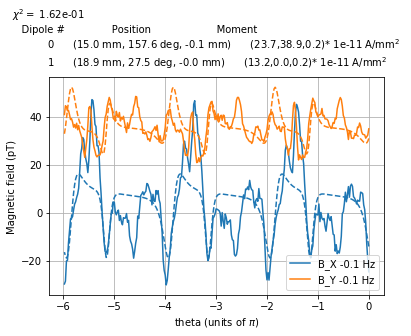

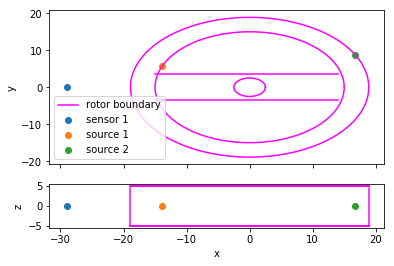

In [120]:
Opt_Settings_Exp1_0p1Hz['plot'] = 1
Opt_Settings_Exp1_0p1Hz['figname'] = SaveDir+ 'Exp1_0p1Hz_2src_'+nowtext+'_1'
print(opt_res_Exp1_0p1Hz.x)
Opt_Params_Exp1_0p1Hz = opt_res_Exp1_0p1Hz.x
chi2_one_exp_one_freq(Opt_Params_Exp1_0p1Hz,Opt_Settings_Exp1_0p1Hz)

In [121]:
Opt_Params_Exp1_low_chi_0p1Hz = opt_res_Exp1_0p1Hz.x
Opt_Params_Exp1_low_chi_0p1Hz

array([ 1.50001211e+01,  1.57634365e+02, -5.11923865e-02,  2.37442049e+01,
        3.88545361e+01,  1.67737338e-01,  1.88997217e+01,  2.75371723e+01,
       -3.07887480e-02,  1.32376378e+01,  8.96914978e-03,  2.21669328e-01,
        6.47030563e+00,  3.58801533e+01])

## Experiment 2

[5.93638815, 0.00135175152, -4.61390029, 2216.5599, 61.5560233, 4.74089379, 5.64426706, 3.69510647, -4.36802417, -2114.60559, -11.9037916, 159.42799, 0.457121615, 30.1287863, -22.7275405, -9.8284791]
0.12669650216985628


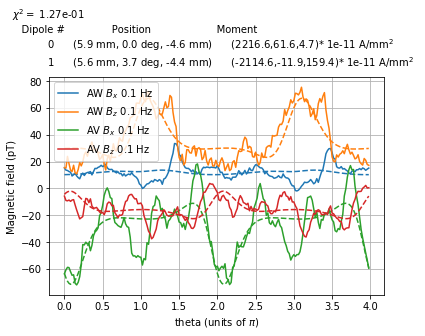

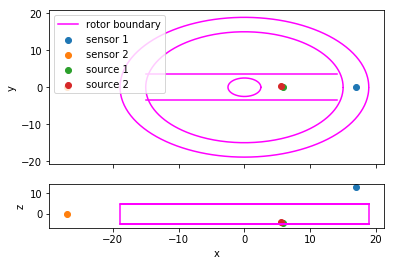

In [128]:
nu = 0.1
nowtext = now().strftime("%Y%m%d%H%M")
Opt_Settings_Exp2_0p1Hz = {'number of sources': 2,
                'location coordinate system': 'polar',
                'moment coordinate system':'polar',
                'location dimensions': 3,
                'moment dimensions': 3,
                'rotation sign':1, # 1 for positive, -1 for negative, 0 for unknown and making it a free parameter
                'rotation frequency':nu,
                'rotor dimensions':rtr_dims,
                'time':Exp2_Time_cut[nu],
                'number of sensors':2,
                'sensor locations':[Exp2_AW_sensor_loc,Exp2_AV_sensor_loc],
                'sensor field order':[[0,2],
                                     [0,2]],# list which order of B component of each sensor (0 for x, 1 for y, 2 for z) 
                'B data':[Exp2_AW_X_cut[nu],Exp2_AW_Z_cut[nu],
                         Exp2_AV_X_cut[nu],Exp2_AV_Z_cut[nu]],
                'plot':1,
                'bar location':180,
                'saveplot':0,
                'plotlabels':['AW $B_x$','AW $B_z$','AV $B_x$', 'AV $B_z$'],
                'figname':SaveDir+'Exp2_0p1Hz_'+nowtext+'_0'
}
# Opt_Params_Exp2_5Hz =[   7.95825475,    40,    4.99597432,  189.10747075,
#         -58.32594041,   15.10548281,    6.80567371,    0.63247041,
#           1.75174325, -178.62354081,    3.90215557, -152.24476817,
#          -7.19618541,   15.07247243,  -37.54240099,  -30.82105149]

Opt_Params_Exp2_0p1Hz = [ 5.93638815e+00,  1.35175152e-03, -4.61390029e+00,  2.21655990e+03,
        6.15560233e+01,  4.74089379e+00,  5.64426706e+00,  3.69510647e+00,
       -4.36802417e+00, -2.11460559e+03, -1.19037916e+01,  1.59427990e+02,
        4.57121615e-01,  3.01287863e+01, -2.27275405e+01, -9.82847910e+00]

chi_Exp2_0p1Hz = chi2_one_exp_one_freq(Opt_Params_Exp2_0p1Hz,Opt_Settings_Exp2_0p1Hz)

In [129]:
Opt_Settings_Exp2_0p1Hz['plot'] = 0
opt_res_Exp2_0p1Hz = minimize(chi2_one_exp_one_freq,Opt_Params_Exp2_0p1Hz,Opt_Settings_Exp2_0p1Hz,method = 'Nelder-Mead',options = {'maxfev': 3000,'maxiter': 3000,'adaptive':True})

[ 5.93638815e+00  1.35175152e-03 -4.61390029e+00  2.21655990e+03
  6.15560233e+01  4.74089379e+00  5.64426706e+00  3.69510647e+00
 -4.36802417e+00 -2.11460559e+03 -1.19037916e+01  1.59427990e+02
  4.57121615e-01  3.01287863e+01 -2.27275405e+01 -9.82847910e+00]
0.12669650216985628
[ 6.23320756e+00  1.35175152e-03 -4.61390029e+00  2.21655990e+03
  6.15560233e+01  4.74089379e+00  5.64426706e+00  3.69510647e+00
 -4.36802417e+00 -2.11460559e+03 -1.19037916e+01  1.59427990e+02
  4.57121615e-01  3.01287863e+01 -2.27275405e+01 -9.82847910e+00]
0.1485133740089056
[ 5.93638815e+00  1.41933910e-03 -4.61390029e+00  2.21655990e+03
  6.15560233e+01  4.74089379e+00  5.64426706e+00  3.69510647e+00
 -4.36802417e+00 -2.11460559e+03 -1.19037916e+01  1.59427990e+02
  4.57121615e-01  3.01287863e+01 -2.27275405e+01 -9.82847910e+00]
0.12669649614813647
[ 5.93638815e+00  1.35175152e-03 -4.84459530e+00  2.21655990e+03
  6.15560233e+01  4.74089379e+00  5.64426706e+00  3.69510647e+00
 -4.36802417e+00 -2.11460559

0.1423391642092975
[ 5.94688970e+00  1.35450405e-03 -4.62329545e+00  2.25780120e+03
  6.16813681e+01  4.75054754e+00  5.65427790e+00  3.70263071e+00
 -4.37691866e+00 -2.11752338e+03 -1.19280310e+01  1.59752629e+02
  4.58052439e-01  3.01901367e+01 -2.27738200e+01 -9.84849256e+00]
0.1329604436181691
[ 5.95572508e+00  1.35876883e-03 -4.63785229e+00  2.21996465e+03
  6.18755772e+01  4.76550504e+00  5.66284100e+00  3.71428876e+00
 -4.39069976e+00 -2.06053373e+03 -1.19655874e+01  1.60255624e+02
  4.59494656e-01  3.02851929e+01 -2.28455253e+01 -9.87950137e+00]
0.14088419432357904
[ 5.94700749e+00  1.35453722e-03 -4.62340867e+00  2.21876884e+03
  6.16828786e+01  4.75066388e+00  5.65439035e+00  3.70272139e+00
 -4.37702584e+00 -2.15400171e+03 -1.19283231e+01  1.59756541e+02
  4.58063656e-01  3.01908760e+01 -2.27743777e+01 -9.84873374e+00]
0.1325432219163251
[ 5.96624531e+00  1.36121030e-03 -4.38665382e+00  2.22225403e+03
  6.19867569e+01  4.77406784e+00  5.67284687e+00  3.72096270e+00
 -4.398589

0.12747215178040688
[ 5.93988617e+00  1.35858191e-03 -4.61852928e+00  2.21723515e+03
  6.18670653e+01  4.76484948e+00  5.64800093e+00  3.71377781e+00
 -4.37280814e+00 -2.09507336e+03 -1.19639414e+01  1.60233578e+02
  4.59431446e-01  3.02810268e+01 -2.28423826e+01 -9.87814232e+00]
0.12851036333231022
[ 5.94564003e+00  1.35604120e-03 -4.62313218e+00  2.21842548e+03
  6.17513667e+01  4.75593866e+00  5.65323103e+00  3.70683261e+00
 -4.37690026e+00 -2.12955812e+03 -1.19415674e+01  1.59933923e+02
  4.58572256e-01  3.02243977e+01 -2.27996646e+01 -9.85966903e+00]
0.1274122899673013
[ 5.86038373e+00  1.35888855e-03 -4.62142868e+00  2.21757178e+03
  6.18810291e+01  4.76592494e+00  5.64915276e+00  3.71461603e+00
 -4.37365169e+00 -2.11562650e+03 -1.19666417e+01  1.60269744e+02
  4.59535143e-01  3.02878614e+01 -2.28475382e+01 -9.88037188e+00]
0.12829716094372468
[ 5.99510113e+00  1.35588978e-03 -4.62125317e+00  2.21819707e+03
  6.17444713e+01  4.75540759e+00  5.65243141e+00  3.70641869e+00
 -4.3763

0.12709158128621403
[ 5.96839650e+00  1.35739016e-03 -4.62088356e+00  2.21801393e+03
  6.18127954e+01  4.76066975e+00  5.65144287e+00  3.71052008e+00
 -4.37520251e+00 -2.11604332e+03 -1.19534466e+01  1.59816932e+02
  4.59028432e-01  3.01531911e+01 -2.27780748e+01 -9.86947719e+00]
0.1268554258406071
[ 5.94114234e+00  1.36326654e-03 -4.57586833e+00  2.21778896e+03
  6.20803940e+01  4.78127953e+00  5.65001485e+00  3.72658358e+00
 -4.37279107e+00 -2.11587649e+03 -1.20051952e+01  1.58788279e+02
  4.61015648e-01  2.99967352e+01 -2.26008021e+01 -9.91220391e+00]
0.12706620876285182
[ 5.94237748e+00  1.35724265e-03 -4.64835057e+00  2.21787677e+03
  6.18060781e+01  4.76015240e+00  5.65074940e+00  3.71011685e+00
 -4.37445167e+00 -2.11591070e+03 -1.19521476e+01  1.59794681e+02
  4.58978549e-01  3.01533465e+01 -2.27748165e+01 -9.86840466e+00]
0.12684909118776455
[ 5.94115252e+00  1.36305472e-03 -4.61909390e+00  2.21756556e+03
  6.20707482e+01  4.78053664e+00  5.61115376e+00  3.72600456e+00
 -4.3731

0.126735595486206
[ 5.93990159e+00  1.36347105e-03 -4.61817747e+00  2.21734425e+03
  6.20897068e+01  4.78199678e+00  5.64780712e+00  3.68625424e+00
 -4.35107211e+00 -2.11540238e+03 -1.20069961e+01  1.59091880e+02
  4.61084806e-01  3.00572600e+01 -2.26637430e+01 -9.91369086e+00]
0.12680421677437695
[ 5.94160706e+00  1.35895106e-03 -4.61980733e+00  2.21777507e+03
  6.18838755e+01  4.76614417e+00  5.65015173e+00  3.70287889e+00
 -4.38692024e+00 -2.11581834e+03 -1.19671921e+01  1.59582906e+02
  4.59556281e-01  3.01419716e+01 -2.27401530e+01 -9.88082636e+00]
0.12673445006437273
[ 5.93960904e+00  1.36353485e-03 -4.59590020e+00  2.21734379e+03
  6.20926122e+01  4.78222055e+00  5.64780318e+00  3.68597757e+00
 -4.37132488e+00 -2.11540172e+03 -1.20075579e+01  1.59091096e+02
  4.61106381e-01  3.00570555e+01 -2.26637063e+01 -9.91415476e+00]
0.1267911367999559
[ 5.94176275e+00  1.35898192e-03 -4.63366648e+00  2.21776863e+03
  6.18852808e+01  4.76625240e+00  5.65011756e+00  3.70279156e+00
 -4.373737

0.12670805963671514
[ 5.93764935e+00  1.36455378e-03 -4.61546396e+00  2.21689537e+03
  6.20003381e+01  4.78579417e+00  5.64582412e+00  3.70235392e+00
 -4.36953560e+00 -2.11245928e+03 -1.20165308e+01  1.59061641e+02
  4.61450954e-01  3.01579626e+01 -2.27297020e+01 -9.77335164e+00]
0.12672516497875982
[ 5.94157329e+00  1.36040240e-03 -4.61941408e+00  2.21765743e+03
  6.19304657e+01  4.77123435e+00  5.64953030e+00  3.70332895e+00
 -4.37337683e+00 -2.11733983e+03 -1.19799729e+01  1.59418457e+02
  4.60047081e-01  3.01460233e+01 -2.27395822e+01 -9.85439012e+00]
0.12670759388923963
[ 5.93650114e+00  1.36174893e-03 -4.61409163e+00  2.21663370e+03
  6.18701733e+01  4.77595694e+00  5.64458136e+00  3.69444224e+00
 -4.36816237e+00 -2.11461639e+03 -1.19918308e+01  1.61173170e+02
  4.60502438e-01  3.01996414e+01 -2.27779133e+01 -9.75374294e+00]
0.12672049763743312
[ 5.94222762e+00  1.36221543e-03 -4.62020768e+00  2.21780861e+03
  6.20126845e+01  4.77759304e+00  5.65024696e+00  3.70824478e+00
 -4.374

0.12670214803226693
[ 5.94004987e+00  1.36207199e-03 -4.61796413e+00  2.21736377e+03
  6.18999725e+01  4.77708998e+00  5.64814795e+00  3.70350483e+00
 -4.37199089e+00 -2.11535785e+03 -1.19946757e+01  1.59575686e+02
  4.60611687e-01  2.99525592e+01 -2.27915818e+01 -9.85067529e+00]
0.12670763233810634
[ 5.93728745e+00  1.36302541e-03 -4.61671098e+00  2.21713934e+03
  6.19242151e+01  4.78043384e+00  5.64698104e+00  3.70106875e+00
 -4.37071482e+00 -2.11524784e+03 -1.20030717e+01  1.59145142e+02
  4.60934105e-01  3.02594608e+01 -2.26983952e+01 -9.79900023e+00]
0.12670197252503484
[ 5.94628750e+00  1.36127930e-03 -4.61815537e+00  2.21743451e+03
  6.18489844e+01  4.77430983e+00  5.64847020e+00  3.70145541e+00
 -4.37225418e+00 -2.11549086e+03 -1.19876951e+01  1.59435998e+02
  4.60343623e-01  3.01696610e+01 -2.27220084e+01 -9.84814194e+00]
0.12670602289335983
[ 5.94418566e+00  1.36164343e-03 -4.61790272e+00  2.21737957e+03
  6.18664331e+01  4.77558694e+00  5.64819664e+00  3.70160738e+00
 -4.371

0.12669859176881249
[ 5.93682375e+00  1.36397850e-03 -4.61556075e+00  2.21691375e+03
  6.17555161e+01  4.78377653e+00  5.64592704e+00  3.67609797e+00
 -4.36963365e+00 -2.11498547e+03 -1.20114648e+01  1.59292285e+02
  4.61256411e-01  3.01565258e+01 -2.27476990e+01 -9.87059799e+00]
0.12670113104416456
[ 5.93875221e+00  1.36187398e-03 -4.61688628e+00  2.21718131e+03
  6.19009875e+01  4.77639553e+00  5.64721714e+00  3.71684646e+00
 -4.37091545e+00 -2.11523677e+03 -1.19929320e+01  1.59343481e+02
  4.60544727e-01  3.01334995e+01 -2.27297528e+01 -9.81410915e+00]
0.12669853459324837
[ 5.93765655e+00  1.36720978e-03 -4.61649991e+00  2.21710167e+03
  6.06862652e+01  4.79510937e+00  5.64681427e+00  3.70172555e+00
 -4.37053822e+00 -2.11517131e+03 -1.20399201e+01  1.59279997e+02
  4.62349134e-01  3.01527146e+01 -2.27455831e+01 -9.84994347e+00]
0.12670377222747245
[ 5.93820302e+00  1.35989292e-03 -4.61628022e+00  2.21706000e+03
  6.25651400e+01  4.76944751e+00  5.64664400e+00  3.70023702e+00
 -4.370

[ 5.93611992e+00  1.36476970e-03 -4.61462639e+00  2.21673703e+03
  6.17284695e+01  4.78655144e+00  5.64491960e+00  3.69804047e+00
 -4.36872469e+00 -2.11415774e+03 -1.20184322e+01  1.59308979e+02
  4.61523970e-01  3.01329062e+01 -2.27311329e+01 -9.81321457e+00]
0.1266979877876822
[ 5.93895566e+00  1.36229777e-03 -4.61718850e+00  2.21723235e+03
  6.18592414e+01  4.77788185e+00  5.64741114e+00  3.70138576e+00
 -4.37121213e+00 -2.11568833e+03 -1.19966640e+01  1.59351596e+02
  4.60688040e-01  3.01427960e+01 -2.27365805e+01 -9.83569447e+00]
0.1266971620696075
[ 5.93793137e+00  1.36371728e-03 -4.61572736e+00  2.21694689e+03
  6.17281986e+01  4.78286039e+00  5.64595593e+00  3.69901586e+00
 -4.36981186e+00 -2.11496414e+03 -1.20091645e+01  1.59440372e+02
  4.61168076e-01  3.00694338e+01 -2.27539712e+01 -9.83737881e+00]
0.12669792263153082
[ 5.93778234e+00  1.36299233e-03 -4.61646227e+00  2.21709381e+03
  6.18573670e+01  4.78031781e+00  5.64672631e+00  3.70072557e+00
 -4.37049567e+00 -2.11516181e

0.1266975488003312
[ 5.93793310e+00  1.36286191e-03 -4.61616975e+00  2.21703459e+03
  6.21834562e+01  4.77986042e+00  5.64639433e+00  3.69965879e+00
 -4.37022193e+00 -2.11507313e+03 -1.19943486e+01  1.59343021e+02
  4.59013362e-01  3.01363084e+01 -2.27324376e+01 -9.83016936e+00]
0.12669661670358964
[ 5.93569177e+00  1.37314619e-03 -4.61433676e+00  2.21666424e+03
  6.17098615e+01  4.81592967e+00  5.64404591e+00  3.69358666e+00
 -4.36842286e+00 -2.11456765e+03 -1.20394944e+01  1.59682292e+02
  4.50858023e-01  3.01350904e+01 -2.27358292e+01 -9.83344024e+00]
0.12669702698049015
[ 5.93545975e+00  1.37494008e-03 -4.61419570e+00  2.21616504e+03
  6.17152626e+01  4.82222123e+00  5.64382132e+00  3.69377821e+00
 -4.36828909e+00 -2.11450209e+03 -1.20487038e+01  1.59370358e+02
  4.49777333e-01  3.01291552e+01 -2.27317981e+01 -9.83537513e+00]
0.1266965399995216
[ 5.93870880e+00  1.36431470e-03 -4.61702445e+00  2.21708671e+03
  6.18616157e+01  4.78495567e+00  5.64715240e+00  3.70165288e+00
 -4.37105

0.1266963107981494
[ 5.93729007e+00  1.39503413e-03 -4.61605448e+00  2.21677927e+03
  6.18246030e+01  4.80062622e+00  5.64574437e+00  3.69685058e+00
 -4.36940479e+00 -2.11478153e+03 -1.18168874e+01  1.59414231e+02
  4.45099020e-01  3.01271551e+01 -2.27400963e+01 -9.83178647e+00]
0.12669626784413823
[ 5.93904032e+00  1.38213861e-03 -4.61697950e+00  2.21743680e+03
  6.17969372e+01  4.74389008e+00  5.64731237e+00  3.70016274e+00
 -4.37023496e+00 -2.11509882e+03 -1.19936448e+01  1.59448336e+02
  4.51801349e-01  3.01294509e+01 -2.27392383e+01 -9.82615566e+00]
0.12669659770227723
[ 5.93596327e+00  1.37595237e-03 -4.61458717e+00  2.21634388e+03
  6.17267481e+01  4.81120591e+00  5.64431225e+00  3.69467604e+00
 -4.36856273e+00 -2.11458600e+03 -1.20409612e+01  1.59381323e+02
  4.50061960e-01  3.01291968e+01 -2.27328444e+01 -9.83407864e+00]
0.1266962903100869
[ 5.93689548e+00  1.38746586e-03 -4.61541939e+00  2.21663463e+03
  6.17286698e+01  4.76075323e+00  5.64547904e+00  3.69681907e+00
 -4.36869

0.12669497269015556
[ 5.93775276e+00  1.38695321e-03 -4.61732488e+00  2.21710282e+03
  6.23725350e+01  4.79757988e+00  5.64698953e+00  3.70253062e+00
 -4.37094946e+00 -2.11514550e+03 -1.20519679e+01  1.59301981e+02
  4.39237928e-01  3.01500026e+01 -2.27388445e+01 -9.81732556e+00]
0.12669601459841884
[ 5.93824092e+00  1.38778085e-03 -4.61815361e+00  2.21730762e+03
  6.22064148e+01  4.82263634e+00  5.64771952e+00  3.70308313e+00
 -4.37148095e+00 -2.11527859e+03 -1.22348729e+01  1.59439163e+02
  4.30100765e-01  3.01463402e+01 -2.27414258e+01 -9.83325920e+00]
0.12669514788612385
[ 5.94052043e+00  1.40309793e-03 -4.62085657e+00  2.21774101e+03
  6.24703368e+01  4.73237947e+00  5.65019184e+00  3.71187394e+00
 -4.37523992e+00 -2.11580335e+03 -1.22191720e+01  1.59271313e+02
  4.26180309e-01  3.01576960e+01 -2.27457629e+01 -9.82160895e+00]
0.1266958201370302
[ 5.93877382e+00  1.40240113e-03 -4.61845059e+00  2.21720603e+03
  6.18894875e+01  4.75618243e+00  5.64796923e+00  3.70413121e+00
 -4.3716

0.12669497599273938
[ 5.93753538e+00  1.38018308e-03 -4.61672236e+00  2.21688089e+03
  6.21255152e+01  4.89991838e+00  5.64618961e+00  3.70330515e+00
 -4.37062773e+00 -2.11478477e+03 -1.21747889e+01  1.59487991e+02
  4.24743128e-01  3.01218215e+01 -2.27488945e+01 -9.82212062e+00]
0.12669516470051112
[ 5.93859018e+00  1.37723292e-03 -4.61963336e+00  2.21729851e+03
  6.24564881e+01  4.87825718e+00  5.64829375e+00  3.70473422e+00
 -4.37208709e+00 -2.11520117e+03 -1.22640163e+01  1.59367421e+02
  4.22047481e-01  3.01301122e+01 -2.27531557e+01 -9.82854835e+00]
0.12669490543548217
[ 5.93838978e+00  1.43543613e-03 -4.61834750e+00  2.21725797e+03
  6.23836487e+01  4.87625958e+00  5.64784070e+00  3.70458544e+00
 -4.37169604e+00 -2.11516100e+03 -1.22280730e+01  1.59388973e+02
  4.11697095e-01  3.01291279e+01 -2.27431884e+01 -9.82757616e+00]
0.1266945488091163
[ 5.93842412e+00  1.44085904e-03 -4.61839362e+00  2.21727457e+03
  6.24051260e+01  4.88082517e+00  5.64789919e+00  3.70481876e+00
 -4.3717

0.12669396645711034
[ 5.93825814e+00  1.39411476e-03 -4.61848106e+00  2.21719783e+03
  6.24074005e+01  4.96519839e+00  5.64683733e+00  3.70326223e+00
 -4.37173393e+00 -2.11509372e+03 -1.24619397e+01  1.59398315e+02
  3.99738491e-01  3.01321499e+01 -2.27582342e+01 -9.82223568e+00]
0.1266943678823688
[ 5.93825048e+00  1.39490489e-03 -4.61846785e+00  2.21712274e+03
  6.26122096e+01  5.02890130e+00  5.64738841e+00  3.70381982e+00
 -4.37151353e+00 -2.11504671e+03 -1.24374546e+01  1.59359836e+02
  3.95655097e-01  3.01337030e+01 -2.27343178e+01 -9.82256368e+00]
0.12669381247378675
[ 5.93782254e+00  1.33985555e-03 -4.61859031e+00  2.21693684e+03
  6.24325909e+01  5.06137868e+00  5.64696923e+00  3.70323512e+00
 -4.37118325e+00 -2.11493341e+03 -1.25924359e+01  1.59418568e+02
  3.94308558e-01  3.01356082e+01 -2.27374821e+01 -9.81672304e+00]
0.12669358651479593
[ 5.93778495e+00  1.33354283e-03 -4.61860261e+00  2.21691573e+03
  6.24343074e+01  5.07266328e+00  5.64691111e+00  3.70313614e+00
 -4.3711

0.12669239733810594
[ 5.93832247e+00  1.36715334e-03 -4.61951108e+00  2.21696936e+03
  6.27448216e+01  5.23445951e+00  5.64731476e+00  3.70764556e+00
 -4.37172792e+00 -2.11490473e+03 -1.25316816e+01  1.59502331e+02
  3.69799380e-01  3.01226820e+01 -2.27457150e+01 -9.81081764e+00]
0.12669261305340662
[ 5.93827342e+00  1.43553926e-03 -4.61976442e+00  2.21715154e+03
  6.28026536e+01  5.25785485e+00  5.64782524e+00  3.70705470e+00
 -4.37138956e+00 -2.11505943e+03 -1.24875189e+01  1.59457117e+02
  3.58927993e-01  3.01120187e+01 -2.27330487e+01 -9.81022565e+00]
0.12669238436118724
[ 5.93830394e+00  1.44191404e-03 -4.61983703e+00  2.21716627e+03
  6.28256753e+01  5.26942932e+00  5.64788238e+00  3.70729960e+00
 -4.37140460e+00 -2.11506823e+03 -1.24795462e+01  1.59459414e+02
  3.56778409e-01  3.01105160e+01 -2.27327915e+01 -9.80986322e+00]
0.12669235011873806
[ 5.93618888e+00  1.38572277e-03 -4.61718621e+00  2.21655225e+03
  6.23455078e+01  5.20314942e+00  5.64453224e+00  3.70021503e+00
 -4.369

0.12669094413002172
[ 5.93768381e+00  1.39560076e-03 -4.61916564e+00  2.21662285e+03
  6.29913985e+01  5.41743936e+00  5.64709084e+00  3.70564450e+00
 -4.37109050e+00 -2.11470535e+03 -1.28664037e+01  1.59560755e+02
  3.26014567e-01  3.00987039e+01 -2.27215310e+01 -9.79516145e+00]
0.12669089981213252
[ 5.93819838e+00  1.39779067e-03 -4.62099116e+00  2.21697786e+03
  6.30767914e+01  5.44416436e+00  5.64787289e+00  3.71128168e+00
 -4.37237544e+00 -2.11502461e+03 -1.28324172e+01  1.59416696e+02
  3.25114203e-01  3.01318988e+01 -2.27203282e+01 -9.79229419e+00]
0.12669129118482345
[ 5.93709634e+00  1.40123953e-03 -4.61882238e+00  2.21674919e+03
  6.29081642e+01  5.47996241e+00  5.64602585e+00  3.70579815e+00
 -4.37020821e+00 -2.11466348e+03 -1.29444267e+01  1.59518808e+02
  3.24382840e-01  3.01169348e+01 -2.27403418e+01 -9.79453300e+00]
0.12669093367484105
[ 5.93740661e+00  1.37426028e-03 -4.62037608e+00  2.21686998e+03
  6.31719520e+01  5.56995501e+00  5.64743720e+00  3.71014997e+00
 -4.370

0.12668928969040325
[ 5.93572444e+00  1.38566052e-03 -4.61887610e+00  2.21624220e+03
  6.31486272e+01  5.72278414e+00  5.64461811e+00  3.70511823e+00
 -4.36909681e+00 -2.11426931e+03 -1.30239210e+01  1.59657668e+02
  2.97668048e-01  3.00866056e+01 -2.27168227e+01 -9.80558711e+00]
0.126689641201254
[ 5.93832843e+00  1.39809378e-03 -4.62230937e+00  2.21693785e+03
  6.35099803e+01  5.73244502e+00  5.64779749e+00  3.71193254e+00
 -4.37322013e+00 -2.11484419e+03 -1.32683921e+01  1.59574119e+02
  2.87198706e-01  3.00868304e+01 -2.27262137e+01 -9.78463314e+00]
0.1266893979841365
[ 5.93651638e+00  1.39160717e-03 -4.62008781e+00  2.21637377e+03
  6.30422495e+01  5.82386518e+00  5.64596375e+00  3.70853446e+00
 -4.36967452e+00 -2.11441881e+03 -1.30936955e+01  1.59617952e+02
  2.90533722e-01  3.00938622e+01 -2.27246277e+01 -9.78037995e+00]
0.12668961404359033
[ 5.93703798e+00  1.42044958e-03 -4.61962337e+00  2.21632002e+03
  6.30744968e+01  5.76039782e+00  5.64488102e+00  3.70451628e+00
 -4.370144

0.12668726650892537
[ 5.93529003e+00  1.42502704e-03 -4.61886008e+00  2.21594408e+03
  6.31835247e+01  6.20873799e+00  5.64304712e+00  3.70732889e+00
 -4.36817810e+00 -2.11384470e+03 -1.32599195e+01  1.59750828e+02
  2.32633840e-01  3.00568419e+01 -2.26832214e+01 -9.75778965e+00]
0.1266872470144013
[ 5.93667467e+00  1.39989676e-03 -4.62132441e+00  2.21642319e+03
  6.38169483e+01  6.27664668e+00  5.64645052e+00  3.71511910e+00
 -4.36994395e+00 -2.11430954e+03 -1.34236878e+01  1.59605511e+02
  2.26452861e-01  3.00643456e+01 -2.27100800e+01 -9.76423982e+00]
0.1266869680034461
[ 5.93665340e+00  1.39842356e-03 -4.62143421e+00  2.21643183e+03
  6.38638893e+01  6.30824987e+00  5.64655902e+00  3.71580590e+00
 -4.36993390e+00 -2.11430647e+03 -1.34419074e+01  1.59599223e+02
  2.22832007e-01  3.00621860e+01 -2.27100790e+01 -9.76312326e+00]
0.12668691230462684
[ 5.93797258e+00  1.41669779e-03 -4.62327126e+00  2.21684383e+03
  6.37672281e+01  6.18564324e+00  5.64756657e+00  3.71008235e+00
 -4.37168

0.12668460019437408
[ 5.93693268e+00  1.42838748e-03 -4.62238132e+00  2.21607838e+03
  6.39645220e+01  6.70212372e+00  5.64548320e+00  3.71632309e+00
 -4.36972179e+00 -2.11401331e+03 -1.37927847e+01  1.59783482e+02
  1.68980199e-01  3.00617281e+01 -2.26867647e+01 -9.72327028e+00]
0.1266846085099567
[ 5.93709182e+00  1.39985139e-03 -4.62324705e+00  2.21616952e+03
  6.41009332e+01  6.83707396e+00  5.64548105e+00  3.71576291e+00
 -4.37041449e+00 -2.11426412e+03 -1.36134857e+01  1.59798569e+02
  1.69091668e-01  3.00391645e+01 -2.26936853e+01 -9.74422102e+00]
0.12668416169227234
[ 5.93723429e+00  1.39758048e-03 -4.62353372e+00  2.21620008e+03
  6.41364552e+01  6.87891298e+00  5.64562386e+00  3.71624168e+00
 -4.37062236e+00 -2.11431052e+03 -1.36136459e+01  1.59797995e+02
  1.66121785e-01  3.00364692e+01 -2.26940519e+01 -9.74374799e+00]
0.12668408927587008
[ 5.93741613e+00  1.42115903e-03 -4.62270203e+00  2.21625007e+03
  6.42878873e+01  6.72994949e+00  5.64538669e+00  3.71608087e+00
 -4.3707

0.1266810283428325
[ 5.93508075e+00  1.42491752e-03 -4.62266153e+00  2.21552839e+03
  6.44840145e+01  7.30037783e+00  5.64213895e+00  3.71893726e+00
 -4.36732533e+00 -2.11342006e+03 -1.41182352e+01  1.59923213e+02
  8.57579466e-02  3.00289155e+01 -2.26717819e+01 -9.70611403e+00]
0.1266812586220448
[ 5.93743260e+00  1.40204519e-03 -4.62529745e+00  2.21608342e+03
  6.49328877e+01  7.17626531e+00  5.64630513e+00  3.72199016e+00
 -4.37100977e+00 -2.11417381e+03 -1.42037064e+01  1.59874621e+02
  9.75358536e-02  3.00595688e+01 -2.27050101e+01 -9.71916729e+00]
0.12668154603723283
[ 5.93480658e+00  1.41430949e-03 -4.62225548e+00  2.21543589e+03
  6.44304104e+01  7.38526976e+00  5.64267105e+00  3.71602843e+00
 -4.36759331e+00 -2.11337200e+03 -1.40305966e+01  1.60088972e+02
  8.40446424e-02  3.00341558e+01 -2.26666837e+01 -9.69288265e+00]
0.12668055726033894
[ 5.93470630e+00  1.41428031e-03 -4.62226079e+00  2.21541636e+03
  6.44385483e+01  7.42266532e+00  5.64256739e+00  3.71602570e+00
 -4.36747

0.12667722873075568
[ 5.93345633e+00  1.48856535e-03 -4.62273302e+00  2.21478476e+03
  6.50089074e+01  8.06409236e+00  5.64092999e+00  3.72125226e+00
 -4.36698629e+00 -2.11294996e+03 -1.46971479e+01  1.60102801e+02
 -1.46982559e-02  3.00095965e+01 -2.26624284e+01 -9.68085832e+00]
0.1266771616209818
[ 5.93530506e+00  1.42093822e-03 -4.62366143e+00  2.21502531e+03
  6.51106098e+01  8.09847907e+00  5.64148394e+00  3.71809265e+00
 -4.36784639e+00 -2.11308341e+03 -1.47273279e+01  1.60168852e+02
 -9.21510134e-03  2.99877558e+01 -2.26689760e+01 -9.66432666e+00]
0.12667723421369492
[ 5.93458916e+00  1.47146299e-03 -4.62507782e+00  2.21515090e+03
  6.55947674e+01  7.95246120e+00  5.64285320e+00  3.72793400e+00
 -4.36790128e+00 -2.11302490e+03 -1.47929082e+01  1.60241709e+02
 -2.94337153e-02  2.99805348e+01 -2.26469595e+01 -9.64786163e+00]
0.12667698754176368
[ 5.93317736e+00  1.43002001e-03 -4.62143877e+00  2.21448830e+03
  6.50609922e+01  8.17234314e+00  5.64023571e+00  3.71873439e+00
 -4.3636

0.12666972766372897
[ 5.93024177e+00  1.49301973e-03 -4.62277547e+00  2.21309169e+03
  6.57299181e+01  9.17017128e+00  5.63463646e+00  3.71698475e+00
 -4.36135805e+00 -2.11126214e+03 -1.54545272e+01  1.60675748e+02
 -1.73827876e-01  2.99765687e+01 -2.26063927e+01 -9.60270955e+00]
0.12667069766658923
[ 5.93257763e+00  1.44065990e-03 -4.62502937e+00  2.21370613e+03
  6.60363562e+01  9.52443928e+00  5.63706488e+00  3.72080397e+00
 -4.36458940e+00 -2.11187416e+03 -1.55511012e+01  1.60545530e+02
 -1.86497226e-01  2.99387595e+01 -2.26274749e+01 -9.59042438e+00]
0.1266700034314863
[ 5.93131682e+00  1.46909027e-03 -4.62401748e+00  2.21317630e+03
  6.60545254e+01  9.47159624e+00  5.63725287e+00  3.71871076e+00
 -4.36399112e+00 -2.11154781e+03 -1.55246802e+01  1.60619450e+02
 -1.96169852e-01  2.99488032e+01 -2.26057144e+01 -9.59216944e+00]
0.12666939954108083
[ 5.93118713e+00  1.47041107e-03 -4.62395929e+00  2.21309354e+03
  6.60818825e+01  9.52009822e+00  5.63712858e+00  3.71829178e+00
 -4.3638

0.12666146069323866
[ 5.92867362e+00  1.51021392e-03 -4.62695197e+00  2.21238004e+03
  6.75583346e+01  1.11976081e+01  5.63359904e+00  3.73320152e+00
 -4.36068814e+00 -2.11046227e+03 -1.63852808e+01  1.61022584e+02
 -4.13649734e-01  2.98798086e+01 -2.25763185e+01 -9.50320861e+00]
0.12666166150583313
[ 5.92764502e+00  1.52884117e-03 -4.62531198e+00  2.21178402e+03
  6.71815350e+01  1.11929859e+01  5.63141676e+00  3.72821926e+00
 -4.35994261e+00 -2.11008789e+03 -1.64887432e+01  1.60922104e+02
 -4.15722633e-01  2.98470553e+01 -2.25440115e+01 -9.50606422e+00]
0.12666161339508047
[ 5.93057121e+00  1.52956519e-03 -4.62999598e+00  2.21242691e+03
  6.76216874e+01  1.13469862e+01  5.63557753e+00  3.73660945e+00
 -4.36393690e+00 -2.11079315e+03 -1.66745920e+01  1.60888132e+02
 -4.28719405e-01  2.98795366e+01 -2.25805670e+01 -9.50264172e+00]
0.1266607011628648
[ 5.93058160e+00  1.53263633e-03 -4.63032252e+00  2.21238556e+03
  6.76748012e+01  1.14300899e+01  5.63559758e+00  3.73729288e+00
 -4.3640

0.12665060138677328
[ 5.92585496e+00  1.58903179e-03 -4.63062808e+00  2.21021933e+03
  6.97469736e+01  1.33703593e+01  5.62903842e+00  3.74750696e+00
 -4.36010258e+00 -2.10880573e+03 -1.84980879e+01  1.61404313e+02
 -7.28314294e-01  2.97819638e+01 -2.25184719e+01 -9.37723050e+00]
0.1266503283590639
[ 5.92919532e+00  1.61275820e-03 -4.63603755e+00  2.21160944e+03
  7.01176716e+01  1.35543230e+01  5.63244451e+00  3.76162712e+00
 -4.36349795e+00 -2.11004195e+03 -1.81410064e+01  1.61242091e+02
 -7.37431273e-01  2.97755249e+01 -2.25269677e+01 -9.38226431e+00]
0.12665078273212432
[ 5.93078082e+00  1.64207514e-03 -4.63753278e+00  2.21180895e+03
  7.00408070e+01  1.35528235e+01  5.63458476e+00  3.74995086e+00
 -4.36593683e+00 -2.11047164e+03 -1.81024128e+01  1.61412733e+02
 -7.50718991e-01  2.97961792e+01 -2.24989502e+01 -9.37611255e+00]
0.1266498863358443
[ 5.93105054e+00  1.65103600e-03 -4.63818480e+00  2.21186220e+03
  7.01479256e+01  1.36367199e+01  5.63490626e+00  3.75052107e+00
 -4.36639

0.12663996694483134
[ 5.92398352e+00  1.64159496e-03 -4.63900655e+00  2.20928919e+03
  7.23608545e+01  1.60272305e+01  5.62596905e+00  3.76499834e+00
 -4.35871095e+00 -2.10784123e+03 -2.00481897e+01  1.62178132e+02
 -1.06713508e+00  2.96472654e+01 -2.24277912e+01 -9.24943175e+00]
0.1266393057577483
[ 5.92375709e+00  1.64429249e-03 -4.63935479e+00  2.20922192e+03
  7.25208678e+01  1.61337989e+01  5.62577087e+00  3.76608634e+00
 -4.35856898e+00 -2.10774506e+03 -2.01555646e+01  1.62236224e+02
 -1.08388261e+00  2.96379518e+01 -2.24223060e+01 -9.24074660e+00]
0.12663901879983727
[ 5.92290854e+00  1.63466849e-03 -4.63553144e+00  2.20887678e+03
  7.16773015e+01  1.62547892e+01  5.62401688e+00  3.76171718e+00
 -4.35556102e+00 -2.10761699e+03 -1.98753544e+01  1.61965404e+02
 -1.06420824e+00  2.96993962e+01 -2.24080839e+01 -9.23519617e+00]
0.12663919574760366
[ 5.92465307e+00  1.66761613e-03 -4.63898471e+00  2.20878726e+03
  7.21008684e+01  1.64031949e+01  5.62478665e+00  3.76271841e+00
 -4.3602

0.12662726321520948
[ 5.91752804e+00  1.77993923e-03 -4.63952656e+00  2.20593076e+03
  7.42403072e+01  1.92082835e+01  5.61450425e+00  3.77237325e+00
 -4.35099485e+00 -2.10519679e+03 -2.18722706e+01  1.62860722e+02
 -1.47073186e+00  2.95701910e+01 -2.23395388e+01 -9.10443428e+00]
0.1266260695326437
[ 5.91693545e+00  1.79082250e-03 -4.63928284e+00  2.20569660e+03
  7.43122051e+01  1.93385413e+01  5.61357715e+00  3.77221055e+00
 -4.35021907e+00 -2.10497519e+03 -2.19632159e+01  1.62927149e+02
 -1.48992645e+00  2.95658244e+01 -2.23327528e+01 -9.09689188e+00]
0.1266256325343851
[ 5.91988470e+00  1.74795068e-03 -4.64505808e+00  2.20648713e+03
  7.47762867e+01  1.97785597e+01  5.61897406e+00  3.78439229e+00
 -4.35584937e+00 -2.10577189e+03 -2.21013105e+01  1.62699077e+02
 -1.50382087e+00  2.95449033e+01 -2.23607578e+01 -9.08739733e+00]
0.12662560375956827
[ 5.91964028e+00  1.75377269e-03 -4.64549616e+00  2.20634630e+03
  7.49029721e+01  1.99607641e+01  5.61868410e+00  3.78566771e+00
 -4.35573

0.1266132397799512
[ 5.91522220e+00  1.87704274e-03 -4.64983022e+00  2.20392590e+03
  7.78649546e+01  2.32568615e+01  5.60996729e+00  3.79116690e+00
 -4.35091776e+00 -2.10353767e+03 -2.44865713e+01  1.63481056e+02
 -1.95349665e+00  2.93871028e+01 -2.22523384e+01 -8.93282658e+00]
0.1266136627771873
[ 5.91631370e+00  1.81908712e-03 -4.65344973e+00  2.20452326e+03
  7.85911048e+01  2.34975713e+01  5.61447069e+00  3.80239616e+00
 -4.35332939e+00 -2.10426311e+03 -2.46028979e+01  1.63271052e+02
 -2.01453854e+00  2.93896139e+01 -2.22456826e+01 -8.93132513e+00]
0.12661483797667605
[ 5.91511226e+00  1.76473970e-03 -4.65194857e+00  2.20398753e+03
  7.80827011e+01  2.36005709e+01  5.61127950e+00  3.79340266e+00
 -4.35099192e+00 -2.10368184e+03 -2.49263679e+01  1.63471824e+02
 -2.02995715e+00  2.93961071e+01 -2.22638069e+01 -8.89189098e+00]
0.1266117152259931
[ 5.91477674e+00  1.76370799e-03 -4.65229175e+00  2.20382356e+03
  7.82192553e+01  2.37979797e+01  5.61080343e+00  3.79344265e+00
 -4.350631

0.1265989706976189
[ 5.91034186e+00  1.96205834e-03 -4.66050783e+00  2.20090215e+03
  8.28401581e+01  2.85711236e+01  5.60279139e+00  3.84053576e+00
 -4.34891776e+00 -2.10108021e+03 -2.78694237e+01  1.64606777e+02
 -2.65579297e+00  2.91674741e+01 -2.20814040e+01 -8.66851997e+00]
0.12659851493805666
[ 5.91169374e+00  2.00028918e-03 -4.66306298e+00  2.20197268e+03
  8.27482115e+01  2.79674203e+01  5.60606236e+00  3.83480261e+00
 -4.35003217e+00 -2.10170638e+03 -2.80119412e+01  1.64308153e+02
 -2.63118122e+00  2.92076802e+01 -2.21273200e+01 -8.67037150e+00]
0.1265995214159527
[ 5.90700531e+00  1.87531750e-03 -4.65727920e+00  2.20006232e+03
  8.24171822e+01  2.86562450e+01  5.59916220e+00  3.82687441e+00
 -4.34236125e+00 -2.10029761e+03 -2.83357763e+01  1.64472941e+02
 -2.65043895e+00  2.91739188e+01 -2.21165726e+01 -8.67540106e+00]
0.12659881351238284
[ 5.91089868e+00  1.85561397e-03 -4.66157516e+00  2.20063569e+03
  8.28449392e+01  2.89041520e+01  5.60217122e+00  3.83097376e+00
 -4.34642

[ 5.90328716e+00  2.01628381e-03 -4.67071069e+00  2.19657531e+03
  8.78114643e+01  3.40739855e+01  5.59184710e+00  3.86406087e+00
 -4.34123020e+00 -2.09747120e+03 -3.20667800e+01  1.65821156e+02
 -3.40995668e+00  2.89490593e+01 -2.19233639e+01 -8.33068442e+00]
0.12658522082907647
[ 5.90255312e+00  2.05135361e-03 -4.67250033e+00  2.19642316e+03
  8.80224818e+01  3.48220951e+01  5.58929323e+00  3.87769492e+00
 -4.34250146e+00 -2.09751895e+03 -3.19148285e+01  1.65728296e+02
 -3.46960730e+00  2.89266322e+01 -2.19644614e+01 -8.33946163e+00]
0.12658360554406364
[ 5.90223120e+00  2.05845272e-03 -4.67326981e+00  2.19622428e+03
  8.83243919e+01  3.51601303e+01  5.58862893e+00  3.88133607e+00
 -4.34236568e+00 -2.09737088e+03 -3.20931022e+01  1.65780247e+02
 -3.51172575e+00  2.89116270e+01 -2.19585904e+01 -8.32235358e+00]
0.1265832071250791
[ 5.89995262e+00  1.94448132e-03 -4.67254646e+00  2.19586446e+03
  8.79448981e+01  3.52605404e+01  5.58704692e+00  3.85758577e+00
 -4.33965609e+00 -2.09649899

0.12657582104101806
[ 5.89597683e+00  2.05759015e-03 -4.68644045e+00  2.19216601e+03
  9.40782250e+01  4.15715238e+01  5.57807596e+00  3.90639235e+00
 -4.33873410e+00 -2.09406557e+03 -3.68770365e+01  1.67024871e+02
 -4.33455670e+00  2.87088046e+01 -2.17907060e+01 -7.99291345e+00]
0.12657397099059337
[ 5.89588649e+00  2.04872527e-03 -4.68761674e+00  2.19202893e+03
  9.44460298e+01  4.19322312e+01  5.57774957e+00  3.90904211e+00
 -4.33903269e+00 -2.09399714e+03 -3.71420283e+01  1.67066795e+02
 -4.37909628e+00  2.87000321e+01 -2.17842522e+01 -7.97284876e+00]
0.1265738173432262
[ 5.89037480e+00  2.19734982e-03 -4.68258392e+00  2.18977671e+03
  9.47123853e+01  4.30581118e+01  5.57138530e+00  3.89251583e+00
 -4.32990835e+00 -2.09143350e+03 -3.80522179e+01  1.67759521e+02
 -4.55317561e+00  2.86198928e+01 -2.17042901e+01 -7.94082025e+00]
0.12657360845396454
[ 5.88963377e+00  2.20603088e-03 -4.68316605e+00  2.18937374e+03
  9.51116349e+01  4.35517357e+01  5.57030758e+00  3.89321457e+00
 -4.3291

[ 5.88053114e+00  2.24102556e-03 -4.69352891e+00  2.18437911e+03
  1.00655280e+02  4.97130598e+01  5.55574461e+00  3.94178244e+00
 -4.32353402e+00 -2.08720511e+03 -4.25596480e+01  1.69321006e+02
 -5.46067968e+00  2.83614777e+01 -2.15189551e+01 -7.53578494e+00]
0.12657057185478493
[ 5.88154422e+00  2.46949072e-03 -4.69985251e+00  2.18463372e+03
  1.01968509e+02  5.08187805e+01  5.55617680e+00  3.94859842e+00
 -4.32475172e+00 -2.08719484e+03 -4.32016580e+01  1.69444061e+02
 -5.59737834e+00  2.83115266e+01 -2.14954944e+01 -7.48142636e+00]
0.1265706639952314
[ 5.88370893e+00  2.27301324e-03 -4.69909367e+00  2.18579872e+03
  1.00970531e+02  5.01576067e+01  5.56036598e+00  3.95483595e+00
 -4.32702623e+00 -2.08821655e+03 -4.23194415e+01  1.69103770e+02
 -5.47650271e+00  2.82762806e+01 -2.15458058e+01 -7.54377897e+00]
0.12657234664030453
[ 5.88381550e+00  2.28326147e-03 -4.69717887e+00  2.18589857e+03
  1.00421853e+02  4.95569769e+01  5.56032063e+00  3.94816101e+00
 -4.32664477e+00 -2.08833333

0.12657038026971626
[ 5.88185573e+00  2.31594008e-03 -4.69144428e+00  2.18545824e+03
  9.91857091e+01  4.80097532e+01  5.55655726e+00  3.92986684e+00
 -4.32413424e+00 -2.08785566e+03 -4.10651911e+01  1.69234870e+02
 -5.20994654e+00  2.83710902e+01 -2.15847807e+01 -7.65430181e+00]
0.12657000333038113
[ 5.88561863e+00  2.28479388e-03 -4.70172236e+00  2.18625933e+03
  1.00935987e+02  4.89258007e+01  5.56160818e+00  3.95541881e+00
 -4.33231766e+00 -2.08892817e+03 -4.24795054e+01  1.69272645e+02
 -5.36161210e+00  2.84032290e+01 -2.15486153e+01 -7.58823505e+00]
0.1265704937117778
[ 5.88416819e+00  2.39192408e-03 -4.70071717e+00  2.18541650e+03
  1.00673202e+02  4.95885085e+01  5.55746319e+00  3.94508807e+00
 -4.32941391e+00 -2.08824531e+03 -4.22042089e+01  1.69294419e+02
 -5.36067438e+00  2.83264269e+01 -2.15459120e+01 -7.59404982e+00]
0.1265690149433133
[ 5.88439551e+00  2.40135524e-03 -4.70116643e+00  2.18548134e+03
  1.00674322e+02  4.95807241e+01  5.55757060e+00  3.94529467e+00
 -4.32978

0.12656792561711971
[ 5.88715275e+00  2.30866768e-03 -4.70349699e+00  2.18670949e+03
  1.00955606e+02  4.86829781e+01  5.56242779e+00  3.94423092e+00
 -4.33593815e+00 -2.08942881e+03 -4.22069692e+01  1.69177318e+02
 -5.28622925e+00  2.83597510e+01 -2.15401191e+01 -7.58564396e+00]
0.12656802604767556
[ 5.88068779e+00  2.25569362e-03 -4.70309454e+00  2.18384595e+03
  1.02174855e+02  5.12353404e+01  5.55248920e+00  3.94663201e+00
 -4.32958034e+00 -2.08710647e+03 -4.39605812e+01  1.69648357e+02
 -5.58097438e+00  2.82756862e+01 -2.14770302e+01 -7.48317290e+00]
0.1265677105143668
[ 5.88024152e+00  2.25592018e-03 -4.70360913e+00  2.18362044e+03
  1.02392677e+02  5.15170815e+01  5.55170071e+00  3.94742735e+00
 -4.32944040e+00 -2.08692925e+03 -4.41817035e+01  1.69704290e+02
 -5.61502711e+00  2.82656688e+01 -2.14692546e+01 -7.46944247e+00]
0.1265677910068609
[ 5.88023097e+00  2.25093764e-03 -4.70613749e+00  2.18372193e+03
  1.03451292e+02  5.21984879e+01  5.55367440e+00  3.95764261e+00
 -4.32715

0.12656687051160964
[ 5.88408344e+00  2.37087413e-03 -4.70576547e+00  2.18540176e+03
  1.01830859e+02  5.01666816e+01  5.55728551e+00  3.94717227e+00
 -4.33302140e+00 -2.08827756e+03 -4.31594293e+01  1.69489699e+02
 -5.45605534e+00  2.82841487e+01 -2.15123118e+01 -7.57468260e+00]
0.12656803137554848
[ 5.88699658e+00  2.29141388e-03 -4.69749924e+00  2.18683272e+03
  9.88226807e+01  4.70572056e+01  5.56210658e+00  3.92819944e+00
 -4.33671776e+00 -2.08983441e+03 -4.11347668e+01  1.68848027e+02
 -5.06708331e+00  2.84103515e+01 -2.15652848e+01 -7.70185442e+00]
0.12656792653967391
[ 5.88647104e+00  2.20515188e-03 -4.70216789e+00  2.18714896e+03
  1.00535396e+02  4.81024340e+01  5.56319090e+00  3.94279297e+00
 -4.33731401e+00 -2.08989745e+03 -4.22412132e+01  1.68906906e+02
 -5.22542621e+00  2.83771718e+01 -2.15681385e+01 -7.63390536e+00]
0.12656801668342588
[ 5.88797229e+00  2.18974781e-03 -4.70424404e+00  2.18721808e+03
  1.00424492e+02  4.81414616e+01  5.56322300e+00  3.93468170e+00
 -4.339

0.1265664060064988
[ 5.88463223e+00  2.23802763e-03 -4.70923282e+00  2.18602404e+03
  1.02126662e+02  4.95839404e+01  5.55975645e+00  3.94841728e+00
 -4.33951086e+00 -2.08927468e+03 -4.37476778e+01  1.69597417e+02
 -5.38014726e+00  2.83227643e+01 -2.15157873e+01 -7.55395834e+00]
0.12656650128416394
[ 5.88140249e+00  2.27234381e-03 -4.70858449e+00  2.18448913e+03
  1.02795788e+02  5.04252686e+01  5.55487014e+00  3.95038301e+00
 -4.33547173e+00 -2.08784932e+03 -4.41883986e+01  1.69706694e+02
 -5.51771073e+00  2.82826978e+01 -2.14991657e+01 -7.50481380e+00]
0.1265660899002763
[ 5.88099187e+00  2.27750606e-03 -4.70885577e+00  2.18431857e+03
  1.02943994e+02  5.05680065e+01  5.55434809e+00  3.95136434e+00
 -4.33521310e+00 -2.08771334e+03 -4.42975131e+01  1.69741917e+02
 -5.53835101e+00  2.82759371e+01 -2.14963462e+01 -7.49590839e+00]
0.1265661946691726
[ 5.88841781e+00  2.14180096e-03 -4.70850433e+00  2.18744980e+03
  1.01365302e+02  4.82174279e+01  5.56502424e+00  3.93606718e+00
 -4.342648

0.12656548971451967
[ 5.88422753e+00  2.23747922e-03 -4.70947671e+00  2.18507470e+03
  1.02331142e+02  4.99260303e+01  5.55670577e+00  3.93844028e+00
 -4.33878535e+00 -2.08855816e+03 -4.39695369e+01  1.69739370e+02
 -5.42268917e+00  2.83125255e+01 -2.14770484e+01 -7.54293863e+00]
0.12656625142244135
[ 5.88452148e+00  2.19634126e-03 -4.71080212e+00  2.18601373e+03
  1.02593006e+02  4.95672796e+01  5.55929304e+00  3.95233370e+00
 -4.34143605e+00 -2.08906866e+03 -4.41353010e+01  1.69520462e+02
 -5.41625954e+00  2.83266798e+01 -2.15174943e+01 -7.54453747e+00]
0.12656565561632324
[ 5.88420783e+00  2.18425728e-03 -4.71755324e+00  2.18525201e+03
  1.04620847e+02  5.17285414e+01  5.55763748e+00  3.96188390e+00
 -4.34026364e+00 -2.08838014e+03 -4.53095873e+01  1.69973758e+02
 -5.66271742e+00  2.82512715e+01 -2.14766426e+01 -7.44830543e+00]
0.1265660431889572
[ 5.88773776e+00  2.13856861e-03 -4.71390561e+00  2.18685095e+03
  1.02648994e+02  4.93790475e+01  5.56195444e+00  3.94645429e+00
 -4.3458

0.12656408798694296
[ 5.88568711e+00  2.13678777e-03 -4.71067661e+00  2.18626420e+03
  1.02051244e+02  4.84586679e+01  5.55963677e+00  3.93085785e+00
 -4.34387544e+00 -2.08917954e+03 -4.39966336e+01  1.69456875e+02
 -5.28069782e+00  2.83429005e+01 -2.15327699e+01 -7.60485433e+00]
0.1265649149672289
[ 5.88640465e+00  2.16418179e-03 -4.71695371e+00  2.18638400e+03
  1.03113094e+02  4.96514057e+01  5.56078190e+00  3.93969241e+00
 -4.34778704e+00 -2.08969944e+03 -4.45839683e+01  1.69773331e+02
 -5.41808498e+00  2.82865671e+01 -2.14902091e+01 -7.55100270e+00]
0.12656428553412963
[ 5.88512497e+00  2.17604808e-03 -4.71381604e+00  2.18632197e+03
  1.02822203e+02  4.90669431e+01  5.55996467e+00  3.94400231e+00
 -4.34612022e+00 -2.08944095e+03 -4.45750500e+01  1.69539326e+02
 -5.36648020e+00  2.83182540e+01 -2.15259796e+01 -7.56139024e+00]
0.12656433100243816
[ 5.88369236e+00  2.23081935e-03 -4.71071200e+00  2.18593103e+03
  1.02536139e+02  4.87169045e+01  5.55789501e+00  3.93053549e+00
 -4.3426

0.12656358246568242
[ 5.88565082e+00  2.01272045e-03 -4.72028849e+00  2.18647135e+03
  1.03945895e+02  4.94130170e+01  5.55987078e+00  3.94271796e+00
 -4.35126478e+00 -2.08984834e+03 -4.55423627e+01  1.69789353e+02
 -5.38497305e+00  2.82906408e+01 -2.15097376e+01 -7.55470887e+00]
0.12656246760460957
[ 5.88559265e+00  1.99778245e-03 -4.72054871e+00  2.18647312e+03
  1.04015143e+02  4.94207913e+01  5.55981528e+00  3.94292323e+00
 -4.35154073e+00 -2.08986730e+03 -4.56005669e+01  1.69796625e+02
 -5.38570430e+00  2.82866816e+01 -2.15099298e+01 -7.55305146e+00]
0.12656244449899742
[ 5.88534988e+00  2.17024412e-03 -4.72124807e+00  2.18621387e+03
  1.03940288e+02  5.00009483e+01  5.55902505e+00  3.95153042e+00
 -4.35009113e+00 -2.08972984e+03 -4.54257812e+01  1.69954343e+02
 -5.43485590e+00  2.82969409e+01 -2.14955741e+01 -7.53621910e+00]
0.12656352754961298
[ 5.88499152e+00  2.11360318e-03 -4.72541198e+00  2.18552493e+03
  1.05825199e+02  5.18162554e+01  5.55741313e+00  3.95509280e+00
 -4.349

0.1265615506397137
[ 5.88957690e+00  2.08334140e-03 -4.72052110e+00  2.18832190e+03
  1.02611232e+02  4.73165122e+01  5.56523297e+00  3.93403157e+00
 -4.35791411e+00 -2.09124619e+03 -4.45015647e+01  1.69596841e+02
 -5.12697382e+00  2.83601821e+01 -2.15451498e+01 -7.65009061e+00]
0.12656243703832812
[ 5.88447842e+00  2.10791976e-03 -4.72223577e+00  2.18573248e+03
  1.03912058e+02  4.96685633e+01  5.55709508e+00  3.93571437e+00
 -4.35256648e+00 -2.08912432e+03 -4.60742841e+01  1.70003995e+02
 -5.39177150e+00  2.82699069e+01 -2.14970210e+01 -7.55818476e+00]
0.12656235070194938
[ 5.88547475e+00  2.05705078e-03 -4.72864952e+00  2.18591073e+03
  1.05929332e+02  5.13153829e+01  5.55801645e+00  3.95020894e+00
 -4.35442983e+00 -2.08942722e+03 -4.72959019e+01  1.70349544e+02
 -5.60990616e+00  2.82479449e+01 -2.14327816e+01 -7.45771305e+00]
0.12656180064225947
[ 5.88713909e+00  2.24229784e-03 -4.72668291e+00  2.18666595e+03
  1.04561421e+02  4.96175766e+01  5.56087357e+00  3.94233018e+00
 -4.3571

0.1265601612365168
[ 5.88329094e+00  2.16645742e-03 -4.73027306e+00  2.18528687e+03
  1.06594190e+02  5.09417332e+01  5.55569138e+00  3.95188499e+00
 -4.35734407e+00 -2.08884252e+03 -4.81946567e+01  1.70410713e+02
 -5.60866967e+00  2.82280698e+01 -2.14447120e+01 -7.45664942e+00]
0.12656019265975849
[ 5.88855923e+00  2.07749533e-03 -4.72947745e+00  2.18771339e+03
  1.04579651e+02  4.85472740e+01  5.56368459e+00  3.94083210e+00
 -4.36241707e+00 -2.09081476e+03 -4.64456222e+01  1.69937150e+02
 -5.27977856e+00  2.83611803e+01 -2.15295091e+01 -7.59904273e+00]
0.12656045025523693
[ 5.88720541e+00  1.95186930e-03 -4.73273158e+00  2.18712317e+03
  1.05817018e+02  4.96828116e+01  5.56162780e+00  3.94662106e+00
 -4.36291598e+00 -2.09062171e+03 -4.73250231e+01  1.69995115e+02
 -5.43719942e+00  2.82821079e+01 -2.14992281e+01 -7.53106284e+00]
0.12655976211735462
[ 5.88720955e+00  1.93371752e-03 -4.73310962e+00  2.18715174e+03
  1.05895493e+02  4.96868887e+01  5.56167494e+00  3.94688924e+00
 -4.3632

0.12655862491041353
[ 5.88573260e+00  2.00845901e-03 -4.73948454e+00  2.18587266e+03
  1.07620066e+02  5.12374781e+01  5.55771260e+00  3.95268031e+00
 -4.36568722e+00 -2.08971261e+03 -4.90764975e+01  1.70532352e+02
 -5.62753794e+00  2.82413419e+01 -2.14342139e+01 -7.47568480e+00]
0.12655863485011992
[ 5.89022792e+00  2.02371956e-03 -4.73925876e+00  2.18813489e+03
  1.06455038e+02  4.92925537e+01  5.56548414e+00  3.94679966e+00
 -4.37078402e+00 -2.09165359e+03 -4.79351931e+01  1.70076365e+02
 -5.40781256e+00  2.83201421e+01 -2.14728000e+01 -7.55416684e+00]
0.12655878851358887
[ 5.88697381e+00  2.01724994e-03 -4.73417152e+00  2.18717751e+03
  1.05517482e+02  4.88084534e+01  5.56068162e+00  3.93212373e+00
 -4.36614764e+00 -2.09065125e+03 -4.76429306e+01  1.70189082e+02
 -5.32443619e+00  2.83263108e+01 -2.14823424e+01 -7.57559337e+00]
0.12655866252582468
[ 5.88924692e+00  1.96381855e-03 -4.73901964e+00  2.18770046e+03
  1.06223273e+02  4.92060852e+01  5.56428553e+00  3.94532244e+00
 -4.372

0.1265567728160876
[ 5.88947432e+00  2.02876882e-03 -4.74791395e+00  2.18762870e+03
  1.07948313e+02  4.99855793e+01  5.56232624e+00  3.95228761e+00
 -4.37831460e+00 -2.09150358e+03 -4.93024036e+01  1.70340338e+02
 -5.46094550e+00  2.82699635e+01 -2.14686533e+01 -7.54134838e+00]
0.12655631074205367
[ 5.88965622e+00  2.03183010e-03 -4.74833289e+00  2.18769186e+03
  1.07971753e+02  4.99621291e+01  5.56242810e+00  3.95249140e+00
 -4.37888610e+00 -2.09158432e+03 -4.93152732e+01  1.70320823e+02
 -5.45554008e+00  2.82722111e+01 -2.14699640e+01 -7.54515733e+00]
0.12655628879712125
[ 5.88770038e+00  1.94639386e-03 -4.74595459e+00  2.18722916e+03
  1.08189351e+02  4.98904626e+01  5.56160864e+00  3.95833165e+00
 -4.37560529e+00 -2.09078725e+03 -4.94554314e+01  1.70522311e+02
 -5.46645502e+00  2.82648933e+01 -2.14840491e+01 -7.51158364e+00]
0.12655641598727532
[ 5.89036172e+00  1.93973767e-03 -4.74900789e+00  2.18824687e+03
  1.08445318e+02  4.98493626e+01  5.56519822e+00  3.96055809e+00
 -4.3793

0.12655357799360817
[ 5.88877727e+00  1.94885609e-03 -4.75900853e+00  2.18749680e+03
  1.09815894e+02  4.99482507e+01  5.56221141e+00  3.95626092e+00
 -4.38952581e+00 -2.09155736e+03 -5.12677123e+01  1.70897302e+02
 -5.48760550e+00  2.82495051e+01 -2.14535667e+01 -7.49289296e+00]
0.12655355563392012
[ 5.89187619e+00  1.85875136e-03 -4.75852914e+00  2.18922758e+03
  1.09343004e+02  4.90656902e+01  5.56751728e+00  3.95830202e+00
 -4.39080627e+00 -2.09302035e+03 -5.05594312e+01  1.70448972e+02
 -5.38657793e+00  2.82876817e+01 -2.14678344e+01 -7.55093867e+00]
0.1265541598855554
[ 5.89208933e+00  1.88113043e-03 -4.75955094e+00  2.18884187e+03
  1.09785865e+02  4.94044821e+01  5.56678156e+00  3.95179319e+00
 -4.39171055e+00 -2.09279892e+03 -5.07861636e+01  1.70682614e+02
 -5.42921507e+00  2.82672084e+01 -2.14710637e+01 -7.53791067e+00]
0.1265540198207063
[ 5.89146049e+00  1.77469055e-03 -4.75796959e+00  2.18933432e+03
  1.08687455e+02  4.82921676e+01  5.56788993e+00  3.93998946e+00
 -4.39201

0.12655170613753622
[ 5.89135453e+00  1.85109015e-03 -4.76335775e+00  2.18926868e+03
  1.09598580e+02  4.76677556e+01  5.56758024e+00  3.94220570e+00
 -4.40022356e+00 -2.09285568e+03 -5.14090250e+01  1.70686267e+02
 -5.22365993e+00  2.83225017e+01 -2.14949820e+01 -7.62118152e+00]
0.1265516665687758
[ 5.88970173e+00  1.81675219e-03 -4.77040765e+00  2.18778243e+03
  1.11872632e+02  5.03498366e+01  5.56278185e+00  3.94940558e+00
 -4.40057794e+00 -2.09206583e+03 -5.33608607e+01  1.71065396e+02
 -5.56471525e+00  2.82244798e+01 -2.14044281e+01 -7.50749301e+00]
0.1265509716597866
[ 5.88794641e+00  1.78419479e-03 -4.76975174e+00  2.18751468e+03
  1.12178803e+02  5.08123744e+01  5.56025634e+00  3.95772524e+00
 -4.39797363e+00 -2.09153425e+03 -5.33949765e+01  1.71231127e+02
 -5.62370590e+00  2.82218991e+01 -2.14066914e+01 -7.45562561e+00]
0.12655093820665042
[ 5.88784002e+00  1.80961006e-03 -4.77010742e+00  2.18744586e+03
  1.12512322e+02  5.06186222e+01  5.56056869e+00  3.96101211e+00
 -4.39832

0.12654655960292369
[ 5.88871221e+00  1.63434694e-03 -4.78940726e+00  2.18790619e+03
  1.15343889e+02  5.11073671e+01  5.56166592e+00  3.96294590e+00
 -4.41645084e+00 -2.09229521e+03 -5.63767031e+01  1.71745894e+02
 -5.64664679e+00  2.82007369e+01 -2.13748448e+01 -7.44645140e+00]
0.12654679675515182
[ 5.88973563e+00  1.66498368e-03 -4.79106530e+00  2.18838934e+03
  1.15672324e+02  5.09727724e+01  5.56349013e+00  3.97017583e+00
 -4.41817319e+00 -2.09284136e+03 -5.61047400e+01  1.71643279e+02
 -5.66663607e+00  2.81560284e+01 -2.13890718e+01 -7.44625945e+00]
0.12654655884165636
[ 5.89049277e+00  1.65945769e-03 -4.78744537e+00  2.18907886e+03
  1.14474246e+02  4.93397101e+01  5.56444583e+00  3.96656804e+00
 -4.41977838e+00 -2.09332852e+03 -5.55359408e+01  1.71354951e+02
 -5.44763399e+00  2.82332157e+01 -2.14219605e+01 -7.53327109e+00]
0.12654573700777538
[ 5.89067933e+00  1.65903608e-03 -4.78777589e+00  2.18920362e+03
  1.14462212e+02  4.91879941e+01  5.56471539e+00  3.96671986e+00
 -4.420

0.12654197028321115
[ 5.88754819e+00  1.57190074e-03 -4.81652895e+00  2.18732443e+03
  1.21556006e+02  5.32868272e+01  5.55846456e+00  3.99895453e+00
 -4.43701287e+00 -2.09224271e+03 -6.12913684e+01  1.72870614e+02
 -5.99331163e+00  2.80563603e+01 -2.12931645e+01 -7.30263948e+00]
0.1265410405307913
[ 5.88745382e+00  1.57975358e-03 -4.81807939e+00  2.18722208e+03
  1.21969339e+02  5.35514688e+01  5.55810436e+00  4.00180003e+00
 -4.43780835e+00 -2.09217625e+03 -6.15882912e+01  1.72961269e+02
 -6.02863551e+00  2.80449225e+01 -2.12834514e+01 -7.28815036e+00]
0.1265409367432181
[ 5.88800438e+00  1.51434433e-03 -4.81038915e+00  2.18795931e+03
  1.19305024e+02  5.09712309e+01  5.56078671e+00  3.97175751e+00
 -4.43801237e+00 -2.09295020e+03 -6.02350145e+01  1.72300740e+02
 -5.69997885e+00  2.81246058e+01 -2.13567144e+01 -7.44404299e+00]
0.12654123870779563
[ 5.88525051e+00  1.53002875e-03 -4.80691140e+00  2.18731115e+03
  1.19071505e+02  5.12298629e+01  5.55627027e+00  3.97171564e+00
 -4.43371

0.12653728968282266
[ 5.88556226e+00  1.31672770e-03 -4.83315852e+00  2.18759984e+03
  1.24089659e+02  5.31961878e+01  5.55751941e+00  3.99524626e+00
 -4.45319538e+00 -2.09279139e+03 -6.40350848e+01  1.73367158e+02
 -6.02040567e+00  2.80130919e+01 -2.12537658e+01 -7.29505005e+00]
0.12653732971702938
[ 5.88573114e+00  1.22487672e-03 -4.83158358e+00  2.18745907e+03
  1.23811701e+02  5.25311627e+01  5.55697484e+00  3.99571694e+00
 -4.45381948e+00 -2.09253024e+03 -6.41183436e+01  1.73298087e+02
 -5.92144205e+00  2.80568915e+01 -2.12928102e+01 -7.33206155e+00]
0.1265367631892597
[ 5.88544938e+00  1.20850823e-03 -4.83258529e+00  2.18735636e+03
  1.24072090e+02  5.26449772e+01  5.55652048e+00  3.99674915e+00
 -4.45447008e+00 -2.09244623e+03 -6.43862988e+01  1.73368263e+02
 -5.93748892e+00  2.80513283e+01 -2.12874775e+01 -7.32486497e+00]
0.1265366869931806
[ 5.88333729e+00  1.35549880e-03 -4.82716173e+00  2.18641165e+03
  1.23948760e+02  5.33007075e+01  5.55335767e+00  3.99641614e+00
 -4.44665

0.12653291324297167
[ 5.88875539e+00  1.22753457e-03 -4.85476308e+00  2.18907104e+03
  1.27085536e+02  5.17845900e+01  5.56196170e+00  4.00681517e+00
 -4.47918559e+00 -2.09423691e+03 -6.64744394e+01  1.73373673e+02
 -5.85862246e+00  2.80636460e+01 -2.13075583e+01 -7.37816503e+00]
0.12653143905252767
[ 5.88896202e+00  1.22872372e-03 -4.85614919e+00  2.18917821e+03
  1.27273876e+02  5.17308158e+01  5.56230178e+00  4.00744430e+00
 -4.48073031e+00 -2.09434883e+03 -6.66049482e+01  1.73374011e+02
 -5.85369331e+00  2.80644158e+01 -2.13088133e+01 -7.38149628e+00]
0.12653124423576123
[ 5.88588638e+00  1.00831518e-03 -4.85878286e+00  2.18749140e+03
  1.29123602e+02  5.42781208e+01  5.55571432e+00  4.01794506e+00
 -4.47648459e+00 -2.09318703e+03 -6.82012612e+01  1.73771548e+02
 -6.16186696e+00  2.79962554e+01 -2.12332208e+01 -7.25828593e+00]
0.1265322495003913
[ 5.89006716e+00  1.07779039e-03 -4.85934359e+00  2.18975414e+03
  1.27472913e+02  5.20343298e+01  5.56315371e+00  4.00113975e+00
 -4.4822

0.12652350744003554
[ 5.88211055e+00  8.64861181e-04 -4.88694293e+00  2.18768937e+03
  1.33751224e+02  5.27281762e+01  5.55260346e+00  4.02392079e+00
 -4.50811836e+00 -2.09333431e+03 -7.29817227e+01  1.74790542e+02
 -6.03869686e+00  2.79622324e+01 -2.12349024e+01 -7.29379578e+00]
0.1265232573960891
[ 5.88380770e+00  8.72368549e-04 -4.88767863e+00  2.18794261e+03
  1.33891770e+02  5.26745739e+01  5.55572274e+00  4.01938603e+00
 -4.50910918e+00 -2.09386410e+03 -7.32482262e+01  1.74678968e+02
 -6.03890489e+00  2.79353585e+01 -2.12089390e+01 -7.30714253e+00]
0.12652456677479745
[ 5.88570197e+00  8.25665582e-04 -4.89984342e+00  2.18879330e+03
  1.35231332e+02  5.31815831e+01  5.55780404e+00  4.03546301e+00
 -4.51727122e+00 -2.09435782e+03 -7.40558613e+01  1.74851020e+02
 -6.10062279e+00  2.79576755e+01 -2.12142816e+01 -7.29208955e+00]
0.1265231411606602
[ 5.88573506e+00  8.13256696e-04 -4.90212189e+00  2.18885270e+03
  1.35570685e+02  5.32336899e+01  5.55788533e+00  4.03679389e+00
 -4.51913

0.12651517434219528
[ 5.87544372e+00  5.40337123e-04 -4.93643336e+00  2.18524085e+03
  1.44339511e+02  5.53865406e+01  5.54353591e+00  4.07107584e+00
 -4.54865538e+00 -2.09196260e+03 -8.21496909e+01  1.76826466e+02
 -6.49520574e+00  2.78068040e+01 -2.10786165e+01 -7.10052092e+00]
0.1265144328719729
[ 5.87463360e+00  5.31337142e-04 -4.93815737e+00  2.18492789e+03
  1.44826370e+02  5.55803907e+01  5.54240881e+00  4.07351565e+00
 -4.54981632e+00 -2.09171497e+03 -8.25843198e+01  1.76938125e+02
 -6.52767366e+00  2.77969722e+01 -2.10686902e+01 -7.08542022e+00]
0.12651426000116045
[ 5.88242844e+00  5.32792048e-04 -4.93392934e+00  2.18873179e+03
  1.42041072e+02  5.22080083e+01  5.55427427e+00  4.04844201e+00
 -4.55334809e+00 -2.09476536e+03 -8.01179743e+01  1.76049794e+02
 -6.10237435e+00  2.79182132e+01 -2.11882332e+01 -7.31955236e+00]
0.1265145380006753
[ 5.87968353e+00  5.40552897e-04 -4.93676978e+00  2.18783090e+03
  1.42443526e+02  5.27513118e+01  5.55101268e+00  4.03790485e+00
 -4.55483

0.12650806409677579
[ 5.87475616e+00  1.71457756e-04 -4.98484929e+00  2.18544851e+03
  1.53901495e+02  5.71838819e+01  5.54237169e+00  4.12435585e+00
 -4.59177576e+00 -2.09290487e+03 -8.96835998e+01  1.78382830e+02
 -6.76987622e+00  2.76422939e+01 -2.10174861e+01 -7.00005201e+00]
0.12650674067697165
[ 5.87444820e+00  1.48389310e-04 -4.98785426e+00  2.18529961e+03
  1.54617618e+02  5.74609175e+01  5.54183163e+00  4.12975904e+00
 -4.59408476e+00 -2.09284074e+03 -9.02088043e+01  1.78508579e+02
 -6.80916182e+00  2.76231416e+01 -2.10096448e+01 -6.98295831e+00]
0.12650663124349948
[ 5.87978291e+00  1.32805033e-04 -4.98967381e+00  2.18839798e+03
  1.52742557e+02  5.45898688e+01  5.55090342e+00  4.09577548e+00
 -4.60232477e+00 -2.09526159e+03 -8.93326672e+01  1.78011861e+02
 -6.41869528e+00  2.77723249e+01 -2.10843615e+01 -7.17537526e+00]
0.12650564653345067
[ 5.88010474e+00  1.07896776e-04 -4.99289359e+00  2.18861486e+03
  1.53237319e+02  5.45279612e+01  5.55143434e+00  4.09716672e+00
 -4.605

Source 1 not in rotor
[ 5.87576177e+00  2.58352870e-04 -4.97576710e+00  2.18655272e+03
  1.51228579e+02  5.51256580e+01  5.54476425e+00  4.09604257e+00
 -4.58675955e+00 -2.09343527e+03 -8.78384838e+01  1.77978916e+02
 -6.50541308e+00  2.77598599e+01 -2.10529227e+01 -7.10801410e+00]
0.12650581193515736
[ 5.87373220e+00  2.92431906e-04 -4.98537117e+00  2.18672199e+03
  1.52618651e+02  5.39155361e+01  5.54309287e+00  4.08327229e+00
 -4.59831475e+00 -2.09337446e+03 -8.95046809e+01  1.78353410e+02
 -6.38804628e+00  2.78240544e+01 -2.10330334e+01 -7.17966796e+00]
0.12650457918362334
[ 5.86982682e+00  1.16285412e-04 -4.98647597e+00  2.18504980e+03
  1.53932099e+02  5.53413963e+01  5.53616031e+00  4.10295938e+00
 -4.59517756e+00 -2.09188457e+03 -9.08177325e+01  1.78772718e+02
 -6.55801294e+00  2.77429159e+01 -2.10011009e+01 -7.10957014e+00]
0.12650394048110983
[ 5.87282544e+00  1.43322007e-04 -5.00028231e+00  2.18586071e+03
  1.56444835e+02  5.58644033e+01  5.54116037e+00  4.12114909e+00
 -4.6

0.12650253523820115
[ 5.87221476e+00  1.03434705e-04 -5.00364823e+00  2.18644441e+03
  1.55381283e+02  5.41103357e+01  5.54075847e+00  4.11669773e+00
 -4.61538677e+00 -2.09340820e+03 -9.15932969e+01  1.78562288e+02
 -6.41120768e+00  2.77740426e+01 -2.10486875e+01 -7.17347870e+00]
Source 1 not in rotor
[ 5.87154036e+00  1.79491459e-04 -4.98656242e+00  2.18509598e+03
  1.54705591e+02  5.55567632e+01  5.53899847e+00  4.11760055e+00
 -4.59786595e+00 -2.09237317e+03 -9.04193038e+01  1.78681171e+02
 -6.59102937e+00  2.77088480e+01 -2.10191926e+01 -7.06547393e+00]
0.12650248546695456
[ 5.86764727e+00  1.78739434e-04 -4.98806005e+00  2.18499270e+03
  1.54789851e+02  5.37919924e+01  5.53622122e+00  4.11664413e+00
 -4.60146551e+00 -2.09212468e+03 -9.09430450e+01  1.78597777e+02
 -6.41638271e+00  2.77913648e+01 -2.10711981e+01 -7.13307358e+00]
0.12649910205934362
[ 5.86715633e+00  1.82184604e-04 -4.98744297e+00  2.18491785e+03
  1.54768403e+02  5.36508591e+01  5.53581158e+00  4.11657317e+00
 -4.6

0.12650016591378052
[ 5.86992977e+00  2.80959523e-05 -5.00076265e+00  2.18550394e+03
  1.56524861e+02  5.53289594e+01  5.53832585e+00  4.12245083e+00
 -4.60972611e+00 -2.09254916e+03 -9.22577259e+01  1.78862725e+02
 -6.60397322e+00  2.77524302e+01 -2.09969860e+01 -7.07223349e+00]
Source 1 not in rotor
[ 5.87178486e+00  1.84913793e-04 -4.99140198e+00  2.18601951e+03
  1.54207479e+02  5.33810739e+01  5.54044629e+00  4.10689502e+00
 -4.60747630e+00 -2.09318226e+03 -9.05909989e+01  1.78462928e+02
 -6.31575205e+00  2.77625758e+01 -2.10759174e+01 -7.18751638e+00]
0.12650069615967233
[ 5.87049993e+00  2.06050457e-04 -4.98983160e+00  2.18607180e+03
  1.54157874e+02  5.24969940e+01  5.53905460e+00  4.11592117e+00
 -4.60819106e+00 -2.09291492e+03 -9.01511760e+01  1.78208018e+02
 -6.20713856e+00  2.78158954e+01 -2.10847696e+01 -7.23870523e+00]
0.1264994067671398
[ 5.86854492e+00  3.00114132e-05 -4.99147553e+00  2.18570207e+03
  1.54326183e+02  5.29162273e+01  5.53601058e+00  4.09749687e+00
 -4.60

0.12649866825757938
[ 5.86454363e+00  2.17472123e-04 -4.99400254e+00  2.18443126e+03
  1.55987251e+02  5.31188330e+01  5.53235081e+00  4.12686193e+00
 -4.60868284e+00 -2.09168237e+03 -9.19559049e+01  1.78750304e+02
 -6.33607734e+00  2.77850623e+01 -2.10487826e+01 -7.17414030e+00]
0.12649681045507397
[ 5.86798268e+00  1.51246024e-04 -4.99038538e+00  2.18574914e+03
  1.54725058e+02  5.20034068e+01  5.53709288e+00  4.11060765e+00
 -4.60818042e+00 -2.09279467e+03 -9.07212425e+01  1.78270861e+02
 -6.20441037e+00  2.78183906e+01 -2.10916624e+01 -7.25515701e+00]
0.1264983801069719
[ 5.86689244e+00  6.77080830e-05 -5.00213412e+00  2.18502053e+03
  1.56774606e+02  5.31418233e+01  5.53484527e+00  4.12236554e+00
 -4.61724418e+00 -2.09210161e+03 -9.26211065e+01  1.78794006e+02
 -6.32364459e+00  2.77414591e+01 -2.10264375e+01 -7.20338698e+00]
Source 1 not in rotor
[ 5.86711922e+00  1.66086343e-04 -4.98950891e+00  2.18493229e+03
  1.55050525e+02  5.35792760e+01  5.53567569e+00  4.11738772e+00
 -4.60

0.1264939311888725
[ 5.86023991e+00  1.59338715e-04 -4.98717712e+00  2.18364887e+03
  1.55542775e+02  5.11694301e+01  5.52897906e+00  4.13307460e+00
 -4.60754181e+00 -2.09070911e+03 -9.12622912e+01  1.78401108e+02
 -6.11019391e+00  2.78489329e+01 -2.11206521e+01 -7.25219394e+00]
0.1264940963069333
[ 5.85871260e+00  1.61016278e-04 -4.99216514e+00  2.18312821e+03
  1.56772644e+02  5.21096286e+01  5.52709377e+00  4.12821490e+00
 -4.60892264e+00 -2.09037439e+03 -9.26050685e+01  1.78820476e+02
 -6.25779883e+00  2.78081647e+01 -2.10718985e+01 -7.21141987e+00]
0.12649344329782897
[ 5.85832438e+00  1.65057504e-04 -4.99217393e+00  2.18303738e+03
  1.56848340e+02  5.20791629e+01  5.52667606e+00  4.12839820e+00
 -4.60897109e+00 -2.09029474e+03 -9.26726262e+01  1.78834600e+02
 -6.25659510e+00  2.78084719e+01 -2.10708416e+01 -7.21337276e+00]
0.12649330079670432
[ 5.86389559e+00  1.26515039e-04 -4.99553667e+00  2.18535683e+03
  1.55369357e+02  5.00503771e+01  5.53472292e+00  4.12965336e+00
 -4.61739

0.12648942180637018
[ 5.85130964e+00  1.63050795e-04 -4.98687134e+00  2.18173025e+03
  1.57247762e+02  4.98056047e+01  5.52074245e+00  4.14422666e+00
 -4.60776816e+00 -2.08862392e+03 -9.26363660e+01  1.78815507e+02
 -6.04254216e+00  2.79017162e+01 -2.11352582e+01 -7.28487075e+00]
0.12648931213989553
[ 5.84815215e+00  1.11116485e-04 -4.99117017e+00  2.17931706e+03
  1.59689214e+02  5.40506957e+01  5.51408852e+00  4.15166401e+00
 -4.60115128e+00 -2.08690854e+03 -9.47588909e+01  1.79359871e+02
 -6.53367098e+00  2.77314134e+01 -2.10326288e+01 -7.07301122e+00]
0.12649062517871712
[ 5.85163556e+00  1.50859236e-04 -4.99473663e+00  2.18122163e+03
  1.58666866e+02  5.17699195e+01  5.52067864e+00  4.15711149e+00
 -4.61076435e+00 -2.08847281e+03 -9.36380776e+01  1.79049391e+02
 -6.27220354e+00  2.77874789e+01 -2.10938288e+01 -7.18263130e+00]
0.12648954802886714
[ 5.84809842e+00  2.28533609e-04 -4.98700637e+00  2.18026645e+03
  1.57924479e+02  5.08636874e+01  5.51616983e+00  4.15179548e+00
 -4.605

0.1264868932457719
[ 5.84796841e+00  1.75480162e-04 -4.99171098e+00  2.18067455e+03
  1.58789367e+02  4.97680428e+01  5.51740562e+00  4.15699691e+00
 -4.61344633e+00 -2.08785600e+03 -9.34820335e+01  1.79055550e+02
 -6.03877730e+00  2.78700578e+01 -2.11273536e+01 -7.27663183e+00]
0.1264869571967593
[ 5.84236242e+00  1.74422168e-04 -4.99127610e+00  2.17822139e+03
  1.60386734e+02  5.22732235e+01  5.50980730e+00  4.18270397e+00
 -4.60594259e+00 -2.08582085e+03 -9.44564530e+01  1.79479966e+02
 -6.34886622e+00  2.77629738e+01 -2.10976617e+01 -7.12217143e+00]
0.12648583562493032
[ 5.84180321e+00  1.75132879e-04 -4.99155140e+00  2.17800209e+03
  1.60582920e+02  5.24274496e+01  5.50912385e+00  4.18510880e+00
 -4.60582849e+00 -2.08564566e+03 -9.45702084e+01  1.79521495e+02
 -6.36801148e+00  2.77543024e+01 -2.10953119e+01 -7.11200272e+00]
0.1264857278945471
[ 5.84284071e+00  1.04298284e-04 -4.98951163e+00  2.17964353e+03
  1.58862765e+02  4.96653600e+01  5.51195567e+00  4.16231987e+00
 -4.609273

0.12648158899495973
[ 5.82925060e+00  2.29636483e-04 -4.98205235e+00  2.17503622e+03
  1.60983737e+02  4.97266267e+01  5.49661140e+00  4.19312654e+00
 -4.60106176e+00 -2.08242267e+03 -9.47665996e+01  1.79791435e+02
 -6.13325744e+00  2.78734728e+01 -2.11508536e+01 -7.19466188e+00]
0.12648151458284673
[ 5.83641704e+00  7.54619076e-05 -4.99742467e+00  2.17709896e+03
  1.62612113e+02  5.13346728e+01  5.50430177e+00  4.19287203e+00
 -4.61203412e+00 -2.08429608e+03 -9.63022075e+01  1.79936732e+02
 -6.30185639e+00  2.78108446e+01 -2.11068488e+01 -7.15184270e+00]
0.1264808737939111
[ 5.83636736e+00  6.70844969e-05 -4.99860305e+00  2.17707855e+03
  1.62853274e+02  5.14381889e+01  5.50421630e+00  4.19364083e+00
 -4.61285772e+00 -2.08426776e+03 -9.65038283e+01  1.79988200e+02
 -6.31648989e+00  2.78070910e+01 -2.11035902e+01 -7.14633932e+00]
0.12648070369432698
[ 5.83075682e+00  1.05276559e-04 -4.99040425e+00  2.17490108e+03
  1.62928480e+02  5.23119515e+01  5.49623950e+00  4.20557988e+00
 -4.6030

[ 5.81977138e+00  1.96261093e-04 -4.99444208e+00  2.17267613e+03
  1.65477598e+02  5.08392183e+01  5.48717799e+00  4.23291836e+00
 -4.60657312e+00 -2.08013192e+03 -9.80710618e+01  1.80442229e+02
 -6.33681946e+00  2.77951132e+01 -2.11008228e+01 -7.12677755e+00]
0.1264752474242799
[ 5.82484467e+00  1.20466607e-04 -4.99186989e+00  2.17440140e+03
  1.64235481e+02  4.95637314e+01  5.49413414e+00  4.22504979e+00
 -4.61000871e+00 -2.08176283e+03 -9.66264059e+01  1.79992700e+02
 -6.14381803e+00  2.78493720e+01 -2.11309922e+01 -7.20810912e+00]
0.1264755576056137
[ 5.82088039e+00  2.51406556e-04 -4.99090961e+00  2.17295809e+03
  1.64308424e+02  5.00824722e+01  5.48842292e+00  4.22786146e+00
 -4.60565017e+00 -2.08016179e+03 -9.71697970e+01  1.80487858e+02
 -6.20634946e+00  2.78424569e+01 -2.11402862e+01 -7.18048011e+00]
0.12647538813131395
[ 5.81575054e+00  1.58109531e-04 -4.98470316e+00  2.17098818e+03
  1.65134656e+02  5.12578339e+01  5.48140063e+00  4.24582845e+00
 -4.59704592e+00 -2.07850830e

0.1264684851561445
[ 5.80502555e+00  1.90308238e-04 -4.99446056e+00  2.16882721e+03
  1.68912847e+02  5.04635856e+01  5.47191786e+00  4.27561051e+00
 -4.60458299e+00 -2.07636821e+03 -9.99552814e+01  1.80965696e+02
 -6.36888378e+00  2.77961860e+01 -2.11033933e+01 -7.11587315e+00]
0.1264689105332988
[ 5.80429133e+00  2.44709594e-04 -4.99093040e+00  2.16862805e+03
  1.68173080e+02  4.96598855e+01  5.47125528e+00  4.27589013e+00
 -4.60341127e+00 -2.07592762e+03 -9.92895441e+01  1.81076758e+02
 -6.24242183e+00  2.78436639e+01 -2.11431781e+01 -7.16821266e+00]
0.12646790673114505
[ 5.80048812e+00  2.17063090e-04 -4.98552344e+00  2.16860771e+03
  1.67661535e+02  4.70328277e+01  5.46989728e+00  4.27880088e+00
 -4.60370532e+00 -2.07547989e+03 -9.87005331e+01  1.80756024e+02
 -5.96081051e+00  2.79307548e+01 -2.12187943e+01 -7.25366767e+00]
0.12646758819903944
[ 5.79983372e+00  2.20565712e-04 -4.98543827e+00  2.16854376e+03
  1.67718831e+02  4.67434976e+01  5.46949611e+00  4.28014966e+00
 -4.60409

0.12646199455603313
[ 5.78787766e+00  3.13186592e-04 -4.98652554e+00  2.16404399e+03
  1.71657658e+02  4.97298773e+01  5.45551802e+00  4.32273174e+00
 -4.59570891e+00 -2.07116555e+03 -1.00737238e+02  1.81523778e+02
 -6.36095488e+00  2.78089468e+01 -2.11802453e+01 -7.11183965e+00]
0.12646245203401826
[ 5.78867976e+00  3.71540064e-05 -4.99874374e+00  2.16427336e+03
  1.73820531e+02  5.05181138e+01  5.45599677e+00  4.33095859e+00
 -4.60547239e+00 -2.07181469e+03 -1.02976808e+02  1.82023742e+02
 -6.46552248e+00  2.77637550e+01 -2.11252861e+01 -7.03744035e+00]
0.12646127940592428
[ 5.78820379e+00  1.78241210e-05 -4.99995789e+00  2.16412341e+03
  1.74176297e+02  5.06283029e+01  5.45554669e+00  4.33380863e+00
 -4.60616603e+00 -2.07168998e+03 -1.03242141e+02  1.82093470e+02
 -6.48339223e+00  2.77569180e+01 -2.11223363e+01 -7.02774202e+00]
0.12646110125904114
[ 5.78248168e+00  2.04286192e-04 -4.98647432e+00  2.16289015e+03
  1.72917968e+02  4.89258877e+01  5.44825402e+00  4.32376115e+00
 -4.596

0.12645558717121963
[ 5.77034184e+00  4.25832169e-04 -4.98763166e+00  2.15985018e+03
  1.75449391e+02  4.84920154e+01  5.43672442e+00  4.36764514e+00
 -4.59779621e+00 -2.06696893e+03 -1.03397619e+02  1.82423893e+02
 -6.31948548e+00  2.78301165e+01 -2.11563028e+01 -7.12611399e+00]
0.12645541306433616
[ 5.78274892e+00  1.66597813e-04 -5.00964589e+00  2.16277819e+03
  1.77591434e+02  5.12239742e+01  5.44969048e+00  4.35788783e+00
 -4.61276233e+00 -2.07008847e+03 -1.05472207e+02  1.82808313e+02
 -6.63702266e+00  2.77440138e+01 -2.10774002e+01 -6.99597618e+00]
Source 1 not in rotor
[ 5.77705612e+00  2.57397073e-04 -4.98388073e+00  2.16148155e+03
  1.73084624e+02  4.85171637e+01  5.44386703e+00  4.34635875e+00
 -4.59523808e+00 -2.06884314e+03 -1.01978848e+02  1.81917043e+02
 -6.25414766e+00  2.78245765e+01 -2.11780070e+01 -7.12765862e+00]
0.126459681935885
[ 5.77399047e+00  1.42164990e-04 -4.99333032e+00  2.16142730e+03
  1.75021493e+02  4.80576969e+01  5.44270155e+00  4.35956461e+00
 -4.603

0.12645345024796517
[ 5.76332841e+00  1.44130463e-04 -4.99504153e+00  2.15866318e+03
  1.77954080e+02  4.83453636e+01  5.43142830e+00  4.38044871e+00
 -4.60243975e+00 -2.06608452e+03 -1.05715130e+02  1.82584237e+02
 -6.36014537e+00  2.78075102e+01 -2.11389474e+01 -7.10268993e+00]
0.12645358258196865
[ 5.75695756e+00  2.69406939e-04 -4.98985165e+00  2.15593079e+03
  1.79465696e+02  4.93216538e+01  5.42296315e+00  4.40697933e+00
 -4.59558287e+00 -2.06349692e+03 -1.06083986e+02  1.83132865e+02
 -6.47860400e+00  2.77399129e+01 -2.11566956e+01 -7.03595005e+00]
0.12645215738746665
[ 5.75341679e+00  3.05073921e-04 -4.98687333e+00  2.15507245e+03
  1.79151849e+02  4.86624095e+01  5.41931161e+00  4.40143944e+00
 -4.59386379e+00 -2.06273269e+03 -1.05960328e+02  1.83249948e+02
 -6.44765520e+00  2.78073551e+01 -2.11325551e+01 -7.03476695e+00]
0.1264525867673863
[ 5.74980482e+00  3.44164087e-04 -4.98124398e+00  2.15447628e+03
  1.78682549e+02  4.81175125e+01  5.41726897e+00  4.41176535e+00
 -4.5876

0.12644635862440573
[ 5.73407349e+00  1.95043312e-04 -4.99454096e+00  2.14967356e+03
  1.84517493e+02  5.03892371e+01  5.39812597e+00  4.46765970e+00
 -4.59331690e+00 -2.05768463e+03 -1.09750461e+02  1.84151855e+02
 -6.71586001e+00  2.77127958e+01 -2.11181265e+01 -6.91517575e+00]
0.1264468816733274
[ 5.72861730e+00  1.88160178e-04 -4.98663536e+00  2.14881285e+03
  1.84123213e+02  4.80098592e+01  5.39256789e+00  4.46437520e+00
 -4.58996414e+00 -2.05636358e+03 -1.09389660e+02  1.84074563e+02
 -6.47971948e+00  2.77945248e+01 -2.11635128e+01 -7.05461690e+00]
0.12644567565188444
[ 5.72722638e+00  1.85451150e-04 -4.98619971e+00  2.14842884e+03
  1.84337205e+02  4.79658198e+01  5.39090280e+00  4.46648882e+00
 -4.58936593e+00 -2.05598234e+03 -1.09564882e+02  1.84129318e+02
 -6.48242287e+00  2.77958374e+01 -2.11639159e+01 -7.05530812e+00]
0.12644570945074082
[ 5.72338890e+00  4.19401654e-04 -4.98159266e+00  2.14809264e+03
  1.84264280e+02  4.65237004e+01  5.39035809e+00  4.49790855e+00
 -4.5874

0.12644357838158904
[ 5.72420807e+00  3.21832786e-04 -4.99323081e+00  2.14909081e+03
  1.85329284e+02  4.58068978e+01  5.39313498e+00  4.49055662e+00
 -4.60041451e+00 -2.05619363e+03 -1.09648590e+02  1.84366452e+02
 -6.26313057e+00  2.78411072e+01 -2.12271924e+01 -7.14469254e+00]
0.12644162754710922
[ 5.72023829e+00  2.28892050e-04 -4.99421931e+00  2.14727453e+03
  1.86772293e+02  4.70908043e+01  5.38576725e+00  4.50724573e+00
 -4.59853006e+00 -2.05489967e+03 -1.10159947e+02  1.84180159e+02
 -6.37060063e+00  2.78081745e+01 -2.12079430e+01 -7.12104808e+00]
0.1264420896420729
[ 5.71149532e+00  3.24840228e-04 -4.98915884e+00  2.14455894e+03
  1.88636059e+02  4.72271688e+01  5.37746170e+00  4.52994744e+00
 -4.59252358e+00 -2.05255042e+03 -1.11430772e+02  1.84606154e+02
 -6.46839765e+00  2.77639295e+01 -2.12001617e+01 -7.04276882e+00]
0.12644081016288397
[ 5.71419820e+00  2.66217164e-04 -4.99658447e+00  2.14488605e+03
  1.88905781e+02  4.95302044e+01  5.37844895e+00  4.52722011e+00
 -4.5935

0.12643729734527623
[ 5.69755563e+00  3.00952474e-04 -4.99027655e+00  2.14060030e+03
  1.91275801e+02  4.76117859e+01  5.36238248e+00  4.57299580e+00
 -4.59206463e+00 -2.04860921e+03 -1.12779823e+02  1.85404242e+02
 -6.57034784e+00  2.77602074e+01 -2.12047522e+01 -6.97797809e+00]
0.12643800480652057
[ 5.69943923e+00  1.15484259e-04 -4.99605935e+00  2.14108329e+03
  1.92182117e+02  4.92474460e+01  5.36463774e+00  4.58164079e+00
 -4.59266155e+00 -2.04922184e+03 -1.13759028e+02  1.85248031e+02
 -6.74735060e+00  2.76708988e+01 -2.11691206e+01 -6.92829373e+00]
0.12643673829967247
[ 5.70517342e+00  3.71379821e-04 -4.99284877e+00  2.14210041e+03
  1.90645664e+02  5.00370985e+01  5.36800811e+00  4.55223341e+00
 -4.58900067e+00 -2.04999174e+03 -1.12881587e+02  1.85261895e+02
 -6.81929398e+00  2.76724404e+01 -2.10981021e+01 -6.93359342e+00]
0.12643696521639572
[ 5.70125486e+00  2.25824576e-04 -4.99927401e+00  2.14187276e+03
  1.91874505e+02  4.80444948e+01  5.36532571e+00  4.57101863e+00
 -4.599

0.12643136991079262
[ 5.68669189e+00  3.56355328e-04 -4.99167649e+00  2.13876278e+03
  1.93288366e+02  4.64103434e+01  5.35282983e+00  4.61167085e+00
 -4.59530861e+00 -2.04692477e+03 -1.13544460e+02  1.85401173e+02
 -6.50192308e+00  2.77529783e+01 -2.12201913e+01 -7.06051292e+00]
0.12643266204488035
[ 5.67039925e+00  2.29178546e-04 -4.98877780e+00  2.13355554e+03
  1.97063791e+02  4.78601028e+01  5.33327190e+00  4.65058949e+00
 -4.58695377e+00 -2.04220516e+03 -1.16251076e+02  1.85969171e+02
 -6.73320487e+00  2.77035468e+01 -2.11554439e+01 -6.92681435e+00]
0.12643315719666115
[ 5.67391298e+00  2.70526193e-04 -4.98835400e+00  2.13600253e+03
  1.94689802e+02  4.53607753e+01  5.34090324e+00  4.62172587e+00
 -4.58906470e+00 -2.04369945e+03 -1.15067266e+02  1.85729750e+02
 -6.45509827e+00  2.78391620e+01 -2.12060982e+01 -7.07499595e+00]
0.12643371717176477
[ 5.68676632e+00  3.14077615e-04 -4.99405089e+00  2.13956271e+03
  1.93285552e+02  4.43703677e+01  5.35532992e+00  4.61002414e+00
 -4.600

0.12642849679644688
[ 5.67559502e+00  3.12391797e-04 -4.99894549e+00  2.13623944e+03
  1.96167871e+02  4.54426410e+01  5.34220894e+00  4.63261285e+00
 -4.60224141e+00 -2.04431462e+03 -1.16126720e+02  1.86068191e+02
 -6.47143029e+00  2.77955999e+01 -2.12127038e+01 -7.06264621e+00]
0.12642834992328336
[ 5.66867377e+00  3.48182890e-04 -4.99586818e+00  2.13237000e+03
  1.98566272e+02  5.02133696e+01  5.33017178e+00  4.64932458e+00
 -4.58687613e+00 -2.04105878e+03 -1.17882647e+02  1.86684590e+02
 -6.99844393e+00  2.75969464e+01 -2.10954973e+01 -6.86168634e+00]
0.1264312902735685
[ 5.67151939e+00  2.25649631e-04 -4.99848602e+00  2.13429751e+03
  1.97594685e+02  4.68372395e+01  5.33468344e+00  4.64930478e+00
 -4.59831405e+00 -2.04290127e+03 -1.16612504e+02  1.86098434e+02
 -6.60637395e+00  2.77492826e+01 -2.11888809e+01 -7.02789724e+00]
0.12643023163444447
[ 5.66611163e+00  1.82106118e-04 -4.99663660e+00  2.13213671e+03
  1.99185974e+02  4.94281615e+01  5.32988282e+00  4.67235092e+00
 -4.5873

0.12642719551408654
[ 5.66645237e+00  1.82090978e-04 -4.99777550e+00  2.13358315e+03
  1.98347024e+02  4.54069114e+01  5.33241051e+00  4.67453682e+00
 -4.60245743e+00 -2.04209849e+03 -1.17129257e+02  1.86142661e+02
 -6.47663030e+00  2.77589224e+01 -2.12529504e+01 -7.01896573e+00]
0.12642962558836907
[ 5.66098223e+00  2.71594865e-04 -4.99509171e+00  2.13198971e+03
  1.99059049e+02  4.62894432e+01  5.32598783e+00  4.69018147e+00
 -4.59602011e+00 -2.04053545e+03 -1.17080382e+02  1.86379947e+02
 -6.63834079e+00  2.77240930e+01 -2.12104734e+01 -6.99546769e+00]
0.12642751335632585
[ 5.66029671e+00  3.75933776e-04 -4.99441282e+00  2.13105081e+03
  1.99557125e+02  4.81849741e+01  5.32317009e+00  4.67189090e+00
 -4.58767649e+00 -2.03935979e+03 -1.17993777e+02  1.86754314e+02
 -6.87266226e+00  2.76915898e+01 -2.11127288e+01 -6.92324628e+00]
0.1264292646587682
[ 5.66417063e+00  3.72872688e-04 -4.99545637e+00  2.13377771e+03
  1.97607194e+02  4.36642954e+01  5.32991141e+00  4.66006148e+00
 -4.6032

0.126427026455296
[ 5.65101715e+00  3.75376745e-04 -4.99539667e+00  2.13029724e+03
  2.00315494e+02  4.40340463e+01  5.31704441e+00  4.69650097e+00
 -4.60044206e+00 -2.03851817e+03 -1.18280309e+02  1.86632938e+02
 -6.41656764e+00  2.78261034e+01 -2.12273724e+01 -7.07811517e+00]
0.12642671625834376
[ 5.65803896e+00  3.00251266e-04 -4.99998639e+00  2.13103513e+03
  2.00683650e+02  4.69217078e+01  5.32285129e+00  4.69406093e+00
 -4.59895278e+00 -2.03998859e+03 -1.18716700e+02  1.86502702e+02
 -6.71430268e+00  2.76969845e+01 -2.11746807e+01 -6.95452086e+00]
0.12642666968708077
[ 5.66438321e+00  1.86129623e-04 -4.99997824e+00  2.13301823e+03
  1.98951327e+02  4.59658602e+01  5.32834295e+00  4.68158722e+00
 -4.60292130e+00 -2.04177268e+03 -1.17140150e+02  1.86096801e+02
 -6.54400603e+00  2.77717783e+01 -2.12129444e+01 -7.05158837e+00]
0.1264264503357013
[ 5.65651533e+00  2.73923863e-04 -5.00055401e+00  2.13085431e+03
  2.00583200e+02  4.58438713e+01  5.32113783e+00  4.69890588e+00
 -4.602505

0.1264250817895733
[ 5.65547402e+00  2.87661394e-04 -4.99798276e+00  2.13004082e+03
  2.00914434e+02  4.80156236e+01  5.31896673e+00  4.70505123e+00
 -4.59345176e+00 -2.03864230e+03 -1.18580589e+02  1.86762213e+02
 -6.83146078e+00  2.76891481e+01 -2.11553647e+01 -6.92831585e+00]
0.12642541897617196
[ 5.63211009e+00  3.68111916e-04 -4.99374083e+00  2.12342953e+03
  2.05335145e+02  4.86977038e+01  5.29486593e+00  4.74506945e+00
 -4.58305592e+00 -2.03218869e+03 -1.21926623e+02  1.87783674e+02
 -7.05116962e+00  2.76269169e+01 -2.11199698e+01 -6.81976593e+00]
0.12642635854021655
[ 5.64364016e+00  2.23622123e-04 -4.99612096e+00  2.12766261e+03
  2.02609525e+02  4.64710387e+01  5.30827508e+00  4.72707182e+00
 -4.59287973e+00 -2.03596363e+03 -1.19648879e+02  1.86704575e+02
 -6.70017147e+00  2.77301541e+01 -2.11953196e+01 -6.99796993e+00]
0.12642525963790255
[ 5.64065537e+00  2.29072325e-04 -4.99501928e+00  2.12680171e+03
  2.03163835e+02  4.60767604e+01  5.30632785e+00  4.73584065e+00
 -4.5919

0.1264241184258096
[ 5.65762712e+00  2.64934473e-04 -4.99955435e+00  2.13077772e+03
  2.00552379e+02  4.80645750e+01  5.32054886e+00  4.68593877e+00
 -4.59550171e+00 -2.03940607e+03 -1.18669998e+02  1.86599116e+02
 -6.83882545e+00  2.76799032e+01 -2.11419669e+01 -6.96397932e+00]
0.12642472857306766
[ 5.64600356e+00  2.77426128e-04 -4.99940934e+00  2.12837287e+03
  2.02137568e+02  4.65365130e+01  5.31107483e+00  4.72306113e+00
 -4.59724388e+00 -2.03693947e+03 -1.19250111e+02  1.86730893e+02
 -6.69637393e+00  2.77283854e+01 -2.12026416e+01 -7.00732501e+00]
0.1264235760923075
[ 5.64599976e+00  2.78732004e-04 -4.99969291e+00  2.12841057e+03
  2.02125471e+02  4.64965441e+01  5.31120847e+00  4.72333676e+00
 -4.59755767e+00 -2.03695719e+03 -1.19225323e+02  1.86721925e+02
 -6.69056060e+00  2.77292804e+01 -2.12049214e+01 -7.01143909e+00]
0.12642355060590135
[ 5.64524263e+00  3.05709078e-04 -5.00039280e+00  2.12760679e+03
  2.02925136e+02  4.69513382e+01  5.30761678e+00  4.71314383e+00
 -4.59790

0.12642229373706362
[ 5.65109943e+00  1.77741128e-04 -4.99896653e+00  2.12995678e+03
  2.00775166e+02  4.59871856e+01  5.31638460e+00  4.71485620e+00
 -4.60149809e+00 -2.03860186e+03 -1.18220831e+02  1.86336686e+02
 -6.58383640e+00  2.77762234e+01 -2.12273945e+01 -7.03788004e+00]
0.12642344084431648
[ 5.64756308e+00  2.51910078e-04 -4.99990012e+00  2.12863954e+03
  2.01966358e+02  4.71933649e+01  5.31185938e+00  4.71428181e+00
 -4.59743739e+00 -2.03722506e+03 -1.19250166e+02  1.86727939e+02
 -6.76778555e+00  2.77138092e+01 -2.11765614e+01 -6.99319271e+00]
0.12642257656569317
[ 5.63419406e+00  2.26768039e-04 -4.99615123e+00  2.12509919e+03
  2.04245770e+02  4.69047507e+01  5.29809590e+00  4.74749799e+00
 -4.59356207e+00 -2.03391655e+03 -1.20677823e+02  1.87142006e+02
 -6.80784968e+00  2.77315238e+01 -2.11738782e+01 -6.93976908e+00]
0.1264225258414208
[ 5.63747493e+00  2.13397544e-04 -4.99610395e+00  2.12648044e+03
  2.03082567e+02  4.64889383e+01  5.30344767e+00  4.74971753e+00
 -4.5940

0.1264214394601324
[ 5.63130581e+00  2.44226923e-04 -4.99651525e+00  2.12441610e+03
  2.04341313e+02  4.74989109e+01  5.29532979e+00  4.75338009e+00
 -4.59181332e+00 -2.03322547e+03 -1.20583701e+02  1.87146603e+02
 -6.86600312e+00  2.77069818e+01 -2.11760942e+01 -6.95118462e+00]
0.1264217806876334
[ 5.63809400e+00  3.02624074e-04 -4.99719568e+00  2.12698473e+03
  2.02906322e+02  4.52135592e+01  5.30335643e+00  4.74342951e+00
 -4.59876757e+00 -2.03550736e+03 -1.19382260e+02  1.86746409e+02
 -6.57218840e+00  2.78047444e+01 -2.12226123e+01 -7.07958843e+00]
0.1264225019570942
[ 5.62747533e+00  2.31204175e-04 -4.99569935e+00  2.12372963e+03
  2.05029965e+02  4.67157937e+01  5.29219181e+00  4.76844352e+00
 -4.59237763e+00 -2.03262291e+03 -1.21028547e+02  1.87264894e+02
 -6.80841414e+00  2.77351897e+01 -2.11847102e+01 -6.94807358e+00]
0.12642205290681302
[ 5.62991585e+00  2.01241160e-04 -4.99587510e+00  2.12471191e+03
  2.04294064e+02  4.55062659e+01  5.29484285e+00  4.75774174e+00
 -4.596186

0.12642120764969678
[ 5.63354550e+00  2.97042610e-04 -4.99819921e+00  2.12583088e+03
  2.03693355e+02  4.56776852e+01  5.29884309e+00  4.75072073e+00
 -4.59767013e+00 -2.03428556e+03 -1.20090329e+02  1.86974424e+02
 -6.64794853e+00  2.77887796e+01 -2.12063207e+01 -7.05117482e+00]
0.12642177122093784
[ 5.62988312e+00  1.89477621e-04 -4.99672404e+00  2.12454064e+03
  2.04507229e+02  4.65146042e+01  5.29566044e+00  4.77081630e+00
 -4.59420904e+00 -2.03315274e+03 -1.20239978e+02  1.87066051e+02
 -6.77216404e+00  2.77355405e+01 -2.12206284e+01 -6.97475435e+00]
0.1264215912674324
[ 5.63351316e+00  1.85764094e-04 -4.99940438e+00  2.12558880e+03
  2.04021145e+02  4.64915708e+01  5.29894005e+00  4.75776109e+00
 -4.59702210e+00 -2.03433306e+03 -1.20219018e+02  1.86957178e+02
 -6.73256811e+00  2.77267633e+01 -2.12119833e+01 -7.01400142e+00]
0.12642168517818558
[ 5.63330956e+00  1.89187446e-04 -4.99984976e+00  2.12548123e+03
  2.04246513e+02  4.65837803e+01  5.29831571e+00  4.76011135e+00
 -4.5979

[ 5.62292723e+00  2.12175631e-04 -4.99690883e+00  2.12256504e+03
  2.05983668e+02  4.70088638e+01  5.28683797e+00  4.78211213e+00
 -4.59249967e+00 -2.03131764e+03 -1.21553511e+02  1.87450835e+02
 -6.85462600e+00  2.77147882e+01 -2.11897569e+01 -6.95045067e+00]
0.12642118616507242
[ 5.63048295e+00  1.93349608e-04 -4.99926242e+00  2.12483821e+03
  2.04572296e+02  4.63117207e+01  5.29574065e+00  4.76611067e+00
 -4.59698204e+00 -2.03361658e+03 -1.20528372e+02  1.87107940e+02
 -6.73074637e+00  2.77375749e+01 -2.12181364e+01 -7.01336285e+00]
0.1264213108224639
[ 5.62924093e+00  2.12029953e-04 -4.99761744e+00  2.12376482e+03
  2.04907866e+02  4.80231664e+01  5.29298689e+00  4.76213757e+00
 -4.59258017e+00 -2.03282350e+03 -1.20976187e+02  1.87217877e+02
 -6.94903245e+00  2.76910630e+01 -2.11518925e+01 -6.89681854e+00]
0.126421072017073
[ 5.62896204e+00  2.32830470e-04 -4.99932760e+00  2.12359069e+03
  2.05259948e+02  4.80303771e+01  5.29126657e+00  4.75881103e+00
 -4.59431606e+00 -2.03285673e+

0.12642041784301547
[ 5.62011500e+00  1.38553619e-04 -4.99823696e+00  2.12147703e+03
  2.07073659e+02  4.80331108e+01  5.28371810e+00  4.78859652e+00
 -4.59158194e+00 -2.03056475e+03 -1.22422004e+02  1.87599928e+02
 -6.99786979e+00  2.76629973e+01 -2.11421495e+01 -6.88635780e+00]
0.12642043349727625
[ 5.62674617e+00  1.85446012e-04 -4.99959683e+00  2.12290414e+03
  2.05745523e+02  4.89159928e+01  5.28982408e+00  4.78245556e+00
 -4.59240273e+00 -2.03220962e+03 -1.21004424e+02  1.87265910e+02
 -7.03934434e+00  2.76459487e+01 -2.11432810e+01 -6.88709363e+00]
0.12642039280190123
[ 5.61988322e+00  1.62303100e-04 -4.99776765e+00  2.12213907e+03
  2.06056566e+02  4.66924221e+01  5.28473868e+00  4.79315348e+00
 -4.59525006e+00 -2.03120778e+03 -1.21233496e+02  1.87255172e+02
 -6.82373865e+00  2.77416079e+01 -2.11933613e+01 -6.96669271e+00]
0.12642020833949205
[ 5.62912026e+00  1.61047382e-04 -5.00045203e+00  2.12432627e+03
  2.05028245e+02  4.70406351e+01  5.29359407e+00  4.76966712e+00
 -4.598

0.12642019876825794
[ 5.61713918e+00  1.49677641e-04 -4.99815730e+00  2.12128754e+03
  2.06657369e+02  4.66586623e+01  5.28086830e+00  4.79962695e+00
 -4.59571192e+00 -2.03052844e+03 -1.21563526e+02  1.87375130e+02
 -6.83016531e+00  2.77260059e+01 -2.12002516e+01 -6.97679769e+00]
0.12642008643071467
[ 5.62675532e+00  1.45498117e-04 -4.99981447e+00  2.12379090e+03
  2.05247758e+02  4.64001479e+01  5.29151286e+00  4.77659606e+00
 -4.59945975e+00 -2.03291230e+03 -1.20900012e+02  1.87244580e+02
 -6.76424568e+00  2.77337210e+01 -2.12108705e+01 -6.97468055e+00]
0.1264202533626491
[ 5.61859066e+00  9.63899236e-05 -4.99819917e+00  2.12175847e+03
  2.06350533e+02  4.69288250e+01  5.28362994e+00  4.80105281e+00
 -4.59457415e+00 -2.03069591e+03 -1.21307710e+02  1.87298703e+02
 -6.86062125e+00  2.77223091e+01 -2.12085000e+01 -6.95341800e+00]
0.12642001840230402
[ 5.61755006e+00  1.69608138e-04 -4.99845010e+00  2.12131870e+03
  2.06911110e+02  4.66102149e+01  5.28249582e+00  4.79859547e+00
 -4.5949

0.1264198415858254
[ 5.62668039e+00  1.00165257e-04 -5.00019496e+00  2.12360073e+03
  2.05161920e+02  4.77946728e+01  5.29061244e+00  4.77330668e+00
 -4.59540667e+00 -2.03267876e+03 -1.21040406e+02  1.87248531e+02
 -6.92819676e+00  2.77052623e+01 -2.11664073e+01 -6.93273570e+00]
Source 1 not in rotor
[ 5.61650506e+00  1.84415236e-04 -4.99852947e+00  2.12104814e+03
  2.07048561e+02  4.71078346e+01  5.28108501e+00  4.79827970e+00
 -4.59409820e+00 -2.03010991e+03 -1.22078062e+02  1.87559076e+02
 -6.90288794e+00  2.76984640e+01 -2.11768953e+01 -6.93659426e+00]
0.1264197991511298
[ 5.61891724e+00  1.74053112e-04 -4.99887011e+00  2.12166167e+03
  2.06435435e+02  4.70330667e+01  5.28261915e+00  4.79309558e+00
 -4.59554460e+00 -2.03089771e+03 -1.21567160e+02  1.87400415e+02
 -6.86793386e+00  2.77139736e+01 -2.11849102e+01 -6.96232563e+00]
0.12641988502355117
[ 5.62150254e+00  1.37047198e-04 -4.99938122e+00  2.12229657e+03
  2.06225346e+02  4.75932480e+01  5.28621580e+00  4.78555579e+00
 -4.594

0.12641945606804064
[ 5.62423719e+00  1.32421688e-04 -5.00024632e+00  2.12291637e+03
  2.05793095e+02  4.75858128e+01  5.28834654e+00  4.77863680e+00
 -4.59503424e+00 -2.03196073e+03 -1.21367445e+02  1.87425234e+02
 -6.93617789e+00  2.76975393e+01 -2.11683785e+01 -6.93877665e+00]
Source 1 not in rotor
[ 5.61609479e+00  1.29333521e-04 -4.99855620e+00  2.12095234e+03
  2.07019143e+02  4.75428990e+01  5.28042854e+00  4.79986835e+00
 -4.59310693e+00 -2.03009430e+03 -1.22083260e+02  1.87552297e+02
 -6.95582507e+00  2.76916769e+01 -2.11731081e+01 -6.92299787e+00]
0.12641959671072786
[ 5.61572121e+00  1.39429428e-04 -4.99842573e+00  2.12112723e+03
  2.06811169e+02  4.72894969e+01  5.28060807e+00  4.80059650e+00
 -4.59342922e+00 -2.03021727e+03 -1.21833894e+02  1.87485259e+02
 -6.92959174e+00  2.77135372e+01 -2.11749489e+01 -6.94976066e+00]
0.1264195804700337
[ 5.61325829e+00  1.44312421e-04 -4.99840520e+00  2.12026211e+03
  2.07615229e+02  4.73072144e+01  5.27785226e+00  4.80608998e+00
 -4.59

0.1264193788021747
[ 5.62199266e+00  1.46537005e-04 -4.99958512e+00  2.12259284e+03
  2.05917091e+02  4.70601843e+01  5.28670596e+00  4.78486413e+00
 -4.59627509e+00 -2.03176624e+03 -1.21268584e+02  1.87400887e+02
 -6.88208837e+00  2.77190269e+01 -2.11870900e+01 -6.95512466e+00]
0.12641939386474796
[ 5.61830944e+00  1.38710422e-04 -4.99998321e+00  2.12138321e+03
  2.06898760e+02  4.74925707e+01  5.28228371e+00  4.79524777e+00
 -4.59484597e+00 -2.03057661e+03 -1.22011079e+02  1.87601046e+02
 -6.94660856e+00  2.76896180e+01 -2.11771144e+01 -6.92755531e+00]
0.12641919150008762
[ 5.61839601e+00  1.39147027e-04 -5.00005200e+00  2.12138730e+03
  2.06907327e+02  4.75010345e+01  5.28232828e+00  4.79508755e+00
 -4.59491154e+00 -2.03058687e+03 -1.22020666e+02  1.87606870e+02
 -6.94736093e+00  2.76886222e+01 -2.11772321e+01 -6.92662800e+00]
Source 1 not in rotor
[ 5.61370948e+00  1.07928901e-04 -4.99916524e+00  2.12029185e+03
  2.07555900e+02  4.76184030e+01  5.27793616e+00  4.80680402e+00
 -4.59

[ 5.61150052e+00  9.05750286e-05 -4.99889345e+00  2.11998197e+03
  2.07972999e+02  4.70394039e+01  5.27608867e+00  4.81058237e+00
 -4.59365760e+00 -2.02911635e+03 -1.22711116e+02  1.87826789e+02
 -6.94906114e+00  2.76971092e+01 -2.11837968e+01 -6.93510773e+00]
0.12641903859001521
[ 5.61638815e+00  9.84381687e-05 -4.99997273e+00  2.12150993e+03
  2.06904164e+02  4.62718152e+01  5.28154524e+00  4.80102122e+00
 -4.59701581e+00 -2.03051501e+03 -1.21860833e+02  1.87545023e+02
 -6.82058043e+00  2.77334595e+01 -2.12071596e+01 -6.98994017e+00]
0.12641915869071435
[ 5.61396810e+00  1.17779137e-04 -4.99952609e+00  2.12010998e+03
  2.07909008e+02  4.79520758e+01  5.27758788e+00  4.80210422e+00
 -4.59219662e+00 -2.02934610e+03 -1.22815063e+02  1.87904066e+02
 -7.03705768e+00  2.76671176e+01 -2.11553077e+01 -6.89577944e+00]
0.12641912067437105
[ 5.61750278e+00  6.47304311e-05 -4.99991718e+00  2.12130893e+03
  2.06941014e+02  4.72831639e+01  5.28199298e+00  4.79326196e+00
 -4.59505956e+00 -2.0305560

0.12641899631057396
[ 5.61739162e+00  7.41303894e-05 -4.99920201e+00  2.12160165e+03
  2.06796061e+02  4.66670034e+01  5.28252207e+00  4.79402187e+00
 -4.59575464e+00 -2.03069455e+03 -1.21887377e+02  1.87653327e+02
 -6.88951684e+00  2.77245820e+01 -2.11926289e+01 -6.95819555e+00]
0.1264189954473899
[ 5.61555119e+00  8.29281729e-05 -4.99979525e+00  2.12104214e+03
  2.07282615e+02  4.70585879e+01  5.28015685e+00  4.80078900e+00
 -4.59512252e+00 -2.03019060e+03 -1.22224173e+02  1.87685244e+02
 -6.93122194e+00  2.76993016e+01 -2.11835072e+01 -6.95145301e+00]
0.12641885518388402
[ 5.61571454e+00  8.40121178e-05 -4.99983825e+00  2.12109091e+03
  2.07254194e+02  4.70547382e+01  5.28032119e+00  4.80038507e+00
 -4.59520470e+00 -2.03024345e+03 -1.22204223e+02  1.87677988e+02
 -6.93004801e+00  2.76990792e+01 -2.11837237e+01 -6.95279100e+00]
0.12641885401559422
[ 5.61015552e+00  1.11977460e-04 -4.99897952e+00  2.11976366e+03
  2.08118779e+02  4.65345455e+01  5.27527692e+00  4.81155902e+00
 -4.5944

0.12641876925895207
[ 5.60932533e+00  5.64790998e-05 -4.99930429e+00  2.11929082e+03
  2.08609139e+02  4.68792184e+01  5.27387792e+00  4.81887379e+00
 -4.59388368e+00 -2.02852382e+03 -1.22945249e+02  1.87996459e+02
 -6.95661486e+00  2.76960277e+01 -2.11968183e+01 -6.93242938e+00]
0.12641877835662688
[ 5.60788729e+00  6.79966636e-05 -4.99923287e+00  2.11904975e+03
  2.08852961e+02  4.68484268e+01  5.27257140e+00  4.81901955e+00
 -4.59387350e+00 -2.02824197e+03 -1.23266214e+02  1.88122676e+02
 -6.96653694e+00  2.76914075e+01 -2.11873160e+01 -6.93112344e+00]
0.12641863617684934
[ 5.61292116e+00  5.87448245e-05 -4.99939577e+00  2.12065747e+03
  2.07451553e+02  4.62687603e+01  5.27861211e+00  4.80754799e+00
 -4.59649605e+00 -2.02977498e+03 -1.22140085e+02  1.87780906e+02
 -6.87154927e+00  2.77286308e+01 -2.12100174e+01 -6.97160166e+00]
0.12641877247983743
[ 5.60998389e+00  3.40178829e-05 -4.99921020e+00  2.11927063e+03
  2.08637334e+02  4.76564894e+01  5.27424837e+00  4.81386575e+00
 -4.592

0.12641851777568386
[ 5.60617391e+00  7.98189960e-05 -4.99946675e+00  2.11849241e+03
  2.09177100e+02  4.70308843e+01  5.27036796e+00  4.82208106e+00
 -4.59388985e+00 -2.02783159e+03 -1.23476965e+02  1.88190662e+02
 -6.99153142e+00  2.76843858e+01 -2.11812743e+01 -6.92693972e+00]
0.12641855855478168
[ 5.60843435e+00  4.55863983e-05 -4.99976649e+00  2.11920969e+03
  2.08814057e+02  4.68073929e+01  5.27316009e+00  4.81578825e+00
 -4.59448690e+00 -2.02840004e+03 -1.23315378e+02  1.88164615e+02
 -6.96734951e+00  2.76912324e+01 -2.11857120e+01 -6.93391804e+00]
0.12641843894242402
[ 5.60830250e+00  4.53271390e-05 -4.99979187e+00  2.11917082e+03
  2.08849987e+02  4.68144248e+01  5.27303390e+00  4.81597656e+00
 -4.59445714e+00 -2.02836250e+03 -1.23344905e+02  1.88176406e+02
 -6.96935527e+00  2.76903368e+01 -2.11855951e+01 -6.93295949e+00]
0.12641843104692363
[ 5.60923640e+00  1.75223115e-05 -4.99945569e+00  2.11950842e+03
  2.08800456e+02  4.64768660e+01  5.27392853e+00  4.81725748e+00
 -4.595

[ 5.61062535e+00  2.60907491e-05 -4.99979977e+00  2.11981378e+03
  2.08377678e+02  4.66895718e+01  5.27525402e+00  4.81110473e+00
 -4.59540371e+00 -2.02902582e+03 -1.23010448e+02  1.88078443e+02
 -6.94713006e+00  2.77025543e+01 -2.11853238e+01 -6.94289315e+00]
0.126418400020329


0.126418400020329

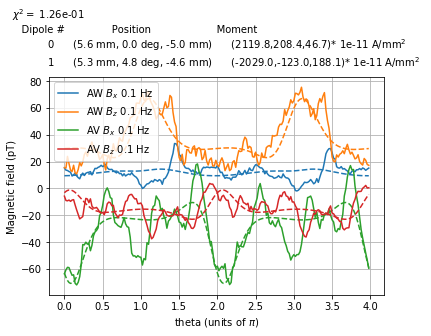

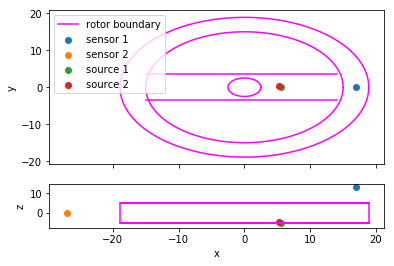

In [130]:
Opt_Settings_Exp2_0p1Hz['plot']=1
Opt_Settings_Exp2_0p1Hz['figname']=SaveDir+'Exp2_0p1Hz_'+nowtext+'_1'
chi2_one_exp_one_freq(opt_res_Exp2_0p1Hz.x,Opt_Settings_Exp2_0p1Hz)
# Opt_Params_Exp2 = opt_res_Exp2.x

In [131]:
Opt_Params_Exp2_low_chi_0p1Hz = opt_res_Exp2_0p1Hz.x
Opt_Params_Exp2_low_chi_0p1Hz

array([ 5.61062535e+00,  2.60907491e-05, -4.99979977e+00,  2.11981378e+03,
        2.08377678e+02,  4.66895718e+01,  5.27525402e+00,  4.81110473e+00,
       -4.59540371e+00, -2.02902582e+03, -1.23010448e+02,  1.88078443e+02,
       -6.94713006e+00,  2.77025543e+01, -2.11853238e+01, -6.94289315e+00])